# Import libraries

In [ ]:
# For CPU
# !pip install --upgrade jaxlib jax
# For GPU
# !pip install --upgrade jax jaxlib==0.1.65+cuda110 -f https://storage.googleapis.com/jax-releases/jax_releases.html

In [ ]:
import jax
import jax.numpy as np
import numpy as onp
from jax import random, vmap, grad, jit
# from jax.experimental import optimizers
from jax.example_libraries import optimizers

import itertools
from functools import partial
from tqdm import trange
import numpy.random as npr
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# from jax.ops import index_update, index
import jax.nn as jnn
import itertools
from functools import partial
from matplotlib import cm
from jax.scipy.linalg import cholesky, solve_triangular, solve
import pandas as pd
import csv

from scipy import optimize

from jax.flatten_util import ravel_pytree
from jax.nn import softplus
from pathlib import Path
import os, sys
from scipy import spatial
from sklearn.model_selection import train_test_split
import scipy.optimize
import scipy.special as sp
import pickle

# Sampling Functions

In [ ]:

def FindFreq1D(x, num_bins = 10):
  # x is a 1D array to be assigned frequency
  x_hist, x_bins_edges = np.histogram(x, num_bins)
  Num_x = len(x)
  x_freq = []
  for i in trange(Num_x):
    for j in range(1, Num_x+1):
      if x[i] <= x_bins_edges[j]:
        freq = float(x_hist[j-1]) / Num_x
        x_freq.append(freq)
        break

  x_freq = np.array(x_freq)
  return x_freq

In [ ]:
def Var1D(x, y, num_bins = 10):
  # Find variance var(y(x)) for given x from data {x_i, y_i}
  x_min = x.min()
  x_max = x.max()
  x_mesh = onp.linspace(x_min, x_max, num_bins + 1)
  x_mesh[0] = x_mesh[0] - 0.1
  x_mesh[-1] = x_mesh[-1] + 0.1

  var_y = []
  for i in trange(num_bins):
    mesh_mask = np.array([a<x_mesh[i] or a>=x_mesh[i+1] for a in x])
    y_masked = onp.ma.array(y, mask=mesh_mask)
    var = y_masked.var()
    var_y.append(var)

  var_y = np.array(var_y)
  x_mesh = onp.linspace(x_min, x_max, num_bins + 1)
  x_mid = (x_mesh[:-1] + x_mesh[1:]) / 2.0
  return x_mid, var_y

In [ ]:
# def sample2d(x, num_sample):
#   # x should be two 1d array
#   x_target = np.linspace(x.min(), x.max(), num_sample)
#   coords = [ [i, j] for i in x_target for j in y_target ]
#   idx_array = []
#   dp = np.stack((x, y), axis=-1)
#   k_tree = spatial.KDTree(dp)
#   for i in trange(len(coords)):
#     idx = k_tree.query(coords[i])[1]
#     idx_array.append(idx)

#   print(len(idx_array))
#   idx_array = list(set(idx_array))
#   print(len(idx_array))
#   return idx_array, coords


def sample2d(x, y, num_sample):
  # x and y should be two 1d array
  x_target = np.linspace(x.min(), x.max(), num_sample)
  y_target = np.linspace(y.min(), y.max(), num_sample)
  coords = [ [i, j] for i in x_target for j in y_target ]
  idx_array = []
  dp = np.stack((x, y), axis=-1)
  k_tree = spatial.KDTree(dp)
  for i in trange(len(coords)):
    idx = k_tree.query(coords[i])[1]
    idx_array.append(idx)

  print(len(idx_array))
  idx_array = list(set(idx_array))
  print(len(idx_array))
  return idx_array, coords


# Auxiliary Functions

In [ ]:
# Tridiagonal Matrix Algorith for solveing Ax=d with a, b, c as the
# three diagonals from the bottom to the top.
def TDMA(a, b, c, d):

    Nx = len(d) # number of equations
    ac, bc, cc, dc = map(onp.array, (a, b, c, d)) # copy arrays
    for it in range(1, Nx):
        mc = ac[it-1]/bc[it-1]
        bc[it] = bc[it] - mc*cc[it-1]
        dc[it] = dc[it] - mc*dc[it-1]

    xc = bc
    xc[-1] = dc[-1]/bc[-1]

    for il in range(Nx-2, -1, -1):
        xc[il] = (dc[il]-cc[il]*xc[il+1])/bc[il]

    return xc

In [ ]:
def GenerateProfile(ProfType, ProfParams, x):
  # generate profile with given Proffile Type with given Profiles Parameters on spacial grid x

  if ProfType == 'cos':
    center, amp, freq = ProfParams

    y = center - amp * onp.cos( 2.0 * np.pi * freq * x )

  elif ProfType == 'tri':
    center, amp, freq = ProfParams

    y = center - amp * ( 4.0 * onp.abs( freq * x - onp.floor( freq * x + 0.5 ) ) - 1.0 )

  elif ProfType == 'trap':
    center, amp, freq = ProfParams

    y = center + amp * ( 2.0/np.pi * ( onp.arcsin(onp.sin(2.0*np.pi * freq * (x-1.0/8.0))) \
                         + onp.arccos(onp.cos(2.0*np.pi * freq * (x-1.0/8.0))) ) - 1 )

  else:
    print("Wrong ProfType in function GenerateProfile()!")
    exit()

  return y

In [ ]:
# spacial gradient using central finite difference
def gradC_periodic(u, dx):

  u_left = onp.roll(u, 1)
  u_right = onp.roll(u, -1)

  dudX = ( u_right - u_left )  / (2.0*dx)

  return dudX

# spacial gradient using backward finite difference
def gradB_periodic(u, dx):

  u_left = onp.roll(u, 1)

  dudX = ( u - u_left )  / dx

  return dudX

# spacial gradient using forward finite difference
def gradF_periodic(u, dx):

  u_right = onp.roll(u, -1)

  dudX = ( u_right - u )  / dx

  return dudX

# spacial laplacian using finite difference
def lap_periodic(u, dx):

  u_left = onp.roll(u, 1)
  u_right = onp.roll(u, -1)

  d2udX2 = ( u_right - 2.0 * u + u_left )  / (dx * dx)

  return d2udX2


# Analytic K & fe for Arrhenius Diffusion

In [ ]:
# analytic mobility m and derivatives dm/dc, d2m/dc2 for Arrhenius diffusion
# Notice that delta function is used for computing the convolution of J*c

def mob_Arr_ana_func(c, Jo, L, D):
  return D * c * (1-c) * np.exp(-2 * Jo*L * c)


def dmobdc_Arr_ana_func(c, Jo, L, D):
  return D * np.exp(-2 * Jo*L * c) * ( (1-2*c) - 2 * Jo*L * c * (1-c) )

def d2mobdc2_Arr_ana_func(c, Jo, L, D):
  return D * np.exp(-2 * Jo*L * c) * ( -2 - 4* Jo*L * (1-2*c) + 4 * Jo*Jo*L*L * c * (1-c) )


def mob_Arr_ana_2nd_func(c, lap_c, JoL, Lx, D):
  return D * c * (1-c) * np.exp(-2 * JoL * (c + Lx**2 * lap_c / 6.0))

def mob_Arr_ana_4nd_func(c, Jc4, D):
  return D * c * (1-c) * np.exp(-Jc4)


# analytic operator entries Kbb, Kbbp1, Kbbm1 with c, dc/dx as input
def Kbb_Arr_ana_func(c, dc, dx, Jo, L, Co=1):
  return 2 * mob_Arr_ana_func(c,Jo,L,Co) / dx + 1.0/3.0 * d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2 * dx

def Kbbp1_Arr_ana_func(c, dc, dx, Jo, L, Co=1):
  return -mob_Arr_ana_func(c,Jo,L,Co)/dx - 1.0/2.0 * dmobdc_Arr_ana_func(c,Jo,L,Co) * dc \
      -1.0/6.0 * d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2 * dx

def Kbbm1_Arr_ana_func(c, dc, dx, Jo, L, Co=1):
  return -mob_Arr_ana_func(c,Jo,L,Co)/dx + 1.0/2.0 * dmobdc_Arr_ana_func(c,Jo,L,Co) * dc \
      -1.0/6.0 * d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2 * dx

# analytic operator entries Kbb, Kbbp1, Kbbm1 with c, dc/dx, d2c/dx2 as input
def Kbb_Arr_ana_2nd_func(c, dc, d2c, dx, Jo, L, Co=1):
  return 2 * mob_Arr_ana_func(c,Jo,L,Co) / dx + \
      1.0/3.0 * ( d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2 + dmobdc_Arr_ana_func(c,Jo,L,Co) * d2c ) * dx


def Kbbp1_Arr_ana_2nd_func(c, dc, d2c, dx, Jo, L, Co=1):
  return -mob_Arr_ana_func(c,Jo,L,Co)/dx - 1.0/2.0 * dmobdc_Arr_ana_func(c,Jo,L,Co) * dc \
      -1.0/6.0 * ( d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2  + dmobdc_Arr_ana_func(c,Jo,L,Co) * d2c) * dx


def Kbbm1_Arr_ana_2nd_func(c, dc, d2c, dx, Jo, L, Co=1):
  return -mob_Arr_ana_func(c,Jo,L,Co)/dx + 1.0/2.0 * dmobdc_Arr_ana_func(c,Jo,L,Co) * dc \
      -1.0/6.0 * ( d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2  + dmobdc_Arr_ana_func(c,Jo,L,Co) * d2c) * dx

def K_1_Arr_ana_func(c, dc, dx, Jo, L, Co=1):
  return - mob_Arr_ana_func(c,Jo,L,Co) / dx - 1.0/24.0 * d2mobdc2_Arr_ana_func(c,Jo,L,Co) * dc**2 * dx


# analytic free energy
def fe_Arr_ana_func(c, Jo, L, D):
  return - 1.0/2.0 * c * 2*Jo*L * c + c * np.log(c) + (1-c) * np.log(1-c)

def fe_Arr_ana_2nd_func(c, lap_c, JoL, Lx, D):
  return - 1.0/2.0 * c * 2*JoL * (c + Lx**2 * lap_c / 6.0) + c * np.log(c) + (1-c) * np.log(1-c)

def Q_Arr_ana_func(c, Jo, L, D):
  return - 2*Jo*L * c - np.log(1/c - 1)

def Q_Arr_ana_2nd_func(c, lap_c, JoL, Lx, D):
  return - 2*JoL * ( c + Lx**2 * lap_c / 6.0 ) - np.log(1/c - 1)

def Jc4_func(c, JoL, Lx, dx):
  c_left2 = np.roll(c, 2)
  c_left = np.roll(c, 1)
  c_right = np.roll(c, -1)
  c_right2 = np.roll(c, -2)

  grad2_c = ( - c_right2 + 16 * c_right - 30 * c + 16 * c_left - c_left2 ) / ( 12 * dx**2 )
  grad4_c = ( c_right2 - 4 * c_right + 6 * c - 4 * c_left + c_left2 ) / ( dx**4 )

  Jc4 = 2*JoL * ( c + Lx**2 * grad2_c / 6.0 + Lx**4 * grad4_c / 120.0 )

  return Jc4

def Q_Arr_ana_4nd_func(c, Jc4, D):

  return - Jc4 - np.log(1/c - 1)




# gradient and Laplacian
def grad_x(y_0, y_1, dx):
  return ( y_1 - y_0 ) / dx

def lap_x(y_0, y_1, y_2, dx):
  return ( y_2 - 2 * y_1 + y_0 ) / ( dx ** 2 )

# MLP

In [ ]:
# Multilayer perceptron neural network
def MLP(layers, activation='softplus'):
  def init(rng_key):
    def init_layer(key, d_in, d_out):
      # Initialize weights and bias (Glorot)
      k1, k2 = random.split(key)
      glorot_stddev = 1. / np.sqrt((d_in + d_out) / 2.)
      W = glorot_stddev*random.normal(k1, (d_in, d_out))
      b = np.zeros(d_out)
      return W, b

    key, *keys = random.split(rng_key, len(layers))
    params = list(map(init_layer, keys, layers[:-1], layers[1:]))
    return params

  def apply(params, inputs):
    for W, b in params[:-1]:
      outputs = np.dot(inputs, W) + b
      if activation == 'softplus':
        inputs = softplus(outputs)
      elif activation == 'ReLU':
        inputs = jnn.relu(outputs)
      elif activation == 'GeLU':
        inputs = jnn.gelu(outputs)
      elif activation == 'sigmoid':
        inputs = jnn.sigmoid(outputs)
      elif activation == 'tanh':
        inputs = np.tanh(outputs)
    W, b = params[-1]
    outputs = np.dot(inputs, W) + b

    return outputs
  return init, apply

# K1_MP_INN for Multi-Point expansion $K_1(\rho_i, \rho_{i+1})$

In [ ]:
class K1_MP_INN():
# Learn K0, K1 from fluctuations
# 1 NN for K_1. K_0 is defined through K_1 by mass conservation
# Here K_1 is a function of 2 points rho_i & rho_{i+1}
  def __init__(self, train_data, layers, lr=1e-3, af = 'softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0)):

    # training data
    # train_data_K = rho_middle_0_train_K, rho_left_0_train_K, rho_right_0_train_K, K_0_train_K, rho_left_1_train_K, rho_right_1_train_K, K_1_train_K,\
    #         dx_basis


    # Load training data
    # K_0 = Kbb
    self.rho_middle_0 = train_data[0]
    self.rho_left_0 = train_data[1]
    self.rho_right_0 = train_data[2]
    self.K_0 = train_data[3]

    # K_1 = Kbbp1 = Kbp1b
    self.rho_left_1 = train_data[4]
    self.rho_right_1 = train_data[5]
    self.K_1 = train_data[6]
    print('Number of K_0 data:', self.K_0.shape)
    print('Number of K_1 data:', self.K_1.shape)

    self.dx_basis = train_data[7]


    # find local density and density gradient
    # for K_0
    self.rho_0 = self.rho_middle_0
    self.drho_0 = ( self.rho_right_0 - self.rho_left_0 ) / ( 2.0 * self.dx_basis )
    # for K_1
    self.rho_1 = ( self.rho_right_1 + self.rho_left_1 ) / 2.0
    self.drho_1 = ( self.rho_right_1 - self.rho_left_1 ) / self.dx_basis


    self.TrainTest = TrainTest
    if self.TrainTest == True:
      # Load testing data
      # K_0 = Kbb
      self.rho_middle_0_test = test_data[0]
      self.rho_left_0_test = test_data[1]
      self.rho_right_0_test = test_data[2]
      self.K_0_test = test_data[3]

      # K_1 = Kbbp1 = Kbp1b
      self.rho_left_1_test = test_data[4]
      self.rho_right_1_test = test_data[5]
      self.K_1_test = test_data[6]


      # find local density and density gradient
      # for K_0
      self.rho_0_test = self.rho_middle_0_test
      self.drho_0_test = ( self.rho_right_0_test - self.rho_left_0_test ) / ( 2.0 * self.dx_basis )
      # for K_1
      self.rho_1_test = ( self.rho_right_1_test + self.rho_left_1_test ) / 2.0
      self.drho_1_test = ( self.rho_right_1_test - self.rho_left_1_test ) / self.dx_basis



    self.layers = layers
    print('layers =', self.layers)


    # set mean and std
    self.rho_0_mean = self.rho_0.mean()
    self.drho_0_mean = self.drho_0.mean()
    self.rho_1_mean = self.rho_1.mean()
    self.drho_1_mean = self.drho_1.mean()

    self.rho_0_std = self.rho_0.std()
    self.drho_0_std = self.drho_0.std()
    self.rho_1_std = self.rho_1.std()
    self.drho_1_std = self.drho_1.std()


    # Set scale factor
    self.K_0_scale = self.K_0.mean()
    self.K_1_scale = self.K_1.mean()

    print('K_0 scale = ', self.K_0_scale)
    print('K_1 scale = ', self.K_1_scale)

    # Load MLP
    self.net_K_1_init, self.net_K_1_apply = MLP(self.layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params = self.net_K_1_init(rng_key)

    # Initialize loss weights using NTK method
    self.factor_K_0, self.factor_K_1 = self.get_factors(self.params)
    print('K_0 loss weight =', self.factor_K_0)
    print('K_1 loss weight =', self.factor_K_1)

    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []
    self.loss_K_0_log = []
    self.loss_K_1_log = []
    if self.TrainTest == True:
      self.loss_test_log = []
      self.loss_K_0_test_log = []
      self.loss_K_1_test_log = []

    self.itercount = itertools.count()
    self.print_flag = False


  def Real_to_Pos(self, x):
    # a function that convert real number to positive number
    return np.heaviside(x, 0) * ( x + np.exp(-5) ) + np.heaviside(-x, 0) * np.exp( x - 5 )

  def net_K_1(self, params, rho_left, rho_right):

    rho = ( rho_right + rho_left ) / 2.0
    drho = ( rho_right - rho_left ) / self.dx_basis

    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized])
    K_1 = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    # Real_to_Pos is used for applying positive semi-definity on K

    return K_1[0]


  def net_K_0(self, params, rho_middle, rho_left, rho_right):

    return - ( self.net_K_1(params, rho_left, rho_middle) + self.net_K_1(params, rho_middle, rho_right) )


  # Adaptive loss weights
  def K_0_eqt(self, params, rho_middle, rho_left, rho_right, K_0):
    NN_K_0 = self.net_K_0(params, rho_middle, rho_left, rho_right)

    return (NN_K_0 - K_0)

  def K_1_eqt(self, params, rho_left, rho_right, K_1):
    NN_K_1 = self.net_K_1(params, rho_left, rho_right)
    return (NN_K_1 - K_1)


  def grad_K_0_eqt(self, params, rho_middle, rho_left, rho_right, K_0):
    return grad(self.K_0_eqt, 0)(params, rho_middle, rho_left, rho_right, K_0)

  def grad_K_1_eqt(self, params, rho_left, rho_right, K_1):
    return grad(self.K_1_eqt, 0)(params, rho_left, rho_right, K_1)


  def flat_append(self, grad_A):
    tmp = []
    for i in range(len(grad_A)):
      tmp.append(np.concatenate((grad_A[i][0].flatten(), grad_A[i][1].flatten()), axis=None))
      # Here [0] and [1] corresponds to weights and biases shapes
    tmp_ary = np.concatenate(tmp).ravel()
    return tmp_ary


  def get_factors(self, params):  # self adaptive loss weights by NTK

    grad_K_0 = vmap(self.grad_K_0_eqt, in_axes=(None, 0, 0, 0, 0))(params, self.rho_middle_0, self.rho_left_0, self.rho_right_0, self.K_0)
    tr_K_0 = np.sum(np.square(self.flat_append(grad_K_0)))

    grad_K_1 = vmap(self.grad_K_1_eqt, in_axes=(None, 0, 0, 0))(params, self.rho_left_1, self.rho_right_1, self.K_1)
    tr_K_1 = np.sum(np.square(self.flat_append(grad_K_1)))

    tr_NTK = tr_K_0 + tr_K_1

    factor_K_0 = (tr_NTK / tr_K_0)
    factor_K_1 = (tr_NTK / tr_K_1)

    return factor_K_0, factor_K_1


  # Loss functions
  def net_loss_K_0(self, NN_K_0, K_0):
    loss_K_0 = np.mean( (NN_K_0 - K_0) ** 2)
    return self.factor_K_0 * loss_K_0

  def net_loss_K_1(self, NN_K_1, K_1):
    loss_K_1 = np.mean( (NN_K_1 - K_1) ** 2)
    return self.factor_K_1 * loss_K_1


  def loss_part(self, params):

    NN_K_0 = vmap(self.net_K_0, in_axes=(None, 0, 0, 0))(params, self.rho_middle_0, self.rho_left_0, self.rho_right_0)
    NN_K_1 = vmap(self.net_K_1, in_axes=(None, 0, 0))(params, self.rho_left_1, self.rho_right_1)

    loss_K_0 = self.net_loss_K_0(NN_K_0, self.K_0)
    loss_K_1 = self.net_loss_K_1(NN_K_1, self.K_1)

    return loss_K_0, loss_K_1

  def loss_test_part(self, params):

    NN_K_0_test = vmap(self.net_K_0, in_axes=(None, 0, 0, 0))(params, self.rho_middle_0_test, self.rho_left_0_test, self.rho_right_0_test)
    NN_K_1_test = vmap(self.net_K_1, in_axes=(None, 0, 0))(params, self.rho_left_1_test, self.rho_right_1_test)

    loss_K_0_test = self.net_loss_K_0(NN_K_0_test, self.K_0_test)
    loss_K_1_test = self.net_loss_K_1(NN_K_1_test, self.K_1_test)

    return loss_K_0_test, loss_K_1_test


  def loss(self, params, epoch):

    loss_K_0, loss_K_1 = self.loss_part(params)
    loss = loss_K_0 + loss_K_1

    return loss


  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)

      loss_K_0_value, loss_K_1_value = self.loss_part(params)
      loss_value = loss_K_0_value + loss_K_1_value

      self.loss_log.append(loss_value)
      self.loss_K_0_log.append(loss_K_0_value)
      self.loss_K_1_log.append(loss_K_1_value)

      if self.TrainTest == True:
        loss_K_0_test_value, loss_K_1_test_value = self.loss_test_part(params)
        loss_test_value = loss_K_0_test_value + loss_K_1_test_value

        self.loss_test_log.append(loss_value)
        self.loss_K_0_test_log.append(loss_K_0_test_value)
        self.loss_K_1_test_log.append(loss_K_1_test_value)

      if self.print_flag:
        print("\nTotal loss = {}".format(loss_value))
        print("\nloss K_0 = {L_K_0}; loss K_1 = {L_K_1}".format(L_K_0=loss_K_0_value, L_K_1=loss_K_1_value))
        if self.TrainTest == True:
          print("\nTotal test loss = {}".format(loss_test_value))
          print("\ntest loss K_0 = {L_K_0_test}; test loss K_1 = {L_K_1_test}".format(\
                L_K_0_test=loss_K_0_test_value, L_K_1_test=loss_K_1_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_K_1_MP(self, params, rho_left, rho_right):
    K_1_pred = self.net_K_1(params, rho_left, rho_right)
    return K_1_pred

  @partial(jit, static_argnums=(0,))
  def predict_K_0_MP(self, params, rho_middle, rho_left, rho_right):
    K_0_pred = self.net_K_0(params, rho_middle, rho_left, rho_right)
    return K_0_pred



  @partial(jit, static_argnums=(0,))
  def predict_K_1(self, params, rho, drho):
    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized])
    K_1_pred = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    return K_1_pred[0]

  @partial(jit, static_argnums=(0,))
  def predict_K_0(self, params, rho, drho, d2rho):
    rho_middle = rho
    rho_left = rho - drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2
    rho_right = rho + drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2

    K_0_pred = self.net_K_0(params, rho_middle, rho_left, rho_right)
    return K_0_pred

# K14_MP_INN for Multi-Point expansion $K_1(\rho_{i-1}, \rho_i, \rho_{i+1}, \rho_{i+2})$ with strongly satisfied mass conservation

In [ ]:
class K14_MP_INN():
# Learn K0, K1 from fluctuations
# 1 NN for K_1. K_0 is defined through K_1 by mass conservation
# Here K_1 is a function of 4 points rho_a with a = i-1, i, i+1, i+2
  def __init__(self, train_data, layers, lr=1e-3, af = 'softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0)):

    # training data
    # train_data_K = rho_middle_0_train_K, rho_left_0_train_K, rho_left_0_train_K, rho_right_0_train_K, rho_right_0_train_K, K_0_train_K, \
    #         rho_left_1_train_K, rho_left2_1_train_K, rho_right_1_train_K, rho_right2_1_train_K, K_1_train_K,\
    #         dx_basis


    # Load training data
    # K_0 = Kbb
    self.rho_middle_0 = train_data[0]
    self.rho_left_0 = train_data[1]
    self.rho_left2_0 = train_data[2]
    self.rho_right_0 = train_data[3]
    self.rho_right2_0 = train_data[4]
    self.K_0 = train_data[5]

    # K_1 = Kbbp1 = Kbp1b
    self.rho_left_1 = train_data[6]
    self.rho_left2_1 = train_data[7]
    self.rho_right_1 = train_data[8]
    self.rho_right2_1 = train_data[9]
    self.K_1 = train_data[10]
    print('Number of K_0 data:', self.K_0.shape)
    print('Number of K_1 data:', self.K_1.shape)

    self.dx_basis = train_data[11]
    self.dx2_basis = self.dx_basis * self.dx_basis


    # find local density and density gradient
    # for K_1
    self.rho_1 = ( self.rho_right_1 + self.rho_left_1 ) / 2.0
    self.drho_1 = ( self.rho_right_1 - self.rho_left_1 ) / self.dx_basis
    self.d2rho_left_1 = ( self.rho_right_1 - 2 * self.rho_left_1 + self.rho_left2_1) / self.dx2_basis
    self.d2rho_right_1 = ( self.rho_right2_1 - 2 * self.rho_right_1 + self.rho_left_1) / self.dx2_basis
    self.d2rho_1 = ( self.d2rho_right_1 + self.d2rho_left_1 ) / 2.0
    self.d3rho_1 = ( self.d2rho_right_1 - self.d2rho_left_1 ) / self.dx_basis


    self.TrainTest = TrainTest
    if self.TrainTest == True:
      print("Don't use Train-Test Split!")
      exit()



    self.layers = layers
    print('layers =', self.layers)


    # set mean and std
    self.rho_1_mean = self.rho_1.mean()
    self.drho_1_mean = self.drho_1.mean()
    self.d2rho_1_mean = self.d2rho_1.mean()
    self.d3rho_1_mean = self.d3rho_1.mean()


    self.rho_1_std = self.rho_1.std()
    self.drho_1_std = self.drho_1.std()
    self.d2rho_1_std = self.d2rho_1.std()
    self.d3rho_1_std = self.d3rho_1.std()


    # Set scale factor
    self.K_0_scale = self.K_0.mean()
    self.K_1_scale = self.K_1.mean()

    print('K_0 scale = ', self.K_0_scale)
    print('K_1 scale = ', self.K_1_scale)

    # Load MLP
    self.net_K_1_init, self.net_K_1_apply = MLP(self.layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params = self.net_K_1_init(rng_key)

    # Initialize loss weights using NTK method
    self.factor_K_0, self.factor_K_1 = self.get_factors(self.params)
    print('K_0 loss weight =', self.factor_K_0)
    print('K_1 loss weight =', self.factor_K_1)

    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []
    self.loss_K_0_log = []
    self.loss_K_1_log = []
    if self.TrainTest == True:
      self.loss_test_log = []
      self.loss_K_0_test_log = []
      self.loss_K_1_test_log = []

    self.itercount = itertools.count()
    self.print_flag = False


  def Real_to_Pos(self, x):
    # a function that convert real number to positive number
    return np.heaviside(x, 0) * ( x + np.exp(-5) ) + np.heaviside(-x, 0) * np.exp( x - 5 )

  def net_K_1(self, params, rho_left2, rho_left, rho_right, rho_right2):

    rho = ( rho_right + rho_left ) / 2.0
    drho = ( rho_right - rho_left ) / self.dx_basis
    d2rho_left = ( rho_right - 2 * rho_left + rho_left2) / self.dx2_basis
    d2rho_right = ( rho_right2 - 2 * rho_right + rho_left) / self.dx2_basis
    d2rho = ( d2rho_right + d2rho_left ) / 2.0
    d3rho = ( d2rho_right - d2rho_left ) / self.dx_basis

    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1 = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    # Real_to_Pos is used for applying positive semi-definity on K

    return K_1[0]


  def net_K_0(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):

    return - ( self.net_K_1(params, rho_left2, rho_left, rho_middle, rho_right) + self.net_K_1(params, rho_left, rho_middle, rho_right, rho_right2) )


  # Adaptive loss weights
  def K_0_eqt(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2, K_0):
    NN_K_0 = self.net_K_0(params, rho_middle, rho_left, rho_left2, rho_right, rho_right2)

    return (NN_K_0 - K_0)

  def K_1_eqt(self, params, rho_left2, rho_left, rho_right, rho_right2, K_1):
    NN_K_1 = self.net_K_1(params, rho_left2, rho_left, rho_right, rho_right2)
    return (NN_K_1 - K_1)


  def grad_K_0_eqt(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2, K_0):
    return grad(self.K_0_eqt, 0)(params, rho_middle, rho_left, rho_left2, rho_right, rho_right2, K_0)

  def grad_K_1_eqt(self, params, rho_left2, rho_left, rho_right, rho_right2, K_1):
    return grad(self.K_1_eqt, 0)(params, rho_left2, rho_left, rho_right, rho_right2, K_1)


  def flat_append(self, grad_A):
    tmp = []
    for i in range(len(grad_A)):
      tmp.append(np.concatenate((grad_A[i][0].flatten(), grad_A[i][1].flatten()), axis=None))
      # Here [0] and [1] corresponds to weights and biases shapes
    tmp_ary = np.concatenate(tmp).ravel()
    return tmp_ary


  def get_factors(self, params):  # self adaptive loss weights by NTK

    grad_K_0 = vmap(self.grad_K_0_eqt, in_axes=(None, 0, 0, 0, 0, 0, 0))\
                    (params, self.rho_middle_0, self.rho_left_0, self.rho_left2_0, self.rho_right_0, self.rho_right2_0, self.K_0)
    tr_K_0 = np.sum(np.square(self.flat_append(grad_K_0)))

    grad_K_1 = vmap(self.grad_K_1_eqt, in_axes=(None, 0, 0, 0, 0, 0))(params, self.rho_left2_1,  self.rho_left_1, self.rho_right_1, self.rho_right2_1, self.K_1)
    tr_K_1 = np.sum(np.square(self.flat_append(grad_K_1)))

    tr_NTK = tr_K_0 + tr_K_1

    factor_K_0 = (tr_NTK / tr_K_0)
    factor_K_1 = (tr_NTK / tr_K_1)

    return factor_K_0, factor_K_1


  # Loss functions
  def net_loss_K_0(self, NN_K_0, K_0):
    loss_K_0 = np.mean( (NN_K_0 - K_0) ** 2)
    return self.factor_K_0 * loss_K_0

  def net_loss_K_1(self, NN_K_1, K_1):
    loss_K_1 = np.mean( (NN_K_1 - K_1) ** 2)
    return self.factor_K_1 * loss_K_1


  def loss_part(self, params):

    NN_K_0 = vmap(self.net_K_0, in_axes=(None, 0, 0, 0, 0, 0))(params, self.rho_middle_0, self.rho_left_0, self.rho_left2_0, self.rho_right_0, self.rho_right2_0)
    NN_K_1 = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params, self.rho_left2_1, self.rho_left_1, self.rho_right_1, self.rho_right2_1)

    loss_K_0 = self.net_loss_K_0(NN_K_0, self.K_0)
    loss_K_1 = self.net_loss_K_1(NN_K_1, self.K_1)

    return loss_K_0, loss_K_1

  def loss_test_part(self, params):
    print("Don't use Train-Test Split!")
    exit()


    # NN_K_0_test = vmap(self.net_K_0, in_axes=(None, 0, 0, 0))(params, self.rho_middle_0_test, self.rho_left_0_test, self.rho_right_0_test)
    # NN_K_1_test = vmap(self.net_K_1, in_axes=(None, 0, 0))(params, self.rho_left_1_test, self.rho_right_1_test)

    # loss_K_0_test = self.net_loss_K_0(NN_K_0_test, self.K_0_test)
    # loss_K_1_test = self.net_loss_K_1(NN_K_1_test, self.K_1_test)

    # return loss_K_0_test, loss_K_1_test


  def loss(self, params, epoch):

    loss_K_0, loss_K_1 = self.loss_part(params)
    loss = loss_K_0 + loss_K_1

    return loss


  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)

      loss_K_0_value, loss_K_1_value = self.loss_part(params)
      loss_value = loss_K_0_value + loss_K_1_value

      self.loss_log.append(loss_value)
      self.loss_K_0_log.append(loss_K_0_value)
      self.loss_K_1_log.append(loss_K_1_value)

      if self.TrainTest == True:
        loss_K_0_test_value, loss_K_1_test_value = self.loss_test_part(params)
        loss_test_value = loss_K_0_test_value + loss_K_1_test_value

        self.loss_test_log.append(loss_value)
        self.loss_K_0_test_log.append(loss_K_0_test_value)
        self.loss_K_1_test_log.append(loss_K_1_test_value)

      if self.print_flag:
        print("\nTotal loss = {}".format(loss_value))
        print("\nloss K_0 = {L_K_0}; loss K_1 = {L_K_1}".format(L_K_0=loss_K_0_value, L_K_1=loss_K_1_value))
        if self.TrainTest == True:
          print("\nTotal test loss = {}".format(loss_test_value))
          print("\ntest loss K_0 = {L_K_0_test}; test loss K_1 = {L_K_1_test}".format(\
                L_K_0_test=loss_K_0_test_value, L_K_1_test=loss_K_1_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_K_1_MP(self, params, rho_left2, rho_left, rho_right, rho_right2):
    K_1_pred = self.net_K_1(params, rho_left2, rho_left, rho_right, rho_right2)
    return K_1_pred

  @partial(jit, static_argnums=(0,))
  def predict_K_0_MP(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    K_0_pred = self.net_K_0(params, rho_middle, rho_left, rho_left2, rho_right, rho_right2)
    return K_0_pred



  @partial(jit, static_argnums=(0,))
  def predict_K_1(self, params, rho, drho, d2rho, d3rho):
    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1_pred = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    return K_1_pred[0]

  # @partial(jit, static_argnums=(0,))
  # def predict_K_0(self, params, rho, drho, d2rho):
  #   rho_middle = rho
  #   rho_left = rho - drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2
  #   rho_right = rho + drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2

  #   K_0_pred = self.net_K_0(params, rho_middle, rho_left, rho_right)
  #   return K_0_pred

# fe_INN with rho and DrhoDt for $f(\rho)$

In [ ]:
class fe_INN():
# Learn free energy (fe) from short-time evolution & K
# 1 NN for fe. K_0 is defined through K_1 by mass conservation
# Here fe is a function of local rho

  def __init__(self, train_data, layers, lr=1e-3, af = 'softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0), DataWeights = 1, \
               AdpEqVar_Step = -1):

    # Load training data
    # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho = train_data[0]
    self.rho_left = train_data[1]
    self.rho_right = train_data[2]

    print('data shape = ', self.rho.shape)

    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data[3]
    self.DrhoDt_left = train_data[4]
    self.DrhoDt_right = train_data[5]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    self.K_0 = train_data[6]
    self.K_left = train_data[7]
    self.K_right = train_data[8]

    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data[9]

    # variance for the equation residue
    self.var_eq = train_data[10]

    self.dx = train_data[11]

    # Adaptive Equation Variance (AEV) method setting for updating var_eq
    self.AdpEqVar_Step = AdpEqVar_Step  # using AEv and updating var_eq for every AdpEqVar_Step steps/epoches
                        # -1 for not using AEV and keeping var_eq as its input value;
    if self.AdpEqVar_Step > 0:
      self.Nt = int(train_data[12])  # number of timesteps for calculating AEV
      self.Dim1 = int(self.var_eq.shape[0] / self.Nt)
      self.var_eq_log = self.var_eq.reshape(-1,1) # log for var_eq using AEV with var_eq_log[:,i] refers to the i-th updated var_eq


    # # reference rho where fe = 0 and dfe_drho = 0
    # self.rho_ref = 0.5


    # Find Data Weights based on the distribution of rho
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else: # no Data Weights (all as 1)
      self.weights = 1.0 + 0 * self.rho


    self.TrainTest = TrainTest
    if self.TrainTest == True:

      # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
      self.rho_test = test_data[0]
      self.rho_left_test = test_data[1]
      self.rho_right_test = test_data[2]

      # \rho and neighbours at t=t_0+Delta_t
      self.DrhoDt_test = test_data[3]
      self.DrhoDt_left_test = test_data[4]
      self.DrhoDt_right_test = test_data[5]

      # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
      # and (rho_right, drho_right) for calculating (K grad_fe)
      self.K_0_test = test_data[6]
      self.K_left_test = test_data[7]
      self.K_right_test = test_data[8]

      # # tridiagonal entries for mass matrix M
      # self.M_tri_0, self.M_tri_left, self.M_tri_right= test_data[9]

      # variance for the equation residue
      self.var_eq_test = test_data[10]

      # Find Data Weights
      if self.DataWeights == True:
        self.weights_test = 1.0 / FindFreq1D(self.rho_test, num_bins = 20)
      else:
        self.weights_test = 1.0 + 0 * self.rho_test


    self.layers = layers


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * self.rho_scale
    # self.fe_scale = -0.5

    print('\nrho scale = ', self.rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_fe_init, self.net_fe_apply = MLP(layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params_fe = self.net_fe_init(rng_key)

    self.params = self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []

    if self.TrainTest == True:
      self.loss_test_log = []


    self.itercount = itertools.count()
    self.print_flag = False

  # calculate fe
  def net_fe(self, params_fe, rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    inputs = np.stack([rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = dfe_drho(rho) point-wisely
  def net_grid_Q(self, params_fe, rho):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0))(params_fe, rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    return dfe_drho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt

  def loss_part(self, params):
    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left)
    Q = self.net_grid_Q(params_fe, self.rho)
    Q_right = self.net_grid_Q(params_fe, self.rho_right)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss_test_part(self, params):
    params_fe = params
    Q_left_test = self.net_grid_Q(params_fe, self.rho_left_test)
    Q_test = self.net_grid_Q(params_fe, self.rho_test)
    Q_right_test = self.net_grid_Q(params_fe, self.rho_right_test)

    loss_evol_test = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left_test.flatten(), self.DrhoDt_test.flatten(), self.DrhoDt_right_test.flatten(),\
                          self.K_left_test.flatten(), self.K_0_test.flatten(), self.K_right_test.flatten(),\
                          Q_left_test.flatten(), Q_test.flatten(), Q_right_test.flatten()) )**2 / self.var_eq_test.flatten() \
                          * self.weights_test.flatten())

    return loss_evol_test


  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  def AEV_update(self, params):

    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left)
    Q = self.net_grid_Q(params_fe, self.rho)
    Q_right = self.net_grid_Q(params_fe, self.rho_right)

    # equation residue
    evol_eqt = vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
              (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
              self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
              Q_left.flatten(), Q.flatten(), Q_right.flatten())

    # reshape from flattened vector into shape (Dim1, Nt)
    evol_eqt_reshape = evol_eqt.reshape(self.Dim1, self.Nt)

    # calculating variance and update
    var_evol_eqt_Dim1 = evol_eqt_reshape.var(axis=1)
    var_evol_eqt_all = np.tile(var_evol_eqt_Dim1[:, np.newaxis], (1, self.Nt))
    var_evol_eqt = var_evol_eqt_all.flatten() + self.jit

    return var_evol_eqt


  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.TrainTest == True:
        loss_evol_test_value = self.loss_test_part(params)
        loss_test_value = loss_evol_test_value

        self.loss_test_log.append(loss_test_value)

      if self.print_flag:
        print("\nloss = {}".format(loss_value))

        if self.TrainTest == True:
          print("\nloss_test = {}".format(loss_test_value))


      # update and record var_eq if using AEV method
      if self.AdpEqVar_Step > 0:
        if (epoch+1) % self.AdpEqVar_Step == 0:
          self.var_eq = self.AEV_update(params)
          self.var_eq_log = np.concatenate([self.var_eq_log, self.var_eq.reshape(-1,1)], axis=1)



  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho):
    params_fe = params
    fe_pred = self.net_fe(params_fe, rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred



# fe_gradB_INN with rho and DrhoDt for $f(\rho, \nabla \rho)$ using backward gradient scheme

In [ ]:
class fe_gradB_INN():
# Learn free energy (fe) from short-time evolution & K
# 1 NN for fe. K_0 is defined through K_1 by mass conservation
# Here fe is a function of local rho and grad rho (using backward scheme for gradient)

  def __init__(self, train_data, layers, lr=1e-3, af='softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0), DataWeights = 1, \
               AdpEqVar_Step = -1):
    # The code for Adptive Variance Method (AdpEqVar) is not added yet. Please look for fe_INN if needed.

    # Training data
    # train_data_fe = rho_grad_rho_train_fe, rho_grad_rho_left_train_fe, rho_grad_rho_right_train_fe, rho_grad_rho_right2_train_fe,\
    #       DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
    #       K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis
    # if feVarType == 'AdpEqVar':
    #   train_data_fe = train_data_fe + (R4, )

    # Load training data
    # \rho, (backward) \nabla \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho, self.grad_rho = train_data[0]
    self.rho_left, self.grad_rho_left = train_data[1]
    self.rho_right, self.grad_rho_right = train_data[2]
    self.rho_right2, self.grad_rho_right2 = train_data[3]

    print('data shape = ', self.rho.shape)


    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data[4]
    self.DrhoDt_left = train_data[5]
    self.DrhoDt_right = train_data[6]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    self.K_0 = train_data[7]
    self.K_left = train_data[8]
    self.K_right = train_data[9]

    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data[10]

    # variance for the equation residue
    self.var_eq = train_data[11]

    # spatial descretization
    self.dx = train_data[12]


    # # reference rho where fe = 0 and dfe_drho = 0
    # self.rho_ref = 0.5


    # Find Data Weights
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else:
      self.weights = 1.0 + 0 * self.rho


    self.TrainTest = TrainTest
    if self.TrainTest == True:

      # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
      self.rho_test, self.grad_rho_test = test_data[0]
      self.rho_left_test, self.grad_rho_left_test = test_data[1]
      self.rho_right_test, self.grad_rho_right_test = test_data[2]
      self.rho_right2_test, self.grad_rho_right2_test = test_data[3]

      # \rho and neighbours at t=t_0+Delta_t
      self.DrhoDt_test = test_data[4]
      self.DrhoDt_left_test = test_data[5]
      self.DrhoDt_right_test = test_data[6]

      # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
      # and (rho_right, drho_right) for calculating (K grad_fe)
      self.K_0_test = test_data[7]
      self.K_left_test = test_data[8]
      self.K_right_test = test_data[9]

      # # tridiagonal entries for mass matrix M
      # self.M_tri_0, self.M_tri_left, self.M_tri_right= test_data[10]

      # variance for the equation residue
      self.var_eq_test = test_data[11]


      # Find Data Weights
      if self.DataWeights == True:
        self.weights_test = 1.0 / FindFreq1D(self.rho_test, num_bins = 20)
      else:
        self.weights_test = 1.0 + 0 * self.rho_test


    self.layers = layers


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.grad_rho_ave = self.grad_rho.mean()
    self.grad_rho_std = self.grad_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.grad_rho_scale = (np.abs(self.grad_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * ( self.rho_scale + self.grad_rho_scale * self.dx )
    # self.fe_scale = -0.5

    print('\nrho scale = ', self.rho_scale)
    print('\ngrad rho scale = ', self.grad_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_fe_init, self.net_fe_apply = MLP(layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params_fe = self.net_fe_init(rng_key)

    self.params = self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []

    if self.TrainTest == True:
      self.loss_test_log = []


    self.itercount = itertools.count()
    self.print_flag = False

  # calculate fe
  def net_fe(self, params_fe, rho, grad_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    grad_rho_normalize = (grad_rho - self.grad_rho_ave) / self.grad_rho_std
    inputs = np.stack([rho_normalize, grad_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho - grad dfe_dgradRho point-wisely
  def net_grid_Q(self, params_fe, rho, grad_rho, rho_right, grad_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dgradRho = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten()) # backward grad rho
    dfe_dgradRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten())
    grad_dfe_dgradRho = ( dfe_dgradRho_right - dfe_dgradRho ) / self.dx # forward grad
    grad_dfe_dgradRho = grad_dfe_dgradRho.reshape(rho.shape)

    return dfe_drho - grad_dfe_dgradRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt


  def loss_part(self, params):
    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left, self.grad_rho_left, self.rho, self.grad_rho)
    Q = self.net_grid_Q(params_fe, self.rho, self.grad_rho, self.rho_right, self.grad_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho_right, self.grad_rho_right, self.rho_right2, self.grad_rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss_test_part(self, params):
    params_fe = params
    Q_left_test = self.net_grid_Q(params_fe, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test)
    Q_test = self.net_grid_Q(params_fe, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test)
    Q_right_test = self.net_grid_Q(params_fe, self.rho_right_test, self.grad_rho_right_test, self.rho_right2_test, self.grad_rho_right2_test)

    loss_evol_test = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left_test.flatten(), self.DrhoDt_test.flatten(), self.DrhoDt_right_test.flatten(),\
                          self.K_left_test.flatten(), self.K_0_test.flatten(), self.K_right_test.flatten(),\
                          Q_left_test.flatten(), Q_test.flatten(), Q_right_test.flatten()) )**2 / self.var_eq_test.flatten() \
                          * self.weights_test.flatten())

    return loss_evol_test


  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.TrainTest == True:
        loss_evol_test_value = self.loss_test_part(params)
        loss_test_value = loss_evol_test_value

        self.loss_test_log.append(loss_test_value)

      if self.print_flag:
        print("\nloss = {}".format(loss_value))

        if self.TrainTest == True:
          print("\nloss_test = {}".format(loss_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho, grad_rho):
    params_fe = params
    fe_pred = self.net_fe(params_fe, rho, grad_rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred



# fe_gradC_INN with rho and DrhoDt for $f(\rho, \nabla \rho)$ using central gradient scheme

In [ ]:
class fe_gradC_INN():
# Learn free energy (fe) from short-time evolution & K
# 1 NN for fe. K_0 is defined through K_1 by mass conservation
# Here fe is a function of local rho and grad rho (using central scheme for gradient)


  def __init__(self, train_data, layers, lr=1e-3, af='softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0), DataWeights = 1):
    # This code is not updated to the latest version since it is seldomly used. Please look for fe_INN and fe_gradB_INN if needed.

    # Load training data
    # \rho, (central) \nabla \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho, self.grad_rho = train_data[0]
    self.rho_left, self.grad_rho_left = train_data[1]
    self.rho_left2, self.grad_rho_left2 = train_data[2]
    self.rho_right, self.grad_rho_right = train_data[3]
    self.rho_right2, self.grad_rho_right2 = train_data[4]

    print('data shape = ', self.rho.shape)


    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data[5]
    self.DrhoDt_left = train_data[6]
    self.DrhoDt_right = train_data[7]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    self.K_0 = train_data[8]
    self.K_left = train_data[9]
    self.K_right = train_data[10]

    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data[11]

    # variance for the equation residue
    self.var_eq = train_data[12]

    # spatial descretization
    self.dx = train_data[13]


    # # reference rho where fe = 0 and dfe_drho = 0
    # self.rho_ref = 0.5


    # Find Data Weights
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else:
      self.weights = 1.0 + 0 * self.rho


    self.TrainTest = TrainTest
    if self.TrainTest == True:

      # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
      self.rho_test, self.grad_rho_test = test_data[0]
      self.rho_left_test, self.grad_rho_left_test = test_data[1]
      self.rho_left2_test, self.grad_rho_left2_test = test_data[2]
      self.rho_right_test, self.grad_rho_right_test = test_data[3]
      self.rho_right2_test, self.grad_rho_right2_test = test_data[4]

      # \rho and neighbours at t=t_0+Delta_t
      self.DrhoDt_test = test_data[5]
      self.DrhoDt_left_test = test_data[6]
      self.DrhoDt_right_test = test_data[7]

      # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
      # and (rho_right, drho_right) for calculating (K grad_fe)
      self.K_0_test = test_data[8]
      self.K_left_test = test_data[9]
      self.K_right_test = test_data[10]

      # # tridiagonal entries for mass matrix M
      # self.M_tri_0, self.M_tri_left, self.M_tri_right= test_data[11]

      # variance for the equation residue
      self.var_eq_test = test_data[12]


      # Find Data Weights
      if self.DataWeights == True:
        self.weights_test = 1.0 / FindFreq1D(self.rho_test, num_bins = 20)
      else:
        self.weights_test = 1.0 + 0 * self.rho_test


    self.layers = layers


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.grad_rho_ave = self.grad_rho.mean()
    self.grad_rho_std = self.grad_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.grad_rho_scale = (np.abs(self.grad_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * ( self.rho_scale + self.grad_rho_scale * self.dx )
    # self.fe_scale = -0.5

    print('\nrho scale = ', self.rho_scale)
    print('\ngrad rho scale = ', self.grad_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_fe_init, self.net_fe_apply = MLP(layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params_fe = self.net_fe_init(rng_key)

    self.params = self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []

    if self.TrainTest == True:
      self.loss_test_log = []


    self.itercount = itertools.count()
    self.print_flag = False

  # calculate fe
  def net_fe(self, params_fe, rho, grad_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    grad_rho_normalize = (grad_rho - self.grad_rho_ave) / self.grad_rho_std
    inputs = np.stack([rho_normalize, grad_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho - grad dfe_dgradRho point-wisely
  def net_grid_Q(self, params_fe, rho_left, grad_rho_left, rho, grad_rho, rho_right, grad_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dgradRho_left = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_left.flatten(), grad_rho_left.flatten())
    dfe_dgradRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten())
    grad_dfe_dgradRho = ( dfe_dgradRho_right - dfe_dgradRho_left ) / ( 2.0 * self.dx )
    grad_dfe_dgradRho = grad_dfe_dgradRho.reshape(rho.shape)

    return dfe_drho - grad_dfe_dgradRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt

  # def evol_eqt_sqr(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
  #   return self.evol_eqt(DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right) ** 2

  def loss_part(self, params):
    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left2, self.grad_rho_left2, self.rho_left, self.grad_rho_left, self.rho, self.grad_rho)
    Q = self.net_grid_Q(params_fe, self.rho_left, self.grad_rho_left, self.rho, self.grad_rho, self.rho_right, self.grad_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho, self.grad_rho, self.rho_right, self.grad_rho_right, self.rho_right2, self.grad_rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss_test_part(self, params):
    params_fe = params
    Q_left_test = self.net_grid_Q(params_fe, self.rho_left2_test, self.grad_rho_left2_test, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test)
    Q_test = self.net_grid_Q(params_fe, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test)
    Q_right_test = self.net_grid_Q(params_fe, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test, self.rho_right2_test, self.grad_rho_right2_test)

    loss_evol_test = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left_test.flatten(), self.DrhoDt_test.flatten(), self.DrhoDt_right_test.flatten(),\
                          self.K_left_test.flatten(), self.K_0_test.flatten(), self.K_right_test.flatten(),\
                          Q_left_test.flatten(), Q_test.flatten(), Q_right_test.flatten()) )**2 / self.var_eq_test.flatten() \
                          * self.weights_test.flatten())

    return loss_evol_test


  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.TrainTest == True:
        loss_evol_test_value = self.loss_test_part(params)
        loss_test_value = loss_evol_test_value

        self.loss_test_log.append(loss_test_value)

      if self.print_flag:
        print("\nloss = {}".format(loss_value))

        if self.TrainTest == True:
          print("\nloss_test = {}".format(loss_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho, grad_rho):
    params_fe = params
    fe_pred = self.net_fe(params_fe, rho, grad_rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred



# fe_gradB_lap_INN with rho and DrhoDt for $f(\rho, \nabla \rho, \nabla^2 \rho)$ using 2nd order finite difference

In [ ]:
class fe_gradB_lap_INN():
# Learn free energy (fe) from short-time evolution & K
# 1 NN for fe. K_0 is defined through K_1 by mass conservation
# Here fe is a function of local rho, grad rho (backward scheme) and Laplacian rho


  def __init__(self, train_data, layers, lr=1e-3, af='softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0), DataWeights = 1):
    # This code is not updated to the latest version since it is seldomly used. Please look for fe_INN and fe_gradB_INN if needed.

    # Training data
    # train_data_fe = rho_grad_lap_train_fe, rho_grad_lap_left_train_fe, rho_grad_lap_left2_train_fe, rho_grad_lap_right_train_fe, rho_grad_lap_right2_train_fe,\
    #       DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
    #       K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis
    # if feVarType == 'AdpEqVar':
    #   train_data_fe = train_data_fe + (R4, )


    # Load training data
    # \rho, (central) \nabla \rho, lap \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho, self.grad_rho, self.lap_rho = train_data[0]
    self.rho_left, self.grad_rho_left, self.lap_rho_left = train_data[1]
    self.rho_left2, self.grad_rho_left2, self.lap_rho_left2 = train_data[2]
    self.rho_right, self.grad_rho_right, self.lap_rho_right = train_data[3]
    self.rho_right2, self.grad_rho_right2, self.lap_rho_right2 = train_data[4]

    print('data shape = ', self.rho.shape)

    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data[5]
    self.DrhoDt_left = train_data[6]
    self.DrhoDt_right = train_data[7]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    self.K_0 = train_data[8]
    self.K_left = train_data[9]
    self.K_right = train_data[10]

    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data[11]

    # variance for the equation residue
    self.var_eq = train_data[12]

    # spatial descretization
    self.dx = train_data[13]


    # # reference rho where fe = 0 and dfe_drho = 0
    # self.rho_ref = 0.5


    # Find Data Weights
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else:
      self.weights = 1.0 + 0 * self.rho


    self.TrainTest = TrainTest
    if self.TrainTest == True:

      print("Don't use Train-Test Split!")
      exit()

      # # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
      # self.rho_test, self.grad_rho_test = test_data[0]
      # self.rho_left_test, self.grad_rho_left_test = test_data[1]
      # self.rho_left2_test, self.grad_rho_left2_test = test_data[2]
      # self.rho_right_test, self.grad_rho_right_test = test_data[3]
      # self.rho_right2_test, self.grad_rho_right2_test = test_data[4]

      # # \rho and neighbours at t=t_0+Delta_t
      # self.DrhoDt_test = test_data[5]
      # self.DrhoDt_left_test = test_data[6]
      # self.DrhoDt_right_test = test_data[7]

      # # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
      # # and (rho_right, drho_right) for calculating (K grad_fe)
      # self.K_0_test = test_data[8]
      # self.K_left_test = test_data[9]
      # self.K_right_test = test_data[10]

      # # # tridiagonal entries for mass matrix M
      # # self.M_tri_0, self.M_tri_left, self.M_tri_right= test_data[11]

      # # variance for the equation residue
      # self.var_eq_test = test_data[12]


      # # Find Data Weights
      # if self.DataWeights == True:
      #   self.weights_test = 1.0 / FindFreq1D(self.rho_test, num_bins = 20)
      # else:
      #   self.weights_test = 1.0 + 0 * self.rho_test


    self.layers = layers


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.grad_rho_ave = self.grad_rho.mean()
    self.grad_rho_std = self.grad_rho.std()
    self.lap_rho_ave = self.lap_rho.mean()
    self.lap_rho_std = self.lap_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.grad_rho_scale = (np.abs(self.grad_rho)).max()
    self.lap_rho_scale = (np.abs(self.lap_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * ( self.rho_scale + self.grad_rho_scale * self.dx \
                                                + self.lap_rho_scale * self.dx * self.dx )
    # self.fe_scale = -0.5

    print('\nrho scale = ', self.rho_scale)
    print('\ngrad rho scale = ', self.grad_rho_scale)
    print('\nlap rho scale = ', self.lap_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_fe_init, self.net_fe_apply = MLP(layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params_fe = self.net_fe_init(rng_key)

    self.params = self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []

    if self.TrainTest == True:
      self.loss_test_log = []


    self.itercount = itertools.count()
    self.print_flag = False

  # calculate fe
  def net_fe(self, params_fe, rho, grad_rho, lap_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    grad_rho_normalize = (grad_rho - self.grad_rho_ave) / self.grad_rho_std
    lap_rho_normalize = (lap_rho - self.lap_rho_ave) / self.lap_rho_std
    inputs = np.stack([rho_normalize, grad_rho_normalize, lap_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho - grad dfe_dgradRho + lap dfe_dlapRho point-wisely
  def net_grid_Q(self, params_fe, rho_left, grad_rho_left, lap_rho_left, rho, grad_rho, lap_rho, rho_right, grad_rho_right, lap_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dgradRho = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_dgradRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten(), lap_rho_right.flatten())
    gradF_dfe_dgradRho = ( dfe_dgradRho_right - dfe_dgradRho ) / self.dx
    gradF_dfe_dgradRho = gradF_dfe_dgradRho.reshape(rho.shape)

    dfe_dlapRho = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_dlapRho_left = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho_left.flatten(), grad_rho_left.flatten(), lap_rho_left.flatten())
    dfe_dlapRho_right = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten(), lap_rho_right.flatten())
    lap_dfe_dlapRho = ( dfe_dlapRho_right - 2.0 * dfe_dlapRho + dfe_dlapRho_left ) / ( self.dx * self.dx )
    lap_dfe_dlapRho = lap_dfe_dlapRho.reshape(rho.shape)

    return dfe_drho - gradF_dfe_dgradRho + lap_dfe_dlapRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt


  def loss_part(self, params):
    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left2, self.grad_rho_left2, self.lap_rho_left2, self.rho_left, self.grad_rho_left, self.lap_rho_left, \
                        self.rho, self.grad_rho, self.lap_rho)
    Q = self.net_grid_Q(params_fe, self.rho_left, self.grad_rho_left, self.lap_rho_left, self.rho, self.grad_rho, self.lap_rho, \
                      self.rho_right, self.grad_rho_right, self.lap_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho, self.grad_rho, self.lap_rho, self.rho_right, self.grad_rho_right, self.lap_rho_right, \
                          self.rho_right2, self.grad_rho_right2, self.lap_rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss_test_part(self, params):

    print("Don't use Train-Test Split!")
    exit()

    # params_fe = params
    # Q_left_test = self.net_grid_Q(params_fe, self.rho_left2_test, self.grad_rho_left2_test, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test)
    # Q_test = self.net_grid_Q(params_fe, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test)
    # Q_right_test = self.net_grid_Q(params_fe, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test, self.rho_right2_test, self.grad_rho_right2_test)

    # loss_evol_test = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
    #                       (self.DrhoDt_left_test.flatten(), self.DrhoDt_test.flatten(), self.DrhoDt_right_test.flatten(),\
    #                       self.K_left_test.flatten(), self.K_0_test.flatten(), self.K_right_test.flatten(),\
    #                       Q_left_test.flatten(), Q_test.flatten(), Q_right_test.flatten()) )**2 / self.var_eq_test.flatten() \
    #                       * self.weights_test.flatten())

    # return loss_evol_test


  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.TrainTest == True:
        loss_evol_test_value = self.loss_test_part(params)
        loss_test_value = loss_evol_test_value

        self.loss_test_log.append(loss_test_value)

      if self.print_flag:
        print("\nloss = {}".format(loss_value))

        if self.TrainTest == True:
          print("\nloss_test = {}".format(loss_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho, grad_rho, lap_rho):
    params_fe = params
    fe_pred = self.net_fe(params_fe, rho, grad_rho, lap_rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred



# fe_gradC_lap_INN with rho and DrhoDt for $f(\rho, \nabla \rho, \nabla^2 \rho)$ using 2nd order finite difference

In [ ]:
class fe_gradC_lap_INN():
# Learn free energy (fe) from short-time evolution & K
# 1 NN for fe. K_0 is defined through K_1 by mass conservation
# Here fe is a function of local rho, grad rho (central scheme) and Laplacian rho


  def __init__(self, train_data, layers, lr=1e-3, af='softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0), DataWeights = 1):
    # This code is not updated to the latest version since it is seldomly used. Please look for fe_INN and fe_gradB_INN if needed.

    # Training data
    # train_data_fe = rho_grad_lap_train_fe, rho_grad_lap_left_train_fe, rho_grad_lap_left2_train_fe, rho_grad_lap_right_train_fe, rho_grad_lap_right2_train_fe,\
    #       DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
    #       K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis
    # if feVarType == 'AdpEqVar':
    #   train_data_fe = train_data_fe + (R4, )


    # Load training data
    # \rho, (central) \nabla \rho, lap \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho, self.grad_rho, self.lap_rho = train_data[0]
    self.rho_left, self.grad_rho_left, self.lap_rho_left = train_data[1]
    self.rho_left2, self.grad_rho_left2, self.lap_rho_left2 = train_data[2]
    self.rho_right, self.grad_rho_right, self.lap_rho_right = train_data[3]
    self.rho_right2, self.grad_rho_right2, self.lap_rho_right2 = train_data[4]

    print('data shape = ', self.rho.shape)


    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data[5]
    self.DrhoDt_left = train_data[6]
    self.DrhoDt_right = train_data[7]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    self.K_0 = train_data[8]
    self.K_left = train_data[9]
    self.K_right = train_data[10]

    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data[11]

    # variance for the equation residue
    self.var_eq = train_data[12]

    # spatial descretization
    self.dx = train_data[13]


    # # reference rho where fe = 0 and dfe_drho = 0
    # self.rho_ref = 0.5


    # Find Data Weights
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else:
      self.weights = 1.0 + 0 * self.rho


    self.TrainTest = TrainTest
    if self.TrainTest == True:

      print("Don't use Train-Test Split!")
      exit()

      # # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
      # self.rho_test, self.grad_rho_test = test_data[0]
      # self.rho_left_test, self.grad_rho_left_test = test_data[1]
      # self.rho_left2_test, self.grad_rho_left2_test = test_data[2]
      # self.rho_right_test, self.grad_rho_right_test = test_data[3]
      # self.rho_right2_test, self.grad_rho_right2_test = test_data[4]

      # # \rho and neighbours at t=t_0+Delta_t
      # self.DrhoDt_test = test_data[5]
      # self.DrhoDt_left_test = test_data[6]
      # self.DrhoDt_right_test = test_data[7]

      # # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
      # # and (rho_right, drho_right) for calculating (K grad_fe)
      # self.K_0_test = test_data[8]
      # self.K_left_test = test_data[9]
      # self.K_right_test = test_data[10]

      # # # tridiagonal entries for mass matrix M
      # # self.M_tri_0, self.M_tri_left, self.M_tri_right= test_data[11]

      # # variance for the equation residue
      # self.var_eq_test = test_data[12]


      # # Find Data Weights
      # if self.DataWeights == True:
      #   self.weights_test = 1.0 / FindFreq1D(self.rho_test, num_bins = 20)
      # else:
      #   self.weights_test = 1.0 + 0 * self.rho_test


    self.layers = layers


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.grad_rho_ave = self.grad_rho.mean()
    self.grad_rho_std = self.grad_rho.std()
    self.lap_rho_ave = self.lap_rho.mean()
    self.lap_rho_std = self.lap_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.grad_rho_scale = (np.abs(self.grad_rho)).max()
    self.lap_rho_scale = (np.abs(self.lap_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * ( self.rho_scale + self.grad_rho_scale * self.dx \
                                                + self.lap_rho_scale * self.dx * self.dx )
    # self.fe_scale = -0.5

    print('\nrho scale = ', self.rho_scale)
    print('\ngrad rho scale = ', self.grad_rho_scale)
    print('\nlap rho scale = ', self.lap_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_fe_init, self.net_fe_apply = MLP(layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params_fe = self.net_fe_init(rng_key)

    self.params = self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []

    if self.TrainTest == True:
      self.loss_test_log = []


    self.itercount = itertools.count()
    self.print_flag = False

  # calculate fe
  def net_fe(self, params_fe, rho, grad_rho, lap_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    grad_rho_normalize = (grad_rho - self.grad_rho_ave) / self.grad_rho_std
    lap_rho_normalize = (lap_rho - self.lap_rho_ave) / self.lap_rho_std
    inputs = np.stack([rho_normalize, grad_rho_normalize, lap_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho - grad dfe_dgradRho + lap dfe_dlapRho point-wisely
  def net_grid_Q(self, params_fe, rho_left, grad_rho_left, lap_rho_left, rho, grad_rho, lap_rho, rho_right, grad_rho_right, lap_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dgradRho_left = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0, 0))(params_fe, rho_left.flatten(), grad_rho_left.flatten(), lap_rho_left.flatten())
    dfe_dgradRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten(), lap_rho_right.flatten())
    grad_dfe_dgradRho = ( dfe_dgradRho_right - dfe_dgradRho_left ) / ( 2.0 * self.dx )
    grad_dfe_dgradRho = grad_dfe_dgradRho.reshape(rho.shape)

    dfe_dlapRho = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_dlapRho_left = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho_left.flatten(), grad_rho_left.flatten(), lap_rho_left.flatten())
    dfe_dlapRho_right = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten(), lap_rho_right.flatten())
    lap_dfe_dlapRho = ( dfe_dlapRho_right - 2.0 * dfe_dlapRho + dfe_dlapRho_left ) / ( self.dx * self.dx )
    lap_dfe_dlapRho = lap_dfe_dlapRho.reshape(rho.shape)

    return dfe_drho - grad_dfe_dgradRho + lap_dfe_dlapRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt


  def loss_part(self, params):
    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left2, self.grad_rho_left2, self.lap_rho_left2, self.rho_left, self.grad_rho_left, self.lap_rho_left, \
                        self.rho, self.grad_rho, self.lap_rho)
    Q = self.net_grid_Q(params_fe, self.rho_left, self.grad_rho_left, self.lap_rho_left, self.rho, self.grad_rho, self.lap_rho, \
                      self.rho_right, self.grad_rho_right, self.lap_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho, self.grad_rho, self.lap_rho, self.rho_right, self.grad_rho_right, self.lap_rho_right, \
                          self.rho_right2, self.grad_rho_right2, self.lap_rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss_test_part(self, params):

    print("Don't use Train-Test Split!")
    exit()

    # params_fe = params
    # Q_left_test = self.net_grid_Q(params_fe, self.rho_left2_test, self.grad_rho_left2_test, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test)
    # Q_test = self.net_grid_Q(params_fe, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test)
    # Q_right_test = self.net_grid_Q(params_fe, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test, self.rho_right2_test, self.grad_rho_right2_test)

    # loss_evol_test = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
    #                       (self.DrhoDt_left_test.flatten(), self.DrhoDt_test.flatten(), self.DrhoDt_right_test.flatten(),\
    #                       self.K_left_test.flatten(), self.K_0_test.flatten(), self.K_right_test.flatten(),\
    #                       Q_left_test.flatten(), Q_test.flatten(), Q_right_test.flatten()) )**2 / self.var_eq_test.flatten() \
    #                       * self.weights_test.flatten())

    # return loss_evol_test


  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.TrainTest == True:
        loss_evol_test_value = self.loss_test_part(params)
        loss_test_value = loss_evol_test_value

        self.loss_test_log.append(loss_test_value)

      if self.print_flag:
        print("\nloss = {}".format(loss_value))

        if self.TrainTest == True:
          print("\nloss_test = {}".format(loss_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho, grad_rho, lap_rho):
    params_fe = params
    fe_pred = self.net_fe(params_fe, rho, grad_rho, lap_rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred



# fe_lap_INN with rho and DrhoDt for $f(\rho, \nabla^2 \rho)$ using 2nd order finite difference

In [ ]:
class fe_lap_INN():
# Learn free energy (fe) from short-time evolution & K
# 1 NN for fe. K_0 is defined through K_1 by mass conservation
# Here fe is a function of local rho and Laplacian rho


  def __init__(self, train_data, layers, lr=1e-3, af='softplus', test_data = [], TrainTest = False, rng_key = random.PRNGKey(0), DataWeights = 1):
    # This code is not updated to the latest version since it is seldomly used. Please look for fe_INN and fe_gradB_INN if needed.

    # Training data
    # train_data_fe = rho_lap_train_fe, rho_lap_left_train_fe, rho_lap_left2_train_fe, rho_lap_right_train_fe, rho_lap_right2_train_fe,\
    #       DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
    #       K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis
    # if feVarType == 'AdpEqVar':
    #   train_data_fe = train_data_fe + (R4, )


    # Load training data
    # \rho, lap \rho and neighbours at t=t_0
    self.rho, self.lap_rho = train_data[0]
    self.rho_left, self.lap_rho_left = train_data[1]
    self.rho_left2, self.lap_rho_left2 = train_data[2]
    self.rho_right, self.lap_rho_right = train_data[3]
    self.rho_right2, self.lap_rho_right2 = train_data[4]

    print('data shape = ', self.rho.shape)


    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data[5]
    self.DrhoDt_left = train_data[6]
    self.DrhoDt_right = train_data[7]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    self.K_0 = train_data[8]
    self.K_left = train_data[9]
    self.K_right = train_data[10]

    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data[11]

    # variance for the equation residue
    self.var_eq = train_data[12]

    # spatial descretization
    self.dx = train_data[13]


    # # reference rho where fe = 0 and dfe_drho = 0
    # self.rho_ref = 0.5


    # Find Data Weights
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else:
      self.weights = 1.0 + 0 * self.rho


    self.TrainTest = TrainTest
    if self.TrainTest == True:

      print("Don't use Train-Test Split!")
      exit()

      # # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
      # self.rho_test, self.grad_rho_test = test_data[0]
      # self.rho_left_test, self.grad_rho_left_test = test_data[1]
      # self.rho_left2_test, self.grad_rho_left2_test = test_data[2]
      # self.rho_right_test, self.grad_rho_right_test = test_data[3]
      # self.rho_right2_test, self.grad_rho_right2_test = test_data[4]

      # # \rho and neighbours at t=t_0+Delta_t
      # self.DrhoDt_test = test_data[5]
      # self.DrhoDt_left_test = test_data[6]
      # self.DrhoDt_right_test = test_data[7]

      # # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
      # # and (rho_right, drho_right) for calculating (K grad_fe)
      # self.K_0_test = test_data[8]
      # self.K_left_test = test_data[9]
      # self.K_right_test = test_data[10]

      # # # tridiagonal entries for mass matrix M
      # # self.M_tri_0, self.M_tri_left, self.M_tri_right= test_data[11]

      # # variance for the equation residue
      # self.var_eq_test = test_data[12]


      # # Find Data Weights
      # if self.DataWeights == True:
      #   self.weights_test = 1.0 / FindFreq1D(self.rho_test, num_bins = 20)
      # else:
      #   self.weights_test = 1.0 + 0 * self.rho_test


    self.layers = layers


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.lap_rho_ave = self.lap_rho.mean()
    self.lap_rho_std = self.lap_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.lap_rho_scale = (np.abs(self.lap_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * ( self.rho_scale + self.lap_rho_scale * self.dx * self.dx )
    # self.fe_scale = -0.5

    print('\nrho scale = ', self.rho_scale)
    print('\nlap rho scale = ', self.lap_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_fe_init, self.net_fe_apply = MLP(layers, activation=af)

    # Initialize parameters, not committing to a batch shape
    self.params_fe = self.net_fe_init(rng_key)

    self.params = self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []

    if self.TrainTest == True:
      self.loss_test_log = []


    self.itercount = itertools.count()
    self.print_flag = False

  # calculate fe
  def net_fe(self, params_fe, rho, lap_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    lap_rho_normalize = (lap_rho - self.lap_rho_ave) / self.lap_rho_std
    inputs = np.stack([rho_normalize, lap_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho + lap dfe_dlapRho point-wisely
  def net_grid_Q(self, params_fe, rho_left, lap_rho_left, rho, lap_rho, rho_right, lap_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0))(params_fe, rho.flatten(), lap_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dlapRho = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho.flatten(), lap_rho.flatten())
    dfe_dlapRho_left = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_left.flatten(), lap_rho_left.flatten())
    dfe_dlapRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_right.flatten(), lap_rho_right.flatten())
    lap_dfe_dlapRho = ( dfe_dlapRho_right - 2 * dfe_dlapRho + dfe_dlapRho_left ) / ( self.dx * self.dx )
    lap_dfe_dlapRho = lap_dfe_dlapRho.reshape(rho.shape)

    return dfe_drho + lap_dfe_dlapRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt


  def loss_part(self, params):
    params_fe = params
    Q_left = self.net_grid_Q(params_fe, self.rho_left2, self.lap_rho_left2, self.rho_left, self.lap_rho_left, self.rho, self.lap_rho)
    Q = self.net_grid_Q(params_fe, self.rho_left, self.lap_rho_left, self.rho, self.lap_rho, self.rho_right, self.lap_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho, self.lap_rho, self.rho_right, self.lap_rho_right, self.rho_right2, self.lap_rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          self.K_left.flatten(), self.K_0.flatten(), self.K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss_test_part(self, params):

    print("Don't use Train-Test Split!")
    exit()

    # params_fe = params
    # Q_left_test = self.net_grid_Q(params_fe, self.rho_left2_test, self.grad_rho_left2_test, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test)
    # Q_test = self.net_grid_Q(params_fe, self.rho_left_test, self.grad_rho_left_test, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test)
    # Q_right_test = self.net_grid_Q(params_fe, self.rho_test, self.grad_rho_test, self.rho_right_test, self.grad_rho_right_test, self.rho_right2_test, self.grad_rho_right2_test)

    # loss_evol_test = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
    #                       (self.DrhoDt_left_test.flatten(), self.DrhoDt_test.flatten(), self.DrhoDt_right_test.flatten(),\
    #                       self.K_left_test.flatten(), self.K_0_test.flatten(), self.K_right_test.flatten(),\
    #                       Q_left_test.flatten(), Q_test.flatten(), Q_right_test.flatten()) )**2 / self.var_eq_test.flatten() \
    #                       * self.weights_test.flatten())

    # return loss_evol_test


  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.TrainTest == True:
        loss_evol_test_value = self.loss_test_part(params)
        loss_test_value = loss_evol_test_value

        self.loss_test_log.append(loss_test_value)

      if self.print_flag:
        print("\nloss = {}".format(loss_value))

        if self.TrainTest == True:
          print("\nloss_test = {}".format(loss_test_value))


  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho, lap_rho):
    params_fe = params
    fe_pred = self.net_fe(params_fe, rho, lap_rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred



# K_fe_INN (PINNs model without Stat-Physics)

## K_fe_INN with rho and DrhoDt for $K_1(\rho_{i}, \rho_{i+1})$ and $f(\rho)$

In [ ]:
class K_fe_INN():
  def __init__(self, train_data_K, train_data_fe, layers_K, layer_fe, lr=1e-3, af='softplus', rng_key = random.PRNGKey(0), DataWeights = 1, AdpEqVar_Step = -1):

    # Load training data
    # For K
    # K_0 = Kbb
    self.rho_middle_0 = train_data_K[0]
    self.rho_left_0 = train_data_K[1]
    self.rho_right_0 = train_data_K[2]
    self.K_0 = train_data_K[3]

    # K_1 = Kbbp1 = Kbp1b
    self.rho_left_1 = train_data_K[4]
    self.rho_right_1 = train_data_K[5]
    self.K_1 = train_data_K[6]
    print('Number of K_0 data:', self.K_0.shape)
    print('Number of K_1 data:', self.K_1.shape)

    self.dx_basis = train_data_K[7]


    # find local density and density gradient
    # for K_0
    self.rho_0 = self.rho_middle_0
    self.drho_0 = ( self.rho_right_0 - self.rho_left_0 ) / ( 2.0 * self.dx_basis )
    # for K_1
    self.rho_1 = ( self.rho_right_1 + self.rho_left_1 ) / 2.0
    self.drho_1 = ( self.rho_right_1 - self.rho_left_1 ) / self.dx_basis
    # # for K_1 on the left of K_0
    # self.rho_1_left = ( self.rho_middle_0 + self.rho_left_0 ) / 2.0
    # self.drho_1_left = ( self.rho_middle_0 - self.rho_left_0 ) / self.dx_basis
    # # for K_1 on the right of K_0
    # self.rho_1_right = ( self.rho_right_0 + self.rho_middle_0 ) / 2.0
    # self.drho_1_right = ( self.rho_right_0 - self.rho_middle_0 ) / self.dx_basis

    # For fe
    # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho = train_data_fe[0]
    self.rho_left = train_data_fe[1]
    self.rho_right = train_data_fe[2]

    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data_fe[3]
    self.DrhoDt_left = train_data_fe[4]
    self.DrhoDt_right = train_data_fe[5]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right = train_data_fe[6]

    # variance for the equation residue
    self.var_eq = train_data_fe[7]

    self.dx = train_data_fe[8] # Same as dx_basis

    # Adaptive Equation Variance (AEV) method setting for updating var_eq
    self.AdpEqVar_Step = AdpEqVar_Step  # using AEv and updating var_eq for every AdpEqVar_Step steps/epoches
                        # -1 for not using AEV and keeping var_eq as its input value;

    # Find Data Weights based on the distribution of rho
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else: # no Data Weights (all as 1)
      self.weights = 1.0 + 0 * self.rho

    self.layers_K = layers_K
    self.layers_fe = layer_fe


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    # self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3 # [Do not have K_left and K_right]
    # self.fe_scale = - ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * self.rho_scale # [Do not have K_scale]
    self.K_1_scale = 1.0
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_1_scale ) * self.rho_scale

    print('\nrho scale = ', self.rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_1_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_K_1_init, self.net_K_1_apply = MLP(self.layers_K, activation=af)
    self.net_fe_init, self.net_fe_apply = MLP(self.layers_fe, activation=af)

    # Initialize parameters, not committing to a batch shape
    # Split the random key into two keys to avoid violating the independence assumption [Added]
    key_K, key_fe = random.split(rng_key, 2)

    self.params_K_1 = self.net_K_1_init(key_K)
    self.params_fe = self.net_fe_init(key_fe)

    # Get the length of the parameters for K and fe
    self.nn_params_K_1 = len(self.params_K_1)
    self.nn_params_fe = len(self.params_fe)

    self.params = self.params_K_1 + self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []
    self.itercount = itertools.count()
    self.print_flag = False

  def Real_to_Pos(self, x):
    # a function that convert real number to positive number
    return np.heaviside(x, 0) * ( x + np.exp(-5) ) + np.heaviside(-x, 0) * np.exp( x - 5 )

  def net_K_1(self, params, rho_left, rho_right):

    rho = ( rho_right + rho_left ) / 2.0
    drho = ( rho_right - rho_left ) / self.dx_basis

    rho_normalized = np.array([(rho - self.rho_1.mean()) / self.rho_1.std()])
    drho_normalized = np.array([(drho - self.drho_1.mean()) / self.drho_1.std()])
    inputs = np.concatenate([rho_normalized, drho_normalized])
    K_1 = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    # Real_to_Pos is used for applying positive semi-definity on K

    return K_1[0]

  def net_K_0(self, params, rho_middle, rho_left, rho_right):
    return - ( self.net_K_1(params, rho_left, rho_middle) + self.net_K_1(params, rho_middle, rho_right) )

  # calculate fe
  def net_fe(self, params_fe, rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    inputs = np.stack([rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate dfe_drho(rho) point-wisely
  def net_grid_Q(self, params_fe, rho):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0))(params_fe, rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    return dfe_drho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt

  def loss_part(self, params):
    params_K_1 = params[:self.nn_params_K_1]
    params_fe = params[self.nn_params_K_1:]

    Q_left = self.net_grid_Q(params_fe, self.rho_left)
    Q = self.net_grid_Q(params_fe, self.rho)
    Q_right = self.net_grid_Q(params_fe, self.rho_right)

    K_left = vmap(self.net_K_1, in_axes=(None, 0, 0))(params_K_1, self.rho_left, self.rho)
    K_0 = vmap(self.net_K_0, in_axes=(None, 0, 0, 0))(params_K_1, self.rho, self.rho_left, self.rho_right)
    K_right = vmap(self.net_K_1, in_axes=(None, 0, 0))(params_K_1, self.rho, self.rho_right)
    print('rho left:', self.rho_left.shape)
    print('DrhoDt:', self.DrhoDt.shape)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          K_left.flatten(), K_0.flatten(), K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss



  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.print_flag:
        # print("\nloss = {}".format(loss_value))
        pbar.set_postfix({'loss':loss_value})


  @partial(jit, static_argnums=(0,))
  def predict_K_1_MP(self, params, rho_left, rho_right):
    params_K_1 = params[:self.nn_params_K_1]
    K_1_pred = self.net_K_1(params_K_1, rho_left, rho_right)
    return K_1_pred

  @partial(jit, static_argnums=(0,))
  def predict_K_0_MP(self, params, rho_middle, rho_left, rho_right):
    params_K_1 = params[:self.nn_params_K_1]
    K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_right)
    return K_0_pred



  @partial(jit, static_argnums=(0,))
  def predict_K_1(self, params, rho, drho):
    params_K_1 = params[:self.nn_params_K_1]
    rho_normalized = np.array([(rho - self.rho_1.mean()) / self.rho_1.std()])
    drho_normalized = np.array([(drho - self.drho_1.mean()) / self.drho_1.std()])
    inputs = np.concatenate([rho_normalized, drho_normalized])
    K_1_pred = - self.Real_to_Pos( self.net_K_1_apply(params_K_1, inputs) ) * np.abs(self.K_1_scale)
    return K_1_pred[0]

  @partial(jit, static_argnums=(0,))
  def predict_K_0(self, params, rho, drho, d2rho):
    params_K_1 = params[:self.nn_params_K_1]
    rho_middle = rho
    rho_left = rho - drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2
    rho_right = rho + drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2

    K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_right)
    return K_0_pred

  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho):
    params_fe = params[self.nn_params_K_1:]
    fe_pred = self.net_fe(params_fe, rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred

## K14_fe_INN with rho and DrhoDt for $K_1(\rho_{i-1}, \rho_i, \rho_{i+1}, \rho_{i+2})$ and $f(\rho)$

In [ ]:
class K14_fe_INN():
  def __init__(self, train_data_K, train_data_fe, layers_K, layer_fe, lr=1e-3, af='softplus', rng_key = random.PRNGKey(0), DataWeights = 1, AdpEqVar_Step = -1):

    # Load training data
    # For K
    # K_0 = Kbb
    self.rho_middle_0 = train_data_K[0]
    self.rho_left_0 = train_data_K[1]
    self.rho_left2_0 = train_data_K[2]
    self.rho_right_0 = train_data_K[3]
    self.rho_right2_0 = train_data_K[4]
    self.K_0 = train_data_K[5]

    # K_1 = Kbbp1 = Kbp1b
    self.rho_left_1 = train_data_K[6]
    self.rho_left2_1 = train_data_K[7]
    self.rho_right_1 = train_data_K[8]
    self.rho_right2_1 = train_data_K[9]
    self.K_1 = train_data_K[10]
    print('Number of K_0 data:', self.K_0.shape)
    print('Number of K_1 data:', self.K_1.shape)

    self.dx_basis = train_data_K[11]
    self.dx2_basis = self.dx_basis * self.dx_basis


    # find local density and density gradient
    # for K_1
    self.rho_1 = ( self.rho_right_1 + self.rho_left_1 ) / 2.0
    self.drho_1 = ( self.rho_right_1 - self.rho_left_1 ) / self.dx_basis
    self.d2rho_left_1 = ( self.rho_right_1 - 2 * self.rho_left_1 + self.rho_left2_1) / self.dx2_basis
    self.d2rho_right_1 = ( self.rho_right2_1 - 2 * self.rho_right_1 + self.rho_left_1) / self.dx2_basis
    self.d2rho_1 = ( self.d2rho_right_1 + self.d2rho_left_1 ) / 2.0
    self.d3rho_1 = ( self.d2rho_right_1 - self.d2rho_left_1 ) / self.dx_basis

      # train_data_fe = rho_train_fe, rho_left_train_fe, rho_right_train_fe, DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
      #             M_tri, var_eq_train_fe, dx_basis, rho_left2_train_fe, rho_right2_train_fe
    # For fe
    # \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho = train_data_fe[0]
    self.rho_left = train_data_fe[1]
    self.rho_right = train_data_fe[2]

    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data_fe[3]
    self.DrhoDt_left = train_data_fe[4]
    self.DrhoDt_right = train_data_fe[5]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right = train_data_fe[6]

    # variance for the equation residue
    self.var_eq = train_data_fe[7]

    self.dx = train_data_fe[8] # Same as dx_basis
    self.rho_left2 = train_data_fe[9]
    self.rho_right2 = train_data_fe[10]

    # Adaptive Equation Variance (AEV) method setting for updating var_eq
    self.AdpEqVar_Step = AdpEqVar_Step  # using AEv and updating var_eq for every AdpEqVar_Step steps/epoches
                        # -1 for not using AEV and keeping var_eq as its input value;


    # Find Data Weights based on the distribution of rho
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else: # no Data Weights (all as 1)
      self.weights = 1.0 + 0 * self.rho

    self.layers_K = layers_K
    self.layers_fe = layer_fe


    # Set ave and std for inputs
    self.rho_1_mean = self.rho_1.mean()
    self.drho_1_mean = self.drho_1.mean()
    self.d2rho_1_mean = self.d2rho_1.mean()
    self.d3rho_1_mean = self.d3rho_1.mean()

    self.rho_1_std = self.rho_1.std()
    self.drho_1_std = self.drho_1.std()
    self.d2rho_1_std = self.d2rho_1.std()
    self.d3rho_1_std = self.d3rho_1.std()


    # Set ave, std and scale factor
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.rho_scale = self.rho.mean()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()
    # self.K_scale = ( np.abs(self.K_0.mean()) + np.abs(self.K_left.mean()) + np.abs(self.K_right.mean()) ) / 3 # [Do not have K_left and K_right]
    # self.fe_scale = - ( self.M_scale * self.DrhoDt_scale / self.K_scale ) * self.rho_scale # [Do not have K_scale]
    self.K_1_scale = 1.0
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_1_scale ) * self.rho_scale

    print('\nrho scale = ', self.rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_1_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_K_1_init, self.net_K_1_apply = MLP(self.layers_K, activation=af)
    self.net_fe_init, self.net_fe_apply = MLP(self.layers_fe, activation=af)

    # Initialize parameters, not committing to a batch shape
    # Split the random key into two keys to avoid violating the independence assumption [Added]
    key_K, key_fe = random.split(rng_key, 2)

    self.params_K_1 = self.net_K_1_init(key_K)
    self.params_fe = self.net_fe_init(key_fe)

    # Get the length of the parameters for K and fe
    self.nn_params_K_1 = len(self.params_K_1)
    self.nn_params_fe = len(self.params_fe)

    self.params = self.params_K_1 + self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []
    self.itercount = itertools.count()
    self.print_flag = False

  def Real_to_Pos(self, x):
    # a function that convert real number to positive number
    return np.heaviside(x, 0) * ( x + np.exp(-5) ) + np.heaviside(-x, 0) * np.exp( x - 5 )

  def net_K_1(self, params, rho_left2, rho_left, rho_right, rho_right2):

    rho = ( rho_right + rho_left ) / 2.0
    drho = ( rho_right - rho_left ) / self.dx_basis
    d2rho_left = ( rho_right - 2 * rho_left + rho_left2) / self.dx2_basis
    d2rho_right = ( rho_right2 - 2 * rho_right + rho_left) / self.dx2_basis
    d2rho = ( d2rho_right + d2rho_left ) / 2.0
    d3rho = ( d2rho_right - d2rho_left ) / self.dx_basis

    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1 = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    # Real_to_Pos is used for applying positive semi-definity on K

    return K_1[0]

  def net_K_0(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    return - ( self.net_K_1(params, rho_left2, rho_left, rho_middle, rho_right) + self.net_K_1(params, rho_left, rho_middle, rho_right, rho_right2) )

  # calculate fe
  def net_fe(self, params_fe, rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    inputs = np.stack([rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate dfe_drho(rho) point-wisely
  def net_grid_Q(self, params_fe, rho):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0))(params_fe, rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    return dfe_drho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt

  def loss_part(self, params):
    params_K_1 = params[:self.nn_params_K_1]
    params_fe = params[self.nn_params_K_1:]

    Q_left = self.net_grid_Q(params_fe, self.rho_left)
    Q = self.net_grid_Q(params_fe, self.rho)
    Q_right = self.net_grid_Q(params_fe, self.rho_right)

    # K_1_left_all_fe = (opt_params_K, rho_left2_all_fe, rho_left_all_fe, rho_all_fe, rho_right_all_fe)
    # K_0_all_fe = (opt_params_K, rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe)
    # K_1_right_all_fe = (opt_params_K, rho_left_all_fe, rho_all_fe, rho_right_all_fe, rho_right2_all_fe)


    K_left = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params_K_1, self.rho_left2, self.rho_left, self.rho, self.rho_right)
    K_0 = vmap(self.net_K_0, in_axes=(None, 0, 0, 0, 0, 0))(params_K_1, self.rho, self.rho_left, self.rho_left2, self.rho_right, self.rho_right2)
    K_right = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params_K_1, self.rho_left, self.rho, self.rho_right, self.rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          K_left.flatten(), K_0.flatten(), K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.print_flag:
        # print("\nloss = {}".format(loss_value))
        pbar.set_postfix({'loss':loss_value})

  @partial(jit, static_argnums=(0,))
  def predict_K_1_MP(self, params, rho_left2, rho_left, rho_right, rho_right2):
    params_K_1 = params[:self.nn_params_K_1]
    K_1_pred = self.net_K_1(params_K_1, rho_left2, rho_left, rho_right, rho_right2)
    return K_1_pred

  @partial(jit, static_argnums=(0,))
  def predict_K_0_MP(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    params_K_1 = params[:self.nn_params_K_1]
    K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_left2, rho_right, rho_right2)
    return K_0_pred



  @partial(jit, static_argnums=(0,))
  def predict_K_1(self, params, rho, drho, d2rho, d3rho):
    params_K_1 = params[:self.nn_params_K_1]
    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1_pred = - self.Real_to_Pos( self.net_K_1_apply(params_K_1, inputs) ) * np.abs(self.K_1_scale)
    return K_1_pred[0]

  # @partial(jit, static_argnums=(0,))
  # def predict_K_0(self, params, rho, drho, d2rho):
  #   params_K_1 = params[:self.nn_params_K_1]
  #   rho_middle = rho
  #   rho_left = rho - drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2
  #   rho_right = rho + drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2

  #   K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_right)
  #   return K_0_pred

  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho):
    params_fe = params[self.nn_params_K_1:]
    fe_pred = self.net_fe(params_fe, rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred

## K14_fe_lap_INN with rho and DrhoDt for $K_1(\rho_{i-1}, \rho_i, \rho_{i+1}, \rho_{i+2})$ and $f(\rho, \nabla^2 \rho)$

In [ ]:
class K14_fe_lap_INN():
  def __init__(self, train_data_K, train_data_fe, layers_K, layer_fe, lr=1e-3, af='softplus', rng_key = random.PRNGKey(0), DataWeights = 1, AdpEqVar_Step = -1):

    # Load training data
    # For K
    # K_0 = Kbb
    self.rho_middle_0 = train_data_K[0]
    self.rho_left_0 = train_data_K[1]
    self.rho_left2_0 = train_data_K[2]
    self.rho_right_0 = train_data_K[3]
    self.rho_right2_0 = train_data_K[4]
    self.K_0 = train_data_K[5]

    # K_1 = Kbbp1 = Kbp1b
    self.rho_left_1 = train_data_K[6]
    self.rho_left2_1 = train_data_K[7]
    self.rho_right_1 = train_data_K[8]
    self.rho_right2_1 = train_data_K[9]
    self.K_1 = train_data_K[10]
    print('Number of K_0 data:', self.K_0.shape)
    print('Number of K_1 data:', self.K_1.shape)

    self.dx_basis = train_data_K[11]
    self.dx2_basis = self.dx_basis * self.dx_basis


    # find local density and density gradient
    # for K_1
    self.rho_1 = ( self.rho_right_1 + self.rho_left_1 ) / 2.0
    self.drho_1 = ( self.rho_right_1 - self.rho_left_1 ) / self.dx_basis
    self.d2rho_left_1 = ( self.rho_right_1 - 2 * self.rho_left_1 + self.rho_left2_1) / self.dx2_basis
    self.d2rho_right_1 = ( self.rho_right2_1 - 2 * self.rho_right_1 + self.rho_left_1) / self.dx2_basis
    self.d2rho_1 = ( self.d2rho_right_1 + self.d2rho_left_1 ) / 2.0
    self.d3rho_1 = ( self.d2rho_right_1 - self.d2rho_left_1 ) / self.dx_basis

# train_data_fe = rho_lap_rho_train_fe, rho_lap_rho_left_train_fe, rho_lap_rho_left2_train_fe, rho_lap_rho_right_train_fe, rho_lap_rho_right2_train_fe,\
#         DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
#         M_tri, var_eq_train_fe, dx_basis
    # For fe
    # \rho, lap \rho and neighbours at t=t_0
    self.rho, self.lap_rho = train_data_fe[0]
    self.rho_left, self.lap_rho_left = train_data_fe[1]
    self.rho_left2, self.lap_rho_left2 = train_data_fe[2]
    self.rho_right, self.lap_rho_right = train_data_fe[3]
    self.rho_right2, self.lap_rho_right2 = train_data_fe[4]

    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data_fe[5]
    self.DrhoDt_left = train_data_fe[6]
    self.DrhoDt_right = train_data_fe[7]

    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data_fe[8]

    # variance for the equation residue
    self.var_eq = train_data_fe[9]

    # spatial descretization
    self.dx = train_data_fe[10]

    # Adaptive Equation Variance (AEV) method setting for updating var_eq
    self.AdpEqVar_Step = AdpEqVar_Step  # using AEv and updating var_eq for every AdpEqVar_Step steps/epoches
                        # -1 for not using AEV and keeping var_eq as its input value;


    # Find Data Weights based on the distribution of rho
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else: # no Data Weights (all as 1)
      self.weights = 1.0 + 0 * self.rho

    self.layers_K = layers_K
    self.layers_fe = layer_fe


    # Set ave and std for inputs
    self.rho_1_mean = self.rho_1.mean()
    self.drho_1_mean = self.drho_1.mean()
    self.d2rho_1_mean = self.d2rho_1.mean()
    self.d3rho_1_mean = self.d3rho_1.mean()

    self.rho_1_std = self.rho_1.std()
    self.drho_1_std = self.drho_1.std()
    self.d2rho_1_std = self.d2rho_1.std()
    self.d3rho_1_std = self.d3rho_1.std()


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.lap_rho_ave = self.lap_rho.mean()
    self.lap_rho_std = self.lap_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.lap_rho_scale = (np.abs(self.lap_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()

    self.K_1_scale = 1.0
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_1_scale ) * self.rho_scale

    print('\nrho scale = ', self.rho_scale)
    print('\nlap rho scale = ', self.lap_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_1_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_K_1_init, self.net_K_1_apply = MLP(self.layers_K, activation=af)
    self.net_fe_init, self.net_fe_apply = MLP(self.layers_fe, activation=af)

    # Initialize parameters, not committing to a batch shape
    # Split the random key into two keys to avoid violating the independence assumption [Added]
    key_K, key_fe = random.split(rng_key, 2)

    self.params_K_1 = self.net_K_1_init(key_K)
    self.params_fe = self.net_fe_init(key_fe)

    # Get the length of the parameters for K and fe
    self.nn_params_K_1 = len(self.params_K_1)
    self.nn_params_fe = len(self.params_fe)

    self.params = self.params_K_1 + self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []
    self.itercount = itertools.count()
    self.print_flag = False

  def Real_to_Pos(self, x):
    # a function that convert real number to positive number
    return np.heaviside(x, 0) * ( x + np.exp(-5) ) + np.heaviside(-x, 0) * np.exp( x - 5 )

  def net_K_1(self, params, rho_left2, rho_left, rho_right, rho_right2):

    rho = ( rho_right + rho_left ) / 2.0
    drho = ( rho_right - rho_left ) / self.dx_basis
    d2rho_left = ( rho_right - 2 * rho_left + rho_left2) / self.dx2_basis
    d2rho_right = ( rho_right2 - 2 * rho_right + rho_left) / self.dx2_basis
    d2rho = ( d2rho_right + d2rho_left ) / 2.0
    d3rho = ( d2rho_right - d2rho_left ) / self.dx_basis

    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1 = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    # Real_to_Pos is used for applying positive semi-definity on K

    return K_1[0]

  def net_K_0(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    return - ( self.net_K_1(params, rho_left2, rho_left, rho_middle, rho_right) + self.net_K_1(params, rho_left, rho_middle, rho_right, rho_right2) )

    # calculate fe
  def net_fe(self, params_fe, rho, lap_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    lap_rho_normalize = (lap_rho - self.lap_rho_ave) / self.lap_rho_std
    inputs = np.stack([rho_normalize, lap_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho + lap dfe_dlapRho point-wisely
  def net_grid_Q(self, params_fe, rho_left, lap_rho_left, rho, lap_rho, rho_right, lap_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0))(params_fe, rho.flatten(), lap_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dlapRho = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho.flatten(), lap_rho.flatten())
    dfe_dlapRho_left = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_left.flatten(), lap_rho_left.flatten())
    dfe_dlapRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0))(params_fe, rho_right.flatten(), lap_rho_right.flatten())
    lap_dfe_dlapRho = ( dfe_dlapRho_right - 2 * dfe_dlapRho + dfe_dlapRho_left ) / ( self.dx * self.dx )
    lap_dfe_dlapRho = lap_dfe_dlapRho.reshape(rho.shape)

    return dfe_drho + lap_dfe_dlapRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt

  def loss_part(self, params):
    params_K_1 = params[:self.nn_params_K_1]
    params_fe = params[self.nn_params_K_1:]

    Q_left = self.net_grid_Q(params_fe, self.rho_left2, self.lap_rho_left2, self.rho_left, self.lap_rho_left, self.rho, self.lap_rho)
    Q = self.net_grid_Q(params_fe, self.rho_left, self.lap_rho_left, self.rho, self.lap_rho, self.rho_right, self.lap_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho, self.lap_rho, self.rho_right, self.lap_rho_right, self.rho_right2, self.lap_rho_right2)

    K_left = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params_K_1, self.rho_left2, self.rho_left, self.rho, self.rho_right)
    K_0 = vmap(self.net_K_0, in_axes=(None, 0, 0, 0, 0, 0))(params_K_1, self.rho, self.rho_left, self.rho_left2, self.rho_right, self.rho_right2)
    K_right = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params_K_1, self.rho_left, self.rho, self.rho_right, self.rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          K_left.flatten(), K_0.flatten(), K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.print_flag:
        # print("\nloss = {}".format(loss_value))
        pbar.set_postfix({'loss':loss_value})

  @partial(jit, static_argnums=(0,))
  def predict_K_1_MP(self, params, rho_left2, rho_left, rho_right, rho_right2):
    params_K_1 = params[:self.nn_params_K_1]
    K_1_pred = self.net_K_1(params_K_1, rho_left2, rho_left, rho_right, rho_right2)
    return K_1_pred

  @partial(jit, static_argnums=(0,))
  def predict_K_0_MP(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    params_K_1 = params[:self.nn_params_K_1]
    K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_left2, rho_right, rho_right2)
    return K_0_pred



  @partial(jit, static_argnums=(0,))
  def predict_K_1(self, params, rho, drho, d2rho, d3rho):
    params_K_1 = params[:self.nn_params_K_1]
    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1_pred = - self.Real_to_Pos( self.net_K_1_apply(params_K_1, inputs) ) * np.abs(self.K_1_scale)
    return K_1_pred[0]

  # @partial(jit, static_argnums=(0,))
  # def predict_K_0(self, params, rho, drho, d2rho):
  #   params_K_1 = params[:self.nn_params_K_1]
  #   rho_middle = rho
  #   rho_left = rho - drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2
  #   rho_right = rho + drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2

  #   K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_right)
  #   return K_0_pred

  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho):
    params_fe = params[self.nn_params_K_1:]
    fe_pred = self.net_fe(params_fe, rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred

## K14_fe_gradB_lap_INN with rho and DrhoDt for $K_1(\rho_{i-1}, \rho_i, \rho_{i+1}, \rho_{i+2})$ and $f(\rho, \nabla \rho, \nabla^2 \rho)$

In [ ]:
class K14_fe_gradB_lap_INN():
  def __init__(self, train_data_K, train_data_fe, layers_K, layer_fe, lr=1e-3, af='softplus', rng_key = random.PRNGKey(0), DataWeights = 1, AdpEqVar_Step = -1):

    # Load training data
    # For K
    # K_0 = Kbb
    self.rho_middle_0 = train_data_K[0]
    self.rho_left_0 = train_data_K[1]
    self.rho_left2_0 = train_data_K[2]
    self.rho_right_0 = train_data_K[3]
    self.rho_right2_0 = train_data_K[4]
    self.K_0 = train_data_K[5]

    # K_1 = Kbbp1 = Kbp1b
    self.rho_left_1 = train_data_K[6]
    self.rho_left2_1 = train_data_K[7]
    self.rho_right_1 = train_data_K[8]
    self.rho_right2_1 = train_data_K[9]
    self.K_1 = train_data_K[10]
    print('Number of K_0 data:', self.K_0.shape)
    print('Number of K_1 data:', self.K_1.shape)

    self.dx_basis = train_data_K[11]
    self.dx2_basis = self.dx_basis * self.dx_basis


    # find local density and density gradient
    # for K_1
    self.rho_1 = ( self.rho_right_1 + self.rho_left_1 ) / 2.0
    self.drho_1 = ( self.rho_right_1 - self.rho_left_1 ) / self.dx_basis
    self.d2rho_left_1 = ( self.rho_right_1 - 2 * self.rho_left_1 + self.rho_left2_1) / self.dx2_basis
    self.d2rho_right_1 = ( self.rho_right2_1 - 2 * self.rho_right_1 + self.rho_left_1) / self.dx2_basis
    self.d2rho_1 = ( self.d2rho_right_1 + self.d2rho_left_1 ) / 2.0
    self.d3rho_1 = ( self.d2rho_right_1 - self.d2rho_left_1 ) / self.dx_basis

# train_data_fe = rho_grad_lap_rho_train_fe, rho_grad_lap_rho_left_train_fe, rho_grad_lap_rho_left2_train_fe, rho_grad_lap_rho_right_train_fe, rho_grad_lap_rho_right2_train_fe,\
#         DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
#         M_tri, var_eq_train_fe, dx_basis
    # For fe
    # \rho, (central) \nabla \rho, lap \rho and neighbours at t=t_0 (using the expectation value of initial profile)
    self.rho, self.grad_rho, self.lap_rho = train_data_fe[0]
    self.rho_left, self.grad_rho_left, self.lap_rho_left = train_data_fe[1]
    self.rho_left2, self.grad_rho_left2, self.lap_rho_left2 = train_data_fe[2]
    self.rho_right, self.grad_rho_right, self.lap_rho_right = train_data_fe[3]
    self.rho_right2, self.grad_rho_right2, self.lap_rho_right2 = train_data_fe[4]

    # \rho and neighbours at t=t_0+Delta_t
    self.DrhoDt = train_data_fe[5]
    self.DrhoDt_left = train_data_fe[6]
    self.DrhoDt_right = train_data_fe[7]


    # tridiagonal dissipative operator entries K_0, K_left, K_right at (rho, drho), (rho_left, drho_left)
    # and (rho_right, drho_right) for calculating (K grad_fe)
    # tridiagonal entries for mass matrix M
    self.M_tri_0, self.M_tri_left, self.M_tri_right= train_data_fe[8]

    # variance for the equation residue
    self.var_eq = train_data_fe[9]

    # spatial descretization
    self.dx = train_data_fe[10]

    # Adaptive Equation Variance (AEV) method setting for updating var_eq
    self.AdpEqVar_Step = AdpEqVar_Step  # using AEv and updating var_eq for every AdpEqVar_Step steps/epoches
                        # -1 for not using AEV and keeping var_eq as its input value;


    # Find Data Weights based on the distribution of rho
    self.DataWeights = DataWeights
    print('DataWeights =', self.DataWeights)
    if self.DataWeights > 1:
      self.weights = 1.0 / FindFreq1D(self.rho, num_bins = self.DataWeights)
    else: # no Data Weights (all as 1)
      self.weights = 1.0 + 0 * self.rho

    self.layers_K = layers_K
    self.layers_fe = layer_fe


    # Set ave and std for inputs
    self.rho_1_mean = self.rho_1.mean()
    self.drho_1_mean = self.drho_1.mean()
    self.d2rho_1_mean = self.d2rho_1.mean()
    self.d3rho_1_mean = self.d3rho_1.mean()

    self.rho_1_std = self.rho_1.std()
    self.drho_1_std = self.drho_1.std()
    self.d2rho_1_std = self.d2rho_1.std()
    self.d3rho_1_std = self.d3rho_1.std()


    # Set ave and std for inputs
    self.rho_ave = self.rho.mean()
    self.rho_std = self.rho.std()
    self.grad_rho_ave = self.grad_rho.mean()
    self.grad_rho_std = self.grad_rho.std()
    self.lap_rho_ave = self.lap_rho.mean()
    self.lap_rho_std = self.lap_rho.std()

    # Set ave, std and scale factor
    self.rho_scale = self.rho.mean()
    self.grad_rho_scale = (np.abs(self.grad_rho)).max()
    self.lap_rho_scale = (np.abs(self.lap_rho)).max()
    self.M_scale = ( np.abs(self.M_tri_0) + np.abs(self.M_tri_left) + np.abs(self.M_tri_right) ) / 3
    self.DrhoDt_scale = np.abs(self.DrhoDt).mean()

    self.K_1_scale = 1.0
    self.fe_scale = ( self.M_scale * self.DrhoDt_scale / self.K_1_scale ) * self.rho_scale

    print('\nrho scale = ', self.rho_scale)
    print('\nlap rho scale = ', self.lap_rho_scale)
    print('M scale = ', self.M_scale)
    print('DrhoDt scale = ', self.DrhoDt_scale)
    print('K scale = ', self.K_1_scale)
    print('fe scale = ', self.fe_scale)

    # Load MLP
    self.net_K_1_init, self.net_K_1_apply = MLP(self.layers_K, activation=af)
    self.net_fe_init, self.net_fe_apply = MLP(self.layers_fe, activation=af)

    # Initialize parameters, not committing to a batch shape
    # Split the random key into two keys to avoid violating the independence assumption [Added]
    key_K, key_fe = random.split(rng_key, 2)

    self.params_K_1 = self.net_K_1_init(key_K)
    self.params_fe = self.net_fe_init(key_fe)

    # Get the length of the parameters for K and fe
    self.nn_params_K_1 = len(self.params_K_1)
    self.nn_params_fe = len(self.params_fe)

    self.params = self.params_K_1 + self.params_fe

    self.jit = 1e-50


    # Use optimizers to set optimizer initialization and update functions
    self.opt_init, \
    self.opt_update, \
    self.get_params = optimizers.adam(lr)
    self.opt_state = self.opt_init(self.params)

    # Logger to monitor the loss function
    self.loss_log = []
    self.itercount = itertools.count()
    self.print_flag = False

  def Real_to_Pos(self, x):
    # a function that convert real number to positive number
    return np.heaviside(x, 0) * ( x + np.exp(-5) ) + np.heaviside(-x, 0) * np.exp( x - 5 )

  def net_K_1(self, params, rho_left2, rho_left, rho_right, rho_right2):

    rho = ( rho_right + rho_left ) / 2.0
    drho = ( rho_right - rho_left ) / self.dx_basis
    d2rho_left = ( rho_right - 2 * rho_left + rho_left2) / self.dx2_basis
    d2rho_right = ( rho_right2 - 2 * rho_right + rho_left) / self.dx2_basis
    d2rho = ( d2rho_right + d2rho_left ) / 2.0
    d3rho = ( d2rho_right - d2rho_left ) / self.dx_basis

    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1 = - self.Real_to_Pos( self.net_K_1_apply(params, inputs) ) * np.abs(self.K_1_scale)
    # Real_to_Pos is used for applying positive semi-definity on K

    return K_1[0]

  def net_K_0(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    return - ( self.net_K_1(params, rho_left2, rho_left, rho_middle, rho_right) + self.net_K_1(params, rho_left, rho_middle, rho_right, rho_right2) )

  # calculate fe
  def net_fe(self, params_fe, rho, grad_rho, lap_rho):
    rho_normalize = (rho - self.rho_ave) / self.rho_std
    grad_rho_normalize = (grad_rho - self.grad_rho_ave) / self.grad_rho_std
    lap_rho_normalize = (lap_rho - self.lap_rho_ave) / self.lap_rho_std
    inputs = np.stack([rho_normalize, grad_rho_normalize, lap_rho_normalize])
    fe = self.net_fe_apply(params_fe, inputs) * self.fe_scale
    return fe[0]

  # calculate Q = delta Fe / delta rho = dfe_drho - grad dfe_dgradRho + lap dfe_dlapRho point-wisely
  def net_grid_Q(self, params_fe, rho_left, grad_rho_left, lap_rho_left, rho, grad_rho, lap_rho, rho_right, grad_rho_right, lap_rho_right):
    dfe_drho = vmap(grad(self.net_fe, 1), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_drho = dfe_drho.reshape(rho.shape)
    # dfe_drho = dfe_drho - grad(self.net_fe, 1)(params_fe, 0.0)

    dfe_dgradRho = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_dgradRho_right = vmap(grad(self.net_fe, 2), in_axes=(None, 0, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten(), lap_rho_right.flatten())
    gradF_dfe_dgradRho = ( dfe_dgradRho_right - dfe_dgradRho ) / self.dx
    gradF_dfe_dgradRho = gradF_dfe_dgradRho.reshape(rho.shape)

    dfe_dlapRho = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho.flatten(), grad_rho.flatten(), lap_rho.flatten())
    dfe_dlapRho_left = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho_left.flatten(), grad_rho_left.flatten(), lap_rho_left.flatten())
    dfe_dlapRho_right = vmap(grad(self.net_fe, 3), in_axes=(None, 0, 0, 0))(params_fe, rho_right.flatten(), grad_rho_right.flatten(), lap_rho_right.flatten())
    lap_dfe_dlapRho = ( dfe_dlapRho_right - 2.0 * dfe_dlapRho + dfe_dlapRho_left ) / ( self.dx * self.dx )
    lap_dfe_dlapRho = lap_dfe_dlapRho.reshape(rho.shape)

    return dfe_drho - gradF_dfe_dgradRho + lap_dfe_dlapRho

  # evolution equation for loss calculation
  def evol_eqt(self, DrhoDt_left, DrhoDt, DrhoDt_right, K_left, K_0, K_right, Q_left, Q, Q_right):
    evol_eqt = ( ( self.M_tri_left * DrhoDt_left + self.M_tri_0 * DrhoDt + self.M_tri_right * DrhoDt_right ) \
          + ( K_left * Q_left + K_0 * Q + K_right * Q_right ) )
    return evol_eqt

  def loss_part(self, params):
    params_K_1 = params[:self.nn_params_K_1]
    params_fe = params[self.nn_params_K_1:]

    Q_left = self.net_grid_Q(params_fe, self.rho_left2, self.grad_rho_left2, self.lap_rho_left2, self.rho_left, self.grad_rho_left, self.lap_rho_left, \
                        self.rho, self.grad_rho, self.lap_rho)
    Q = self.net_grid_Q(params_fe, self.rho_left, self.grad_rho_left, self.lap_rho_left, self.rho, self.grad_rho, self.lap_rho, \
                      self.rho_right, self.grad_rho_right, self.lap_rho_right)
    Q_right = self.net_grid_Q(params_fe, self.rho, self.grad_rho, self.lap_rho, self.rho_right, self.grad_rho_right, self.lap_rho_right, \
                          self.rho_right2, self.grad_rho_right2, self.lap_rho_right2)
    K_left = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params_K_1, self.rho_left2, self.rho_left, self.rho, self.rho_right)
    K_0 = vmap(self.net_K_0, in_axes=(None, 0, 0, 0, 0, 0))(params_K_1, self.rho, self.rho_left, self.rho_left2, self.rho_right, self.rho_right2)
    K_right = vmap(self.net_K_1, in_axes=(None, 0, 0, 0, 0))(params_K_1, self.rho_left, self.rho, self.rho_right, self.rho_right2)

    loss_evol = np.mean( ( vmap(self.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
                          (self.DrhoDt_left.flatten(), self.DrhoDt.flatten(), self.DrhoDt_right.flatten(),\
                          K_left.flatten(), K_0.flatten(), K_right.flatten(),\
                          Q_left.flatten(), Q.flatten(), Q_right.flatten()) )**2 / self.var_eq.flatten() \
                          * self.weights.flatten() )

    return loss_evol

  def loss(self, params, epoch):

    loss_evol = self.loss_part(params)
    loss = loss_evol


    return loss

  # Define a compiled update step
  @partial(jit, static_argnums=(0,))
  def step(self, i, opt_state, epoch):
      params = self.get_params(opt_state)
      g = grad(self.loss, 0)(params, epoch)
      return self.opt_update(i, g, opt_state)

  def train(self, num_epochs = 100):
    pbar = trange(num_epochs)
    for epoch in pbar:
      self.print_flag = True if epoch > 0 else False

      self.opt_state = self.step(next(self.itercount), self.opt_state, epoch)
      params = self.get_params(self.opt_state)


      loss_evol_value = self.loss_part(params)
      loss_value = loss_evol_value

      self.loss_log.append(loss_value)

      if self.print_flag:
        # print("\nloss = {}".format(loss_value))
        pbar.set_postfix({'loss':loss_value})

  @partial(jit, static_argnums=(0,))
  def predict_K_1_MP(self, params, rho_left2, rho_left, rho_right, rho_right2):
    params_K_1 = params[:self.nn_params_K_1]
    K_1_pred = self.net_K_1(params_K_1, rho_left2, rho_left, rho_right, rho_right2)
    return K_1_pred

  @partial(jit, static_argnums=(0,))
  def predict_K_0_MP(self, params, rho_middle, rho_left, rho_left2, rho_right, rho_right2):
    params_K_1 = params[:self.nn_params_K_1]
    K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_left2, rho_right, rho_right2)
    return K_0_pred



  @partial(jit, static_argnums=(0,))
  def predict_K_1(self, params, rho, drho, d2rho, d3rho):
    params_K_1 = params[:self.nn_params_K_1]
    rho_normalized = np.array([(rho - self.rho_1_mean) / self.rho_1_std])
    drho_normalized = np.array([(drho - self.drho_1_mean) / self.drho_1_std])
    d2rho_normalized = np.array([(d2rho - self.d2rho_1_mean) / self.d2rho_1_std])
    d3rho_normalized = np.array([(d3rho - self.d3rho_1_mean) / self.d3rho_1_std])
    inputs = np.concatenate([rho_normalized, drho_normalized, d2rho_normalized, d3rho_normalized])
    K_1_pred = - self.Real_to_Pos( self.net_K_1_apply(params_K_1, inputs) ) * np.abs(self.K_1_scale)
    return K_1_pred[0]

  # @partial(jit, static_argnums=(0,))
  # def predict_K_0(self, params, rho, drho, d2rho):
  #   params_K_1 = params[:self.nn_params_K_1]
  #   rho_middle = rho
  #   rho_left = rho - drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2
  #   rho_right = rho + drho * self.dx_basis + 0.5 * d2rho * self.dx_basis ** 2

  #   K_0_pred = self.net_K_0(params_K_1, rho_middle, rho_left, rho_right)
  #   return K_0_pred

  @partial(jit, static_argnums=(0,))
  def predict_fe(self, params, rho):
    params_fe = params[self.nn_params_K_1:]
    fe_pred = self.net_fe(params_fe, rho) # - self.net_fe(params_fe, self.rho_ref) - grad(self.net_fe, 1)(params_fe, self.rho_ref) * (rho - self.rho_ref)
    return fe_pred

# Code for Continuum Evolution Prediction

## MPPart + mobAna

In [ ]:
def K_fe_MPPart_mobAna_MacroSim(NN_K_settings, NN_fe_settings, Arr_Params, IniProfType, IniProfParams, T, \
                      conv_type = '0th', dtdx2_factor = 1.0/10.0, Nt_0=1000, Ngamma=50, model_range_factor=1):
  # Particle-based macro simulation using K and fe from NN
  # + analytic macro simulation using mobility (0th & 2nd order)
  # Here we assume the system ranges on [0,1] with periodic BC.

  # For Particle-based evolution, all gradients (and Laplacian) are used through K_model or fe_model.
  # In order to simplify the scaling process, we directly rescale dx for calculating gradients.
  # Therefore, DO NOT USE gradients outside K_model and fe_model!!!

  x_All = onp.linspace(0, 1, Ngamma+1)
  dx = 1.0 / Ngamma
  dt = dx ** 2 * dtdx2_factor
  N_steps = int(np.ceil(T/dt))
  Nt_out = int( min( Nt_0, np.ceil(T/dt) ) )

  x = x_All[:-1]

  # Rescaled dx for calculating gradients/Laplacians for K_model & fe_model
  dx_model = dx / model_range_factor


  # settings for K & fe NNs
  model_K, params_K, K_INN_type = NN_K_settings
  model_fe, params_fe, fe_INN_type = NN_fe_settings

  # Arrhenius parameter
  JoL, L, D, dx_bin = Arr_Params
  if L == 0:
    Jo = 0
  else:
    Jo = JoL / ( L + 0.0 )

  Lx = L * dx_bin   # L in macroscale


  # Initialization
  # rho_old = onp.zeros(Ngamma)
  # rho_new = onp.zeros(Ngamma)
  M = onp.zeros([Ngamma,Ngamma])

  # rho_out = onp.zeros([Ngamma, Nt_out + 1])
  rho_Part_All_out = onp.zeros([Ngamma + 1, Nt_out + 1])
  rho_Ana_All_out = onp.zeros([Ngamma + 1, Nt_out + 1])
  # t_out = onp.array([i * dt for i in range(Nt+1)])
  t_out = onp.zeros(Nt_out + 1)

  # Mass matrix, where M[i,j] = <\gamma_i, \gamma_j>
  M_0 = dx * 2.0 / 3.0
  M_1 = dx / 6.0
  for i in range(Ngamma-1):
    M[i,i] = M_0
    M[i,i+1] = M_1
    M[i+1,i] = M_1
  M[0,-1] = M_1
  M[-1,0] = M_1
  M[-1,-1] = M_0

  # inverse of M
  M_inv = onp.linalg.inv(M)

  # set initial condition
  count = 1
  rho_old_Part = GenerateProfile(IniProfType, IniProfParams, x)
  rho_old_Ana = GenerateProfile(IniProfType, IniProfParams, x)
  rho_old_Part_All = onp.append(rho_old_Part, rho_old_Part[0])
  rho_old_Ana_All = onp.append(rho_old_Ana, rho_old_Ana[0])
  rho_Part_All_out[:,count-1] = rho_old_Part_All
  rho_Ana_All_out[:,count-1] = rho_old_Ana_All
  t = 0


  for it in trange(N_steps):

    rho_left_old_Part = onp.roll(rho_old_Part, 1)
    rho_right_old_Part = onp.roll(rho_old_Part, -1)
    # rho_left_old_Ana = onp.roll(rho_old_Ana, 1)
    # rho_right_old_Ana = onp.roll(rho_old_Ana, -1)

    # Calculate thermodynamic force Q
    # Particle-based Q
    if fe_INN_type == 'fe_INN':
      Q_old_Part = model_fe.net_grid_Q(params_fe, rho_old_Part)

    elif fe_INN_type == 'fe_gradB_INN':
      gradB_rho_old_Part = gradB_periodic(rho_old_Part, dx_model)

      gradB_rho_right_old_Part = onp.roll(gradB_rho_old_Part, -1)

      Q_old_Part = model_fe.net_grid_Q(params_fe, rho_old_Part, gradB_rho_old_Part, rho_right_old_Part, gradB_rho_right_old_Part)

    elif fe_INN_type == 'fe_gradB_lap_INN':
      gradB_rho_old_Part = gradB_periodic(rho_old_Part, dx_model)
      lap_rho_old_Part = lap_periodic(rho_old_Part, dx_model)

      gradB_rho_left_old_Part = onp.roll(gradB_rho_old_Part, 1)
      lap_rho_left_old_Part = onp.roll(lap_rho_old_Part, 1)

      gradB_rho_right_old_Part = onp.roll(gradB_rho_old_Part, -1)
      lap_rho_right_old_Part = onp.roll(lap_rho_old_Part, -1)

      Q_old_Part = model_fe.net_grid_Q(params_fe, rho_left_old_Part, gradB_rho_left_old_Part, lap_rho_left_old_Part, \
                              rho_old_Part, gradB_rho_old_Part, lap_rho_old_Part, \
                              rho_right_old_Part, gradB_rho_right_old_Part, lap_rho_right_old_Part)

    elif fe_INN_type == 'fe_gradC_lap_INN':
      gradC_rho_old_Part = gradC_periodic(rho_old_Part, dx_model)
      lap_rho_old_Part = lap_periodic(rho_old_Part, dx_model)

      gradC_rho_left_old_Part = onp.roll(gradC_rho_old_Part, 1)
      lap_rho_left_old_Part = onp.roll(lap_rho_old_Part, 1)

      gradC_rho_right_old_Part = onp.roll(gradC_rho_old_Part, -1)
      lap_rho_right_old_Part = onp.roll(lap_rho_old_Part, -1)

      Q_old_Part = model_fe.net_grid_Q(params_fe, rho_left_old_Part, gradC_rho_left_old_Part, lap_rho_left_old_Part, \
                              rho_old_Part, gradC_rho_old_Part, lap_rho_old_Part, \
                              rho_right_old_Part, gradC_rho_right_old_Part, lap_rho_right_old_Part)

    elif fe_INN_type == 'fe_lap_INN':
      lap_rho_old_Part = lap_periodic(rho_old_Part, dx_model)

      lap_rho_left_old_Part = onp.roll(lap_rho_old_Part, 1)

      lap_rho_right_old_Part = onp.roll(lap_rho_old_Part, -1)

      Q_old_Part = model_fe.net_grid_Q(params_fe, rho_left_old_Part, lap_rho_left_old_Part, rho_old_Part, lap_rho_old_Part, \
                              rho_right_old_Part, lap_rho_right_old_Part)

    # Analytic Q
    if conv_type == '0th':
      Q_old_Ana = Q_Arr_ana_func(rho_old_Ana, Jo, L, D)

    elif conv_type == '2nd':
      lap_rho_old_Ana = lap_periodic(rho_old_Ana, dx)

      Q_old_Ana = Q_Arr_ana_2nd_func(rho_old_Ana, lap_rho_old_Ana, JoL, Lx, D)

    elif conv_type == '4th':

      Jrho4_old_Ana = Jc4_func(rho_old_Ana, JoL, Lx, dx)
      Q_old_Ana = Q_Arr_ana_4nd_func(rho_old_Ana, Jrho4_old_Ana, D)



    # Analytic mobility on half points

    rho_half_old_Ana = ( rho_old_Ana + onp.roll(rho_old_Ana, -1) ) / 2.0  # at points 1/2, 3/2, 5/2, ...

    if conv_type == '0th':
      m_half_old_Ana = mob_Arr_ana_func(rho_half_old_Ana, Jo, L, D)

    elif conv_type == '2nd':
      lap_rho_half_old_Ana = lap_periodic(rho_half_old_Ana, dx)

      m_half_old_Ana = mob_Arr_ana_2nd_func(rho_half_old_Ana, lap_rho_half_old_Ana, JoL, Lx, D)

    elif conv_type == '4th':
      Jrho4_half_old_Ana = Jc4_func(rho_half_old_Ana, JoL, Lx, dx)

      m_half_old_Ana = mob_Arr_ana_4nd_func(rho_half_old_Ana, Jrho4_half_old_Ana, D)


    # flux for analytic
    flux_old_Ana = - m_half_old_Ana * gradF_periodic(Q_old_Ana, dx)


    # Calculate (particle-based) operator K

    if K_INN_type == 'K1_MP_INN':
      K_1_left = vmap(model_K.predict_K_1_MP, in_axes=(None, 0, 0))(params_K, rho_left_old_Part, rho_old_Part) / model_range_factor

    elif K_INN_type == 'K14_MP_INN':
      rho_left2_old_Part = onp.roll(rho_old_Part, 2)

      K_1_left = vmap(model_K.predict_K_1_MP, in_axes=(None, 0, 0, 0, 0))(params_K, rho_left2_old_Part, rho_left_old_Part, \
                                                  rho_old_Part, rho_right_old_Part) / model_range_factor


    K_old = onp.zeros([Ngamma,Ngamma])  # initialize K

    K_1_right = onp.roll(K_1_left, -1)  # find upper-diagonal
    K_0 = - K_1_left - K_1_right    # find diagonal

    for i in range(Ngamma-1):
      onp.fill_diagonal(K_old, K_0)    # assign diagonal

      K_old = onp.roll(K_old, 1, axis=1)  # shift K 1-step rightward
      onp.fill_diagonal(K_old, K_1_left)    # assign lower-diagonal

      K_old = onp.roll(K_old, -2, axis=1)  # shift K 2-step leftward
      onp.fill_diagonal(K_old, K_1_right)    # assign upper-diagonal

      K_old = onp.roll(K_old, 1, axis=1)  # shift K 1-step rightward to the original position

    # find rho_new from M drho/dt = - K Q

    rho_new_Part = rho_old_Part - dt * onp.matmul( M_inv, onp.matmul( K_old, Q_old_Part ) )
    rho_new_Ana = rho_old_Ana - dt * gradB_periodic(flux_old_Ana, dx)

    t = t + dt

    rho_old_Part = rho_new_Part
    rho_old_Ana = rho_new_Ana

    if (it + 1.0 + 1e-5) / N_steps * Nt_out >= count:
      # print((it + 1.0 + 1e-5)  / N_steps * Nt_out, ">=", count, ", it=", it, ", t=",t)
      count = count + 1
      rho_new_Part_All = onp.append(rho_new_Part, rho_new_Part[0])
      rho_Part_All_out[:,count-1] = rho_new_Part_All
      rho_new_Ana_All = onp.append(rho_new_Ana, rho_new_Ana[0])
      rho_Ana_All_out[:,count-1] = rho_new_Ana_All
      t_out[count-1] = t

  return rho_Part_All_out, rho_Ana_All_out, x_All, t_out

  # For testing
  # return rho_Part_All_out, rho_Ana_All_out, x_All, t_out, Q_old_Part, Q_old_Ana, m_half_old_Ana, flux_old_Ana

# Load data for K & fe

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import scipy.io

CodeType = 'R01234'  # new version with R0, R1, R2, R3, R4 since 20230310

# t_type = 'const'  # same timescale for all profiles
t_type = 'vary'   # different timescales for different profiles

FolderName1 = '/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/'
FolderName2 = ''  # initialize

if CodeType == 'R01234':
  # Data generated from C++ KMC code that has R0, R1, R2, R3, R4 for different realizations.

  # FolderName2 = 'Arr230604_Nb2e3_G25_28c_JL0_L0_500R20_1_10h001_10dt400_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230608_Nb2e3_G25_28c_JL0.9_L40_500R20_1_10h001_10dt200_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230605_Nb2e3_G25_28c_JL0.9_L2_1R1e4_1_10h001_10dt400_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230606_Nb2e3_G25_28c_JL2.2_L40_1e3R10_1_10h001_10dt500_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_10dt200_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230623_Nb2e3_G25_28c_JL3_L40_2500R4_1_10h001_10dt500_Eq50_E2JLrm/'

  # FolderName2 = 'Modified_Arr230604_Nb2e3_G25_28c_JL0_L0_500R20_1_10h001_1dt40_Eq50_E2JLrm/'
  FolderName2 = 'Modified_Arr230608_Nb2e3_G25_28c_JL0.9_L40_500R20_1_10h001_1dt20_Eq50_E2JLrm/'
  # FolderName2 = 'Modified_Arr230615_Nb2e3_G25_28c_JL0.9_L80_1e3R10_1_10h001_1dt20_Eq50_E2JLrm/'
  # FolderName2 = 'Modified_Arr230605_Nb2e3_G25_28c_JL0.9_L2_1R1e4_1_10h001_1dt40_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230706_Nb2e3_G25_28c_JL0.9_L200_400R25_1_10h001_1dt40_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230702_Nb2e3_G25_28c_JL1.8_L80_100R100_1_10h001_1dt40_Eq50_E2JLrm/'
  # FolderName2 = 'Modified_Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_1dt20_Eq50_E2JLrm/'


  # FolderName2 = 'Arr230620_Nb2e3_G25_28c_JL0_L0_10R1e3_1_10h001_1dt50_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230620_Nb2e3_G25_28c_JL0.9_L40_50R200_1_10h001_1dt50_Eq50_E2JLrm/'
  # FolderName2 = 'Arr230620_Nb2e3_G25_28c_JL0.9_L2_10R1e3_1_10h001_1dt50_Eq50_E2JLrm/'


else:
  print("Wrong CodeType!")
  exit()


FolderName = FolderName1+FolderName2


if CodeType == 'R01234':

  # ExpansionType = 'MP' # Multi-point expansion, which expands Kbb at b, b-1, b+1 and Kbbp1 at b, b+1
  ExpansionType = 'MPK2'  # Similar as MP, but has extra data for K_{b, b+2} & var, skew and kurt for drhodgamma_dh.
                # It use the same KMC data but has a different postprocessing method.
                # Updated since 2023/05/28. But can be applied to older data as long as MPK2 is run on cluster.

  FileName_params = 'AllSummaryParams.mat'
  if ExpansionType == 'MP':
    FileName_rhoK = 'AllSummariesMP.mat'
  elif ExpansionType == 'MPK2':
    FileName_rhoK = 'AllSummariesMPK2.mat'
  else:
    print("Wrong ExpansionType!")
    exit()


data_params = scipy.io.loadmat(FolderName+FileName_params)
data_rhoK = scipy.io.loadmat(FolderName+FileName_rhoK)
print(CodeType)
print(ExpansionType)
print(FolderName2)
print(data_params.keys())
print(data_rhoK.keys())

R01234
MPK2
Modified_Arr230608_Nb2e3_G25_28c_JL0.9_L40_500R20_1_10h001_1dt20_Eq50_E2JLrm/
dict_keys(['__header__', '__version__', '__globals__', 'BC', 'Co', 'Delta_t', 'FindOperator', 'Jo', 'L', 'Nbin', 'Ngamma', 'Npart', 'NumProf', 'R0', 'R0_Exist', 'R1', 'R2', 'R3', 'R4', 'Uo', 'amp', 'center', 'freq', 'h', 'indexProfExist', 'numProfExist', 'process', 'profile', 't_equilibration', 't_factor', 't_randomize', 'time_sim', 'x', 'x_basis'])
dict_keys(['__header__', '__version__', '__globals__', 'K_0', 'K_1', 'K_2', 'kurt_drhodh_gamma', 'rho_2', 'rho_Delta_t_R4', 'rho_eq', 'rho_ini_ex', 'rho_ini_ex_2', 'rho_ini_ex_left_0', 'rho_ini_ex_left_1', 'rho_ini_ex_middle_0', 'rho_ini_ex_right_0', 'rho_ini_ex_right_1', 'rho_ini_prof', 'rho_left_0', 'rho_left_1', 'rho_middle_0', 'rho_right_0', 'rho_right_1', 'skew_drhodh_gamma', 'slope_x', 'var_drhodh_gamma'])


In [ ]:
# Load parameters for process
Co = data_params['Co'][0,0]
FindOperator = int(data_params['FindOperator'][0,0])
Jo = data_params['Jo'][0,0]
L = int(data_params['L'][0,0])
Nbin = int(data_params['Nbin'][0,0])
Ngamma = int(data_params['Ngamma'][0,0])
Npart = int(data_params['Npart'][0,0])  # unless parameter
R1 = int(data_params['R1'][0,0])
R2 = int(data_params['R2'][0,0])
R3 = int(data_params['R3'][0,0])
Uo = data_params['Uo'][0,0]
process = data_params['process'][0]
profile_label = data_params['profile'][0]
t_eq = data_params['t_equilibration'][0]
t_rand = data_params['t_randomize'][0]
h = data_params['h'][0]
Delta_t = data_params['Delta_t'][0]
center = data_params['center'].flatten()
freq = data_params['freq'].flatten()
t_factor = data_params['t_factor'][0]
x_bins = data_params['x'].flatten()
x_basis = data_params['x_basis'].flatten()

if CodeType == 'R01234':
  Nprof = int(data_params['NumProf'][0,0])
  R0 = int(data_params['R0'][0,0])
  R4 = int(data_params['R4'][0,0])
  amp = data_params['amp'].flatten()


if t_type == 'const':
  if Delta_t < R3 * h:
    Delta_t = R3 * h


print('Co =',Co)
print('FindOperator =',FindOperator)
print('Jo =',Jo)
print('L =',L)
print('Nbin =',Nbin)
print('Ngamma =',Ngamma)
print('Npart =',Npart)
print('R0 =',R0)
print('R1 =',R1)
print('R2 =',R2)
print('R3 =',R3)
print('R4 =',R4)
print('Uo =',Uo)
print('process =',process)
print('profile_label =',profile_label)
print('Nprof =',Nprof)
print('t_eq =',t_eq)
print('t_rand =',t_rand)
print('h =',h)
print('Delta_t =',Delta_t)
print('Shape of center:',center.shape)
print('Shape of amp:',amp.shape)
print('Shape of freq:',freq.shape)
print('t_factor =',t_factor)
print('Shape of x_bins:',x_bins.shape)
print('Shape of x_basis:',x_basis.shape)

dx_basis = 1/Ngamma
print('dx_basis =',dx_basis)

Co = 1
FindOperator = 1
Jo = 0.0225
L = 40
Nbin = 2000
Ngamma = 25
Npart = 2000
R0 = 500
R1 = 20
R2 = 1
R3 = 10
R4 = 1
Uo = 0
process = ARR
profile_label = cos
Nprof = 28
t_eq = [5.58868e-05 2.45946e-05 5.83541e-05 2.92339e-05 6.09302e-05 3.47482e-05
 6.36200e-05 3.94853e-05 4.37516e-05 4.84789e-05 5.37169e-05 5.95210e-05
 6.59521e-05 7.30781e-05 1.82027e-05 6.73922e-05 2.22044e-05 6.85668e-05
 2.70858e-05 6.97619e-05 3.30403e-05 3.80891e-05 4.22046e-05 4.67647e-05
 5.18175e-05 5.74163e-05 6.36200e-05 7.04941e-05]
t_rand = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
h = [1.11773e-08 4.91900e-09 1.16708e-08 5.84675e-09 1.21860e-08 6.94975e-09
 1.27240e-08 7.89700e-09 8.75025e-09 9.69575e-09 1.07435e-08 1.19043e-08
 1.31905e-08 1.46155e-08 3.64050e-09 1.34785e-08 4.44075e-09 1.37133e-08
 5.41725e-09 1.39525e-08 6.60800e-09 7.61775e-09 8.44100e-09 9.35300e-09
 1.03635e-08 1.14832e-08 1.27240e-08 1.40988e-08]
Delta_t = [2.23547e-05 9.83786e-06 2.33416e-05 1.16936e-05 2.43721e

In [ ]:
print('center = ',center)
print('amp = ',amp)
print('freq = ',freq)

center =  [0.752  0.266  0.716  0.302  0.68   0.338  0.644  0.329  0.386  0.443
 0.5    0.557  0.614  0.671  0.1388 0.836  0.1892 0.7856 0.2396 0.7352
 0.29   0.329  0.386  0.443  0.5    0.557  0.614  0.671 ]
amp =  [0.08 0.11 0.14 0.17 0.2  0.23 0.26 0.31 0.31 0.31 0.31 0.31 0.31 0.31
 0.07 0.1  0.13 0.16 0.19 0.22 0.25 0.29 0.29 0.29 0.29 0.29 0.29 0.29]
freq =  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


In [ ]:
# load evolution profile data
rho_ini_prof = data_rhoK['rho_ini_prof']  # rho @ t = 0, initial profile from generated data
rho_eq = data_rhoK['rho_eq']        # rho @ t = t_eq

print('Shape of rho_ini_prof:', rho_ini_prof.shape)
print('Shape of rho_eq:', rho_eq.shape)

if CodeType == 'R123':
  rho_h0 = data_rhoK['rho_h0']    # rho @ t = t_0 = t_eq + t_rand
  # rho_h = data_rhoK['rho_h']    # rho @ t = t_0 + h * (0:R3), where t_0 = t_eq + t_rand ???
                     # Notice that different name was defined in different version of files
  rho_Delta_t = data_rhoK['rho_Delta_t'] # rho @ t = t_0 + Delta_t

  if ExpansionType == 'MP':
    rho_ini_ex = data_rhoK['rho_ini_ex']  #
    print('Shape of rho_ini_ex:', rho_ini_ex.shape)

  rho_Delta_t_R4 = np.stack([rho_h0, rho_Delta_t], axis = 2)

elif CodeType == 'R01234':
  rho_ini_ex = data_rhoK['rho_ini_ex']  # rho @ t = 0, which would be the same as rho_ini_prof if R0*R1 goes to infinity
  print('Shape of rho_ini_ex:', rho_ini_ex.shape)

  rho_Delta_t_R4 = data_rhoK['rho_Delta_t_R4']  # rho @ t = t_0 + Delta_t/R4 * (0:R4), where t_0 = t_eq + t_rand ???
  print('Shape of rho_Delta_t_R4:', rho_Delta_t_R4.shape)

  rho_h0 = rho_Delta_t_R4[:,:,0]      # rho @ t = t_0 = t_eq + t_rand
  rho_Delta_t = rho_Delta_t_R4[:,:,-1]   # rho @ t = t_0 + Delta_t

print('Shape of rho_h0:', rho_h0.shape)
print('Shape of rho_Delta_t:', rho_Delta_t.shape)
print('Shape of rho_Delta_t_R4:', rho_Delta_t_R4.shape)

Shape of rho_ini_prof: (28, 25)
Shape of rho_eq: (28, 25)
Shape of rho_ini_ex: (28, 25)
Shape of rho_Delta_t_R4: (28, 25, 2)
Shape of rho_h0: (28, 25)
Shape of rho_Delta_t: (28, 25)
Shape of rho_Delta_t_R4: (28, 25, 2)


<Figure size 640x480 with 0 Axes>

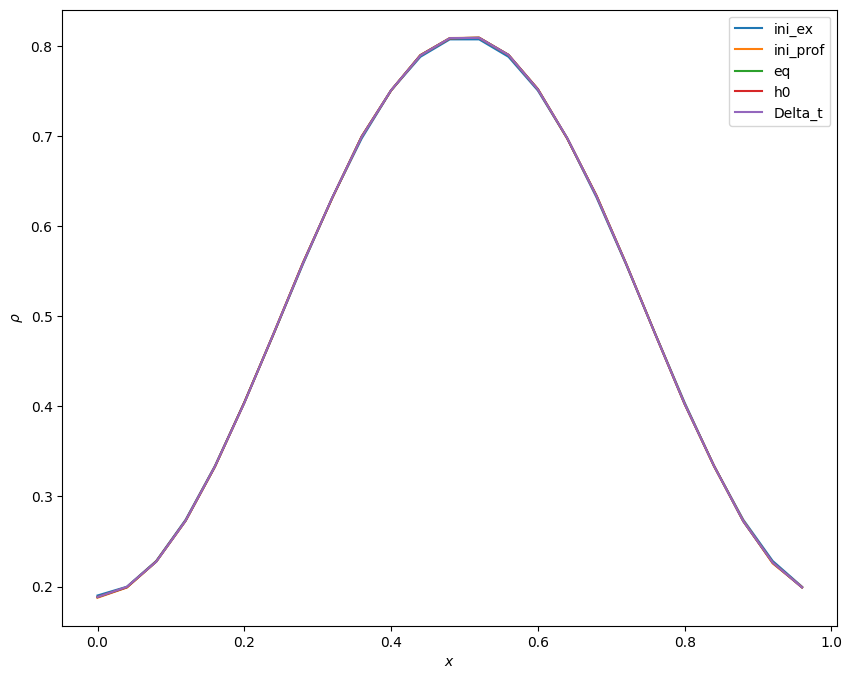

<Figure size 640x480 with 0 Axes>

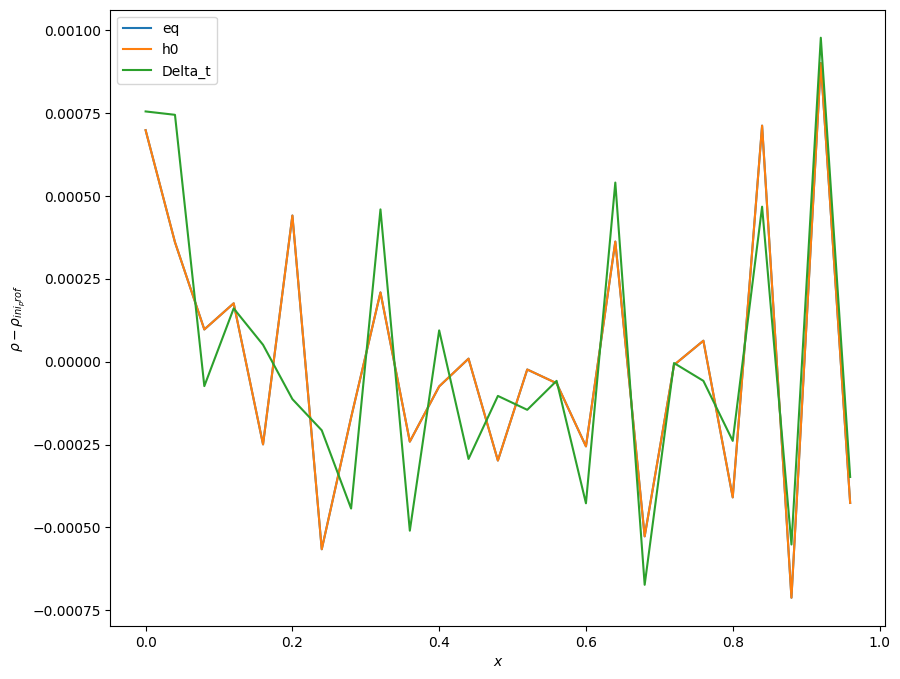

<Figure size 640x480 with 0 Axes>

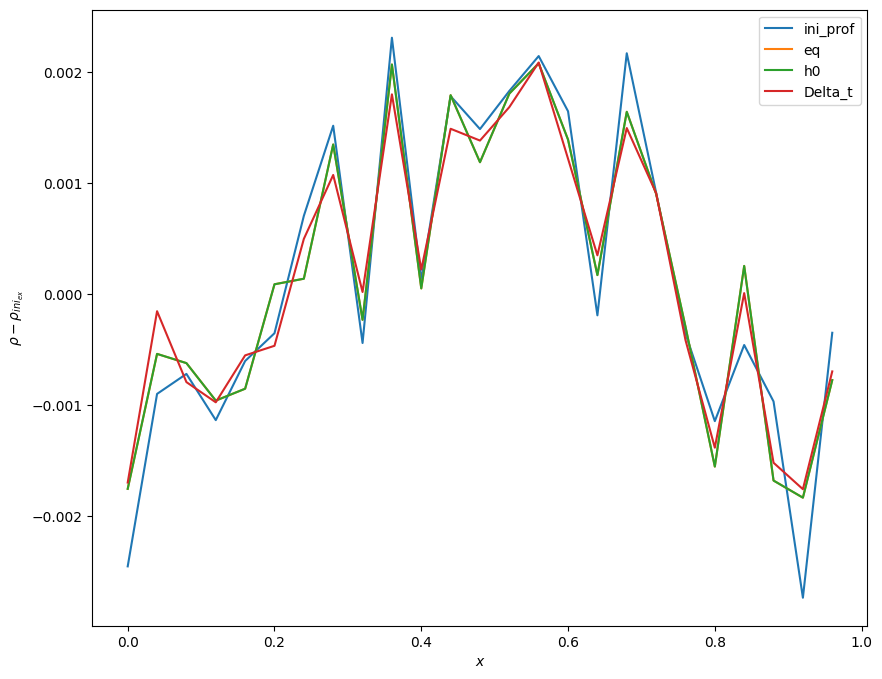

In [ ]:
# testing plots for an random profile (profile No.10 here)

plt.figure()
fig = plt.figure(figsize=(10,8))
plt.plot(x_basis, rho_ini_ex[10,:], label='ini_ex')
plt.plot(x_basis, rho_ini_prof[10,:], label='ini_prof')
plt.plot(x_basis, rho_eq[10,:], label='eq')
plt.plot(x_basis, rho_h0[10,:], label='h0')
plt.plot(x_basis, rho_Delta_t[10,:], label='Delta_t')
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho$')
# plt.title(r'$f$ error = {}'.format(fe_error))
plt.legend()
plt.show()


plt.figure()
fig = plt.figure(figsize=(10,8))
plt.plot(x_basis, rho_eq[10,:] - rho_ini_prof[10,:], label='eq')
plt.plot(x_basis, rho_h0[10,:] - rho_ini_prof[10,:], label='h0')
plt.plot(x_basis, rho_Delta_t[10,:] - rho_ini_prof[10,:], label='Delta_t')
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho - \rho_{ini_prof}$')
# plt.title(r'$f$ error = {}'.format(fe_error))
plt.legend()
plt.show()


plt.figure()
fig = plt.figure(figsize=(10,8))
plt.plot(x_basis, rho_ini_prof[10,:] - rho_ini_ex[10,:], label='ini_prof')
plt.plot(x_basis, rho_eq[10,:] - rho_ini_ex[10,:], label='eq')
plt.plot(x_basis, rho_h0[10,:] - rho_ini_ex[10,:], label='h0')
plt.plot(x_basis, rho_Delta_t[10,:] - rho_ini_ex[10,:], label='Delta_t')
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho - \rho_{ini_{ex}}$')
# plt.title(r'$f$ error = {}'.format(fe_error))
plt.legend()
plt.show()

In [ ]:
if FindOperator == 1:
  # load data for calculating operator


  # K_0 = <K gamma_b, gamma_b> @ rho_left_0 (rho_{b-1}), rho_middle_0 (rho_b), rho_right_0 (rho_{b+1})
  rho_middle_0 = data_rhoK['rho_middle_0'].flatten()
  rho_left_0 = data_rhoK['rho_left_0'].flatten()
  rho_right_0 = data_rhoK['rho_right_0'].flatten()
  rho_ini_ex_middle_0 = data_rhoK['rho_ini_ex_middle_0'].flatten()
  rho_ini_ex_left_0 = data_rhoK['rho_ini_ex_left_0'].flatten()
  rho_ini_ex_right_0 = data_rhoK['rho_ini_ex_right_0'].flatten()
  K_0 = data_rhoK['K_0'].flatten()

  # K_1 = <K gamma_b, gamma_{b+1}> @ rho_left_1 (rho_b), rho_right_1 (rho_{b+1})
  rho_left_1 = data_rhoK['rho_left_1'].flatten()
  rho_right_1 = data_rhoK['rho_right_1'].flatten()
  rho_ini_ex_left_1 = data_rhoK['rho_ini_ex_left_1'].flatten()
  rho_ini_ex_right_1 = data_rhoK['rho_ini_ex_right_1'].flatten()
  K_1 = data_rhoK['K_1'].flatten()


  # define local density and density gradient
  # for K_0
  rho_0 = rho_middle_0
  drho_0 = ( rho_right_0 - rho_left_0 ) / ( 2.0 * dx_basis )
  d2rho_0 = ( rho_right_0 - 2 * rho_middle_0 + rho_left_0 ) / ( dx_basis ** 2 )
  # for K_1
  rho_1 = ( rho_right_1 + rho_left_1 ) / 2.0
  drho_1 = ( rho_right_1 - rho_left_1 ) / dx_basis
  # for K_1 on the left of K_0
  rho_1_left = ( rho_middle_0 + rho_left_0 ) / 2.0
  drho_1_left = ( rho_middle_0 - rho_left_0 ) / dx_basis
  # for K_1 on the right of K_0
  rho_1_right = ( rho_right_0 + rho_middle_0 ) / 2.0
  drho_1_right = ( rho_right_0 - rho_middle_0 ) / dx_basis


  slope_x = data_rhoK['slope_x']

  print('Shape of K_0:', rho_middle_0.shape, rho_left_0.shape, rho_right_0.shape, K_0.shape)
  print('Shape of K_1:', rho_left_1.shape, rho_right_1.shape, K_1.shape)
  print('Shape of slope_x:', slope_x.shape)


Shape of K_0: (700,) (700,) (700,) (700,)
Shape of K_1: (700,) (700,) (700,)
Shape of slope_x: (28, 25)


In [ ]:
if FindOperator == 1:
  if ExpansionType == 'MPK2':

    # K_2 = <K gamma_b, gamma_{b+2}> @ rho_2 (rho_{b+1})
    rho_2 = data_rhoK['rho_2'].flatten()
    K_2 = data_rhoK['K_2'].flatten()

    # variance, skewness and kurtosis of d<rho,gamma>/dh @ rho_b
    var_drhodh_gamma = data_rhoK['var_drhodh_gamma'].flatten()


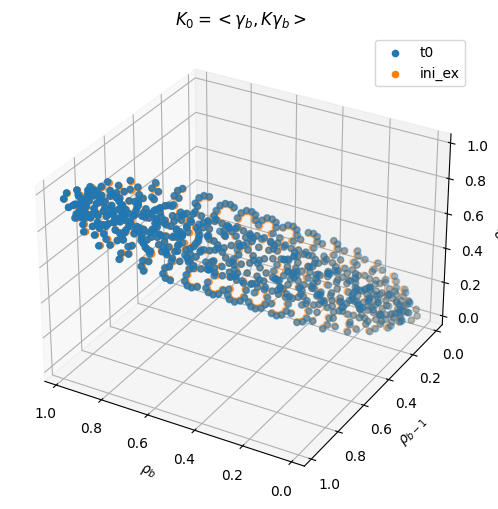

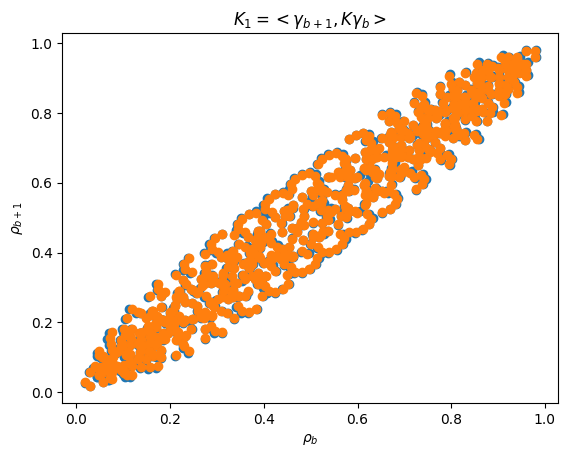

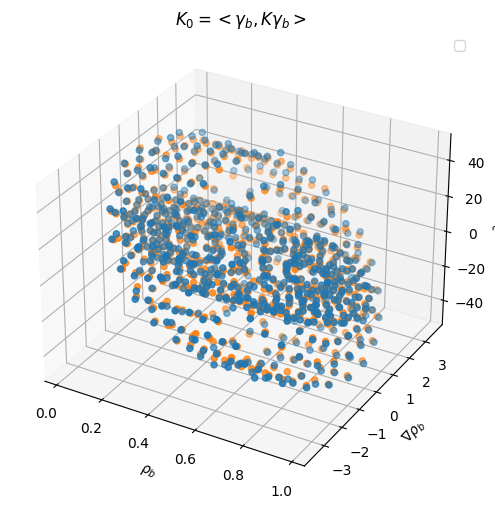

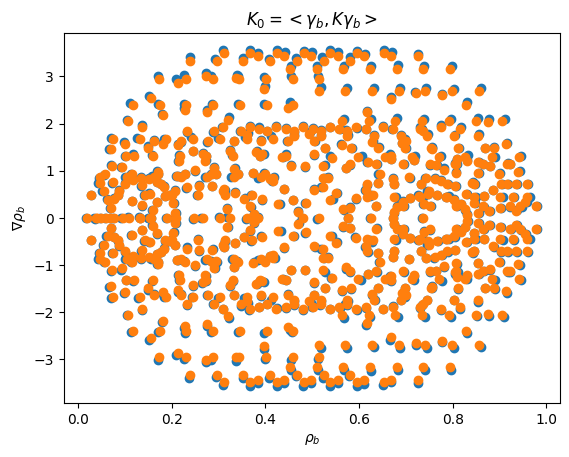

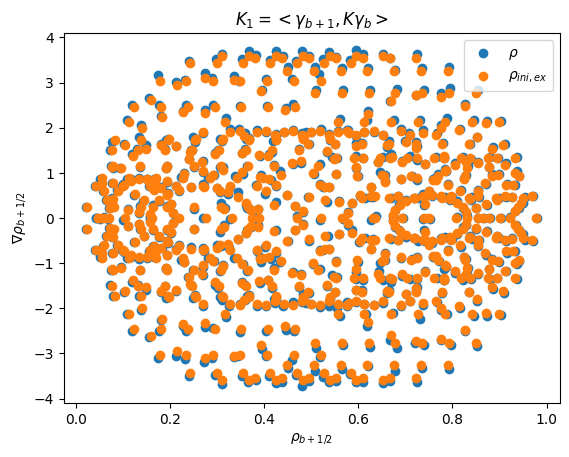

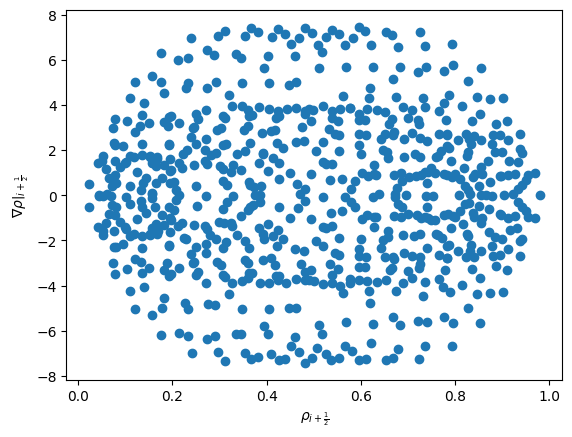

In [ ]:
if FindOperator == 1:
  # data distribution in phase space of rho (& neighbor rho or grad rho)

  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 120)
  ax.scatter(rho_middle_0, rho_left_0, rho_right_0, label='t0')
  ax.scatter(rho_ini_ex_middle_0, rho_ini_ex_left_0, rho_ini_ex_right_0, label='ini_ex')
  # ax1._facecolors2d = ax1._facecolors3d
  # ax1._edgecolors2d = ax1._edgecolors3d
  # ax2 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_train_K, alpha=0.5, color = 'orange', label = 'Exp')
  # ax3 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_pred, alpha=0.5, color = 'green', label = 'Pred')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_b$')
  ax.set_ylabel(r'$\rho_{b-1}}$')
  ax.set_zlabel(r'$\rho_{b+1}}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()

  plt.figure()
  plt.scatter(rho_left_1, rho_right_1)
  plt.scatter(rho_ini_ex_left_1, rho_ini_ex_right_1)
  plt.xlabel(r'$\rho_{b}$')
  plt.ylabel(r'$\rho_{b+1}$')
  plt.title(r'$K_1=<\gamma_{b+1}, K \gamma_{b}>$')
  plt.show()


  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, -60)
  ax.scatter(rho_middle_0, drho_0, d2rho_0)
  ax.scatter(rho_ini_ex_middle_0, (rho_ini_ex_right_0 - rho_ini_ex_left_0) / (2*dx_basis), (rho_ini_ex_right_0 - 2*rho_ini_ex_middle_0 + rho_ini_ex_left_0) / (dx_basis**2))
  # ax1._facecolors2d = ax1._facecolors3d
  # ax1._edgecolors2d = ax1._edgecolors3d
  # ax2 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_train_K, alpha=0.5, color = 'orange', label = 'Exp')
  # ax3 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_pred, alpha=0.5, color = 'green', label = 'Pred')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_b$')
  ax.set_ylabel(r'$\nabla \rho_{b}}$')
  ax.set_zlabel(r'$\nabla^2 \rho_{b}}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()


  plt.figure()
  plt.scatter(rho_middle_0, drho_0)
  plt.scatter(rho_ini_ex_middle_0, (rho_ini_ex_right_0 - rho_ini_ex_left_0) / (2*dx_basis))
  plt.xlabel(r'$\rho_{b}$')
  plt.ylabel(r'$\nabla \rho_{b}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()


  plt.figure()
  plt.scatter(rho_1, drho_1, label=r'$\rho$')
  plt.scatter((rho_ini_ex_left_1+rho_ini_ex_right_1)/2, (rho_ini_ex_right_1-rho_ini_ex_left_1)/dx_basis, label=r'$\rho_{ini,ex}$')
  plt.legend(loc='best')
  plt.xlabel(r'$\rho_{b+1/2}$')
  plt.ylabel(r'$\nabla \rho_{b+1/2}$')
  plt.title(r'$K_1=<\gamma_{b+1}, K \gamma_{b}>$')
  plt.show()


  plt.figure()
  plt.scatter(rho_1, drho_1 * 50.0 / Ngamma, label=r'$\rho$')
  # plt.scatter((rho_ini_ex_left_1+rho_ini_ex_right_1)/2, (rho_ini_ex_right_1-rho_ini_ex_left_1)/dx_basis, label=r'$\rho_{ini,ex}$')
  # plt.legend(loc='best')
  plt.xlabel(r'$\rho_{i+\frac{1}{2}}$')
  plt.ylabel(r'$\left. \nabla \rho \right|_{i+\frac{1}{2}}$')
  # plt.title(r'$K_1=<\gamma_{b+1}, K \gamma_{b}>$')
  plt.show()



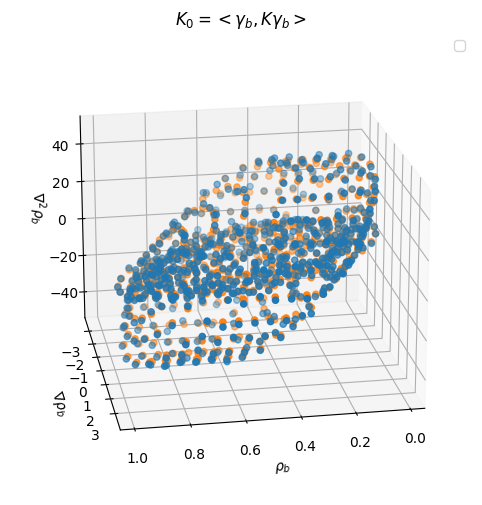

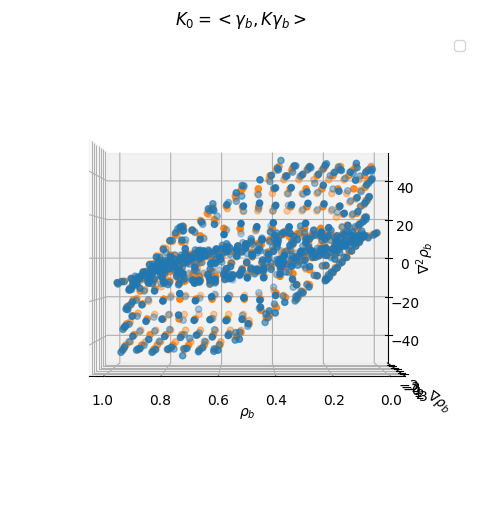

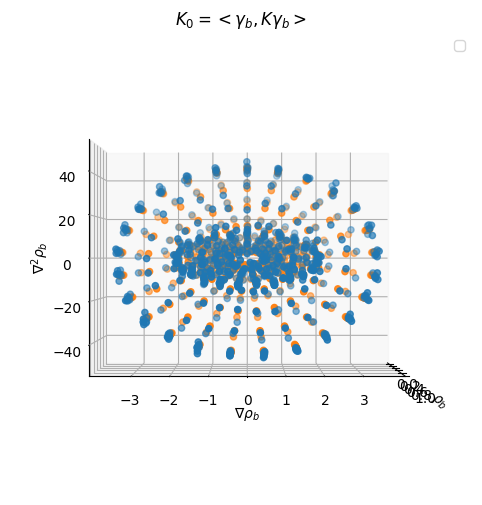

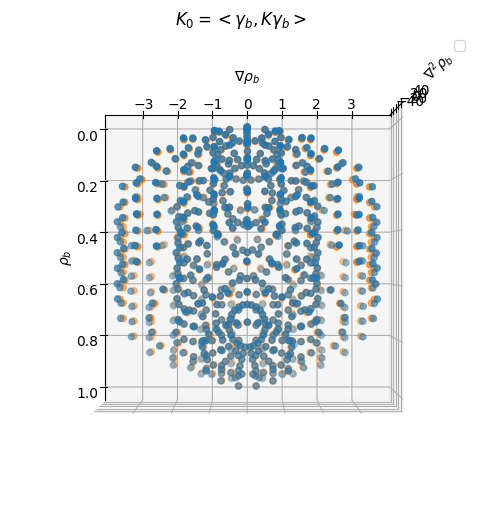

In [ ]:
if FindOperator == 1:
  # data distribution in phase space of rho (& neighbor rho or grad rho)

  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(20, 80)
  ax.scatter(rho_middle_0, drho_0, d2rho_0)
  ax.scatter(rho_ini_ex_middle_0, (rho_ini_ex_right_0 - rho_ini_ex_left_0) / (2*dx_basis), (rho_ini_ex_right_0 - 2*rho_ini_ex_middle_0 + rho_ini_ex_left_0) / (dx_basis**2))
  # ax1._facecolors2d = ax1._facecolors3d
  # ax1._edgecolors2d = ax1._edgecolors3d
  # ax2 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_train_K, alpha=0.5, color = 'orange', label = 'Exp')
  # ax3 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_pred, alpha=0.5, color = 'green', label = 'Pred')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_b$')
  ax.set_ylabel(r'$\nabla \rho_{b}}$')
  ax.set_zlabel(r'$\nabla^2 \rho_{b}}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()


  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax.scatter(rho_middle_0, drho_0, d2rho_0)
  ax.scatter(rho_ini_ex_middle_0, (rho_ini_ex_right_0 - rho_ini_ex_left_0) / (2*dx_basis), (rho_ini_ex_right_0 - 2*rho_ini_ex_middle_0 + rho_ini_ex_left_0) / (dx_basis**2))
  # ax1._facecolors2d = ax1._facecolors3d
  # ax1._edgecolors2d = ax1._edgecolors3d
  # ax2 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_train_K, alpha=0.5, color = 'orange', label = 'Exp')
  # ax3 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_pred, alpha=0.5, color = 'green', label = 'Pred')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_b$')
  ax.set_ylabel(r'$\nabla \rho_{b}}$')
  ax.set_zlabel(r'$\nabla^2 \rho_{b}}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()


  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 00)
  ax.scatter(rho_middle_0, drho_0, d2rho_0)
  ax.scatter(rho_ini_ex_middle_0, (rho_ini_ex_right_0 - rho_ini_ex_left_0) / (2*dx_basis), (rho_ini_ex_right_0 - 2*rho_ini_ex_middle_0 + rho_ini_ex_left_0) / (dx_basis**2))
  # ax1._facecolors2d = ax1._facecolors3d
  # ax1._edgecolors2d = ax1._edgecolors3d
  # ax2 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_train_K, alpha=0.5, color = 'orange', label = 'Exp')
  # ax3 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_pred, alpha=0.5, color = 'green', label = 'Pred')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_b$')
  ax.set_ylabel(r'$\nabla \rho_{b}}$')
  ax.set_zlabel(r'$\nabla^2 \rho_{b}}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()


  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(90, 0)
  ax.scatter(rho_middle_0, drho_0, d2rho_0)
  ax.scatter(rho_ini_ex_middle_0, (rho_ini_ex_right_0 - rho_ini_ex_left_0) / (2*dx_basis), (rho_ini_ex_right_0 - 2*rho_ini_ex_middle_0 + rho_ini_ex_left_0) / (dx_basis**2))
  # ax1._facecolors2d = ax1._facecolors3d
  # ax1._edgecolors2d = ax1._edgecolors3d
  # ax2 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_train_K, alpha=0.5, color = 'orange', label = 'Exp')
  # ax3 = ax.scatter(rho_0_train_K, drho_0_train_K, K0_pred, alpha=0.5, color = 'green', label = 'Pred')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_b$')
  ax.set_ylabel(r'$\nabla \rho_{b}}$')
  ax.set_zlabel(r'$\nabla^2 \rho_{b}}$')
  plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()





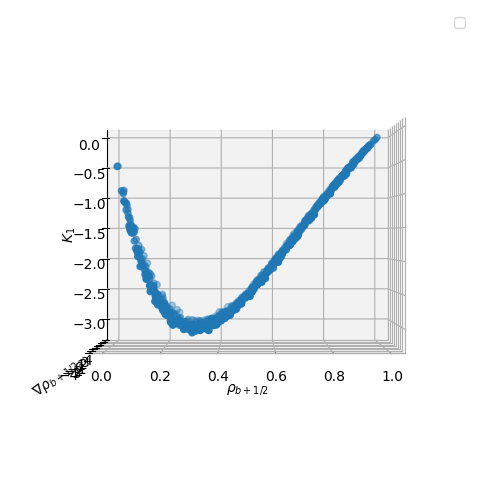

In [ ]:
if FindOperator == 1:
  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, -90)
  ax.scatter((rho_left_1+rho_right_1)/2, (rho_right_1-rho_left_1)/dx_basis, K_1)
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho_{b+1/2}$')
  ax.set_ylabel(r'$\nabla \rho_{b+1/2}}$')
  ax.set_zlabel(r'$K_1$')
  # plt.title(r'$K_0=<\gamma_{b}, K \gamma_{b}>$')
  plt.show()

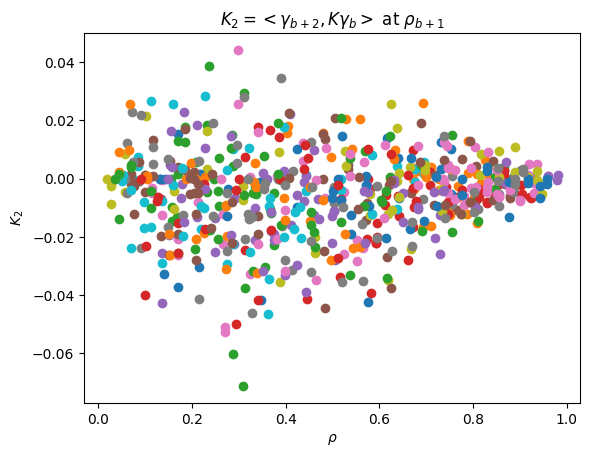

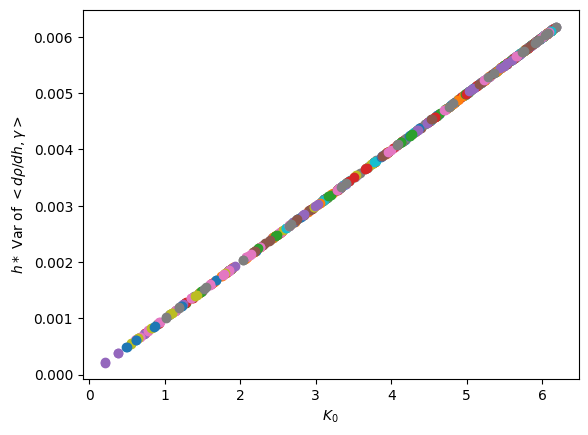

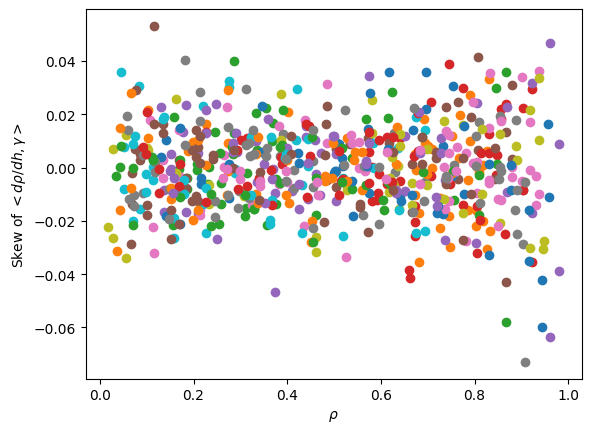

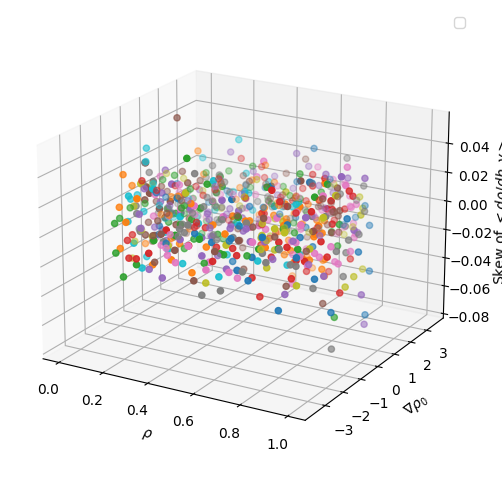

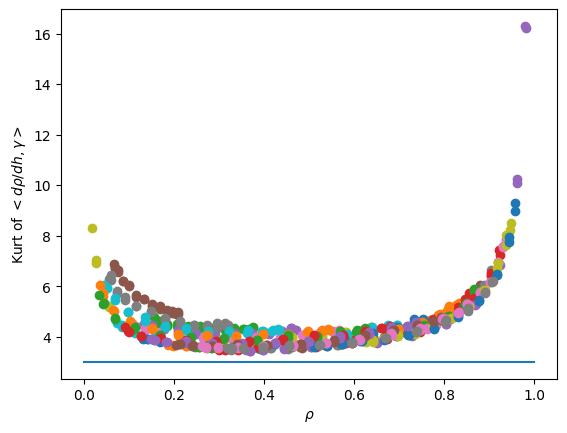

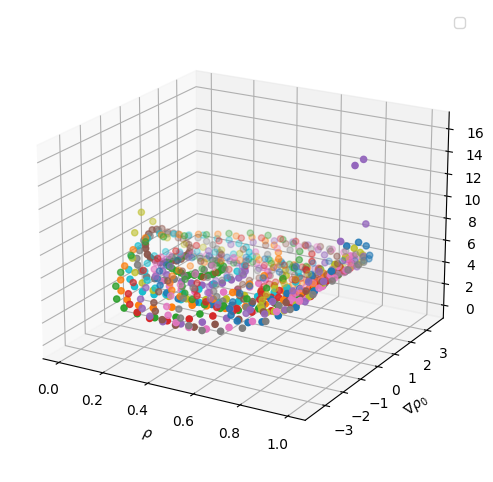

In [ ]:
if FindOperator == 1 and ExpansionType == 'MPK2':

  plt.figure()
  for i in range(Nprof):
    plt.scatter(rho_2[((i-1)*Ngamma):(i*Ngamma)], K_2[((i-1)*Ngamma):(i*Ngamma)])
  # plt.legend(loc='best')
  plt.xlabel(r'$\rho}$')
  plt.ylabel(r'$K_2$')
  plt.title(r'$K_2=<\gamma_{b+2}, K \gamma_{b}>$ at $\rho_{b+1}$')
  plt.show()

  plt.figure()
  for i in range(Nprof):
    plt.scatter(K_0[((i-1)*Ngamma):(i*Ngamma)], var_drhodh_gamma[((i-1)*Ngamma):(i*Ngamma)]*h[i-1])
  # plt.legend(loc='best')
  plt.xlabel(r'$K_0}$')
  plt.ylabel(r'$h*$ Var of $<d\rho/dh, \gamma>$')
  # plt.title(r'$K_2=<\gamma_{b+2}, K \gamma_{b}>$ at $\rho_{b+1}$')
  plt.show()


# K_INN Training and Prediction

## Training data for K_INN

In [ ]:
# Train-test split. Not recommended!!! (May include BUGS if True!!!)
# K_TrainTest = True
K_TrainTest = False

if K_TrainTest == True:
  K_TrainTest_size = 0.2
elif K_TrainTest == False:
  1
else:
  print("Wrong K_TrainTest!")
  exit()


K_INN_type = 'K1_MP_INN'
# K_INN_type = 'K14_MP_INN'

In [ ]:
# K_0 = <gamma_b, K gamma_b>

rho_middle_0_all_K = rho_middle_0
rho_left_0_all_K = rho_left_0
rho_right_0_all_K = rho_right_0

K_0_all_K = K_0


# K_1 = <gamma_{b+1}, K gamma_b>

rho_left_1_all_K = rho_left_1
rho_right_1_all_K = rho_right_1

K_1_all_K = K_1

rho_0_all_K = rho_0
drho_0_all_K = drho_0
rho_1_all_K = rho_1
drho_1_all_K = drho_1
rho_1_left_all_K = rho_1_left
drho_1_left_all_K = drho_1_left
rho_1_right_all_K = rho_1_right
drho_1_right_all_K = drho_1_right


if K_INN_type == 'K14_MP_INN':
  rho_middle_0_ori = rho_middle_0.reshape((Nprof, Ngamma))
  rho_left_1_ori = rho_left_1.reshape((Nprof, Ngamma))

  rho_left2_0_ori = np.roll(rho_middle_0_ori, 2, axis=1)
  rho_right2_0_ori = np.roll(rho_middle_0_ori, -2, axis=1)
  rho_left2_1_ori = np.roll(rho_left_1_ori, 1, axis=1)
  rho_right2_1_ori = np.roll(rho_left_1_ori, -2, axis=1)

  rho_left2_0 = rho_left2_0_ori.flatten()
  rho_right2_0 = rho_right2_0_ori.flatten()
  rho_left2_1 = rho_left2_1_ori.flatten()
  rho_right2_1 = rho_right2_1_ori.flatten()

  rho_left2_0_all_K = rho_left2_0
  rho_right2_0_all_K = rho_right2_0
  rho_left2_1_all_K = rho_left2_1
  rho_right2_1_all_K = rho_right2_1

  d2rho_1_left = (rho_left2_1 - 2*rho_left_1 + rho_right_1) / (dx_basis * dx_basis)
  d2rho_1_right = (rho_left_1 - 2*rho_right_1 + rho_right2_1) / (dx_basis * dx_basis)

  d2rho_1 = (d2rho_1_left + d2rho_1_right) / 2.0
  d3rho_1 = (d2rho_1_right - d2rho_1_left) / dx_basis





if K_TrainTest == False:

  rho_middle_0_train_K, rho_left_0_train_K, rho_right_0_train_K, K_0_train_K, rho_left_1_train_K, rho_right_1_train_K, K_1_train_K, \
          rho_0_train_K, drho_0_train_K, rho_1_train_K, drho_1_train_K, rho_1_left_train_K, drho_1_left_train_K, \
          rho_1_right_train_K, drho_1_right_train_K \
          = rho_middle_0_all_K, rho_left_0_all_K, rho_right_0_all_K, K_0_all_K, rho_left_1_all_K, rho_right_1_all_K, K_1_all_K, \
          rho_0_all_K, drho_0_all_K, rho_1_all_K, drho_1_all_K, rho_1_left_all_K, drho_1_left_all_K, \
          rho_1_right_all_K, drho_1_right_all_K

  if K_INN_type == 'K14_MP_INN':
    rho_left2_0_train_K, rho_right2_0_train_K, rho_left2_1_train_K, rho_right2_1_train_K \
          = rho_left2_0_all_K, rho_right2_0_all_K, rho_left2_1_all_K, rho_right2_1_all_K

  test_data_K = []

elif K_TrainTest == True:

  rho_middle_0_train_K, rho_middle_0_test_K, rho_left_0_train_K, rho_left_0_test_K, rho_right_0_train_K, rho_right_0_test_K, K_0_train_K, K_0_test_K,\
          rho_left_1_train_K, rho_left_1_test_K, rho_right_1_train_K, rho_right_1_test_K, K_1_train_K, K_1_test_K, \
          rho_0_train_K, rho_0_test_K, drho_0_train_K, drho_0_test_K, rho_1_train_K, rho_1_test_K, drho_1_train_K, drho_1_test_K, \
          rho_1_left_train_K, rho_1_left_test_K, drho_1_left_train_K, drho_1_left_test_K, \
          rho_1_right_train_K, rho_1_right_test_K, drho_1_right_train_K, drho_1_right_test_K \
          = train_test_split(rho_middle_0_all_K, rho_left_0_all_K, rho_right_0_all_K, K_0_all_K, rho_left_1_all_K, rho_right_1_all_K, K_1_all_K,\
          rho_0_all_K, drho_0_all_K, rho_1_all_K, drho_1_all_K, rho_1_left_all_K, drho_1_left_all_K, \
          rho_1_right_all_K, drho_1_right_all_K, \
          test_size = K_TrainTest_size)

  test_data_K = rho_middle_0_test_K, rho_left_0_test_K, rho_right_0_test_K, K_0_test_K, rho_left_1_test_K, rho_right_1_test_K, K_1_test_K

# train_data_K = rho_middle_0_train_K, rho_left_0_train_K, rho_right_0_train_K, K_0_train_K, rho_left_1_train_K, rho_right_1_train_K, K_1_train_K

if K_INN_type == 'K1_MP_INN':
  train_data_K = rho_middle_0_train_K, rho_left_0_train_K, rho_right_0_train_K, K_0_train_K, rho_left_1_train_K, rho_right_1_train_K, K_1_train_K,\
              dx_basis
elif K_INN_type == 'K14_MP_INN':
  train_data_K = rho_middle_0_train_K, rho_left_0_train_K, rho_left2_0_train_K, rho_right_0_train_K, rho_right2_0_train_K, K_0_train_K, \
              rho_left_1_train_K, rho_left2_1_train_K, rho_right_1_train_K, rho_right2_1_train_K, K_1_train_K,\
              dx_basis

## Train K_INN

In [ ]:
# Set up layers and learning rate
if K_INN_type == 'K1_MP_INN':
  layers_K = [2, 20, 20, 1]
elif K_INN_type == 'K14_MP_INN':
  layers_K = [4, 40, 40, 1]
else:
  print("Wrong K_INN_type!")
  exit()

learning_rate_K = 1e-2
activation_K = 'softplus'
# activation_K = 'GeLU'

print('ExpansionType =', ExpansionType)
print('layers_K =', layers_K)
print('learning_rate_K =', learning_rate_K)
print('K_TrainTest =', K_TrainTest)
print('activation_function_K =', activation_K)
print(K_INN_type)
print(FolderName2)

if K_INN_type == 'K1_MP_INN':
  model_K = K1_MP_INN(train_data_K, layers_K, lr=learning_rate_K, af=activation_K, test_data=test_data_K, TrainTest=K_TrainTest)
elif K_INN_type == 'K14_MP_INN':
  model_K = K14_MP_INN(train_data_K, layers_K, lr=learning_rate_K, af=activation_K, test_data=test_data_K, TrainTest=K_TrainTest)


ExpansionType = MPK2
layers_K = [2, 20, 20, 1]
learning_rate_K = 0.01
K_TrainTest = False
activation_function_K = softplus
K1_MP_INN
Modified_Arr230608_Nb2e3_G25_28c_JL0.9_L40_500R20_1_10h001_1dt20_Eq50_E2JLrm/
Number of K_0 data: (700,)
Number of K_1 data: (700,)
layers = [2, 20, 20, 1]
K_0 scale =  4.007745698571428
K_1 scale =  -1.99785542
K_0 loss weight = 1.2506455
K_1 loss weight = 4.9896975


In [ ]:
# Start training
model_K.train(num_epochs = 6000)

  0%|          | 3/6000 [00:03<1:35:01,  1.05it/s]


Total loss = 13.060209274291992

loss K_0 = 6.514669418334961; loss K_1 = 6.545539379119873

Total loss = 6.899173259735107

loss K_0 = 3.3955459594726562; loss K_1 = 3.503627300262451


  0%|          | 5/6000 [00:04<47:18,  2.11it/s]  


Total loss = 17.73636245727539

loss K_0 = 8.80285358428955; loss K_1 = 8.933509826660156

Total loss = 14.85368537902832

loss K_0 = 7.361132621765137; loss K_1 = 7.492552757263184


  0%|          | 7/6000 [00:04<31:35,  3.16it/s]


Total loss = 6.475857257843018

loss K_0 = 3.1791625022888184; loss K_1 = 3.296694755554199

Total loss = 4.977321624755859

loss K_0 = 2.4448344707489014; loss K_1 = 2.532486915588379


  0%|          | 9/6000 [00:05<24:01,  4.16it/s]


Total loss = 9.16019058227539

loss K_0 = 4.551457405090332; loss K_1 = 4.608733654022217

Total loss = 10.996339797973633

loss K_0 = 5.4749884605407715; loss K_1 = 5.521351337432861


  0%|          | 11/6000 [00:05<20:43,  4.82it/s]


Total loss = 8.235828399658203

loss K_0 = 4.0890212059021; loss K_1 = 4.1468071937561035

Total loss = 4.727269172668457

loss K_0 = 2.323422431945801; loss K_1 = 2.403846502304077


  0%|          | 13/6000 [00:05<19:26,  5.13it/s]


Total loss = 4.027678489685059

loss K_0 = 1.9630208015441895; loss K_1 = 2.06465744972229

Total loss = 5.828668594360352

loss K_0 = 2.857085704803467; loss K_1 = 2.9715828895568848


  0%|          | 15/6000 [00:06<18:25,  5.41it/s]


Total loss = 7.208929061889648

loss K_0 = 3.5454227924346924; loss K_1 = 3.663506269454956

Total loss = 6.450882911682129

loss K_0 = 3.168501615524292; loss K_1 = 3.282381534576416


  0%|          | 17/6000 [00:06<18:17,  5.45it/s]


Total loss = 4.561946868896484

loss K_0 = 2.2293860912323; loss K_1 = 2.3325605392456055

Total loss = 3.4647376537323

loss K_0 = 1.6884859800338745; loss K_1 = 1.7762516736984253


  0%|          | 19/6000 [00:06<18:18,  5.44it/s]


Total loss = 3.8632285594940186

loss K_0 = 1.8958908319473267; loss K_1 = 1.967337727546692

Total loss = 4.858208656311035

loss K_0 = 2.3994123935699463; loss K_1 = 2.458796501159668


  0%|          | 21/6000 [00:07<18:14,  5.46it/s]


Total loss = 5.187135696411133

loss K_0 = 2.565871000289917; loss K_1 = 2.621264934539795

Total loss = 4.528103828430176

loss K_0 = 2.234194278717041; loss K_1 = 2.293909788131714


  0%|          | 23/6000 [00:07<18:19,  5.44it/s]


Total loss = 3.5898325443267822

loss K_0 = 1.7602657079696655; loss K_1 = 1.8295668363571167

Total loss = 3.2208023071289062

loss K_0 = 1.5704472064971924; loss K_1 = 1.6503552198410034


  0%|          | 25/6000 [00:07<18:21,  5.43it/s]


Total loss = 3.5788536071777344

loss K_0 = 1.745359182357788; loss K_1 = 1.8334943056106567

Total loss = 4.092409133911133

loss K_0 = 2.0000667572021484; loss K_1 = 2.0923423767089844


  0%|          | 26/6000 [00:08<18:00,  5.53it/s]


Total loss = 4.142025470733643

loss K_0 = 2.0250275135040283; loss K_1 = 2.1169979572296143

Total loss = 3.6867973804473877


  0%|          | 28/6000 [00:08<18:13,  5.46it/s]


loss K_0 = 1.7996230125427246; loss K_1 = 1.887174367904663

Total loss = 3.1973204612731934

loss K_0 = 1.558708667755127; loss K_1 = 1.6386117935180664


  0%|          | 30/6000 [00:08<18:18,  5.43it/s]


Total loss = 3.093234062194824

loss K_0 = 1.5112520456314087; loss K_1 = 1.581982135772705

Total loss = 3.3401498794555664

loss K_0 = 1.638838291168213; loss K_1 = 1.7013115882873535


  1%|          | 32/6000 [00:09<17:39,  5.63it/s]


Total loss = 3.565579891204834

loss K_0 = 1.754052996635437; loss K_1 = 1.8115267753601074

Total loss = 3.487201690673828

loss K_0 = 1.7151645421981812; loss K_1 = 1.7720370292663574


  1%|          | 34/6000 [00:09<17:59,  5.53it/s]


Total loss = 3.1776394844055176

loss K_0 = 1.5587732791900635; loss K_1 = 1.6188663244247437

Total loss = 2.931917905807495

loss K_0 = 1.433323860168457; loss K_1 = 1.498594045639038


  1%|          | 36/6000 [00:09<18:30,  5.37it/s]


Total loss = 2.933875322341919

loss K_0 = 1.431830883026123; loss K_1 = 1.502044439315796

Total loss = 3.0836732387542725

loss K_0 = 1.50521719455719; loss K_1 = 1.5784560441970825


  1%|          | 38/6000 [00:10<18:28,  5.38it/s]


Total loss = 3.1434905529022217

loss K_0 = 1.5349942445755005; loss K_1 = 1.6084963083267212

Total loss = 3.0111231803894043

loss K_0 = 1.4700878858566284; loss K_1 = 1.5410351753234863


  1%|          | 39/6000 [00:10<18:21,  5.41it/s]


Total loss = 2.8084614276885986

loss K_0 = 1.371142864227295; loss K_1 = 1.4373185634613037

Total loss = 2.713496208190918

loss K_0 = 1.3265644311904907; loss K_1 = 1.3869318962097168


  1%|          | 42/6000 [00:11<18:44,  5.30it/s]


Total loss = 2.758268356323242

loss K_0 = 1.3515989780426025; loss K_1 = 1.40666925907135

Total loss = 2.8176331520080566

loss K_0 = 1.382961630821228; loss K_1 = 1.4346716403961182


  1%|          | 44/6000 [00:11<18:31,  5.36it/s]


Total loss = 2.771584987640381

loss K_0 = 1.360292911529541; loss K_1 = 1.4112920761108398

Total loss = 2.637019634246826

loss K_0 = 1.292189121246338; loss K_1 = 1.3448303937911987


  1%|          | 46/6000 [00:11<18:19,  5.42it/s]


Total loss = 2.5277812480926514

loss K_0 = 1.236124038696289; loss K_1 = 1.2916572093963623

Total loss = 2.5116984844207764

loss K_0 = 1.226698875427246; loss K_1 = 1.2849996089935303


  1%|          | 47/6000 [00:12<18:02,  5.50it/s]


Total loss = 2.5397090911865234

loss K_0 = 1.2399460077285767; loss K_1 = 1.2997632026672363


  1%|          | 48/6000 [00:12<22:17,  4.45it/s]


Total loss = 2.5199713706970215

loss K_0 = 1.230241060256958; loss K_1 = 1.2897303104400635


  1%|          | 49/6000 [00:12<25:34,  3.88it/s]


Total loss = 2.4325146675109863

loss K_0 = 1.1875935792922974; loss K_1 = 1.2449209690093994


  1%|          | 50/6000 [00:13<27:44,  3.57it/s]


Total loss = 2.3422951698303223

loss K_0 = 1.1441956758499146; loss K_1 = 1.1980996131896973


  1%|          | 51/6000 [00:13<29:23,  3.37it/s]


Total loss = 2.3082518577575684

loss K_0 = 1.1290196180343628; loss K_1 = 1.1792323589324951


  1%|          | 52/6000 [00:13<30:21,  3.26it/s]


Total loss = 2.312821388244629

loss K_0 = 1.1327301263809204; loss K_1 = 1.180091381072998


  1%|          | 53/6000 [00:14<31:31,  3.14it/s]


Total loss = 2.2948708534240723

loss K_0 = 1.1243650913238525; loss K_1 = 1.1705057621002197


  1%|          | 54/6000 [00:14<29:15,  3.39it/s]


Total loss = 2.231497287750244

loss K_0 = 1.0924043655395508; loss K_1 = 1.1390929222106934


  1%|          | 55/6000 [00:14<30:49,  3.22it/s]


Total loss = 2.1607894897460938

loss K_0 = 1.0561665296554565; loss K_1 = 1.1046228408813477


  1%|          | 56/6000 [00:14<30:58,  3.20it/s]


Total loss = 2.124678611755371

loss K_0 = 1.0370900630950928; loss K_1 = 1.0875885486602783


  1%|          | 57/6000 [00:15<32:36,  3.04it/s]


Total loss = 2.114602565765381

loss K_0 = 1.0313564538955688; loss K_1 = 1.0832459926605225


  1%|          | 58/6000 [00:15<32:45,  3.02it/s]


Total loss = 2.09002685546875

loss K_0 = 1.0189818143844604; loss K_1 = 1.0710450410842896


  1%|          | 59/6000 [00:15<32:39,  3.03it/s]


Total loss = 2.0368642807006836

loss K_0 = 0.9929476976394653; loss K_1 = 1.0439164638519287


  1%|          | 61/6000 [00:16<27:33,  3.59it/s]


Total loss = 1.982733964920044

loss K_0 = 0.9668430685997009; loss K_1 = 1.0158908367156982

Total loss = 1.9534825086593628

loss K_0 = 0.9532142877578735; loss K_1 = 1.0002682209014893


  1%|          | 63/6000 [00:16<22:28,  4.40it/s]


Total loss = 1.937805414199829

loss K_0 = 0.9460272789001465; loss K_1 = 0.9917781949043274

Total loss = 1.9080846309661865

loss K_0 = 0.9312489628791809; loss K_1 = 0.9768357276916504


  1%|          | 65/6000 [00:17<20:06,  4.92it/s]


Total loss = 1.861457347869873

loss K_0 = 0.9074742197990417; loss K_1 = 0.9539831280708313

Total loss = 1.8203790187835693

loss K_0 = 0.8861814141273499; loss K_1 = 0.9341975450515747


  1%|          | 67/6000 [00:17<19:30,  5.07it/s]


Total loss = 1.796708106994629

loss K_0 = 0.8736481070518494; loss K_1 = 0.9230600595474243

Total loss = 1.7760039567947388

loss K_0 = 0.8629454374313354; loss K_1 = 0.9130585193634033


  1%|          | 69/6000 [00:17<19:29,  5.07it/s]


Total loss = 1.742846965789795

loss K_0 = 0.8464820384979248; loss K_1 = 0.8963649272918701

Total loss = 1.7042529582977295

loss K_0 = 0.8276716470718384; loss K_1 = 0.8765813112258911


  1%|          | 71/6000 [00:18<16:20,  6.04it/s]


Total loss = 1.6756319999694824

loss K_0 = 0.8139827847480774; loss K_1 = 0.861649215221405

Total loss = 1.6558430194854736

loss K_0 = 0.8045622706413269; loss K_1 = 0.8512807488441467


  1%|          | 73/6000 [00:18<14:35,  6.77it/s]


Total loss = 1.6318557262420654

loss K_0 = 0.7926286458969116; loss K_1 = 0.8392270803451538

Total loss = 1.6001839637756348

loss K_0 = 0.7764352560043335; loss K_1 = 0.8237487077713013


  1%|▏         | 75/6000 [00:18<13:26,  7.35it/s]


Total loss = 1.5712358951568604

loss K_0 = 0.7613682746887207; loss K_1 = 0.8098676800727844

Total loss = 1.5506213903427124

loss K_0 = 0.7505089640617371; loss K_1 = 0.8001124262809753


  1%|▏         | 77/6000 [00:18<13:11,  7.49it/s]


Total loss = 1.530796766281128

loss K_0 = 0.7403208613395691; loss K_1 = 0.7904758453369141

Total loss = 1.505406379699707

loss K_0 = 0.7276989221572876; loss K_1 = 0.7777073979377747


  1%|▏         | 79/6000 [00:19<12:50,  7.68it/s]


Total loss = 1.4793744087219238

loss K_0 = 0.7150123715400696; loss K_1 = 0.7643619775772095

Total loss = 1.458863615989685

loss K_0 = 0.7051350474357605; loss K_1 = 0.7537285685539246


  1%|▏         | 81/6000 [00:19<13:04,  7.55it/s]


Total loss = 1.441105604171753

loss K_0 = 0.6964477300643921; loss K_1 = 0.7446578145027161

Total loss = 1.420137882232666

loss K_0 = 0.6858708262443542; loss K_1 = 0.7342671155929565


  1%|▏         | 83/6000 [00:19<12:32,  7.86it/s]


Total loss = 1.3973565101623535

loss K_0 = 0.6741337776184082; loss K_1 = 0.7232227921485901

Total loss = 1.3778784275054932

loss K_0 = 0.6639782190322876; loss K_1 = 0.7139002680778503


  1%|▏         | 85/6000 [00:20<12:43,  7.75it/s]


Total loss = 1.3612717390060425

loss K_0 = 0.6553974151611328; loss K_1 = 0.7058743238449097

Total loss = 1.3431285619735718

loss K_0 = 0.646311342716217; loss K_1 = 0.6968172192573547


  1%|▏         | 87/6000 [00:20<12:28,  7.90it/s]


Total loss = 1.3232433795928955

loss K_0 = 0.6366079449653625; loss K_1 = 0.6866353750228882

Total loss = 1.3049640655517578

loss K_0 = 0.6278393268585205; loss K_1 = 0.6771247386932373


  1%|▏         | 89/6000 [00:20<12:34,  7.83it/s]


Total loss = 1.289106845855713

loss K_0 = 0.6202254891395569; loss K_1 = 0.668881356716156

Total loss = 1.2728922367095947

loss K_0 = 0.6122267842292786; loss K_1 = 0.6606654524803162


  2%|▏         | 91/6000 [00:20<12:32,  7.85it/s]


Total loss = 1.2551295757293701

loss K_0 = 0.6032447814941406; loss K_1 = 0.6518847942352295

Total loss = 1.238344669342041

loss K_0 = 0.5946505665779114; loss K_1 = 0.6436940431594849


  2%|▏         | 93/6000 [00:21<12:28,  7.89it/s]


Total loss = 1.2235277891159058

loss K_0 = 0.5870988368988037; loss K_1 = 0.636428952217102

Total loss = 1.208526372909546

loss K_0 = 0.5796335339546204; loss K_1 = 0.6288927793502808


  2%|▏         | 95/6000 [00:21<12:25,  7.92it/s]


Total loss = 1.1925396919250488

loss K_0 = 0.5718622803688049; loss K_1 = 0.6206774711608887

Total loss = 1.1771461963653564

loss K_0 = 0.5644912123680115; loss K_1 = 0.612654983997345


  2%|▏         | 97/6000 [00:21<12:25,  7.92it/s]


Total loss = 1.1631343364715576

loss K_0 = 0.5577854514122009; loss K_1 = 0.6053488254547119

Total loss = 1.1491272449493408

loss K_0 = 0.5509490966796875; loss K_1 = 0.5981782078742981


  2%|▏         | 99/6000 [00:21<12:14,  8.03it/s]


Total loss = 1.134411096572876

loss K_0 = 0.5436177253723145; loss K_1 = 0.5907933115959167

Total loss = 1.1202764511108398

loss K_0 = 0.5365129113197327; loss K_1 = 0.5837635397911072


  2%|▏         | 101/6000 [00:22<12:31,  7.85it/s]


Total loss = 1.1071817874908447

loss K_0 = 0.529976487159729; loss K_1 = 0.577205240726471

Total loss = 1.0939881801605225

loss K_0 = 0.5235195755958557; loss K_1 = 0.5704686641693115


  2%|▏         | 103/6000 [00:22<12:34,  7.81it/s]


Total loss = 1.0804531574249268

loss K_0 = 0.5170189142227173; loss K_1 = 0.5634342432022095

Total loss = 1.0675530433654785

loss K_0 = 0.5108858942985535; loss K_1 = 0.5566670894622803


  2%|▏         | 105/6000 [00:22<12:35,  7.81it/s]


Total loss = 1.0553008317947388

loss K_0 = 0.5050348043441772; loss K_1 = 0.5502660274505615

Total loss = 1.0428932905197144

loss K_0 = 0.4990187883377075; loss K_1 = 0.5438745021820068


  2%|▏         | 107/6000 [00:22<12:45,  7.70it/s]


Total loss = 1.0304584503173828

loss K_0 = 0.4929134249687195; loss K_1 = 0.5375449657440186

Total loss = 1.0184965133666992

loss K_0 = 0.4870237708091736; loss K_1 = 0.5314728021621704


  2%|▏         | 109/6000 [00:23<12:35,  7.80it/s]


Total loss = 1.006867527961731

loss K_0 = 0.48134878277778625; loss K_1 = 0.5255187749862671

Total loss = 0.9952143430709839

loss K_0 = 0.47573617100715637; loss K_1 = 0.5194782018661499


  2%|▏         | 111/6000 [00:23<12:32,  7.83it/s]


Total loss = 0.9837751984596252

loss K_0 = 0.4702770709991455; loss K_1 = 0.5134981274604797

Total loss = 0.9727180004119873

loss K_0 = 0.46500542759895325; loss K_1 = 0.5077125430107117


  2%|▏         | 113/6000 [00:23<12:03,  8.13it/s]


Total loss = 0.9619012475013733

loss K_0 = 0.4598039388656616; loss K_1 = 0.5020973086357117

Total loss = 0.9511339068412781

loss K_0 = 0.4545679986476898; loss K_1 = 0.49656590819358826


  2%|▏         | 115/6000 [00:23<12:03,  8.13it/s]


Total loss = 0.9406187534332275

loss K_0 = 0.44943422079086304; loss K_1 = 0.4911845624446869

Total loss = 0.9303908348083496

loss K_0 = 0.44446060061454773; loss K_1 = 0.48593026399612427


  2%|▏         | 117/6000 [00:24<12:05,  8.10it/s]


Total loss = 0.9202588796615601

loss K_0 = 0.43958449363708496; loss K_1 = 0.4806744158267975

Total loss = 0.9103047847747803

loss K_0 = 0.4348330795764923; loss K_1 = 0.4754716753959656


  2%|▏         | 119/6000 [00:24<12:55,  7.58it/s]


Total loss = 0.9006629586219788

loss K_0 = 0.430235356092453; loss K_1 = 0.47042760252952576

Total loss = 0.8912296295166016

loss K_0 = 0.4257054030895233; loss K_1 = 0.46552425622940063


  2%|▏         | 121/6000 [00:24<12:39,  7.74it/s]


Total loss = 0.8819170594215393

loss K_0 = 0.4211917221546173; loss K_1 = 0.460725337266922

Total loss = 0.8728309869766235

loss K_0 = 0.4167681634426117; loss K_1 = 0.45606285333633423


  2%|▏         | 123/6000 [00:24<12:31,  7.82it/s]


Total loss = 0.8640013933181763

loss K_0 = 0.4124830365180969; loss K_1 = 0.45151838660240173

Total loss = 0.8553233742713928

loss K_0 = 0.4083051085472107; loss K_1 = 0.44701826572418213


  2%|▏         | 125/6000 [00:25<12:42,  7.70it/s]


Total loss = 0.8467668890953064

loss K_0 = 0.4042148292064667; loss K_1 = 0.4425520598888397

Total loss = 0.8383550643920898

loss K_0 = 0.40021130442619324; loss K_1 = 0.438143789768219


  2%|▏         | 127/6000 [00:25<12:39,  7.73it/s]


Total loss = 0.8301804065704346

loss K_0 = 0.3963080942630768; loss K_1 = 0.4338723421096802

Total loss = 0.8221134543418884

loss K_0 = 0.39241552352905273; loss K_1 = 0.4296979308128357


  2%|▏         | 129/6000 [00:25<12:38,  7.74it/s]


Total loss = 0.8141684532165527

loss K_0 = 0.388550341129303; loss K_1 = 0.42561808228492737

Total loss = 0.8064180016517639

loss K_0 = 0.38476815819740295; loss K_1 = 0.42164984345436096


  2%|▏         | 131/6000 [00:25<12:12,  8.01it/s]


Total loss = 0.7988501787185669

loss K_0 = 0.38108909130096436; loss K_1 = 0.41776105761528015

Total loss = 0.7913570404052734

loss K_0 = 0.37748557329177856; loss K_1 = 0.41387149691581726


  2%|▏         | 133/6000 [00:26<12:17,  7.96it/s]


Total loss = 0.7840295433998108

loss K_0 = 0.37398478388786316; loss K_1 = 0.41004475951194763

Total loss = 0.7768463492393494

loss K_0 = 0.3705501854419708; loss K_1 = 0.40629616379737854


  2%|▏         | 135/6000 [00:26<14:41,  6.65it/s]


Total loss = 0.7696950435638428

loss K_0 = 0.36713236570358276; loss K_1 = 0.40256267786026

Total loss = 0.7626798748970032

loss K_0 = 0.36377114057540894; loss K_1 = 0.39890873432159424


  2%|▏         | 137/6000 [00:26<15:35,  6.27it/s]


Total loss = 0.75578773021698

loss K_0 = 0.3604498505592346; loss K_1 = 0.395337849855423

Total loss = 0.7490179538726807

loss K_0 = 0.3571733236312866; loss K_1 = 0.39184466004371643


  2%|▏         | 139/6000 [00:27<15:59,  6.11it/s]


Total loss = 0.7423824071884155

loss K_0 = 0.35396289825439453; loss K_1 = 0.3884194791316986

Total loss = 0.7358601093292236

loss K_0 = 0.3508226275444031; loss K_1 = 0.38503751158714294


  2%|▏         | 141/6000 [00:27<16:01,  6.09it/s]


Total loss = 0.7293955087661743

loss K_0 = 0.3477404713630676; loss K_1 = 0.3816550374031067

Total loss = 0.7230057716369629

loss K_0 = 0.34471654891967773; loss K_1 = 0.37828925251960754


  2%|▏         | 143/6000 [00:27<16:04,  6.07it/s]


Total loss = 0.7167693376541138

loss K_0 = 0.34175264835357666; loss K_1 = 0.3750167191028595

Total loss = 0.7106072902679443

loss K_0 = 0.3387890160083771; loss K_1 = 0.3718182444572449


  2%|▏         | 145/6000 [00:28<15:52,  6.15it/s]


Total loss = 0.7045385837554932

loss K_0 = 0.33584514260292053; loss K_1 = 0.36869344115257263

Total loss = 0.6986096501350403

loss K_0 = 0.33297500014305115; loss K_1 = 0.36563464999198914


  2%|▏         | 147/6000 [00:28<15:37,  6.24it/s]


Total loss = 0.6927666068077087

loss K_0 = 0.3301786184310913; loss K_1 = 0.36258798837661743

Total loss = 0.6869833469390869

loss K_0 = 0.3274456858634949; loss K_1 = 0.35953766107559204


  2%|▏         | 149/6000 [00:28<16:05,  6.06it/s]


Total loss = 0.6813039779663086

loss K_0 = 0.3247770369052887; loss K_1 = 0.3565269410610199

Total loss = 0.6757123470306396

loss K_0 = 0.3221380114555359; loss K_1 = 0.35357436537742615


  3%|▎         | 151/6000 [00:29<16:04,  6.07it/s]


Total loss = 0.6701678037643433

loss K_0 = 0.3194975256919861; loss K_1 = 0.35067030787467957

Total loss = 0.6646909713745117

loss K_0 = 0.3168773949146271; loss K_1 = 0.34781360626220703


  3%|▎         | 153/6000 [00:29<16:23,  5.94it/s]


Total loss = 0.6592897176742554

loss K_0 = 0.3143039643764496; loss K_1 = 0.3449857234954834

Total loss = 0.6539310216903687

loss K_0 = 0.3117750883102417; loss K_1 = 0.34215593338012695


  3%|▎         | 155/6000 [00:29<16:03,  6.07it/s]


Total loss = 0.6486206650733948

loss K_0 = 0.3092884123325348; loss K_1 = 0.33933225274086

Total loss = 0.6433748006820679

loss K_0 = 0.3068333864212036; loss K_1 = 0.33654141426086426


  3%|▎         | 157/6000 [00:30<15:54,  6.12it/s]


Total loss = 0.6381722688674927

loss K_0 = 0.304383784532547; loss K_1 = 0.3337884545326233

Total loss = 0.6330074071884155

loss K_0 = 0.3019369840621948; loss K_1 = 0.3310704529285431


  3%|▎         | 159/6000 [00:30<14:53,  6.54it/s]


Total loss = 0.6278973817825317

loss K_0 = 0.2995160222053528; loss K_1 = 0.32838132977485657

Total loss = 0.6228327751159668

loss K_0 = 0.2971322238445282; loss K_1 = 0.3257005512714386


  3%|▎         | 161/6000 [00:30<13:31,  7.20it/s]


Total loss = 0.6178028583526611

loss K_0 = 0.2947840392589569; loss K_1 = 0.32301878929138184

Total loss = 0.6128200888633728

loss K_0 = 0.29246675968170166; loss K_1 = 0.32035332918167114


  3%|▎         | 163/6000 [00:30<12:57,  7.51it/s]


Total loss = 0.6078834533691406

loss K_0 = 0.2901638448238373; loss K_1 = 0.31771963834762573

Total loss = 0.6029818058013916

loss K_0 = 0.28786176443099976; loss K_1 = 0.31512001156806946


  3%|▎         | 165/6000 [00:31<12:32,  7.76it/s]


Total loss = 0.5981210470199585

loss K_0 = 0.28556907176971436; loss K_1 = 0.31255194544792175

Total loss = 0.5933036804199219

loss K_0 = 0.28329965472221375; loss K_1 = 0.31000402569770813


  3%|▎         | 167/6000 [00:31<12:56,  7.52it/s]


Total loss = 0.5885212421417236

loss K_0 = 0.2810574769973755; loss K_1 = 0.30746379494667053

Total loss = 0.5837751626968384

loss K_0 = 0.27884000539779663; loss K_1 = 0.30493512749671936


  3%|▎         | 169/6000 [00:31<12:32,  7.75it/s]


Total loss = 0.5790683031082153

loss K_0 = 0.2766379714012146; loss K_1 = 0.3024303615093231

Total loss = 0.5743924379348755

loss K_0 = 0.2744388282299042; loss K_1 = 0.2999536097049713


  3%|▎         | 171/6000 [00:31<12:05,  8.04it/s]


Total loss = 0.5697453618049622

loss K_0 = 0.27224284410476685; loss K_1 = 0.2975025177001953

Total loss = 0.5651291608810425

loss K_0 = 0.27006033062934875; loss K_1 = 0.2950688302516937


  3%|▎         | 173/6000 [00:32<12:01,  8.08it/s]


Total loss = 0.5605382919311523

loss K_0 = 0.2678970992565155; loss K_1 = 0.29264116287231445

Total loss = 0.5559682250022888

loss K_0 = 0.2657514810562134; loss K_1 = 0.29021674394607544


  3%|▎         | 175/6000 [00:32<12:42,  7.64it/s]


Total loss = 0.5514208078384399

loss K_0 = 0.2636169493198395; loss K_1 = 0.28780385851860046

Total loss = 0.5468915700912476

loss K_0 = 0.2614831328392029; loss K_1 = 0.2854084372520447


  3%|▎         | 177/6000 [00:32<12:11,  7.96it/s]


Total loss = 0.5423773527145386

loss K_0 = 0.25934672355651855; loss K_1 = 0.2830306589603424

Total loss = 0.5378791093826294

loss K_0 = 0.2572140097618103; loss K_1 = 0.2806650996208191


  3%|▎         | 179/6000 [00:32<12:16,  7.90it/s]


Total loss = 0.5333953499794006

loss K_0 = 0.2550918459892273; loss K_1 = 0.27830350399017334

Total loss = 0.5289242267608643

loss K_0 = 0.2529818117618561; loss K_1 = 0.2759423851966858


  3%|▎         | 181/6000 [00:33<12:21,  7.85it/s]


Total loss = 0.5244672298431396

loss K_0 = 0.2508806884288788; loss K_1 = 0.27358654141426086

Total loss = 0.5200174450874329

loss K_0 = 0.24877901375293732; loss K_1 = 0.27123841643333435


  3%|▎         | 183/6000 [00:33<12:18,  7.88it/s]


Total loss = 0.51553875207901

loss K_0 = 0.24664431810379028; loss K_1 = 0.2688944339752197

Total loss = 0.511088490486145

loss K_0 = 0.24452327191829681; loss K_1 = 0.266565203666687


  3%|▎         | 185/6000 [00:33<11:59,  8.08it/s]


Total loss = 0.5066555738449097

loss K_0 = 0.2424301952123642; loss K_1 = 0.26422539353370667

Total loss = 0.5022231936454773

loss K_0 = 0.24035777151584625; loss K_1 = 0.26186540722846985


  3%|▎         | 187/6000 [00:33<12:15,  7.90it/s]


Total loss = 0.49776607751846313

loss K_0 = 0.23826539516448975; loss K_1 = 0.2595006823539734

Total loss = 0.49333006143569946

loss K_0 = 0.2361682504415512; loss K_1 = 0.25716179609298706


  3%|▎         | 189/6000 [00:34<12:17,  7.88it/s]


Total loss = 0.48892512917518616

loss K_0 = 0.23408031463623047; loss K_1 = 0.2548448145389557

Total loss = 0.4845208525657654

loss K_0 = 0.231999471783638; loss K_1 = 0.2525213956832886


  3%|▎         | 191/6000 [00:34<12:39,  7.65it/s]


Total loss = 0.4801119863986969

loss K_0 = 0.22992649674415588; loss K_1 = 0.250185489654541

Total loss = 0.47572964429855347

loss K_0 = 0.22786827385425568; loss K_1 = 0.24786138534545898


  3%|▎         | 193/6000 [00:34<12:35,  7.68it/s]


Total loss = 0.47137778997421265

loss K_0 = 0.22581622004508972; loss K_1 = 0.24556156992912292

Total loss = 0.4670371413230896

loss K_0 = 0.22375915944576263; loss K_1 = 0.24327798187732697


  3%|▎         | 195/6000 [00:35<12:30,  7.73it/s]


Total loss = 0.4627092480659485

loss K_0 = 0.22170667350292206; loss K_1 = 0.24100257456302643

Total loss = 0.4584050178527832

loss K_0 = 0.21967428922653198; loss K_1 = 0.23873071372509003


  3%|▎         | 197/6000 [00:35<12:00,  8.05it/s]


Total loss = 0.45412400364875793

loss K_0 = 0.2176637500524521; loss K_1 = 0.23646025359630585

Total loss = 0.44980257749557495

loss K_0 = 0.21563832461833954; loss K_1 = 0.23416423797607422


  3%|▎         | 199/6000 [00:35<12:30,  7.73it/s]


Total loss = 0.4453667402267456

loss K_0 = 0.21352773904800415; loss K_1 = 0.23183898627758026

Total loss = 0.4408106803894043

loss K_0 = 0.21133916079998016; loss K_1 = 0.22947151958942413


  3%|▎         | 201/6000 [00:35<12:26,  7.77it/s]


Total loss = 0.4363379180431366

loss K_0 = 0.2091999650001526; loss K_1 = 0.227137953042984

Total loss = 0.43191540241241455

loss K_0 = 0.2071416676044464; loss K_1 = 0.22477373480796814


  3%|▎         | 203/6000 [00:36<12:09,  7.94it/s]


Total loss = 0.42749011516571045

loss K_0 = 0.20512773096561432; loss K_1 = 0.22236239910125732

Total loss = 0.42311960458755493

loss K_0 = 0.20312386751174927; loss K_1 = 0.21999575197696686


  3%|▎         | 205/6000 [00:36<12:20,  7.83it/s]


Total loss = 0.4186111092567444

loss K_0 = 0.20097100734710693; loss K_1 = 0.21764008700847626

Total loss = 0.4140971601009369

loss K_0 = 0.1987626701593399; loss K_1 = 0.21533448994159698


  3%|▎         | 207/6000 [00:36<12:35,  7.66it/s]


Total loss = 0.40972819924354553

loss K_0 = 0.19663485884666443; loss K_1 = 0.2130933403968811

Total loss = 0.40532922744750977

loss K_0 = 0.1945575326681137; loss K_1 = 0.21077167987823486


  3%|▎         | 209/6000 [00:36<12:15,  7.88it/s]


Total loss = 0.40091145038604736

loss K_0 = 0.1925242692232132; loss K_1 = 0.20838718116283417

Total loss = 0.3965095281600952

loss K_0 = 0.19048108160495758; loss K_1 = 0.20602844655513763


  4%|▎         | 211/6000 [00:37<12:25,  7.77it/s]


Total loss = 0.3920018672943115

loss K_0 = 0.18832384049892426; loss K_1 = 0.20367801189422607

Total loss = 0.3876141607761383

loss K_0 = 0.18619807064533234; loss K_1 = 0.20141609013080597


  4%|▎         | 213/6000 [00:37<12:18,  7.84it/s]


Total loss = 0.3832472562789917

loss K_0 = 0.18411539494991302; loss K_1 = 0.19913187623023987

Total loss = 0.37886708974838257

loss K_0 = 0.18206259608268738; loss K_1 = 0.196804478764534


  4%|▎         | 215/6000 [00:37<12:19,  7.83it/s]


Total loss = 0.37448787689208984

loss K_0 = 0.18001970648765564; loss K_1 = 0.1944681704044342

Total loss = 0.3700932264328003

loss K_0 = 0.17792636156082153; loss K_1 = 0.19216684997081757


  4%|▎         | 217/6000 [00:37<12:16,  7.85it/s]


Total loss = 0.365700364112854

loss K_0 = 0.17579413950443268; loss K_1 = 0.18990623950958252

Total loss = 0.36137324571609497

loss K_0 = 0.17369596660137177; loss K_1 = 0.187677264213562


  4%|▎         | 219/6000 [00:38<12:17,  7.84it/s]


Total loss = 0.35705068707466125

loss K_0 = 0.17163565754890442; loss K_1 = 0.18541502952575684

Total loss = 0.35271912813186646

loss K_0 = 0.16958723962306976; loss K_1 = 0.18313190340995789


  4%|▎         | 221/6000 [00:38<12:02,  8.00it/s]


Total loss = 0.34839823842048645

loss K_0 = 0.16753976047039032; loss K_1 = 0.18085847795009613

Total loss = 0.3440483808517456

loss K_0 = 0.1654493510723114; loss K_1 = 0.1785990297794342


  4%|▎         | 223/6000 [00:38<12:11,  7.90it/s]


Total loss = 0.33976298570632935

loss K_0 = 0.16338269412517548; loss K_1 = 0.17638030648231506

Total loss = 0.3354452848434448

loss K_0 = 0.16131922602653503; loss K_1 = 0.17412607371807098


  4%|▍         | 225/6000 [00:38<12:28,  7.71it/s]


Total loss = 0.3310549855232239

loss K_0 = 0.15921631455421448; loss K_1 = 0.1718386560678482

Total loss = 0.3266370892524719

loss K_0 = 0.15707042813301086; loss K_1 = 0.16956666111946106


  4%|▍         | 227/6000 [00:39<12:26,  7.74it/s]


Total loss = 0.3222821354866028

loss K_0 = 0.15496647357940674; loss K_1 = 0.16731567680835724

Total loss = 0.31792134046554565

loss K_0 = 0.15289321541786194; loss K_1 = 0.16502811014652252


  4%|▍         | 229/6000 [00:39<12:18,  7.81it/s]


Total loss = 0.3135821223258972

loss K_0 = 0.1508444845676422; loss K_1 = 0.1627376526594162

Total loss = 0.3092806041240692

loss K_0 = 0.14878997206687927; loss K_1 = 0.16049063205718994


  4%|▍         | 231/6000 [00:39<12:27,  7.71it/s]


Total loss = 0.3049786686897278

loss K_0 = 0.14669865369796753; loss K_1 = 0.15828002989292145

Total loss = 0.3007173240184784

loss K_0 = 0.14460709691047668; loss K_1 = 0.1561102271080017


  4%|▍         | 233/6000 [00:39<12:08,  7.92it/s]


Total loss = 0.2964637279510498

loss K_0 = 0.1425468623638153; loss K_1 = 0.1539168655872345

Total loss = 0.29217854142189026

loss K_0 = 0.14050105214118958; loss K_1 = 0.15167748928070068


  4%|▍         | 235/6000 [00:40<11:56,  8.04it/s]


Total loss = 0.2878692150115967

loss K_0 = 0.13843122124671936; loss K_1 = 0.14943797886371613

Total loss = 0.2836422622203827

loss K_0 = 0.13638977706432343; loss K_1 = 0.14725248515605927


  4%|▍         | 237/6000 [00:40<13:27,  7.14it/s]


Total loss = 0.27948635816574097

loss K_0 = 0.13438373804092407; loss K_1 = 0.1451026201248169

Total loss = 0.27534300088882446

loss K_0 = 0.13239069283008575; loss K_1 = 0.14295229315757751


  4%|▍         | 239/6000 [00:40<15:08,  6.34it/s]


Total loss = 0.27120381593704224

loss K_0 = 0.1303982436656952; loss K_1 = 0.14080557227134705

Total loss = 0.2671067416667938

loss K_0 = 0.1284128874540329; loss K_1 = 0.13869385421276093


  4%|▍         | 241/6000 [00:41<15:28,  6.20it/s]


Total loss = 0.26307904720306396

loss K_0 = 0.1264483779668808; loss K_1 = 0.13663068413734436

Total loss = 0.25910547375679016

loss K_0 = 0.12451105564832687; loss K_1 = 0.1345944106578827


  4%|▍         | 243/6000 [00:41<15:24,  6.23it/s]


Total loss = 0.25514987111091614

loss K_0 = 0.12259536236524582; loss K_1 = 0.13255450129508972

Total loss = 0.2512170672416687

loss K_0 = 0.12070095539093018; loss K_1 = 0.13051612675189972


  4%|▍         | 245/6000 [00:41<15:39,  6.13it/s]


Total loss = 0.2473401576280594

loss K_0 = 0.11883027851581573; loss K_1 = 0.12850987911224365

Total loss = 0.24352723360061646

loss K_0 = 0.11697808653116226; loss K_1 = 0.1265491396188736


  4%|▍         | 247/6000 [00:42<15:51,  6.04it/s]


Total loss = 0.2397620677947998

loss K_0 = 0.11514044553041458; loss K_1 = 0.12462161481380463

Total loss = 0.2360302209854126

loss K_0 = 0.11332029849290848; loss K_1 = 0.12270992994308472


  4%|▍         | 249/6000 [00:42<16:07,  5.95it/s]


Total loss = 0.23234009742736816

loss K_0 = 0.11152511090040207; loss K_1 = 0.1208149790763855

Total loss = 0.22870318591594696

loss K_0 = 0.10975498706102371; loss K_1 = 0.11894819885492325


  4%|▍         | 251/6000 [00:42<16:26,  5.83it/s]


Total loss = 0.22510845959186554

loss K_0 = 0.10799011588096619; loss K_1 = 0.11711834371089935

Total loss = 0.22154830396175385

loss K_0 = 0.10624204576015472; loss K_1 = 0.11530625820159912


  4%|▍         | 253/6000 [00:43<16:19,  5.87it/s]


Total loss = 0.2180016189813614

loss K_0 = 0.10450796037912369; loss K_1 = 0.1134936586022377

Total loss = 0.21450960636138916

loss K_0 = 0.10281563550233841; loss K_1 = 0.11169396340847015


  4%|▍         | 255/6000 [00:43<16:19,  5.86it/s]


Total loss = 0.21108083426952362

loss K_0 = 0.10115865617990494; loss K_1 = 0.10992217808961868

Total loss = 0.20769521594047546

loss K_0 = 0.09951016306877136; loss K_1 = 0.1081850528717041


  4%|▍         | 257/6000 [00:43<16:50,  5.68it/s]


Total loss = 0.20434239506721497

loss K_0 = 0.09786225110292435; loss K_1 = 0.10648013651371002

Total loss = 0.20104114711284637

loss K_0 = 0.09623786807060242; loss K_1 = 0.10480327904224396


  4%|▍         | 259/6000 [00:44<16:42,  5.73it/s]


Total loss = 0.19779986143112183

loss K_0 = 0.09465362876653671; loss K_1 = 0.10314622521400452

Total loss = 0.1946132332086563

loss K_0 = 0.09310399740934372; loss K_1 = 0.10150923579931259


  4%|▍         | 261/6000 [00:44<14:19,  6.68it/s]


Total loss = 0.19146889448165894

loss K_0 = 0.09157060831785202; loss K_1 = 0.09989828616380692

Total loss = 0.18836554884910583

loss K_0 = 0.09004811197519302; loss K_1 = 0.09831743687391281


  4%|▍         | 263/6000 [00:44<13:35,  7.04it/s]


Total loss = 0.18531666696071625

loss K_0 = 0.0885511115193367; loss K_1 = 0.09676555544137955

Total loss = 0.18232131004333496

loss K_0 = 0.08708750456571579; loss K_1 = 0.09523381292819977


  4%|▍         | 265/6000 [00:44<12:53,  7.41it/s]


Total loss = 0.179371178150177

loss K_0 = 0.0856499895453453; loss K_1 = 0.0937211811542511

Total loss = 0.1764630228281021

loss K_0 = 0.08422689139842987; loss K_1 = 0.09223613142967224


  4%|▍         | 267/6000 [00:45<12:20,  7.75it/s]


Total loss = 0.17360173165798187

loss K_0 = 0.08281746506690979; loss K_1 = 0.09078426659107208

Total loss = 0.1707938015460968

loss K_0 = 0.08143306523561478; loss K_1 = 0.08936074376106262


  4%|▍         | 269/6000 [00:45<13:21,  7.15it/s]


Total loss = 0.16803346574306488

loss K_0 = 0.08007941395044327; loss K_1 = 0.08795405179262161

Total loss = 0.16531620919704437

loss K_0 = 0.07875256985425949; loss K_1 = 0.08656363934278488


  5%|▍         | 271/6000 [00:45<13:04,  7.31it/s]


Total loss = 0.1626436561346054

loss K_0 = 0.07744459062814713; loss K_1 = 0.08519906550645828

Total loss = 0.16001924872398376

loss K_0 = 0.0761537104845047; loss K_1 = 0.08386553823947906


  5%|▍         | 273/6000 [00:46<12:36,  7.57it/s]


Total loss = 0.1574423909187317

loss K_0 = 0.0748852789402008; loss K_1 = 0.08255711197853088

Total loss = 0.15490764379501343

loss K_0 = 0.07364259660243988; loss K_1 = 0.08126504719257355


  5%|▍         | 275/6000 [00:46<12:17,  7.76it/s]


Total loss = 0.15241429209709167

loss K_0 = 0.07242326438426971; loss K_1 = 0.07999103516340256

Total loss = 0.14996513724327087

loss K_0 = 0.0712222307920456; loss K_1 = 0.07874291390180588


  5%|▍         | 277/6000 [00:46<12:06,  7.88it/s]


Total loss = 0.1475602239370346

loss K_0 = 0.07003844529390335; loss K_1 = 0.07752177864313126

Total loss = 0.1451968252658844

loss K_0 = 0.06887633353471756; loss K_1 = 0.07632049173116684


  5%|▍         | 279/6000 [00:46<12:11,  7.82it/s]


Total loss = 0.14287278056144714

loss K_0 = 0.06773906201124191; loss K_1 = 0.07513371855020523

Total loss = 0.14058974385261536

loss K_0 = 0.06662426143884659; loss K_1 = 0.07396547496318817


  5%|▍         | 281/6000 [00:47<12:19,  7.74it/s]


Total loss = 0.13834840059280396

loss K_0 = 0.0655265599489212; loss K_1 = 0.07282184064388275

Total loss = 0.13614678382873535

loss K_0 = 0.06444490700960159; loss K_1 = 0.07170186936855316


  5%|▍         | 283/6000 [00:47<12:48,  7.44it/s]


Total loss = 0.13398326933383942

loss K_0 = 0.06338363140821457; loss K_1 = 0.07059963792562485

Total loss = 0.13185752928256989

loss K_0 = 0.062345054000616074; loss K_1 = 0.06951247900724411


  5%|▍         | 285/6000 [00:47<12:23,  7.68it/s]


Total loss = 0.12977050244808197

loss K_0 = 0.06132625415921211; loss K_1 = 0.06844424456357956

Total loss = 0.12772054970264435

loss K_0 = 0.06032276153564453; loss K_1 = 0.06739778816699982


  5%|▍         | 287/6000 [00:47<12:04,  7.88it/s]


Total loss = 0.12570618093013763

loss K_0 = 0.05933549627661705; loss K_1 = 0.06637068837881088

Total loss = 0.12372705340385437

loss K_0 = 0.058368440717458725; loss K_1 = 0.06535860896110535


  5%|▍         | 289/6000 [00:48<12:04,  7.89it/s]


Total loss = 0.12178336083889008

loss K_0 = 0.05742184817790985; loss K_1 = 0.06436151266098022

Total loss = 0.11987470090389252

loss K_0 = 0.05649175867438316; loss K_1 = 0.06338293850421906


  5%|▍         | 291/6000 [00:48<11:48,  8.06it/s]


Total loss = 0.11799947917461395

loss K_0 = 0.0555756650865078; loss K_1 = 0.06242381036281586

Total loss = 0.11615749448537827

loss K_0 = 0.054676353931427; loss K_1 = 0.06148114055395126


  5%|▍         | 293/6000 [00:48<11:55,  7.98it/s]


Total loss = 0.11434865742921829

loss K_0 = 0.053796593099832535; loss K_1 = 0.06055206432938576

Total loss = 0.11256889998912811

loss K_0 = 0.05293291062116623; loss K_1 = 0.059635989367961884


  5%|▍         | 295/6000 [00:48<12:01,  7.91it/s]


Total loss = 0.11081105470657349

loss K_0 = 0.05207433924078941; loss K_1 = 0.058736711740493774

Total loss = 0.1090843677520752

loss K_0 = 0.05123324692249298; loss K_1 = 0.05785112455487251


  5%|▍         | 297/6000 [00:49<12:04,  7.87it/s]


Total loss = 0.10738128423690796

loss K_0 = 0.05041112005710602; loss K_1 = 0.05697016045451164

Total loss = 0.10570459067821503

loss K_0 = 0.049599360674619675; loss K_1 = 0.05610523372888565


  5%|▍         | 299/6000 [00:49<12:28,  7.61it/s]


Total loss = 0.1040574312210083

loss K_0 = 0.04880008101463318; loss K_1 = 0.055257346481084824

Total loss = 0.10243897140026093

loss K_0 = 0.048017777502536774; loss K_1 = 0.05442119389772415


  5%|▌         | 301/6000 [00:49<12:32,  7.57it/s]


Total loss = 0.10084991902112961

loss K_0 = 0.0472535640001297; loss K_1 = 0.05359635502099991

Total loss = 0.09929092228412628

loss K_0 = 0.04650333896279335; loss K_1 = 0.05278758704662323


  5%|▌         | 303/6000 [00:49<13:56,  6.81it/s]


Total loss = 0.09776036441326141

loss K_0 = 0.045764096081256866; loss K_1 = 0.05199626460671425

Total loss = 0.09625721722841263

loss K_0 = 0.045038603246212006; loss K_1 = 0.05121861398220062


  5%|▌         | 305/6000 [00:50<14:39,  6.47it/s]


Total loss = 0.09478160738945007

loss K_0 = 0.044329650700092316; loss K_1 = 0.05045195296406746

Total loss = 0.09332685172557831

loss K_0 = 0.043631505221128464; loss K_1 = 0.049695346504449844


  5%|▌         | 307/6000 [00:50<15:22,  6.17it/s]


Total loss = 0.0918990969657898

loss K_0 = 0.04294143617153168; loss K_1 = 0.04895765706896782

Total loss = 0.09049829840660095

loss K_0 = 0.04226638004183769; loss K_1 = 0.04823192209005356


  5%|▌         | 309/6000 [00:50<16:07,  5.88it/s]


Total loss = 0.08912336826324463

loss K_0 = 0.04160988703370094; loss K_1 = 0.047513481229543686

Total loss = 0.08777487277984619

loss K_0 = 0.04096679389476776; loss K_1 = 0.04680807888507843


  5%|▌         | 311/6000 [00:51<15:51,  5.98it/s]


Total loss = 0.08645251393318176

loss K_0 = 0.040332067757844925; loss K_1 = 0.04612044245004654

Total loss = 0.08515581488609314

loss K_0 = 0.03970945626497269; loss K_1 = 0.04544635862112045


  5%|▌         | 313/6000 [00:51<16:37,  5.70it/s]


Total loss = 0.08388381451368332

loss K_0 = 0.03910357505083084; loss K_1 = 0.04478023946285248

Total loss = 0.08263680338859558

loss K_0 = 0.038511794060468674; loss K_1 = 0.04412500932812691


  5%|▌         | 315/6000 [00:51<15:56,  5.94it/s]


Total loss = 0.08141438663005829

loss K_0 = 0.037928782403469086; loss K_1 = 0.0434856042265892

Total loss = 0.08021602034568787

loss K_0 = 0.037356216460466385; loss K_1 = 0.04285980761051178


  5%|▌         | 317/6000 [00:52<16:10,  5.86it/s]


Total loss = 0.07904118299484253

loss K_0 = 0.03679897263646126; loss K_1 = 0.04224220663309097

Total loss = 0.07788971811532974

loss K_0 = 0.036255866289138794; loss K_1 = 0.04163385182619095


  5%|▌         | 319/6000 [00:52<15:56,  5.94it/s]


Total loss = 0.07676137983798981

loss K_0 = 0.035721778869628906; loss K_1 = 0.0410395972430706

Total loss = 0.07565544545650482

loss K_0 = 0.035196591168642044; loss K_1 = 0.04045885428786278


  5%|▌         | 321/6000 [00:52<15:53,  5.96it/s]


Total loss = 0.07457160949707031

loss K_0 = 0.03468453139066696; loss K_1 = 0.03988707810640335

Total loss = 0.0735095739364624

loss K_0 = 0.034185588359832764; loss K_1 = 0.03932398930191994


  5%|▌         | 323/6000 [00:53<16:10,  5.85it/s]


Total loss = 0.07246904075145721

loss K_0 = 0.03369562700390816; loss K_1 = 0.03877341374754906

Total loss = 0.07144942879676819

loss K_0 = 0.033214021474123; loss K_1 = 0.03823540732264519


  5%|▌         | 325/6000 [00:53<15:44,  6.01it/s]


Total loss = 0.07045038044452667

loss K_0 = 0.03274432197213173; loss K_1 = 0.03770605847239494

Total loss = 0.06947160512208939

loss K_0 = 0.0322868674993515; loss K_1 = 0.037184737622737885


  5%|▌         | 327/6000 [00:53<13:52,  6.82it/s]


Total loss = 0.06851272284984589

loss K_0 = 0.031837861984968185; loss K_1 = 0.0366748571395874

Total loss = 0.0675731897354126

loss K_0 = 0.03139634057879448; loss K_1 = 0.03617684915661812


  5%|▌         | 329/6000 [00:54<13:27,  7.03it/s]


Total loss = 0.06665273010730743

loss K_0 = 0.030965343117713928; loss K_1 = 0.035687390714883804

Total loss = 0.06575104594230652

loss K_0 = 0.030545391142368317; loss K_1 = 0.0352056585252285


  6%|▌         | 331/6000 [00:54<15:01,  6.29it/s]


Total loss = 0.06486769020557404

loss K_0 = 0.030133459717035294; loss K_1 = 0.03473423421382904

Total loss = 0.06400222331285477

loss K_0 = 0.0297288428992033; loss K_1 = 0.034273382276296616


  6%|▌         | 333/6000 [00:54<15:54,  5.94it/s]


Total loss = 0.06315432488918304

loss K_0 = 0.029333995655179024; loss K_1 = 0.03382032737135887

Total loss = 0.06232370063662529

loss K_0 = 0.028949078172445297; loss K_1 = 0.03337462246417999


  6%|▌         | 335/6000 [00:55<16:06,  5.86it/s]


Total loss = 0.06150989979505539

loss K_0 = 0.028571277856826782; loss K_1 = 0.03293862193822861

Total loss = 0.0607125386595726

loss K_0 = 0.028200073167681694; loss K_1 = 0.03251246362924576


  6%|▌         | 337/6000 [00:55<15:54,  5.93it/s]


Total loss = 0.059931255877017975

loss K_0 = 0.027837608009576797; loss K_1 = 0.03209364786744118

Total loss = 0.059165775775909424

loss K_0 = 0.02748389169573784; loss K_1 = 0.031681884080171585


  6%|▌         | 339/6000 [00:55<15:59,  5.90it/s]


Total loss = 0.058415722101926804

loss K_0 = 0.027136679738759995; loss K_1 = 0.03127904236316681

Total loss = 0.05768066644668579

loss K_0 = 0.026795845478773117; loss K_1 = 0.030884820967912674


  6%|▌         | 341/6000 [00:56<16:13,  5.81it/s]


Total loss = 0.05696029216051102

loss K_0 = 0.02646307274699211; loss K_1 = 0.030497221276164055

Total loss = 0.05625426769256592

loss K_0 = 0.026137787848711014; loss K_1 = 0.030116477981209755


  6%|▌         | 343/6000 [00:56<16:00,  5.89it/s]


Total loss = 0.05556223541498184

loss K_0 = 0.025818046182394028; loss K_1 = 0.029744187369942665

Total loss = 0.05488388612866402

loss K_0 = 0.025504164397716522; loss K_1 = 0.029379721730947495


  6%|▌         | 345/6000 [00:56<15:57,  5.90it/s]


Total loss = 0.05421888083219528

loss K_0 = 0.025197554379701614; loss K_1 = 0.029021326452493668

Total loss = 0.053566865622997284

loss K_0 = 0.024897487834095955; loss K_1 = 0.02866937778890133


  6%|▌         | 347/6000 [00:57<16:02,  5.87it/s]


Total loss = 0.052927564829587936

loss K_0 = 0.024602524936199188; loss K_1 = 0.028325039893388748

Total loss = 0.0523005872964859

loss K_0 = 0.024313226342201233; loss K_1 = 0.027987360954284668


  6%|▌         | 349/6000 [00:57<15:59,  5.89it/s]


Total loss = 0.051685698330402374

loss K_0 = 0.024030497297644615; loss K_1 = 0.02765520103275776

Total loss = 0.05108256638050079

loss K_0 = 0.023753169924020767; loss K_1 = 0.027329396456480026


  6%|▌         | 351/6000 [00:57<16:16,  5.78it/s]


Total loss = 0.0504908561706543

loss K_0 = 0.02348025143146515; loss K_1 = 0.027010602876544

Total loss = 0.049910299479961395

loss K_0 = 0.023212706670165062; loss K_1 = 0.026697590947151184


  6%|▌         | 353/6000 [00:58<14:35,  6.45it/s]


Total loss = 0.04934054613113403

loss K_0 = 0.022950923070311546; loss K_1 = 0.026389623060822487

Total loss = 0.04878140613436699

loss K_0 = 0.02269377000629902; loss K_1 = 0.02608763612806797


  6%|▌         | 355/6000 [00:58<13:17,  7.08it/s]


Total loss = 0.048232510685920715

loss K_0 = 0.022440806031227112; loss K_1 = 0.025791702792048454

Total loss = 0.047693587839603424

loss K_0 = 0.022192861884832382; loss K_1 = 0.025500724092125893


  6%|▌         | 357/6000 [00:58<12:27,  7.55it/s]


Total loss = 0.04716438800096512

loss K_0 = 0.021949734538793564; loss K_1 = 0.025214653462171555

Total loss = 0.04664464294910431

loss K_0 = 0.021710356697440147; loss K_1 = 0.024934284389019012


  6%|▌         | 359/6000 [00:59<12:17,  7.65it/s]


Total loss = 0.0461340956389904

loss K_0 = 0.02147488296031952; loss K_1 = 0.024659212678670883

Total loss = 0.0456324964761734

loss K_0 = 0.02124401181936264; loss K_1 = 0.02438848465681076


  6%|▌         | 361/6000 [00:59<12:27,  7.54it/s]


Total loss = 0.04513949155807495

loss K_0 = 0.02101714536547661; loss K_1 = 0.024122346192598343

Total loss = 0.04465501010417938

loss K_0 = 0.020793676376342773; loss K_1 = 0.023861335590481758


  6%|▌         | 363/6000 [00:59<12:29,  7.52it/s]


Total loss = 0.04417869448661804

loss K_0 = 0.020573977380990982; loss K_1 = 0.02360471710562706

Total loss = 0.0437103770673275

loss K_0 = 0.020358271896839142; loss K_1 = 0.023352105170488358


  6%|▌         | 365/6000 [00:59<12:03,  7.79it/s]


Total loss = 0.043249793350696564

loss K_0 = 0.02014576643705368; loss K_1 = 0.023104025050997734

Total loss = 0.04279675707221031

loss K_0 = 0.019936325028538704; loss K_1 = 0.022860432043671608


  6%|▌         | 367/6000 [01:00<11:44,  8.00it/s]


Total loss = 0.04235095530748367

loss K_0 = 0.019730426371097565; loss K_1 = 0.02262052893638611

Total loss = 0.04191230982542038

loss K_0 = 0.01952795684337616; loss K_1 = 0.02238435298204422


  6%|▌         | 369/6000 [01:00<11:56,  7.86it/s]


Total loss = 0.04148058593273163

loss K_0 = 0.01932826265692711; loss K_1 = 0.02215232141315937

Total loss = 0.04105553403496742

loss K_0 = 0.019131524488329887; loss K_1 = 0.021924009546637535


  6%|▌         | 371/6000 [01:00<12:10,  7.71it/s]


Total loss = 0.04063703492283821

loss K_0 = 0.018938006833195686; loss K_1 = 0.021699028089642525

Total loss = 0.04022485762834549

loss K_0 = 0.01874716393649578; loss K_1 = 0.021477695554494858


  6%|▌         | 373/6000 [01:00<11:47,  7.95it/s]


Total loss = 0.03981882333755493

loss K_0 = 0.018558770418167114; loss K_1 = 0.021260051056742668

Total loss = 0.03941885381937027

loss K_0 = 0.018373269587755203; loss K_1 = 0.021045582368969917


  6%|▋         | 375/6000 [01:01<11:49,  7.93it/s]


Total loss = 0.03902464732527733

loss K_0 = 0.018190499395132065; loss K_1 = 0.020834147930145264

Total loss = 0.03863613307476044

loss K_0 = 0.018010027706623077; loss K_1 = 0.02062610350549221


  6%|▋         | 377/6000 [01:01<11:50,  7.92it/s]


Total loss = 0.038253121078014374

loss K_0 = 0.017831947654485703; loss K_1 = 0.02042117528617382

Total loss = 0.03787551447749138

loss K_0 = 0.017656486481428146; loss K_1 = 0.020219027996063232


  6%|▋         | 379/6000 [01:01<12:20,  7.59it/s]


Total loss = 0.037503115832805634

loss K_0 = 0.0174831822514534; loss K_1 = 0.020019931718707085

Total loss = 0.03713580593466759

loss K_0 = 0.017311953008174896; loss K_1 = 0.01982385292649269


  6%|▋         | 381/6000 [01:01<12:03,  7.76it/s]


Total loss = 0.03677346184849739

loss K_0 = 0.017143072560429573; loss K_1 = 0.019630389288067818

Total loss = 0.036415934562683105

loss K_0 = 0.016976410523056984; loss K_1 = 0.019439522176980972


  6%|▋         | 383/6000 [01:02<11:55,  7.85it/s]


Total loss = 0.03606312721967697

loss K_0 = 0.016811655834317207; loss K_1 = 0.019251471385359764

Total loss = 0.035714924335479736

loss K_0 = 0.016648968681693077; loss K_1 = 0.01906595379114151


  6%|▋         | 385/6000 [01:02<12:18,  7.60it/s]


Total loss = 0.035371266305446625

loss K_0 = 0.016488414257764816; loss K_1 = 0.01888285204768181

Total loss = 0.03503192216157913

loss K_0 = 0.016329627484083176; loss K_1 = 0.018702294677495956


  6%|▋         | 387/6000 [01:02<12:06,  7.73it/s]


Total loss = 0.03469686582684517

loss K_0 = 0.01617264747619629; loss K_1 = 0.01852421835064888

Total loss = 0.03436599299311638

loss K_0 = 0.01601766236126423; loss K_1 = 0.01834833063185215


  6%|▋         | 389/6000 [01:02<12:19,  7.59it/s]


Total loss = 0.03403922915458679

loss K_0 = 0.015864484012126923; loss K_1 = 0.01817474327981472

Total loss = 0.033716462552547455

loss K_0 = 0.015712959691882133; loss K_1 = 0.01800350472331047


  7%|▋         | 391/6000 [01:03<12:15,  7.62it/s]


Total loss = 0.0333976224064827

loss K_0 = 0.01556325051933527; loss K_1 = 0.017834370955824852

Total loss = 0.033082593232393265

loss K_0 = 0.015415254980325699; loss K_1 = 0.017667338252067566


  7%|▋         | 393/6000 [01:03<12:06,  7.71it/s]


Total loss = 0.03277134150266647

loss K_0 = 0.015268799848854542; loss K_1 = 0.017502540722489357

Total loss = 0.03246375545859337

loss K_0 = 0.015123964287340641; loss K_1 = 0.017339792102575302


  7%|▋         | 395/6000 [01:03<12:09,  7.68it/s]


Total loss = 0.032159801572561264

loss K_0 = 0.014980840496718884; loss K_1 = 0.017178962007164955

Total loss = 0.031859390437603

loss K_0 = 0.014839204959571362; loss K_1 = 0.01702018454670906


  7%|▋         | 397/6000 [01:03<12:10,  7.67it/s]


Total loss = 0.031562432646751404

loss K_0 = 0.014699053950607777; loss K_1 = 0.016863379627466202

Total loss = 0.03126893937587738

loss K_0 = 0.014560546725988388; loss K_1 = 0.016708390787243843


  7%|▋         | 399/6000 [01:04<11:55,  7.82it/s]


Total loss = 0.030978772789239883

loss K_0 = 0.014423432759940624; loss K_1 = 0.016555340960621834

Total loss = 0.030691927298903465

loss K_0 = 0.014287719503045082; loss K_1 = 0.016404207795858383


  7%|▋         | 401/6000 [01:04<11:59,  7.78it/s]


Total loss = 0.0304083451628685

loss K_0 = 0.01415353361517191; loss K_1 = 0.016254810616374016

Total loss = 0.030127914622426033

loss K_0 = 0.014020733535289764; loss K_1 = 0.01610718108713627


  7%|▋         | 403/6000 [01:04<11:48,  7.90it/s]


Total loss = 0.029850665479898453

loss K_0 = 0.013889302499592304; loss K_1 = 0.015961362048983574

Total loss = 0.029576562345027924

loss K_0 = 0.013759289868175983; loss K_1 = 0.015817273408174515


  7%|▋         | 405/6000 [01:04<12:17,  7.59it/s]


Total loss = 0.029305504634976387

loss K_0 = 0.01363065093755722; loss K_1 = 0.015674853697419167

Total loss = 0.029037460684776306

loss K_0 = 0.013503284193575382; loss K_1 = 0.01553417555987835


  7%|▋         | 407/6000 [01:05<12:07,  7.69it/s]


Total loss = 0.028772393241524696

loss K_0 = 0.013377239927649498; loss K_1 = 0.015395153313875198

Total loss = 0.02851027250289917

loss K_0 = 0.013252533040940762; loss K_1 = 0.015257739461958408


  7%|▋         | 409/6000 [01:05<12:03,  7.73it/s]


Total loss = 0.02825104631483555

loss K_0 = 0.01312908623367548; loss K_1 = 0.015121960081160069

Total loss = 0.02799474447965622

loss K_0 = 0.01300692930817604; loss K_1 = 0.014987815171480179


  7%|▋         | 411/6000 [01:05<11:56,  7.80it/s]


Total loss = 0.027741240337491035

loss K_0 = 0.012886048294603825; loss K_1 = 0.01485519204288721

Total loss = 0.027490589767694473

loss K_0 = 0.012766393832862377; loss K_1 = 0.01472419686615467


  7%|▋         | 413/6000 [01:06<11:59,  7.77it/s]


Total loss = 0.02724268287420273

loss K_0 = 0.012647939845919609; loss K_1 = 0.01459474302828312

Total loss = 0.026997562497854233

loss K_0 = 0.012530773878097534; loss K_1 = 0.014466787688434124


  7%|▋         | 415/6000 [01:06<12:04,  7.71it/s]


Total loss = 0.02675514481961727

loss K_0 = 0.012414757162332535; loss K_1 = 0.014340387657284737

Total loss = 0.02651544101536274

loss K_0 = 0.012299965135753155; loss K_1 = 0.014215475879609585


  7%|▋         | 417/6000 [01:06<11:57,  7.78it/s]


Total loss = 0.026278425008058548

loss K_0 = 0.012186398729681969; loss K_1 = 0.01409202627837658

Total loss = 0.026044059544801712

loss K_0 = 0.012073969468474388; loss K_1 = 0.01397008914500475


  7%|▋         | 419/6000 [01:06<11:49,  7.86it/s]


Total loss = 0.02581235207617283

loss K_0 = 0.011962744407355785; loss K_1 = 0.013849607668817043

Total loss = 0.02558319643139839

loss K_0 = 0.011852641589939594; loss K_1 = 0.013730555772781372


  7%|▋         | 421/6000 [01:07<11:46,  7.89it/s]


Total loss = 0.025356687605381012

loss K_0 = 0.011743733659386635; loss K_1 = 0.013612954877316952

Total loss = 0.025132734328508377

loss K_0 = 0.011635950766503811; loss K_1 = 0.01349678449332714


  7%|▋         | 423/6000 [01:07<11:41,  7.95it/s]


Total loss = 0.024911358952522278

loss K_0 = 0.011529340408742428; loss K_1 = 0.01338201854377985

Total loss = 0.024692490696907043

loss K_0 = 0.011423842050135136; loss K_1 = 0.013268647715449333


  7%|▋         | 425/6000 [01:07<12:05,  7.68it/s]


Total loss = 0.024476150050759315

loss K_0 = 0.011319451034069061; loss K_1 = 0.013156699016690254

Total loss = 0.024262327700853348

loss K_0 = 0.011216215789318085; loss K_1 = 0.013046112842857838


  7%|▋         | 427/6000 [01:07<12:07,  7.66it/s]


Total loss = 0.0240509994328022

loss K_0 = 0.011114080436527729; loss K_1 = 0.012936918064951897

Total loss = 0.02384215034544468

loss K_0 = 0.011013046838343143; loss K_1 = 0.012829103507101536


  7%|▋         | 429/6000 [01:08<12:52,  7.21it/s]


Total loss = 0.0236357431858778

loss K_0 = 0.010913136415183544; loss K_1 = 0.012722606770694256

Total loss = 0.02343178167939186

loss K_0 = 0.010814320296049118; loss K_1 = 0.012617462314665318


  7%|▋         | 431/6000 [01:08<14:40,  6.32it/s]


Total loss = 0.023230228573083878

loss K_0 = 0.010716550052165985; loss K_1 = 0.012513679452240467

Total loss = 0.023031136021018028

loss K_0 = 0.010619934648275375; loss K_1 = 0.012411201372742653


  7%|▋         | 433/6000 [01:08<15:07,  6.13it/s]


Total loss = 0.022834433242678642

loss K_0 = 0.010524359531700611; loss K_1 = 0.012310073710978031

Total loss = 0.022640090435743332

loss K_0 = 0.010429859161376953; loss K_1 = 0.012210231274366379


  7%|▋         | 435/6000 [01:09<15:39,  5.92it/s]


Total loss = 0.022448159754276276

loss K_0 = 0.010336457751691341; loss K_1 = 0.01211170107126236

Total loss = 0.02225854992866516

loss K_0 = 0.010244105942547321; loss K_1 = 0.01201444398611784


  7%|▋         | 437/6000 [01:09<15:21,  6.04it/s]


Total loss = 0.02207132801413536

loss K_0 = 0.010152807459235191; loss K_1 = 0.011918519623577595

Total loss = 0.021886417642235756

loss K_0 = 0.01006259024143219; loss K_1 = 0.011823827400803566


  7%|▋         | 439/6000 [01:09<15:33,  5.96it/s]


Total loss = 0.02170385606586933

loss K_0 = 0.009973415173590183; loss K_1 = 0.011730440892279148

Total loss = 0.021523576229810715

loss K_0 = 0.009885272942483425; loss K_1 = 0.01163830328732729


  7%|▋         | 441/6000 [01:10<15:24,  6.01it/s]


Total loss = 0.021345611661672592

loss K_0 = 0.009798203594982624; loss K_1 = 0.011547408066689968

Total loss = 0.021169912070035934

loss K_0 = 0.009712150320410728; loss K_1 = 0.011457760818302631


  7%|▋         | 443/6000 [01:10<15:30,  5.97it/s]


Total loss = 0.02099648490548134

loss K_0 = 0.009627127088606358; loss K_1 = 0.011369358748197556

Total loss = 0.02082531712949276

loss K_0 = 0.009543154388666153; loss K_1 = 0.011282162740826607


  7%|▋         | 445/6000 [01:10<15:43,  5.89it/s]


Total loss = 0.020656384527683258

loss K_0 = 0.009460176341235638; loss K_1 = 0.01119620818644762

Total loss = 0.020489685237407684

loss K_0 = 0.009378229267895222; loss K_1 = 0.011111455969512463


  7%|▋         | 447/6000 [01:11<15:53,  5.82it/s]


Total loss = 0.020325180143117905

loss K_0 = 0.009297316893935204; loss K_1 = 0.011027862317860126

Total loss = 0.020162902772426605

loss K_0 = 0.00921736378222704; loss K_1 = 0.01094553992152214


  7%|▋         | 449/6000 [01:11<15:52,  5.83it/s]


Total loss = 0.020002812147140503

loss K_0 = 0.009138473309576511; loss K_1 = 0.010864338837563992

Total loss = 0.01984483376145363

loss K_0 = 0.00906052440404892; loss K_1 = 0.010784310288727283


  8%|▊         | 451/6000 [01:11<16:15,  5.69it/s]


Total loss = 0.01968907192349434

loss K_0 = 0.008983589708805084; loss K_1 = 0.01070548128336668

Total loss = 0.019535385072231293

loss K_0 = 0.008907636627554893; loss K_1 = 0.0106277484446764


  8%|▊         | 453/6000 [01:12<15:29,  5.97it/s]


Total loss = 0.01938387006521225

loss K_0 = 0.00883267167955637; loss K_1 = 0.01055119838565588

Total loss = 0.019234424456954002

loss K_0 = 0.008758657611906528; loss K_1 = 0.010475766845047474


  8%|▊         | 455/6000 [01:12<13:58,  6.61it/s]


Total loss = 0.019087107852101326

loss K_0 = 0.008685646578669548; loss K_1 = 0.010401461273431778

Total loss = 0.01894182711839676

loss K_0 = 0.008613558486104012; loss K_1 = 0.010328268632292747


  8%|▊         | 457/6000 [01:12<13:05,  7.06it/s]


Total loss = 0.018798591569066048

loss K_0 = 0.00854243990033865; loss K_1 = 0.010256151668727398

Total loss = 0.018657388165593147

loss K_0 = 0.008472245186567307; loss K_1 = 0.01018514297902584


  8%|▊         | 459/6000 [01:13<12:25,  7.44it/s]


Total loss = 0.018518220633268356

loss K_0 = 0.008403024636209011; loss K_1 = 0.010115195997059345

Total loss = 0.01838104799389839

loss K_0 = 0.008334711194038391; loss K_1 = 0.010046335868537426


  8%|▊         | 461/6000 [01:13<12:02,  7.66it/s]


Total loss = 0.018245849758386612

loss K_0 = 0.008267324417829514; loss K_1 = 0.009978526271879673

Total loss = 0.018112609162926674

loss K_0 = 0.008200864307582378; loss K_1 = 0.009911744855344296


  8%|▊         | 463/6000 [01:13<12:00,  7.69it/s]


Total loss = 0.01798132061958313

loss K_0 = 0.008135306648910046; loss K_1 = 0.009846013970673084

Total loss = 0.017851952463388443

loss K_0 = 0.008070655167102814; loss K_1 = 0.00978129729628563


  8%|▊         | 465/6000 [01:13<12:18,  7.50it/s]


Total loss = 0.01772448979318142

loss K_0 = 0.008006912656128407; loss K_1 = 0.009717577137053013

Total loss = 0.017598886042833328

loss K_0 = 0.007944006472826004; loss K_1 = 0.009654879570007324


  8%|▊         | 467/6000 [01:14<11:54,  7.75it/s]


Total loss = 0.01747514307498932

loss K_0 = 0.00788203626871109; loss K_1 = 0.009593106806278229

Total loss = 0.017353277653455734

loss K_0 = 0.007820896804332733; loss K_1 = 0.009532379917800426


  8%|▊         | 469/6000 [01:14<11:59,  7.69it/s]


Total loss = 0.017233196645975113

loss K_0 = 0.007760629523545504; loss K_1 = 0.009472566656768322

Total loss = 0.0171149130910635

loss K_0 = 0.0077012223191559315; loss K_1 = 0.00941369030624628


  8%|▊         | 471/6000 [01:14<11:43,  7.86it/s]


Total loss = 0.016998421400785446

loss K_0 = 0.007642642594873905; loss K_1 = 0.009355777874588966

Total loss = 0.016883671283721924

loss K_0 = 0.007584902923554182; loss K_1 = 0.009298767894506454


  8%|▊         | 473/6000 [01:14<11:57,  7.71it/s]


Total loss = 0.016770679503679276

loss K_0 = 0.007528015878051519; loss K_1 = 0.009242664091289043

Total loss = 0.01665935479104519

loss K_0 = 0.0074718729592859745; loss K_1 = 0.009187481366097927


  8%|▊         | 475/6000 [01:15<11:48,  7.80it/s]


Total loss = 0.01654975488781929

loss K_0 = 0.007416636683046818; loss K_1 = 0.009133119136095047

Total loss = 0.016441840678453445

loss K_0 = 0.007362117525190115; loss K_1 = 0.009079722687602043


  8%|▊         | 477/6000 [01:15<11:51,  7.76it/s]


Total loss = 0.016335545107722282

loss K_0 = 0.0073084523901343346; loss K_1 = 0.009027092717587948

Total loss = 0.016230855137109756

loss K_0 = 0.007255516014993191; loss K_1 = 0.008975339122116566


  8%|▊         | 479/6000 [01:15<12:15,  7.50it/s]


Total loss = 0.016127774491906166

loss K_0 = 0.007203345652669668; loss K_1 = 0.00892442837357521

Total loss = 0.016026245430111885

loss K_0 = 0.007151977624744177; loss K_1 = 0.008874268271028996


  8%|▊         | 481/6000 [01:15<12:23,  7.42it/s]


Total loss = 0.015926286578178406

loss K_0 = 0.007101296912878752; loss K_1 = 0.008824989199638367

Total loss = 0.01582789048552513

loss K_0 = 0.007051426917314529; loss K_1 = 0.008776463568210602


  8%|▊         | 483/6000 [01:16<12:28,  7.37it/s]


Total loss = 0.01573096588253975

loss K_0 = 0.0070022642612457275; loss K_1 = 0.008728700689971447

Total loss = 0.01563551463186741

loss K_0 = 0.006953779608011246; loss K_1 = 0.008681735023856163


  8%|▊         | 485/6000 [01:16<12:07,  7.58it/s]


Total loss = 0.015541568398475647

loss K_0 = 0.006906094029545784; loss K_1 = 0.008635474368929863

Total loss = 0.015449048951268196

loss K_0 = 0.006859018933027983; loss K_1 = 0.008590029552578926


  8%|▊         | 487/6000 [01:16<11:47,  7.79it/s]


Total loss = 0.015357931144535542

loss K_0 = 0.00681272242218256; loss K_1 = 0.008545208722352982

Total loss = 0.015268201008439064

loss K_0 = 0.006767031736671925; loss K_1 = 0.00850116927176714


  8%|▊         | 489/6000 [01:16<11:51,  7.74it/s]


Total loss = 0.015179860405623913

loss K_0 = 0.006722054444253445; loss K_1 = 0.008457805961370468

Total loss = 0.01509283296763897

loss K_0 = 0.006677741650491953; loss K_1 = 0.00841509085148573


  8%|▊         | 491/6000 [01:17<11:45,  7.81it/s]


Total loss = 0.0150071419775486

loss K_0 = 0.006634031888097525; loss K_1 = 0.008373110555112362

Total loss = 0.014922786504030228

loss K_0 = 0.006591048091650009; loss K_1 = 0.008331738412380219


  8%|▊         | 493/6000 [01:17<12:06,  7.58it/s]


Total loss = 0.014839667826890945

loss K_0 = 0.00654862355440855; loss K_1 = 0.008291044272482395

Total loss = 0.014757807366549969

loss K_0 = 0.006506846286356449; loss K_1 = 0.00825096108019352


  8%|▊         | 495/6000 [01:17<11:41,  7.85it/s]


Total loss = 0.014677213504910469

loss K_0 = 0.006465716287493706; loss K_1 = 0.008211497217416763

Total loss = 0.014597808942198753

loss K_0 = 0.0064251176081597805; loss K_1 = 0.00817269179970026


  8%|▊         | 497/6000 [01:17<11:47,  7.77it/s]


Total loss = 0.014519603922963142

loss K_0 = 0.0063852244056761265; loss K_1 = 0.008134379051625729

Total loss = 0.0144425630569458

loss K_0 = 0.006345751229673624; loss K_1 = 0.008096812292933464


  8%|▊         | 499/6000 [01:18<11:40,  7.85it/s]


Total loss = 0.014366671442985535

loss K_0 = 0.00630706362426281; loss K_1 = 0.008059607818722725

Total loss = 0.014291910454630852

loss K_0 = 0.006268697790801525; loss K_1 = 0.008023212663829327


  8%|▊         | 501/6000 [01:18<11:38,  7.87it/s]


Total loss = 0.014218240976333618

loss K_0 = 0.006231164559721947; loss K_1 = 0.007987076416611671

Total loss = 0.014145655557513237

loss K_0 = 0.006193872075527906; loss K_1 = 0.007951783947646618


  8%|▊         | 503/6000 [01:18<11:36,  7.90it/s]


Total loss = 0.01407415047287941

loss K_0 = 0.006157426163554192; loss K_1 = 0.007916724309325218

Total loss = 0.014003682881593704

loss K_0 = 0.00612122705206275; loss K_1 = 0.007882455363869667


  8%|▊         | 505/6000 [01:18<11:50,  7.73it/s]


Total loss = 0.013934249989688396

loss K_0 = 0.0060857972130179405; loss K_1 = 0.007848452776670456

Total loss = 0.013865809887647629

loss K_0 = 0.006050663068890572; loss K_1 = 0.007815146818757057


  8%|▊         | 507/6000 [01:19<12:08,  7.54it/s]


Total loss = 0.013798343017697334

loss K_0 = 0.006016209255903959; loss K_1 = 0.007782134227454662

Total loss = 0.013731885701417923

loss K_0 = 0.005982103757560253; loss K_1 = 0.007749782409518957


  8%|▊         | 509/6000 [01:19<11:56,  7.67it/s]


Total loss = 0.01366630382835865

loss K_0 = 0.005948600359261036; loss K_1 = 0.007717703003436327

Total loss = 0.013601686805486679

loss K_0 = 0.005915442947298288; loss K_1 = 0.007686244323849678


  9%|▊         | 511/6000 [01:19<11:48,  7.75it/s]


Total loss = 0.013537999242544174

loss K_0 = 0.005882912781089544; loss K_1 = 0.00765508646145463

Total loss = 0.013475164771080017

loss K_0 = 0.005850661545991898; loss K_1 = 0.007624502759426832


  9%|▊         | 513/6000 [01:20<11:50,  7.72it/s]


Total loss = 0.013413225300610065

loss K_0 = 0.0058190529234707355; loss K_1 = 0.00759417237713933

Total loss = 0.01335212867707014

loss K_0 = 0.005787667818367481; loss K_1 = 0.00756446085870266


  9%|▊         | 515/6000 [01:20<11:54,  7.67it/s]


Total loss = 0.01329188235104084

loss K_0 = 0.005756973288953304; loss K_1 = 0.007534909062087536

Total loss = 0.013232461176812649

loss K_0 = 0.00572642358019948; loss K_1 = 0.007506037596613169


  9%|▊         | 517/6000 [01:20<12:07,  7.54it/s]


Total loss = 0.013173837214708328

loss K_0 = 0.005696606356650591; loss K_1 = 0.00747723039239645

Total loss = 0.013115986250340939

loss K_0 = 0.005666812881827354; loss K_1 = 0.007449173368513584


  9%|▊         | 519/6000 [01:20<12:01,  7.59it/s]


Total loss = 0.013058945536613464

loss K_0 = 0.005637916270643473; loss K_1 = 0.007421028800308704

Total loss = 0.01300263125449419

loss K_0 = 0.00560877937823534; loss K_1 = 0.00739385187625885


  9%|▊         | 521/6000 [01:21<12:00,  7.60it/s]


Total loss = 0.012947054579854012

loss K_0 = 0.00558086670935154; loss K_1 = 0.007366187870502472

Total loss = 0.012892235070466995

loss K_0 = 0.005552215036004782; loss K_1 = 0.007340019568800926


  9%|▊         | 523/6000 [01:21<11:58,  7.62it/s]


Total loss = 0.012838094495236874

loss K_0 = 0.00552547350525856; loss K_1 = 0.0073126209899783134

Total loss = 0.012784669175744057

loss K_0 = 0.005496944300830364; loss K_1 = 0.0072877248749136925


  9%|▉         | 525/6000 [01:21<11:58,  7.62it/s]


Total loss = 0.012731925584375858

loss K_0 = 0.005471839569509029; loss K_1 = 0.007260086014866829

Total loss = 0.01267988421022892

loss K_0 = 0.005442692432552576; loss K_1 = 0.007237191777676344


  9%|▉         | 527/6000 [01:21<11:58,  7.62it/s]


Total loss = 0.012628491967916489

loss K_0 = 0.005420350003987551; loss K_1 = 0.007208141963928938

Total loss = 0.012577826157212257

loss K_0 = 0.005388787481933832; loss K_1 = 0.007189038675278425


  9%|▉         | 529/6000 [01:22<12:17,  7.42it/s]


Total loss = 0.012527914717793465

loss K_0 = 0.005372100044041872; loss K_1 = 0.00715581513941288

Total loss = 0.012478962540626526

loss K_0 = 0.005333809182047844; loss K_1 = 0.007145152892917395


  9%|▉         | 531/6000 [01:22<13:56,  6.54it/s]


Total loss = 0.01243147999048233

loss K_0 = 0.005330342799425125; loss K_1 = 0.0071011376567184925

Total loss = 0.012386748567223549

loss K_0 = 0.0052752504125237465; loss K_1 = 0.007111497689038515


  9%|▉         | 533/6000 [01:22<14:41,  6.20it/s]


Total loss = 0.012348185293376446

loss K_0 = 0.005306567531079054; loss K_1 = 0.007041617762297392

Total loss = 0.012324698269367218

loss K_0 = 0.0052132452838122845; loss K_1 = 0.0071114529855549335


  9%|▉         | 535/6000 [01:23<15:24,  5.91it/s]


Total loss = 0.01234038919210434

loss K_0 = 0.0053510298021137714; loss K_1 = 0.006989359389990568

Total loss = 0.01245883945375681

loss K_0 = 0.0051988097839057446; loss K_1 = 0.007260029669851065


  9%|▉         | 537/6000 [01:23<15:36,  5.84it/s]


Total loss = 0.012850616127252579

loss K_0 = 0.005736079998314381; loss K_1 = 0.007114536594599485

Total loss = 0.01391439139842987

loss K_0 = 0.005712821613997221; loss K_1 = 0.008201569318771362


  9%|▉         | 539/6000 [01:23<15:35,  5.84it/s]


Total loss = 0.01646001823246479

loss K_0 = 0.007854613475501537; loss K_1 = 0.008605404756963253

Total loss = 0.020911432802677155

loss K_0 = 0.008779252879321575; loss K_1 = 0.012132180854678154


  9%|▉         | 541/6000 [01:24<15:54,  5.72it/s]


Total loss = 0.02557815983891487

loss K_0 = 0.01281679980456829; loss K_1 = 0.012761360965669155

Total loss = 0.02430753782391548

loss K_0 = 0.0103272320702672; loss K_1 = 0.013980305753648281


  9%|▉         | 543/6000 [01:24<15:40,  5.80it/s]


Total loss = 0.017037883400917053

loss K_0 = 0.00820312649011612; loss K_1 = 0.008834756910800934

Total loss = 0.011920729652047157

loss K_0 = 0.005001653917133808; loss K_1 = 0.0069190762005746365


  9%|▉         | 545/6000 [01:24<15:48,  5.75it/s]


Total loss = 0.014642130583524704

loss K_0 = 0.005987897049635649; loss K_1 = 0.008654233068227768

Total loss = 0.019186589866876602

loss K_0 = 0.009393671527504921; loss K_1 = 0.009792917408049107


  9%|▉         | 547/6000 [01:25<16:01,  5.67it/s]


Total loss = 0.01765388995409012

loss K_0 = 0.007293204311281443; loss K_1 = 0.010360685177147388

Total loss = 0.012804394587874413

loss K_0 = 0.005777263548225164; loss K_1 = 0.007027130573987961


  9%|▉         | 549/6000 [01:25<15:45,  5.76it/s]


Total loss = 0.012185179628431797

loss K_0 = 0.005382986273616552; loss K_1 = 0.006802193354815245

Total loss = 0.015436088666319847

loss K_0 = 0.006313805468380451; loss K_1 = 0.009122283197939396


  9%|▉         | 551/6000 [01:25<15:51,  5.73it/s]


Total loss = 0.016061527654528618

loss K_0 = 0.00767842261120677; loss K_1 = 0.00838310457766056

Total loss = 0.012949935160577297

loss K_0 = 0.005272231064736843; loss K_1 = 0.007677704095840454


  9%|▉         | 553/6000 [01:26<14:06,  6.43it/s]


Total loss = 0.01160941831767559

loss K_0 = 0.004838844761252403; loss K_1 = 0.0067705730907619

Total loss = 0.01355133205652237

loss K_0 = 0.0062513211742043495; loss K_1 = 0.0073000104166567326


  9%|▉         | 555/6000 [01:26<13:17,  6.83it/s]


Total loss = 0.014476167038083076

loss K_0 = 0.005889879073947668; loss K_1 = 0.008586287498474121

Total loss = 0.012678759172558784

loss K_0 = 0.005734894424676895; loss K_1 = 0.006943865213543177


  9%|▉         | 557/6000 [01:26<12:25,  7.30it/s]


Total loss = 0.011397624388337135

loss K_0 = 0.004811134189367294; loss K_1 = 0.006586489733308554

Total loss = 0.01245468482375145

loss K_0 = 0.005059223622083664; loss K_1 = 0.007395460736006498


  9%|▉         | 559/6000 [01:27<11:46,  7.70it/s]


Total loss = 0.013355109840631485

loss K_0 = 0.0061513748951256275; loss K_1 = 0.0072037349455058575

Total loss = 0.012333567254245281

loss K_0 = 0.005007018800824881; loss K_1 = 0.007326548453420401


  9%|▉         | 561/6000 [01:27<12:00,  7.55it/s]


Total loss = 0.011278222315013409

loss K_0 = 0.00477957259863615; loss K_1 = 0.006498649716377258

Total loss = 0.011776497587561607

loss K_0 = 0.005186567083001137; loss K_1 = 0.006589930504560471


  9%|▉         | 563/6000 [01:27<11:43,  7.72it/s]


Total loss = 0.012500169686973095

loss K_0 = 0.005056793335825205; loss K_1 = 0.00744337635114789

Total loss = 0.01201881654560566

loss K_0 = 0.005354446358978748; loss K_1 = 0.006664369720965624


  9%|▉         | 565/6000 [01:27<11:39,  7.77it/s]


Total loss = 0.011196453124284744

loss K_0 = 0.004637767095118761; loss K_1 = 0.006558685563504696

Total loss = 0.011327555403113365

loss K_0 = 0.004645980428904295; loss K_1 = 0.006681574508547783


  9%|▉         | 567/6000 [01:28<11:28,  7.89it/s]


Total loss = 0.011876210570335388

loss K_0 = 0.00527819013223052; loss K_1 = 0.006598019972443581

Total loss = 0.011722298339009285

loss K_0 = 0.004751186817884445; loss K_1 = 0.006971111986786127


  9%|▉         | 569/6000 [01:28<12:02,  7.51it/s]


Total loss = 0.011131694540381432

loss K_0 = 0.004764501936733723; loss K_1 = 0.006367192603647709

Total loss = 0.011034039780497551

loss K_0 = 0.004687287379056215; loss K_1 = 0.006346752401441336


 10%|▉         | 571/6000 [01:28<11:41,  7.74it/s]


Total loss = 0.011388678103685379

loss K_0 = 0.00462733767926693; loss K_1 = 0.006761339958757162

Total loss = 0.011440960690379143

loss K_0 = 0.005016901530325413; loss K_1 = 0.006424059625715017


 10%|▉         | 573/6000 [01:28<11:34,  7.82it/s]


Total loss = 0.011066963896155357

loss K_0 = 0.00452911714091897; loss K_1 = 0.0065378462895751

Total loss = 0.010853427462279797

loss K_0 = 0.0045233918353915215; loss K_1 = 0.006330035626888275


 10%|▉         | 575/6000 [01:29<11:46,  7.68it/s]


Total loss = 0.011021650396287441

loss K_0 = 0.004734393674880266; loss K_1 = 0.006287256721407175

Total loss = 0.011156115680932999

loss K_0 = 0.004528644494712353; loss K_1 = 0.006627470720559359


 10%|▉         | 577/6000 [01:29<12:01,  7.51it/s]


Total loss = 0.010980140417814255

loss K_0 = 0.0047197500243783; loss K_1 = 0.006260390859097242

Total loss = 0.010749684646725655

loss K_0 = 0.004450169857591391; loss K_1 = 0.006299514789134264


 10%|▉         | 579/6000 [01:29<11:41,  7.73it/s]


Total loss = 0.010758720338344574

loss K_0 = 0.004427248612046242; loss K_1 = 0.006331471260637045

Total loss = 0.010883339680731297

loss K_0 = 0.004668714478611946; loss K_1 = 0.00621462520211935


 10%|▉         | 581/6000 [01:29<11:42,  7.71it/s]


Total loss = 0.010852236300706863

loss K_0 = 0.004416916519403458; loss K_1 = 0.006435320246964693

Total loss = 0.010681910440325737

loss K_0 = 0.004515958484262228; loss K_1 = 0.006165952421724796


 10%|▉         | 583/6000 [01:30<11:40,  7.73it/s]


Total loss = 0.010591404512524605

loss K_0 = 0.004415619652718306; loss K_1 = 0.0061757853254675865

Total loss = 0.010642815381288528

loss K_0 = 0.0043575698509812355; loss K_1 = 0.00628524599596858


 10%|▉         | 585/6000 [01:30<11:46,  7.66it/s]


Total loss = 0.010682892054319382

loss K_0 = 0.004551522899419069; loss K_1 = 0.0061313696205616

Total loss = 0.01060573011636734

loss K_0 = 0.004331243224442005; loss K_1 = 0.006274486426264048


 10%|▉         | 587/6000 [01:30<11:41,  7.72it/s]


Total loss = 0.01049397699534893

loss K_0 = 0.004388888366520405; loss K_1 = 0.006105088163167238

Total loss = 0.010463017970323563

loss K_0 = 0.004369444213807583; loss K_1 = 0.0060935732908546925


 10%|▉         | 589/6000 [01:30<11:31,  7.82it/s]


Total loss = 0.010495036840438843

loss K_0 = 0.0042902808636426926; loss K_1 = 0.006204755511134863

Total loss = 0.010490745306015015

loss K_0 = 0.004435418173670769; loss K_1 = 0.006055326666682959


 10%|▉         | 591/6000 [01:31<11:41,  7.71it/s]


Total loss = 0.010420240461826324

loss K_0 = 0.004264545161277056; loss K_1 = 0.006155694834887981

Total loss = 0.010349314659833908

loss K_0 = 0.00430128863081336; loss K_1 = 0.006048026494681835


 10%|▉         | 593/6000 [01:31<11:35,  7.77it/s]


Total loss = 0.010331729426980019

loss K_0 = 0.0043059466406702995; loss K_1 = 0.006025783251971006

Total loss = 0.010341775603592396

loss K_0 = 0.004226159770041704; loss K_1 = 0.006115615833550692


 10%|▉         | 595/6000 [01:31<11:32,  7.80it/s]


Total loss = 0.010324093513190746

loss K_0 = 0.004335465840995312; loss K_1 = 0.005988627672195435

Total loss = 0.010270042344927788

loss K_0 = 0.004204358905553818; loss K_1 = 0.00606568343937397


 10%|▉         | 597/6000 [01:31<11:36,  7.76it/s]


Total loss = 0.010219203308224678

loss K_0 = 0.0042325714603066444; loss K_1 = 0.005986631382256746

Total loss = 0.01019964087754488

loss K_0 = 0.004234413616359234; loss K_1 = 0.005965227261185646


 10%|▉         | 599/6000 [01:32<11:41,  7.70it/s]


Total loss = 0.010196108371019363

loss K_0 = 0.004167062230408192; loss K_1 = 0.006029046140611172

Total loss = 0.010177550837397575

loss K_0 = 0.004250256344676018; loss K_1 = 0.005927294492721558


 10%|█         | 601/6000 [01:32<11:31,  7.81it/s]


Total loss = 0.010137423872947693

loss K_0 = 0.004146204330027103; loss K_1 = 0.005991219077259302

Total loss = 0.01009632833302021

loss K_0 = 0.004174312576651573; loss K_1 = 0.005922016222029924


 10%|█         | 603/6000 [01:32<11:29,  7.83it/s]


Total loss = 0.010072140023112297

loss K_0 = 0.0041623604483902454; loss K_1 = 0.005909779109060764

Total loss = 0.010060232132673264

loss K_0 = 0.004113182425498962; loss K_1 = 0.005947049707174301


 10%|█         | 605/6000 [01:33<11:58,  7.51it/s]


Total loss = 0.010043463669717312

loss K_0 = 0.0041741072200238705; loss K_1 = 0.005869356449693441

Total loss = 0.010013814084231853

loss K_0 = 0.004089542664587498; loss K_1 = 0.005924271419644356


 10%|█         | 607/6000 [01:33<11:58,  7.51it/s]


Total loss = 0.009979339316487312

loss K_0 = 0.004121602978557348; loss K_1 = 0.005857736803591251

Total loss = 0.00995183177292347

loss K_0 = 0.004092862829566002; loss K_1 = 0.005858969409018755


 10%|█         | 609/6000 [01:33<11:44,  7.65it/s]


Total loss = 0.009933630004525185

loss K_0 = 0.004064091481268406; loss K_1 = 0.005869538988918066

Total loss = 0.009917170740664005

loss K_0 = 0.004102037288248539; loss K_1 = 0.005815133452415466


 10%|█         | 611/6000 [01:33<11:29,  7.82it/s]


Total loss = 0.00989488698542118

loss K_0 = 0.0040354179218411446; loss K_1 = 0.005859469063580036

Total loss = 0.009866869077086449

loss K_0 = 0.004070560447871685; loss K_1 = 0.005796308163553476


 10%|█         | 613/6000 [01:34<11:43,  7.66it/s]


Total loss = 0.009839084930717945

loss K_0 = 0.004027987830340862; loss K_1 = 0.005811097100377083

Total loss = 0.00981624610722065

loss K_0 = 0.004019884392619133; loss K_1 = 0.005796361714601517


 10%|█         | 615/6000 [01:34<12:23,  7.24it/s]


Total loss = 0.00979757122695446

loss K_0 = 0.00403217738494277; loss K_1 = 0.00576539384201169

Total loss = 0.0097787044942379

loss K_0 = 0.0039856452494859695; loss K_1 = 0.0057930597104132175


 10%|█         | 617/6000 [01:34<11:55,  7.52it/s]


Total loss = 0.009756619110703468

loss K_0 = 0.0040173656307160854; loss K_1 = 0.00573925394564867

Total loss = 0.009731896221637726

loss K_0 = 0.003969167359173298; loss K_1 = 0.005762728862464428


 10%|█         | 619/6000 [01:34<11:51,  7.57it/s]


Total loss = 0.009707585908472538

loss K_0 = 0.003978790249675512; loss K_1 = 0.005728795658797026

Total loss = 0.00968586653470993

loss K_0 = 0.0039653051644563675; loss K_1 = 0.00572056183591485


 10%|█         | 621/6000 [01:35<12:17,  7.30it/s]


Total loss = 0.009666386991739273

loss K_0 = 0.003941590432077646; loss K_1 = 0.005724796559661627

Total loss = 0.009647173807024956

loss K_0 = 0.0039590150117874146; loss K_1 = 0.005688158329576254


 10%|█         | 623/6000 [01:35<12:52,  6.96it/s]


Total loss = 0.009626585990190506

loss K_0 = 0.003917335532605648; loss K_1 = 0.005709249991923571

Total loss = 0.009604543447494507

loss K_0 = 0.003935801796615124; loss K_1 = 0.005668741650879383


 10%|█         | 625/6000 [01:35<11:53,  7.53it/s]


Total loss = 0.009582273662090302

loss K_0 = 0.0039045040030032396; loss K_1 = 0.0056777698919177055

Total loss = 0.00956101343035698

loss K_0 = 0.003902663243934512; loss K_1 = 0.005658349953591824


 10%|█         | 627/6000 [01:35<11:44,  7.63it/s]


Total loss = 0.009541128762066364

loss K_0 = 0.0038974068593233824; loss K_1 = 0.0056437221355736256

Total loss = 0.009522005915641785

loss K_0 = 0.003873319597914815; loss K_1 = 0.005648686550557613


 10%|█         | 629/6000 [01:36<13:07,  6.82it/s]


Total loss = 0.009502710774540901

loss K_0 = 0.003885517595335841; loss K_1 = 0.005617193412035704

Total loss = 0.00948273204267025

loss K_0 = 0.00385250523686409; loss K_1 = 0.005630227271467447


 11%|█         | 631/6000 [01:36<14:49,  6.04it/s]


Total loss = 0.009462288580834866

loss K_0 = 0.0038634110242128372; loss K_1 = 0.005598877556622028

Total loss = 0.009441874921321869

loss K_0 = 0.003839025506749749; loss K_1 = 0.005602849181741476


 11%|█         | 633/6000 [01:37<14:51,  6.02it/s]


Total loss = 0.009421982802450657

loss K_0 = 0.00383591721765697; loss K_1 = 0.005586065351963043

Total loss = 0.009402790106832981

loss K_0 = 0.003828640328720212; loss K_1 = 0.005574150010943413


 11%|█         | 635/6000 [01:37<15:06,  5.92it/s]


Total loss = 0.009384026750922203

loss K_0 = 0.003810388268902898; loss K_1 = 0.005573638714849949

Total loss = 0.009365377947688103

loss K_0 = 0.0038157710805535316; loss K_1 = 0.005549606867134571


 11%|█         | 637/6000 [01:37<14:56,  5.99it/s]


Total loss = 0.00934654287993908

loss K_0 = 0.0037900886964052916; loss K_1 = 0.005556454416364431

Total loss = 0.009327529929578304

loss K_0 = 0.003797297365963459; loss K_1 = 0.005530232563614845


 11%|█         | 639/6000 [01:38<15:17,  5.84it/s]


Total loss = 0.009308457374572754

loss K_0 = 0.0037745297886431217; loss K_1 = 0.005533927585929632

Total loss = 0.009289541281759739

loss K_0 = 0.003774731419980526; loss K_1 = 0.005514809861779213


 11%|█         | 641/6000 [01:38<15:03,  5.93it/s]


Total loss = 0.009270930662751198

loss K_0 = 0.003761722007766366; loss K_1 = 0.005509208422154188

Total loss = 0.009252624586224556

loss K_0 = 0.003751914482563734; loss K_1 = 0.005500710569322109


 11%|█         | 643/6000 [01:38<15:09,  5.89it/s]


Total loss = 0.009234584867954254

loss K_0 = 0.003748960793018341; loss K_1 = 0.005485623609274626

Total loss = 0.009216699749231339

loss K_0 = 0.003731339704245329; loss K_1 = 0.005485359579324722


 11%|█         | 645/6000 [01:39<15:20,  5.82it/s]


Total loss = 0.009198850020766258

loss K_0 = 0.003733986523002386; loss K_1 = 0.0054648639634251595

Total loss = 0.009180983528494835

loss K_0 = 0.0037136604078114033; loss K_1 = 0.005467322655022144


 11%|█         | 647/6000 [01:39<15:10,  5.88it/s]


Total loss = 0.009163128212094307

loss K_0 = 0.0037163314409554005; loss K_1 = 0.0054467967711389065

Total loss = 0.009145339019596577

loss K_0 = 0.0036983927711844444; loss K_1 = 0.005446946248412132


 11%|█         | 649/6000 [01:39<15:26,  5.78it/s]


Total loss = 0.009127683006227016

loss K_0 = 0.0036970670334994793; loss K_1 = 0.005430615972727537

Total loss = 0.009110183455049992

loss K_0 = 0.0036844576243311167; loss K_1 = 0.005425725597888231


 11%|█         | 651/6000 [01:40<14:59,  5.95it/s]


Total loss = 0.009092843160033226

loss K_0 = 0.0036776037886738777; loss K_1 = 0.005415239371359348

Total loss = 0.009075677953660488

loss K_0 = 0.0036707583349198103; loss K_1 = 0.005404919385910034


 11%|█         | 653/6000 [01:40<13:43,  6.49it/s]


Total loss = 0.009058643132448196

loss K_0 = 0.0036590355448424816; loss K_1 = 0.005399607587605715

Total loss = 0.009041736833751202

loss K_0 = 0.0036565233021974564; loss K_1 = 0.005385213531553745


 11%|█         | 655/6000 [01:40<12:44,  6.99it/s]


Total loss = 0.00902491807937622

loss K_0 = 0.003641705960035324; loss K_1 = 0.005383212119340897

Total loss = 0.009008186869323254

loss K_0 = 0.0036414002534002066; loss K_1 = 0.005366786383092403


 11%|█         | 657/6000 [01:40<12:01,  7.40it/s]


Total loss = 0.008991500362753868

loss K_0 = 0.0036255454178899527; loss K_1 = 0.005365954712033272

Total loss = 0.008974933996796608

loss K_0 = 0.003625560784712434; loss K_1 = 0.005349373444914818


 11%|█         | 659/6000 [01:41<11:36,  7.67it/s]


Total loss = 0.008958442136645317

loss K_0 = 0.0036103359889239073; loss K_1 = 0.0053481063805520535

Total loss = 0.008942042477428913

loss K_0 = 0.003609333885833621; loss K_1 = 0.0053327083587646484


 11%|█         | 661/6000 [01:41<11:40,  7.62it/s]


Total loss = 0.008925714530050755

loss K_0 = 0.0035956648644059896; loss K_1 = 0.0053300498984754086

Total loss = 0.00890951044857502

loss K_0 = 0.0035930390004068613; loss K_1 = 0.005316471680998802


 11%|█         | 663/6000 [01:41<11:23,  7.81it/s]


Total loss = 0.00889341626316309

loss K_0 = 0.0035813411232084036; loss K_1 = 0.0053120749071240425

Total loss = 0.00887741707265377

loss K_0 = 0.003576967166736722; loss K_1 = 0.005300450138747692


 11%|█         | 665/6000 [01:41<11:19,  7.86it/s]


Total loss = 0.008861517533659935

loss K_0 = 0.0035671652294695377; loss K_1 = 0.00529435183852911

Total loss = 0.008845713920891285

loss K_0 = 0.0035611882340162992; loss K_1 = 0.005284525454044342


 11%|█         | 667/6000 [01:42<11:16,  7.88it/s]


Total loss = 0.00883001834154129

loss K_0 = 0.003553042421117425; loss K_1 = 0.005276975687593222

Total loss = 0.00881439633667469

loss K_0 = 0.0035457508638501167; loss K_1 = 0.005268645007163286


 11%|█         | 669/6000 [01:42<11:43,  7.58it/s]


Total loss = 0.008798890747129917

loss K_0 = 0.003538995049893856; loss K_1 = 0.005259895697236061

Total loss = 0.008783478289842606

loss K_0 = 0.0035306354984641075; loss K_1 = 0.005252842325717211


 11%|█         | 671/6000 [01:42<11:57,  7.43it/s]


Total loss = 0.008768144063651562

loss K_0 = 0.003525051986798644; loss K_1 = 0.005243091844022274

Total loss = 0.008752899244427681

loss K_0 = 0.0035157299134880304; loss K_1 = 0.005237169563770294


 11%|█         | 673/6000 [01:42<11:32,  7.70it/s]


Total loss = 0.008737755939364433

loss K_0 = 0.0035112809855490923; loss K_1 = 0.005226475186645985

Total loss = 0.008722693659365177

loss K_0 = 0.003500986145809293; loss K_1 = 0.005221707280725241


 11%|█▏        | 675/6000 [01:43<11:24,  7.78it/s]


Total loss = 0.008707734756171703

loss K_0 = 0.0034978080075234175; loss K_1 = 0.0052099269814789295

Total loss = 0.008692842908203602

loss K_0 = 0.00348624843172729; loss K_1 = 0.005206594243645668


 11%|█▏        | 677/6000 [01:43<11:25,  7.76it/s]


Total loss = 0.008678052574396133

loss K_0 = 0.0034847473725676537; loss K_1 = 0.00519330520182848

Total loss = 0.00866338238120079

loss K_0 = 0.0034713472705334425; loss K_1 = 0.005192034877836704


 11%|█▏        | 679/6000 [01:43<11:42,  7.58it/s]


Total loss = 0.008648812770843506

loss K_0 = 0.0034723859280347824; loss K_1 = 0.005176427308470011

Total loss = 0.008634380996227264

loss K_0 = 0.0034560845233500004; loss K_1 = 0.005178296007215977


 11%|█▏        | 681/6000 [01:44<11:27,  7.74it/s]


Total loss = 0.008620088919997215

loss K_0 = 0.003461085259914398; loss K_1 = 0.005159004125744104

Total loss = 0.008606014773249626

loss K_0 = 0.0034400555305182934; loss K_1 = 0.0051659587770700455


 11%|█▏        | 683/6000 [01:44<11:29,  7.71it/s]


Total loss = 0.008592236787080765

loss K_0 = 0.003451666794717312; loss K_1 = 0.00514057045802474

Total loss = 0.008578915148973465

loss K_0 = 0.0034227187279611826; loss K_1 = 0.005156196653842926


 11%|█▏        | 685/6000 [01:44<11:28,  7.72it/s]


Total loss = 0.008566278964281082

loss K_0 = 0.0034458183217793703; loss K_1 = 0.005120460409671068

Total loss = 0.008554838597774506

loss K_0 = 0.003403373993933201; loss K_1 = 0.0051514641381800175


 11%|█▏        | 687/6000 [01:44<11:25,  7.75it/s]


Total loss = 0.008545422926545143

loss K_0 = 0.0034472898114472628; loss K_1 = 0.005098132882267237

Total loss = 0.008539563044905663

loss K_0 = 0.0033818811643868685; loss K_1 = 0.005157682113349438


 11%|█▏        | 689/6000 [01:45<11:08,  7.95it/s]


Total loss = 0.008540231734514236

loss K_0 = 0.0034655495546758175; loss K_1 = 0.005074682645499706

Total loss = 0.00855266209691763

loss K_0 = 0.0033621625043451786; loss K_1 = 0.005190499592572451


 12%|█▏        | 691/6000 [01:45<10:59,  8.05it/s]


Total loss = 0.0085871871560812

loss K_0 = 0.0035269958898425102; loss K_1 = 0.005060191731899977

Total loss = 0.008662772364914417

loss K_0 = 0.0033669148106127977; loss K_1 = 0.005295857321470976


 12%|█▏        | 693/6000 [01:45<11:10,  7.91it/s]


Total loss = 0.008817442692816257

loss K_0 = 0.0037132420111447573; loss K_1 = 0.005104200914502144

Total loss = 0.009119993075728416

loss K_0 = 0.0034981505014002323; loss K_1 = 0.0056218430399894714


 12%|█▏        | 695/6000 [01:45<11:55,  7.42it/s]


Total loss = 0.009710535407066345

loss K_0 = 0.00429488392546773; loss K_1 = 0.005415651015937328

Total loss = 0.010821914300322533

loss K_0 = 0.004161367658525705; loss K_1 = 0.006660546641796827


 12%|█▏        | 697/6000 [01:46<11:54,  7.42it/s]


Total loss = 0.01290883868932724

loss K_0 = 0.006144193932414055; loss K_1 = 0.006764644756913185

Total loss = 0.016473937779664993

loss K_0 = 0.006648716051131487; loss K_1 = 0.009825222194194794


 12%|█▏        | 699/6000 [01:46<12:00,  7.35it/s]


Total loss = 0.0221925787627697

loss K_0 = 0.011185379698872566; loss K_1 = 0.011007199063897133

Total loss = 0.028931787237524986

loss K_0 = 0.012425241991877556; loss K_1 = 0.01650654524564743


 12%|█▏        | 701/6000 [01:46<11:35,  7.62it/s]


Total loss = 0.034317053854465485

loss K_0 = 0.017598746344447136; loss K_1 = 0.0167183056473732

Total loss = 0.03220153599977493

loss K_0 = 0.013966355472803116; loss K_1 = 0.018235178664326668


 12%|█▏        | 703/6000 [01:46<11:42,  7.54it/s]


Total loss = 0.022770794108510017

loss K_0 = 0.011519817635416985; loss K_1 = 0.011250976473093033

Total loss = 0.011868997476994991

loss K_0 = 0.0046092309057712555; loss K_1 = 0.007259766571223736


 12%|█▏        | 705/6000 [01:47<11:17,  7.81it/s]


Total loss = 0.008425969630479813

loss K_0 = 0.0032975971698760986; loss K_1 = 0.005128371994942427

Total loss = 0.01326928660273552

loss K_0 = 0.006377235986292362; loss K_1 = 0.0068920510821044445


 12%|█▏        | 707/6000 [01:47<11:34,  7.62it/s]


Total loss = 0.019336190074682236

loss K_0 = 0.007963819429278374; loss K_1 = 0.011372371576726437

Total loss = 0.019732648506760597

loss K_0 = 0.009900801815092564; loss K_1 = 0.009831846691668034


 12%|█▏        | 709/6000 [01:47<11:41,  7.54it/s]


Total loss = 0.01396019198000431

loss K_0 = 0.005524426233023405; loss K_1 = 0.008435766212642193

Total loss = 0.008814730681478977

loss K_0 = 0.0037695143837481737; loss K_1 = 0.00504521606490016


 12%|█▏        | 711/6000 [01:47<11:33,  7.62it/s]


Total loss = 0.009217958897352219

loss K_0 = 0.004034912213683128; loss K_1 = 0.005183046218007803

Total loss = 0.013130851089954376

loss K_0 = 0.005158269312232733; loss K_1 = 0.00797258224338293


 12%|█▏        | 713/6000 [01:48<11:16,  7.82it/s]


Total loss = 0.015038684941828251

loss K_0 = 0.007361474446952343; loss K_1 = 0.007677210494875908

Total loss = 0.012570302933454514

loss K_0 = 0.004909764509648085; loss K_1 = 0.007660538423806429


 12%|█▏        | 715/6000 [01:48<11:17,  7.81it/s]


Total loss = 0.009051231667399406

loss K_0 = 0.0039368364959955215; loss K_1 = 0.005114395171403885

Total loss = 0.008399073965847492

loss K_0 = 0.0034916370641440153; loss K_1 = 0.004907436668872833


 12%|█▏        | 717/6000 [01:48<11:23,  7.73it/s]


Total loss = 0.010515070520341396

loss K_0 = 0.004033795557916164; loss K_1 = 0.006481274962425232

Total loss = 0.012115264311432838

loss K_0 = 0.005745435133576393; loss K_1 = 0.006369828712195158


 12%|█▏        | 719/6000 [01:48<11:19,  7.77it/s]


Total loss = 0.011104276403784752

loss K_0 = 0.00427683861926198; loss K_1 = 0.006827438250184059

Total loss = 0.008946403861045837

loss K_0 = 0.0038796886801719666; loss K_1 = 0.005066715646535158


 12%|█▏        | 721/6000 [01:49<11:12,  7.85it/s]


Total loss = 0.008165543898940086

loss K_0 = 0.003300216980278492; loss K_1 = 0.004865327384322882

Total loss = 0.009227899834513664

loss K_0 = 0.0035168034955859184; loss K_1 = 0.005711096804589033


 12%|█▏        | 723/6000 [01:49<11:22,  7.73it/s]


Total loss = 0.010367009788751602

loss K_0 = 0.0047478508204221725; loss K_1 = 0.005619159433990717

Total loss = 0.010060049593448639

loss K_0 = 0.0038390206173062325; loss K_1 = 0.006221029441803694


 12%|█▏        | 725/6000 [01:49<11:32,  7.62it/s]


Total loss = 0.008802897296845913

loss K_0 = 0.0037947623059153557; loss K_1 = 0.005008134990930557

Total loss = 0.00809095986187458

loss K_0 = 0.0032078763470053673; loss K_1 = 0.004883083049207926


 12%|█▏        | 727/6000 [01:50<11:55,  7.37it/s]


Total loss = 0.008526804856956005

loss K_0 = 0.0032657391857355833; loss K_1 = 0.005261065438389778

Total loss = 0.009284790605306625

loss K_0 = 0.004106107633560896; loss K_1 = 0.005178683437407017


 12%|█▏        | 729/6000 [01:50<12:29,  7.03it/s]


Total loss = 0.009334182366728783

loss K_0 = 0.0035477555356919765; loss K_1 = 0.005786427296698093

Total loss = 0.008668682537972927

loss K_0 = 0.003716427367180586; loss K_1 = 0.004952255170792341


 12%|█▏        | 730/6000 [01:50<13:36,  6.46it/s]


Total loss = 0.00808536447584629

loss K_0 = 0.0031620999798178673; loss K_1 = 0.004923264961689711


 12%|█▏        | 732/6000 [01:50<15:25,  5.69it/s]


Total loss = 0.008149508386850357

loss K_0 = 0.0031616154592484236; loss K_1 = 0.00498789269477129

Total loss = 0.00859815813601017

loss K_0 = 0.003677461529150605; loss K_1 = 0.004920696374028921


 12%|█▏        | 734/6000 [01:51<15:10,  5.78it/s]


Total loss = 0.008799050003290176

loss K_0 = 0.0033450936898589134; loss K_1 = 0.005453956313431263

Total loss = 0.008525238372385502

loss K_0 = 0.003631506348028779; loss K_1 = 0.004893731791526079


 12%|█▏        | 736/6000 [01:51<14:43,  5.96it/s]


Total loss = 0.008108168840408325

loss K_0 = 0.0031407519709318876; loss K_1 = 0.004967417102307081

Total loss = 0.007977824658155441

loss K_0 = 0.0031465627253055573; loss K_1 = 0.004831261467188597


 12%|█▏        | 738/6000 [01:51<15:09,  5.79it/s]


Total loss = 0.008174054324626923

loss K_0 = 0.003388445358723402; loss K_1 = 0.004785608965903521

Total loss = 0.008386189118027687

loss K_0 = 0.0032007561530917883; loss K_1 = 0.0051854331977665424


 12%|█▏        | 740/6000 [01:52<14:47,  5.93it/s]


Total loss = 0.00835333950817585

loss K_0 = 0.0035242391750216484; loss K_1 = 0.004829099867492914

Total loss = 0.008119983598589897

loss K_0 = 0.003126445459201932; loss K_1 = 0.0049935379065573215


 12%|█▏        | 742/6000 [01:52<14:56,  5.87it/s]


Total loss = 0.007933167740702629

loss K_0 = 0.003181076841428876; loss K_1 = 0.004752091132104397

Total loss = 0.007943784818053246

loss K_0 = 0.003204026259481907; loss K_1 = 0.004739758558571339


 12%|█▏        | 744/6000 [01:52<14:50,  5.90it/s]


Total loss = 0.008076098747551441

loss K_0 = 0.003109649522230029; loss K_1 = 0.004966448992490768

Total loss = 0.00815064087510109

loss K_0 = 0.0033909825142472982; loss K_1 = 0.004759658593684435


 12%|█▏        | 745/6000 [01:53<15:01,  5.83it/s]


Total loss = 0.008080914616584778

loss K_0 = 0.0031050194520503283; loss K_1 = 0.004975894931703806


 12%|█▏        | 747/6000 [01:53<16:57,  5.16it/s]


Total loss = 0.007940761744976044

loss K_0 = 0.003225073218345642; loss K_1 = 0.004715688526630402

Total loss = 0.00785697903484106

loss K_0 = 0.0031022110488265753; loss K_1 = 0.004754768218845129


 12%|█▏        | 749/6000 [01:53<16:15,  5.38it/s]


Total loss = 0.007878809235990047

loss K_0 = 0.003075395943596959; loss K_1 = 0.004803413525223732

Total loss = 0.00794761348515749

loss K_0 = 0.00324449990876019; loss K_1 = 0.004703113809227943


 13%|█▎        | 751/6000 [01:54<16:01,  5.46it/s]


Total loss = 0.007973681204020977

loss K_0 = 0.0030699127819389105; loss K_1 = 0.004903768189251423

Total loss = 0.00792569387704134

loss K_0 = 0.003233390161767602; loss K_1 = 0.004692303482443094


 13%|█▎        | 753/6000 [01:54<13:54,  6.29it/s]


Total loss = 0.007845450192689896

loss K_0 = 0.003054374363273382; loss K_1 = 0.0047910758294165134

Total loss = 0.007795852608978748

loss K_0 = 0.003090765094384551; loss K_1 = 0.004705087747424841


 13%|█▎        | 755/6000 [01:54<12:24,  7.05it/s]


Total loss = 0.00780059490352869

loss K_0 = 0.003116884734481573; loss K_1 = 0.004683710169047117

Total loss = 0.007832199335098267

loss K_0 = 0.0030376866925507784; loss K_1 = 0.004794512875378132


 13%|█▎        | 757/6000 [01:55<12:05,  7.23it/s]


Total loss = 0.007846565917134285

loss K_0 = 0.0031819231808185577; loss K_1 = 0.0046646432019770145

Total loss = 0.007823239080607891

loss K_0 = 0.003028389299288392; loss K_1 = 0.004794849548488855


 13%|█▎        | 759/6000 [01:55<11:44,  7.44it/s]


Total loss = 0.007777539547532797

loss K_0 = 0.0031203553080558777; loss K_1 = 0.004657184239476919

Total loss = 0.007739867549389601

loss K_0 = 0.0030376757495105267; loss K_1 = 0.004702191799879074


 13%|█▎        | 761/6000 [01:55<11:38,  7.50it/s]


Total loss = 0.007728361524641514

loss K_0 = 0.003036089474335313; loss K_1 = 0.004692271817475557

Total loss = 0.007737183477729559

loss K_0 = 0.0030919131822884083; loss K_1 = 0.004645270295441151


 13%|█▎        | 763/6000 [01:55<11:56,  7.31it/s]


Total loss = 0.007746192626655102

loss K_0 = 0.003007166786119342; loss K_1 = 0.004739025607705116

Total loss = 0.007739597465842962

loss K_0 = 0.0031096679158508778; loss K_1 = 0.0046299295499920845


 13%|█▎        | 765/6000 [01:56<11:48,  7.39it/s]


Total loss = 0.007716550026088953

loss K_0 = 0.0029999283142387867; loss K_1 = 0.004716621711850166

Total loss = 0.007688718847930431

loss K_0 = 0.0030579855665564537; loss K_1 = 0.004630733281373978


 13%|█▎        | 767/6000 [01:56<11:40,  7.47it/s]


Total loss = 0.007668821606785059

loss K_0 = 0.003014839254319668; loss K_1 = 0.004653982352465391

Total loss = 0.007661549374461174

loss K_0 = 0.003004195401445031; loss K_1 = 0.004657353740185499


 13%|█▎        | 769/6000 [01:56<11:19,  7.70it/s]


Total loss = 0.007661961019039154

loss K_0 = 0.0030475452076643705; loss K_1 = 0.00461441557854414

Total loss = 0.007661015726625919

loss K_0 = 0.0029802487697452307; loss K_1 = 0.004680767189711332


 13%|█▎        | 771/6000 [01:56<11:13,  7.76it/s]


Total loss = 0.0076526496559381485

loss K_0 = 0.003052683314308524; loss K_1 = 0.004599966108798981

Total loss = 0.007636909373104572

loss K_0 = 0.0029740692116320133; loss K_1 = 0.004662840161472559


 13%|█▎        | 773/6000 [01:57<11:15,  7.74it/s]


Total loss = 0.007618743926286697

loss K_0 = 0.0030193773563951254; loss K_1 = 0.004599366337060928

Total loss = 0.007603583857417107

loss K_0 = 0.0029829300474375486; loss K_1 = 0.004620654042810202


 13%|█▎        | 775/6000 [01:57<11:21,  7.66it/s]


Total loss = 0.0075939735397696495

loss K_0 = 0.0029802736826241016; loss K_1 = 0.004613699857145548

Total loss = 0.007588636130094528

loss K_0 = 0.003000847762450576; loss K_1 = 0.004587788134813309


 13%|█▎        | 777/6000 [01:57<11:20,  7.68it/s]


Total loss = 0.007584080565720797

loss K_0 = 0.0029572462663054466; loss K_1 = 0.00462683429941535

Total loss = 0.007577227894216776

loss K_0 = 0.0030063283629715443; loss K_1 = 0.004570899531245232


 13%|█▎        | 779/6000 [01:58<11:12,  7.76it/s]


Total loss = 0.007566939108073711

loss K_0 = 0.0029479844961315393; loss K_1 = 0.004618954844772816

Total loss = 0.007554299663752317

loss K_0 = 0.0029887412674725056; loss K_1 = 0.004565558396279812


 13%|█▎        | 781/6000 [01:58<11:23,  7.64it/s]


Total loss = 0.00754142552614212

loss K_0 = 0.00294855865649879; loss K_1 = 0.004592866636812687

Total loss = 0.007530145347118378

loss K_0 = 0.0029609741177409887; loss K_1 = 0.004569171462208033


 13%|█▎        | 783/6000 [01:58<11:31,  7.55it/s]


Total loss = 0.007521120831370354

loss K_0 = 0.0029563293792307377; loss K_1 = 0.004564791452139616

Total loss = 0.007513767573982477

loss K_0 = 0.002937935758382082; loss K_1 = 0.004575831815600395


 13%|█▎        | 785/6000 [01:58<11:16,  7.71it/s]


Total loss = 0.007506879977881908

loss K_0 = 0.002961856545880437; loss K_1 = 0.004545023199170828

Total loss = 0.00749930227175355

loss K_0 = 0.0029237866401672363; loss K_1 = 0.004575515631586313


 13%|█▎        | 787/6000 [01:59<11:24,  7.61it/s]


Total loss = 0.007490463089197874

loss K_0 = 0.002956841606646776; loss K_1 = 0.004533621482551098

Total loss = 0.0074805570766329765

loss K_0 = 0.00291730766184628; loss K_1 = 0.00456324964761734


 13%|█▎        | 789/6000 [01:59<11:24,  7.61it/s]


Total loss = 0.007470159325748682

loss K_0 = 0.0029415138997137547; loss K_1 = 0.004528645426034927

Total loss = 0.00745994271710515

loss K_0 = 0.0029161986894905567; loss K_1 = 0.0045437440276145935


 13%|█▎        | 791/6000 [01:59<11:10,  7.77it/s]


Total loss = 0.00745041761547327

loss K_0 = 0.002922378247603774; loss K_1 = 0.004528039135038853

Total loss = 0.007441702764481306

loss K_0 = 0.0029177917167544365; loss K_1 = 0.00452391104772687


 13%|█▎        | 793/6000 [01:59<11:03,  7.85it/s]


Total loss = 0.007433566264808178

loss K_0 = 0.002905625617131591; loss K_1 = 0.0045279404148459435

Total loss = 0.007425683084875345

loss K_0 = 0.002917895093560219; loss K_1 = 0.004507787991315126


 13%|█▎        | 795/6000 [02:00<11:16,  7.69it/s]


Total loss = 0.007417706772685051

loss K_0 = 0.0028931309934705496; loss K_1 = 0.004524575546383858

Total loss = 0.007409431040287018

loss K_0 = 0.0029132445342838764; loss K_1 = 0.004496186506003141


 13%|█▎        | 797/6000 [02:00<11:28,  7.56it/s]


Total loss = 0.007400800473988056

loss K_0 = 0.0028848079964518547; loss K_1 = 0.0045159924775362015

Total loss = 0.007391856983304024

loss K_0 = 0.002903750166296959; loss K_1 = 0.004488106817007065


 13%|█▎        | 799/6000 [02:00<11:34,  7.49it/s]


Total loss = 0.0073828077875077724

loss K_0 = 0.002879639621824026; loss K_1 = 0.004503168165683746

Total loss = 0.0073737939819693565

loss K_0 = 0.002891175216063857; loss K_1 = 0.004482618533074856


 13%|█▎        | 801/6000 [02:00<11:47,  7.35it/s]


Total loss = 0.007364936172962189

loss K_0 = 0.0028763061854988337; loss K_1 = 0.004488630220293999

Total loss = 0.007356312125921249

loss K_0 = 0.002878062892705202; loss K_1 = 0.004478249233216047


 13%|█▎        | 803/6000 [02:01<11:44,  7.37it/s]


Total loss = 0.007347903214395046

loss K_0 = 0.0028735569212585688; loss K_1 = 0.004474346525967121

Total loss = 0.0073396628722548485

loss K_0 = 0.0028660192620009184; loss K_1 = 0.0044736433774232864


 13%|█▎        | 805/6000 [02:01<11:36,  7.46it/s]


Total loss = 0.007331535220146179

loss K_0 = 0.0028699852991849184; loss K_1 = 0.0044615501537919044

Total loss = 0.007323451805859804

loss K_0 = 0.002855543512851; loss K_1 = 0.004467908293008804


 13%|█▎        | 807/6000 [02:01<11:32,  7.50it/s]


Total loss = 0.007315348833799362

loss K_0 = 0.00286496733315289; loss K_1 = 0.004450381733477116

Total loss = 0.007307214196771383

loss K_0 = 0.0028467122465372086; loss K_1 = 0.004460501950234175


 13%|█▎        | 809/6000 [02:01<11:35,  7.47it/s]


Total loss = 0.00729904230684042

loss K_0 = 0.002858381951227784; loss K_1 = 0.004440660588443279

Total loss = 0.0072908247821033

loss K_0 = 0.0028390977531671524; loss K_1 = 0.004451727028936148


 14%|█▎        | 811/6000 [02:02<11:38,  7.43it/s]


Total loss = 0.007282573729753494

loss K_0 = 0.002850542776286602; loss K_1 = 0.004432030953466892

Total loss = 0.007274331990629435

loss K_0 = 0.0028323521837592125; loss K_1 = 0.004441979806870222


 14%|█▎        | 813/6000 [02:02<11:39,  7.42it/s]


Total loss = 0.007266089785844088

loss K_0 = 0.00284208869561553; loss K_1 = 0.004424001090228558

Total loss = 0.007257869932800531

loss K_0 = 0.002826088573783636; loss K_1 = 0.004431781359016895


 14%|█▎        | 815/6000 [02:02<11:22,  7.60it/s]


Total loss = 0.007249676622450352

loss K_0 = 0.002833378966897726; loss K_1 = 0.004416297655552626

Total loss = 0.0072415294125676155

loss K_0 = 0.0028199569787830114; loss K_1 = 0.004421572666615248


 14%|█▎        | 817/6000 [02:03<11:20,  7.62it/s]


Total loss = 0.007233425043523312

loss K_0 = 0.0028248103335499763; loss K_1 = 0.004408614709973335

Total loss = 0.007225345820188522

loss K_0 = 0.002813811879605055; loss K_1 = 0.0044115339405834675


 14%|█▎        | 819/6000 [02:03<11:40,  7.40it/s]


Total loss = 0.0072173154912889

loss K_0 = 0.002816523890942335; loss K_1 = 0.004400791600346565

Total loss = 0.007209306582808495

loss K_0 = 0.002807466546073556; loss K_1 = 0.004401839803904295


 14%|█▎        | 821/6000 [02:03<11:20,  7.61it/s]


Total loss = 0.007201356813311577

loss K_0 = 0.002808533376082778; loss K_1 = 0.004392823204398155

Total loss = 0.007193415891379118

loss K_0 = 0.0028009722009301186; loss K_1 = 0.004392443690448999


 14%|█▎        | 823/6000 [02:03<11:07,  7.76it/s]


Total loss = 0.007185504771769047

loss K_0 = 0.002800864400342107; loss K_1 = 0.004384640138596296

Total loss = 0.007177623920142651

loss K_0 = 0.00279430509544909; loss K_1 = 0.004383318591862917


 14%|█▍        | 825/6000 [02:04<11:19,  7.61it/s]


Total loss = 0.007169774267822504

loss K_0 = 0.002793444786220789; loss K_1 = 0.004376329481601715

Total loss = 0.007161946501582861

loss K_0 = 0.0027874866500496864; loss K_1 = 0.0043744598515331745


 14%|█▍        | 827/6000 [02:04<11:51,  7.27it/s]


Total loss = 0.007154117804020643

loss K_0 = 0.002786247991025448; loss K_1 = 0.004367869812995195

Total loss = 0.0071463389322161674

loss K_0 = 0.002780565293505788; loss K_1 = 0.004365773871541023


 14%|█▍        | 829/6000 [02:04<13:20,  6.46it/s]


Total loss = 0.007138573564589024

loss K_0 = 0.002779277041554451; loss K_1 = 0.004359296523034573

Total loss = 0.007130835670977831

loss K_0 = 0.002773512154817581; loss K_1 = 0.00435732351616025


 14%|█▍        | 831/6000 [02:05<13:56,  6.18it/s]


Total loss = 0.007123121991753578

loss K_0 = 0.0027725284453481436; loss K_1 = 0.004350593313574791

Total loss = 0.007115431595593691

loss K_0 = 0.0027663148939609528; loss K_1 = 0.004349116701632738


 14%|█▍        | 833/6000 [02:05<14:22,  5.99it/s]


Total loss = 0.007107762154191732

loss K_0 = 0.0027660690248012543; loss K_1 = 0.004341693129390478

Total loss = 0.007100130431354046

loss K_0 = 0.0027589243836700916; loss K_1 = 0.004341206047683954


 14%|█▍        | 835/6000 [02:05<14:30,  5.94it/s]


Total loss = 0.007092512212693691

loss K_0 = 0.002759939758107066; loss K_1 = 0.004332572687417269

Total loss = 0.007084929384291172

loss K_0 = 0.002751217922195792; loss K_1 = 0.004333711229264736


 14%|█▍        | 837/6000 [02:06<14:42,  5.85it/s]


Total loss = 0.007077401038259268

loss K_0 = 0.0027543515898287296; loss K_1 = 0.004323049448430538

Total loss = 0.00706993043422699

loss K_0 = 0.0027430346235632896; loss K_1 = 0.0043268958106637


 14%|█▍        | 839/6000 [02:06<15:01,  5.73it/s]


Total loss = 0.007062534801661968

loss K_0 = 0.0027496458496898413; loss K_1 = 0.004312889184802771

Total loss = 0.00705525279045105

loss K_0 = 0.0027340054512023926; loss K_1 = 0.004321247339248657


 14%|█▍        | 841/6000 [02:06<15:01,  5.72it/s]


Total loss = 0.007048172876238823

loss K_0 = 0.002746497979387641; loss K_1 = 0.004301675129681826

Total loss = 0.007041371427476406

loss K_0 = 0.0027236533351242542; loss K_1 = 0.004317718092352152


 14%|█▍        | 843/6000 [02:07<15:04,  5.70it/s]


Total loss = 0.00703510781750083

loss K_0 = 0.00274631567299366; loss K_1 = 0.00428879214450717

Total loss = 0.00702968705445528

loss K_0 = 0.002711297944188118; loss K_1 = 0.004318389110267162


 14%|█▍        | 845/6000 [02:07<14:55,  5.76it/s]


Total loss = 0.007025767117738724

loss K_0 = 0.002752161817625165; loss K_1 = 0.004273605067282915

Total loss = 0.0070244683884084225

loss K_0 = 0.00269654905423522; loss K_1 = 0.0043279193341732025


 14%|█▍        | 847/6000 [02:07<14:37,  5.88it/s]


Total loss = 0.007027872838079929

loss K_0 = 0.002771335421130061; loss K_1 = 0.0042565371841192245

Total loss = 0.007039717398583889

loss K_0 = 0.002681645331904292; loss K_1 = 0.0043580722995102406


 14%|█▍        | 849/6000 [02:08<14:47,  5.80it/s]


Total loss = 0.007066997233778238

loss K_0 = 0.0028231805190443993; loss K_1 = 0.004243816714733839

Total loss = 0.007122550159692764

loss K_0 = 0.0026809480041265488; loss K_1 = 0.0044416021555662155


 14%|█▍        | 851/6000 [02:08<14:51,  5.78it/s]


Total loss = 0.007231084629893303

loss K_0 = 0.002964319195598364; loss K_1 = 0.004266765434294939

Total loss = 0.007437793537974358

loss K_0 = 0.002758915303274989; loss K_1 = 0.004678878467530012


 14%|█▍        | 853/6000 [02:08<12:53,  6.66it/s]


Total loss = 0.007832345552742481

loss K_0 = 0.0033753716852515936; loss K_1 = 0.004456974100321531

Total loss = 0.008575176820158958

loss K_0 = 0.0031753506045788527; loss K_1 = 0.005399825982749462


 14%|█▍        | 855/6000 [02:09<12:04,  7.10it/s]


Total loss = 0.009991651400923729

loss K_0 = 0.004663035273551941; loss K_1 = 0.005328616593033075

Total loss = 0.012617667205631733

loss K_0 = 0.004906091373413801; loss K_1 = 0.007711575832217932


 14%|█▍        | 857/6000 [02:09<11:51,  7.23it/s]


Total loss = 0.017522502690553665

loss K_0 = 0.008811546489596367; loss K_1 = 0.008710956200957298

Total loss = 0.025957733392715454

loss K_0 = 0.011049640364944935; loss K_1 = 0.01490809302777052


 14%|█▍        | 859/6000 [02:09<11:52,  7.21it/s]


Total loss = 0.03994730859994888

loss K_0 = 0.020650247111916542; loss K_1 = 0.01929706148803234

Total loss = 0.05795751512050629

loss K_0 = 0.026294739916920662; loss K_1 = 0.031662773340940475


 14%|█▍        | 861/6000 [02:09<11:27,  7.47it/s]


Total loss = 0.07622796297073364

loss K_0 = 0.039446547627449036; loss K_1 = 0.036781419068574905

Total loss = 0.07882075011730194

loss K_0 = 0.036363862454891205; loss K_1 = 0.042456891387701035


 14%|█▍        | 863/6000 [02:10<11:31,  7.43it/s]


Total loss = 0.06069573014974594

loss K_0 = 0.03147096186876297; loss K_1 = 0.029224766418337822

Total loss = 0.02827915921807289

loss K_0 = 0.012157230637967587; loss K_1 = 0.01612192951142788


 14%|█▍        | 865/6000 [02:10<11:26,  7.48it/s]


Total loss = 0.008039373904466629

loss K_0 = 0.003546998603269458; loss K_1 = 0.0044923750683665276

Total loss = 0.012883905321359634

loss K_0 = 0.0063321227207779884; loss K_1 = 0.006551782134920359


 14%|█▍        | 867/6000 [02:10<11:13,  7.62it/s]


Total loss = 0.030920730903744698

loss K_0 = 0.013411963358521461; loss K_1 = 0.017508767545223236

Total loss = 0.039803456515073776

loss K_0 = 0.020630478858947754; loss K_1 = 0.019172977656126022


 14%|█▍        | 869/6000 [02:10<11:19,  7.55it/s]


Total loss = 0.02885260432958603

loss K_0 = 0.012433704920113087; loss K_1 = 0.016418900340795517

Total loss = 0.011991620063781738

loss K_0 = 0.005833618808537722; loss K_1 = 0.006158001255244017


 15%|█▍        | 871/6000 [02:11<11:07,  7.69it/s]


Total loss = 0.007411974482238293

loss K_0 = 0.0031408474314957857; loss K_1 = 0.004271127283573151

Total loss = 0.01658536121249199

loss K_0 = 0.006722642574459314; loss K_1 = 0.009862719103693962


 15%|█▍        | 873/6000 [02:11<11:19,  7.54it/s]


Total loss = 0.024760518223047256

loss K_0 = 0.01272615510970354; loss K_1 = 0.01203436404466629

Total loss = 0.020735319703817368

loss K_0 = 0.008633201941847801; loss K_1 = 0.012102118693292141


 15%|█▍        | 875/6000 [02:11<11:18,  7.55it/s]


Total loss = 0.01067451760172844

loss K_0 = 0.005100985057651997; loss K_1 = 0.005573532544076443

Total loss = 0.00700882775709033

loss K_0 = 0.0028580562211573124; loss K_1 = 0.004150771535933018


 15%|█▍        | 877/6000 [02:12<11:20,  7.53it/s]


Total loss = 0.012200044468045235

loss K_0 = 0.004747228231281042; loss K_1 = 0.00745281670242548

Total loss = 0.017211483791470528

loss K_0 = 0.008703132160007954; loss K_1 = 0.008508351631462574


 15%|█▍        | 879/6000 [02:12<11:24,  7.48it/s]


Total loss = 0.014837952330708504

loss K_0 = 0.005927056539803743; loss K_1 = 0.008910895325243473

Total loss = 0.008871062658727169

loss K_0 = 0.004069590009748936; loss K_1 = 0.004801472648978233


 15%|█▍        | 881/6000 [02:12<11:32,  7.39it/s]


Total loss = 0.0069607701152563095

loss K_0 = 0.002838487271219492; loss K_1 = 0.0041222828440368176

Total loss = 0.010242408141493797

loss K_0 = 0.003890040796250105; loss K_1 = 0.00635236781090498


 15%|█▍        | 883/6000 [02:12<11:19,  7.53it/s]


Total loss = 0.013031293638050556

loss K_0 = 0.006425436586141586; loss K_1 = 0.00660585705190897

Total loss = 0.011333396658301353

loss K_0 = 0.004357550758868456; loss K_1 = 0.00697584543377161


 15%|█▍        | 885/6000 [02:13<11:26,  7.45it/s]


Total loss = 0.007803328335285187

loss K_0 = 0.0034213820472359657; loss K_1 = 0.004381946288049221

Total loss = 0.006934374570846558

loss K_0 = 0.0028243325650691986; loss K_1 = 0.004110042005777359


 15%|█▍        | 887/6000 [02:13<11:30,  7.41it/s]


Total loss = 0.009009765461087227

loss K_0 = 0.0033646204974502325; loss K_1 = 0.005645144730806351

Total loss = 0.010529981926083565

loss K_0 = 0.005026666447520256; loss K_1 = 0.005503315944224596


 15%|█▍        | 889/6000 [02:13<11:23,  7.48it/s]


Total loss = 0.00937003642320633

loss K_0 = 0.0035111543256789446; loss K_1 = 0.005858882330358028

Total loss = 0.007287413813173771

loss K_0 = 0.003089057980105281; loss K_1 = 0.004198356065899134


 15%|█▍        | 891/6000 [02:13<11:20,  7.51it/s]


Total loss = 0.0068731969222426414

loss K_0 = 0.0027832614723592997; loss K_1 = 0.0040899356827139854

Total loss = 0.008138203993439674

loss K_0 = 0.0030136369168758392; loss K_1 = 0.0051245675422251225


 15%|█▍        | 893/6000 [02:14<11:21,  7.49it/s]


Total loss = 0.00899570994079113

loss K_0 = 0.00414840504527092; loss K_1 = 0.00484730489552021

Total loss = 0.008274479769170284

loss K_0 = 0.003064799355342984; loss K_1 = 0.005209680646657944


 15%|█▍        | 895/6000 [02:14<11:26,  7.44it/s]


Total loss = 0.007037520408630371

loss K_0 = 0.002922738203778863; loss K_1 = 0.0041147819720208645

Total loss = 0.0067876847460865974

loss K_0 = 0.0027206100057810545; loss K_1 = 0.004067074507474899


 15%|█▍        | 897/6000 [02:14<11:21,  7.49it/s]


Total loss = 0.0075279176235198975

loss K_0 = 0.0027826535515487194; loss K_1 = 0.004745264071971178

Total loss = 0.008051024749875069

loss K_0 = 0.0035871434956789017; loss K_1 = 0.004463881719857454


 15%|█▍        | 899/6000 [02:14<11:19,  7.50it/s]


Total loss = 0.007653414271771908

loss K_0 = 0.0028239444363862276; loss K_1 = 0.004829470068216324

Total loss = 0.00691006425768137

loss K_0 = 0.0028347778134047985; loss K_1 = 0.004075286444276571


 15%|█▌        | 901/6000 [02:15<11:08,  7.62it/s]


Total loss = 0.006706969812512398

loss K_0 = 0.0026508080773055553; loss K_1 = 0.004056161735206842

Total loss = 0.0071138907223939896

loss K_0 = 0.0026385898236185312; loss K_1 = 0.004475301131606102


 15%|█▌        | 903/6000 [02:15<11:20,  7.49it/s]


Total loss = 0.007461813278496265

loss K_0 = 0.0032208526972681284; loss K_1 = 0.004240960348397493

Total loss = 0.007285077124834061

loss K_0 = 0.0026900789234787226; loss K_1 = 0.004594998434185982


 15%|█▌        | 905/6000 [02:15<12:10,  6.98it/s]


Total loss = 0.006839960813522339

loss K_0 = 0.002790013561025262; loss K_1 = 0.004049947485327721

Total loss = 0.006650756578892469

loss K_0 = 0.0025940854102373123; loss K_1 = 0.004056671168655157


 15%|█▌        | 907/6000 [02:16<11:45,  7.22it/s]


Total loss = 0.006844963878393173

loss K_0 = 0.0025620043743401766; loss K_1 = 0.00428295973688364

Total loss = 0.007083563134074211

loss K_0 = 0.0029760177712887526; loss K_1 = 0.004107545129954815


 15%|█▌        | 909/6000 [02:16<11:52,  7.15it/s]


Total loss = 0.007044757716357708

loss K_0 = 0.00261055794544518; loss K_1 = 0.004434200003743172

Total loss = 0.006792198866605759

loss K_0 = 0.002763439202681184; loss K_1 = 0.0040287598967552185


 15%|█▌        | 911/6000 [02:16<12:07,  7.00it/s]


Total loss = 0.006621083710342646

loss K_0 = 0.0025521093048155308; loss K_1 = 0.004068974405527115

Total loss = 0.006679674610495567

loss K_0 = 0.002529194811359048; loss K_1 = 0.004150480031967163


 15%|█▌        | 913/6000 [02:16<12:10,  6.96it/s]


Total loss = 0.006832439452409744

loss K_0 = 0.0028005200438201427; loss K_1 = 0.0040319194085896015

Total loss = 0.006867527961730957

loss K_0 = 0.0025544846430420876; loss K_1 = 0.0043130433186888695


 15%|█▌        | 915/6000 [02:17<11:30,  7.36it/s]


Total loss = 0.006746695842593908

loss K_0 = 0.002735504414886236; loss K_1 = 0.004011191427707672

Total loss = 0.006609718315303326

loss K_0 = 0.0025207684375345707; loss K_1 = 0.004088949877768755


 15%|█▌        | 917/6000 [02:17<11:31,  7.35it/s]


Total loss = 0.006587870419025421

loss K_0 = 0.002525055082514882; loss K_1 = 0.004062815569341183

Total loss = 0.006664548069238663

loss K_0 = 0.0026699192821979523; loss K_1 = 0.0039946287870407104


 15%|█▌        | 919/6000 [02:17<11:23,  7.43it/s]


Total loss = 0.0067231496796011925

loss K_0 = 0.0025138570927083492; loss K_1 = 0.004209292586892843

Total loss = 0.006690468173474073

loss K_0 = 0.0026983297429978848; loss K_1 = 0.003992138430476189


 15%|█▌        | 921/6000 [02:18<11:10,  7.57it/s]


Total loss = 0.006603064481168985

loss K_0 = 0.0024999636225402355; loss K_1 = 0.00410310085862875

Total loss = 0.006547513417899609

loss K_0 = 0.002540677785873413; loss K_1 = 0.0040068356320261955


 15%|█▌        | 923/6000 [02:18<10:58,  7.71it/s]


Total loss = 0.0065613859333097935

loss K_0 = 0.002576574683189392; loss K_1 = 0.003984811250120401

Total loss = 0.006605491042137146

loss K_0 = 0.0024897954426705837; loss K_1 = 0.004115695599466562


 15%|█▌        | 925/6000 [02:18<11:33,  7.32it/s]


Total loss = 0.006619032938033342

loss K_0 = 0.0026468955911695957; loss K_1 = 0.003972137346863747

Total loss = 0.006583818234503269

loss K_0 = 0.0024842603597790003; loss K_1 = 0.004099557641893625


 15%|█▌        | 927/6000 [02:18<13:14,  6.39it/s]


Total loss = 0.00653351005166769

loss K_0 = 0.00255966791883111; loss K_1 = 0.00397384213283658

Total loss = 0.006509858183562756

loss K_0 = 0.002514622174203396; loss K_1 = 0.00399523600935936


 15%|█▌        | 929/6000 [02:19<13:54,  6.08it/s]


Total loss = 0.006521269679069519

loss K_0 = 0.002483576303347945; loss K_1 = 0.00403769314289093

Total loss = 0.006541663780808449

loss K_0 = 0.002583984052762389; loss K_1 = 0.003957679495215416


 16%|█▌        | 931/6000 [02:19<14:16,  5.91it/s]


Total loss = 0.006542057730257511

loss K_0 = 0.0024700728245079517; loss K_1 = 0.004071984905749559

Total loss = 0.006518100388348103

loss K_0 = 0.002564365277066827; loss K_1 = 0.003953735344111919


 16%|█▌        | 933/6000 [02:19<14:48,  5.71it/s]


Total loss = 0.00648871436715126

loss K_0 = 0.0024778724182397127; loss K_1 = 0.004010842181742191

Total loss = 0.006474175490438938

loss K_0 = 0.0024933686945587397; loss K_1 = 0.003980806563049555


 16%|█▌        | 935/6000 [02:20<14:38,  5.76it/s]


Total loss = 0.006477613002061844

loss K_0 = 0.0025230522733181715; loss K_1 = 0.003954560961574316

Total loss = 0.006485841237008572

loss K_0 = 0.0024614741560071707; loss K_1 = 0.004024366848170757


 16%|█▌        | 937/6000 [02:20<14:50,  5.68it/s]


Total loss = 0.006484316661953926

loss K_0 = 0.002545200986787677; loss K_1 = 0.003939115907996893

Total loss = 0.006469955667853355

loss K_0 = 0.0024576461873948574; loss K_1 = 0.004012309480458498


 16%|█▌        | 939/6000 [02:21<15:00,  5.62it/s]


Total loss = 0.006451366003602743

loss K_0 = 0.0025066370144486427; loss K_1 = 0.0039447289891541

Total loss = 0.006439113058149815

loss K_0 = 0.002476960886269808; loss K_1 = 0.003962152171880007


 16%|█▌        | 941/6000 [02:21<14:49,  5.69it/s]


Total loss = 0.0064364271238446236

loss K_0 = 0.002463494660332799; loss K_1 = 0.003972932230681181

Total loss = 0.006438163109123707

loss K_0 = 0.002506634686142206; loss K_1 = 0.003931528422981501


 16%|█▌        | 943/6000 [02:21<14:27,  5.83it/s]


Total loss = 0.006436681374907494

loss K_0 = 0.002446527127176523; loss K_1 = 0.00399015424773097

Total loss = 0.0064285993576049805

loss K_0 = 0.002504615345969796; loss K_1 = 0.003923983778804541


 16%|█▌        | 945/6000 [02:22<14:42,  5.73it/s]


Total loss = 0.00641645397990942

loss K_0 = 0.0024484277237206697; loss K_1 = 0.003968026489019394

Total loss = 0.006405523978173733

loss K_0 = 0.002472223248332739; loss K_1 = 0.003933300729840994


 16%|█▌        | 947/6000 [02:22<14:59,  5.62it/s]


Total loss = 0.006399135105311871

loss K_0 = 0.002465486992150545; loss K_1 = 0.0039336481131613255

Total loss = 0.006396541837602854

loss K_0 = 0.002444411162286997; loss K_1 = 0.003952130675315857


 16%|█▌        | 949/6000 [02:22<14:09,  5.95it/s]


Total loss = 0.006394347175955772

loss K_0 = 0.0024808088783174753; loss K_1 = 0.003913538530468941

Total loss = 0.006389591842889786

loss K_0 = 0.0024336727801710367; loss K_1 = 0.003955919295549393


 16%|█▌        | 951/6000 [02:23<13:10,  6.39it/s]


Total loss = 0.00638186652213335

loss K_0 = 0.002473166212439537; loss K_1 = 0.003908700309693813

Total loss = 0.0063729435205459595

loss K_0 = 0.0024361400865018368; loss K_1 = 0.003936803434044123


 16%|█▌        | 953/6000 [02:23<12:12,  6.89it/s]


Total loss = 0.006365163251757622

loss K_0 = 0.0024496163241565228; loss K_1 = 0.003915546927601099

Total loss = 0.006359604187309742

loss K_0 = 0.002447523409500718; loss K_1 = 0.0039120810106396675


 16%|█▌        | 955/6000 [02:23<11:41,  7.19it/s]


Total loss = 0.00635562464594841

loss K_0 = 0.002429800806567073; loss K_1 = 0.0039258236065506935

Total loss = 0.006351667921990156

loss K_0 = 0.0024551842361688614; loss K_1 = 0.003896483685821295


 16%|█▌        | 957/6000 [02:23<11:40,  7.20it/s]


Total loss = 0.00634653028100729

loss K_0 = 0.002420589327812195; loss K_1 = 0.003925940953195095

Total loss = 0.00634000264108181

loss K_0 = 0.002448583021759987; loss K_1 = 0.0038914193864911795


 16%|█▌        | 959/6000 [02:24<11:07,  7.55it/s]


Total loss = 0.0063328975811600685

loss K_0 = 0.0024208754766732454; loss K_1 = 0.003912022337317467

Total loss = 0.006326182745397091

loss K_0 = 0.0024320257361978292; loss K_1 = 0.0038941570091992617


 16%|█▌        | 961/6000 [02:24<11:08,  7.53it/s]


Total loss = 0.006320428103208542

loss K_0 = 0.002426696941256523; loss K_1 = 0.0038937311619520187

Total loss = 0.0063155051320791245

loss K_0 = 0.0024162069894373417; loss K_1 = 0.0038992983754724264


 16%|█▌        | 963/6000 [02:24<11:08,  7.53it/s]


Total loss = 0.00631084106862545

loss K_0 = 0.0024308955762535334; loss K_1 = 0.0038799457252025604

Total loss = 0.006305822171270847

loss K_0 = 0.002406987827271223; loss K_1 = 0.0038988343439996243


 16%|█▌        | 965/6000 [02:24<11:28,  7.31it/s]


Total loss = 0.006300195585936308

loss K_0 = 0.0024271949660032988; loss K_1 = 0.003873000619933009

Total loss = 0.006294107995927334

loss K_0 = 0.0024042450822889805; loss K_1 = 0.003889863146468997


 16%|█▌        | 967/6000 [02:25<11:08,  7.53it/s]


Total loss = 0.006287954747676849

loss K_0 = 0.002416206058114767; loss K_1 = 0.003871748922392726

Total loss = 0.006282086484134197

loss K_0 = 0.002405894920229912; loss K_1 = 0.0038761913310736418


 16%|█▌        | 969/6000 [02:25<10:56,  7.66it/s]


Total loss = 0.006276637781411409

loss K_0 = 0.002403673017397523; loss K_1 = 0.0038729647640138865

Total loss = 0.006271497346460819

loss K_0 = 0.0024079731665551662; loss K_1 = 0.0038635239470750093


 16%|█▌        | 971/6000 [02:25<11:00,  7.61it/s]


Total loss = 0.006266440264880657

loss K_0 = 0.0023939369712024927; loss K_1 = 0.003872503060847521

Total loss = 0.006261242553591728

loss K_0 = 0.002406451152637601; loss K_1 = 0.0038547911681234837


 16%|█▌        | 973/6000 [02:26<11:24,  7.34it/s]


Total loss = 0.006255795247852802

loss K_0 = 0.00238843634724617; loss K_1 = 0.0038673589006066322

Total loss = 0.00625018123537302

loss K_0 = 0.002400183817371726; loss K_1 = 0.003849997418001294


 16%|█▋        | 975/6000 [02:26<11:24,  7.35it/s]


Total loss = 0.006244497373700142

loss K_0 = 0.0023863872047513723; loss K_1 = 0.003858109936118126

Total loss = 0.0062389010563492775

loss K_0 = 0.002390983048826456; loss K_1 = 0.003847918240353465


 16%|█▋        | 977/6000 [02:26<11:37,  7.20it/s]


Total loss = 0.006233473774045706

loss K_0 = 0.002386016072705388; loss K_1 = 0.0038474577013403177

Total loss = 0.0062281787395477295

loss K_0 = 0.0023818209301680326; loss K_1 = 0.003846357809379697


 16%|█▋        | 979/6000 [02:26<11:40,  7.16it/s]


Total loss = 0.006222972646355629

loss K_0 = 0.0023851534351706505; loss K_1 = 0.003837818978354335

Total loss = 0.006217794958502054

loss K_0 = 0.002374466275796294; loss K_1 = 0.00384332868270576


 16%|█▋        | 981/6000 [02:27<11:21,  7.36it/s]


Total loss = 0.006212531588971615

loss K_0 = 0.002382109174504876; loss K_1 = 0.0038304226472973824

Total loss = 0.00620721559971571

loss K_0 = 0.002369433641433716; loss K_1 = 0.003837781958281994


 16%|█▋        | 983/6000 [02:27<11:16,  7.42it/s]


Total loss = 0.0062018269672989845

loss K_0 = 0.002376653254032135; loss K_1 = 0.003825173946097493

Total loss = 0.0061964308843016624

loss K_0 = 0.0023662832099944353; loss K_1 = 0.0038301474414765835


 16%|█▋        | 985/6000 [02:27<11:20,  7.37it/s]


Total loss = 0.006191056687384844

loss K_0 = 0.002369651570916176; loss K_1 = 0.003821405116468668

Total loss = 0.006185725796967745

loss K_0 = 0.002364070387557149; loss K_1 = 0.003821655409410596


 16%|█▋        | 987/6000 [02:27<11:28,  7.28it/s]


Total loss = 0.0061804503202438354

loss K_0 = 0.002362370491027832; loss K_1 = 0.003818080062046647

Total loss = 0.0061752391047775745

loss K_0 = 0.002361839171499014; loss K_1 = 0.0038133999332785606


 16%|█▋        | 989/6000 [02:28<11:31,  7.25it/s]


Total loss = 0.006170045584440231

loss K_0 = 0.002355760196223855; loss K_1 = 0.0038142853882163763

Total loss = 0.006164868362247944

loss K_0 = 0.0023587378673255444; loss K_1 = 0.003806130262091756


 17%|█▋        | 991/6000 [02:28<11:38,  7.17it/s]


Total loss = 0.006159668788313866

loss K_0 = 0.00235023838467896; loss K_1 = 0.003809430170804262

Total loss = 0.006154454313218594

loss K_0 = 0.002354507800191641; loss K_1 = 0.0037999465130269527


 17%|█▋        | 993/6000 [02:28<11:28,  7.27it/s]


Total loss = 0.0061492398381233215

loss K_0 = 0.002345805522054434; loss K_1 = 0.003803434083238244

Total loss = 0.006144006736576557

loss K_0 = 0.0023492909967899323; loss K_1 = 0.003794715739786625


 17%|█▋        | 995/6000 [02:29<11:16,  7.40it/s]


Total loss = 0.006138795521110296

loss K_0 = 0.0023421242367476225; loss K_1 = 0.0037966712843626738

Total loss = 0.006133574992418289

loss K_0 = 0.002343539847061038; loss K_1 = 0.003790035378187895


 17%|█▋        | 997/6000 [02:29<11:07,  7.50it/s]


Total loss = 0.006128390319645405

loss K_0 = 0.0023388194385915995; loss K_1 = 0.0037895706482231617

Total loss = 0.006123224273324013

loss K_0 = 0.002337699057534337; loss K_1 = 0.0037855254486203194


 17%|█▋        | 999/6000 [02:29<11:04,  7.53it/s]


Total loss = 0.00611807219684124

loss K_0 = 0.0023354990407824516; loss K_1 = 0.0037825729232281446

Total loss = 0.006112945266067982

loss K_0 = 0.002332068746909499; loss K_1 = 0.0037808765191584826


 17%|█▋        | 1001/6000 [02:29<11:05,  7.51it/s]


Total loss = 0.00610782066360116

loss K_0 = 0.002331926953047514; loss K_1 = 0.003775893710553646

Total loss = 0.006102726794779301

loss K_0 = 0.002326830057427287; loss K_1 = 0.0037758969701826572


 17%|█▋        | 1003/6000 [02:30<11:18,  7.36it/s]


Total loss = 0.006097619421780109

loss K_0 = 0.0023279988672584295; loss K_1 = 0.00376962055452168

Total loss = 0.006092528812587261

loss K_0 = 0.0023219718132168055; loss K_1 = 0.003770556766539812


 17%|█▋        | 1005/6000 [02:30<11:08,  7.47it/s]


Total loss = 0.006087431684136391

loss K_0 = 0.00232370151206851; loss K_1 = 0.0037637301720678806

Total loss = 0.006082331761717796

loss K_0 = 0.0023174674715846777; loss K_1 = 0.0037648645229637623


 17%|█▋        | 1007/6000 [02:30<11:16,  7.38it/s]


Total loss = 0.006077258847653866

loss K_0 = 0.0023191480431705713; loss K_1 = 0.003758111037313938

Total loss = 0.006072184070944786

loss K_0 = 0.0023132022470235825; loss K_1 = 0.00375898159109056


 17%|█▋        | 1009/6000 [02:30<11:14,  7.40it/s]


Total loss = 0.006067113485187292

loss K_0 = 0.002314436947926879; loss K_1 = 0.003752676537260413

Total loss = 0.006062053609639406

loss K_0 = 0.0023090546019375324; loss K_1 = 0.0037529990077018738


 17%|█▋        | 1011/6000 [02:31<11:18,  7.35it/s]


Total loss = 0.006057010497897863

loss K_0 = 0.0023096990771591663; loss K_1 = 0.003747311420738697

Total loss = 0.006051953881978989

loss K_0 = 0.002304959809407592; loss K_1 = 0.003746993839740753


 17%|█▋        | 1013/6000 [02:31<11:06,  7.48it/s]


Total loss = 0.006046921946108341

loss K_0 = 0.0023049686569720507; loss K_1 = 0.003741953056305647

Total loss = 0.006041890010237694

loss K_0 = 0.002300833584740758; loss K_1 = 0.003741056425496936


 17%|█▋        | 1015/6000 [02:31<11:01,  7.54it/s]


Total loss = 0.0060368734411895275

loss K_0 = 0.00230031693354249; loss K_1 = 0.0037365565076470375

Total loss = 0.0060318754985928535

loss K_0 = 0.0022966843098402023; loss K_1 = 0.003735191188752651


 17%|█▋        | 1017/6000 [02:31<10:50,  7.66it/s]


Total loss = 0.006026883609592915

loss K_0 = 0.0022957539185881615; loss K_1 = 0.0037311294581741095

Total loss = 0.0060218884609639645

loss K_0 = 0.002292472869157791; loss K_1 = 0.0037294155918061733


 17%|█▋        | 1019/6000 [02:32<10:59,  7.56it/s]


Total loss = 0.006016907282173634

loss K_0 = 0.00229125889018178; loss K_1 = 0.0037256483919918537

Total loss = 0.006011928431689739

loss K_0 = 0.0022882376797497272; loss K_1 = 0.003723690751940012


 17%|█▋        | 1021/6000 [02:32<11:08,  7.45it/s]


Total loss = 0.00600697286427021

loss K_0 = 0.0022868220694363117; loss K_1 = 0.0037201507948338985

Total loss = 0.006002010311931372

loss K_0 = 0.0022839780431240797; loss K_1 = 0.003718032268807292


 17%|█▋        | 1023/6000 [02:32<12:02,  6.89it/s]


Total loss = 0.005997061729431152

loss K_0 = 0.002282444853335619; loss K_1 = 0.0037146166432648897

Total loss = 0.005992117337882519

loss K_0 = 0.0022796918638050556; loss K_1 = 0.003712425706908107


 17%|█▋        | 1025/6000 [02:33<13:50,  5.99it/s]


Total loss = 0.005987200886011124

loss K_0 = 0.0022781286388635635; loss K_1 = 0.0037090724799782038

Total loss = 0.005982269998639822

loss K_0 = 0.002275400562211871; loss K_1 = 0.003706869436427951


 17%|█▋        | 1027/6000 [02:33<14:33,  5.69it/s]


Total loss = 0.005977357272058725

loss K_0 = 0.0022738450206816196; loss K_1 = 0.0037035122513771057

Total loss = 0.0059724533930420876

loss K_0 = 0.002271091565489769; loss K_1 = 0.0037013618275523186


 17%|█▋        | 1029/6000 [02:33<14:51,  5.58it/s]


Total loss = 0.0059675490483641624

loss K_0 = 0.002269618446007371; loss K_1 = 0.003697930369526148

Total loss = 0.005962641444057226

loss K_0 = 0.0022667404264211655; loss K_1 = 0.0036959010176360607


 17%|█▋        | 1031/6000 [02:34<14:53,  5.56it/s]


Total loss = 0.005957772023975849

loss K_0 = 0.0022654603235423565; loss K_1 = 0.0036923117004334927

Total loss = 0.005952887702733278

loss K_0 = 0.002262359019368887; loss K_1 = 0.0036905286833643913


 17%|█▋        | 1033/6000 [02:34<14:30,  5.70it/s]


Total loss = 0.005948025733232498

loss K_0 = 0.0022613767068833113; loss K_1 = 0.0036866487935185432

Total loss = 0.005943162366747856

loss K_0 = 0.00225792801938951; loss K_1 = 0.003685234347358346


 17%|█▋        | 1035/6000 [02:34<14:11,  5.83it/s]


Total loss = 0.005938315764069557

loss K_0 = 0.0022573922760784626; loss K_1 = 0.0036809237208217382

Total loss = 0.005933463107794523

loss K_0 = 0.002253394341096282; loss K_1 = 0.0036800687666982412


 17%|█▋        | 1037/6000 [02:35<14:27,  5.72it/s]


Total loss = 0.005928630940616131

loss K_0 = 0.002253580139949918; loss K_1 = 0.0036750505678355694

Total loss = 0.005923819728195667

loss K_0 = 0.00224868580698967; loss K_1 = 0.0036751339212059975


 17%|█▋        | 1039/6000 [02:35<14:02,  5.89it/s]


Total loss = 0.005919010378420353

loss K_0 = 0.002250056713819504; loss K_1 = 0.003668953897431493

Total loss = 0.005914236418902874

loss K_0 = 0.0022436787839978933; loss K_1 = 0.003670557402074337


 17%|█▋        | 1041/6000 [02:36<13:51,  5.96it/s]


Total loss = 0.005909468047320843

loss K_0 = 0.0022469982504844666; loss K_1 = 0.00366247002966702

Total loss = 0.005904737859964371

loss K_0 = 0.0022381660528481007; loss K_1 = 0.0036665720399469137


 17%|█▋        | 1043/6000 [02:36<14:17,  5.78it/s]


Total loss = 0.005900067277252674

loss K_0 = 0.0022447211667895317; loss K_1 = 0.0036553461104631424

Total loss = 0.005895496346056461

loss K_0 = 0.0022318544797599316; loss K_1 = 0.003663641633465886


 17%|█▋        | 1045/6000 [02:36<14:29,  5.70it/s]


Total loss = 0.005891056731343269

loss K_0 = 0.002243861323222518; loss K_1 = 0.003647195640951395

Total loss = 0.005886862054467201

loss K_0 = 0.0022242178674787283; loss K_1 = 0.0036626439541578293


 17%|█▋        | 1047/6000 [02:37<13:04,  6.32it/s]


Total loss = 0.005883088335394859

loss K_0 = 0.002245692303404212; loss K_1 = 0.003637396264821291

Total loss = 0.005880015902221203

loss K_0 = 0.002214571228250861; loss K_1 = 0.0036654446739703417


 17%|█▋        | 1049/6000 [02:37<12:04,  6.84it/s]


Total loss = 0.005878196097910404

loss K_0 = 0.0022529561538249254; loss K_1 = 0.0036252401769161224

Total loss = 0.005878599360585213

loss K_0 = 0.002202375791966915; loss K_1 = 0.0036762238014489412


 18%|█▊        | 1051/6000 [02:37<11:29,  7.17it/s]


Total loss = 0.00588294118642807

loss K_0 = 0.002272158395498991; loss K_1 = 0.0036107830237597227

Total loss = 0.005894380621612072

loss K_0 = 0.0021890958305448294; loss K_1 = 0.0037052847910672426


 18%|█▊        | 1053/6000 [02:37<10:57,  7.53it/s]


Total loss = 0.005918779876083136

loss K_0 = 0.00232008658349514; loss K_1 = 0.0035986932925879955

Total loss = 0.0059668393805623055

loss K_0 = 0.0021860350389033556; loss K_1 = 0.003780804108828306


 18%|█▊        | 1055/6000 [02:38<10:49,  7.61it/s]


Total loss = 0.006058918312191963

loss K_0 = 0.0024449608754366636; loss K_1 = 0.003613957203924656

Total loss = 0.006232461892068386

loss K_0 = 0.00224518496543169; loss K_1 = 0.003987276926636696


 18%|█▊        | 1057/6000 [02:38<11:08,  7.39it/s]


Total loss = 0.006560236681252718

loss K_0 = 0.002797608496621251; loss K_1 = 0.003762628184631467

Total loss = 0.0071760741993784904

loss K_0 = 0.00257722451351583; loss K_1 = 0.004598849918693304


 18%|█▊        | 1059/6000 [02:38<11:13,  7.34it/s]


Total loss = 0.008346911519765854

loss K_0 = 0.003883440513163805; loss K_1 = 0.004463471006602049

Total loss = 0.01055186241865158

loss K_0 = 0.003997303545475006; loss K_1 = 0.006554558407515287


 18%|█▊        | 1061/6000 [02:38<10:55,  7.53it/s]


Total loss = 0.014767644926905632

loss K_0 = 0.0074586630798876286; loss K_1 = 0.007308982312679291

Total loss = 0.022598084062337875

loss K_0 = 0.00950869731605053; loss K_1 = 0.013089385814964771


 18%|█▊        | 1063/6000 [02:39<10:48,  7.61it/s]


Total loss = 0.037278033792972565

loss K_0 = 0.019388362765312195; loss K_1 = 0.01788967102766037

Total loss = 0.06253543496131897

loss K_0 = 0.028550274670124054; loss K_1 = 0.033985160291194916


 18%|█▊        | 1065/6000 [02:39<10:59,  7.48it/s]


Total loss = 0.10462076961994171

loss K_0 = 0.05416809394955635; loss K_1 = 0.05045267939567566

Total loss = 0.15862403810024261

loss K_0 = 0.07527284324169159; loss K_1 = 0.08335119485855103


 18%|█▊        | 1067/6000 [02:39<10:46,  7.63it/s]


Total loss = 0.21354228258132935

loss K_0 = 0.1098046749830246; loss K_1 = 0.10373760014772415

Total loss = 0.2192467451095581

loss K_0 = 0.10498867183923721; loss K_1 = 0.11425807327032089


 18%|█▊        | 1069/6000 [02:39<10:38,  7.72it/s]


Total loss = 0.16115780174732208

loss K_0 = 0.08319814503192902; loss K_1 = 0.07795965671539307

Total loss = 0.061564892530441284

loss K_0 = 0.0281307864934206; loss K_1 = 0.03343410789966583


 18%|█▊        | 1071/6000 [02:40<10:42,  7.67it/s]


Total loss = 0.006985010579228401

loss K_0 = 0.0031058085151016712; loss K_1 = 0.0038792022969573736

Total loss = 0.03275587782263756

loss K_0 = 0.01711123250424862; loss K_1 = 0.01564464531838894


 18%|█▊        | 1073/6000 [02:40<10:49,  7.59it/s]


Total loss = 0.08653867989778519

loss K_0 = 0.04021956026554108; loss K_1 = 0.04631911963224411

Total loss = 0.09420774132013321

loss K_0 = 0.04893084987998009; loss K_1 = 0.04527689144015312


 18%|█▊        | 1075/6000 [02:40<10:45,  7.63it/s]


Total loss = 0.044954486191272736

loss K_0 = 0.020161399617791176; loss K_1 = 0.02479308843612671

Total loss = 0.0071218907833099365

loss K_0 = 0.003171357326209545; loss K_1 = 0.003950533457100391


 18%|█▊        | 1077/6000 [02:40<10:50,  7.56it/s]


Total loss = 0.022804539650678635

loss K_0 = 0.01182321272790432; loss K_1 = 0.01098132599145174

Total loss = 0.05441863834857941

loss K_0 = 0.024696070700883865; loss K_1 = 0.02972256951034069


 18%|█▊        | 1079/6000 [02:41<10:41,  7.67it/s]


Total loss = 0.0495578795671463

loss K_0 = 0.025850843638181686; loss K_1 = 0.023707035928964615

Total loss = 0.01710437797009945

loss K_0 = 0.007008866406977177; loss K_1 = 0.010095511563122272


 18%|█▊        | 1081/6000 [02:41<10:53,  7.53it/s]


Total loss = 0.007326233200728893

loss K_0 = 0.0027101808227598667; loss K_1 = 0.0046160523779690266

Total loss = 0.02709871158003807

loss K_0 = 0.014119752682745457; loss K_1 = 0.01297895796597004


 18%|█▊        | 1083/6000 [02:41<10:52,  7.54it/s]


Total loss = 0.03663504123687744

loss K_0 = 0.016195502132177353; loss K_1 = 0.02043953910470009

Total loss = 0.02019936591386795

loss K_0 = 0.010458641685545444; loss K_1 = 0.009740723296999931


 18%|█▊        | 1085/6000 [02:42<11:18,  7.24it/s]


Total loss = 0.0060880472883582115

loss K_0 = 0.0023129405453801155; loss K_1 = 0.0037751065101474524

Total loss = 0.014391381293535233

loss K_0 = 0.005783102009445429; loss K_1 = 0.008608279749751091


 18%|█▊        | 1087/6000 [02:42<11:04,  7.39it/s]


Total loss = 0.025302380323410034

loss K_0 = 0.013190770521759987; loss K_1 = 0.012111610732972622

Total loss = 0.018435930833220482

loss K_0 = 0.007632070686668158; loss K_1 = 0.010803859680891037


 18%|█▊        | 1089/6000 [02:42<11:26,  7.16it/s]


Total loss = 0.0068798852153122425

loss K_0 = 0.003064584219828248; loss K_1 = 0.0038153009954839945

Total loss = 0.009022615849971771

loss K_0 = 0.004339993000030518; loss K_1 = 0.004682622384279966


 18%|█▊        | 1091/6000 [02:42<11:08,  7.34it/s]


Total loss = 0.017330992966890335

loss K_0 = 0.007110229693353176; loss K_1 = 0.010220762342214584

Total loss = 0.015669573098421097

loss K_0 = 0.00801943801343441; loss K_1 = 0.007650136016309261


 18%|█▊        | 1093/6000 [02:43<10:50,  7.55it/s]


Total loss = 0.007541504688560963

loss K_0 = 0.002763523021712899; loss K_1 = 0.00477798143401742

Total loss = 0.006795956753194332

loss K_0 = 0.00247371313162148; loss K_1 = 0.004322243854403496


 18%|█▊        | 1095/6000 [02:43<10:57,  7.47it/s]


Total loss = 0.012387381866574287

loss K_0 = 0.00621775584295392; loss K_1 = 0.00616962555795908

Total loss = 0.012961631640791893

loss K_0 = 0.005107444245368242; loss K_1 = 0.007854186929762363


 18%|█▊        | 1097/6000 [02:43<10:55,  7.48it/s]


Total loss = 0.007822654210031033

loss K_0 = 0.0036349648144096136; loss K_1 = 0.004187689162790775

Total loss = 0.00596199743449688

loss K_0 = 0.0024373799096792936; loss K_1 = 0.003524617524817586


 18%|█▊        | 1099/6000 [02:43<10:52,  7.51it/s]


Total loss = 0.009293269366025925

loss K_0 = 0.003489437513053417; loss K_1 = 0.005803832318633795

Total loss = 0.01076563447713852

loss K_0 = 0.005325980484485626; loss K_1 = 0.00543965445831418


 18%|█▊        | 1101/6000 [02:44<10:33,  7.73it/s]


Total loss = 0.007792542222887278

loss K_0 = 0.0028629135340452194; loss K_1 = 0.004929628688842058

Total loss = 0.005758537910878658

loss K_0 = 0.0022204930428415537; loss K_1 = 0.003538044635206461


 18%|█▊        | 1103/6000 [02:44<10:43,  7.61it/s]


Total loss = 0.007480205036699772

loss K_0 = 0.0034380501601845026; loss K_1 = 0.004042154643684626

Total loss = 0.009034155867993832

loss K_0 = 0.0033764562103897333; loss K_1 = 0.005657699890434742


 18%|█▊        | 1105/6000 [02:44<10:38,  7.67it/s]


Total loss = 0.0075701503083109856

loss K_0 = 0.003491796785965562; loss K_1 = 0.004078353755176067

Total loss = 0.005790305323898792

loss K_0 = 0.0021679687779396772; loss K_1 = 0.0036223363131284714


 18%|█▊        | 1107/6000 [02:45<10:38,  7.67it/s]


Total loss = 0.006439073011279106

loss K_0 = 0.0023328436072915792; loss K_1 = 0.0041062296368181705

Total loss = 0.007760126609355211

loss K_0 = 0.0036022206768393517; loss K_1 = 0.00415790593251586


 18%|█▊        | 1109/6000 [02:45<10:37,  7.68it/s]


Total loss = 0.007245220243930817

loss K_0 = 0.002628457034006715; loss K_1 = 0.0046167634427547455

Total loss = 0.005899100564420223

loss K_0 = 0.0024113778490573168; loss K_1 = 0.003487722482532263


 19%|█▊        | 1111/6000 [02:45<10:44,  7.58it/s]


Total loss = 0.005901416763663292

loss K_0 = 0.0024161553010344505; loss K_1 = 0.003485261695459485

Total loss = 0.006838018540292978

loss K_0 = 0.0024700146168470383; loss K_1 = 0.00436800392344594


 19%|█▊        | 1113/6000 [02:45<11:03,  7.36it/s]


Total loss = 0.0068761808797717094

loss K_0 = 0.00307243294082582; loss K_1 = 0.003803747706115246

Total loss = 0.005995176266878843

loss K_0 = 0.002183177275583148; loss K_1 = 0.0038119989912956953


 19%|█▊        | 1115/6000 [02:46<11:01,  7.38it/s]


Total loss = 0.005675912369042635

loss K_0 = 0.0021363687701523304; loss K_1 = 0.0035395435988903046

Total loss = 0.00622124969959259

loss K_0 = 0.0026579643599689007; loss K_1 = 0.0035632855724543333


 19%|█▊        | 1117/6000 [02:46<10:54,  7.46it/s]


Total loss = 0.00650067487731576

loss K_0 = 0.0023459019139409065; loss K_1 = 0.004154772963374853

Total loss = 0.006036425940692425

loss K_0 = 0.0025325303431600332; loss K_1 = 0.003503895364701748


 19%|█▊        | 1119/6000 [02:46<10:54,  7.46it/s]


Total loss = 0.005628904793411493

loss K_0 = 0.0021396789234131575; loss K_1 = 0.003489225869998336

Total loss = 0.005843359045684338

loss K_0 = 0.0021386058069765568; loss K_1 = 0.003704753005877137


 19%|█▊        | 1121/6000 [02:46<12:11,  6.67it/s]


Total loss = 0.006161805707961321

loss K_0 = 0.0026221307925879955; loss K_1 = 0.0035396749153733253

Total loss = 0.0060072895139455795

loss K_0 = 0.002176656387746334; loss K_1 = 0.003830633359029889


 19%|█▊        | 1123/6000 [02:47<13:25,  6.05it/s]


Total loss = 0.005659082904458046

loss K_0 = 0.0022347907070070505; loss K_1 = 0.003424291964620352

Total loss = 0.005646526347845793

loss K_0 = 0.002223808318376541; loss K_1 = 0.0034227180294692516


 19%|█▉        | 1125/6000 [02:47<13:48,  5.89it/s]


Total loss = 0.005882365629076958

loss K_0 = 0.002137112896889448; loss K_1 = 0.003745252965018153

Total loss = 0.005917610600590706

loss K_0 = 0.0024526354391127825; loss K_1 = 0.0034649749286472797


 19%|█▉        | 1127/6000 [02:48<14:01,  5.79it/s]


Total loss = 0.005699615925550461

loss K_0 = 0.0020968960598111153; loss K_1 = 0.003602719632908702

Total loss = 0.0055751074105501175

loss K_0 = 0.002121842699125409; loss K_1 = 0.0034532644785940647


 19%|█▉        | 1129/6000 [02:48<13:57,  5.82it/s]


Total loss = 0.005684010684490204

loss K_0 = 0.0022718680556863546; loss K_1 = 0.0034121423959732056

Total loss = 0.00578976608812809

loss K_0 = 0.0021077808924019337; loss K_1 = 0.0036819851957261562


 19%|█▉        | 1131/6000 [02:48<13:44,  5.90it/s]


Total loss = 0.0057085370644927025

loss K_0 = 0.0022972915321588516; loss K_1 = 0.003411245299503207

Total loss = 0.005572708323597908

loss K_0 = 0.002089735819026828; loss K_1 = 0.0034829722717404366


 19%|█▉        | 1133/6000 [02:49<13:46,  5.89it/s]


Total loss = 0.005572031252086163

loss K_0 = 0.0020852850284427404; loss K_1 = 0.0034867464564740658

Total loss = 0.005661399103701115

loss K_0 = 0.0022612581960856915; loss K_1 = 0.003400141140446067


 19%|█▉        | 1135/6000 [02:49<13:51,  5.85it/s]


Total loss = 0.005673650652170181

loss K_0 = 0.0020781552884727716; loss K_1 = 0.0035954953636974096

Total loss = 0.005587916821241379

loss K_0 = 0.0021938674617558718; loss K_1 = 0.0033940491266548634


 19%|█▉        | 1137/6000 [02:49<13:50,  5.85it/s]


Total loss = 0.005530639551579952

loss K_0 = 0.0021009461488574743; loss K_1 = 0.0034296931698918343

Total loss = 0.005563747137784958

loss K_0 = 0.002067392459139228; loss K_1 = 0.0034963549114763737


 19%|█▉        | 1139/6000 [02:50<14:01,  5.77it/s]


Total loss = 0.005608392879366875

loss K_0 = 0.002220080466940999; loss K_1 = 0.003388312179595232

Total loss = 0.005585377104580402

loss K_0 = 0.002059774473309517; loss K_1 = 0.003525602864101529


 19%|█▉        | 1141/6000 [02:50<13:49,  5.86it/s]


Total loss = 0.0055276378989219666

loss K_0 = 0.002133019268512726; loss K_1 = 0.0033946186304092407

Total loss = 0.0055113062262535095

loss K_0 = 0.0021064116153866053; loss K_1 = 0.0034048943780362606


 19%|█▉        | 1143/6000 [02:50<14:24,  5.62it/s]


Total loss = 0.0055402470752596855

loss K_0 = 0.002055692719295621; loss K_1 = 0.0034845545887947083

Total loss = 0.005555063020437956

loss K_0 = 0.002176972571760416; loss K_1 = 0.00337809044867754


 19%|█▉        | 1145/6000 [02:51<14:22,  5.63it/s]


Total loss = 0.0055278996005654335

loss K_0 = 0.002052625874057412; loss K_1 = 0.0034752734936773777

Total loss = 0.00549455126747489

loss K_0 = 0.002099542412906885; loss K_1 = 0.0033950088545680046


 19%|█▉        | 1147/6000 [02:51<12:20,  6.56it/s]


Total loss = 0.005492764990776777

loss K_0 = 0.0021035552490502596; loss K_1 = 0.0033892097417265177

Total loss = 0.005510272923856974

loss K_0 = 0.0020479962695389986; loss K_1 = 0.003462276654317975


 19%|█▉        | 1149/6000 [02:51<11:20,  7.13it/s]


Total loss = 0.005511469207704067

loss K_0 = 0.0021414251532405615; loss K_1 = 0.0033700442872941494

Total loss = 0.005489819683134556

loss K_0 = 0.002049116650596261; loss K_1 = 0.003440702799707651


 19%|█▉        | 1151/6000 [02:51<11:06,  7.27it/s]


Total loss = 0.005470902658998966

loss K_0 = 0.00207904283888638; loss K_1 = 0.003391859820112586

Total loss = 0.0054718926548957825

loss K_0 = 0.0020932164043188095; loss K_1 = 0.003378676250576973


 19%|█▉        | 1153/6000 [02:52<10:46,  7.50it/s]


Total loss = 0.005480537191033363

loss K_0 = 0.0020410874858498573; loss K_1 = 0.0034394499380141497

Total loss = 0.0054771434515714645

loss K_0 = 0.0021126531064510345; loss K_1 = 0.0033644905779510736


 19%|█▉        | 1155/6000 [02:52<10:35,  7.63it/s]


Total loss = 0.005461689084768295

loss K_0 = 0.00204438716173172; loss K_1 = 0.0034173016902059317

Total loss = 0.005449973978102207

loss K_0 = 0.0020645922049880028; loss K_1 = 0.0033853817731142044


 19%|█▉        | 1157/6000 [02:52<10:40,  7.56it/s]


Total loss = 0.005450026132166386

loss K_0 = 0.0020793993026018143; loss K_1 = 0.0033706265967339277

Total loss = 0.005453373305499554

loss K_0 = 0.0020352634601294994; loss K_1 = 0.003418110078200698


 19%|█▉        | 1159/6000 [02:52<10:40,  7.56it/s]


Total loss = 0.005449140444397926

loss K_0 = 0.0020904771517962217; loss K_1 = 0.003358663059771061

Total loss = 0.005438241641968489

loss K_0 = 0.002039039507508278; loss K_1 = 0.003399202134460211


 19%|█▉        | 1161/6000 [02:53<10:42,  7.54it/s]


Total loss = 0.005429893732070923

loss K_0 = 0.002054434036836028; loss K_1 = 0.003375459462404251

Total loss = 0.0054284268990159035

loss K_0 = 0.0020656718406826258; loss K_1 = 0.0033627550583332777


 19%|█▉        | 1163/6000 [02:53<10:48,  7.46it/s]


Total loss = 0.0054288581013679504

loss K_0 = 0.0020305246580392122; loss K_1 = 0.003398333676159382

Total loss = 0.005424922332167625

loss K_0 = 0.002073091920465231; loss K_1 = 0.003351830644533038


 19%|█▉        | 1165/6000 [02:53<10:27,  7.70it/s]


Total loss = 0.005416986532509327

loss K_0 = 0.0020327388774603605; loss K_1 = 0.00338424788787961

Total loss = 0.005410276353359222

loss K_0 = 0.002046031877398491; loss K_1 = 0.0033642444759607315


 19%|█▉        | 1167/6000 [02:54<10:53,  7.40it/s]


Total loss = 0.0054075466468930244

loss K_0 = 0.0020519874524325132; loss K_1 = 0.003355559194460511

Total loss = 0.005406325217336416

loss K_0 = 0.002025359310209751; loss K_1 = 0.003380965907126665


 19%|█▉        | 1169/6000 [02:54<10:33,  7.62it/s]


Total loss = 0.005402844399213791

loss K_0 = 0.0020579101983457804; loss K_1 = 0.003344933968037367

Total loss = 0.005396794527769089

loss K_0 = 0.0020251392852514982; loss K_1 = 0.003371655475348234


 20%|█▉        | 1171/6000 [02:54<10:37,  7.58it/s]


Total loss = 0.005390983074903488

loss K_0 = 0.0020380564965307713; loss K_1 = 0.003352926578372717

Total loss = 0.005387420766055584

loss K_0 = 0.002038644626736641; loss K_1 = 0.003348776139318943


 20%|█▉        | 1173/6000 [02:54<10:30,  7.65it/s]


Total loss = 0.005385147407650948

loss K_0 = 0.002020010259002447; loss K_1 = 0.0033651371486485004

Total loss = 0.0053819315508008

loss K_0 = 0.002044253284111619; loss K_1 = 0.0033376782666891813


 20%|█▉        | 1175/6000 [02:55<10:37,  7.57it/s]


Total loss = 0.0053771138191223145

loss K_0 = 0.0020174775272607803; loss K_1 = 0.0033596360590308905

Total loss = 0.005371970124542713

loss K_0 = 0.0020305109210312366; loss K_1 = 0.003341458970680833


 20%|█▉        | 1177/6000 [02:55<10:42,  7.50it/s]


Total loss = 0.0053679319098591805

loss K_0 = 0.0020264366175979376; loss K_1 = 0.0033414955250918865

Total loss = 0.005364948883652687

loss K_0 = 0.002014775527641177; loss K_1 = 0.0033501731231808662


 20%|█▉        | 1179/6000 [02:55<10:29,  7.66it/s]


Total loss = 0.005361809395253658

loss K_0 = 0.0020317593589425087; loss K_1 = 0.0033300500363111496

Total loss = 0.005357743240892887

loss K_0 = 0.0020099941175431013; loss K_1 = 0.003347749123349786


 20%|█▉        | 1181/6000 [02:55<10:35,  7.58it/s]


Total loss = 0.005353160202503204

loss K_0 = 0.002022822154685855; loss K_1 = 0.003330338280647993

Total loss = 0.005348956678062677

loss K_0 = 0.002014962723478675; loss K_1 = 0.0033339939545840025


 20%|█▉        | 1183/6000 [02:56<10:30,  7.64it/s]


Total loss = 0.005345488432794809

loss K_0 = 0.0020092721097171307; loss K_1 = 0.0033362163230776787

Total loss = 0.0053422292694449425

loss K_0 = 0.002019602106884122; loss K_1 = 0.0033226271625608206


 20%|█▉        | 1185/6000 [02:56<10:32,  7.61it/s]


Total loss = 0.00533857848495245

loss K_0 = 0.0020026431884616613; loss K_1 = 0.003335935063660145

Total loss = 0.005334475543349981

loss K_0 = 0.0020145117305219173; loss K_1 = 0.003319963812828064


 20%|█▉        | 1187/6000 [02:56<10:29,  7.64it/s]


Total loss = 0.005330339074134827

loss K_0 = 0.0020042641554027796; loss K_1 = 0.0033260751515626907

Total loss = 0.005326567217707634

loss K_0 = 0.0020035337656736374; loss K_1 = 0.0033230336848646402


 20%|█▉        | 1189/6000 [02:56<11:07,  7.20it/s]


Total loss = 0.005323116667568684

loss K_0 = 0.002007880015298724; loss K_1 = 0.0033152366522699594

Total loss = 0.005319621413946152

loss K_0 = 0.0019958813209086657; loss K_1 = 0.003323740093037486


 20%|█▉        | 1191/6000 [02:57<10:47,  7.43it/s]


Total loss = 0.005315857008099556

loss K_0 = 0.002005726331844926; loss K_1 = 0.0033101309090852737

Total loss = 0.00531192310154438

loss K_0 = 0.0019947211258113384; loss K_1 = 0.003317201742902398


 20%|█▉        | 1193/6000 [02:57<10:43,  7.47it/s]


Total loss = 0.005308061372488737

loss K_0 = 0.001997534418478608; loss K_1 = 0.003310526954010129

Total loss = 0.005304425489157438

loss K_0 = 0.001996834296733141; loss K_1 = 0.0033075911924242973


 20%|█▉        | 1195/6000 [02:57<10:26,  7.66it/s]


Total loss = 0.005300914403051138

loss K_0 = 0.0019896263256669044; loss K_1 = 0.0033112880773842335

Total loss = 0.005297332536429167

loss K_0 = 0.001996366074308753; loss K_1 = 0.0033009664621204138


 20%|█▉        | 1197/6000 [02:58<10:43,  7.46it/s]


Total loss = 0.005293617025017738

loss K_0 = 0.0019861699547618628; loss K_1 = 0.003307446837425232

Total loss = 0.005289820488542318

loss K_0 = 0.0019908102694898844; loss K_1 = 0.003299010219052434


 20%|█▉        | 1199/6000 [02:58<10:50,  7.38it/s]


Total loss = 0.005286097526550293

loss K_0 = 0.0019863685593008995; loss K_1 = 0.00329972873441875

Total loss = 0.005282495636492968

loss K_0 = 0.0019835028797388077; loss K_1 = 0.00329899275675416


 20%|██        | 1201/6000 [02:58<10:48,  7.40it/s]


Total loss = 0.005278957076370716

loss K_0 = 0.001986430026590824; loss K_1 = 0.0032925272826105356

Total loss = 0.005275370087474585

loss K_0 = 0.001978507963940501; loss K_1 = 0.0032968621235340834


 20%|██        | 1203/6000 [02:58<10:36,  7.53it/s]


Total loss = 0.005271704401820898

loss K_0 = 0.001983160385861993; loss K_1 = 0.0032885440159589052

Total loss = 0.005268026143312454

loss K_0 = 0.0019767892081290483; loss K_1 = 0.0032912371680140495


 20%|██        | 1205/6000 [02:59<10:40,  7.49it/s]


Total loss = 0.00526437908411026

loss K_0 = 0.0019772732630372047; loss K_1 = 0.0032871055882424116

Total loss = 0.005260787904262543

loss K_0 = 0.0019764357712119818; loss K_1 = 0.003284352133050561


 20%|██        | 1207/6000 [02:59<10:55,  7.31it/s]


Total loss = 0.005257235374301672

loss K_0 = 0.0019716904498636723; loss K_1 = 0.0032855449244379997

Total loss = 0.005253673531115055

loss K_0 = 0.001974652288481593; loss K_1 = 0.0032790210098028183


 20%|██        | 1209/6000 [02:59<10:53,  7.33it/s]


Total loss = 0.005250086076557636

loss K_0 = 0.0019683341961354017; loss K_1 = 0.003281751647591591

Total loss = 0.005246467422693968

loss K_0 = 0.0019704769365489483; loss K_1 = 0.0032759904861450195


 20%|██        | 1211/6000 [02:59<10:40,  7.47it/s]


Total loss = 0.005242874380201101

loss K_0 = 0.0019668543245643377; loss K_1 = 0.0032760200556367636

Total loss = 0.00523931160569191

loss K_0 = 0.0019652352202683687; loss K_1 = 0.0032740766182541847


 20%|██        | 1213/6000 [03:00<10:59,  7.26it/s]


Total loss = 0.005235780030488968

loss K_0 = 0.0019654978532344103; loss K_1 = 0.0032702821772545576

Total loss = 0.005232242867350578

loss K_0 = 0.0019608386792242527; loss K_1 = 0.003271403955295682


 20%|██        | 1215/6000 [03:00<10:50,  7.36it/s]


Total loss = 0.005228698253631592

loss K_0 = 0.0019627558067440987; loss K_1 = 0.003265942679718137

Total loss = 0.005225152708590031

loss K_0 = 0.001958054956048727; loss K_1 = 0.0032670977525413036


 20%|██        | 1217/6000 [03:00<10:54,  7.30it/s]


Total loss = 0.005221593659371138

loss K_0 = 0.001958532026037574; loss K_1 = 0.003263061633333564

Total loss = 0.005218061618506908

loss K_0 = 0.001956275664269924; loss K_1 = 0.0032617857214063406


 20%|██        | 1219/6000 [03:01<10:53,  7.32it/s]


Total loss = 0.00521453469991684

loss K_0 = 0.001953976461663842; loss K_1 = 0.0032605580054223537

Total loss = 0.005211039446294308

loss K_0 = 0.0019542688969522715; loss K_1 = 0.0032567703165113926


 20%|██        | 1221/6000 [03:01<12:21,  6.45it/s]


Total loss = 0.005207529757171869

loss K_0 = 0.0019502368522807956; loss K_1 = 0.003257292788475752

Total loss = 0.005204024724662304

loss K_0 = 0.0019511948339641094; loss K_1 = 0.0032528298906981945


 20%|██        | 1223/6000 [03:01<12:47,  6.22it/s]


Total loss = 0.005200516432523727

loss K_0 = 0.001947582932189107; loss K_1 = 0.003252933267503977

Total loss = 0.005197020247578621

loss K_0 = 0.001947251963429153; loss K_1 = 0.0032497684005647898


 20%|██        | 1225/6000 [03:02<13:11,  6.04it/s]


Total loss = 0.005193534307181835

loss K_0 = 0.0019454690627753735; loss K_1 = 0.0032480654772371054

Total loss = 0.005190054886043072

loss K_0 = 0.0019432156113907695; loss K_1 = 0.003246839391067624


 20%|██        | 1227/6000 [03:02<13:30,  5.89it/s]


Total loss = 0.005186588503420353

loss K_0 = 0.0019430745160207152; loss K_1 = 0.003243513870984316

Total loss = 0.005183115601539612

loss K_0 = 0.0019397754222154617; loss K_1 = 0.00324334017932415


 20%|██        | 1229/6000 [03:02<13:27,  5.91it/s]


Total loss = 0.0051796515472233295

loss K_0 = 0.0019399708835408092; loss K_1 = 0.003239680780097842

Total loss = 0.005176178179681301

loss K_0 = 0.0019370201043784618; loss K_1 = 0.003239158308133483


 21%|██        | 1231/6000 [03:03<13:27,  5.90it/s]


Total loss = 0.0051727271638810635

loss K_0 = 0.0019363376777619123; loss K_1 = 0.003236389486119151

Total loss = 0.005169278010725975

loss K_0 = 0.0019346048356965184; loss K_1 = 0.0032346732914447784


 21%|██        | 1233/6000 [03:03<13:29,  5.89it/s]


Total loss = 0.005165836773812771

loss K_0 = 0.0019326453329995275; loss K_1 = 0.003233191557228565

Total loss = 0.005162400659173727

loss K_0 = 0.0019320659339427948; loss K_1 = 0.0032303347252309322


 21%|██        | 1235/6000 [03:03<13:16,  5.99it/s]


Total loss = 0.005158970598131418

loss K_0 = 0.0019292918732389808; loss K_1 = 0.0032296788413077593

Total loss = 0.005155550315976143

loss K_0 = 0.001929096644744277; loss K_1 = 0.0032264534384012222


 21%|██        | 1237/6000 [03:04<13:21,  5.95it/s]


Total loss = 0.005152114666998386

loss K_0 = 0.0019264155998826027; loss K_1 = 0.0032256992999464273

Total loss = 0.00514870835468173

loss K_0 = 0.0019257337553426623; loss K_1 = 0.0032229747157543898


 21%|██        | 1239/6000 [03:04<13:27,  5.90it/s]


Total loss = 0.0051452950574457645

loss K_0 = 0.0019238387467339635; loss K_1 = 0.0032214561942964792

Total loss = 0.00514189014211297

loss K_0 = 0.0019222595728933811; loss K_1 = 0.0032196305692195892


 21%|██        | 1241/6000 [03:04<13:11,  6.01it/s]


Total loss = 0.0051384917460381985

loss K_0 = 0.0019212275510653853; loss K_1 = 0.0032172640785574913

Total loss = 0.005135093349963427

loss K_0 = 0.001918970956467092; loss K_1 = 0.0032161225099116564


 21%|██        | 1243/6000 [03:05<13:04,  6.06it/s]


Total loss = 0.0051317112520337105

loss K_0 = 0.0019183710683137178; loss K_1 = 0.0032133404165506363

Total loss = 0.005128326825797558

loss K_0 = 0.0019159765215590596; loss K_1 = 0.00321235042065382


 21%|██        | 1245/6000 [03:05<13:01,  6.08it/s]


Total loss = 0.0051249489188194275

loss K_0 = 0.0019152589375153184; loss K_1 = 0.003209690097719431

Total loss = 0.0051215654239058495

loss K_0 = 0.0019131976878270507; loss K_1 = 0.0032083678524941206


 21%|██        | 1247/6000 [03:05<11:40,  6.79it/s]


Total loss = 0.005118198227137327

loss K_0 = 0.0019120178185403347; loss K_1 = 0.0032061804085969925

Total loss = 0.005114840809255838

loss K_0 = 0.0019104930106550455; loss K_1 = 0.003204347798600793


 21%|██        | 1249/6000 [03:05<11:18,  7.00it/s]


Total loss = 0.005111481994390488

loss K_0 = 0.0019088161643594503; loss K_1 = 0.0032026658300310373

Total loss = 0.005108130630105734

loss K_0 = 0.0019077089382335544; loss K_1 = 0.0032004218082875013


 21%|██        | 1251/6000 [03:06<11:02,  7.17it/s]


Total loss = 0.0051047783344984055

loss K_0 = 0.0019057518802583218; loss K_1 = 0.0031990266870707273

Total loss = 0.005101434886455536

loss K_0 = 0.0019047892419621348; loss K_1 = 0.003196645760908723


 21%|██        | 1253/6000 [03:06<10:35,  7.47it/s]


Total loss = 0.005098101682960987

loss K_0 = 0.0019028449896723032; loss K_1 = 0.0031952569261193275

Total loss = 0.005094773136079311

loss K_0 = 0.0019017597660422325; loss K_1 = 0.003193013370037079


 21%|██        | 1255/6000 [03:06<10:27,  7.56it/s]


Total loss = 0.005091450642794371

loss K_0 = 0.0019000413594767451; loss K_1 = 0.0031914093997329473

Total loss = 0.005088115576654673

loss K_0 = 0.001898684073239565; loss K_1 = 0.0031894315034151077


 21%|██        | 1257/6000 [03:07<10:55,  7.23it/s]


Total loss = 0.005084794946014881

loss K_0 = 0.001897250534966588; loss K_1 = 0.0031875446438789368

Total loss = 0.005081487819552422

loss K_0 = 0.0018956295680254698; loss K_1 = 0.003185858251526952


 21%|██        | 1259/6000 [03:07<11:13,  7.03it/s]


Total loss = 0.0050781844183802605

loss K_0 = 0.001894438755698502; loss K_1 = 0.0031837455462664366

Total loss = 0.0050748735666275024

loss K_0 = 0.001892660977318883; loss K_1 = 0.003182212356477976


 21%|██        | 1261/6000 [03:07<10:49,  7.30it/s]


Total loss = 0.005071578547358513

loss K_0 = 0.0018915369873866439; loss K_1 = 0.003180041443556547

Total loss = 0.005068289116024971

loss K_0 = 0.0018897925037890673; loss K_1 = 0.00317849637940526


 21%|██        | 1263/6000 [03:07<10:42,  7.37it/s]


Total loss = 0.005064996890723705

loss K_0 = 0.0018885894678533077; loss K_1 = 0.0031764076557010412

Total loss = 0.00506171490997076

loss K_0 = 0.001886965474113822; loss K_1 = 0.003174749668687582


 21%|██        | 1265/6000 [03:08<10:29,  7.53it/s]


Total loss = 0.0050584422424435616

loss K_0 = 0.0018856310052797198; loss K_1 = 0.0031728113535791636

Total loss = 0.0050551677122712135

loss K_0 = 0.0018841620767489076; loss K_1 = 0.003171005751937628


 21%|██        | 1267/6000 [03:08<10:41,  7.37it/s]


Total loss = 0.005051895044744015

loss K_0 = 0.0018826868617907166; loss K_1 = 0.00316920829936862

Total loss = 0.005048644263297319

loss K_0 = 0.0018813487840816379; loss K_1 = 0.0031672955956310034


 21%|██        | 1269/6000 [03:08<10:38,  7.41it/s]


Total loss = 0.005045373924076557

loss K_0 = 0.0018797757802531123; loss K_1 = 0.0031655982602387667

Total loss = 0.005042123608291149

loss K_0 = 0.001878515467979014; loss K_1 = 0.003163608256727457


 21%|██        | 1271/6000 [03:08<10:06,  7.80it/s]


Total loss = 0.005038885865360498

loss K_0 = 0.0018769045127555728; loss K_1 = 0.003161981236189604

Total loss = 0.00503563042730093

loss K_0 = 0.0018756716744974256; loss K_1 = 0.0031599586363881826


 21%|██        | 1273/6000 [03:09<10:17,  7.66it/s]


Total loss = 0.00503239780664444

loss K_0 = 0.0018740606028586626; loss K_1 = 0.0031583374366164207

Total loss = 0.005029168911278248

loss K_0 = 0.0018728193826973438; loss K_1 = 0.0031563497614115477


 21%|██▏       | 1275/6000 [03:09<10:38,  7.40it/s]


Total loss = 0.005025928374379873

loss K_0 = 0.0018712450983002782; loss K_1 = 0.003154683392494917

Total loss = 0.00502270320430398

loss K_0 = 0.001869944971986115; loss K_1 = 0.0031527583487331867


 21%|██▏       | 1277/6000 [03:09<10:30,  7.49it/s]


Total loss = 0.005019478965550661

loss K_0 = 0.001868459745310247; loss K_1 = 0.0031510191038250923

Total loss = 0.005016268230974674

loss K_0 = 0.001867074053734541; loss K_1 = 0.003149194410070777


 21%|██▏       | 1279/6000 [03:10<10:16,  7.66it/s]


Total loss = 0.005013059359043837

loss K_0 = 0.0018656810279935598; loss K_1 = 0.0031473783310502768

Total loss = 0.005009850487112999

loss K_0 = 0.001864233985543251; loss K_1 = 0.0031456162687391043


 21%|██▏       | 1281/6000 [03:10<10:25,  7.54it/s]


Total loss = 0.0050066495314240456

loss K_0 = 0.0018628892721608281; loss K_1 = 0.0031437603756785393

Total loss = 0.005003454629331827

loss K_0 = 0.0018614144064486027; loss K_1 = 0.0031420402228832245


 21%|██▏       | 1283/6000 [03:10<11:11,  7.02it/s]


Total loss = 0.005000261124223471

loss K_0 = 0.0018601022893562913; loss K_1 = 0.0031401589512825012

Total loss = 0.004997074604034424

loss K_0 = 0.0018586167134344578; loss K_1 = 0.003138457890599966


 21%|██▏       | 1285/6000 [03:10<11:01,  7.13it/s]


Total loss = 0.004993890877813101

loss K_0 = 0.0018573038978502154; loss K_1 = 0.0031365868635475636

Total loss = 0.004990716464817524

loss K_0 = 0.0018558406736701727; loss K_1 = 0.0031348757911473513


 21%|██▏       | 1287/6000 [03:11<10:33,  7.44it/s]


Total loss = 0.004987543914467096

loss K_0 = 0.0018545122584328055; loss K_1 = 0.003133031539618969

Total loss = 0.004984370432794094

loss K_0 = 0.0018530753441154957; loss K_1 = 0.0031312948558479548


 21%|██▏       | 1289/6000 [03:11<10:42,  7.33it/s]


Total loss = 0.004981217440217733

loss K_0 = 0.001851727836765349; loss K_1 = 0.0031294894870370626

Total loss = 0.004978042095899582

loss K_0 = 0.001850316533818841; loss K_1 = 0.003127725562080741


 22%|██▏       | 1291/6000 [03:11<10:49,  7.25it/s]


Total loss = 0.004974891897290945

loss K_0 = 0.0018489527283236384; loss K_1 = 0.0031259392853826284

Total loss = 0.004971739370375872

loss K_0 = 0.0018475598189979792; loss K_1 = 0.0031241795513778925


 22%|██▏       | 1293/6000 [03:11<10:23,  7.55it/s]


Total loss = 0.004968591500073671

loss K_0 = 0.0018461958970874548; loss K_1 = 0.0031223956029862165

Total loss = 0.004965452942997217

loss K_0 = 0.0018448071787133813; loss K_1 = 0.003120645647868514


 22%|██▏       | 1295/6000 [03:12<10:40,  7.35it/s]


Total loss = 0.004962308332324028

loss K_0 = 0.001843453268520534; loss K_1 = 0.003118855180218816

Total loss = 0.0049591828137636185

loss K_0 = 0.0018420611741021276; loss K_1 = 0.0031171217560768127


 22%|██▏       | 1297/6000 [03:12<10:58,  7.15it/s]


Total loss = 0.004956055898219347

loss K_0 = 0.0018407265888527036; loss K_1 = 0.0031153294257819653

Total loss = 0.004952934570610523

loss K_0 = 0.0018393122591078281; loss K_1 = 0.0031136220786720514


 22%|██▏       | 1299/6000 [03:12<10:34,  7.40it/s]


Total loss = 0.004949809983372688

loss K_0 = 0.0018380123656243086; loss K_1 = 0.0031117978505790234

Total loss = 0.004946697503328323

loss K_0 = 0.0018365728901699185; loss K_1 = 0.0031101247295737267


 22%|██▏       | 1301/6000 [03:13<10:38,  7.36it/s]


Total loss = 0.004943589214235544

loss K_0 = 0.001835312694311142; loss K_1 = 0.0031082765199244022

Total loss = 0.004940487444400787

loss K_0 = 0.0018338437657803297; loss K_1 = 0.0031066439114511013


 22%|██▏       | 1303/6000 [03:13<10:31,  7.43it/s]


Total loss = 0.004937385208904743

loss K_0 = 0.001832614652812481; loss K_1 = 0.0031047705560922623

Total loss = 0.004934282507747412

loss K_0 = 0.0018311202293261886; loss K_1 = 0.0031031621620059013


 22%|██▏       | 1305/6000 [03:13<10:38,  7.35it/s]


Total loss = 0.004931196104735136

loss K_0 = 0.0018299213843420148; loss K_1 = 0.0031012746039777994

Total loss = 0.004928107373416424

loss K_0 = 0.001828420558013022; loss K_1 = 0.0030996869318187237


 22%|██▏       | 1307/6000 [03:13<10:20,  7.56it/s]


Total loss = 0.004925019107758999

loss K_0 = 0.0018272176384925842; loss K_1 = 0.003097801236435771

Total loss = 0.0049219378270208836

loss K_0 = 0.0018257425399497151; loss K_1 = 0.0030961951706558466


 22%|██▏       | 1309/6000 [03:14<10:13,  7.64it/s]


Total loss = 0.004918867722153664

loss K_0 = 0.0018245126120746136; loss K_1 = 0.00309435511007905

Total loss = 0.004915792960673571

loss K_0 = 0.0018230756977573037; loss K_1 = 0.003092717146500945


 22%|██▏       | 1311/6000 [03:14<10:25,  7.49it/s]


Total loss = 0.004912734962999821

loss K_0 = 0.0018218273762613535; loss K_1 = 0.003090907586738467

Total loss = 0.004909674637019634

loss K_0 = 0.0018204156076535583; loss K_1 = 0.003089259145781398


 22%|██▏       | 1313/6000 [03:14<10:27,  7.46it/s]


Total loss = 0.004906618036329746

loss K_0 = 0.0018191422568634152; loss K_1 = 0.003087475663051009

Total loss = 0.004903567489236593

loss K_0 = 0.0018177704187110066; loss K_1 = 0.0030857971869409084


 22%|██▏       | 1315/6000 [03:14<10:30,  7.43it/s]


Total loss = 0.004900505766272545

loss K_0 = 0.0018164601642638445; loss K_1 = 0.003084045834839344

Total loss = 0.00489747803658247

loss K_0 = 0.001815131981857121; loss K_1 = 0.0030823461711406708


 22%|██▏       | 1317/6000 [03:15<10:16,  7.59it/s]


Total loss = 0.004894423298537731

loss K_0 = 0.0018137965817004442; loss K_1 = 0.0030806269496679306

Total loss = 0.004891394171863794

loss K_0 = 0.0018124821363016963; loss K_1 = 0.00307891215197742


 22%|██▏       | 1319/6000 [03:15<11:18,  6.90it/s]


Total loss = 0.004888361785560846

loss K_0 = 0.0018111636163666844; loss K_1 = 0.0030771982856094837

Total loss = 0.004885329864919186

loss K_0 = 0.0018098234431818128; loss K_1 = 0.0030755065381526947


 22%|██▏       | 1321/6000 [03:15<12:26,  6.27it/s]


Total loss = 0.004882302600890398

loss K_0 = 0.001808545202948153; loss K_1 = 0.003073757514357567

Total loss = 0.004879299085587263

loss K_0 = 0.0018071670783683658; loss K_1 = 0.0030721318908035755


 22%|██▏       | 1323/6000 [03:16<12:19,  6.33it/s]


Total loss = 0.004876273684203625

loss K_0 = 0.0018059472786262631; loss K_1 = 0.0030703265219926834

Total loss = 0.004873271100223064

loss K_0 = 0.0018045137403532863; loss K_1 = 0.0030687572434544563


 22%|██▏       | 1325/6000 [03:16<12:35,  6.19it/s]


Total loss = 0.004870262462645769

loss K_0 = 0.0018033662345260382; loss K_1 = 0.003066896228119731

Total loss = 0.00486725801602006

loss K_0 = 0.0018018499249592423; loss K_1 = 0.003065408207476139


 22%|██▏       | 1327/6000 [03:16<12:30,  6.22it/s]


Total loss = 0.0048642707988619804

loss K_0 = 0.0018008117331191897; loss K_1 = 0.003063458949327469

Total loss = 0.004861276596784592

loss K_0 = 0.0017991728382185102; loss K_1 = 0.0030621038749814034


 22%|██▏       | 1329/6000 [03:17<12:17,  6.33it/s]


Total loss = 0.0048582833260297775

loss K_0 = 0.00179829983972013; loss K_1 = 0.003059983719140291

Total loss = 0.004855300299823284

loss K_0 = 0.0017964559374377131; loss K_1 = 0.003058844245970249


 22%|██▏       | 1330/6000 [03:17<12:35,  6.18it/s]


Total loss = 0.00485231215134263

loss K_0 = 0.0017958451062440872; loss K_1 = 0.003056467045098543

Total loss = 0.004849346354603767

 22%|██▏       | 1332/6000 [03:17<13:41,  5.68it/s]



loss K_0 = 0.0017936755903065205; loss K_1 = 0.003055670764297247

Total loss = 0.004846368450671434

loss K_0 = 0.0017935066716745496; loss K_1 = 0.003052861662581563


 22%|██▏       | 1334/6000 [03:18<13:43,  5.66it/s]


Total loss = 0.004843408241868019

loss K_0 = 0.0017907732399180532; loss K_1 = 0.0030526351183652878

Total loss = 0.004840449430048466

loss K_0 = 0.0017913507763296366; loss K_1 = 0.0030490984208881855


 22%|██▏       | 1336/6000 [03:18<13:37,  5.70it/s]


Total loss = 0.004837491549551487

loss K_0 = 0.0017876469064503908; loss K_1 = 0.0030498444102704525

Total loss = 0.004834555089473724

loss K_0 = 0.0017895265482366085; loss K_1 = 0.003045028308406472


 22%|██▏       | 1338/6000 [03:18<13:15,  5.86it/s]


Total loss = 0.0048316409811377525

loss K_0 = 0.0017841252265498042; loss K_1 = 0.00304751587100327

Total loss = 0.004828750155866146

loss K_0 = 0.001788318739272654; loss K_1 = 0.00304043130017817


 22%|██▏       | 1340/6000 [03:19<12:52,  6.03it/s]


Total loss = 0.004825911950320005

loss K_0 = 0.0017798886401578784; loss K_1 = 0.003046023426577449

Total loss = 0.004823147784918547

loss K_0 = 0.0017882693791761994; loss K_1 = 0.0030348782893270254


 22%|██▏       | 1342/6000 [03:19<13:26,  5.78it/s]


Total loss = 0.004820562899112701

loss K_0 = 0.0017743987264111638; loss K_1 = 0.0030461640562862158

Total loss = 0.0048182145692408085

loss K_0 = 0.0017905172426253557; loss K_1 = 0.0030276973266154528


 22%|██▏       | 1344/6000 [03:19<13:34,  5.72it/s]


Total loss = 0.004816397093236446

loss K_0 = 0.001766816945746541; loss K_1 = 0.0030495801474899054

Total loss = 0.004815499298274517

loss K_0 = 0.0017975630471482873; loss K_1 = 0.0030179363675415516


 22%|██▏       | 1346/6000 [03:20<12:58,  5.98it/s]


Total loss = 0.00481633935123682

loss K_0 = 0.001756190904416144; loss K_1 = 0.003060148563235998

Total loss = 0.004820465110242367

loss K_0 = 0.0018155135912820697; loss K_1 = 0.0030049514025449753


 22%|██▏       | 1348/6000 [03:20<11:30,  6.74it/s]


Total loss = 0.004830814898014069

loss K_0 = 0.0017430019797757268; loss K_1 = 0.0030878130346536636

Total loss = 0.004853124264627695

loss K_0 = 0.0018610277911648154; loss K_1 = 0.0029920965898782015


 22%|██▎       | 1350/6000 [03:20<10:54,  7.10it/s]


Total loss = 0.004898395389318466

loss K_0 = 0.001737157697789371; loss K_1 = 0.003161237807944417

Total loss = 0.004988409578800201

loss K_0 = 0.0019848088268190622; loss K_1 = 0.003003600984811783


 23%|██▎       | 1352/6000 [03:20<10:36,  7.30it/s]


Total loss = 0.005165501032024622

loss K_0 = 0.001793085248209536; loss K_1 = 0.003372415667399764

Total loss = 0.005514812655746937

loss K_0 = 0.0023577886167913675; loss K_1 = 0.0031570238061249256


 23%|██▎       | 1354/6000 [03:21<10:32,  7.35it/s]


Total loss = 0.006202801130712032

loss K_0 = 0.0021580157335847616; loss K_1 = 0.004044785164296627

Total loss = 0.007570860907435417

loss K_0 = 0.0036034744698554277; loss K_1 = 0.003967386204749346


 23%|██▎       | 1356/6000 [03:21<10:19,  7.49it/s]


Total loss = 0.01028170995414257

loss K_0 = 0.0038899369537830353; loss K_1 = 0.006391772534698248

Total loss = 0.015726184472441673

loss K_0 = 0.008116835728287697; loss K_1 = 0.007609349209815264


 23%|██▎       | 1358/6000 [03:21<10:11,  7.60it/s]


Total loss = 0.026500582695007324

loss K_0 = 0.011381377466022968; loss K_1 = 0.015119205228984356

Total loss = 0.048125267028808594

loss K_0 = 0.025185521692037582; loss K_1 = 0.02293974719941616


 23%|██▎       | 1360/6000 [03:21<10:07,  7.64it/s]


Total loss = 0.08947212249040604

loss K_0 = 0.04165065661072731; loss K_1 = 0.047821465879678726

Total loss = 0.1682824194431305

loss K_0 = 0.08691217750310898; loss K_1 = 0.08137023448944092


 23%|██▎       | 1362/6000 [03:22<10:05,  7.66it/s]


Total loss = 0.29573875665664673

loss K_0 = 0.14267641305923462; loss K_1 = 0.1530623584985733

Total loss = 0.4825451374053955

loss K_0 = 0.24650967121124268; loss K_1 = 0.23603546619415283


 23%|██▎       | 1364/6000 [03:22<09:57,  7.76it/s]


Total loss = 0.6204036474227905

loss K_0 = 0.3029767870903015; loss K_1 = 0.317426860332489

Total loss = 0.607059895992279

loss K_0 = 0.3096785843372345; loss K_1 = 0.29738131165504456


 23%|██▎       | 1366/6000 [03:22<10:01,  7.71it/s]


Total loss = 0.3201863765716553

loss K_0 = 0.15481853485107422; loss K_1 = 0.16536782681941986

Total loss = 0.04370764642953873

loss K_0 = 0.023009000346064568; loss K_1 = 0.02069864422082901


 23%|██▎       | 1368/6000 [03:22<10:13,  7.55it/s]


Total loss = 0.05020778626203537

loss K_0 = 0.02640010230243206; loss K_1 = 0.02380768209695816

Total loss = 0.23380428552627563

loss K_0 = 0.11236171424388885; loss K_1 = 0.12144257873296738


 23%|██▎       | 1370/6000 [03:23<10:16,  7.51it/s]


Total loss = 0.2523517608642578

loss K_0 = 0.12994280457496643; loss K_1 = 0.12240895628929138

Total loss = 0.06814830005168915

loss K_0 = 0.031439606100320816; loss K_1 = 0.03670869022607803


 23%|██▎       | 1372/6000 [03:23<10:07,  7.61it/s]


Total loss = 0.01787034049630165

loss K_0 = 0.007456861436367035; loss K_1 = 0.010413478128612041

Total loss = 0.1390608549118042

loss K_0 = 0.07206061482429504; loss K_1 = 0.06700024008750916


 23%|██▎       | 1374/6000 [03:23<10:13,  7.54it/s]


Total loss = 0.13912418484687805

loss K_0 = 0.06593595445156097; loss K_1 = 0.07318822294473648

Total loss = 0.024001792073249817

loss K_0 = 0.01250776182860136; loss K_1 = 0.011494029313325882


 23%|██▎       | 1376/6000 [03:24<10:16,  7.50it/s]


Total loss = 0.032760776579380035

loss K_0 = 0.017132343724370003; loss K_1 = 0.015628430992364883

Total loss = 0.10525619983673096

loss K_0 = 0.04940996691584587; loss K_1 = 0.05584622919559479


 23%|██▎       | 1378/6000 [03:24<10:04,  7.65it/s]


Total loss = 0.05846284329891205

loss K_0 = 0.030574200674891472; loss K_1 = 0.027888644486665726

Total loss = 0.006304478272795677

loss K_0 = 0.0027218174654990435; loss K_1 = 0.00358266057446599


 23%|██▎       | 1380/6000 [03:24<10:10,  7.57it/s]


Total loss = 0.056648023426532745

loss K_0 = 0.025880780071020126; loss K_1 = 0.03076724335551262

Total loss = 0.0629342794418335

loss K_0 = 0.032961469143629074; loss K_1 = 0.02997281402349472


 23%|██▎       | 1382/6000 [03:24<10:13,  7.53it/s]


Total loss = 0.009617609903216362

loss K_0 = 0.00375668634660542; loss K_1 = 0.005860923323780298

Total loss = 0.027444563806056976

loss K_0 = 0.011954826302826405; loss K_1 = 0.015489736571907997


 23%|██▎       | 1384/6000 [03:25<10:15,  7.50it/s]


Total loss = 0.05196693539619446

loss K_0 = 0.02730461023747921; loss K_1 = 0.024662325158715248

Total loss = 0.015174953266978264

loss K_0 = 0.006238558329641819; loss K_1 = 0.008936394937336445


 23%|██▎       | 1386/6000 [03:25<10:20,  7.44it/s]


Total loss = 0.013497943989932537

loss K_0 = 0.005466201342642307; loss K_1 = 0.00803174264729023

Total loss = 0.03857751563191414

loss K_0 = 0.020307989791035652; loss K_1 = 0.018269525840878487


 23%|██▎       | 1388/6000 [03:25<10:17,  7.47it/s]


Total loss = 0.017624272033572197

loss K_0 = 0.007331367116421461; loss K_1 = 0.010292904451489449

Total loss = 0.0075600966811180115

loss K_0 = 0.0028238294180482626; loss K_1 = 0.004736267030239105


 23%|██▎       | 1390/6000 [03:25<10:21,  7.42it/s]


Total loss = 0.027454743161797523

loss K_0 = 0.014427250251173973; loss K_1 = 0.01302749291062355

Total loss = 0.017785649746656418

loss K_0 = 0.007379140704870224; loss K_1 = 0.010406509973108768


 23%|██▎       | 1392/6000 [03:26<10:11,  7.54it/s]


Total loss = 0.005566561594605446

loss K_0 = 0.002058744663372636; loss K_1 = 0.0035078166984021664

Total loss = 0.019293729215860367

loss K_0 = 0.010075423866510391; loss K_1 = 0.009218304418027401


 23%|██▎       | 1394/6000 [03:26<10:11,  7.53it/s]


Total loss = 0.01650264672935009

loss K_0 = 0.006779040209949017; loss K_1 = 0.009723606519401073

Total loss = 0.00518548721447587

loss K_0 = 0.0020452586468309164; loss K_1 = 0.0031402285676449537


 23%|██▎       | 1396/6000 [03:26<10:12,  7.51it/s]


Total loss = 0.013674047775566578

loss K_0 = 0.007052659057080746; loss K_1 = 0.006621388718485832

Total loss = 0.014572445303201675

loss K_0 = 0.005900512915104628; loss K_1 = 0.008671932853758335


 23%|██▎       | 1398/6000 [03:26<10:13,  7.51it/s]


Total loss = 0.005400435067713261

loss K_0 = 0.002280010376125574; loss K_1 = 0.00312042492441833

Total loss = 0.010084116831421852

loss K_0 = 0.005083717405796051; loss K_1 = 0.005000399425625801


 23%|██▎       | 1400/6000 [03:27<10:14,  7.49it/s]


Total loss = 0.01261630654335022

loss K_0 = 0.005016942974179983; loss K_1 = 0.007599363103508949

Total loss = 0.005730943754315376

loss K_0 = 0.0025205614510923624; loss K_1 = 0.003210382303223014


 23%|██▎       | 1402/6000 [03:27<10:38,  7.21it/s]


Total loss = 0.007826752960681915

loss K_0 = 0.003798864781856537; loss K_1 = 0.004027887713164091

Total loss = 0.010821938514709473

loss K_0 = 0.004204308148473501; loss K_1 = 0.006617629900574684


 23%|██▎       | 1404/6000 [03:27<10:28,  7.31it/s]


Total loss = 0.0059640370309352875

loss K_0 = 0.0026721544563770294; loss K_1 = 0.0032918828073889017

Total loss = 0.006414394825696945

loss K_0 = 0.002951629227027297; loss K_1 = 0.0034627653658390045


 23%|██▎       | 1406/6000 [03:28<10:27,  7.32it/s]


Total loss = 0.009291328489780426

loss K_0 = 0.0035158812534064054; loss K_1 = 0.005775447469204664

Total loss = 0.006111397873610258

loss K_0 = 0.0027597129810601473; loss K_1 = 0.003351684892550111


 23%|██▎       | 1408/6000 [03:28<10:25,  7.34it/s]


Total loss = 0.00558958575129509

loss K_0 = 0.0024225583765655756; loss K_1 = 0.003167027374729514

Total loss = 0.008036717772483826

loss K_0 = 0.0029673667158931494; loss K_1 = 0.00506935128942132


 24%|██▎       | 1410/6000 [03:28<10:11,  7.50it/s]


Total loss = 0.0061489916406571865

loss K_0 = 0.0027868689503520727; loss K_1 = 0.003362122690305114

Total loss = 0.0051313708536326885

loss K_0 = 0.0021069319918751717; loss K_1 = 0.003024438861757517


 24%|██▎       | 1412/6000 [03:28<10:28,  7.30it/s]


Total loss = 0.0070199607871472836

loss K_0 = 0.0025434535928070545; loss K_1 = 0.004476507194340229

Total loss = 0.00607665628194809

loss K_0 = 0.002755484078079462; loss K_1 = 0.003321171971037984


 24%|██▎       | 1414/6000 [03:29<10:28,  7.30it/s]


Total loss = 0.0049114222638309

loss K_0 = 0.0019335612887516618; loss K_1 = 0.0029778608586639166

Total loss = 0.0062432498671114445

loss K_0 = 0.0022362275049090385; loss K_1 = 0.004007022362202406


 24%|██▎       | 1416/6000 [03:29<10:10,  7.51it/s]


Total loss = 0.005940588191151619

loss K_0 = 0.0026814048178493977; loss K_1 = 0.0032591833733022213

Total loss = 0.004838805180042982

loss K_0 = 0.00184517668094486; loss K_1 = 0.0029936283826828003


 24%|██▎       | 1418/6000 [03:29<10:07,  7.55it/s]


Total loss = 0.00567216519266367

loss K_0 = 0.002020235639065504; loss K_1 = 0.0036519295535981655

Total loss = 0.0057587455958127975

loss K_0 = 0.002570374170318246; loss K_1 = 0.003188371192663908


 24%|██▎       | 1420/6000 [03:30<10:41,  7.14it/s]


Total loss = 0.004834238905459642

loss K_0 = 0.001797000877559185; loss K_1 = 0.0030372380279004574

Total loss = 0.005264241714030504

loss K_0 = 0.0018741540843620896; loss K_1 = 0.0033900875132530928


 24%|██▎       | 1422/6000 [03:30<12:12,  6.25it/s]


Total loss = 0.005556045100092888

loss K_0 = 0.002438851399347186; loss K_1 = 0.003117193700745702

Total loss = 0.004862344823777676

loss K_0 = 0.0017737802118062973; loss K_1 = 0.0030885643791407347


 24%|██▎       | 1424/6000 [03:30<12:35,  6.06it/s]


Total loss = 0.004994708113372326

loss K_0 = 0.0017904317937791348; loss K_1 = 0.0032042760867625475

Total loss = 0.005354291759431362

loss K_0 = 0.00230518844909966; loss K_1 = 0.0030491030775010586


 24%|██▍       | 1426/6000 [03:31<12:35,  6.06it/s]


Total loss = 0.004893938545137644

loss K_0 = 0.0017654235707595944; loss K_1 = 0.0031285148579627275

Total loss = 0.004829087294638157

loss K_0 = 0.0017556875245645642; loss K_1 = 0.0030733998864889145


 24%|██▍       | 1428/6000 [03:31<12:52,  5.92it/s]


Total loss = 0.005162126384675503

loss K_0 = 0.0021774559281766415; loss K_1 = 0.0029846702236682177

Total loss = 0.004907708615064621

loss K_0 = 0.001761251944117248; loss K_1 = 0.0031464567873626947


 24%|██▍       | 1430/6000 [03:31<12:39,  6.02it/s]


Total loss = 0.0047392467968165874

loss K_0 = 0.0017544664442539215; loss K_1 = 0.002984780352562666

Total loss = 0.004994572140276432

loss K_0 = 0.0020620464347302914; loss K_1 = 0.002932525472715497


 24%|██▍       | 1432/6000 [03:32<13:19,  5.71it/s]


Total loss = 0.004900048021227121

loss K_0 = 0.001755031757056713; loss K_1 = 0.0031450162641704082

Total loss = 0.004701645113527775

loss K_0 = 0.0017708796076476574; loss K_1 = 0.002930765738710761


 24%|██▍       | 1434/6000 [03:32<13:29,  5.64it/s]


Total loss = 0.004859836772084236

loss K_0 = 0.001960985129699111; loss K_1 = 0.002898851875215769

Total loss = 0.004870198201388121

loss K_0 = 0.0017425153637304902; loss K_1 = 0.0031276827212423086


 24%|██▍       | 1436/6000 [03:32<12:57,  5.87it/s]


Total loss = 0.004691842943429947

loss K_0 = 0.0017908340087160468; loss K_1 = 0.002901009051129222

Total loss = 0.00475897453725338

loss K_0 = 0.0018753454787656665; loss K_1 = 0.0028836289420723915


 24%|██▍       | 1438/6000 [03:33<13:20,  5.70it/s]


Total loss = 0.004823590628802776

loss K_0 = 0.0017256694845855236; loss K_1 = 0.0030979213770478964

Total loss = 0.0046937717124819756

loss K_0 = 0.0018079024739563465; loss K_1 = 0.002885869238525629


 24%|██▍       | 1440/6000 [03:33<13:31,  5.62it/s]


Total loss = 0.004692031070590019

loss K_0 = 0.0018086909549310803; loss K_1 = 0.0028833402320742607

Total loss = 0.004769541788846254

loss K_0 = 0.0017102741403505206; loss K_1 = 0.003059267532080412


 24%|██▍       | 1442/6000 [03:33<13:44,  5.53it/s]


Total loss = 0.004695741925388575

loss K_0 = 0.0018187680980190635; loss K_1 = 0.002876973943784833

Total loss = 0.004653148353099823

loss K_0 = 0.00176137313246727; loss K_1 = 0.0028917749878019094


 24%|██▍       | 1444/6000 [03:34<13:46,  5.51it/s]


Total loss = 0.004715581424534321

loss K_0 = 0.0017000772058963776; loss K_1 = 0.003015504451468587

Total loss = 0.004690144676715136

loss K_0 = 0.0018207750981673598; loss K_1 = 0.002869369462132454


 24%|██▍       | 1446/6000 [03:34<12:07,  6.26it/s]


Total loss = 0.004634070210158825

loss K_0 = 0.001730016665533185; loss K_1 = 0.0029040533117949963

Total loss = 0.0046689389273524284

loss K_0 = 0.001696232007816434; loss K_1 = 0.002972706686705351


 24%|██▍       | 1448/6000 [03:34<11:05,  6.84it/s]


Total loss = 0.004675767384469509

loss K_0 = 0.0018127445364370942; loss K_1 = 0.002863022731617093

Total loss = 0.004626498557627201

loss K_0 = 0.0017095883376896381; loss K_1 = 0.0029169104527682066


 24%|██▍       | 1450/6000 [03:35<10:28,  7.24it/s]


Total loss = 0.004633705597370863

loss K_0 = 0.0016975956968963146; loss K_1 = 0.0029361099004745483

Total loss = 0.004654421005398035

loss K_0 = 0.0017952901544049382; loss K_1 = 0.0028591309674084187


 24%|██▍       | 1452/6000 [03:35<10:26,  7.26it/s]


Total loss = 0.004622286651283503

loss K_0 = 0.0016953771701082587; loss K_1 = 0.002926909364759922

Total loss = 0.004609965719282627

loss K_0 = 0.0017023584805428982; loss K_1 = 0.0029076074715703726


 24%|██▍       | 1454/6000 [03:35<10:14,  7.40it/s]


Total loss = 0.0046298811212182045

loss K_0 = 0.0017717508599162102; loss K_1 = 0.002858130494132638

Total loss = 0.004616308491677046

loss K_0 = 0.0016852807020768523; loss K_1 = 0.0029310276731848717


 24%|██▍       | 1456/6000 [03:35<10:00,  7.57it/s]


Total loss = 0.004595729522407055

loss K_0 = 0.0017090972978621721; loss K_1 = 0.002886631991714239

Total loss = 0.0046066343784332275

loss K_0 = 0.0017469213344156742; loss K_1 = 0.0028597130440175533


 24%|██▍       | 1458/6000 [03:36<10:20,  7.31it/s]


Total loss = 0.0046064951457083225

loss K_0 = 0.0016788149951025844; loss K_1 = 0.00292768026702106

Total loss = 0.004587178584188223

loss K_0 = 0.0017159046838060021; loss K_1 = 0.002871273783966899


 24%|██▍       | 1460/6000 [03:36<10:03,  7.53it/s]


Total loss = 0.004587351344525814

loss K_0 = 0.0017242800677195191; loss K_1 = 0.0028630713932216167

Total loss = 0.004593066405504942

loss K_0 = 0.0016755854012444615; loss K_1 = 0.0029174808878451586


 24%|██▍       | 1462/6000 [03:36<10:10,  7.44it/s]


Total loss = 0.0045803869143128395

loss K_0 = 0.0017202560557052493; loss K_1 = 0.0028601307421922684

Total loss = 0.00457302900031209

loss K_0 = 0.0017054358031600714; loss K_1 = 0.0028675931971520185


 24%|██▍       | 1464/6000 [03:36<10:07,  7.47it/s]


Total loss = 0.004578105639666319

loss K_0 = 0.0016749179922044277; loss K_1 = 0.002903187647461891

Total loss = 0.004572783596813679

loss K_0 = 0.001720132539048791; loss K_1 = 0.002852651057764888


 24%|██▍       | 1466/6000 [03:37<10:14,  7.38it/s]


Total loss = 0.004562848713248968

loss K_0 = 0.0016904504736885428; loss K_1 = 0.0028723981231451035

Total loss = 0.004563812632113695

loss K_0 = 0.0016759595600888133; loss K_1 = 0.0028878531884402037


 24%|██▍       | 1468/6000 [03:37<10:27,  7.22it/s]


Total loss = 0.004563299939036369

loss K_0 = 0.0017149061895906925; loss K_1 = 0.0028483939822763205

Total loss = 0.004554832819849253

loss K_0 = 0.00167887716088444; loss K_1 = 0.0028759557753801346


 24%|██▍       | 1470/6000 [03:37<10:30,  7.19it/s]


Total loss = 0.004551582038402557

loss K_0 = 0.0016780400183051825; loss K_1 = 0.002873542020097375

Total loss = 0.004552413709461689

loss K_0 = 0.0017057351069524884; loss K_1 = 0.0028466787189245224


 25%|██▍       | 1472/6000 [03:38<10:13,  7.38it/s]


Total loss = 0.004547215066850185

loss K_0 = 0.0016705228481441736; loss K_1 = 0.0028766922187060118

Total loss = 0.004541671834886074

loss K_0 = 0.001680482761003077; loss K_1 = 0.002861189190298319


 25%|██▍       | 1474/6000 [03:38<10:17,  7.33it/s]


Total loss = 0.00454128161072731

loss K_0 = 0.0016946742543950677; loss K_1 = 0.0028466072399169207

Total loss = 0.004538905341178179

loss K_0 = 0.0016651895130053163; loss K_1 = 0.0028737159445881844


 25%|██▍       | 1476/6000 [03:38<10:00,  7.53it/s]


Total loss = 0.004533345345407724

loss K_0 = 0.0016823139740154147; loss K_1 = 0.0028510314878076315

Total loss = 0.004530905745923519

loss K_0 = 0.0016835128189995885; loss K_1 = 0.0028473930433392525


 25%|██▍       | 1478/6000 [03:38<09:40,  7.79it/s]


Total loss = 0.004529746249318123

loss K_0 = 0.0016623593401163816; loss K_1 = 0.0028673869092017412

Total loss = 0.0045255739241838455

loss K_0 = 0.0016823647310957313; loss K_1 = 0.002843209309503436


 25%|██▍       | 1480/6000 [03:39<09:53,  7.61it/s]


Total loss = 0.004521745722740889

loss K_0 = 0.0016733597731217742; loss K_1 = 0.0028483860660344362

Total loss = 0.00452027190476656

loss K_0 = 0.001661229645833373; loss K_1 = 0.00285904249176383


 25%|██▍       | 1482/6000 [03:39<10:02,  7.50it/s]


Total loss = 0.004517579451203346

loss K_0 = 0.0016797968419268727; loss K_1 = 0.0028377824928611517

Total loss = 0.004513553809374571

loss K_0 = 0.0016646928852424026; loss K_1 = 0.00284886104054749


 25%|██▍       | 1484/6000 [03:39<10:05,  7.45it/s]


Total loss = 0.004511107224971056

loss K_0 = 0.0016609603771939874; loss K_1 = 0.002850146731361747

Total loss = 0.004509150981903076

loss K_0 = 0.0016746784094721079; loss K_1 = 0.0028344723396003246


 25%|██▍       | 1486/6000 [03:39<10:00,  7.51it/s]


Total loss = 0.0045057618990540504

loss K_0 = 0.0016577353235334158; loss K_1 = 0.002848026342689991

Total loss = 0.004502591677010059

loss K_0 = 0.001660846988670528; loss K_1 = 0.0028417445719242096


 25%|██▍       | 1488/6000 [03:40<10:09,  7.40it/s]


Total loss = 0.004500541370362043

loss K_0 = 0.001667870907112956; loss K_1 = 0.0028326704632490873

Total loss = 0.004497908521443605

loss K_0 = 0.0016526372637599707; loss K_1 = 0.0028452712576836348


 25%|██▍       | 1490/6000 [03:40<10:19,  7.28it/s]


Total loss = 0.004494624212384224

loss K_0 = 0.0016602873802185059; loss K_1 = 0.002834336832165718

Total loss = 0.00449210312217474

loss K_0 = 0.0016604788834229112; loss K_1 = 0.0028316243551671505


 25%|██▍       | 1492/6000 [03:40<10:07,  7.42it/s]


Total loss = 0.004489847458899021

loss K_0 = 0.0016493061557412148; loss K_1 = 0.0028405413031578064

Total loss = 0.004486921243369579

loss K_0 = 0.00165869842749089; loss K_1 = 0.002828222932294011


 25%|██▍       | 1494/6000 [03:40<09:51,  7.62it/s]


Total loss = 0.004484038334339857

loss K_0 = 0.0016534333117306232; loss K_1 = 0.002830605022609234

Total loss = 0.004481717012822628

loss K_0 = 0.001647276571020484; loss K_1 = 0.0028344406746327877


 25%|██▍       | 1496/6000 [03:41<10:15,  7.32it/s]


Total loss = 0.0044791982509195805

loss K_0 = 0.0016556723276153207; loss K_1 = 0.002823525806888938

Total loss = 0.004476306494325399

loss K_0 = 0.0016472580609843135; loss K_1 = 0.0028290485497564077


 25%|██▍       | 1498/6000 [03:41<10:05,  7.43it/s]


Total loss = 0.0044737448915839195

loss K_0 = 0.0016458570025861263; loss K_1 = 0.0028278876561671495

Total loss = 0.004471374675631523

loss K_0 = 0.0016512398142367601; loss K_1 = 0.0028201350942254066


 25%|██▌       | 1500/6000 [03:41<10:03,  7.45it/s]


Total loss = 0.0044687045738101006

loss K_0 = 0.0016421483596786857; loss K_1 = 0.002826556097716093

Total loss = 0.0044659958221018314

loss K_0 = 0.001644386793486774; loss K_1 = 0.0028216089121997356


 25%|██▌       | 1502/6000 [03:42<09:54,  7.57it/s]


Total loss = 0.00446357624605298

loss K_0 = 0.001645865966565907; loss K_1 = 0.0028177103959023952

Total loss = 0.004461097531020641

loss K_0 = 0.0016381749883294106; loss K_1 = 0.0028229227755218744


 25%|██▌       | 1504/6000 [03:42<10:05,  7.42it/s]


Total loss = 0.004458440002053976

loss K_0 = 0.0016423834022134542; loss K_1 = 0.002816056599840522

Total loss = 0.004455885849893093

loss K_0 = 0.0016402378678321838; loss K_1 = 0.0028156477492302656


 25%|██▌       | 1506/6000 [03:42<10:08,  7.38it/s]


Total loss = 0.004453473258763552

loss K_0 = 0.001635215594433248; loss K_1 = 0.0028182577807456255

Total loss = 0.004450952634215355

loss K_0 = 0.0016395793063566089; loss K_1 = 0.0028113732114434242


 25%|██▌       | 1508/6000 [03:42<10:02,  7.45it/s]


Total loss = 0.0044483607634902

loss K_0 = 0.0016349696088582277; loss K_1 = 0.002813391387462616

Total loss = 0.004445904400199652

loss K_0 = 0.0016329585341736674; loss K_1 = 0.0028129457496106625


 25%|██▌       | 1510/6000 [03:43<10:11,  7.34it/s]


Total loss = 0.00444346759468317

loss K_0 = 0.0016359166475012898; loss K_1 = 0.0028075508307665586

Total loss = 0.0044409469701349735

loss K_0 = 0.001630423590540886; loss K_1 = 0.0028105233795940876


 25%|██▌       | 1512/6000 [03:43<10:29,  7.13it/s]


Total loss = 0.004438434261828661

loss K_0 = 0.0016308896010741591; loss K_1 = 0.0028075447771698236

Total loss = 0.004436010494828224

loss K_0 = 0.0016315837856382132; loss K_1 = 0.002804426709190011


 25%|██▌       | 1514/6000 [03:43<10:04,  7.42it/s]


Total loss = 0.004433562979102135

loss K_0 = 0.00162666873075068; loss K_1 = 0.0028068944811820984

Total loss = 0.004431075882166624

loss K_0 = 0.0016285310266539454; loss K_1 = 0.002802544739097357


 25%|██▌       | 1516/6000 [03:43<09:51,  7.58it/s]


Total loss = 0.004428621381521225

loss K_0 = 0.001626957324333489; loss K_1 = 0.002801664173603058

Total loss = 0.004426212981343269

loss K_0 = 0.00162358651868999; loss K_1 = 0.002802626695483923


 25%|██▌       | 1518/6000 [03:44<09:42,  7.70it/s]


Total loss = 0.004423774313181639

loss K_0 = 0.0016255987575277686; loss K_1 = 0.0027981754392385483

Total loss = 0.004421310964971781

loss K_0 = 0.001622451818548143; loss K_1 = 0.002798859030008316


 25%|██▌       | 1520/6000 [03:44<11:24,  6.54it/s]


Total loss = 0.004418905824422836

loss K_0 = 0.001620938186533749; loss K_1 = 0.0027979675214737654

Total loss = 0.004416509531438351

loss K_0 = 0.0016220641555264592; loss K_1 = 0.0027944454923272133


 25%|██▌       | 1522/6000 [03:44<12:15,  6.09it/s]


Total loss = 0.004414078313857317

loss K_0 = 0.0016184138366952538; loss K_1 = 0.0027956643607467413

Total loss = 0.004411668982356787

loss K_0 = 0.0016184257110580802; loss K_1 = 0.0027932431548833847


 25%|██▌       | 1524/6000 [03:45<12:16,  6.07it/s]


Total loss = 0.004409275017678738

loss K_0 = 0.0016181200044229627; loss K_1 = 0.002791155129671097

Total loss = 0.004406899679452181

loss K_0 = 0.0016149653820320964; loss K_1 = 0.0027919341810047626


 25%|██▌       | 1526/6000 [03:45<12:59,  5.74it/s]


Total loss = 0.004404498264193535

loss K_0 = 0.0016157253412529826; loss K_1 = 0.002788773039355874

Total loss = 0.004402099177241325

loss K_0 = 0.0016140704974532127; loss K_1 = 0.002788028446957469


 25%|██▌       | 1527/6000 [03:45<13:05,  5.70it/s]


Total loss = 0.0043997387401759624

loss K_0 = 0.0016119793290272355; loss K_1 = 0.0027877595275640488


 25%|██▌       | 1528/6000 [03:46<14:02,  5.31it/s]


Total loss = 0.004397373180836439

loss K_0 = 0.0016126312548294663; loss K_1 = 0.0027847420424222946


 25%|██▌       | 1529/6000 [03:46<14:40,  5.08it/s]


Total loss = 0.004394998773932457

loss K_0 = 0.0016101872315630317; loss K_1 = 0.002784811658784747


 26%|██▌       | 1531/6000 [03:46<14:22,  5.18it/s]


Total loss = 0.004392636474221945

loss K_0 = 0.0016092199366539717; loss K_1 = 0.002783416537567973

Total loss = 0.004390292335301638

loss K_0 = 0.0016091655706986785; loss K_1 = 0.002781126881018281


 26%|██▌       | 1533/6000 [03:46<13:35,  5.47it/s]


Total loss = 0.004387936554849148

loss K_0 = 0.0016066128155216575; loss K_1 = 0.002781323855742812

Total loss = 0.004385584034025669

loss K_0 = 0.001606443664059043; loss K_1 = 0.0027791401371359825


 26%|██▌       | 1535/6000 [03:47<13:39,  5.45it/s]


Total loss = 0.004383245017379522

loss K_0 = 0.0016054685693234205; loss K_1 = 0.002777776448056102

Total loss = 0.004380914382636547

loss K_0 = 0.0016033909050747752; loss K_1 = 0.0027775235939770937


 26%|██▌       | 1536/6000 [03:47<14:41,  5.07it/s]


Total loss = 0.004378581419587135

loss K_0 = 0.0016034927684813738; loss K_1 = 0.0027750886511057615


 26%|██▌       | 1538/6000 [03:47<14:19,  5.19it/s]


Total loss = 0.004376261029392481

loss K_0 = 0.001601765281520784; loss K_1 = 0.002774495631456375

Total loss = 0.004373935516923666

loss K_0 = 0.0016004795907065272; loss K_1 = 0.0027734560426324606


 26%|██▌       | 1540/6000 [03:48<13:50,  5.37it/s]


Total loss = 0.004371620714664459

loss K_0 = 0.001600257121026516; loss K_1 = 0.0027713633608072996

Total loss = 0.004369312431663275

loss K_0 = 0.0015982856275513768; loss K_1 = 0.002771026687696576


 26%|██▌       | 1542/6000 [03:48<13:55,  5.34it/s]


Total loss = 0.004367010667920113

loss K_0 = 0.0015976298600435257; loss K_1 = 0.0027693810407072306

Total loss = 0.004364708438515663

loss K_0 = 0.0015968711813911796; loss K_1 = 0.0027678371407091618


 26%|██▌       | 1543/6000 [03:48<13:52,  5.35it/s]


Total loss = 0.004362414125353098

loss K_0 = 0.0015950404340401292; loss K_1 = 0.002767373574897647


 26%|██▌       | 1545/6000 [03:49<14:11,  5.23it/s]


Total loss = 0.004360124468803406

loss K_0 = 0.0015947368228808045; loss K_1 = 0.0027653875295072794

Total loss = 0.004357833880931139

loss K_0 = 0.0015933761605992913; loss K_1 = 0.002764457603916526


 26%|██▌       | 1546/6000 [03:49<13:56,  5.32it/s]


Total loss = 0.00435554888099432

loss K_0 = 0.0015920543810352683; loss K_1 = 0.0027634946163743734


 26%|██▌       | 1547/6000 [03:49<14:21,  5.17it/s]


Total loss = 0.0043532769195735455

loss K_0 = 0.0015916192205622792; loss K_1 = 0.0027616575825959444


 26%|██▌       | 1548/6000 [03:49<15:26,  4.81it/s]


Total loss = 0.004351006355136633

loss K_0 = 0.001590013038367033; loss K_1 = 0.0027609933167696


 26%|██▌       | 1549/6000 [03:50<16:04,  4.61it/s]


Total loss = 0.004348737187683582

loss K_0 = 0.0015891441144049168; loss K_1 = 0.0027595930732786655


 26%|██▌       | 1551/6000 [03:50<14:38,  5.06it/s]


Total loss = 0.004346474073827267

loss K_0 = 0.001588373794220388; loss K_1 = 0.002758100163191557

Total loss = 0.004344218876212835

loss K_0 = 0.001586815225891769; loss K_1 = 0.002757403766736388


 26%|██▌       | 1553/6000 [03:50<14:41,  5.05it/s]


Total loss = 0.00434196088463068

loss K_0 = 0.0015862230211496353; loss K_1 = 0.002755737630650401

Total loss = 0.004339710809290409

loss K_0 = 0.0015850606141611934; loss K_1 = 0.002754650078713894


 26%|██▌       | 1555/6000 [03:51<14:40,  5.05it/s]


Total loss = 0.004337462596595287

loss K_0 = 0.0015837993705645204; loss K_1 = 0.002753663342446089

Total loss = 0.004335232079029083

loss K_0 = 0.0015831993659958243; loss K_1 = 0.002752032596617937


 26%|██▌       | 1556/6000 [03:51<15:16,  4.85it/s]


Total loss = 0.004332990385591984

loss K_0 = 0.0015818167012184858; loss K_1 = 0.0027511739172041416


 26%|██▌       | 1558/6000 [03:51<15:04,  4.91it/s]


Total loss = 0.004330759402364492

loss K_0 = 0.0015808910829946399; loss K_1 = 0.0027498682029545307

Total loss = 0.004328531213104725

loss K_0 = 0.0015800572000443935; loss K_1 = 0.0027484737802296877


 26%|██▌       | 1560/6000 [03:52<13:52,  5.34it/s]


Total loss = 0.004326315596699715

loss K_0 = 0.001578716211952269; loss K_1 = 0.0027475995011627674

Total loss = 0.0043240864761173725

loss K_0 = 0.0015779625391587615; loss K_1 = 0.002746124053373933


 26%|██▌       | 1562/6000 [03:52<12:40,  5.83it/s]


Total loss = 0.0043218694627285

loss K_0 = 0.0015768860466778278; loss K_1 = 0.0027449834160506725

Total loss = 0.004319671541452408

loss K_0 = 0.0015757266664877534; loss K_1 = 0.0027439447585493326


 26%|██▌       | 1564/6000 [03:52<11:24,  6.48it/s]


Total loss = 0.00431746244430542

loss K_0 = 0.0015749848680570722; loss K_1 = 0.002742477459833026

Total loss = 0.004315259400755167

loss K_0 = 0.0015737384092062712; loss K_1 = 0.002741520991548896


 26%|██▌       | 1566/6000 [03:53<10:32,  7.01it/s]


Total loss = 0.00431305356323719

loss K_0 = 0.0015728212893009186; loss K_1 = 0.0027402322739362717

Total loss = 0.0043108644895255566

loss K_0 = 0.0015719040529802442; loss K_1 = 0.0027389605529606342


 26%|██▌       | 1568/6000 [03:53<10:12,  7.24it/s]


Total loss = 0.004308674018830061

loss K_0 = 0.00157071219291538; loss K_1 = 0.002737961709499359

Total loss = 0.0043064868077635765

loss K_0 = 0.0015699035720899701; loss K_1 = 0.0027365833520889282


 26%|██▌       | 1570/6000 [03:53<10:18,  7.16it/s]


Total loss = 0.004304314032196999

loss K_0 = 0.001568821258842945; loss K_1 = 0.0027354927733540535

Total loss = 0.004302132409065962

loss K_0 = 0.0015677871415391564; loss K_1 = 0.0027343453839421272


 26%|██▌       | 1572/6000 [03:53<10:30,  7.02it/s]


Total loss = 0.00429996382445097

loss K_0 = 0.0015669316053390503; loss K_1 = 0.0027330319862812757

Total loss = 0.004297797102481127

loss K_0 = 0.001565801678225398; loss K_1 = 0.0027319954242557287


 26%|██▌       | 1574/6000 [03:54<10:29,  7.03it/s]


Total loss = 0.004295630380511284

loss K_0 = 0.001564890262670815; loss K_1 = 0.0027307402342557907

Total loss = 0.004293467849493027

loss K_0 = 0.0015639342600479722; loss K_1 = 0.0027295337058603764


 26%|██▋       | 1576/6000 [03:54<10:19,  7.15it/s]


Total loss = 0.0042913141660392284

loss K_0 = 0.0015628508990630507; loss K_1 = 0.002728463150560856

Total loss = 0.004289163742214441

loss K_0 = 0.0015619868645444512; loss K_1 = 0.002727176994085312


 26%|██▋       | 1578/6000 [03:54<10:04,  7.31it/s]


Total loss = 0.004287017043679953

loss K_0 = 0.0015609540278092027; loss K_1 = 0.0027260631322860718

Total loss = 0.00428486755117774

loss K_0 = 0.0015599372563883662; loss K_1 = 0.0027249304112046957


 26%|██▋       | 1580/6000 [03:55<09:48,  7.51it/s]


Total loss = 0.004282729234546423

loss K_0 = 0.0015590791590511799; loss K_1 = 0.002723650075495243

Total loss = 0.004280593246221542

loss K_0 = 0.0015579750761389732; loss K_1 = 0.0027226184029132128


 26%|██▋       | 1582/6000 [03:55<09:38,  7.64it/s]


Total loss = 0.004278463777154684

loss K_0 = 0.001557092764414847; loss K_1 = 0.0027213708963245153

Total loss = 0.0042763398960232735

loss K_0 = 0.0015561291947960854; loss K_1 = 0.0027202104683965445


 26%|██▋       | 1584/6000 [03:55<09:45,  7.54it/s]


Total loss = 0.004274209029972553

loss K_0 = 0.0015550818061456084; loss K_1 = 0.002719127107411623

Total loss = 0.004272089805454016

loss K_0 = 0.001554229180328548; loss K_1 = 0.0027178607415407896


 26%|██▋       | 1586/6000 [03:55<09:55,  7.41it/s]


Total loss = 0.004269970580935478

loss K_0 = 0.0015531894750893116; loss K_1 = 0.0027167811058461666

Total loss = 0.004267862997949123

loss K_0 = 0.0015522371977567673; loss K_1 = 0.0027156255673617125


 26%|██▋       | 1588/6000 [03:56<09:46,  7.53it/s]


Total loss = 0.0042657507583498955

loss K_0 = 0.0015513498801738024; loss K_1 = 0.0027144006453454494

Total loss = 0.004263646900653839

loss K_0 = 0.0015502950409427285; loss K_1 = 0.0027133519761264324


 26%|██▋       | 1590/6000 [03:56<09:49,  7.48it/s]


Total loss = 0.004261539317667484

loss K_0 = 0.0015494145918637514; loss K_1 = 0.0027121249586343765

Total loss = 0.004259446635842323

loss K_0 = 0.001548461732454598; loss K_1 = 0.002710985019803047


 27%|██▋       | 1592/6000 [03:56<09:53,  7.43it/s]


Total loss = 0.00425735954195261

loss K_0 = 0.001547447987832129; loss K_1 = 0.002709911670535803

Total loss = 0.004255271982401609

loss K_0 = 0.0015466040931642056; loss K_1 = 0.002708667889237404


 27%|██▋       | 1594/6000 [03:56<09:47,  7.49it/s]


Total loss = 0.004253178834915161

loss K_0 = 0.001545569859445095; loss K_1 = 0.002707608975470066

Total loss = 0.004251096397638321

loss K_0 = 0.0015446539036929607; loss K_1 = 0.002706442726776004


 27%|██▋       | 1596/6000 [03:57<09:58,  7.36it/s]


Total loss = 0.004249017219990492

loss K_0 = 0.001543757738545537; loss K_1 = 0.002705259481444955

Total loss = 0.004246950149536133

loss K_0 = 0.0015427240869030356; loss K_1 = 0.0027042259462177753


 27%|██▋       | 1598/6000 [03:57<10:04,  7.28it/s]


Total loss = 0.004244873765856028

loss K_0 = 0.0015418861294165254; loss K_1 = 0.0027029875200241804

Total loss = 0.00424280297011137

loss K_0 = 0.0015408939216285944; loss K_1 = 0.0027019092813134193


 27%|██▋       | 1600/6000 [03:57<10:04,  7.28it/s]


Total loss = 0.004240751266479492

loss K_0 = 0.0015399493277072906; loss K_1 = 0.0027008019387722015

Total loss = 0.004238679073750973

loss K_0 = 0.0015390926273539662; loss K_1 = 0.0026995863299816847


 27%|██▋       | 1602/6000 [03:58<10:15,  7.14it/s]


Total loss = 0.004236622713506222

loss K_0 = 0.0015380644472315907; loss K_1 = 0.002698558149859309

Total loss = 0.0042345779947936535

loss K_0 = 0.001537199947051704; loss K_1 = 0.0026973779313266277


 27%|██▋       | 1604/6000 [03:58<10:03,  7.29it/s]


Total loss = 0.0042325216345489025

loss K_0 = 0.0015362852718681097; loss K_1 = 0.002696236362680793

Total loss = 0.004230484366416931

loss K_0 = 0.0015352913178503513; loss K_1 = 0.00269519304856658


 27%|██▋       | 1606/6000 [03:58<10:02,  7.29it/s]


Total loss = 0.00422844011336565

loss K_0 = 0.0015344459097832441; loss K_1 = 0.0026939944364130497

Total loss = 0.004226397257298231

loss K_0 = 0.001533486763946712; loss K_1 = 0.0026929103769361973


 27%|██▋       | 1608/6000 [03:58<10:11,  7.18it/s]


Total loss = 0.004224368371069431

loss K_0 = 0.0015325562562793493; loss K_1 = 0.0026918118819594383

Total loss = 0.004222339950501919

loss K_0 = 0.0015316883800551295; loss K_1 = 0.002690651686862111


 27%|██▋       | 1610/6000 [03:59<10:00,  7.31it/s]


Total loss = 0.004220316186547279

loss K_0 = 0.0015307280700653791; loss K_1 = 0.0026895878836512566

Total loss = 0.0042182873003184795

loss K_0 = 0.0015298313228413463; loss K_1 = 0.002688456093892455


 27%|██▋       | 1612/6000 [03:59<10:01,  7.29it/s]


Total loss = 0.00421627052128315

loss K_0 = 0.0015289383009076118; loss K_1 = 0.002687332220375538

Total loss = 0.004214247688651085

loss K_0 = 0.0015279779909178615; loss K_1 = 0.0026862695813179016


 27%|██▋       | 1614/6000 [03:59<09:55,  7.37it/s]


Total loss = 0.0042122439481318

loss K_0 = 0.0015271324664354324; loss K_1 = 0.0026851114816963673

Total loss = 0.004210231825709343

loss K_0 = 0.00152618030551821; loss K_1 = 0.002684051403775811


 27%|██▋       | 1616/6000 [03:59<09:49,  7.44it/s]


Total loss = 0.004208232741802931

loss K_0 = 0.001525292289443314; loss K_1 = 0.0026829405687749386

Total loss = 0.004206220619380474

loss K_0 = 0.0015244121896103024; loss K_1 = 0.00268180831335485


 27%|██▋       | 1618/6000 [04:00<09:51,  7.41it/s]


Total loss = 0.004204221535474062

loss K_0 = 0.0015234592137858272; loss K_1 = 0.0026807624381035566

Total loss = 0.004202228970825672

loss K_0 = 0.0015226134564727545; loss K_1 = 0.0026796157471835613


 27%|██▋       | 1620/6000 [04:00<09:45,  7.48it/s]


Total loss = 0.004200235940515995

loss K_0 = 0.0015216845786198974; loss K_1 = 0.0026785514783114195

Total loss = 0.004198245704174042

loss K_0 = 0.0015207931865006685; loss K_1 = 0.0026774522848427296


 27%|██▋       | 1622/6000 [04:00<09:43,  7.50it/s]


Total loss = 0.004196263384073973

loss K_0 = 0.0015199176268652081; loss K_1 = 0.0026763456407934427

Total loss = 0.004194281063973904

loss K_0 = 0.0015189917758107185; loss K_1 = 0.002675289288163185


 27%|██▋       | 1624/6000 [04:01<09:53,  7.38it/s]


Total loss = 0.004192302469164133

loss K_0 = 0.0015181339113041759; loss K_1 = 0.0026741684414446354

Total loss = 0.004190325736999512

loss K_0 = 0.0015172287821769714; loss K_1 = 0.0026730967219918966


 27%|██▋       | 1626/6000 [04:01<09:49,  7.42it/s]


Total loss = 0.004188358783721924

loss K_0 = 0.00151633913628757; loss K_1 = 0.00267201941460371

Total loss = 0.00418639462441206

loss K_0 = 0.001515472773462534; loss K_1 = 0.002670921618118882


 27%|██▋       | 1628/6000 [04:01<09:46,  7.45it/s]


Total loss = 0.004184425342828035

loss K_0 = 0.0015145683428272605; loss K_1 = 0.0026698571164160967

Total loss = 0.004182460717856884

loss K_0 = 0.001513696275651455; loss K_1 = 0.002668764442205429


 27%|██▋       | 1630/6000 [04:01<10:49,  6.73it/s]


Total loss = 0.004180506337434053

loss K_0 = 0.0015128195518627763; loss K_1 = 0.0026676866691559553

Total loss = 0.004178556147962809

loss K_0 = 0.0015119261806830764; loss K_1 = 0.0026666298508644104


 27%|██▋       | 1632/6000 [04:02<12:13,  5.95it/s]


Total loss = 0.004176597576588392

loss K_0 = 0.0015110692474991083; loss K_1 = 0.002665528329089284

Total loss = 0.004174645058810711

loss K_0 = 0.001510170754045248; loss K_1 = 0.002664474304765463


 27%|██▋       | 1634/6000 [04:02<12:05,  6.01it/s]


Total loss = 0.004172708839178085

loss K_0 = 0.0015093100955709815; loss K_1 = 0.0026633988600224257

Total loss = 0.004170771688222885

loss K_0 = 0.0015084431506693363; loss K_1 = 0.0026623287703841925


 27%|██▋       | 1636/6000 [04:02<12:16,  5.93it/s]


Total loss = 0.004168828018009663

loss K_0 = 0.0015075543196871877; loss K_1 = 0.002661273581907153

Total loss = 0.004166897386312485

loss K_0 = 0.0015067049534991384; loss K_1 = 0.002660192549228668


 27%|██▋       | 1638/6000 [04:03<12:01,  6.04it/s]


Total loss = 0.004164964891970158

loss K_0 = 0.0015058278804644942; loss K_1 = 0.0026591368950903416

Total loss = 0.0041630323976278305

loss K_0 = 0.0015049579087644815; loss K_1 = 0.0026580747216939926


 27%|██▋       | 1640/6000 [04:03<12:07,  5.99it/s]


Total loss = 0.004161112941801548

loss K_0 = 0.0015041028382256627; loss K_1 = 0.0026570099871605635

Total loss = 0.004159192088991404

loss K_0 = 0.0015032330993562937; loss K_1 = 0.00265595898963511


 27%|██▋       | 1642/6000 [04:03<12:00,  6.05it/s]


Total loss = 0.004157266579568386

loss K_0 = 0.00150237453635782; loss K_1 = 0.002654892159625888

Total loss = 0.004155355505645275

loss K_0 = 0.0015015177195891738; loss K_1 = 0.002653837902471423


 27%|██▋       | 1644/6000 [04:04<12:24,  5.85it/s]


Total loss = 0.004153442569077015

loss K_0 = 0.0015006555477157235; loss K_1 = 0.0026527869049459696

Total loss = 0.004151538480073214

loss K_0 = 0.0014998061815276742; loss K_1 = 0.0026517321821302176


 27%|██▋       | 1646/6000 [04:04<12:26,  5.83it/s]


Total loss = 0.004149633459746838

loss K_0 = 0.0014989485498517752; loss K_1 = 0.002650685142725706

Total loss = 0.0041477251797914505

loss K_0 = 0.0014980887062847614; loss K_1 = 0.0026496367063373327


 27%|██▋       | 1648/6000 [04:05<12:54,  5.62it/s]


Total loss = 0.00414582435041666

loss K_0 = 0.0014972458593547344; loss K_1 = 0.002648578491061926

Total loss = 0.00414393562823534

loss K_0 = 0.0014963860157877207; loss K_1 = 0.002647549379616976


 28%|██▊       | 1650/6000 [04:05<12:31,  5.79it/s]


Total loss = 0.00414203992113471

loss K_0 = 0.0014955446822568774; loss K_1 = 0.002646495122462511

Total loss = 0.004140152595937252

loss K_0 = 0.0014946989249438047; loss K_1 = 0.002645453903824091


 28%|██▊       | 1652/6000 [04:05<12:32,  5.78it/s]


Total loss = 0.004138257820159197

loss K_0 = 0.0014938380336388946; loss K_1 = 0.002644419902935624

Total loss = 0.004136384930461645

loss K_0 = 0.0014930187026038766; loss K_1 = 0.0026433661114424467


 28%|██▊       | 1654/6000 [04:06<12:49,  5.65it/s]


Total loss = 0.004134501330554485

loss K_0 = 0.001492151408456266; loss K_1 = 0.0026423498056828976

Total loss = 0.004132622852921486

loss K_0 = 0.0014913314953446388; loss K_1 = 0.002641291357576847


 28%|██▊       | 1656/6000 [04:06<11:29,  6.30it/s]


Total loss = 0.004130749963223934

loss K_0 = 0.0014904779382050037; loss K_1 = 0.0026402720250189304

Total loss = 0.004128875210881233

loss K_0 = 0.001489643706008792; loss K_1 = 0.002639231737703085


 28%|██▊       | 1658/6000 [04:06<10:31,  6.88it/s]


Total loss = 0.0041270023211836815

loss K_0 = 0.0014888052828609943; loss K_1 = 0.002638197271153331

Total loss = 0.004125142935663462

loss K_0 = 0.0014879755908623338; loss K_1 = 0.002637167228385806


 28%|██▊       | 1660/6000 [04:06<10:03,  7.20it/s]


Total loss = 0.004123279824852943

loss K_0 = 0.0014871316961944103; loss K_1 = 0.002636148128658533

Total loss = 0.004121426492929459

loss K_0 = 0.0014863123651593924; loss K_1 = 0.00263511436060071


 28%|██▊       | 1662/6000 [04:07<09:45,  7.41it/s]


Total loss = 0.004119565710425377

loss K_0 = 0.00148547173012048; loss K_1 = 0.002634093863889575

Total loss = 0.004117717035114765

loss K_0 = 0.0014846472768113017; loss K_1 = 0.0026330696418881416


 28%|██▊       | 1664/6000 [04:07<09:38,  7.50it/s]


Total loss = 0.004115863237529993

loss K_0 = 0.0014838204951956868; loss K_1 = 0.002632042858749628

Total loss = 0.004114018753170967

loss K_0 = 0.0014829845167696476; loss K_1 = 0.0026310342364013195


 28%|██▊       | 1666/6000 [04:07<09:25,  7.67it/s]


Total loss = 0.004112175665795803

loss K_0 = 0.0014821793884038925; loss K_1 = 0.002629996044561267

Total loss = 0.004110338632017374

loss K_0 = 0.0014813332818448544; loss K_1 = 0.0026290053501725197


 28%|██▊       | 1668/6000 [04:07<09:30,  7.59it/s]


Total loss = 0.004108495078980923

loss K_0 = 0.0014805281534790993; loss K_1 = 0.0026279666926711798

Total loss = 0.004106663633137941

loss K_0 = 0.0014797024196013808; loss K_1 = 0.0026269610971212387


 28%|██▊       | 1670/6000 [04:08<09:56,  7.26it/s]


Total loss = 0.004104829393327236

loss K_0 = 0.0014788736589252949; loss K_1 = 0.002625955967232585

Total loss = 0.004103003069758415

loss K_0 = 0.0014780833153054118; loss K_1 = 0.0026249196380376816


 28%|██▊       | 1672/6000 [04:08<09:44,  7.40it/s]


Total loss = 0.004101174883544445

loss K_0 = 0.0014772259164601564; loss K_1 = 0.002623948734253645

Total loss = 0.004099356476217508

loss K_0 = 0.001476457342505455; loss K_1 = 0.0026228991337120533


 28%|██▊       | 1674/6000 [04:08<09:40,  7.46it/s]


Total loss = 0.004097534343600273

loss K_0 = 0.0014756035525351763; loss K_1 = 0.0026219310238957405

Total loss = 0.004095716867595911

loss K_0 = 0.0014748130924999714; loss K_1 = 0.0026209037750959396


 28%|██▊       | 1676/6000 [04:09<09:25,  7.65it/s]


Total loss = 0.004093904048204422

loss K_0 = 0.0014740071492269635; loss K_1 = 0.0026198967825621367

Total loss = 0.004092084709554911

loss K_0 = 0.001473165932111442; loss K_1 = 0.0026189186610281467


 28%|██▊       | 1678/6000 [04:09<09:38,  7.48it/s]


Total loss = 0.004090290516614914

loss K_0 = 0.0014724088832736015; loss K_1 = 0.0026178816333413124

Total loss = 0.004088473506271839

loss K_0 = 0.0014715439174324274; loss K_1 = 0.002616929356008768


 28%|██▊       | 1680/6000 [04:09<09:38,  7.47it/s]


Total loss = 0.00408667977899313

loss K_0 = 0.0014707931550219655; loss K_1 = 0.002615886740386486

Total loss = 0.004084877669811249

loss K_0 = 0.0014699517050758004; loss K_1 = 0.00261492608115077


 28%|██▊       | 1682/6000 [04:09<09:45,  7.38it/s]


Total loss = 0.004083078354597092

loss K_0 = 0.0014691668329760432; loss K_1 = 0.0026139116380363703

Total loss = 0.004081281367689371

loss K_0 = 0.0014683663612231612; loss K_1 = 0.002612914890050888


 28%|██▊       | 1684/6000 [04:10<09:41,  7.42it/s]


Total loss = 0.004079496953636408

loss K_0 = 0.00146755191963166; loss K_1 = 0.002611944917589426

Total loss = 0.004077706020325422

loss K_0 = 0.0014667737996205688; loss K_1 = 0.0026109321042895317


 28%|██▊       | 1686/6000 [04:10<09:45,  7.37it/s]


Total loss = 0.004075923003256321

loss K_0 = 0.0014659638982266188; loss K_1 = 0.002609959105029702

Total loss = 0.004074142314493656

loss K_0 = 0.0014651690144091845; loss K_1 = 0.0026089735329151154


 28%|██▊       | 1688/6000 [04:10<09:42,  7.40it/s]


Total loss = 0.004072362557053566

loss K_0 = 0.0014643900794908404; loss K_1 = 0.0026079723611474037

Total loss = 0.004070590250194073

loss K_0 = 0.0014635694678872824; loss K_1 = 0.002607021015137434


 28%|██▊       | 1690/6000 [04:10<09:49,  7.31it/s]


Total loss = 0.004068807698786259

loss K_0 = 0.0014628100907430053; loss K_1 = 0.0026059974916279316

Total loss = 0.004067044239491224

loss K_0 = 0.0014619968133047223; loss K_1 = 0.00260504730977118


 28%|██▊       | 1692/6000 [04:11<09:41,  7.41it/s]


Total loss = 0.00406527379527688

loss K_0 = 0.0014612158993259072; loss K_1 = 0.002604057779535651

Total loss = 0.004063497297465801

loss K_0 = 0.0014604339376091957; loss K_1 = 0.002603063592687249


 28%|██▊       | 1694/6000 [04:11<09:42,  7.40it/s]


Total loss = 0.0040617468766868114

loss K_0 = 0.0014596228720620275; loss K_1 = 0.002602124121040106

Total loss = 0.004059979226440191

loss K_0 = 0.0014588843332603574; loss K_1 = 0.0026010950095951557


 28%|██▊       | 1696/6000 [04:11<09:44,  7.37it/s]


Total loss = 0.004058224149048328

loss K_0 = 0.0014580454444512725; loss K_1 = 0.0026001788210123777

Total loss = 0.004056477453559637

loss K_0 = 0.001457313192076981; loss K_1 = 0.002599164377897978


 28%|██▊       | 1698/6000 [04:12<09:44,  7.37it/s]


Total loss = 0.004054718650877476

loss K_0 = 0.0014565025921911001; loss K_1 = 0.0025982162915170193

Total loss = 0.004052972886711359

loss K_0 = 0.001455727033317089; loss K_1 = 0.00259724585339427


 28%|██▊       | 1700/6000 [04:12<09:47,  7.31it/s]


Total loss = 0.004051227122545242

loss K_0 = 0.00145496625918895; loss K_1 = 0.002596260979771614

Total loss = 0.004049476236104965

loss K_0 = 0.001454159035347402; loss K_1 = 0.002595317317172885


 28%|██▊       | 1702/6000 [04:12<09:37,  7.44it/s]


Total loss = 0.004047746770083904

loss K_0 = 0.0014534157235175371; loss K_1 = 0.002594331279397011

Total loss = 0.004046005196869373

loss K_0 = 0.0014526199083775282; loss K_1 = 0.0025933850556612015


 28%|██▊       | 1704/6000 [04:12<09:27,  7.57it/s]


Total loss = 0.004044265951961279

loss K_0 = 0.0014518488897010684; loss K_1 = 0.0025924169458448887

Total loss = 0.004042533226311207

loss K_0 = 0.0014510940527543426; loss K_1 = 0.0025914390571415424


 28%|██▊       | 1706/6000 [04:13<09:33,  7.49it/s]


Total loss = 0.004040807019919157

loss K_0 = 0.001450286596082151; loss K_1 = 0.002590520540252328

Total loss = 0.004039076156914234

loss K_0 = 0.0014495638897642493; loss K_1 = 0.002589512150734663


 28%|██▊       | 1708/6000 [04:13<09:42,  7.36it/s]


Total loss = 0.004037355072796345

loss K_0 = 0.0014487558510154486; loss K_1 = 0.0025885989889502525

Total loss = 0.004035627469420433

loss K_0 = 0.0014480103272944689; loss K_1 = 0.002587617142125964


 28%|██▊       | 1710/6000 [04:13<09:38,  7.41it/s]


Total loss = 0.004033912438899279

loss K_0 = 0.00144725083373487; loss K_1 = 0.0025866616051644087

Total loss = 0.0040321992710232735

loss K_0 = 0.0014464650303125381; loss K_1 = 0.002585734473541379


 29%|██▊       | 1712/6000 [04:13<09:32,  7.48it/s]


Total loss = 0.0040304879657924175

loss K_0 = 0.001445733243599534; loss K_1 = 0.0025847547221928835

Total loss = 0.004028772469609976

loss K_0 = 0.001444940222427249; loss K_1 = 0.002583832247182727


 29%|██▊       | 1714/6000 [04:14<09:24,  7.59it/s]


Total loss = 0.004027058836072683

loss K_0 = 0.0014442018000409007; loss K_1 = 0.0025828571524471045

Total loss = 0.004025359638035297

loss K_0 = 0.0014434235636144876; loss K_1 = 0.0025819360744208097


 29%|██▊       | 1716/6000 [04:14<09:55,  7.19it/s]


Total loss = 0.004023654852062464

loss K_0 = 0.001442683394998312; loss K_1 = 0.0025809714570641518

Total loss = 0.004021957516670227

loss K_0 = 0.001441917847841978; loss K_1 = 0.002580039668828249


 29%|██▊       | 1718/6000 [04:14<09:43,  7.33it/s]


Total loss = 0.004020254593342543

loss K_0 = 0.001441159867681563; loss K_1 = 0.002579094609245658

Total loss = 0.004018557723611593

loss K_0 = 0.0014404120156541467; loss K_1 = 0.0025781458243727684


 29%|██▊       | 1720/6000 [04:15<09:30,  7.50it/s]


Total loss = 0.00401687528938055

loss K_0 = 0.0014396576443687081; loss K_1 = 0.0025772175285965204

Total loss = 0.004015183076262474

loss K_0 = 0.0014389092102646828; loss K_1 = 0.0025762738659977913


 29%|██▊       | 1722/6000 [04:15<09:25,  7.57it/s]


Total loss = 0.004013489931821823

loss K_0 = 0.0014381555374711752; loss K_1 = 0.002575334394350648

Total loss = 0.004011802840977907

loss K_0 = 0.001437403610907495; loss K_1 = 0.0025743991136550903


 29%|██▊       | 1724/6000 [04:15<09:24,  7.58it/s]


Total loss = 0.004010123200714588

loss K_0 = 0.0014366614632308483; loss K_1 = 0.00257346173748374

Total loss = 0.004008435178548098

loss K_0 = 0.0014359051128849387; loss K_1 = 0.0025725301820784807


 29%|██▉       | 1726/6000 [04:15<09:24,  7.57it/s]


Total loss = 0.00400676392018795

loss K_0 = 0.0014351693680509925; loss K_1 = 0.0025715946685522795

Total loss = 0.004005085676908493

loss K_0 = 0.0014344117371365428; loss K_1 = 0.002570674056187272


 29%|██▉       | 1728/6000 [04:16<09:40,  7.36it/s]


Total loss = 0.004003420472145081

loss K_0 = 0.00143368577118963; loss K_1 = 0.0025697348173707724

Total loss = 0.004001753870397806

loss K_0 = 0.001432933728210628; loss K_1 = 0.0025688202586025


 29%|██▉       | 1730/6000 [04:16<10:43,  6.63it/s]


Total loss = 0.004000077489763498

loss K_0 = 0.0014321916969493032; loss K_1 = 0.0025678856763988733

Total loss = 0.003998420666903257

loss K_0 = 0.0014314637519419193; loss K_1 = 0.002566956914961338


 29%|██▉       | 1732/6000 [04:16<11:26,  6.22it/s]


Total loss = 0.003996753599494696

loss K_0 = 0.0014307060046121478; loss K_1 = 0.002566047478467226

Total loss = 0.003995093517005444

loss K_0 = 0.0014299927279353142; loss K_1 = 0.0025651005562394857


 29%|██▉       | 1734/6000 [04:17<12:01,  5.92it/s]


Total loss = 0.003993440419435501

loss K_0 = 0.0014292321866378188; loss K_1 = 0.002564208349213004

Total loss = 0.003991784527897835

loss K_0 = 0.0014285159995779395; loss K_1 = 0.002563268644735217


 29%|██▉       | 1736/6000 [04:17<12:31,  5.68it/s]


Total loss = 0.003990137483924627

loss K_0 = 0.0014277779264375567; loss K_1 = 0.0025623594410717487

Total loss = 0.003988487180322409

loss K_0 = 0.001427043811418116; loss K_1 = 0.0025614432524889708


 29%|██▉       | 1738/6000 [04:17<11:50,  6.00it/s]


Total loss = 0.003986834082752466

loss K_0 = 0.0014263144694268703; loss K_1 = 0.002560519613325596

Total loss = 0.003985193092375994

loss K_0 = 0.001425582100637257; loss K_1 = 0.0025596111081540585


 29%|██▉       | 1740/6000 [04:18<12:07,  5.86it/s]


Total loss = 0.003983549773693085

loss K_0 = 0.0014248474035412073; loss K_1 = 0.0025587023701518774

Total loss = 0.003981905058026314

loss K_0 = 0.0014241370372474194; loss K_1 = 0.0025577677879482508


 29%|██▉       | 1741/6000 [04:18<12:52,  5.51it/s]


Total loss = 0.003980273846536875

loss K_0 = 0.0014233776601031423; loss K_1 = 0.0025568960700184107


 29%|██▉       | 1743/6000 [04:18<12:55,  5.49it/s]


Total loss = 0.003978639375418425

loss K_0 = 0.001422695815563202; loss K_1 = 0.0025559435598552227

Total loss = 0.003977002575993538

loss K_0 = 0.0014219196746125817; loss K_1 = 0.0025550827849656343


 29%|██▉       | 1745/6000 [04:19<12:27,  5.69it/s]


Total loss = 0.003975379280745983

loss K_0 = 0.0014212565729394555; loss K_1 = 0.002554122591391206

Total loss = 0.003973751328885555

loss K_0 = 0.0014204742619767785; loss K_1 = 0.0025532771833240986


 29%|██▉       | 1747/6000 [04:19<13:01,  5.44it/s]


Total loss = 0.003972123377025127

loss K_0 = 0.0014198103453963995; loss K_1 = 0.0025523127987980843

Total loss = 0.003970504738390446

loss K_0 = 0.0014190379297360778; loss K_1 = 0.002551466692239046


 29%|██▉       | 1749/6000 [04:19<12:23,  5.72it/s]


Total loss = 0.003968885168433189

loss K_0 = 0.0014183693565428257; loss K_1 = 0.0025505160447210073

Total loss = 0.003967262338846922

loss K_0 = 0.0014176048571243882; loss K_1 = 0.002549657365307212


 29%|██▉       | 1751/6000 [04:20<11:50,  5.98it/s]


Total loss = 0.003965651150792837

loss K_0 = 0.001416931045241654; loss K_1 = 0.0025487199891358614

Total loss = 0.003964034840464592

loss K_0 = 0.0014161765575408936; loss K_1 = 0.0025478580500930548


 29%|██▉       | 1753/6000 [04:20<11:56,  5.93it/s]


Total loss = 0.003962420858442783

loss K_0 = 0.0014154980890452862; loss K_1 = 0.0025469225365668535

Total loss = 0.003960809670388699

loss K_0 = 0.0014147424371913075; loss K_1 = 0.002546067349612713


 29%|██▉       | 1755/6000 [04:20<11:56,  5.93it/s]


Total loss = 0.003959208726882935

loss K_0 = 0.001414079568348825; loss K_1 = 0.0025451292749494314

Total loss = 0.0039576091803610325

loss K_0 = 0.0014133177464827895; loss K_1 = 0.002544291317462921


 29%|██▉       | 1757/6000 [04:21<10:41,  6.61it/s]


Total loss = 0.0039560068398714066

loss K_0 = 0.0014126664027571678; loss K_1 = 0.0025433406699448824

Total loss = 0.003954411018639803

loss K_0 = 0.001411894802004099; loss K_1 = 0.002542516216635704


 29%|██▉       | 1759/6000 [04:21<09:57,  7.10it/s]


Total loss = 0.003952814266085625

loss K_0 = 0.0014112545177340508; loss K_1 = 0.0025415599811822176

Total loss = 0.003951222635805607

loss K_0 = 0.001410479424521327; loss K_1 = 0.00254074321128428


 29%|██▉       | 1761/6000 [04:21<09:36,  7.35it/s]


Total loss = 0.003949631005525589

loss K_0 = 0.0014098531100898981; loss K_1 = 0.002539777895435691

Total loss = 0.0039480458945035934

loss K_0 = 0.0014090531039983034; loss K_1 = 0.00253899279050529


 29%|██▉       | 1763/6000 [04:21<09:39,  7.32it/s]


Total loss = 0.003946447279304266

loss K_0 = 0.001408461364917457; loss K_1 = 0.0025379860308021307

Total loss = 0.00394486915320158

loss K_0 = 0.0014076385414227843; loss K_1 = 0.0025372307281941175


 29%|██▉       | 1765/6000 [04:22<09:26,  7.48it/s]


Total loss = 0.003943283576518297

loss K_0 = 0.001407054834999144; loss K_1 = 0.002536228857934475

Total loss = 0.003941710107028484

loss K_0 = 0.0014062521513551474; loss K_1 = 0.0025354581885039806


 29%|██▉       | 1767/6000 [04:22<09:28,  7.45it/s]


Total loss = 0.003940132912248373

loss K_0 = 0.001405642949976027; loss K_1 = 0.002534489845857024

Total loss = 0.003938550129532814

loss K_0 = 0.001404878799803555; loss K_1 = 0.002533671446144581


 29%|██▉       | 1769/6000 [04:22<09:52,  7.14it/s]


Total loss = 0.0039369803853333

loss K_0 = 0.0014042158145457506; loss K_1 = 0.002532764570787549

Total loss = 0.003935402259230614

loss K_0 = 0.0014035109197720885; loss K_1 = 0.0025318912230432034


 30%|██▉       | 1771/6000 [04:22<09:35,  7.35it/s]


Total loss = 0.003933841362595558

loss K_0 = 0.0014028000878170133; loss K_1 = 0.002531041158363223

Total loss = 0.003932273481041193

loss K_0 = 0.0014021574752405286; loss K_1 = 0.0025301158893853426


 30%|██▉       | 1773/6000 [04:23<09:56,  7.08it/s]


Total loss = 0.00393071910366416

loss K_0 = 0.0014013871550559998; loss K_1 = 0.00252933194860816

Total loss = 0.003929154947400093

loss K_0 = 0.0014007914578542113; loss K_1 = 0.0025283636059612036


 30%|██▉       | 1775/6000 [04:23<09:51,  7.15it/s]


Total loss = 0.003927596379071474

loss K_0 = 0.0014000119408592582; loss K_1 = 0.0025275845546275377

Total loss = 0.003926034085452557

loss K_0 = 0.001399391214363277; loss K_1 = 0.0025266429875046015


 30%|██▉       | 1777/6000 [04:23<09:48,  7.18it/s]


Total loss = 0.003924485296010971

loss K_0 = 0.00139865861274302; loss K_1 = 0.0025258269160985947

Total loss = 0.003922923933714628

loss K_0 = 0.0013979909708723426; loss K_1 = 0.0025249330792576075


 30%|██▉       | 1779/6000 [04:24<09:33,  7.36it/s]


Total loss = 0.0039213793352246284

loss K_0 = 0.0013973035383969545; loss K_1 = 0.0025240760296583176

Total loss = 0.003919832408428192

loss K_0 = 0.0013966151745989919; loss K_1 = 0.002523217350244522


 30%|██▉       | 1781/6000 [04:24<09:20,  7.53it/s]


Total loss = 0.0039182910695672035

loss K_0 = 0.0013959372881799936; loss K_1 = 0.0025223535485565662

Total loss = 0.0039167460054159164

loss K_0 = 0.0013952541630715132; loss K_1 = 0.0025214918423444033


 30%|██▉       | 1783/6000 [04:24<09:12,  7.64it/s]


Total loss = 0.003915203735232353

loss K_0 = 0.001394563470967114; loss K_1 = 0.0025206401478499174

Total loss = 0.003913667984306812

loss K_0 = 0.001393903512507677; loss K_1 = 0.002519764704629779


 30%|██▉       | 1785/6000 [04:24<09:25,  7.46it/s]


Total loss = 0.003912132233381271

loss K_0 = 0.0013931926805526018; loss K_1 = 0.002518939785659313

Total loss = 0.003910592291504145

loss K_0 = 0.0013925594976171851; loss K_1 = 0.0025180329103022814


 30%|██▉       | 1787/6000 [04:25<09:16,  7.57it/s]


Total loss = 0.003909062594175339

loss K_0 = 0.001391811529174447; loss K_1 = 0.0025172510650008917

Total loss = 0.003907532896846533

loss K_0 = 0.0013912329450249672; loss K_1 = 0.0025162999518215656


 30%|██▉       | 1789/6000 [04:25<09:16,  7.57it/s]


Total loss = 0.0039060020353645086

loss K_0 = 0.00139043596573174; loss K_1 = 0.0025155660696327686

Total loss = 0.0039044730365276337

loss K_0 = 0.0013898989418521523; loss K_1 = 0.002514574211090803


 30%|██▉       | 1791/6000 [04:25<09:19,  7.53it/s]


Total loss = 0.0039029577746987343

loss K_0 = 0.00138908124063164; loss K_1 = 0.002513876650482416

Total loss = 0.0039014345966279507

loss K_0 = 0.001388555159792304; loss K_1 = 0.0025128794368356466


 30%|██▉       | 1793/6000 [04:25<09:35,  7.31it/s]


Total loss = 0.0038999137468636036

loss K_0 = 0.0013877457240596414; loss K_1 = 0.0025121679063886404

Total loss = 0.0038983982522040606

loss K_0 = 0.00138719636015594; loss K_1 = 0.0025112018920481205


 30%|██▉       | 1795/6000 [04:26<09:21,  7.49it/s]


Total loss = 0.003896884387359023

loss K_0 = 0.0013864224310964346; loss K_1 = 0.0025104619562625885

Total loss = 0.003895369591191411

loss K_0 = 0.0013858475722372532; loss K_1 = 0.002509522018954158


 30%|██▉       | 1797/6000 [04:26<09:25,  7.44it/s]


Total loss = 0.003893857356160879

loss K_0 = 0.0013850891264155507; loss K_1 = 0.0025087683461606503

Total loss = 0.0038923523388803005

loss K_0 = 0.001384518458507955; loss K_1 = 0.0025078337639570236


 30%|██▉       | 1799/6000 [04:26<09:22,  7.47it/s]


Total loss = 0.003890847787261009

loss K_0 = 0.0013837508158758283; loss K_1 = 0.0025070970878005028

Total loss = 0.0038893483579158783

loss K_0 = 0.0013831981923431158; loss K_1 = 0.0025061501655727625


 30%|███       | 1801/6000 [04:27<09:19,  7.50it/s]


Total loss = 0.0038878414779901505

loss K_0 = 0.0013824221678078175; loss K_1 = 0.002505419310182333

Total loss = 0.003886336460709572

loss K_0 = 0.0013818643055856228; loss K_1 = 0.002504472155123949


 30%|███       | 1803/6000 [04:27<09:11,  7.61it/s]


Total loss = 0.003884853795170784

loss K_0 = 0.0013811063254252076; loss K_1 = 0.002503747586160898

Total loss = 0.0038833599537611008

loss K_0 = 0.0013805500930175185; loss K_1 = 0.002502809977158904


 30%|███       | 1805/6000 [04:27<09:32,  7.33it/s]


Total loss = 0.0038818614557385445

loss K_0 = 0.0013797807041555643; loss K_1 = 0.00250208075158298

Total loss = 0.003880368545651436

loss K_0 = 0.0013792358804494143; loss K_1 = 0.0025011326652020216


 30%|███       | 1807/6000 [04:27<09:40,  7.23it/s]


Total loss = 0.0038788842502981424

loss K_0 = 0.001378464512526989; loss K_1 = 0.0025004197377711535

Total loss = 0.0038773990236222744

loss K_0 = 0.0013779199216514826; loss K_1 = 0.002499479101970792


 30%|███       | 1809/6000 [04:28<09:35,  7.29it/s]


Total loss = 0.0038759063463658094

loss K_0 = 0.0013771590311080217; loss K_1 = 0.0024987473152577877

Total loss = 0.0038744276389479637

loss K_0 = 0.0013765949988737702; loss K_1 = 0.0024978327564895153


 30%|███       | 1811/6000 [04:28<09:23,  7.43it/s]


Total loss = 0.0038729533553123474

loss K_0 = 0.0013758684508502483; loss K_1 = 0.002497084904462099

Total loss = 0.003871468361467123

loss K_0 = 0.0013752785744145513; loss K_1 = 0.0024961899034678936


 30%|███       | 1813/6000 [04:28<09:37,  7.25it/s]


Total loss = 0.0038699975702911615

loss K_0 = 0.0013745715841650963; loss K_1 = 0.0024954259861260653

Total loss = 0.00386852421797812

loss K_0 = 0.0013739785645157099; loss K_1 = 0.00249454565346241


 30%|███       | 1815/6000 [04:28<09:35,  7.27it/s]


Total loss = 0.003867049003019929

loss K_0 = 0.0013732644729316235; loss K_1 = 0.0024937845300883055

Total loss = 0.003865576582029462

loss K_0 = 0.001372686354443431; loss K_1 = 0.002492890227586031


 30%|███       | 1817/6000 [04:29<09:14,  7.55it/s]


Total loss = 0.003864110680297017

loss K_0 = 0.001371956430375576; loss K_1 = 0.002492154249921441

Total loss = 0.0038626412861049175

loss K_0 = 0.001371403457596898; loss K_1 = 0.0024912378285080194


 30%|███       | 1819/6000 [04:29<09:16,  7.52it/s]


Total loss = 0.0038611842319369316

loss K_0 = 0.0013706550234928727; loss K_1 = 0.0024905293248593807

Total loss = 0.0038597234524786472

loss K_0 = 0.0013701296411454678; loss K_1 = 0.0024895938113331795


 30%|███       | 1821/6000 [04:29<09:21,  7.44it/s]


Total loss = 0.003858267329633236

loss K_0 = 0.0013693490764126182; loss K_1 = 0.002488918136805296

Total loss = 0.003856808179989457

loss K_0 = 0.0013688646722584963; loss K_1 = 0.002487943507730961


 30%|███       | 1823/6000 [04:30<09:29,  7.34it/s]


Total loss = 0.003855354618281126

loss K_0 = 0.0013680424308404326; loss K_1 = 0.002487312303856015

Total loss = 0.0038538966327905655

loss K_0 = 0.001367602963000536; loss K_1 = 0.0024862936697900295


 30%|███       | 1825/6000 [04:30<09:27,  7.35it/s]


Total loss = 0.003852455411106348

loss K_0 = 0.0013667464954778552; loss K_1 = 0.0024857090320438147

Total loss = 0.0038510002195835114

loss K_0 = 0.001366347074508667; loss K_1 = 0.0024846531450748444


 30%|███       | 1827/6000 [04:30<09:32,  7.29it/s]


Total loss = 0.0038495496846735477

loss K_0 = 0.0013654321664944291; loss K_1 = 0.002484117401763797

Total loss = 0.0038481014780700207

loss K_0 = 0.0013651156332343817; loss K_1 = 0.002482985844835639


 30%|███       | 1829/6000 [04:30<10:20,  6.72it/s]


Total loss = 0.0038466614205390215

loss K_0 = 0.0013640979304909706; loss K_1 = 0.002482563490048051

Total loss = 0.0038452246226370335

loss K_0 = 0.0013639213284477592; loss K_1 = 0.002481303410604596


 31%|███       | 1831/6000 [04:31<11:24,  6.09it/s]


Total loss = 0.0038437843322753906

loss K_0 = 0.0013627419248223305; loss K_1 = 0.00248104240745306

Total loss = 0.003842342644929886

loss K_0 = 0.0013627546140924096; loss K_1 = 0.0024795879144221544


 31%|███       | 1833/6000 [04:31<11:39,  5.96it/s]


Total loss = 0.0038409188855439425

loss K_0 = 0.0013613575138151646; loss K_1 = 0.002479561371728778

Total loss = 0.0038394839502871037

loss K_0 = 0.001361639122478664; loss K_1 = 0.002477844711393118


 31%|███       | 1835/6000 [04:31<12:05,  5.74it/s]


Total loss = 0.003838051576167345

loss K_0 = 0.0013599159428849816; loss K_1 = 0.0024781355168670416

Total loss = 0.003836633637547493

loss K_0 = 0.0013606053544208407; loss K_1 = 0.002476028399541974


 31%|███       | 1837/6000 [04:32<12:10,  5.70it/s]


Total loss = 0.0038352101109921932

loss K_0 = 0.0013583869440481067; loss K_1 = 0.0024768230505287647

Total loss = 0.0038337786681950092

loss K_0 = 0.001359701855108142; loss K_1 = 0.0024740768130868673


 31%|███       | 1839/6000 [04:32<12:08,  5.71it/s]


Total loss = 0.0038323751650750637

loss K_0 = 0.0013566891429945827; loss K_1 = 0.002475686138495803

Total loss = 0.003830965142697096

loss K_0 = 0.0013590265298262239; loss K_1 = 0.00247193849645555


 31%|███       | 1841/6000 [04:33<13:00,  5.33it/s]


Total loss = 0.0038295681588351727

loss K_0 = 0.0013547488488256931; loss K_1 = 0.0024748193100094795

Total loss = 0.0038281804881989956

loss K_0 = 0.0013587004505097866; loss K_1 = 0.002469480037689209


 31%|███       | 1843/6000 [04:33<12:57,  5.35it/s]


Total loss = 0.0038268123753368855

loss K_0 = 0.0013523924862965941; loss K_1 = 0.0024744197726249695

Total loss = 0.0038254843093454838

loss K_0 = 0.0013589884620159864; loss K_1 = 0.0024664958473294973


 31%|███       | 1845/6000 [04:33<12:38,  5.47it/s]


Total loss = 0.0038242070004343987

loss K_0 = 0.0013493745354935527; loss K_1 = 0.002474832581356168

Total loss = 0.003823018865659833

loss K_0 = 0.0013603516854345798; loss K_1 = 0.002462667180225253


 31%|███       | 1847/6000 [04:34<12:03,  5.74it/s]


Total loss = 0.0038219750858843327

loss K_0 = 0.0013452877756208181; loss K_1 = 0.0024766873102635145

Total loss = 0.0038211673963814974

loss K_0 = 0.0013636609073728323; loss K_1 = 0.002457506489008665


 31%|███       | 1849/6000 [04:34<12:08,  5.70it/s]


Total loss = 0.0038207657635211945

loss K_0 = 0.0013395687565207481; loss K_1 = 0.0024811970070004463

Total loss = 0.0038210516795516014

loss K_0 = 0.0013706667814403772; loss K_1 = 0.002450384898111224


 31%|███       | 1851/6000 [04:34<11:57,  5.78it/s]


Total loss = 0.0038225159514695406

loss K_0 = 0.0013315763790160418; loss K_1 = 0.002490939572453499

Total loss = 0.003826009575277567

loss K_0 = 0.001385197159834206; loss K_1 = 0.0024408125318586826


 31%|███       | 1853/6000 [04:35<11:13,  6.16it/s]


Total loss = 0.003833039663732052

loss K_0 = 0.0013213324127718806; loss K_1 = 0.0025117071345448494

Total loss = 0.003846259554848075

loss K_0 = 0.001416265731677413; loss K_1 = 0.002429993823170662


 31%|███       | 1855/6000 [04:35<10:10,  6.79it/s]


Total loss = 0.0038703959435224533

loss K_0 = 0.0013125805417075753; loss K_1 = 0.0025578155182302

Total loss = 0.00391401257365942

loss K_0 = 0.0014871642924845219; loss K_1 = 0.0024268480483442545


 31%|███       | 1857/6000 [04:35<09:38,  7.17it/s]


Total loss = 0.0039922622963786125

loss K_0 = 0.0013244462898001075; loss K_1 = 0.002667816122993827

Total loss = 0.004133217968046665

loss K_0 = 0.0016631613252684474; loss K_1 = 0.0024700567591935396


 31%|███       | 1859/6000 [04:35<09:09,  7.54it/s]


Total loss = 0.0043870750814676285

loss K_0 = 0.0014330832054838538; loss K_1 = 0.002953991759568453

Total loss = 0.00484863668680191

loss K_0 = 0.0021416684612631798; loss K_1 = 0.002706967992708087


 31%|███       | 1861/6000 [04:36<09:20,  7.39it/s]


Total loss = 0.005687274970114231

loss K_0 = 0.0019206872675567865; loss K_1 = 0.003766587469726801

Total loss = 0.0072313277050852776

loss K_0 = 0.0035557877272367477; loss K_1 = 0.0036755402106791735


 31%|███       | 1863/6000 [04:36<09:08,  7.55it/s]


Total loss = 0.010058291256427765

loss K_0 = 0.003805875778198242; loss K_1 = 0.006252415012568235

Total loss = 0.015325799584388733

loss K_0 = 0.00801832228899002; loss K_1 = 0.0073074777610599995


 31%|███       | 1865/6000 [04:36<09:10,  7.51it/s]


Total loss = 0.024973876774311066

loss K_0 = 0.010706698521971703; loss K_1 = 0.014267179183661938

Total loss = 0.04304323345422745

loss K_0 = 0.02265349216759205; loss K_1 = 0.02038973942399025


 31%|███       | 1867/6000 [04:37<09:09,  7.52it/s]


Total loss = 0.07540206611156464

loss K_0 = 0.03490327298641205; loss K_1 = 0.04049879312515259

Total loss = 0.1345556676387787

loss K_0 = 0.06982466578483582; loss K_1 = 0.06473100185394287


 31%|███       | 1869/6000 [04:37<09:14,  7.46it/s]


Total loss = 0.22942277789115906

loss K_0 = 0.11020266264677048; loss K_1 = 0.11922012269496918

Total loss = 0.38081908226013184

loss K_0 = 0.19519372284412384; loss K_1 = 0.185625359416008


 31%|███       | 1871/6000 [04:37<09:17,  7.41it/s]


Total loss = 0.5390505790710449

loss K_0 = 0.2629380226135254; loss K_1 = 0.27611255645751953

Total loss = 0.662739634513855

loss K_0 = 0.3380197286605835; loss K_1 = 0.32471993565559387


 31%|███       | 1873/6000 [04:37<09:05,  7.57it/s]


Total loss = 0.546531081199646

loss K_0 = 0.2666797339916229; loss K_1 = 0.27985137701034546

Total loss = 0.263084352016449

loss K_0 = 0.13556309044361115; loss K_1 = 0.12752127647399902


 31%|███▏      | 1875/6000 [04:38<09:08,  7.52it/s]


Total loss = 0.023450270295143127

loss K_0 = 0.010178347118198872; loss K_1 = 0.01327192410826683

Total loss = 0.07138468325138092

loss K_0 = 0.03309258073568344; loss K_1 = 0.03829209879040718


 31%|███▏      | 1877/6000 [04:38<09:37,  7.14it/s]


Total loss = 0.2460523247718811

loss K_0 = 0.1268741935491562; loss K_1 = 0.11917813122272491

Total loss = 0.21561548113822937

loss K_0 = 0.10351970791816711; loss K_1 = 0.11209577322006226


 31%|███▏      | 1879/6000 [04:38<09:31,  7.20it/s]


Total loss = 0.04496252164244652

loss K_0 = 0.023699315264821053; loss K_1 = 0.021263206377625465

Total loss = 0.025005633011460304

loss K_0 = 0.013178516179323196; loss K_1 = 0.011827116832137108


 31%|███▏      | 1881/6000 [04:38<09:28,  7.24it/s]


Total loss = 0.13787831366062164

loss K_0 = 0.06537467986345291; loss K_1 = 0.07250363379716873

Total loss = 0.12275498360395432

loss K_0 = 0.06370850652456284; loss K_1 = 0.05904647707939148


 31%|███▏      | 1883/6000 [04:39<09:32,  7.20it/s]


Total loss = 0.014428585767745972

loss K_0 = 0.005820946767926216; loss K_1 = 0.008607638999819756

Total loss = 0.04103802517056465

loss K_0 = 0.0183652825653553; loss K_1 = 0.02267274260520935


 31%|███▏      | 1885/6000 [04:39<09:32,  7.19it/s]


Total loss = 0.10278625041246414

loss K_0 = 0.053487379103899; loss K_1 = 0.04929887130856514

Total loss = 0.041048839688301086

loss K_0 = 0.0184027049690485; loss K_1 = 0.022646132856607437


 31%|███▏      | 1887/6000 [04:39<09:25,  7.27it/s]


Total loss = 0.008550561964511871

loss K_0 = 0.003245390485972166; loss K_1 = 0.005305171478539705

Total loss = 0.0617145374417305

loss K_0 = 0.03241012990474701; loss K_1 = 0.02930440753698349


 31%|███▏      | 1889/6000 [04:40<09:11,  7.46it/s]


Total loss = 0.046749576926231384

loss K_0 = 0.021180929616093636; loss K_1 = 0.0255686454474926

Total loss = 0.004952640272676945

loss K_0 = 0.002087589353322983; loss K_1 = 0.0028650506865233183


 32%|███▏      | 1891/6000 [04:40<09:18,  7.36it/s]


Total loss = 0.03497990965843201

loss K_0 = 0.018517522141337395; loss K_1 = 0.01646238937973976

Total loss = 0.040650561451911926

loss K_0 = 0.01826193556189537; loss K_1 = 0.022388625890016556


 32%|███▏      | 1893/6000 [04:40<09:15,  7.39it/s]


Total loss = 0.006468384061008692

loss K_0 = 0.003124809358268976; loss K_1 = 0.0033435747027397156

Total loss = 0.02031133323907852

loss K_0 = 0.010743102990090847; loss K_1 = 0.00956823118031025


 32%|███▏      | 1895/6000 [04:40<09:08,  7.48it/s]


Total loss = 0.03226984292268753

loss K_0 = 0.014234372414648533; loss K_1 = 0.018035471439361572

Total loss = 0.007794653065502644

loss K_0 = 0.0038780050817877054; loss K_1 = 0.0039166477508842945


 32%|███▏      | 1897/6000 [04:41<09:08,  7.49it/s]


Total loss = 0.012639106251299381

loss K_0 = 0.006563686300069094; loss K_1 = 0.0060754199512302876

Total loss = 0.025095254182815552

loss K_0 = 0.010808962397277355; loss K_1 = 0.014286291785538197


 32%|███▏      | 1899/6000 [04:41<09:15,  7.39it/s]


Total loss = 0.008470449596643448

loss K_0 = 0.004238115157932043; loss K_1 = 0.0042323339730501175

Total loss = 0.008650684729218483

loss K_0 = 0.0043435776606202126; loss K_1 = 0.00430710706859827


 32%|███▏      | 1901/6000 [04:41<09:10,  7.45it/s]


Total loss = 0.019318778067827225

loss K_0 = 0.008100389502942562; loss K_1 = 0.011218389496207237

Total loss = 0.008266918361186981

loss K_0 = 0.00414511701092124; loss K_1 = 0.004121801350265741


 32%|███▏      | 1903/6000 [04:41<09:06,  7.49it/s]


Total loss = 0.0065440027974545956

loss K_0 = 0.003162101376801729; loss K_1 = 0.0033819014206528664

Total loss = 0.015010660514235497

loss K_0 = 0.006120849866420031; loss K_1 = 0.008889810182154179


 32%|███▏      | 1905/6000 [04:42<09:18,  7.33it/s]


Total loss = 0.007725565694272518

loss K_0 = 0.003860773518681526; loss K_1 = 0.003864792175590992

Total loss = 0.005534602329134941

loss K_0 = 0.0025711292400956154; loss K_1 = 0.0029634730890393257


 32%|███▏      | 1907/6000 [04:42<09:56,  6.87it/s]


Total loss = 0.011975999921560287

loss K_0 = 0.004743204917758703; loss K_1 = 0.0072327954694628716

Total loss = 0.007090169005095959

loss K_0 = 0.0034983486402779818; loss K_1 = 0.003591820364817977


 32%|███▏      | 1909/6000 [04:42<09:36,  7.10it/s]


Total loss = 0.00492932228371501

loss K_0 = 0.0021887358743697405; loss K_1 = 0.002740586409345269

Total loss = 0.009734363295137882

loss K_0 = 0.0037245198618620634; loss K_1 = 0.006009843200445175


 32%|███▏      | 1911/6000 [04:43<09:26,  7.21it/s]


Total loss = 0.006475355476140976

loss K_0 = 0.003129358869045973; loss K_1 = 0.003345996607095003

Total loss = 0.004537384957075119

loss K_0 = 0.0019162619719281793; loss K_1 = 0.0026211231015622616


 32%|███▏      | 1913/6000 [04:43<09:29,  7.17it/s]


Total loss = 0.008118860423564911

loss K_0 = 0.0029973434284329414; loss K_1 = 0.005121517460793257

Total loss = 0.0060040694661438465

loss K_0 = 0.0028388474602252245; loss K_1 = 0.003165222005918622


 32%|███▏      | 1915/6000 [04:43<09:27,  7.20it/s]


Total loss = 0.004307153634727001

loss K_0 = 0.001743735745549202; loss K_1 = 0.002563418122008443

Total loss = 0.0069307079538702965

loss K_0 = 0.0024832605849951506; loss K_1 = 0.0044474476017057896


 32%|███▏      | 1917/6000 [04:43<09:11,  7.40it/s]


Total loss = 0.005589278414845467

loss K_0 = 0.0025967610999941826; loss K_1 = 0.0029925170820206404

Total loss = 0.0041359891183674335

loss K_0 = 0.0016260730335488915; loss K_1 = 0.00250991596840322


 32%|███▏      | 1919/6000 [04:44<08:59,  7.56it/s]


Total loss = 0.0060400571674108505

loss K_0 = 0.002118457341566682; loss K_1 = 0.003921600058674812

Total loss = 0.005236239172518253

loss K_0 = 0.0023967160377651453; loss K_1 = 0.0028395233675837517


 32%|███▏      | 1921/6000 [04:44<09:13,  7.37it/s]


Total loss = 0.004036358557641506

loss K_0 = 0.0015550967073068023; loss K_1 = 0.002481261733919382

Total loss = 0.005405891686677933

loss K_0 = 0.0018698129570111632; loss K_1 = 0.0035360788460820913


 32%|███▏      | 1923/6000 [04:44<09:12,  7.39it/s]


Total loss = 0.0049563078209757805

loss K_0 = 0.002229643752798438; loss K_1 = 0.0027266640681773424

Total loss = 0.003972338512539864

loss K_0 = 0.0014982778811827302; loss K_1 = 0.002474060747772455


 32%|███▏      | 1925/6000 [04:44<08:55,  7.61it/s]


Total loss = 0.004933832213282585

loss K_0 = 0.001683904672972858; loss K_1 = 0.003249927656725049

Total loss = 0.004719104152172804

loss K_0 = 0.0020771522540599108; loss K_1 = 0.002641951898112893


 32%|███▏      | 1927/6000 [04:45<10:06,  6.71it/s]


Total loss = 0.003923257812857628

loss K_0 = 0.0014445610577240586; loss K_1 = 0.0024786966387182474

Total loss = 0.0045855180360376835

loss K_0 = 0.0015477710403501987; loss K_1 = 0.0030377469956874847


 32%|███▏      | 1929/6000 [04:45<10:48,  6.27it/s]


Total loss = 0.004533537197858095

loss K_0 = 0.001951053156517446; loss K_1 = 0.0025824839249253273

Total loss = 0.003899859730154276

loss K_0 = 0.001407752395607531; loss K_1 = 0.0024921074509620667


 32%|███▏      | 1931/6000 [04:45<10:54,  6.22it/s]


Total loss = 0.004334899131208658

loss K_0 = 0.0014588170452043414; loss K_1 = 0.0028760822024196386

Total loss = 0.004381485283374786

loss K_0 = 0.0018499684520065784; loss K_1 = 0.002531516831368208


 32%|███▏      | 1933/6000 [04:46<11:23,  5.95it/s]


Total loss = 0.00388364028185606

loss K_0 = 0.0013844623463228345; loss K_1 = 0.0024991780519485474

Total loss = 0.004149115644395351

loss K_0 = 0.0014035224448889494; loss K_1 = 0.0027455934323370457


 32%|███▏      | 1935/6000 [04:46<11:28,  5.90it/s]


Total loss = 0.004251505248248577

loss K_0 = 0.0017668517539277673; loss K_1 = 0.002484653377905488

Total loss = 0.003873612266033888

loss K_0 = 0.0013709956547245383; loss K_1 = 0.0025026164948940277


 32%|███▏      | 1937/6000 [04:46<11:19,  5.98it/s]


Total loss = 0.004019198939204216

loss K_0 = 0.001372767612338066; loss K_1 = 0.00264643132686615

Total loss = 0.004145802464336157

loss K_0 = 0.0016959537751972675; loss K_1 = 0.0024498486891388893


 32%|███▏      | 1939/6000 [04:47<11:37,  5.82it/s]


Total loss = 0.0038680073339492083

loss K_0 = 0.0013598965015262365; loss K_1 = 0.0025081108324229717

Total loss = 0.003927951212972403

loss K_0 = 0.0013535626931115985; loss K_1 = 0.0025743884034454823


 32%|███▏      | 1941/6000 [04:47<12:14,  5.53it/s]


Total loss = 0.004055386409163475

loss K_0 = 0.0016293759690597653; loss K_1 = 0.002426010323688388

Total loss = 0.0038600240368396044

loss K_0 = 0.0013460961636155844; loss K_1 = 0.00251392787322402


 32%|███▏      | 1943/6000 [04:48<11:31,  5.87it/s]


Total loss = 0.0038635837845504284

loss K_0 = 0.0013409816892817616; loss K_1 = 0.0025226022116839886

Total loss = 0.003979813773185015

loss K_0 = 0.0015690458239987493; loss K_1 = 0.0024107678327709436


 32%|███▏      | 1945/6000 [04:48<11:16,  5.99it/s]


Total loss = 0.0038521909154951572

loss K_0 = 0.0013341492740437388; loss K_1 = 0.0025180415250360966

Total loss = 0.0038216188549995422

loss K_0 = 0.0013371920213103294; loss K_1 = 0.002484426833689213


 32%|███▏      | 1947/6000 [04:48<11:35,  5.83it/s]


Total loss = 0.0039178356528282166

loss K_0 = 0.0015182950301095843; loss K_1 = 0.0023995405063033104

Total loss = 0.0038421661593019962

loss K_0 = 0.0013261268613860011; loss K_1 = 0.002516039414331317


 32%|███▏      | 1949/6000 [04:49<11:31,  5.86it/s]


Total loss = 0.003793851239606738

loss K_0 = 0.0013404516503214836; loss K_1 = 0.0024533995892852545

Total loss = 0.0038663381710648537

loss K_0 = 0.0014765002997592092; loss K_1 = 0.0023898377548903227


 33%|███▎      | 1951/6000 [04:49<11:15,  5.99it/s]


Total loss = 0.0038293632678687572

loss K_0 = 0.0013211298501119018; loss K_1 = 0.0025082333013415337

Total loss = 0.003776705591008067

loss K_0 = 0.0013473937287926674; loss K_1 = 0.0024293118622153997


 33%|███▎      | 1953/6000 [04:49<11:21,  5.94it/s]


Total loss = 0.003825884312391281

loss K_0 = 0.0014415495097637177; loss K_1 = 0.0023843348026275635

Total loss = 0.003815337549895048

loss K_0 = 0.0013169002486392856; loss K_1 = 0.0024984374176710844


 33%|███▎      | 1955/6000 [04:50<10:58,  6.14it/s]


Total loss = 0.003766543697565794

loss K_0 = 0.0013536439510062337; loss K_1 = 0.0024128996301442385

Total loss = 0.0037945429794490337

loss K_0 = 0.0014104625442996621; loss K_1 = 0.0023840805515646935


 33%|███▎      | 1957/6000 [04:50<10:02,  6.71it/s]


Total loss = 0.003799663856625557

loss K_0 = 0.0013116392074152827; loss K_1 = 0.002488024765625596

Total loss = 0.003759648185223341

loss K_0 = 0.0013571589952334762; loss K_1 = 0.0024024893064051867


 33%|███▎      | 1959/6000 [04:50<09:42,  6.94it/s]


Total loss = 0.0037708249874413013

loss K_0 = 0.0013831505784764886; loss K_1 = 0.002387674292549491

Total loss = 0.0037836479023098946

loss K_0 = 0.0013068830594420433; loss K_1 = 0.0024767648428678513


 33%|███▎      | 1961/6000 [04:50<09:26,  7.13it/s]


Total loss = 0.0037546069361269474

loss K_0 = 0.001359091023914516; loss K_1 = 0.0023955157957971096

Total loss = 0.003753816243261099

loss K_0 = 0.0013612223556265235; loss K_1 = 0.0023925937712192535


 33%|███▎      | 1963/6000 [04:51<09:14,  7.28it/s]


Total loss = 0.0037680896930396557

loss K_0 = 0.0013044476509094238; loss K_1 = 0.002463642042130232

Total loss = 0.0037496432196348906

loss K_0 = 0.0013600350357592106; loss K_1 = 0.00238960818387568


 33%|███▎      | 1965/6000 [04:51<09:15,  7.27it/s]


Total loss = 0.003741573542356491

loss K_0 = 0.0013446517987176776; loss K_1 = 0.0023969216272234917

Total loss = 0.003753443481400609

loss K_0 = 0.0013044045772403479; loss K_1 = 0.002449038904160261


 33%|███▎      | 1967/6000 [04:51<09:18,  7.22it/s]


Total loss = 0.0037439726293087006

loss K_0 = 0.0013594154734164476; loss K_1 = 0.002384557155892253

Total loss = 0.0037329550832509995

loss K_0 = 0.001332118990831077; loss K_1 = 0.002400836208835244


 33%|███▎      | 1969/6000 [04:51<09:02,  7.43it/s]


Total loss = 0.003740617074072361

loss K_0 = 0.0013056301977485418; loss K_1 = 0.002434986876323819

Total loss = 0.003737563267350197

loss K_0 = 0.0013562480453401804; loss K_1 = 0.0023813152220100164


 33%|███▎      | 1971/6000 [04:52<08:52,  7.56it/s]


Total loss = 0.00372661417350173

loss K_0 = 0.001321933581493795; loss K_1 = 0.0024046804755926132

Total loss = 0.003729708958417177

loss K_0 = 0.0013069718843325973; loss K_1 = 0.002422736957669258


 33%|███▎      | 1973/6000 [04:52<08:58,  7.48it/s]


Total loss = 0.0037303634453564882

loss K_0 = 0.0013503492809832096; loss K_1 = 0.0023800141643732786

Total loss = 0.0037214034236967564

loss K_0 = 0.0013134288601577282; loss K_1 = 0.002407974563539028


 33%|███▎      | 1975/6000 [04:52<09:08,  7.33it/s]


Total loss = 0.0037207547575235367

loss K_0 = 0.0013084419770166278; loss K_1 = 0.0024123128969222307

Total loss = 0.0037228516303002834

loss K_0 = 0.0013428899692371488; loss K_1 = 0.0023799617774784565


 33%|███▎      | 1977/6000 [04:53<09:13,  7.26it/s]


Total loss = 0.003716669511049986

loss K_0 = 0.0013070107670500875; loss K_1 = 0.0024096588604152203

Total loss = 0.0037135740276426077

loss K_0 = 0.001310417428612709; loss K_1 = 0.0024031565990298986


 33%|███▎      | 1979/6000 [04:53<09:19,  7.19it/s]


Total loss = 0.0037154019810259342

loss K_0 = 0.0013351341476663947; loss K_1 = 0.0023802679497748613

Total loss = 0.00371182500384748

loss K_0 = 0.0013027789536863565; loss K_1 = 0.0024090460501611233


 33%|███▎      | 1981/6000 [04:53<09:13,  7.26it/s]


Total loss = 0.0037076743319630623

loss K_0 = 0.001312672276981175; loss K_1 = 0.002395002171397209

Total loss = 0.0037083688657730818

loss K_0 = 0.0013276059180498123; loss K_1 = 0.0023807629477232695


 33%|███▎      | 1983/6000 [04:53<09:03,  7.40it/s]


Total loss = 0.0037067197263240814

loss K_0 = 0.0013002059422433376; loss K_1 = 0.002406513784080744

Total loss = 0.0037026568315923214

loss K_0 = 0.0013143884716555476; loss K_1 = 0.002388268243521452


 33%|███▎      | 1985/6000 [04:54<08:47,  7.61it/s]


Total loss = 0.003702008631080389

loss K_0 = 0.001320268027484417; loss K_1 = 0.002381740603595972

Total loss = 0.003701386507600546

loss K_0 = 0.0012985134962946177; loss K_1 = 0.0024028730113059282


 33%|███▎      | 1987/6000 [04:54<08:56,  7.48it/s]


Total loss = 0.0036980584263801575

loss K_0 = 0.0013147786958143115; loss K_1 = 0.002383279614150524

Total loss = 0.0036963503807783127

loss K_0 = 0.0013131705345585942; loss K_1 = 0.0023831799626350403


 33%|███▎      | 1989/6000 [04:54<09:02,  7.39it/s]


Total loss = 0.003695966210216284

loss K_0 = 0.0012972905533388257; loss K_1 = 0.00239867577329278

Total loss = 0.003693563863635063

loss K_0 = 0.0013137820642441511; loss K_1 = 0.002379781799390912


 33%|███▎      | 1991/6000 [04:54<08:59,  7.43it/s]


Total loss = 0.003691301681101322

loss K_0 = 0.0013067006366327405; loss K_1 = 0.0023846011608839035

Total loss = 0.0036906402092427015

loss K_0 = 0.0012966759968549013; loss K_1 = 0.0023939642123878


 33%|███▎      | 1993/6000 [04:55<08:58,  7.44it/s]


Total loss = 0.0036890259943902493

loss K_0 = 0.0013117387425154448; loss K_1 = 0.0023772872518748045

Total loss = 0.00368668045848608

loss K_0 = 0.0013013447169214487; loss K_1 = 0.0023853357415646315


 33%|███▎      | 1995/6000 [04:55<09:12,  7.25it/s]


Total loss = 0.003685555886477232

loss K_0 = 0.001296698465012014; loss K_1 = 0.0023888573050498962

Total loss = 0.0036843945272266865

loss K_0 = 0.0013089874992147088; loss K_1 = 0.002375406911596656


 33%|███▎      | 1997/6000 [04:55<09:11,  7.25it/s]


Total loss = 0.0036823058035224676

loss K_0 = 0.001297209644690156; loss K_1 = 0.0023850961588323116

Total loss = 0.0036807789001613855

loss K_0 = 0.0012970161624252796; loss K_1 = 0.002383762737736106


 33%|███▎      | 1999/6000 [04:56<09:05,  7.33it/s]


Total loss = 0.0036797355860471725

loss K_0 = 0.0013056201860308647; loss K_1 = 0.002374115400016308

Total loss = 0.00367800984531641

loss K_0 = 0.0012940185843035579; loss K_1 = 0.002383991377428174


 33%|███▎      | 2001/6000 [04:56<09:10,  7.27it/s]


Total loss = 0.003676285035908222

loss K_0 = 0.0012971124378964305; loss K_1 = 0.0023791727144271135

Total loss = 0.0036751332227140665

loss K_0 = 0.0013017125893384218; loss K_1 = 0.0023734206333756447


 33%|███▎      | 2003/6000 [04:56<09:00,  7.40it/s]


Total loss = 0.003673714119940996

loss K_0 = 0.0012914967956021428; loss K_1 = 0.002382217440754175

Total loss = 0.0036719865165650845

loss K_0 = 0.0012966484064236283; loss K_1 = 0.0023753379937261343


 33%|███▎      | 2005/6000 [04:56<09:02,  7.36it/s]


Total loss = 0.0036706554237753153

loss K_0 = 0.0012975428253412247; loss K_1 = 0.0023731125984340906

Total loss = 0.003669398371130228

loss K_0 = 0.001289559993892908; loss K_1 = 0.00237983837723732


 33%|███▎      | 2007/6000 [04:57<08:49,  7.55it/s]


Total loss = 0.0036678025498986244

loss K_0 = 0.00129559391643852; loss K_1 = 0.0023722085170447826

Total loss = 0.003666340373456478

loss K_0 = 0.001293542911298573; loss K_1 = 0.002372797578573227


 33%|███▎      | 2009/6000 [04:57<08:56,  7.44it/s]


Total loss = 0.0036650963593274355

loss K_0 = 0.0012882030569016933; loss K_1 = 0.002376893302425742

Total loss = 0.0036636656150221825

loss K_0 = 0.0012940518790856004; loss K_1 = 0.0023696136195212603


 34%|███▎      | 2011/6000 [04:57<08:44,  7.60it/s]


Total loss = 0.0036621596664190292

loss K_0 = 0.0012900091242045164; loss K_1 = 0.002372150542214513

Total loss = 0.0036608632653951645

loss K_0 = 0.001287283725105226; loss K_1 = 0.0023735796567052603


 34%|███▎      | 2013/6000 [04:57<09:00,  7.37it/s]


Total loss = 0.003659535199403763

loss K_0 = 0.0012920446461066604; loss K_1 = 0.0023674904368817806

Total loss = 0.0036580744199454784

loss K_0 = 0.001287007355131209; loss K_1 = 0.0023710669483989477


 34%|███▎      | 2015/6000 [04:58<08:48,  7.54it/s]


Total loss = 0.003656703047454357

loss K_0 = 0.001286500715650618; loss K_1 = 0.0023702022153884172

Total loss = 0.0036554154939949512

loss K_0 = 0.0012896005064249039; loss K_1 = 0.0023658149875700474


 34%|███▎      | 2017/6000 [04:58<08:49,  7.52it/s]


Total loss = 0.0036540250293910503

loss K_0 = 0.0012844427255913615; loss K_1 = 0.0023695824202150106

Total loss = 0.0036526317708194256

loss K_0 = 0.00128559663426131; loss K_1 = 0.0023670350201427937


 34%|███▎      | 2019/6000 [04:58<08:42,  7.62it/s]


Total loss = 0.0036513383965939283

loss K_0 = 0.0012868132907897234; loss K_1 = 0.002364525105804205

Total loss = 0.0036500138230621815

loss K_0 = 0.0012823037104681134; loss K_1 = 0.00236771022900939


 34%|███▎      | 2021/6000 [04:59<08:52,  7.47it/s]


Total loss = 0.0036486343014985323

loss K_0 = 0.0012844125740230083; loss K_1 = 0.002364221727475524

Total loss = 0.003647309960797429

loss K_0 = 0.0012839313130825758; loss K_1 = 0.0023633786477148533


 34%|███▎      | 2023/6000 [04:59<09:08,  7.24it/s]


Total loss = 0.003646023338660598

loss K_0 = 0.0012805506121367216; loss K_1 = 0.002365472726523876

Total loss = 0.0036446808371692896

loss K_0 = 0.0012829441111534834; loss K_1 = 0.002361736726015806


 34%|███▍      | 2025/6000 [04:59<09:10,  7.22it/s]


Total loss = 0.003643343923613429

loss K_0 = 0.0012811885681003332; loss K_1 = 0.002362155355513096

Total loss = 0.0036420514807105064

loss K_0 = 0.0012791174231097102; loss K_1 = 0.002362934174016118


 34%|███▍      | 2027/6000 [04:59<09:07,  7.26it/s]


Total loss = 0.003640748793259263

loss K_0 = 0.0012812127824872732; loss K_1 = 0.00235953601077199

Total loss = 0.0036394267808645964

loss K_0 = 0.0012786798179149628; loss K_1 = 0.0023607469629496336


 34%|███▍      | 2029/6000 [05:00<10:13,  6.47it/s]


Total loss = 0.0036381245590746403

loss K_0 = 0.0012778867967426777; loss K_1 = 0.0023602377623319626

Total loss = 0.003636850044131279

loss K_0 = 0.0012792033376172185; loss K_1 = 0.0023576468229293823


 34%|███▍      | 2031/6000 [05:00<10:57,  6.03it/s]


Total loss = 0.003635541070252657

loss K_0 = 0.0012764696730300784; loss K_1 = 0.0023590712808072567

Total loss = 0.003634240012615919

loss K_0 = 0.0012766291620209813; loss K_1 = 0.002357610734179616


 34%|███▍      | 2033/6000 [05:00<11:17,  5.86it/s]


Total loss = 0.0036329685244709253

loss K_0 = 0.0012769841123372316; loss K_1 = 0.0023559844121336937

Total loss = 0.003631685860455036

loss K_0 = 0.0012745100539177656; loss K_1 = 0.0023571758065372705


 34%|███▍      | 2035/6000 [05:01<11:23,  5.80it/s]


Total loss = 0.0036303913220763206

loss K_0 = 0.001275227521546185; loss K_1 = 0.0023551639169454575

Total loss = 0.0036291193682700396

loss K_0 = 0.0012746776919811964; loss K_1 = 0.002354441676288843


 34%|███▍      | 2037/6000 [05:01<11:49,  5.59it/s]


Total loss = 0.0036278576590120792

loss K_0 = 0.0012727831490337849; loss K_1 = 0.0023550745099782944

Total loss = 0.0036265808157622814

loss K_0 = 0.0012736422941088676; loss K_1 = 0.0023529385216534138


 34%|███▍      | 2039/6000 [05:01<11:52,  5.56it/s]


Total loss = 0.0036253128200769424

loss K_0 = 0.0012724236585199833; loss K_1 = 0.002352889161556959

Total loss = 0.003624053206294775

loss K_0 = 0.001271230517886579; loss K_1 = 0.002352822571992874


 34%|███▍      | 2041/6000 [05:02<11:39,  5.66it/s]


Total loss = 0.003622794523835182

loss K_0 = 0.001271903165616095; loss K_1 = 0.0023508912418037653

Total loss = 0.0036215288564562798

loss K_0 = 0.0012703017564490438; loss K_1 = 0.002351226983591914


 34%|███▍      | 2043/6000 [05:02<11:55,  5.53it/s]


Total loss = 0.0036202738992869854

loss K_0 = 0.0012697965139523149; loss K_1 = 0.0023504775017499924

Total loss = 0.0036190238315612078

loss K_0 = 0.0012700078077614307; loss K_1 = 0.002349016023799777


 34%|███▍      | 2045/6000 [05:03<11:49,  5.57it/s]


Total loss = 0.0036177714355289936

loss K_0 = 0.0012683810200542212; loss K_1 = 0.0023493904154747725

Total loss = 0.003616522764787078

loss K_0 = 0.0012683311942964792; loss K_1 = 0.0023481915704905987


 34%|███▍      | 2047/6000 [05:03<11:50,  5.56it/s]


Total loss = 0.003615276888012886

loss K_0 = 0.001268033985979855; loss K_1 = 0.002347243018448353

Total loss = 0.0036140386946499348

loss K_0 = 0.0012666060356423259; loss K_1 = 0.002347432542592287


 34%|███▍      | 2049/6000 [05:03<11:51,  5.56it/s]


Total loss = 0.003612799569964409

loss K_0 = 0.0012667941628023982; loss K_1 = 0.0023460055235773325

Total loss = 0.0036115662660449743

loss K_0 = 0.0012660163920372725; loss K_1 = 0.002345549874007702


 34%|███▍      | 2051/6000 [05:04<12:18,  5.35it/s]


Total loss = 0.003610329469665885

loss K_0 = 0.001264975406229496; loss K_1 = 0.002345354063436389

Total loss = 0.003609104547649622

loss K_0 = 0.0012651245342567563; loss K_1 = 0.0023439801298081875


 34%|███▍      | 2053/6000 [05:04<10:49,  6.08it/s]


Total loss = 0.003607872175052762

loss K_0 = 0.001264061313122511; loss K_1 = 0.002343810861930251

Total loss = 0.0036066477186977863

loss K_0 = 0.0012634102022275329; loss K_1 = 0.0023432374000549316


 34%|███▍      | 2055/6000 [05:04<09:52,  6.66it/s]


Total loss = 0.0036054281517863274

loss K_0 = 0.0012633736478164792; loss K_1 = 0.00234205462038517

Total loss = 0.003604203462600708

loss K_0 = 0.0012621997157111764; loss K_1 = 0.0023420038633048534


 34%|███▍      | 2057/6000 [05:05<09:15,  7.10it/s]


Total loss = 0.0036029894836246967

loss K_0 = 0.0012618949403986335; loss K_1 = 0.002341094659641385

Total loss = 0.0036017741076648235

loss K_0 = 0.0012615459272637963; loss K_1 = 0.002340228296816349


 34%|███▍      | 2059/6000 [05:05<09:04,  7.24it/s]


Total loss = 0.003600562922656536

loss K_0 = 0.0012604777002707124; loss K_1 = 0.002340085105970502

Total loss = 0.0035993517376482487

loss K_0 = 0.0012603421928361058; loss K_1 = 0.002339009428396821


 34%|███▍      | 2061/6000 [05:05<08:52,  7.40it/s]


Total loss = 0.003598147304728627

loss K_0 = 0.0012597094755619764; loss K_1 = 0.0023384378291666508

Total loss = 0.0035969370510429144

loss K_0 = 0.0012588466051965952; loss K_1 = 0.002338090445846319


 34%|███▍      | 2063/6000 [05:05<08:50,  7.42it/s]


Total loss = 0.0035957349464297295

loss K_0 = 0.0012587265809997916; loss K_1 = 0.0023370084818452597

Total loss = 0.003594538662582636

loss K_0 = 0.0012578830355778337; loss K_1 = 0.002336655743420124


 34%|███▍      | 2065/6000 [05:06<08:57,  7.33it/s]


Total loss = 0.003593340516090393

loss K_0 = 0.0012572908308357; loss K_1 = 0.002336049685254693

Total loss = 0.0035921416711062193

loss K_0 = 0.0012570254039019346; loss K_1 = 0.0023351162672042847


 34%|███▍      | 2067/6000 [05:06<08:45,  7.49it/s]


Total loss = 0.003590951208025217

loss K_0 = 0.0012561311013996601; loss K_1 = 0.002334820106625557

Total loss = 0.003589755855500698

loss K_0 = 0.0012557334266602993; loss K_1 = 0.002334022428840399


 34%|███▍      | 2069/6000 [05:06<08:46,  7.47it/s]


Total loss = 0.003588571911677718

loss K_0 = 0.001255289651453495; loss K_1 = 0.002333282260224223

Total loss = 0.0035873884335160255

loss K_0 = 0.0012544566998258233; loss K_1 = 0.0023329316172748804


 35%|███▍      | 2071/6000 [05:06<08:42,  7.52it/s]


Total loss = 0.0035862054210156202

loss K_0 = 0.001254175091162324; loss K_1 = 0.0023320303298532963

Total loss = 0.003585019614547491

loss K_0 = 0.0012535378336906433; loss K_1 = 0.0023314817808568478


 35%|███▍      | 2073/6000 [05:07<08:52,  7.37it/s]


Total loss = 0.0035838382318615913

loss K_0 = 0.0012528641382232308; loss K_1 = 0.0023309742100536823

Total loss = 0.003582664532586932

loss K_0 = 0.0012525597121566534; loss K_1 = 0.0023301048204302788


 35%|███▍      | 2075/6000 [05:07<08:57,  7.30it/s]


Total loss = 0.0035814878065139055

loss K_0 = 0.0012518300209194422; loss K_1 = 0.0023296577855944633

Total loss = 0.003580323187634349

loss K_0 = 0.00125131756067276; loss K_1 = 0.002329005626961589


 35%|███▍      | 2077/6000 [05:07<08:49,  7.41it/s]


Total loss = 0.003579151351004839

loss K_0 = 0.001250913250260055; loss K_1 = 0.002328237984329462

Total loss = 0.0035779867321252823

loss K_0 = 0.001250174012966454; loss K_1 = 0.00232781283557415


 35%|███▍      | 2079/6000 [05:07<08:42,  7.50it/s]


Total loss = 0.0035768146626651287

loss K_0 = 0.0012497681891545653; loss K_1 = 0.0023270463570952415

Total loss = 0.003575650043785572

loss K_0 = 0.001249236986041069; loss K_1 = 0.002326413057744503


 35%|███▍      | 2081/6000 [05:08<08:41,  7.52it/s]


Total loss = 0.003574489150196314

loss K_0 = 0.0012485705083236098; loss K_1 = 0.002325918758288026

Total loss = 0.0035733282566070557

loss K_0 = 0.0012481962330639362; loss K_1 = 0.0023251320235431194


 35%|███▍      | 2083/6000 [05:08<08:38,  7.56it/s]


Total loss = 0.003572169691324234

loss K_0 = 0.0012475628172978759; loss K_1 = 0.0023246067576110363

Total loss = 0.0035710192751139402

loss K_0 = 0.001247016480192542; loss K_1 = 0.002324002794921398


 35%|███▍      | 2085/6000 [05:08<08:47,  7.43it/s]


Total loss = 0.0035698539577424526

loss K_0 = 0.0012465828331187367; loss K_1 = 0.002323271008208394

Total loss = 0.003568711457774043

loss K_0 = 0.0012459431309252977; loss K_1 = 0.0023227683268487453


 35%|███▍      | 2087/6000 [05:09<08:40,  7.52it/s]


Total loss = 0.003567566629499197

loss K_0 = 0.0012454647803679109; loss K_1 = 0.0023221017327159643

Total loss = 0.0035664192400872707

loss K_0 = 0.0012449774658307433; loss K_1 = 0.0023214418906718493


 35%|███▍      | 2089/6000 [05:09<09:16,  7.03it/s]


Total loss = 0.0035652772057801485

loss K_0 = 0.001244360813871026; loss K_1 = 0.0023209163919091225

Total loss = 0.003564131213352084

loss K_0 = 0.001243917504325509; loss K_1 = 0.002320213709026575


 35%|███▍      | 2091/6000 [05:09<09:03,  7.19it/s]


Total loss = 0.0035629947669804096

loss K_0 = 0.0012433638330549002; loss K_1 = 0.0023196309339255095

Total loss = 0.0035618534311652184

loss K_0 = 0.0012428091140463948; loss K_1 = 0.0023190442007035017


 35%|███▍      | 2093/6000 [05:09<08:57,  7.26it/s]


Total loss = 0.003560716286301613

loss K_0 = 0.001242352300323546; loss K_1 = 0.0023183641023933887

Total loss = 0.003559582633897662

loss K_0 = 0.0012417775578796864; loss K_1 = 0.002317805076017976


 35%|███▍      | 2095/6000 [05:10<08:58,  7.26it/s]


Total loss = 0.003558446653187275

loss K_0 = 0.0012412602081894875; loss K_1 = 0.0023171864449977875

Total loss = 0.0035573169589042664

loss K_0 = 0.0012407874455675483; loss K_1 = 0.00231652962975204


 35%|███▍      | 2097/6000 [05:10<08:56,  7.28it/s]


Total loss = 0.003556195180863142

loss K_0 = 0.0012402127031236887; loss K_1 = 0.0023159824777394533

Total loss = 0.0035550680477172136

loss K_0 = 0.0012397239916026592; loss K_1 = 0.0023153440561145544


 35%|███▍      | 2099/6000 [05:10<08:50,  7.35it/s]


Total loss = 0.0035539427772164345

loss K_0 = 0.001239225035533309; loss K_1 = 0.0023147177416831255

Total loss = 0.003552827052772045

loss K_0 = 0.0012386668240651488; loss K_1 = 0.002314160345122218


 35%|███▌      | 2101/6000 [05:11<08:49,  7.37it/s]


Total loss = 0.0035517062060534954

loss K_0 = 0.0012381928972899914; loss K_1 = 0.002313513308763504

Total loss = 0.003550589084625244

loss K_0 = 0.0012376803206279874; loss K_1 = 0.002312908647581935


 35%|███▌      | 2103/6000 [05:11<08:59,  7.22it/s]


Total loss = 0.003549476619809866

loss K_0 = 0.001237127580679953; loss K_1 = 0.002312348922714591

Total loss = 0.003548363922163844

loss K_0 = 0.0012366739101707935; loss K_1 = 0.0023116900119930506


 35%|███▌      | 2105/6000 [05:11<08:49,  7.36it/s]


Total loss = 0.003547252155840397

loss K_0 = 0.001236135489307344; loss K_1 = 0.002311116550117731

Total loss = 0.003546143416315317

loss K_0 = 0.0012356130173429847; loss K_1 = 0.0023105302825570107


 35%|███▌      | 2107/6000 [05:11<08:40,  7.49it/s]


Total loss = 0.0035450300201773643

loss K_0 = 0.001235154108144343; loss K_1 = 0.0023098757956176996

Total loss = 0.0035439226776361465

loss K_0 = 0.0012345908908173442; loss K_1 = 0.0023093316704034805


 35%|███▌      | 2109/6000 [05:12<08:39,  7.49it/s]


Total loss = 0.003542825346812606

loss K_0 = 0.001234116731211543; loss K_1 = 0.0023087086156010628

Total loss = 0.00354171684011817

loss K_0 = 0.0012336274376139045; loss K_1 = 0.002308089518919587


 35%|███▌      | 2111/6000 [05:12<09:01,  7.19it/s]


Total loss = 0.003540618810802698

loss K_0 = 0.0012330715544521809; loss K_1 = 0.0023075472563505173

Total loss = 0.0035395226441323757

loss K_0 = 0.0012326305732131004; loss K_1 = 0.0023068920709192753


 35%|███▌      | 2113/6000 [05:12<09:11,  7.04it/s]


Total loss = 0.0035384248476475477

loss K_0 = 0.0012320929672569036; loss K_1 = 0.002306331880390644

Total loss = 0.0035373298451304436

loss K_0 = 0.001231592264957726; loss K_1 = 0.0023057374637573957


 35%|███▌      | 2115/6000 [05:12<09:07,  7.10it/s]


Total loss = 0.0035362383350729942

loss K_0 = 0.0012311169411987066; loss K_1 = 0.0023051213938742876

Total loss = 0.003535148687660694

loss K_0 = 0.0012305909767746925; loss K_1 = 0.0023045577108860016


 35%|███▌      | 2117/6000 [05:13<09:25,  6.87it/s]


Total loss = 0.003534061601385474

loss K_0 = 0.001230111112818122; loss K_1 = 0.0023039504885673523

Total loss = 0.003532972652465105

loss K_0 = 0.0012296113418415189; loss K_1 = 0.002303361427038908


 35%|███▌      | 2119/6000 [05:13<09:09,  7.07it/s]


Total loss = 0.0035318895243108273

loss K_0 = 0.0012291138991713524; loss K_1 = 0.002302775625139475

Total loss = 0.003530808025971055

loss K_0 = 0.0012286219280213118; loss K_1 = 0.0023021860979497433


 35%|███▌      | 2121/6000 [05:13<08:54,  7.25it/s]


Total loss = 0.0035297293215990067

loss K_0 = 0.001228139502927661; loss K_1 = 0.0023015898186713457

Total loss = 0.0035286464262753725

loss K_0 = 0.0012276209890842438; loss K_1 = 0.0023010254371911287


 35%|███▌      | 2123/6000 [05:14<08:57,  7.22it/s]


Total loss = 0.003527566557750106

loss K_0 = 0.001227156724780798; loss K_1 = 0.002300409832969308

Total loss = 0.0035264918114989996

loss K_0 = 0.0012266463600099087; loss K_1 = 0.002299845451489091


 35%|███▌      | 2125/6000 [05:14<09:37,  6.71it/s]


Total loss = 0.003525418695062399

loss K_0 = 0.0012261656811460853; loss K_1 = 0.002299252897500992

Total loss = 0.003524350468069315

loss K_0 = 0.0012256791815161705; loss K_1 = 0.0022986712865531445


 35%|███▌      | 2127/6000 [05:14<11:04,  5.83it/s]


Total loss = 0.003523277584463358

loss K_0 = 0.0012251845328137279; loss K_1 = 0.002298093168064952

Total loss = 0.003522209357470274

loss K_0 = 0.0012246972182765603; loss K_1 = 0.0022975122556090355


 35%|███▌      | 2129/6000 [05:15<11:20,  5.68it/s]


Total loss = 0.003521149978041649

loss K_0 = 0.001224225852638483; loss K_1 = 0.002296924125403166

Total loss = 0.003520078957080841

loss K_0 = 0.0012237213086336851; loss K_1 = 0.002296357648447156


 36%|███▌      | 2131/6000 [05:15<11:27,  5.62it/s]


Total loss = 0.003519016318023205

loss K_0 = 0.0012232533190399408; loss K_1 = 0.002295762998983264

Total loss = 0.0035179536789655685

loss K_0 = 0.0012227604165673256; loss K_1 = 0.002295193262398243


 36%|███▌      | 2133/6000 [05:15<11:05,  5.81it/s]


Total loss = 0.003516895230859518

loss K_0 = 0.0012222803197801113; loss K_1 = 0.0022946149110794067

Total loss = 0.0035158363170921803

loss K_0 = 0.0012218010379001498; loss K_1 = 0.0022940351627767086


 36%|███▌      | 2135/6000 [05:16<11:07,  5.79it/s]


Total loss = 0.0035147760063409805

loss K_0 = 0.0012213104637339711; loss K_1 = 0.0022934656590223312

Total loss = 0.003513732925057411

loss K_0 = 0.0012208482949063182; loss K_1 = 0.002292884513735771


 36%|███▌      | 2137/6000 [05:16<11:25,  5.64it/s]


Total loss = 0.0035126758739352226

loss K_0 = 0.0012203521328046918; loss K_1 = 0.0022923238575458527

Total loss = 0.003511624876409769

loss K_0 = 0.0012198855401948094; loss K_1 = 0.0022917394526302814


 36%|███▌      | 2139/6000 [05:16<10:52,  5.92it/s]


Total loss = 0.0035105785354971886

loss K_0 = 0.0012193967122584581; loss K_1 = 0.0022911818232387304

Total loss = 0.003509529633447528

loss K_0 = 0.0012189343106001616; loss K_1 = 0.0022905953228473663


 36%|███▌      | 2141/6000 [05:17<10:44,  5.99it/s]


Total loss = 0.0035084872506558895

loss K_0 = 0.0012184467632323503; loss K_1 = 0.002290040487423539

Total loss = 0.0035074460320174694

loss K_0 = 0.0012179802870377898; loss K_1 = 0.0022894656285643578


 36%|███▌      | 2143/6000 [05:17<11:09,  5.76it/s]


Total loss = 0.0035064020194113255

loss K_0 = 0.0012175064766779542; loss K_1 = 0.0022888954263180494

Total loss = 0.0035053626634180546

loss K_0 = 0.0012170299887657166; loss K_1 = 0.002288332674652338


 36%|███▌      | 2145/6000 [05:17<10:38,  6.04it/s]


Total loss = 0.003504326334223151

loss K_0 = 0.0012165671214461327; loss K_1 = 0.0022877592127770185

Total loss = 0.003503286512568593

loss K_0 = 0.0012160795740783215; loss K_1 = 0.0022872069384902716


 36%|███▌      | 2147/6000 [05:18<10:30,  6.12it/s]


Total loss = 0.00350225274451077

loss K_0 = 0.0012156327720731497; loss K_1 = 0.00228661997243762

Total loss = 0.003501228056848049

loss K_0 = 0.001215140102431178; loss K_1 = 0.002286087954416871


 36%|███▌      | 2149/6000 [05:18<10:44,  5.97it/s]


Total loss = 0.003500192891806364

loss K_0 = 0.0012146951630711555; loss K_1 = 0.0022854977287352085

Total loss = 0.0034991619177162647

loss K_0 = 0.0012142093619331717; loss K_1 = 0.002284952672198415


 36%|███▌      | 2151/6000 [05:18<10:56,  5.86it/s]


Total loss = 0.0034981337375938892

loss K_0 = 0.0012137416051700711; loss K_1 = 0.0022843920160084963

Total loss = 0.003497101366519928

loss K_0 = 0.0012132955016568303; loss K_1 = 0.002283805748447776


 36%|███▌      | 2153/6000 [05:19<10:41,  6.00it/s]


Total loss = 0.0034960841294378042

loss K_0 = 0.0012127929367125034; loss K_1 = 0.002283291192725301

Total loss = 0.003495060373097658

loss K_0 = 0.0012123693013563752; loss K_1 = 0.0022826911881566048


 36%|███▌      | 2155/6000 [05:19<10:15,  6.25it/s]


Total loss = 0.003494043368846178

loss K_0 = 0.0012118819868192077; loss K_1 = 0.002282161498442292

Total loss = 0.003493024967610836

loss K_0 = 0.0012114233104512095; loss K_1 = 0.0022816017735749483


 36%|███▌      | 2157/6000 [05:19<09:20,  6.86it/s]


Total loss = 0.003491999115794897

loss K_0 = 0.0012109745293855667; loss K_1 = 0.0022810245864093304

Total loss = 0.0034909890964627266

loss K_0 = 0.001210488029755652; loss K_1 = 0.0022805011831223965


 36%|███▌      | 2159/6000 [05:20<08:51,  7.23it/s]


Total loss = 0.003489971160888672

loss K_0 = 0.001210055430419743; loss K_1 = 0.0022799158468842506

Total loss = 0.003488957416266203

loss K_0 = 0.0012095769634470344; loss K_1 = 0.0022793805692344904


 36%|███▌      | 2161/6000 [05:20<08:36,  7.43it/s]


Total loss = 0.0034879459999501705

loss K_0 = 0.001209117122925818; loss K_1 = 0.0022788287606090307

Total loss = 0.003486934583634138

loss K_0 = 0.0012086810311302543; loss K_1 = 0.002278253436088562


 36%|███▌      | 2163/6000 [05:20<08:53,  7.20it/s]


Total loss = 0.0034859315492212772

loss K_0 = 0.0012081883614882827; loss K_1 = 0.0022777433041483164

Total loss = 0.003484917338937521

loss K_0 = 0.001207762397825718; loss K_1 = 0.002277154941111803


 36%|███▌      | 2165/6000 [05:20<08:44,  7.31it/s]


Total loss = 0.0034839154686778784

loss K_0 = 0.0012072937097400427; loss K_1 = 0.0022766217589378357

Total loss = 0.003482918255031109

loss K_0 = 0.0012068309588357806; loss K_1 = 0.0022760871797800064


 36%|███▌      | 2167/6000 [05:21<08:43,  7.33it/s]


Total loss = 0.0034819147549569607

loss K_0 = 0.00120639952365309; loss K_1 = 0.002275515114888549

Total loss = 0.0034809126518666744

loss K_0 = 0.0012059264117851853; loss K_1 = 0.002274986356496811


 36%|███▌      | 2169/6000 [05:21<08:45,  7.29it/s]


Total loss = 0.0034799170680344105

loss K_0 = 0.0012054747203364968; loss K_1 = 0.002274442231282592

Total loss = 0.0034789210185408592

loss K_0 = 0.001205042819492519; loss K_1 = 0.0022738780826330185


 36%|███▌      | 2171/6000 [05:21<09:09,  6.97it/s]


Total loss = 0.003477930324152112

loss K_0 = 0.0012045614421367645; loss K_1 = 0.0022733688820153475

Total loss = 0.00347693357616663

loss K_0 = 0.0012041470035910606; loss K_1 = 0.002272786572575569


 36%|███▌      | 2173/6000 [05:21<08:51,  7.20it/s]


Total loss = 0.0034759356640279293

loss K_0 = 0.0012036673724651337; loss K_1 = 0.0022722682915627956

Total loss = 0.0034749465994536877

loss K_0 = 0.0012032263912260532; loss K_1 = 0.0022717202082276344


 36%|███▋      | 2175/6000 [05:22<08:37,  7.40it/s]


Total loss = 0.0034739580005407333

loss K_0 = 0.0012027962366119027; loss K_1 = 0.002271161647513509

Total loss = 0.003472964745014906

loss K_0 = 0.0012023093877360225; loss K_1 = 0.0022706554736942053


 36%|███▋      | 2177/6000 [05:22<08:55,  7.15it/s]


Total loss = 0.00347198941744864

loss K_0 = 0.0012019062414765358; loss K_1 = 0.002270083175972104

Total loss = 0.0034710043109953403

loss K_0 = 0.0012014420935884118; loss K_1 = 0.0022695623338222504


 36%|███▋      | 2179/6000 [05:22<08:52,  7.17it/s]


Total loss = 0.0034700247924774885

loss K_0 = 0.0012009816709905863; loss K_1 = 0.0022690431214869022

Total loss = 0.0034690448082983494

loss K_0 = 0.0012005787575617433; loss K_1 = 0.0022684659343212843


 36%|███▋      | 2181/6000 [05:23<08:46,  7.25it/s]


Total loss = 0.0034680627286434174

loss K_0 = 0.0012000898132100701; loss K_1 = 0.002267973031848669

Total loss = 0.0034670797176659107

loss K_0 = 0.0011996673420071602; loss K_1 = 0.0022674123756587505


 36%|███▋      | 2183/6000 [05:23<08:58,  7.09it/s]


Total loss = 0.003466111607849598

loss K_0 = 0.0011992385843768716; loss K_1 = 0.0022668729070574045

Total loss = 0.0034651330206543207

loss K_0 = 0.001198767451569438; loss K_1 = 0.0022663655690848827


 36%|███▋      | 2185/6000 [05:23<09:04,  7.00it/s]


Total loss = 0.0034641590900719166

loss K_0 = 0.0011983527801930904; loss K_1 = 0.002265806309878826

Total loss = 0.003463184926658869

loss K_0 = 0.0011979005066677928; loss K_1 = 0.002265284536406398


 36%|███▋      | 2187/6000 [05:23<08:55,  7.12it/s]


Total loss = 0.003462215419858694

loss K_0 = 0.0011974620865657926; loss K_1 = 0.0022647532168775797

Total loss = 0.003461248241364956

loss K_0 = 0.0011970297200605273; loss K_1 = 0.0022642186377197504


 36%|███▋      | 2189/6000 [05:24<08:48,  7.21it/s]


Total loss = 0.003460279665887356

loss K_0 = 0.00119658128824085; loss K_1 = 0.002263698261231184

Total loss = 0.003459317609667778

loss K_0 = 0.0011961619602516294; loss K_1 = 0.0022631557658314705


 37%|███▋      | 2191/6000 [05:24<08:43,  7.27it/s]


Total loss = 0.0034583518281579018

loss K_0 = 0.0011957046808674932; loss K_1 = 0.002262647030875087

Total loss = 0.0034573874436318874

loss K_0 = 0.0011952790664508939; loss K_1 = 0.0022621084935963154


 37%|███▋      | 2193/6000 [05:24<08:46,  7.23it/s]


Total loss = 0.003456424456089735

loss K_0 = 0.0011948543833568692; loss K_1 = 0.0022615701891481876

Total loss = 0.0034554661251604557

loss K_0 = 0.0011943915160372853; loss K_1 = 0.0022610744927078485


 37%|███▋      | 2195/6000 [05:25<08:49,  7.18it/s]


Total loss = 0.0034545096568763256

loss K_0 = 0.001193989417515695; loss K_1 = 0.0022605201229453087

Total loss = 0.003453552257269621

loss K_0 = 0.0011935449438169599; loss K_1 = 0.002260007429867983


 37%|███▋      | 2197/6000 [05:25<08:44,  7.25it/s]


Total loss = 0.0034525985829532146

loss K_0 = 0.0011931007029488683; loss K_1 = 0.002259497996419668

Total loss = 0.003451647236943245

loss K_0 = 0.0011926931329071522; loss K_1 = 0.0022589541040360928


 37%|███▋      | 2199/6000 [05:25<08:45,  7.24it/s]


Total loss = 0.003450691234320402

loss K_0 = 0.0011922507546842098; loss K_1 = 0.0022584404796361923

Total loss = 0.0034497384913265705

loss K_0 = 0.0011918096570298076; loss K_1 = 0.002257928717881441


 37%|███▋      | 2201/6000 [05:25<08:53,  7.12it/s]


Total loss = 0.003448795061558485

loss K_0 = 0.0011914055794477463; loss K_1 = 0.0022573894821107388

Total loss = 0.0034478434827178717

loss K_0 = 0.0011909576132893562; loss K_1 = 0.0022568858694285154


 37%|███▋      | 2203/6000 [05:26<08:40,  7.30it/s]


Total loss = 0.0034468909725546837

loss K_0 = 0.0011905317660421133; loss K_1 = 0.0022563592065125704

Total loss = 0.003445948474109173

loss K_0 = 0.0011901113903149962; loss K_1 = 0.0022558369673788548


 37%|███▋      | 2205/6000 [05:26<08:41,  7.28it/s]


Total loss = 0.00344500201754272

loss K_0 = 0.0011896786745637655; loss K_1 = 0.0022553233429789543

Total loss = 0.003444064175710082

loss K_0 = 0.0011892509646713734; loss K_1 = 0.0022548132110387087


 37%|███▋      | 2207/6000 [05:26<08:44,  7.24it/s]


Total loss = 0.003443125169724226

loss K_0 = 0.0011888304725289345; loss K_1 = 0.0022542946971952915

Total loss = 0.003442183369770646

loss K_0 = 0.001188409747555852; loss K_1 = 0.002253773622214794


 37%|███▋      | 2209/6000 [05:27<08:39,  7.29it/s]


Total loss = 0.0034412452951073647

loss K_0 = 0.001187979127280414; loss K_1 = 0.0022532662842422724

Total loss = 0.003440308617427945

loss K_0 = 0.0011875592172145844; loss K_1 = 0.002252749400213361


 37%|███▋      | 2211/6000 [05:27<08:41,  7.27it/s]


Total loss = 0.0034393775276839733

loss K_0 = 0.0011871415190398693; loss K_1 = 0.002252236008644104

Total loss = 0.003438440151512623

loss K_0 = 0.0011867122957482934; loss K_1 = 0.0022517279721796513


 37%|███▋      | 2213/6000 [05:27<08:52,  7.11it/s]


Total loss = 0.0034375102259218693

loss K_0 = 0.001186298904940486; loss K_1 = 0.0022512113209813833

Total loss = 0.0034365784376859665

loss K_0 = 0.0011858700308948755; loss K_1 = 0.002250708406791091


 37%|███▋      | 2215/6000 [05:27<08:50,  7.13it/s]


Total loss = 0.003435645019635558

loss K_0 = 0.00118545675650239; loss K_1 = 0.0022501882631331682

Total loss = 0.0034347153268754482

loss K_0 = 0.0011850296286866069; loss K_1 = 0.002249685814604163


 37%|███▋      | 2217/6000 [05:28<08:43,  7.23it/s]


Total loss = 0.003433794714510441

loss K_0 = 0.0011846128618344665; loss K_1 = 0.0022491817362606525

Total loss = 0.0034328673500567675

loss K_0 = 0.0011842113453894854; loss K_1 = 0.002248656004667282


 37%|███▋      | 2219/6000 [05:28<08:39,  7.28it/s]


Total loss = 0.003431946039199829

loss K_0 = 0.0011837653582915664; loss K_1 = 0.0022481807973235846

Total loss = 0.003431016579270363

loss K_0 = 0.001183374784886837; loss K_1 = 0.002247641794383526


 37%|███▋      | 2221/6000 [05:28<08:42,  7.23it/s]


Total loss = 0.003430101554840803

loss K_0 = 0.001182946260087192; loss K_1 = 0.002247155411168933

Total loss = 0.0034291818737983704

loss K_0 = 0.0011825301917269826; loss K_1 = 0.0022466517984867096


 37%|███▋      | 2223/6000 [05:28<08:49,  7.13it/s]


Total loss = 0.003428264521062374

loss K_0 = 0.001182129723019898; loss K_1 = 0.002246134914457798

Total loss = 0.0034273480996489525

loss K_0 = 0.0011816940968856215; loss K_1 = 0.0022456541191786528


 37%|███▋      | 2225/6000 [05:29<09:29,  6.62it/s]


Total loss = 0.003426432842388749

loss K_0 = 0.0011813039891421795; loss K_1 = 0.0022451288532465696

Total loss = 0.0034255138598382473

loss K_0 = 0.0011808786075562239; loss K_1 = 0.0022446352522820234


 37%|███▋      | 2227/6000 [05:29<10:13,  6.15it/s]


Total loss = 0.003424605820327997

loss K_0 = 0.00118046416901052; loss K_1 = 0.0022441416513174772

Total loss = 0.0034236882347613573

loss K_0 = 0.00118006463162601; loss K_1 = 0.0022436236031353474


 37%|███▋      | 2229/6000 [05:29<10:34,  5.94it/s]


Total loss = 0.0034227848518639803

loss K_0 = 0.0011796411126852036; loss K_1 = 0.0022431437391787767

Total loss = 0.00342187425121665

loss K_0 = 0.0011792376171797514; loss K_1 = 0.0022426366340368986


 37%|███▋      | 2231/6000 [05:30<10:49,  5.80it/s]


Total loss = 0.0034209617879241705

loss K_0 = 0.0011788296978920698; loss K_1 = 0.0022421320900321007

Total loss = 0.0034200535155832767

loss K_0 = 0.0011784074595198035; loss K_1 = 0.002241646172478795


 37%|███▋      | 2233/6000 [05:30<10:42,  5.87it/s]


Total loss = 0.0034191529266536236

loss K_0 = 0.0011780186323449016; loss K_1 = 0.002241134410724044

Total loss = 0.003418244421482086

loss K_0 = 0.0011775917373597622; loss K_1 = 0.002240652684122324


 37%|███▋      | 2235/6000 [05:31<10:51,  5.78it/s]


Total loss = 0.003417349886149168

loss K_0 = 0.0011771981371566653; loss K_1 = 0.002240151632577181

Total loss = 0.0034164413809776306

loss K_0 = 0.0011767941759899259; loss K_1 = 0.002239647088572383


 37%|███▋      | 2237/6000 [05:31<10:57,  5.72it/s]


Total loss = 0.003415537066757679

loss K_0 = 0.001176367630250752; loss K_1 = 0.002239169552922249

Total loss = 0.0034146462567150593

loss K_0 = 0.0011759874178096652; loss K_1 = 0.0022386587224900723


 37%|███▋      | 2239/6000 [05:31<11:00,  5.69it/s]


Total loss = 0.003413753816857934

loss K_0 = 0.0011755696032196283; loss K_1 = 0.0022381842136383057

Total loss = 0.003412846941500902

loss K_0 = 0.00117516762111336; loss K_1 = 0.002237679436802864


 37%|███▋      | 2241/6000 [05:32<10:59,  5.70it/s]


Total loss = 0.003411955898627639

loss K_0 = 0.0011747675016522408; loss K_1 = 0.002237188396975398

Total loss = 0.0034110629931092262

loss K_0 = 0.001174358301796019; loss K_1 = 0.002236704807728529


 37%|███▋      | 2243/6000 [05:32<10:34,  5.92it/s]


Total loss = 0.0034101747442036867

loss K_0 = 0.0011739630717784166; loss K_1 = 0.00223621167242527

Total loss = 0.003409279976040125

loss K_0 = 0.0011735617881640792; loss K_1 = 0.002235718071460724


 37%|███▋      | 2245/6000 [05:32<11:04,  5.65it/s]


Total loss = 0.0034083917271345854

loss K_0 = 0.001173151656985283; loss K_1 = 0.0022352400701493025

Total loss = 0.003407503478229046

loss K_0 = 0.0011727629462257028; loss K_1 = 0.002234740648418665


 37%|███▋      | 2247/6000 [05:33<11:02,  5.66it/s]


Total loss = 0.0034066149964928627

loss K_0 = 0.0011723556090146303; loss K_1 = 0.0022342593874782324

Total loss = 0.0034057283774018288

loss K_0 = 0.0011719565372914076; loss K_1 = 0.002233771840110421


 37%|███▋      | 2249/6000 [05:33<11:01,  5.67it/s]


Total loss = 0.003404845017939806

loss K_0 = 0.0011715650325641036; loss K_1 = 0.002233280101791024

Total loss = 0.003403960494324565

loss K_0 = 0.0011711525730788708; loss K_1 = 0.002232807921245694


 38%|███▊      | 2251/6000 [05:33<11:11,  5.58it/s]


Total loss = 0.0034030808601528406

loss K_0 = 0.0011707807425409555; loss K_1 = 0.002232300117611885

Total loss = 0.0034022012259811163

loss K_0 = 0.001170352566987276; loss K_1 = 0.0022318486589938402


 38%|███▊      | 2253/6000 [05:34<10:12,  6.12it/s]


Total loss = 0.0034013211261481047

loss K_0 = 0.0011699842289090157; loss K_1 = 0.002231336897239089

Total loss = 0.0034004419576376677

loss K_0 = 0.0011695704888552427; loss K_1 = 0.002230871468782425


 38%|███▊      | 2255/6000 [05:34<09:17,  6.72it/s]


Total loss = 0.00339956721290946

loss K_0 = 0.0011691927211359143; loss K_1 = 0.0022303746081888676

Total loss = 0.0033986959606409073

loss K_0 = 0.001168779213912785; loss K_1 = 0.002229916863143444


 38%|███▊      | 2257/6000 [05:34<08:56,  6.98it/s]


Total loss = 0.0033978200517594814

loss K_0 = 0.0011684081982821226; loss K_1 = 0.002229411853477359

Total loss = 0.0033969483338296413

loss K_0 = 0.0011679906165227294; loss K_1 = 0.00222895760089159


 38%|███▊      | 2259/6000 [05:34<08:47,  7.09it/s]


Total loss = 0.0033960696309804916

loss K_0 = 0.0011676185531541705; loss K_1 = 0.0022284509614109993

Total loss = 0.003395198844373226

loss K_0 = 0.0011672116816043854; loss K_1 = 0.002227987162768841


 38%|███▊      | 2261/6000 [05:35<08:55,  6.99it/s]


Total loss = 0.0033943303860723972

loss K_0 = 0.0011668229708448052; loss K_1 = 0.00222750729881227

Total loss = 0.0033934665843844414

loss K_0 = 0.00116644031368196; loss K_1 = 0.0022270262707024813


 38%|███▊      | 2263/6000 [05:35<08:41,  7.17it/s]


Total loss = 0.003392599057406187

loss K_0 = 0.0011660432210192084; loss K_1 = 0.0022265559528023005

Total loss = 0.003391734790056944

loss K_0 = 0.0011656589340418577; loss K_1 = 0.002226075856015086


 38%|███▊      | 2265/6000 [05:35<08:31,  7.30it/s]


Total loss = 0.003390870289877057

loss K_0 = 0.0011652682442218065; loss K_1 = 0.0022256020456552505

Total loss = 0.003390001831576228

loss K_0 = 0.001164873130619526; loss K_1 = 0.0022251287009567022


 38%|███▊      | 2267/6000 [05:36<08:26,  7.37it/s]


Total loss = 0.0033891480416059494

loss K_0 = 0.0011644961778074503; loss K_1 = 0.002224651863798499

Total loss = 0.0033882828429341316

loss K_0 = 0.001164101529866457; loss K_1 = 0.0022241813130676746


 38%|███▊      | 2269/6000 [05:36<08:33,  7.26it/s]


Total loss = 0.00338742695748806

loss K_0 = 0.0011637185234576464; loss K_1 = 0.0022237084340304136

Total loss = 0.0033865668810904026

loss K_0 = 0.001163329347036779; loss K_1 = 0.0022232376504689455


 38%|███▊      | 2271/6000 [05:36<08:24,  7.39it/s]


Total loss = 0.003385704942047596

loss K_0 = 0.0011629426153376698; loss K_1 = 0.002222762443125248

Total loss = 0.0033848504535853863

loss K_0 = 0.0011625670595094562; loss K_1 = 0.0022222832776606083


 38%|███▊      | 2273/6000 [05:36<08:24,  7.39it/s]


Total loss = 0.0033840001560747623

loss K_0 = 0.0011621661251410842; loss K_1 = 0.0022218339145183563

Total loss = 0.0033831363543868065

loss K_0 = 0.0011617954587563872; loss K_1 = 0.0022213407792150974


 38%|███▊      | 2275/6000 [05:37<08:30,  7.30it/s]


Total loss = 0.0033822916448116302

loss K_0 = 0.001161400694400072; loss K_1 = 0.002220890950411558

Total loss = 0.0033814450725913048

loss K_0 = 0.00116103480104357; loss K_1 = 0.002220410155132413


 38%|███▊      | 2277/6000 [05:37<08:25,  7.37it/s]


Total loss = 0.0033805896528065205

loss K_0 = 0.0011606361949816346; loss K_1 = 0.0022199535742402077

Total loss = 0.0033797468058764935

loss K_0 = 0.0011602625017985702; loss K_1 = 0.002219484420493245


 38%|███▊      | 2279/6000 [05:37<08:29,  7.31it/s]


Total loss = 0.0033788932487368584

loss K_0 = 0.0011598864803090692; loss K_1 = 0.0022190066520124674

Total loss = 0.003378051333129406

loss K_0 = 0.0011594905517995358; loss K_1 = 0.0022185607813298702


 38%|███▊      | 2281/6000 [05:38<08:25,  7.36it/s]


Total loss = 0.003377199172973633

loss K_0 = 0.001159130479209125; loss K_1 = 0.002218068577349186

Total loss = 0.0033763570245355368

loss K_0 = 0.0011587266344577074; loss K_1 = 0.0022176303900778294


 38%|███▊      | 2283/6000 [05:38<08:34,  7.22it/s]


Total loss = 0.003375512547791004

loss K_0 = 0.001158367726020515; loss K_1 = 0.0022171447053551674

Total loss = 0.0033746762201189995

loss K_0 = 0.0011579756392166018; loss K_1 = 0.0022167006973177195


 38%|███▊      | 2285/6000 [05:38<08:28,  7.31it/s]


Total loss = 0.0033738305792212486

loss K_0 = 0.0011576068354770541; loss K_1 = 0.0022162236273288727

Total loss = 0.0033729933202266693

loss K_0 = 0.0011572256917133927; loss K_1 = 0.0022157677449285984


 38%|███▊      | 2287/6000 [05:38<08:32,  7.25it/s]


Total loss = 0.003372148610651493

loss K_0 = 0.0011568464105948806; loss K_1 = 0.0022153023164719343

Total loss = 0.003371316008269787

loss K_0 = 0.0011564706219360232; loss K_1 = 0.0022148452699184418


 38%|███▊      | 2288/6000 [05:39<09:43,  6.36it/s]


Total loss = 0.0033704822417348623

loss K_0 = 0.0011561012361198664; loss K_1 = 0.002214381005614996


 38%|███▊      | 2289/6000 [05:39<12:44,  4.86it/s]


Total loss = 0.003369647543877363

loss K_0 = 0.0011557216057553887; loss K_1 = 0.0022139260545372963


 38%|███▊      | 2290/6000 [05:39<13:52,  4.45it/s]


Total loss = 0.0033688093535602093

loss K_0 = 0.0011553450021892786; loss K_1 = 0.0022134643513709307


 38%|███▊      | 2292/6000 [05:40<13:12,  4.68it/s]


Total loss = 0.0033679776825010777

loss K_0 = 0.0011549750342965126; loss K_1 = 0.002213002648204565

Total loss = 0.0033671455457806587

loss K_0 = 0.0011545958695933223; loss K_1 = 0.0022125497926026583


 38%|███▊      | 2293/6000 [05:40<13:24,  4.61it/s]


Total loss = 0.003366323420777917

loss K_0 = 0.001154232071712613; loss K_1 = 0.002212091349065304


 38%|███▊      | 2294/6000 [05:40<13:53,  4.45it/s]


Total loss = 0.0033654889557510614

loss K_0 = 0.0011538539547473192; loss K_1 = 0.0022116350010037422


 38%|███▊      | 2295/6000 [05:40<14:35,  4.23it/s]


Total loss = 0.0033646589145064354

loss K_0 = 0.001153480145148933; loss K_1 = 0.0022111786529421806


 38%|███▊      | 2296/6000 [05:41<14:41,  4.20it/s]


Total loss = 0.003363832365721464

loss K_0 = 0.0011531109921634197; loss K_1 = 0.0022107213735580444


 38%|███▊      | 2298/6000 [05:41<13:06,  4.71it/s]


Total loss = 0.0033630114048719406

loss K_0 = 0.0011527364840731025; loss K_1 = 0.00221027503721416

Total loss = 0.0033621846232563257

loss K_0 = 0.0011523752473294735; loss K_1 = 0.0022098093759268522


 38%|███▊      | 2300/6000 [05:41<10:55,  5.65it/s]


Total loss = 0.003361355047672987

loss K_0 = 0.0011519930558279157; loss K_1 = 0.002209362108260393

Total loss = 0.0033605347853153944

loss K_0 = 0.0011516290251165628; loss K_1 = 0.0022089057601988316


 38%|███▊      | 2302/6000 [05:41<09:49,  6.28it/s]


Total loss = 0.0033597112633287907

loss K_0 = 0.001151260337792337; loss K_1 = 0.002208450809121132

Total loss = 0.003358896356076002

loss K_0 = 0.0011508892057463527; loss K_1 = 0.0022080070339143276


 38%|███▊      | 2304/6000 [05:42<09:20,  6.59it/s]


Total loss = 0.0033580809831619263

loss K_0 = 0.001150531112216413; loss K_1 = 0.0022075497545301914

Total loss = 0.0033572567626833916

loss K_0 = 0.0011501481058076024; loss K_1 = 0.002207108773291111


 38%|███▊      | 2306/6000 [05:42<09:21,  6.58it/s]


Total loss = 0.003356441855430603

loss K_0 = 0.0011497976956889033; loss K_1 = 0.002206644043326378

Total loss = 0.0033556269481778145

loss K_0 = 0.001149417250417173; loss K_1 = 0.0022062095813453197


 38%|███▊      | 2308/6000 [05:42<08:46,  7.01it/s]


Total loss = 0.003354808781296015

loss K_0 = 0.0011490577599033713; loss K_1 = 0.0022057509049773216

Total loss = 0.0033539982978254557

loss K_0 = 0.001148698851466179; loss K_1 = 0.0022052994463592768


 38%|███▊      | 2310/6000 [05:43<08:40,  7.09it/s]


Total loss = 0.003353180829435587

loss K_0 = 0.0011483154958114028; loss K_1 = 0.0022048652172088623

Total loss = 0.0033523747697472572

loss K_0 = 0.0011479743989184499; loss K_1 = 0.002204400487244129


 39%|███▊      | 2312/6000 [05:43<08:31,  7.21it/s]


Total loss = 0.0033515573013573885

loss K_0 = 0.00114758824929595; loss K_1 = 0.0022039690520614386

Total loss = 0.003350755199790001

loss K_0 = 0.0011472383048385382; loss K_1 = 0.0022035168949514627


 39%|███▊      | 2314/6000 [05:43<08:30,  7.22it/s]


Total loss = 0.00334994588047266

loss K_0 = 0.001146879862062633; loss K_1 = 0.002203066134825349

Total loss = 0.0033491416834294796

loss K_0 = 0.0011465017450973392; loss K_1 = 0.0022026398219168186


 39%|███▊      | 2316/6000 [05:43<08:23,  7.32it/s]


Total loss = 0.0033483325969427824

loss K_0 = 0.0011461609974503517; loss K_1 = 0.0022021715994924307

Total loss = 0.0033475267700850964

loss K_0 = 0.0011457797372713685; loss K_1 = 0.002201746916398406


 39%|███▊      | 2318/6000 [05:44<10:02,  6.11it/s]


Total loss = 0.0033467295579612255

loss K_0 = 0.001145430258475244; loss K_1 = 0.0022012994159013033

Total loss = 0.003345925360918045

loss K_0 = 0.0011450712336227298; loss K_1 = 0.0022008540108799934


 39%|███▊      | 2320/6000 [05:44<10:17,  5.96it/s]


Total loss = 0.003345122095197439

loss K_0 = 0.0011447081342339516; loss K_1 = 0.0022004139609634876

Total loss = 0.003344319760799408

loss K_0 = 0.001144343870691955; loss K_1 = 0.0021999760065227747


 39%|███▊      | 2322/6000 [05:45<10:18,  5.95it/s]


Total loss = 0.00334352208301425

loss K_0 = 0.0011439946247264743; loss K_1 = 0.0021995275747030973

Total loss = 0.0033427199814468622

loss K_0 = 0.0011436257045716047; loss K_1 = 0.0021990942768752575


 39%|███▊      | 2324/6000 [05:45<10:34,  5.80it/s]


Total loss = 0.0033419248647987843

loss K_0 = 0.0011432728497311473; loss K_1 = 0.002198651898652315

Total loss = 0.003341127187013626

loss K_0 = 0.001142919878475368; loss K_1 = 0.0021982071921229362


 39%|███▉      | 2326/6000 [05:45<10:46,  5.68it/s]


Total loss = 0.003340326016768813

loss K_0 = 0.0011425463017076254; loss K_1 = 0.0021977797150611877

Total loss = 0.0033395385835319757

loss K_0 = 0.0011422175448387861; loss K_1 = 0.0021973210386931896


 39%|███▉      | 2328/6000 [05:46<10:39,  5.74it/s]


Total loss = 0.003338739275932312

loss K_0 = 0.0011418290669098496; loss K_1 = 0.0021969100926071405

Total loss = 0.0033379511442035437

loss K_0 = 0.0011415057815611362; loss K_1 = 0.0021964453626424074


 39%|███▉      | 2330/6000 [05:46<10:16,  5.96it/s]


Total loss = 0.0033371613826602697

loss K_0 = 0.0011411248706281185; loss K_1 = 0.0021960365120321512

Total loss = 0.003336365567520261

loss K_0 = 0.0011407907586544752; loss K_1 = 0.0021955748088657856


 39%|███▉      | 2332/6000 [05:46<10:35,  5.77it/s]


Total loss = 0.003335575107485056

loss K_0 = 0.0011404202086851; loss K_1 = 0.0021951550152152777

Total loss = 0.0033347909338772297

loss K_0 = 0.001140069798566401; loss K_1 = 0.0021947212517261505


 39%|███▉      | 2334/6000 [05:47<10:19,  5.92it/s]


Total loss = 0.0033340035006403923

loss K_0 = 0.0011397309135645628; loss K_1 = 0.0021942725870758295

Total loss = 0.003333217464387417

loss K_0 = 0.001139346626587212; loss K_1 = 0.0021938709542155266


 39%|███▉      | 2336/6000 [05:47<10:52,  5.62it/s]


Total loss = 0.00333243515342474

loss K_0 = 0.0011390413856133819; loss K_1 = 0.00219339388422668

Total loss = 0.0033316421322524548

loss K_0 = 0.0011386359110474586; loss K_1 = 0.002193006221204996


 39%|███▉      | 2338/6000 [05:47<10:35,  5.77it/s]


Total loss = 0.003330864943563938

loss K_0 = 0.0011383339297026396; loss K_1 = 0.0021925310138612986

Total loss = 0.0033300851937383413

loss K_0 = 0.0011379497591406107; loss K_1 = 0.0021921354345977306


 39%|███▉      | 2340/6000 [05:48<10:19,  5.91it/s]


Total loss = 0.003329303115606308

loss K_0 = 0.001137618673965335; loss K_1 = 0.002191684441640973

Total loss = 0.003328523598611355

loss K_0 = 0.0011372619774192572; loss K_1 = 0.0021912616211920977


 39%|███▉      | 2342/6000 [05:48<10:45,  5.66it/s]


Total loss = 0.0033277443144470453

loss K_0 = 0.0011369173880666494; loss K_1 = 0.002190826926380396

Total loss = 0.0033269645646214485

loss K_0 = 0.0011365608079358935; loss K_1 = 0.002190403640270233


 39%|███▉      | 2344/6000 [05:48<10:04,  6.05it/s]


Total loss = 0.003326193429529667

loss K_0 = 0.001136226113885641; loss K_1 = 0.002189967315644026

Total loss = 0.0033254108857363462

loss K_0 = 0.0011358603369444609; loss K_1 = 0.0021895505487918854


 39%|███▉      | 2346/6000 [05:49<09:23,  6.49it/s]


Total loss = 0.003324634162709117

loss K_0 = 0.0011355290189385414; loss K_1 = 0.0021891051437705755

Total loss = 0.003323865821585059

loss K_0 = 0.0011351627763360739; loss K_1 = 0.0021887030452489853


 39%|███▉      | 2348/6000 [05:49<08:58,  6.79it/s]


Total loss = 0.003323096316307783

loss K_0 = 0.001134846592321992; loss K_1 = 0.002188249723985791

Total loss = 0.0033223212230950594

loss K_0 = 0.001134463818743825; loss K_1 = 0.0021878574043512344


 39%|███▉      | 2350/6000 [05:49<08:41,  7.00it/s]


Total loss = 0.0033215489238500595

loss K_0 = 0.00113415508531034; loss K_1 = 0.0021873938385397196

Total loss = 0.0033207815140485764

loss K_0 = 0.0011337801115587354; loss K_1 = 0.002187001518905163


 39%|███▉      | 2352/6000 [05:49<08:22,  7.26it/s]


Total loss = 0.0033200043253600597

loss K_0 = 0.0011334491427987814; loss K_1 = 0.0021865551825612783

Total loss = 0.003319239243865013

loss K_0 = 0.0011331053683534265; loss K_1 = 0.0021861339919269085


 39%|███▉      | 2354/6000 [05:50<08:17,  7.32it/s]


Total loss = 0.0033184802159667015

loss K_0 = 0.0011327468091621995; loss K_1 = 0.002185733523219824

Total loss = 0.0033177072182297707

loss K_0 = 0.0011324466904625297; loss K_1 = 0.002185260644182563


 39%|███▉      | 2356/6000 [05:50<08:06,  7.50it/s]


Total loss = 0.0033169426023960114

loss K_0 = 0.0011320284102112055; loss K_1 = 0.002184914192184806

Total loss = 0.003316181479021907

loss K_0 = 0.0011317883618175983; loss K_1 = 0.0021843931172043085


 39%|███▉      | 2358/6000 [05:50<08:14,  7.36it/s]


Total loss = 0.0033154143020510674

loss K_0 = 0.0011313309660181403; loss K_1 = 0.002184083219617605

Total loss = 0.0033146566711366177

loss K_0 = 0.0011311039561405778; loss K_1 = 0.0021835528314113617


 39%|███▉      | 2360/6000 [05:51<08:02,  7.54it/s]


Total loss = 0.0033138925209641457

loss K_0 = 0.001130656455643475; loss K_1 = 0.0021832359489053488

Total loss = 0.003313134890049696

loss K_0 = 0.0011304087238386273; loss K_1 = 0.0021827262826263905


 39%|███▉      | 2362/6000 [05:51<08:12,  7.38it/s]


Total loss = 0.003312372136861086

loss K_0 = 0.001129989861510694; loss K_1 = 0.00218238215893507

Total loss = 0.0033116177655756474

loss K_0 = 0.0011297082528471947; loss K_1 = 0.0021819095127284527


 39%|███▉      | 2364/6000 [05:51<08:35,  7.05it/s]


Total loss = 0.00331085454672575

loss K_0 = 0.0011293371208012104; loss K_1 = 0.0021815174259245396

Total loss = 0.0033100948203355074

loss K_0 = 0.0011290020775049925; loss K_1 = 0.002181092742830515


 39%|███▉      | 2366/6000 [05:51<08:44,  6.93it/s]


Total loss = 0.0033093499951064587

loss K_0 = 0.0011286847293376923; loss K_1 = 0.0021806652657687664

Total loss = 0.0033085939940065145

loss K_0 = 0.0011283094063401222; loss K_1 = 0.0021802845876663923


 39%|███▉      | 2368/6000 [05:52<08:46,  6.90it/s]


Total loss = 0.003307837527245283

loss K_0 = 0.0011280273320153356; loss K_1 = 0.0021798100788146257

Total loss = 0.003307085018604994

loss K_0 = 0.0011276196455582976; loss K_1 = 0.002179465489462018


 40%|███▉      | 2370/6000 [05:52<08:46,  6.90it/s]


Total loss = 0.003306337632238865

loss K_0 = 0.0011273634154349566; loss K_1 = 0.0021789742168039083

Total loss = 0.003305580001324415

loss K_0 = 0.0011269461829215288; loss K_1 = 0.0021786338184028864


 40%|███▉      | 2372/6000 [05:52<08:41,  6.96it/s]


Total loss = 0.0033048391342163086

loss K_0 = 0.0011266882065683603; loss K_1 = 0.0021781509276479483

Total loss = 0.0033040877897292376

loss K_0 = 0.0011262833140790462; loss K_1 = 0.0021778044756501913


 40%|███▉      | 2374/6000 [05:53<08:26,  7.16it/s]


Total loss = 0.0033033350482583046

loss K_0 = 0.00112600636202842; loss K_1 = 0.002177328569814563

Total loss = 0.003302589524537325

loss K_0 = 0.0011256204452365637; loss K_1 = 0.0021769690793007612


 40%|███▉      | 2376/6000 [05:53<08:32,  7.08it/s]


Total loss = 0.003301842138171196

loss K_0 = 0.0011253270786255598; loss K_1 = 0.002176515059545636

Total loss = 0.003301098942756653

loss K_0 = 0.0011249660747125745; loss K_1 = 0.0021761329844594


 40%|███▉      | 2378/6000 [05:53<08:30,  7.09it/s]


Total loss = 0.003300352254882455

loss K_0 = 0.0011246451176702976; loss K_1 = 0.0021757071372121572

Total loss = 0.003299616277217865

loss K_0 = 0.0011243183398619294; loss K_1 = 0.0021752978209406137


 40%|███▉      | 2380/6000 [05:53<08:37,  6.99it/s]


Total loss = 0.003298876341432333

loss K_0 = 0.0011239669984206557; loss K_1 = 0.002174909459426999

Total loss = 0.003298125695437193

loss K_0 = 0.0011236702557653189; loss K_1 = 0.002174455439671874


 40%|███▉      | 2382/6000 [05:54<08:24,  7.17it/s]


Total loss = 0.0032973862253129482

loss K_0 = 0.001123286783695221; loss K_1 = 0.0021740994416177273

Total loss = 0.003296647220849991

loss K_0 = 0.0011230134405195713; loss K_1 = 0.0021736337803304195


 40%|███▉      | 2384/6000 [05:54<08:20,  7.23it/s]


Total loss = 0.0032959121745079756

loss K_0 = 0.0011226274073123932; loss K_1 = 0.0021732847671955824

Total loss = 0.003295173868536949

loss K_0 = 0.0011223548790439963; loss K_1 = 0.0021728191059082747


 40%|███▉      | 2386/6000 [05:54<08:35,  7.01it/s]


Total loss = 0.003294442780315876

loss K_0 = 0.0011219693114981055; loss K_1 = 0.0021724733524024487

Total loss = 0.0032937016803771257

loss K_0 = 0.0011216956190764904; loss K_1 = 0.0021720060613006353


 40%|███▉      | 2388/6000 [05:55<08:22,  7.19it/s]


Total loss = 0.0032929591834545135

loss K_0 = 0.0011213093530386686; loss K_1 = 0.002171649830415845

Total loss = 0.003292232286185026

loss K_0 = 0.0011210305383428931; loss K_1 = 0.0021712016314268112


 40%|███▉      | 2390/6000 [05:55<08:20,  7.21it/s]


Total loss = 0.003291501896455884

loss K_0 = 0.0011206595227122307; loss K_1 = 0.0021708423737436533

Total loss = 0.0032907696440815926

loss K_0 = 0.0011203711619600654; loss K_1 = 0.0021703983657062054


 40%|███▉      | 2392/6000 [05:55<08:25,  7.14it/s]


Total loss = 0.0032900325022637844

loss K_0 = 0.0011200112057849765; loss K_1 = 0.0021700214128941298

Total loss = 0.003289308398962021

loss K_0 = 0.00111970875877887; loss K_1 = 0.0021695997565984726


 40%|███▉      | 2394/6000 [05:55<08:29,  7.08it/s]


Total loss = 0.0032885742839425802

loss K_0 = 0.0011193673126399517; loss K_1 = 0.0021692069713026285

Total loss = 0.0032878522761166096

loss K_0 = 0.0011190497316420078; loss K_1 = 0.0021688025444746017


 40%|███▉      | 2396/6000 [05:56<08:22,  7.17it/s]


Total loss = 0.0032871186267584562

loss K_0 = 0.0011187258642166853; loss K_1 = 0.002168392762541771

Total loss = 0.0032863947562873363

loss K_0 = 0.0011183926835656166; loss K_1 = 0.0021680020727217197


 40%|███▉      | 2398/6000 [05:56<08:28,  7.09it/s]


Total loss = 0.0032856666948646307

loss K_0 = 0.0011180764995515347; loss K_1 = 0.002167590195313096

Total loss = 0.0032849465496838093

loss K_0 = 0.0011177476262673736; loss K_1 = 0.002167198807001114


 40%|████      | 2400/6000 [05:56<08:13,  7.30it/s]


Total loss = 0.0032842187210917473

loss K_0 = 0.0011174204992130399; loss K_1 = 0.0021667983382940292

Total loss = 0.003283495083451271

loss K_0 = 0.00111710699275136; loss K_1 = 0.002166388090699911


 40%|████      | 2402/6000 [05:56<08:22,  7.16it/s]


Total loss = 0.00328277051448822

loss K_0 = 0.0011167664779350162; loss K_1 = 0.002166004152968526

Total loss = 0.003282055025920272

loss K_0 = 0.0011164683382958174; loss K_1 = 0.0021655866876244545


 40%|████      | 2404/6000 [05:57<08:16,  7.24it/s]


Total loss = 0.003281334647908807

loss K_0 = 0.001116118161007762; loss K_1 = 0.002165216486901045

Total loss = 0.0032806070521473885

loss K_0 = 0.0011158280540257692; loss K_1 = 0.0021647789981216192


 40%|████      | 2406/6000 [05:57<08:08,  7.35it/s]


Total loss = 0.0032798931933939457

loss K_0 = 0.0011154689127579331; loss K_1 = 0.0021644243970513344

Total loss = 0.003279176540672779

loss K_0 = 0.0011151866056025028; loss K_1 = 0.0021639899350702763


 40%|████      | 2408/6000 [05:57<08:11,  7.31it/s]


Total loss = 0.0032784617505967617

loss K_0 = 0.0011148302583023906; loss K_1 = 0.0021636313758790493

Total loss = 0.003277744632214308

loss K_0 = 0.0011145457392558455; loss K_1 = 0.002163199009373784


 40%|████      | 2410/6000 [05:58<08:32,  7.00it/s]


Total loss = 0.0032770237885415554

loss K_0 = 0.0011141879949718714; loss K_1 = 0.002162835793569684

Total loss = 0.003276311792433262

loss K_0 = 0.0011139059206470847; loss K_1 = 0.0021624057553708553


 40%|████      | 2412/6000 [05:58<08:32,  7.01it/s]


Total loss = 0.0032755997963249683

loss K_0 = 0.0011135515524074435; loss K_1 = 0.002162048127502203

Total loss = 0.0032748873345553875

loss K_0 = 0.0011132695944979787; loss K_1 = 0.002161617623642087


 40%|████      | 2414/6000 [05:58<08:17,  7.21it/s]


Total loss = 0.0032741809263825417

loss K_0 = 0.0011129119666293263; loss K_1 = 0.0021612688433378935

Total loss = 0.00327346776612103

loss K_0 = 0.001112646423280239; loss K_1 = 0.0021608213428407907


 40%|████      | 2416/6000 [05:59<09:30,  6.28it/s]


Total loss = 0.0032727564685046673

loss K_0 = 0.001112255733460188; loss K_1 = 0.0021605007350444794

Total loss = 0.0032720458693802357

loss K_0 = 0.0011120373383164406; loss K_1 = 0.002160008531063795


 40%|████      | 2418/6000 [05:59<09:42,  6.15it/s]


Total loss = 0.003271335968747735

loss K_0 = 0.0011115851812064648; loss K_1 = 0.0021597507875412703

Total loss = 0.0032706332858651876

loss K_0 = 0.001111449208110571; loss K_1 = 0.0021591840777546167


 40%|████      | 2420/6000 [05:59<09:47,  6.10it/s]


Total loss = 0.003269926179200411

loss K_0 = 0.0011109018232673407; loss K_1 = 0.00215902435593307

Total loss = 0.003269216511398554

loss K_0 = 0.0011108730686828494; loss K_1 = 0.0021583435591310263


 40%|████      | 2422/6000 [06:00<10:07,  5.89it/s]


Total loss = 0.003268518950790167

loss K_0 = 0.0011102122953161597; loss K_1 = 0.0021583065390586853

Total loss = 0.003267811145633459

loss K_0 = 0.0011103153228759766; loss K_1 = 0.0021574958227574825


 40%|████      | 2424/6000 [06:00<10:05,  5.91it/s]


Total loss = 0.0032671098597347736

loss K_0 = 0.001109493663534522; loss K_1 = 0.0021576161962002516

Total loss = 0.003266406711190939

loss K_0 = 0.0011098055401816964; loss K_1 = 0.0021566010545939207


 40%|████      | 2426/6000 [06:00<09:46,  6.09it/s]


Total loss = 0.003265707055106759

loss K_0 = 0.0011087129823863506; loss K_1 = 0.0021569940727204084

Total loss = 0.003265000879764557

loss K_0 = 0.0011093795765191317; loss K_1 = 0.0021556213032454252


 40%|████      | 2428/6000 [06:01<09:51,  6.04it/s]


Total loss = 0.0032643121667206287

loss K_0 = 0.0011078250827267766; loss K_1 = 0.0021564869675785303

Total loss = 0.0032636141404509544

loss K_0 = 0.001109104254283011; loss K_1 = 0.0021545097697526217


 40%|████      | 2430/6000 [06:01<10:09,  5.85it/s]


Total loss = 0.0032629226334393024

loss K_0 = 0.0011067610466852784; loss K_1 = 0.002156161703169346

Total loss = 0.003262236714363098

loss K_0 = 0.0011090651387348771; loss K_1 = 0.002153171459212899


 41%|████      | 2432/6000 [06:01<09:49,  6.05it/s]


Total loss = 0.003261562203988433

loss K_0 = 0.0011053993366658688; loss K_1 = 0.002156162867322564

Total loss = 0.003260896075516939

loss K_0 = 0.0011094630463048816; loss K_1 = 0.0021514329127967358


 41%|████      | 2434/6000 [06:02<10:10,  5.84it/s]


Total loss = 0.0032602641731500626

loss K_0 = 0.001103501650504768; loss K_1 = 0.0021567626390606165

Total loss = 0.0032596788369119167

loss K_0 = 0.0011106914607807994; loss K_1 = 0.0021489872597157955


 41%|████      | 2436/6000 [06:02<10:20,  5.75it/s]


Total loss = 0.0032591670751571655

loss K_0 = 0.0011006848653778434; loss K_1 = 0.0021584820933640003

Total loss = 0.0032587992027401924

loss K_0 = 0.0011134478263556957; loss K_1 = 0.0021453513763844967


 41%|████      | 2438/6000 [06:02<10:13,  5.80it/s]


Total loss = 0.0032586785964667797

loss K_0 = 0.0010963373351842165; loss K_1 = 0.002162341261282563

Total loss = 0.0032590110786259174

loss K_0 = 0.0011192270321771502; loss K_1 = 0.0021397839300334454


 41%|████      | 2440/6000 [06:03<10:08,  5.85it/s]


Total loss = 0.0032601431012153625

loss K_0 = 0.001089623779989779; loss K_1 = 0.0021705194376409054

Total loss = 0.003262756858021021

loss K_0 = 0.001131319091655314; loss K_1 = 0.0021314378827810287


 41%|████      | 2441/6000 [06:03<10:10,  5.83it/s]


Total loss = 0.003268048632889986

loss K_0 = 0.0010799195151776075; loss K_1 = 0.0021881291177123785

Total loss = 0.0032783402130007744


 41%|████      | 2442/6000 [06:03<10:44,  5.52it/s]


loss K_0 = 0.0011578446719795465; loss K_1 = 0.002120495541021228


 41%|████      | 2444/6000 [06:03<11:20,  5.22it/s]


Total loss = 0.0032977997325360775

loss K_0 = 0.0010694755474105477; loss K_1 = 0.0022283243015408516

Total loss = 0.0033344696275889874

loss K_0 = 0.001220720587298274; loss K_1 = 0.0021137490402907133


 41%|████      | 2446/6000 [06:04<10:03,  5.89it/s]


Total loss = 0.003403298556804657

loss K_0 = 0.0010747907217592; loss K_1 = 0.002328507835045457

Total loss = 0.003533154260367155

loss K_0 = 0.0013856019359081984; loss K_1 = 0.0021475523244589567


 41%|████      | 2448/6000 [06:04<08:57,  6.61it/s]


Total loss = 0.0037780902348458767

loss K_0 = 0.0011723479256033897; loss K_1 = 0.002605742309242487

Total loss = 0.0042447373270988464

loss K_0 = 0.0018663506489247084; loss K_1 = 0.0023783869110047817


 41%|████      | 2450/6000 [06:04<08:14,  7.18it/s]


Total loss = 0.005131653975695372

loss K_0 = 0.0016772934468463063; loss K_1 = 0.003454360645264387

Total loss = 0.006842326372861862

loss K_0 = 0.0034062364138662815; loss K_1 = 0.0034360899589955807


 41%|████      | 2452/6000 [06:05<08:15,  7.16it/s]


Total loss = 0.010111012496054173

loss K_0 = 0.0038357903249561787; loss K_1 = 0.006275222171097994

Total loss = 0.016491105780005455

loss K_0 = 0.008700464852154255; loss K_1 = 0.0077906409278512


 41%|████      | 2454/6000 [06:05<08:04,  7.32it/s]


Total loss = 0.028631944209337234

loss K_0 = 0.012457628734409809; loss K_1 = 0.01617431640625

Total loss = 0.05243998393416405

loss K_0 = 0.027592016384005547; loss K_1 = 0.0248479675501585


 41%|████      | 2456/6000 [06:05<08:15,  7.15it/s]


Total loss = 0.09620104730129242

loss K_0 = 0.04503863677382469; loss K_1 = 0.05116240680217743

Total loss = 0.17930252850055695

loss K_0 = 0.09275227785110474; loss K_1 = 0.08655025064945221


 41%|████      | 2458/6000 [06:05<08:18,  7.10it/s]


Total loss = 0.30996888875961304

loss K_0 = 0.14989624917507172; loss K_1 = 0.16007262468338013

Total loss = 0.5154271125793457

loss K_0 = 0.2635003328323364; loss K_1 = 0.25192680954933167


 41%|████      | 2460/6000 [06:06<08:32,  6.90it/s]


Total loss = 0.6743726134300232

loss K_0 = 0.3299814760684967; loss K_1 = 0.3443911373615265

Total loss = 0.7158529758453369

loss K_0 = 0.3650331199169159; loss K_1 = 0.350819855928421


 41%|████      | 2462/6000 [06:06<08:39,  6.81it/s]


Total loss = 0.3947196304798126

loss K_0 = 0.19172725081443787; loss K_1 = 0.20299237966537476

Total loss = 0.06201214715838432

loss K_0 = 0.03266691416501999; loss K_1 = 0.029345232993364334


 41%|████      | 2464/6000 [06:06<08:21,  7.05it/s]


Total loss = 0.05270916968584061

loss K_0 = 0.027830716222524643; loss K_1 = 0.024878451600670815

Total loss = 0.2608485817909241

loss K_0 = 0.12581469118595123; loss K_1 = 0.13503387570381165


 41%|████      | 2466/6000 [06:07<08:13,  7.17it/s]


Total loss = 0.2626621723175049

loss K_0 = 0.135367289185524; loss K_1 = 0.1272948831319809

Total loss = 0.04292191192507744

loss K_0 = 0.019354727119207382; loss K_1 = 0.023567184805870056


 41%|████      | 2468/6000 [06:07<08:32,  6.89it/s]


Total loss = 0.0462958961725235

loss K_0 = 0.020929990336298943; loss K_1 = 0.025365907698869705

Total loss = 0.18598777055740356

loss K_0 = 0.09606830030679703; loss K_1 = 0.08991946280002594


 41%|████      | 2470/6000 [06:07<08:29,  6.93it/s]


Total loss = 0.1013193279504776

loss K_0 = 0.04751914367079735; loss K_1 = 0.053800180554389954

Total loss = 0.0052571529522538185

loss K_0 = 0.0018731642048805952; loss K_1 = 0.003383988980203867


 41%|████      | 2472/6000 [06:07<08:15,  7.11it/s]


Total loss = 0.09232614934444427

loss K_0 = 0.04807854816317558; loss K_1 = 0.04424760118126869

Total loss = 0.09318265318870544

loss K_0 = 0.04357963055372238; loss K_1 = 0.049603018909692764


 41%|████      | 2474/6000 [06:08<08:25,  6.98it/s]


Total loss = 0.007149903103709221

loss K_0 = 0.0034962750505656004; loss K_1 = 0.003653627820312977

Total loss = 0.0489719919860363

loss K_0 = 0.025805959478020668; loss K_1 = 0.023166032508015633


 41%|████▏     | 2476/6000 [06:08<08:28,  6.93it/s]


Total loss = 0.06813600659370422

loss K_0 = 0.03149814158678055; loss K_1 = 0.036637865006923676

Total loss = 0.00782462302595377

loss K_0 = 0.003958086483180523; loss K_1 = 0.0038665365427732468


 41%|████▏     | 2478/6000 [06:08<08:17,  7.09it/s]


Total loss = 0.03441476821899414

loss K_0 = 0.018264997750520706; loss K_1 = 0.016149770468473434

Total loss = 0.04734596237540245

loss K_0 = 0.02150604873895645; loss K_1 = 0.025839913636446


 41%|████▏     | 2480/6000 [06:09<08:10,  7.17it/s]


Total loss = 0.005646924953907728

loss K_0 = 0.0026780643966048956; loss K_1 = 0.0029688605573028326

Total loss = 0.028320783749222755

loss K_0 = 0.01504314411431551; loss K_1 = 0.013277639634907246


 41%|████▏     | 2482/6000 [06:09<08:25,  6.96it/s]


Total loss = 0.031239930540323257

loss K_0 = 0.013766143471002579; loss K_1 = 0.01747378706932068

Total loss = 0.004073355346918106

loss K_0 = 0.0015963183250278234; loss K_1 = 0.0024770372547209263


 41%|████▏     | 2484/6000 [06:09<08:24,  6.97it/s]


Total loss = 0.024502739310264587

loss K_0 = 0.012962542474269867; loss K_1 = 0.011540197767317295

Total loss = 0.019978340715169907

loss K_0 = 0.008415075950324535; loss K_1 = 0.011563264764845371


 41%|████▏     | 2486/6000 [06:09<08:15,  7.09it/s]


Total loss = 0.004561572335660458

loss K_0 = 0.0015804057475179434; loss K_1 = 0.0029811665881425142

Total loss = 0.02106637693941593

loss K_0 = 0.011111550033092499; loss K_1 = 0.009954826906323433


 41%|████▏     | 2488/6000 [06:10<08:09,  7.18it/s]


Total loss = 0.01204945333302021

loss K_0 = 0.004753109533339739; loss K_1 = 0.007296343799680471

Total loss = 0.005777312442660332

loss K_0 = 0.002021778840571642; loss K_1 = 0.0037555338349193335


 42%|████▏     | 2490/6000 [06:10<08:17,  7.06it/s]


Total loss = 0.01717142015695572

loss K_0 = 0.009066937491297722; loss K_1 = 0.008104482665657997

Total loss = 0.006944693624973297

loss K_0 = 0.002520757494494319; loss K_1 = 0.004423936363309622


 42%|████▏     | 2492/6000 [06:10<08:05,  7.23it/s]


Total loss = 0.007416028529405594

loss K_0 = 0.0027309732977300882; loss K_1 = 0.004685055464506149

Total loss = 0.013327284716069698

loss K_0 = 0.0070177060551941395; loss K_1 = 0.006309578660875559


 42%|████▏     | 2494/6000 [06:10<08:00,  7.29it/s]


Total loss = 0.004541948437690735

loss K_0 = 0.0015962226316332817; loss K_1 = 0.002945726038888097

Total loss = 0.008577782660722733

loss K_0 = 0.0032382491044700146; loss K_1 = 0.005339533090591431


 42%|████▏     | 2496/6000 [06:11<07:55,  7.37it/s]


Total loss = 0.009647819213569164

loss K_0 = 0.004991916939616203; loss K_1 = 0.004655902273952961

Total loss = 0.0038537662476301193

loss K_0 = 0.0014522233977913857; loss K_1 = 0.0024015428498387337


 42%|████▏     | 2498/6000 [06:11<08:05,  7.21it/s]


Total loss = 0.008632764220237732

loss K_0 = 0.003235481446608901; loss K_1 = 0.005397282540798187

Total loss = 0.0067511796951293945

loss K_0 = 0.003333838190883398; loss K_1 = 0.0034173415042459965


 42%|████▏     | 2500/6000 [06:11<08:03,  7.24it/s]


Total loss = 0.004170199856162071

loss K_0 = 0.001739966101013124; loss K_1 = 0.002430233871564269

Total loss = 0.007932006381452084

loss K_0 = 0.0029111139010638; loss K_1 = 0.00502089224755764


 42%|████▏     | 2502/6000 [06:12<08:14,  7.07it/s]


Total loss = 0.004939969629049301

loss K_0 = 0.00224560615606606; loss K_1 = 0.002694363472983241

Total loss = 0.004689325578510761

loss K_0 = 0.002092759357765317; loss K_1 = 0.0025965659879148006


 42%|████▏     | 2504/6000 [06:12<08:29,  6.86it/s]


Total loss = 0.006763259880244732

loss K_0 = 0.002408726140856743; loss K_1 = 0.004354533739387989

Total loss = 0.003960106987506151

loss K_0 = 0.0016192145412787795; loss K_1 = 0.00234089232981205


 42%|████▏     | 2506/6000 [06:12<08:17,  7.02it/s]


Total loss = 0.0049944911152124405

loss K_0 = 0.00231164856813848; loss K_1 = 0.0026828425470739603

Total loss = 0.005574536044150591

loss K_0 = 0.0019262153655290604; loss K_1 = 0.0036483206786215305


 42%|████▏     | 2508/6000 [06:12<07:56,  7.32it/s]


Total loss = 0.003645467571914196

loss K_0 = 0.0013550757430493832; loss K_1 = 0.002290391828864813

Total loss = 0.005050909239798784

loss K_0 = 0.0023619721177965403; loss K_1 = 0.002688937122002244


 42%|████▏     | 2510/6000 [06:13<08:03,  7.21it/s]


Total loss = 0.004632058087736368

loss K_0 = 0.001561612356454134; loss K_1 = 0.003070445731282234

Total loss = 0.0036636642180383205

loss K_0 = 0.0012742370599880815; loss K_1 = 0.002389427274465561


 42%|████▏     | 2512/6000 [06:13<08:10,  7.11it/s]


Total loss = 0.004830013960599899

loss K_0 = 0.0022268386092036963; loss K_1 = 0.0026031755842268467

Total loss = 0.003983009606599808

loss K_0 = 0.0013224553549662232; loss K_1 = 0.0026605543680489063


 42%|████▏     | 2514/6000 [06:13<09:10,  6.33it/s]


Total loss = 0.0037707684095948935

loss K_0 = 0.0012586968950927258; loss K_1 = 0.0025120715145021677

Total loss = 0.004486871883273125

loss K_0 = 0.002004965441301465; loss K_1 = 0.0024819066748023033


 42%|████▏     | 2516/6000 [06:14<09:48,  5.92it/s]


Total loss = 0.0036419429816305637

loss K_0 = 0.0012221073266118765; loss K_1 = 0.0024198356550186872

Total loss = 0.003859907388687134

loss K_0 = 0.0012654252350330353; loss K_1 = 0.0025944821536540985


 42%|████▏     | 2518/6000 [06:14<11:05,  5.23it/s]


Total loss = 0.004138167481869459

loss K_0 = 0.0017791331047192216; loss K_1 = 0.0023590342607349157

Total loss = 0.0034922645427286625

loss K_0 = 0.001211118302308023; loss K_1 = 0.0022811461240053177


 42%|████▏     | 2520/6000 [06:15<10:22,  5.59it/s]


Total loss = 0.003861822420731187

loss K_0 = 0.0012602016795426607; loss K_1 = 0.002601620741188526

Total loss = 0.003836151212453842

loss K_0 = 0.0015836922684684396; loss K_1 = 0.0022524588275700808


 42%|████▏     | 2522/6000 [06:15<10:12,  5.68it/s]


Total loss = 0.0034475987777113914

loss K_0 = 0.0012424945598468184; loss K_1 = 0.002205104101449251

Total loss = 0.003805188462138176

loss K_0 = 0.0012433703523129225; loss K_1 = 0.0025618181098252535


 42%|████▏     | 2524/6000 [06:15<09:51,  5.87it/s]


Total loss = 0.0036239817272871733

loss K_0 = 0.0014352223370224237; loss K_1 = 0.0021887593902647495

Total loss = 0.003452635370194912

loss K_0 = 0.0012797273229807615; loss K_1 = 0.0021729080472141504


 42%|████▏     | 2526/6000 [06:16<09:49,  5.89it/s]


Total loss = 0.003713006619364023

loss K_0 = 0.0012123730266466737; loss K_1 = 0.0025006334763020277

Total loss = 0.0034845308400690556

loss K_0 = 0.0013217841042205691; loss K_1 = 0.0021627468522638083


 42%|████▏     | 2528/6000 [06:16<10:17,  5.63it/s]


Total loss = 0.0034571883734315634

loss K_0 = 0.0012969558592885733; loss K_1 = 0.00216023251414299

Total loss = 0.0036080321297049522

loss K_0 = 0.0011746791424229741; loss K_1 = 0.0024333531036973


 42%|████▏     | 2530/6000 [06:16<10:09,  5.70it/s]


Total loss = 0.0034036620054394007

loss K_0 = 0.0012412976939231157; loss K_1 = 0.002162364311516285

Total loss = 0.003454274497926235

loss K_0 = 0.0012986778747290373; loss K_1 = 0.002155596623197198


 42%|████▏     | 2532/6000 [06:17<09:56,  5.81it/s]


Total loss = 0.0035164188593626022

loss K_0 = 0.0011467116419225931; loss K_1 = 0.002369707217440009

Total loss = 0.0033623441122472286

loss K_0 = 0.0011915024369955063; loss K_1 = 0.0021708416752517223


 42%|████▏     | 2534/6000 [06:17<10:14,  5.64it/s]


Total loss = 0.0034384317696094513

loss K_0 = 0.001290844171307981; loss K_1 = 0.002147587714716792

Total loss = 0.0034403596073389053

loss K_0 = 0.0011306846281513572; loss K_1 = 0.0023096748627722263


 42%|████▏     | 2536/6000 [06:17<10:14,  5.64it/s]


Total loss = 0.0033390596508979797

loss K_0 = 0.0011622814927250147; loss K_1 = 0.002176778158172965

Total loss = 0.0034131044521927834

loss K_0 = 0.0012768303276970983; loss K_1 = 0.002136274240911007


 42%|████▏     | 2538/6000 [06:18<10:16,  5.62it/s]


Total loss = 0.0033838991075754166

loss K_0 = 0.0011242899345234036; loss K_1 = 0.002259609056636691

Total loss = 0.0033270171843469143

loss K_0 = 0.0011446204734966159; loss K_1 = 0.0021823968272656202


 42%|████▏     | 2540/6000 [06:18<10:02,  5.74it/s]


Total loss = 0.0033858781680464745

loss K_0 = 0.0012575426371768117; loss K_1 = 0.002128335414454341

Total loss = 0.0033442783169448376

loss K_0 = 0.0011212383396923542; loss K_1 = 0.0022230399772524834


 42%|████▏     | 2542/6000 [06:18<09:56,  5.79it/s]


Total loss = 0.0033177523873746395

loss K_0 = 0.0011301233898848295; loss K_1 = 0.00218762899748981

Total loss = 0.003357835579663515

loss K_0 = 0.001233021612279117; loss K_1 = 0.002124813850969076


 42%|████▏     | 2544/6000 [06:19<08:50,  6.52it/s]


Total loss = 0.0033161528408527374

loss K_0 = 0.001118317130021751; loss K_1 = 0.0021978355944156647

Total loss = 0.003308845218271017

loss K_0 = 0.0011178972199559212; loss K_1 = 0.002190947998315096


 42%|████▏     | 2546/6000 [06:19<08:13,  6.99it/s]


Total loss = 0.0033330798614770174

loss K_0 = 0.0012089430820196867; loss K_1 = 0.0021241367794573307

Total loss = 0.003297446295619011

loss K_0 = 0.0011174689279869199; loss K_1 = 0.0021799772512167692


 42%|████▏     | 2548/6000 [06:19<08:03,  7.14it/s]


Total loss = 0.0033001559786498547

loss K_0 = 0.0011098504764959216; loss K_1 = 0.002190305618569255

Total loss = 0.0033120224252343178

loss K_0 = 0.001188981463201344; loss K_1 = 0.002123040845617652


 42%|████▎     | 2550/6000 [06:19<07:57,  7.23it/s]


Total loss = 0.003283870406448841

loss K_0 = 0.0011188797652721405; loss K_1 = 0.0021649906411767006

Total loss = 0.003290661610662937

loss K_0 = 0.0011054278584197164; loss K_1 = 0.002185233635827899


 43%|████▎     | 2552/6000 [06:20<07:59,  7.19it/s]


Total loss = 0.0032944446429610252

loss K_0 = 0.00117312534712255; loss K_1 = 0.0021213192958384752

Total loss = 0.0032737827859818935

loss K_0 = 0.0011209532385692; loss K_1 = 0.0021528296638280153


 43%|████▎     | 2554/6000 [06:20<07:58,  7.21it/s]


Total loss = 0.0032815365120768547

loss K_0 = 0.0011028038570657372; loss K_1 = 0.0021787325385957956

Total loss = 0.003280524630099535

loss K_0 = 0.0011595749529078603; loss K_1 = 0.002120949560776353


 43%|████▎     | 2556/6000 [06:20<08:01,  7.15it/s]


Total loss = 0.0032659159041941166

loss K_0 = 0.0011213234392926097; loss K_1 = 0.002144592348486185

Total loss = 0.0032727057114243507

loss K_0 = 0.0010997778736054897; loss K_1 = 0.002172927837818861


 43%|████▎     | 2558/6000 [06:21<07:42,  7.44it/s]


Total loss = 0.0032691010273993015

loss K_0 = 0.001146886614151299; loss K_1 = 0.0021222142968326807

Total loss = 0.0032590951304882765

loss K_0 = 0.0011195377446711063; loss K_1 = 0.00213955738581717


 43%|████▎     | 2560/6000 [06:21<07:50,  7.31it/s]


Total loss = 0.0032644402235746384

loss K_0 = 0.0010965229012072086; loss K_1 = 0.0021679173223674297

Total loss = 0.003259932156652212

loss K_0 = 0.001135912723839283; loss K_1 = 0.002124019432812929


 43%|████▎     | 2562/6000 [06:21<07:56,  7.21it/s]


Total loss = 0.003253245260566473

loss K_0 = 0.0011172780068591237; loss K_1 = 0.0021359671372920275

Total loss = 0.0032570394687354565

loss K_0 = 0.0010944107780233026; loss K_1 = 0.002162628574296832


 43%|████▎     | 2564/6000 [06:21<07:55,  7.22it/s]


Total loss = 0.0032524082344025373

loss K_0 = 0.0011275142896920443; loss K_1 = 0.002124893944710493

Total loss = 0.003247885499149561

loss K_0 = 0.0011154651874676347; loss K_1 = 0.002132420428097248


 43%|████▎     | 2566/6000 [06:22<08:02,  7.12it/s]


Total loss = 0.0032503227703273296

loss K_0 = 0.0010936035541817546; loss K_1 = 0.002156719332560897

Total loss = 0.0032460305374115705

loss K_0 = 0.0011212821118533611; loss K_1 = 0.0021247484255582094


 43%|████▎     | 2568/6000 [06:22<08:27,  6.76it/s]


Total loss = 0.0032429732382297516

loss K_0 = 0.0011137665715068579; loss K_1 = 0.0021292066667228937

Total loss = 0.003244394436478615

loss K_0 = 0.0010931823635473847; loss K_1 = 0.002151212189346552


 43%|████▎     | 2570/6000 [06:22<08:20,  6.85it/s]


Total loss = 0.003240632126107812

loss K_0 = 0.001116050174459815; loss K_1 = 0.002124581951647997

Total loss = 0.003238451201468706

loss K_0 = 0.0011114388471469283; loss K_1 = 0.0021270124707370996


 43%|████▎     | 2572/6000 [06:23<08:05,  7.06it/s]


Total loss = 0.0032390872947871685

loss K_0 = 0.0010922489454969764; loss K_1 = 0.0021468382328748703

Total loss = 0.003235848620533943

loss K_0 = 0.0011110220802947879; loss K_1 = 0.0021248264238238335


 43%|████▎     | 2574/6000 [06:23<08:11,  6.97it/s]


Total loss = 0.0032342083286494017

loss K_0 = 0.0011084056459367275; loss K_1 = 0.002125802682712674

Total loss = 0.0032343086786568165

loss K_0 = 0.001090940204448998; loss K_1 = 0.0021433683577924967


 43%|████▎     | 2576/6000 [06:23<07:59,  7.15it/s]


Total loss = 0.00323158735409379

loss K_0 = 0.0011065193684771657; loss K_1 = 0.002125068102031946

Total loss = 0.0032302741892635822

loss K_0 = 0.0011053544003516436; loss K_1 = 0.0021249197889119387


 43%|████▎     | 2578/6000 [06:23<08:03,  7.08it/s]


Total loss = 0.0032300155144184828

loss K_0 = 0.0010898893233388662; loss K_1 = 0.0021401261910796165

Total loss = 0.0032277011778205633

loss K_0 = 0.001102980924770236; loss K_1 = 0.0021247202530503273


 43%|████▎     | 2580/6000 [06:24<07:57,  7.16it/s]


Total loss = 0.0032265679910779

loss K_0 = 0.0011028096778318286; loss K_1 = 0.002123758429661393

Total loss = 0.003226073458790779

loss K_0 = 0.0010892505524680018; loss K_1 = 0.0021368227899074554


 43%|████▎     | 2582/6000 [06:24<07:57,  7.16it/s]


Total loss = 0.0032241009175777435

loss K_0 = 0.0011002743849530816; loss K_1 = 0.0021238266490399837

Total loss = 0.0032230806536972523

loss K_0 = 0.0011005988344550133; loss K_1 = 0.002122481819242239


 43%|████▎     | 2584/6000 [06:24<07:38,  7.45it/s]


Total loss = 0.0032224422320723534

loss K_0 = 0.0010886706877499819; loss K_1 = 0.0021337715443223715

Total loss = 0.0032207584008574486

loss K_0 = 0.0010978529462590814; loss K_1 = 0.0021229053381830454


 43%|████▎     | 2586/6000 [06:25<07:41,  7.40it/s]


Total loss = 0.0032197916880249977

loss K_0 = 0.0010983074316754937; loss K_1 = 0.002121484372764826

Total loss = 0.0032190720085054636

loss K_0 = 0.001087778713554144; loss K_1 = 0.0021312932949513197


 43%|████▎     | 2588/6000 [06:25<07:41,  7.40it/s]


Total loss = 0.003217584453523159

loss K_0 = 0.0010954235913231969; loss K_1 = 0.002122160978615284

Total loss = 0.0032166545279324055

loss K_0 = 0.0010958332568407059; loss K_1 = 0.0021208212710916996


 43%|████▎     | 2590/6000 [06:25<07:37,  7.45it/s]


Total loss = 0.0032158945687115192

loss K_0 = 0.0010866675293073058; loss K_1 = 0.0021292269229888916

Total loss = 0.0032145706936717033

loss K_0 = 0.001093141152523458; loss K_1 = 0.002121429657563567


 43%|████▎     | 2592/6000 [06:25<07:40,  7.40it/s]


Total loss = 0.003213665448129177

loss K_0 = 0.0010934973834082484; loss K_1 = 0.002120167948305607

Total loss = 0.0032128803431987762

loss K_0 = 0.0010856298031285405; loss K_1 = 0.0021272506564855576


 43%|████▎     | 2594/6000 [06:26<07:48,  7.28it/s]


Total loss = 0.003211695235222578

loss K_0 = 0.0010912088910117745; loss K_1 = 0.0021204862277954817

Total loss = 0.0032108034938573837

loss K_0 = 0.0010914980666711926; loss K_1 = 0.002119305543601513


 43%|████▎     | 2596/6000 [06:26<07:45,  7.31it/s]


Total loss = 0.0032100079115480185

loss K_0 = 0.0010847707744687796; loss K_1 = 0.002125237137079239

Total loss = 0.0032089136075228453

loss K_0 = 0.0010895819868892431; loss K_1 = 0.002119331620633602


 43%|████▎     | 2598/6000 [06:26<07:41,  7.37it/s]


Total loss = 0.0032080458477139473

loss K_0 = 0.0010896980529651046; loss K_1 = 0.002118347678333521

Total loss = 0.003207249566912651

loss K_0 = 0.0010839327005669475; loss K_1 = 0.0021233169827610254


 43%|████▎     | 2600/6000 [06:26<07:45,  7.30it/s]


Total loss = 0.0032062416430562735

loss K_0 = 0.0010880229528993368; loss K_1 = 0.0021182186901569366

Total loss = 0.003205385059118271

loss K_0 = 0.001087919226847589; loss K_1 = 0.0021174659486860037


 43%|████▎     | 2602/6000 [06:27<07:49,  7.23it/s]


Total loss = 0.003204587148502469

loss K_0 = 0.0010829316452145576; loss K_1 = 0.0021216555032879114

Total loss = 0.0032036411575973034

loss K_0 = 0.001086419215425849; loss K_1 = 0.0021172219421714544


 43%|████▎     | 2604/6000 [06:27<07:44,  7.31it/s]


Total loss = 0.0032027922570705414

loss K_0 = 0.001086107105948031; loss K_1 = 0.0021166852675378323

Total loss = 0.0032020057551562786

loss K_0 = 0.0010818341979756951; loss K_1 = 0.0021201714407652617


 43%|████▎     | 2606/6000 [06:27<07:48,  7.25it/s]


Total loss = 0.003201104234904051

loss K_0 = 0.0010848435340449214; loss K_1 = 0.0021162608172744513

Total loss = 0.003200276056304574

loss K_0 = 0.0010843982454389334; loss K_1 = 0.0021158778108656406


 43%|████▎     | 2608/6000 [06:28<07:51,  7.20it/s]


Total loss = 0.00319949840195477

loss K_0 = 0.0010807882063090801; loss K_1 = 0.00211871019564569

Total loss = 0.003198634833097458

loss K_0 = 0.0010834253625944257; loss K_1 = 0.002115209586918354


 44%|████▎     | 2610/6000 [06:28<07:45,  7.28it/s]


Total loss = 0.003197813406586647

loss K_0 = 0.0010828620288521051; loss K_1 = 0.002114951377734542

Total loss = 0.003197043901309371

loss K_0 = 0.001079833135008812; loss K_1 = 0.002117210766300559


 44%|████▎     | 2612/6000 [06:28<07:41,  7.34it/s]


Total loss = 0.0031962101347744465

loss K_0 = 0.0010821395553648472; loss K_1 = 0.0021140705794095993

Total loss = 0.0031954075675457716

loss K_0 = 0.001081438036635518; loss K_1 = 0.0021139695309102535


 44%|████▎     | 2614/6000 [06:28<08:04,  6.98it/s]


Total loss = 0.0031946375966072083

loss K_0 = 0.0010788877261802554; loss K_1 = 0.002115749754011631

Total loss = 0.003193835262209177

loss K_0 = 0.0010808788938447833; loss K_1 = 0.0021129564847797155


 44%|████▎     | 2616/6000 [06:29<09:01,  6.25it/s]


Total loss = 0.003193045500665903

loss K_0 = 0.0010800325544551015; loss K_1 = 0.0021130130626261234

Total loss = 0.003192285541445017

loss K_0 = 0.0010778943542391062; loss K_1 = 0.0021143911872059107


 44%|████▎     | 2618/6000 [06:29<09:24,  5.99it/s]


Total loss = 0.003191501833498478

loss K_0 = 0.0010795806301757693; loss K_1 = 0.0021119210869073868

Total loss = 0.003190720919519663

loss K_0 = 0.0010786360362544656; loss K_1 = 0.0021120847668498755


 44%|████▎     | 2620/6000 [06:29<09:21,  6.02it/s]


Total loss = 0.0031899651512503624

loss K_0 = 0.0010768583742901683; loss K_1 = 0.0021131066605448723

Total loss = 0.0031892000697553158

loss K_0 = 0.001078292727470398; loss K_1 = 0.002110907342284918


 44%|████▎     | 2622/6000 [06:30<09:40,  5.82it/s]


Total loss = 0.003188430331647396

loss K_0 = 0.001077298424206674; loss K_1 = 0.0021111317910254

Total loss = 0.003187688998878002

loss K_0 = 0.0010758471908047795; loss K_1 = 0.0021118419244885445


 44%|████▎     | 2624/6000 [06:30<09:28,  5.94it/s]


Total loss = 0.003186930902302265

loss K_0 = 0.0010770813096314669; loss K_1 = 0.0021098495926707983

Total loss = 0.0031861779280006886

loss K_0 = 0.0010760524310171604; loss K_1 = 0.002110125496983528


 44%|████▍     | 2626/6000 [06:30<09:12,  6.11it/s]


Total loss = 0.003185438457876444

loss K_0 = 0.0010748800123110414; loss K_1 = 0.0021105583291500807

Total loss = 0.0031846887432038784

loss K_0 = 0.0010759233264252543; loss K_1 = 0.002108765533193946


 44%|████▍     | 2628/6000 [06:31<09:41,  5.80it/s]


Total loss = 0.0031839460134506226

loss K_0 = 0.0010748496279120445; loss K_1 = 0.002109096385538578

Total loss = 0.003183219349011779

loss K_0 = 0.0010739348363131285; loss K_1 = 0.0021092845126986504


 44%|████▍     | 2630/6000 [06:31<09:33,  5.88it/s]


Total loss = 0.003182480577379465

loss K_0 = 0.001074764528311789; loss K_1 = 0.002107716165482998

Total loss = 0.003181746229529381

loss K_0 = 0.0010736712720245123; loss K_1 = 0.0021080749575048685


 44%|████▍     | 2632/6000 [06:31<09:24,  5.96it/s]


Total loss = 0.003181023057550192

loss K_0 = 0.0010729554342105985; loss K_1 = 0.0021080677397549152

Total loss = 0.003180292434990406

loss K_0 = 0.0010735946707427502; loss K_1 = 0.002106697764247656


 44%|████▍     | 2634/6000 [06:32<09:37,  5.83it/s]


Total loss = 0.0031795694958418608

loss K_0 = 0.001072501065209508; loss K_1 = 0.002107068430632353

Total loss = 0.0031788484193384647

loss K_0 = 0.0010719645069912076; loss K_1 = 0.002106884028762579


 44%|████▍     | 2635/6000 [06:32<09:55,  5.65it/s]


Total loss = 0.003178136423230171

loss K_0 = 0.0010724322637543082; loss K_1 = 0.002105704043060541


 44%|████▍     | 2637/6000 [06:32<10:24,  5.39it/s]


Total loss = 0.0031774132512509823

loss K_0 = 0.0010713805677369237; loss K_1 = 0.0021060325670987368

Total loss = 0.0031766993924975395

loss K_0 = 0.0010709889465942979; loss K_1 = 0.00210571032948792


 44%|████▍     | 2639/6000 [06:33<10:26,  5.36it/s]


Total loss = 0.0031759883277118206

loss K_0 = 0.0010712981456890702; loss K_1 = 0.002104690298438072

Total loss = 0.003175277728587389

loss K_0 = 0.0010703193256631494; loss K_1 = 0.0021049585193395615


 44%|████▍     | 2641/6000 [06:33<10:27,  5.36it/s]


Total loss = 0.0031745689921081066

loss K_0 = 0.0010700266575440764; loss K_1 = 0.0021045422181487083

Total loss = 0.0031738667748868465

loss K_0 = 0.001070203259587288; loss K_1 = 0.0021036635152995586


 44%|████▍     | 2643/6000 [06:34<10:07,  5.53it/s]


Total loss = 0.0031731605995446444

loss K_0 = 0.0010692800860852003; loss K_1 = 0.002103880513459444

Total loss = 0.003172460477799177

loss K_0 = 0.001069065765477717; loss K_1 = 0.0021033945959061384


 44%|████▍     | 2645/6000 [06:34<09:07,  6.12it/s]


Total loss = 0.0031717591919004917

loss K_0 = 0.0010691218776628375; loss K_1 = 0.0021026371978223324

Total loss = 0.0031710639595985413

loss K_0 = 0.0010682486463338137; loss K_1 = 0.0021028153132647276


 44%|████▍     | 2647/6000 [06:34<08:25,  6.63it/s]


Total loss = 0.00317036802880466

loss K_0 = 0.0010681068524718285; loss K_1 = 0.0021022611763328314

Total loss = 0.0031696718651801348

loss K_0 = 0.0010680281557142735; loss K_1 = 0.0021016437094658613


 44%|████▍     | 2649/6000 [06:34<07:58,  7.00it/s]


Total loss = 0.003168980125337839

loss K_0 = 0.0010672396747395396; loss K_1 = 0.0021017405670136213

Total loss = 0.00316829327493906

loss K_0 = 0.0010671300115063787; loss K_1 = 0.0021011631470173597


 44%|████▍     | 2651/6000 [06:35<08:08,  6.85it/s]


Total loss = 0.00316760316491127

loss K_0 = 0.0010669593466445804; loss K_1 = 0.002100643701851368

Total loss = 0.0031669188756495714

loss K_0 = 0.0010662414133548737; loss K_1 = 0.0021006774622946978


 44%|████▍     | 2653/6000 [06:35<08:22,  6.66it/s]


Total loss = 0.0031662338878959417

loss K_0 = 0.0010661769192665815; loss K_1 = 0.00210005696862936

Total loss = 0.0031655505299568176

loss K_0 = 0.001065910910256207; loss K_1 = 0.002099639503285289


 44%|████▍     | 2655/6000 [06:35<08:35,  6.49it/s]


Total loss = 0.0031648690346628428

loss K_0 = 0.0010652814526110888; loss K_1 = 0.002099587582051754

Total loss = 0.003164189402014017

loss K_0 = 0.0010652142809703946; loss K_1 = 0.0020989752374589443


 44%|████▍     | 2657/6000 [06:36<09:10,  6.07it/s]


Total loss = 0.0031635144259780645

loss K_0 = 0.0010648963507264853; loss K_1 = 0.0020986180752515793

Total loss = 0.0031628350261598825

loss K_0 = 0.00106433080509305; loss K_1 = 0.0020985042210668325


 44%|████▍     | 2659/6000 [06:36<09:38,  5.77it/s]


Total loss = 0.0031621605157852173

loss K_0 = 0.0010642538545653224; loss K_1 = 0.0020979067776352167

Total loss = 0.003161490196362138

loss K_0 = 0.001063895644620061; loss K_1 = 0.002097594551742077


 44%|████▍     | 2661/6000 [06:36<09:48,  5.67it/s]


Total loss = 0.003160817315801978

loss K_0 = 0.001063379691913724; loss K_1 = 0.002097437623888254

Total loss = 0.0031601449009031057

loss K_0 = 0.0010632993653416634; loss K_1 = 0.0020968455355614424


 44%|████▍     | 2663/6000 [06:37<09:44,  5.71it/s]


Total loss = 0.0031594804022461176

loss K_0 = 0.0010628891177475452; loss K_1 = 0.0020965912844985723

Total loss = 0.003158814273774624

loss K_0 = 0.001062449417077005; loss K_1 = 0.002096364973112941


 44%|████▍     | 2665/6000 [06:37<09:52,  5.63it/s]


Total loss = 0.003158148843795061

loss K_0 = 0.001062340452335775; loss K_1 = 0.002095808507874608

Total loss = 0.003157478990033269

loss K_0 = 0.0010619021486490965; loss K_1 = 0.0020955768413841724


 44%|████▍     | 2667/6000 [06:37<09:51,  5.63it/s]


Total loss = 0.003156817751005292

loss K_0 = 0.0010615272913128138; loss K_1 = 0.002095290459692478

Total loss = 0.0031561576761305332

loss K_0 = 0.001061383169144392; loss K_1 = 0.002094774506986141


 44%|████▍     | 2669/6000 [06:38<09:38,  5.76it/s]


Total loss = 0.0031555015593767166

loss K_0 = 0.0010609424207359552; loss K_1 = 0.0020945591386407614

Total loss = 0.003154840087518096

loss K_0 = 0.0010606124997138977; loss K_1 = 0.0020942275878041983


 45%|████▍     | 2671/6000 [06:38<10:01,  5.53it/s]


Total loss = 0.0031541853677481413

loss K_0 = 0.0010604413691908121; loss K_1 = 0.002093743998557329

Total loss = 0.003153527621179819

loss K_0 = 0.0010599925881251693; loss K_1 = 0.0020935351494699717


 45%|████▍     | 2673/6000 [06:39<09:59,  5.55it/s]


Total loss = 0.0031528756953775883

loss K_0 = 0.0010597079526633024; loss K_1 = 0.002093167742714286

Total loss = 0.0031522256322205067

loss K_0 = 0.0010595022467896342; loss K_1 = 0.0020927235018461943


 45%|████▍     | 2675/6000 [06:39<09:40,  5.72it/s]


Total loss = 0.003151570912450552

loss K_0 = 0.001059048343449831; loss K_1 = 0.002092522569000721

Total loss = 0.0031509241089224815

loss K_0 = 0.0010588214499875903; loss K_1 = 0.0020921025425195694


 45%|████▍     | 2677/6000 [06:39<09:50,  5.62it/s]


Total loss = 0.0031502740457654

loss K_0 = 0.0010585404234007; loss K_1 = 0.002091733505949378

Total loss = 0.0031496239826083183

loss K_0 = 0.0010581383248791099; loss K_1 = 0.0020914855413138866


 45%|████▍     | 2679/6000 [06:40<09:56,  5.57it/s]


Total loss = 0.0031489813700318336

loss K_0 = 0.001057914225384593; loss K_1 = 0.0020910671446472406

Total loss = 0.003148335497826338

loss K_0 = 0.0010576066561043262; loss K_1 = 0.0020907288417220116


 45%|████▍     | 2681/6000 [06:40<09:53,  5.59it/s]


Total loss = 0.0031476905569434166

loss K_0 = 0.001057230751030147; loss K_1 = 0.0020904596894979477

Total loss = 0.0031470488756895065

loss K_0 = 0.0010570116573944688; loss K_1 = 0.002090037101879716


 45%|████▍     | 2683/6000 [06:40<08:51,  6.25it/s]


Total loss = 0.0031464097555726767

loss K_0 = 0.0010566804558038712; loss K_1 = 0.0020897292997688055

Total loss = 0.0031457720324397087

loss K_0 = 0.0010563397081568837; loss K_1 = 0.002089432440698147


 45%|████▍     | 2685/6000 [06:41<08:08,  6.78it/s]


Total loss = 0.0031451373361051083

loss K_0 = 0.001056114793755114; loss K_1 = 0.002089022658765316

Total loss = 0.003144493792206049

loss K_0 = 0.0010557619389146566; loss K_1 = 0.0020887318532913923


 45%|████▍     | 2687/6000 [06:41<07:50,  7.04it/s]


Total loss = 0.0031438609585165977

loss K_0 = 0.0010554620530456305; loss K_1 = 0.0020883989054709673

Total loss = 0.0031432260293513536

loss K_0 = 0.0010552068706601858; loss K_1 = 0.002088019158691168


 45%|████▍     | 2689/6000 [06:41<07:46,  7.09it/s]


Total loss = 0.003142588771879673

loss K_0 = 0.001054859720170498; loss K_1 = 0.002087729051709175

Total loss = 0.0031419540755450726

loss K_0 = 0.001054582535289228; loss K_1 = 0.0020873714238405228


 45%|████▍     | 2691/6000 [06:41<07:55,  6.97it/s]


Total loss = 0.0031413272954523563

loss K_0 = 0.001054301974363625; loss K_1 = 0.002087025437504053

Total loss = 0.003140703309327364

loss K_0 = 0.001053976477123797; loss K_1 = 0.002086726948618889


 45%|████▍     | 2693/6000 [06:42<07:42,  7.16it/s]


Total loss = 0.0031400718726217747

loss K_0 = 0.0010537063935771585; loss K_1 = 0.0020863653626292944

Total loss = 0.0031394425313919783

loss K_0 = 0.0010534042958170176; loss K_1 = 0.0020860382355749607


 45%|████▍     | 2695/6000 [06:42<07:57,  6.92it/s]


Total loss = 0.0031388122588396072

loss K_0 = 0.0010530991712585092; loss K_1 = 0.0020857129711657763

Total loss = 0.0031381912995129824

loss K_0 = 0.001052821520715952; loss K_1 = 0.0020853697787970304


 45%|████▍     | 2697/6000 [06:42<08:11,  6.72it/s]


Total loss = 0.0031375675462186337

loss K_0 = 0.0010525276884436607; loss K_1 = 0.002085039857774973

Total loss = 0.003136947751045227

loss K_0 = 0.0010522212833166122; loss K_1 = 0.002084726467728615


 45%|████▍     | 2699/6000 [06:43<07:55,  6.94it/s]


Total loss = 0.003136325627565384

loss K_0 = 0.001051956438459456; loss K_1 = 0.0020843693055212498

Total loss = 0.0031357042025774717

loss K_0 = 0.0010516499169170856; loss K_1 = 0.002084054285660386


 45%|████▌     | 2701/6000 [06:43<07:46,  7.08it/s]


Total loss = 0.0031350881326943636

loss K_0 = 0.0010513581801205873; loss K_1 = 0.0020837299525737762

Total loss = 0.003134472295641899

loss K_0 = 0.0010510891443118453; loss K_1 = 0.0020833832677453756


 45%|████▌     | 2703/6000 [06:43<07:43,  7.11it/s]


Total loss = 0.0031338571570813656

loss K_0 = 0.001050780643709004; loss K_1 = 0.0020830766297876835

Total loss = 0.003133233869448304

loss K_0 = 0.0010504997335374355; loss K_1 = 0.0020827341359108686


 45%|████▌     | 2705/6000 [06:43<07:39,  7.16it/s]


Total loss = 0.0031326222233474255

loss K_0 = 0.00105021963827312; loss K_1 = 0.0020824025850743055

Total loss = 0.0031320068519562483

loss K_0 = 0.0010499197524040937; loss K_1 = 0.0020820870995521545


 45%|████▌     | 2707/6000 [06:44<08:13,  6.67it/s]


Total loss = 0.0031313947401940823

loss K_0 = 0.0010496448958292603; loss K_1 = 0.0020817497279495

Total loss = 0.0031307830940932035

loss K_0 = 0.001049356535077095; loss K_1 = 0.0020814265590161085


 45%|████▌     | 2709/6000 [06:44<08:46,  6.24it/s]


Total loss = 0.003130171913653612

loss K_0 = 0.0010490684071555734; loss K_1 = 0.002081103390082717

Total loss = 0.0031295660883188248

loss K_0 = 0.0010487879626452923; loss K_1 = 0.0020807781256735325


 45%|████▌     | 2711/6000 [06:44<09:11,  5.96it/s]


Total loss = 0.003128957934677601

loss K_0 = 0.0010485101956874132; loss K_1 = 0.0020804477389901876

Total loss = 0.00312835443764925

loss K_0 = 0.00104821240529418; loss K_1 = 0.00208014203235507


 45%|████▌     | 2713/6000 [06:45<09:09,  5.98it/s]


Total loss = 0.003127744887024164

loss K_0 = 0.0010479463962838054; loss K_1 = 0.0020797986071556807

Total loss = 0.003127144183963537

loss K_0 = 0.0010476602474227548; loss K_1 = 0.0020794840529561043


 45%|████▌     | 2715/6000 [06:45<09:58,  5.49it/s]


Total loss = 0.003126535564661026

loss K_0 = 0.0010473727015778422; loss K_1 = 0.0020791629794985056

Total loss = 0.0031259306706488132

loss K_0 = 0.0010471013374626637; loss K_1 = 0.0020788293331861496


 45%|████▌     | 2717/6000 [06:45<09:56,  5.50it/s]


Total loss = 0.0031253297347575426

loss K_0 = 0.0010468119289726019; loss K_1 = 0.0020785178057849407

Total loss = 0.003124731592833996

loss K_0 = 0.0010465421946719289; loss K_1 = 0.002078189281746745


 45%|████▌     | 2719/6000 [06:46<09:38,  5.67it/s]


Total loss = 0.003124131355434656

loss K_0 = 0.0010462539503350854; loss K_1 = 0.002077877288684249

Total loss = 0.003123530885204673

loss K_0 = 0.0010459849145263433; loss K_1 = 0.0020775459706783295


 45%|████▌     | 2721/6000 [06:46<09:36,  5.68it/s]


Total loss = 0.0031229364685714245

loss K_0 = 0.0010457056341692805; loss K_1 = 0.002077230717986822

Total loss = 0.003122341353446245

loss K_0 = 0.001045416109263897; loss K_1 = 0.0020769252441823483


 45%|████▌     | 2723/6000 [06:47<09:29,  5.76it/s]


Total loss = 0.003121746703982353

loss K_0 = 0.0010451629059389234; loss K_1 = 0.0020765839144587517

Total loss = 0.0031211492605507374

loss K_0 = 0.0010448702378198504; loss K_1 = 0.0020762791391462088


 45%|████▌     | 2725/6000 [06:47<09:36,  5.68it/s]


Total loss = 0.0031205536797642708

loss K_0 = 0.0010445867665112019; loss K_1 = 0.002075966913253069

Total loss = 0.0031199674122035503

loss K_0 = 0.001044341130182147; loss K_1 = 0.0020756262820214033


 45%|████▌     | 2727/6000 [06:47<09:15,  5.89it/s]


Total loss = 0.003119370434433222

loss K_0 = 0.001044037169776857; loss K_1 = 0.0020753333810716867

Total loss = 0.003118781838566065

loss K_0 = 0.001043766038492322; loss K_1 = 0.002075015800073743


 45%|████▌     | 2729/6000 [06:48<09:16,  5.88it/s]


Total loss = 0.0031181909143924713

loss K_0 = 0.0010435240110382438; loss K_1 = 0.0020746670197695494

Total loss = 0.0031176065094769

loss K_0 = 0.0010432058479636908; loss K_1 = 0.0020744006615132093


 46%|████▌     | 2730/6000 [06:48<09:27,  5.76it/s]


Total loss = 0.0031170188449323177

loss K_0 = 0.0010429603280499578; loss K_1 = 0.002074058400467038

Total loss = 0.0031164325773715973

 46%|████▌     | 2732/6000 [06:48<09:39,  5.64it/s]



loss K_0 = 0.00104270048905164; loss K_1 = 0.0020737319719046354

Total loss = 0.0031158477067947388

loss K_0 = 0.0010423923376947641; loss K_1 = 0.0020734553690999746


 46%|████▌     | 2734/6000 [06:48<10:15,  5.30it/s]


Total loss = 0.0031152621377259493

loss K_0 = 0.0010421527549624443; loss K_1 = 0.002073109382763505

Total loss = 0.0031146802939474583

loss K_0 = 0.0010418836027383804; loss K_1 = 0.002072796691209078


 46%|████▌     | 2736/6000 [06:49<08:56,  6.09it/s]


Total loss = 0.00311408843845129

loss K_0 = 0.0010415794095024467; loss K_1 = 0.0020725089125335217

Total loss = 0.003113513346761465

loss K_0 = 0.001041340990923345; loss K_1 = 0.002072172472253442


 46%|████▌     | 2738/6000 [06:49<08:25,  6.45it/s]


Total loss = 0.0031129319686442614

loss K_0 = 0.0010410728864371777; loss K_1 = 0.0020718590822070837

Total loss = 0.0031123501248657703

loss K_0 = 0.001040771952830255; loss K_1 = 0.002071578288450837


 46%|████▌     | 2740/6000 [06:49<07:53,  6.89it/s]


Total loss = 0.0031117722392082214

loss K_0 = 0.0010405374923720956; loss K_1 = 0.0020712348632514477

Total loss = 0.00311119481921196

loss K_0 = 0.0010402599582448602; loss K_1 = 0.002070934744551778


 46%|████▌     | 2742/6000 [06:50<07:37,  7.12it/s]


Total loss = 0.0031106150709092617

loss K_0 = 0.0010399774182587862; loss K_1 = 0.0020706376526504755

Total loss = 0.003110043704509735

loss K_0 = 0.0010397384176030755; loss K_1 = 0.0020703054033219814


 46%|████▌     | 2744/6000 [06:50<07:33,  7.18it/s]


Total loss = 0.003109470009803772

loss K_0 = 0.0010394532000645995; loss K_1 = 0.0020700169261544943

Total loss = 0.0031088916584849358

loss K_0 = 0.0010391882387921214; loss K_1 = 0.0020697033032774925


 46%|████▌     | 2746/6000 [06:50<07:38,  7.10it/s]


Total loss = 0.003108323086053133

loss K_0 = 0.001038941671140492; loss K_1 = 0.002069381531327963

Total loss = 0.00310774939134717

loss K_0 = 0.0010386520298197865; loss K_1 = 0.002069097477942705


 46%|████▌     | 2748/6000 [06:50<07:35,  7.14it/s]


Total loss = 0.0031071731355041265

loss K_0 = 0.0010384009219706059; loss K_1 = 0.0020687722135335207

Total loss = 0.003106609918177128

loss K_0 = 0.0010381421307101846; loss K_1 = 0.0020684676710516214


 46%|████▌     | 2750/6000 [06:51<07:28,  7.25it/s]


Total loss = 0.003106039483100176

loss K_0 = 0.0010378658771514893; loss K_1 = 0.0020681736059486866

Total loss = 0.0031054671853780746

loss K_0 = 0.0010376076679676771; loss K_1 = 0.0020678595174103975


 46%|████▌     | 2752/6000 [06:51<07:37,  7.10it/s]


Total loss = 0.0031048981472849846

loss K_0 = 0.0010373512050136924; loss K_1 = 0.002067547058686614

Total loss = 0.0031043379567563534

loss K_0 = 0.0010370794916525483; loss K_1 = 0.002067258581519127


 46%|████▌     | 2754/6000 [06:51<07:21,  7.35it/s]


Total loss = 0.0031037633307278156

loss K_0 = 0.0010368236107751727; loss K_1 = 0.002066939603537321

Total loss = 0.0031032045371830463

loss K_0 = 0.0010365642374381423; loss K_1 = 0.002066640183329582


 46%|████▌     | 2756/6000 [06:52<07:22,  7.32it/s]


Total loss = 0.003102638525888324

loss K_0 = 0.001036295434460044; loss K_1 = 0.00206634309142828

Total loss = 0.0031020725145936012

loss K_0 = 0.0010360440937802196; loss K_1 = 0.00206602830439806


 46%|████▌     | 2758/6000 [06:52<07:15,  7.44it/s]


Total loss = 0.0031015200074762106

loss K_0 = 0.0010357815772294998; loss K_1 = 0.0020657384302467108

Total loss = 0.003100947244092822

loss K_0 = 0.001035519177094102; loss K_1 = 0.00206542806699872


 46%|████▌     | 2760/6000 [06:52<07:33,  7.15it/s]


Total loss = 0.0031003905460238457

loss K_0 = 0.0010352652752771974; loss K_1 = 0.00206512538716197

Total loss = 0.0030998284928500652

loss K_0 = 0.0010349999647587538; loss K_1 = 0.0020648285280913115


 46%|████▌     | 2762/6000 [06:52<07:28,  7.22it/s]


Total loss = 0.003099271561950445

loss K_0 = 0.0010347432689741254; loss K_1 = 0.002064528176560998

Total loss = 0.0030987123027443886

loss K_0 = 0.0010344901820644736; loss K_1 = 0.0020642222370952368


 46%|████▌     | 2764/6000 [06:53<07:46,  6.93it/s]


Total loss = 0.0030981572344899178

loss K_0 = 0.001034230343066156; loss K_1 = 0.00206392677500844

Total loss = 0.0030976019334048033

loss K_0 = 0.0010339764412492514; loss K_1 = 0.002063625492155552


 46%|████▌     | 2766/6000 [06:53<07:34,  7.12it/s]


Total loss = 0.0030970433726906776

loss K_0 = 0.0010337146231904626; loss K_1 = 0.002063328865915537

Total loss = 0.0030964864417910576

loss K_0 = 0.001033462700434029; loss K_1 = 0.0020630236249417067


 46%|████▌     | 2768/6000 [06:53<07:27,  7.22it/s]


Total loss = 0.0030959341675043106

loss K_0 = 0.0010332032106816769; loss K_1 = 0.0020627309568226337

Total loss = 0.0030953821260482073

loss K_0 = 0.0010329470969736576; loss K_1 = 0.0020624350290745497


 46%|████▌     | 2770/6000 [06:54<07:49,  6.87it/s]


Total loss = 0.003094830084592104

loss K_0 = 0.0010327029740437865; loss K_1 = 0.0020621272269636393

Total loss = 0.003094276413321495

loss K_0 = 0.0010324354516342282; loss K_1 = 0.002061840845271945


 46%|████▌     | 2772/6000 [06:54<07:42,  6.98it/s]


Total loss = 0.003093726933002472

loss K_0 = 0.0010321879526600242; loss K_1 = 0.0020615390967577696

Total loss = 0.003093176521360874

loss K_0 = 0.0010319396387785673; loss K_1 = 0.002061236882582307


 46%|████▌     | 2774/6000 [06:54<07:41,  6.99it/s]


Total loss = 0.003092633094638586

loss K_0 = 0.0010316745610907674; loss K_1 = 0.002060958417132497

Total loss = 0.003092082217335701

loss K_0 = 0.0010314298560842872; loss K_1 = 0.0020606524776667356


 46%|████▋     | 2776/6000 [06:54<07:30,  7.15it/s]


Total loss = 0.0030915304087102413

loss K_0 = 0.0010311780497431755; loss K_1 = 0.002060352358967066

Total loss = 0.003090989775955677

loss K_0 = 0.0010309143690392375; loss K_1 = 0.0020600752905011177


 46%|████▋     | 2778/6000 [06:55<07:32,  7.12it/s]


Total loss = 0.003090444952249527

loss K_0 = 0.0010306821204721928; loss K_1 = 0.002059762831777334

Total loss = 0.003089898731559515

loss K_0 = 0.0010304137831553817; loss K_1 = 0.0020594848319888115


 46%|████▋     | 2780/6000 [06:55<07:41,  6.98it/s]


Total loss = 0.003089351113885641

loss K_0 = 0.0010301696602255106; loss K_1 = 0.0020591814536601305

Total loss = 0.003088809084147215

loss K_0 = 0.0010299253044649959; loss K_1 = 0.002058883663266897


 46%|████▋     | 2782/6000 [06:55<07:42,  6.96it/s]


Total loss = 0.0030882670544087887

loss K_0 = 0.0010296631371602416; loss K_1 = 0.002058604033663869

Total loss = 0.0030877210665494204

loss K_0 = 0.0010294171515852213; loss K_1 = 0.002058303914964199


 46%|████▋     | 2784/6000 [06:56<07:40,  6.98it/s]


Total loss = 0.0030871862545609474

loss K_0 = 0.0010291824582964182; loss K_1 = 0.0020580037962645292

Total loss = 0.0030866428278386593

loss K_0 = 0.0010289045749232173; loss K_1 = 0.002057738369330764


 46%|████▋     | 2786/6000 [06:56<07:34,  7.07it/s]


Total loss = 0.003086103592067957

loss K_0 = 0.001028685481287539; loss K_1 = 0.002057417994365096

Total loss = 0.003085569478571415

loss K_0 = 0.0010284219169989228; loss K_1 = 0.002057147677987814


 46%|████▋     | 2788/6000 [06:56<07:31,  7.12it/s]


Total loss = 0.0030850288458168507

loss K_0 = 0.0010281663853675127; loss K_1 = 0.002056862460449338

Total loss = 0.003084492636844516

loss K_0 = 0.001027947524562478; loss K_1 = 0.0020565451122820377


 46%|████▋     | 2790/6000 [06:56<07:18,  7.32it/s]


Total loss = 0.0030839594546705484

loss K_0 = 0.0010276709217578173; loss K_1 = 0.002056288532912731

Total loss = 0.0030834167264401913

loss K_0 = 0.0010274361120536923; loss K_1 = 0.0020559807308018208


 47%|████▋     | 2792/6000 [06:57<07:29,  7.13it/s]


Total loss = 0.0030828863382339478

loss K_0 = 0.00102719955611974; loss K_1 = 0.0020556868985295296

Total loss = 0.0030823461711406708

loss K_0 = 0.0010269267950206995; loss K_1 = 0.0020554193761199713


 47%|████▋     | 2794/6000 [06:57<07:18,  7.32it/s]


Total loss = 0.0030818157829344273

loss K_0 = 0.0010267057223245502; loss K_1 = 0.002055110177025199

Total loss = 0.00308128260076046

loss K_0 = 0.0010264563607051969; loss K_1 = 0.002054826123639941


 47%|████▋     | 2796/6000 [06:57<07:13,  7.39it/s]


Total loss = 0.003080754540860653

loss K_0 = 0.0010261976858600974; loss K_1 = 0.0020545569714158773

Total loss = 0.0030802234541624784

loss K_0 = 0.0010259747505187988; loss K_1 = 0.0020542487036436796


 47%|████▋     | 2798/6000 [06:57<07:03,  7.56it/s]


Total loss = 0.0030796932987868786

loss K_0 = 0.001025712233968079; loss K_1 = 0.0020539811812341213

Total loss = 0.0030791624449193478

loss K_0 = 0.0010254796361550689; loss K_1 = 0.0020536829251796007


 47%|████▋     | 2800/6000 [06:58<07:20,  7.26it/s]


Total loss = 0.0030786392744630575

loss K_0 = 0.0010252352803945541; loss K_1 = 0.0020534039940685034

Total loss = 0.0030781112145632505

loss K_0 = 0.0010249859187752008; loss K_1 = 0.0020531252957880497


 47%|████▋     | 2802/6000 [06:58<07:26,  7.15it/s]


Total loss = 0.003077580127865076

loss K_0 = 0.0010247513419017196; loss K_1 = 0.0020528289023786783

Total loss = 0.0030770576559007168

loss K_0 = 0.0010245059384033084; loss K_1 = 0.0020525518339127302


 47%|████▋     | 2804/6000 [06:58<07:16,  7.33it/s]


Total loss = 0.0030765291303396225

loss K_0 = 0.0010242612333968282; loss K_1 = 0.0020522677805274725

Total loss = 0.003076002234593034

loss K_0 = 0.0010240224655717611; loss K_1 = 0.0020519797690212727


 47%|████▋     | 2806/6000 [06:59<07:51,  6.78it/s]


Total loss = 0.0030754790641367435

loss K_0 = 0.0010237848618999124; loss K_1 = 0.0020516940858215094

Total loss = 0.003074949374422431

loss K_0 = 0.0010235279332846403; loss K_1 = 0.0020514214411377907


 47%|████▋     | 2808/6000 [06:59<08:45,  6.07it/s]


Total loss = 0.003074435982853174

loss K_0 = 0.001023310236632824; loss K_1 = 0.0020511257462203503

Total loss = 0.0030739090871065855

loss K_0 = 0.0010230541229248047; loss K_1 = 0.002050854964181781


 47%|████▋     | 2810/6000 [06:59<08:55,  5.96it/s]


Total loss = 0.003073392901569605

loss K_0 = 0.001022818498313427; loss K_1 = 0.002050574403256178

Total loss = 0.003072872757911682

loss K_0 = 0.0010225885780528188; loss K_1 = 0.002050284296274185


 47%|████▋     | 2812/6000 [07:00<09:11,  5.78it/s]


Total loss = 0.003072352148592472

loss K_0 = 0.0010223336284980178; loss K_1 = 0.002050018636509776

Total loss = 0.003071834798902273

loss K_0 = 0.0010221066186204553; loss K_1 = 0.0020497282966971397


 47%|████▋     | 2814/6000 [07:00<09:38,  5.51it/s]


Total loss = 0.0030713113956153393

loss K_0 = 0.0010218678507953882; loss K_1 = 0.002049443544819951

Total loss = 0.003070794977247715

loss K_0 = 0.001021615113131702; loss K_1 = 0.002049179980531335


 47%|████▋     | 2816/6000 [07:00<09:31,  5.58it/s]


Total loss = 0.0030702827498316765

loss K_0 = 0.0010213969508185983; loss K_1 = 0.0020488856825977564

Total loss = 0.0030697647016495466

loss K_0 = 0.001021156320348382; loss K_1 = 0.0020486083813011646


 47%|████▋     | 2818/6000 [07:01<09:41,  5.48it/s]


Total loss = 0.003069252008572221

loss K_0 = 0.0010209043975919485; loss K_1 = 0.0020483476109802723

Total loss = 0.003068729303777218

loss K_0 = 0.0010206886800006032; loss K_1 = 0.0020480407401919365


 47%|████▋     | 2820/6000 [07:01<09:50,  5.39it/s]


Total loss = 0.003068221267312765

loss K_0 = 0.0010204381542280316; loss K_1 = 0.0020477832295000553

Total loss = 0.0030677050817757845

loss K_0 = 0.0010202005505561829; loss K_1 = 0.0020475045312196016


 47%|████▋     | 2822/6000 [07:02<09:36,  5.52it/s]


Total loss = 0.0030671984422951937

loss K_0 = 0.0010199847165495157; loss K_1 = 0.002047213725745678

Total loss = 0.0030666831880807877

loss K_0 = 0.0010197194060310721; loss K_1 = 0.0020469636656343937


 47%|████▋     | 2824/6000 [07:02<09:47,  5.41it/s]


Total loss = 0.0030661693308502436

loss K_0 = 0.0010195095092058182; loss K_1 = 0.0020466598216444254

Total loss = 0.0030656573362648487

loss K_0 = 0.0010192646877840161; loss K_1 = 0.0020463925320655107


 47%|████▋     | 2826/6000 [07:02<10:01,  5.28it/s]


Total loss = 0.003065151395276189

loss K_0 = 0.001019019866362214; loss K_1 = 0.0020461315289139748

Total loss = 0.00306463660672307

loss K_0 = 0.0010188099695369601; loss K_1 = 0.002045826520770788


 47%|████▋     | 2828/6000 [07:03<09:54,  5.34it/s]


Total loss = 0.0030641304329037666

loss K_0 = 0.001018551760353148; loss K_1 = 0.0020455787889659405

Total loss = 0.0030636261217296124

loss K_0 = 0.001018332433886826; loss K_1 = 0.0020452935714274645


 47%|████▋     | 2830/6000 [07:03<09:47,  5.40it/s]


Total loss = 0.0030631173867732286

loss K_0 = 0.001018104376271367; loss K_1 = 0.0020450130105018616

Total loss = 0.0030626088846474886

loss K_0 = 0.001017852919176221; loss K_1 = 0.0020447559654712677


 47%|████▋     | 2832/6000 [07:03<08:51,  5.96it/s]


Total loss = 0.0030621029436588287

loss K_0 = 0.0010176383657380939; loss K_1 = 0.0020444646943360567

Total loss = 0.0030616000294685364

loss K_0 = 0.0010174015769734979; loss K_1 = 0.0020441983360797167


 47%|████▋     | 2834/6000 [07:04<08:00,  6.59it/s]


Total loss = 0.0030610966496169567

loss K_0 = 0.0010171623434871435; loss K_1 = 0.002043934306129813

Total loss = 0.003060588613152504

loss K_0 = 0.0010169441811740398; loss K_1 = 0.002043644431978464


 47%|████▋     | 2836/6000 [07:04<07:41,  6.86it/s]


Total loss = 0.0030600843019783497

loss K_0 = 0.0010166994761675596; loss K_1 = 0.00204338482581079

Total loss = 0.0030595867428928614

loss K_0 = 0.0010164764244109392; loss K_1 = 0.002043110318481922


 47%|████▋     | 2838/6000 [07:04<07:38,  6.89it/s]


Total loss = 0.003059085225686431

loss K_0 = 0.0010162461549043655; loss K_1 = 0.0020428390707820654

Total loss = 0.003058583941310644

loss K_0 = 0.001016013091430068; loss K_1 = 0.002042570849880576


 47%|████▋     | 2840/6000 [07:04<07:22,  7.14it/s]


Total loss = 0.003058088943362236

loss K_0 = 0.0010157868964597583; loss K_1 = 0.002042301930487156

Total loss = 0.0030575846321880817

loss K_0 = 0.001015557092614472; loss K_1 = 0.0020420276559889317


 47%|████▋     | 2842/6000 [07:05<07:19,  7.18it/s]


Total loss = 0.0030570870731025934

loss K_0 = 0.0010153253097087145; loss K_1 = 0.002041761763393879

Total loss = 0.003056584857404232

loss K_0 = 0.0010150979505851865; loss K_1 = 0.0020414867904037237


 47%|████▋     | 2844/6000 [07:05<07:24,  7.09it/s]


Total loss = 0.0030560889281332493

loss K_0 = 0.0010148717556148767; loss K_1 = 0.0020412171725183725

Total loss = 0.003055598819628358

loss K_0 = 0.0010146396234631538; loss K_1 = 0.002040959196165204


 47%|████▋     | 2846/6000 [07:05<07:10,  7.33it/s]


Total loss = 0.003055097535252571

loss K_0 = 0.0010144187835976481; loss K_1 = 0.002040678635239601

Total loss = 0.0030546006746590137

loss K_0 = 0.0010141816455870867; loss K_1 = 0.002040419029071927


 47%|████▋     | 2848/6000 [07:06<07:07,  7.37it/s]


Total loss = 0.0030541038140654564

loss K_0 = 0.0010139590594917536; loss K_1 = 0.002040144754573703

Total loss = 0.003053611144423485

loss K_0 = 0.0010137336794286966; loss K_1 = 0.002039877464994788


 48%|████▊     | 2850/6000 [07:06<07:07,  7.37it/s]


Total loss = 0.0030531203374266624

loss K_0 = 0.001013504690490663; loss K_1 = 0.0020396157633513212

Total loss = 0.003052624873816967

loss K_0 = 0.0010132825700566173; loss K_1 = 0.002039342187345028


 48%|████▊     | 2852/6000 [07:06<07:14,  7.25it/s]


Total loss = 0.003052137093618512

loss K_0 = 0.0010130514856427908; loss K_1 = 0.0020390856079757214

Total loss = 0.003051638137549162

loss K_0 = 0.0010128323920071125; loss K_1 = 0.0020388057455420494


 48%|████▊     | 2854/6000 [07:06<07:08,  7.34it/s]


Total loss = 0.003051150357350707

loss K_0 = 0.0010126009583473206; loss K_1 = 0.0020385493990033865

Total loss = 0.0030506569892168045

loss K_0 = 0.0010123747633770108; loss K_1 = 0.0020382823422551155


 48%|████▊     | 2856/6000 [07:07<07:03,  7.43it/s]


Total loss = 0.0030501647852361202

loss K_0 = 0.0010121570667251945; loss K_1 = 0.002038007602095604

Total loss = 0.003049675840884447

loss K_0 = 0.001011918648146093; loss K_1 = 0.002037757309153676


 48%|████▊     | 2858/6000 [07:07<07:12,  7.27it/s]


Total loss = 0.0030491850338876247

loss K_0 = 0.0010117082856595516; loss K_1 = 0.002037476748228073

Total loss = 0.0030486970208585262

loss K_0 = 0.0010114731267094612; loss K_1 = 0.002037223894149065


 48%|████▊     | 2860/6000 [07:07<07:24,  7.06it/s]


Total loss = 0.003048212733119726

loss K_0 = 0.0010112522868439555; loss K_1 = 0.002036960329860449

Total loss = 0.0030477256514132023

loss K_0 = 0.0010110328439623117; loss K_1 = 0.0020366928074508905


 48%|████▊     | 2862/6000 [07:08<07:13,  7.24it/s]


Total loss = 0.0030472390353679657

loss K_0 = 0.0010108056012541056; loss K_1 = 0.00203643343411386

Total loss = 0.003046751953661442

loss K_0 = 0.0010105838300660253; loss K_1 = 0.0020361682400107384


 48%|████▊     | 2864/6000 [07:08<07:18,  7.15it/s]


Total loss = 0.0030462704598903656

loss K_0 = 0.0010103657841682434; loss K_1 = 0.002035904675722122

Total loss = 0.003045782446861267

loss K_0 = 0.0010101378429681063; loss K_1 = 0.002035644603893161


 48%|████▊     | 2866/6000 [07:08<07:34,  6.89it/s]


Total loss = 0.003045299556106329

loss K_0 = 0.0010099204955622554; loss K_1 = 0.0020353791769593954

Total loss = 0.00304481852799654

loss K_0 = 0.0010097003541886806; loss K_1 = 0.0020351181738078594


 48%|████▊     | 2868/6000 [07:08<07:24,  7.05it/s]


Total loss = 0.0030443333089351654

loss K_0 = 0.0010094711324200034; loss K_1 = 0.002034862292930484

Total loss = 0.0030438522808253765

loss K_0 = 0.0010092604206874967; loss K_1 = 0.0020345919765532017


 48%|████▊     | 2870/6000 [07:09<07:16,  7.18it/s]


Total loss = 0.003043367061764002

loss K_0 = 0.0010090367868542671; loss K_1 = 0.0020343302749097347

Total loss = 0.0030428909230977297

loss K_0 = 0.0010088037233799696; loss K_1 = 0.00203408719971776


 48%|████▊     | 2872/6000 [07:09<07:06,  7.33it/s]


Total loss = 0.0030424101278185844

loss K_0 = 0.0010086080292239785; loss K_1 = 0.002033801982179284

Total loss = 0.0030419249087572098

loss K_0 = 0.001008364837616682; loss K_1 = 0.0020335600711405277


 48%|████▊     | 2874/6000 [07:09<07:09,  7.29it/s]


Total loss = 0.003041448537260294

loss K_0 = 0.001008149003610015; loss K_1 = 0.002033299533650279

Total loss = 0.0030409679748117924

loss K_0 = 0.001007943064905703; loss K_1 = 0.0020330247934907675


 48%|████▊     | 2876/6000 [07:09<07:02,  7.40it/s]


Total loss = 0.003040495328605175

loss K_0 = 0.0010077020851895213; loss K_1 = 0.002032793127000332

Total loss = 0.003040019189938903

loss K_0 = 0.0010075035970658064; loss K_1 = 0.0020325155928730965


 48%|████▊     | 2878/6000 [07:10<07:11,  7.23it/s]


Total loss = 0.0030395344365388155

loss K_0 = 0.0010072770528495312; loss K_1 = 0.0020322573836892843

Total loss = 0.003039062488824129

loss K_0 = 0.0010070492280647159; loss K_1 = 0.002032013377174735


 48%|████▊     | 2880/6000 [07:10<07:15,  7.17it/s]


Total loss = 0.0030385893769562244

loss K_0 = 0.0010068523697555065; loss K_1 = 0.002031737007200718

Total loss = 0.003038109978660941

loss K_0 = 0.001006617909297347; loss K_1 = 0.002031492069363594


 48%|████▊     | 2882/6000 [07:10<07:13,  7.20it/s]


Total loss = 0.00303763709962368

loss K_0 = 0.001006406731903553; loss K_1 = 0.002031230367720127

Total loss = 0.003037163056433201

loss K_0 = 0.0010061936918646097; loss K_1 = 0.002030969364568591


 48%|████▊     | 2884/6000 [07:11<07:12,  7.21it/s]


Total loss = 0.0030366929713636637

loss K_0 = 0.0010059697087854147; loss K_1 = 0.002030723262578249

Total loss = 0.0030362203251570463

loss K_0 = 0.0010057606268674135; loss K_1 = 0.002030459698289633


 48%|████▊     | 2886/6000 [07:11<07:15,  7.15it/s]


Total loss = 0.0030357451178133488

loss K_0 = 0.0010055351303890347; loss K_1 = 0.002030210103839636

Total loss = 0.0030352736357599497

loss K_0 = 0.0010053250007331371; loss K_1 = 0.0020299486350268126


 48%|████▊     | 2888/6000 [07:11<07:20,  7.06it/s]


Total loss = 0.003034803085029125

loss K_0 = 0.0010051059070974588; loss K_1 = 0.0020296971779316664

Total loss = 0.003034335793927312

loss K_0 = 0.0010048928670585155; loss K_1 = 0.0020294429268687963


 48%|████▊     | 2890/6000 [07:11<07:10,  7.22it/s]


Total loss = 0.003033863380551338

loss K_0 = 0.0010046757524833083; loss K_1 = 0.002029187511652708

Total loss = 0.003033398650586605

loss K_0 = 0.0010044625960290432; loss K_1 = 0.002028936054557562


 48%|████▊     | 2892/6000 [07:12<07:09,  7.24it/s]


Total loss = 0.0030329241417348385

loss K_0 = 0.00100425083655864; loss K_1 = 0.0020286734215915203

Total loss = 0.0030324547551572323

loss K_0 = 0.0010040283668786287; loss K_1 = 0.0020284263882786036


 48%|████▊     | 2894/6000 [07:12<07:13,  7.17it/s]


Total loss = 0.0030319886282086372

loss K_0 = 0.0010038226610049605; loss K_1 = 0.0020281660836189985

Total loss = 0.003031519241631031

loss K_0 = 0.0010036019375547767; loss K_1 = 0.002027917420491576


 48%|████▊     | 2896/6000 [07:12<07:08,  7.24it/s]


Total loss = 0.0030310554429888725

loss K_0 = 0.0010033869184553623; loss K_1 = 0.00202766852453351

Total loss = 0.0030305925756692886

loss K_0 = 0.00100318796467036; loss K_1 = 0.0020274044945836067


 48%|████▊     | 2898/6000 [07:13<07:05,  7.30it/s]


Total loss = 0.0030301292426884174

loss K_0 = 0.0010029581608250737; loss K_1 = 0.002027170965448022

Total loss = 0.0030296642798930407

loss K_0 = 0.0010027545504271984; loss K_1 = 0.0020269097294658422


 48%|████▊     | 2900/6000 [07:13<07:01,  7.35it/s]


Total loss = 0.0030291976872831583

loss K_0 = 0.0010025524534285069; loss K_1 = 0.0020266452338546515

Total loss = 0.003028739243745804

loss K_0 = 0.0010023125214502215; loss K_1 = 0.002026426838710904


 48%|████▊     | 2902/6000 [07:13<07:10,  7.19it/s]


Total loss = 0.003028272418305278

loss K_0 = 0.0010021331254392862; loss K_1 = 0.0020261392928659916

Total loss = 0.003027807455509901

loss K_0 = 0.0010018959874287248; loss K_1 = 0.0020259113516658545


 48%|████▊     | 2904/6000 [07:13<07:55,  6.51it/s]


Total loss = 0.0030273469164967537

loss K_0 = 0.0010016888845711946; loss K_1 = 0.002025658031925559

Total loss = 0.0030268842820078135

loss K_0 = 0.0010014940053224564; loss K_1 = 0.002025390276685357


 48%|████▊     | 2906/6000 [07:14<08:30,  6.06it/s]


Total loss = 0.0030264235101640224

loss K_0 = 0.0010012512793764472; loss K_1 = 0.002025172347202897

Total loss = 0.003025963669642806

loss K_0 = 0.0010010749101638794; loss K_1 = 0.0020248887594789267


 48%|████▊     | 2908/6000 [07:14<08:34,  6.01it/s]


Total loss = 0.0030255045276135206

loss K_0 = 0.0010008446406573057; loss K_1 = 0.002024659886956215

Total loss = 0.0030250451527535915

loss K_0 = 0.0010006306692957878; loss K_1 = 0.0020244144834578037


 48%|████▊     | 2910/6000 [07:14<08:39,  5.95it/s]


Total loss = 0.0030245897360146046

loss K_0 = 0.001000449527055025; loss K_1 = 0.0020241402089595795

Total loss = 0.0030241317581385374

loss K_0 = 0.0010002008639276028; loss K_1 = 0.0020239308942109346


 49%|████▊     | 2912/6000 [07:15<08:32,  6.02it/s]


Total loss = 0.0030236728489398956

loss K_0 = 0.0010000262409448624; loss K_1 = 0.0020236466079950333

Total loss = 0.0030232162680476904

loss K_0 = 0.0009998008608818054; loss K_1 = 0.002023415407165885


 49%|████▊     | 2914/6000 [07:15<08:22,  6.14it/s]


Total loss = 0.0030227594543248415

loss K_0 = 0.0009995833970606327; loss K_1 = 0.002023176057264209

Total loss = 0.003022302407771349

loss K_0 = 0.0009993991116061807; loss K_1 = 0.0020229031797498465


 49%|████▊     | 2915/6000 [07:15<08:41,  5.92it/s]


Total loss = 0.0030218451283872128

loss K_0 = 0.000999162090010941; loss K_1 = 0.0020226831547915936


 49%|████▊     | 2917/6000 [07:16<09:10,  5.60it/s]


Total loss = 0.003021390177309513

loss K_0 = 0.0009989714017137885; loss K_1 = 0.0020224186591804028

Total loss = 0.0030209359247237444

loss K_0 = 0.0009987615048885345; loss K_1 = 0.00202217441983521


 49%|████▊     | 2919/6000 [07:16<08:46,  5.86it/s]


Total loss = 0.0030204816721379757

loss K_0 = 0.0009985408978536725; loss K_1 = 0.002021940890699625

Total loss = 0.0030200332403182983

loss K_0 = 0.0009983557974919677; loss K_1 = 0.0020216775592416525


 49%|████▊     | 2921/6000 [07:16<08:59,  5.71it/s]


Total loss = 0.003019579453393817

loss K_0 = 0.0009981309995055199; loss K_1 = 0.002021448453888297

Total loss = 0.0030191252008080482

loss K_0 = 0.0009979276219382882; loss K_1 = 0.002021197462454438


 49%|████▊     | 2923/6000 [07:17<08:55,  5.75it/s]


Total loss = 0.003018673975020647

loss K_0 = 0.0009977397276088595; loss K_1 = 0.0020209341309964657

Total loss = 0.0030182204209268093

loss K_0 = 0.000997491180896759; loss K_1 = 0.0020207292400300503


 49%|████▉     | 2925/6000 [07:17<09:05,  5.64it/s]


Total loss = 0.0030177768785506487

loss K_0 = 0.0009973393753170967; loss K_1 = 0.002020437503233552

Total loss = 0.003017321228981018

loss K_0 = 0.0009970911778509617; loss K_1 = 0.0020202300511300564


 49%|████▉     | 2927/6000 [07:17<09:08,  5.60it/s]


Total loss = 0.003016871865838766

loss K_0 = 0.0009968968806788325; loss K_1 = 0.0020199751015752554

Total loss = 0.003016425995156169

loss K_0 = 0.0009967107325792313; loss K_1 = 0.0020197152625769377


 49%|████▉     | 2929/6000 [07:18<09:37,  5.32it/s]


Total loss = 0.00301597872748971

loss K_0 = 0.0009964697528630495; loss K_1 = 0.0020195089746266603

Total loss = 0.003015524707734585

loss K_0 = 0.0009963015327230096; loss K_1 = 0.0020192230585962534


 49%|████▉     | 2931/6000 [07:18<09:08,  5.59it/s]


Total loss = 0.003015086054801941

loss K_0 = 0.0009960742900148034; loss K_1 = 0.0020190118812024593

Total loss = 0.0030146329663693905

loss K_0 = 0.0009958716109395027; loss K_1 = 0.0020187613554298878


 49%|████▉     | 2933/6000 [07:19<08:27,  6.05it/s]


Total loss = 0.0030141850002110004

loss K_0 = 0.0009956833673641086; loss K_1 = 0.00201850151643157

Total loss = 0.003013739362359047

loss K_0 = 0.0009954486740753055; loss K_1 = 0.0020182905718684196


 49%|████▉     | 2935/6000 [07:19<07:41,  6.64it/s]


Total loss = 0.0030132923275232315

loss K_0 = 0.000995275448076427; loss K_1 = 0.0020180167630314827

Total loss = 0.003012846689671278

loss K_0 = 0.000995057518593967; loss K_1 = 0.002017789054661989


 49%|████▉     | 2937/6000 [07:19<07:30,  6.79it/s]


Total loss = 0.0030124057084321976

loss K_0 = 0.0009948440128937364; loss K_1 = 0.0020175615791231394

Total loss = 0.0030119656585156918

loss K_0 = 0.000994675443507731; loss K_1 = 0.0020172903314232826


 49%|████▉     | 2939/6000 [07:19<07:15,  7.04it/s]


Total loss = 0.0030115190893411636

loss K_0 = 0.0009944317862391472; loss K_1 = 0.0020170873031020164

Total loss = 0.0030110739171504974

loss K_0 = 0.0009942573960870504; loss K_1 = 0.002016816521063447


 49%|████▉     | 2941/6000 [07:20<07:05,  7.18it/s]


Total loss = 0.003010636195540428

loss K_0 = 0.0009940521558746696; loss K_1 = 0.0020165839232504368

Total loss = 0.0030101900920271873

loss K_0 = 0.0009938291041180491; loss K_1 = 0.00201636110432446


 49%|████▉     | 2943/6000 [07:20<07:09,  7.12it/s]


Total loss = 0.0030097467824816704

loss K_0 = 0.0009936619317159057; loss K_1 = 0.0020160849671810865

Total loss = 0.0030093067325651646

loss K_0 = 0.0009934253757819533; loss K_1 = 0.0020158812403678894


 49%|████▉     | 2945/6000 [07:20<07:13,  7.04it/s]


Total loss = 0.003008871339261532

loss K_0 = 0.0009932488901540637; loss K_1 = 0.00201562256552279

Total loss = 0.003008426632732153

loss K_0 = 0.0009930413216352463; loss K_1 = 0.0020153853110969067


 49%|████▉     | 2947/6000 [07:20<07:11,  7.07it/s]


Total loss = 0.0030079944990575314

loss K_0 = 0.0009928332874551415; loss K_1 = 0.002015161095187068

Total loss = 0.0030075532849878073

loss K_0 = 0.0009926455095410347; loss K_1 = 0.0020149077754467726


 49%|████▉     | 2949/6000 [07:21<07:04,  7.18it/s]


Total loss = 0.0030071099754422903

loss K_0 = 0.0009924282785505056; loss K_1 = 0.0020146816968917847

Total loss = 0.0030066717881709337

loss K_0 = 0.000992238987237215; loss K_1 = 0.0020144328009337187


 49%|████▉     | 2951/6000 [07:21<07:08,  7.12it/s]


Total loss = 0.003006236394867301

loss K_0 = 0.0009920368902385235; loss K_1 = 0.0020141995046287775

Total loss = 0.0030058003030717373

loss K_0 = 0.00099183211568743; loss K_1 = 0.0020139680709689856


 49%|████▉     | 2953/6000 [07:21<07:00,  7.25it/s]


Total loss = 0.003005365142598748

loss K_0 = 0.0009916459675878286; loss K_1 = 0.0020137191750109196

Total loss = 0.0030049250926822424

loss K_0 = 0.000991431763395667; loss K_1 = 0.0020134933292865753


 49%|████▉     | 2955/6000 [07:22<07:00,  7.24it/s]


Total loss = 0.0030044959858059883

loss K_0 = 0.0009912422392517328; loss K_1 = 0.0020132537465542555

Total loss = 0.0030040517449378967

loss K_0 = 0.0009910421213135123; loss K_1 = 0.0020130097400397062


 49%|████▉     | 2957/6000 [07:22<06:52,  7.38it/s]


Total loss = 0.0030036205425858498

loss K_0 = 0.0009908369975164533; loss K_1 = 0.0020127834286540747

Total loss = 0.0030031921342015266

loss K_0 = 0.0009906523628160357; loss K_1 = 0.0020125398878008127


 49%|████▉     | 2959/6000 [07:22<06:58,  7.27it/s]


Total loss = 0.0030027595348656178

loss K_0 = 0.0009904420003294945; loss K_1 = 0.0020123175345361233

Total loss = 0.0030023178551346064

loss K_0 = 0.0009902522433549166; loss K_1 = 0.00201206561177969


 49%|████▉     | 2961/6000 [07:22<06:45,  7.50it/s]


Total loss = 0.0030018906109035015

loss K_0 = 0.0009900449076667428; loss K_1 = 0.0020118458196520805

Total loss = 0.0030014533549547195

loss K_0 = 0.0009898549178615212; loss K_1 = 0.00201159855350852


 49%|████▉     | 2963/6000 [07:23<07:10,  7.05it/s]


Total loss = 0.0030010235495865345

loss K_0 = 0.0009896595729514956; loss K_1 = 0.0020113640930503607

Total loss = 0.003000594675540924

loss K_0 = 0.0009894511895254254; loss K_1 = 0.0020111436024308205


 49%|████▉     | 2965/6000 [07:23<07:20,  6.88it/s]


Total loss = 0.0030001625418663025

loss K_0 = 0.0009892740054056048; loss K_1 = 0.002010888420045376

Total loss = 0.002999730873852968

loss K_0 = 0.0009890542132779956; loss K_1 = 0.002010676544159651


 49%|████▉     | 2967/6000 [07:23<07:23,  6.83it/s]


Total loss = 0.0029993057250976562

loss K_0 = 0.0009888767963275313; loss K_1 = 0.0020104290451854467

Total loss = 0.0029988742899149656

loss K_0 = 0.0009886748157441616; loss K_1 = 0.002010199474170804


 49%|████▉     | 2969/6000 [07:24<07:09,  7.05it/s]


Total loss = 0.0029984472785145044

loss K_0 = 0.0009884710889309645; loss K_1 = 0.00200997618958354

Total loss = 0.0029980132821947336

loss K_0 = 0.000988289713859558; loss K_1 = 0.0020097235683351755


 50%|████▉     | 2971/6000 [07:24<06:50,  7.38it/s]


Total loss = 0.0029975895304232836

loss K_0 = 0.0009880759753286839; loss K_1 = 0.0020095135550945997

Total loss = 0.0029971632175147533

loss K_0 = 0.0009878994897007942; loss K_1 = 0.002009263727813959


 50%|████▉     | 2973/6000 [07:24<06:53,  7.33it/s]


Total loss = 0.0029967313166707754

loss K_0 = 0.0009876885451376438; loss K_1 = 0.0020090427715331316

Total loss = 0.0029963096603751183

loss K_0 = 0.00098750414326787; loss K_1 = 0.0020088055171072483


 50%|████▉     | 2975/6000 [07:24<06:49,  7.39it/s]


Total loss = 0.002995886141434312

loss K_0 = 0.0009873113594949245; loss K_1 = 0.0020085747819393873

Total loss = 0.0029954565688967705

loss K_0 = 0.0009871087968349457; loss K_1 = 0.002008347772061825


 50%|████▉     | 2977/6000 [07:25<06:48,  7.40it/s]


Total loss = 0.0029950386378914118

loss K_0 = 0.000986922299489379; loss K_1 = 0.002008116338402033

Total loss = 0.00299460650421679

loss K_0 = 0.000986727885901928; loss K_1 = 0.0020078786183148623


 50%|████▉     | 2979/6000 [07:25<06:48,  7.40it/s]


Total loss = 0.002994183450937271

loss K_0 = 0.0009865249739959836; loss K_1 = 0.0020076585933566093

Total loss = 0.0029937606304883957

loss K_0 = 0.000986347091384232; loss K_1 = 0.002007413422688842


 50%|████▉     | 2981/6000 [07:25<06:40,  7.53it/s]


Total loss = 0.002993334550410509

loss K_0 = 0.0009861375438049436; loss K_1 = 0.0020071968901902437

Total loss = 0.002992910798639059

loss K_0 = 0.0009859501151368022; loss K_1 = 0.002006960567086935


 50%|████▉     | 2983/6000 [07:25<06:42,  7.50it/s]


Total loss = 0.002992491703480482

loss K_0 = 0.0009857641998678446; loss K_1 = 0.0020067275036126375

Total loss = 0.002992072142660618

loss K_0 = 0.000985558028332889; loss K_1 = 0.0020065142307430506


 50%|████▉     | 2985/6000 [07:26<06:50,  7.35it/s]


Total loss = 0.002991650253534317

loss K_0 = 0.0009853848023340106; loss K_1 = 0.0020062653347849846

Total loss = 0.002991224406287074

loss K_0 = 0.0009851767681539059; loss K_1 = 0.0020060476381331682


 50%|████▉     | 2987/6000 [07:26<06:51,  7.33it/s]


Total loss = 0.0029908097349107265

loss K_0 = 0.0009849887574091554; loss K_1 = 0.002005821093916893

Total loss = 0.0029903878457844257

loss K_0 = 0.0009848076151683927; loss K_1 = 0.0020055801142007113


 50%|████▉     | 2989/6000 [07:26<06:49,  7.35it/s]


Total loss = 0.002989965956658125

loss K_0 = 0.000984593527391553; loss K_1 = 0.002005372429266572

Total loss = 0.0029895477928221226

loss K_0 = 0.0009844269370660186; loss K_1 = 0.002005120739340782


 50%|████▉     | 2991/6000 [07:27<07:01,  7.14it/s]


Total loss = 0.002989129163324833

loss K_0 = 0.0009842166909947991; loss K_1 = 0.002004912355914712

Total loss = 0.002988710068166256

loss K_0 = 0.0009840278653427958; loss K_1 = 0.0020046820864081383


 50%|████▉     | 2993/6000 [07:27<07:02,  7.11it/s]


Total loss = 0.0029882960952818394

loss K_0 = 0.0009838578989729285; loss K_1 = 0.002004438079893589

Total loss = 0.0029878742061555386

loss K_0 = 0.0009836357785388827; loss K_1 = 0.0020042385440319777


 50%|████▉     | 2995/6000 [07:27<07:05,  7.07it/s]


Total loss = 0.0029874590691179037

loss K_0 = 0.0009834789671003819; loss K_1 = 0.002003980102017522

Total loss = 0.0029870402067899704

loss K_0 = 0.0009832545183598995; loss K_1 = 0.002003785688430071


 50%|████▉     | 2997/6000 [07:27<07:00,  7.15it/s]


Total loss = 0.002986624836921692

loss K_0 = 0.000983093399554491; loss K_1 = 0.002003531437367201

Total loss = 0.0029862145893275738

loss K_0 = 0.000982891651801765; loss K_1 = 0.0020033230539411306


 50%|████▉     | 2999/6000 [07:28<06:57,  7.19it/s]


Total loss = 0.0029858003836125135

loss K_0 = 0.0009826968889683485; loss K_1 = 0.002003103494644165

Total loss = 0.002985378261655569

loss K_0 = 0.0009825292509049177; loss K_1 = 0.0020028490107506514


 50%|█████     | 3001/6000 [07:28<07:01,  7.12it/s]


Total loss = 0.00298496475443244

loss K_0 = 0.000982303055934608; loss K_1 = 0.0020026618149131536

Total loss = 0.002984551480039954

loss K_0 = 0.0009821515996009111; loss K_1 = 0.002002399880439043


 50%|█████     | 3003/6000 [07:28<06:52,  7.26it/s]


Total loss = 0.0029841349460184574

loss K_0 = 0.0009819368133321404; loss K_1 = 0.002002198016270995

Total loss = 0.0029837251640856266

loss K_0 = 0.0009817578829824924; loss K_1 = 0.002001967281103134


 50%|█████     | 3005/6000 [07:29<07:36,  6.56it/s]


Total loss = 0.002983315382152796

loss K_0 = 0.0009815783705562353; loss K_1 = 0.0020017370115965605

Total loss = 0.0029829051345586777

loss K_0 = 0.0009813689393922687; loss K_1 = 0.002001536078751087


 50%|█████     | 3007/6000 [07:29<08:20,  5.98it/s]


Total loss = 0.002982491161674261

loss K_0 = 0.0009812131756916642; loss K_1 = 0.002001277869567275

Total loss = 0.002982080914080143

loss K_0 = 0.0009809898911044002; loss K_1 = 0.0020010911393910646


 50%|█████     | 3009/6000 [07:29<08:38,  5.77it/s]


Total loss = 0.0029816688038408756

loss K_0 = 0.0009808316826820374; loss K_1 = 0.0020008371211588383

Total loss = 0.002981259487569332

loss K_0 = 0.0009806304005905986; loss K_1 = 0.0020006289705634117


 50%|█████     | 3011/6000 [07:30<08:46,  5.68it/s]


Total loss = 0.002980849938467145

loss K_0 = 0.0009804375004023314; loss K_1 = 0.0020004124380648136

Total loss = 0.002980442252010107

loss K_0 = 0.000980276265181601; loss K_1 = 0.002000165870413184


 50%|█████     | 3013/6000 [07:30<08:46,  5.68it/s]


Total loss = 0.002980033168569207

loss K_0 = 0.000980054261162877; loss K_1 = 0.00199997890740633

Total loss = 0.0029796231538057327

loss K_0 = 0.0009799067629501224; loss K_1 = 0.001999716507270932


 50%|█████     | 3015/6000 [07:30<08:39,  5.75it/s]


Total loss = 0.0029792117420583963

loss K_0 = 0.0009796805679798126; loss K_1 = 0.0019995311740785837

Total loss = 0.0029788054525852203

loss K_0 = 0.0009795264340937138; loss K_1 = 0.0019992790184915066


 50%|█████     | 3017/6000 [07:31<08:47,  5.65it/s]


Total loss = 0.002978396136313677

loss K_0 = 0.0009793232893571258; loss K_1 = 0.001999072963371873

Total loss = 0.002977995201945305

loss K_0 = 0.0009791370248422027; loss K_1 = 0.001998858293518424


 50%|█████     | 3019/6000 [07:31<08:43,  5.69it/s]


Total loss = 0.0029775849543511868

loss K_0 = 0.0009789734613150358; loss K_1 = 0.001998611493036151

Total loss = 0.0029771809931844473

loss K_0 = 0.0009787487797439098; loss K_1 = 0.0019984322134405375


 50%|█████     | 3021/6000 [07:31<08:36,  5.77it/s]


Total loss = 0.002976772841066122

loss K_0 = 0.0009786124574020505; loss K_1 = 0.0019981602672487497

Total loss = 0.00297637190669775

loss K_0 = 0.000978377414867282; loss K_1 = 0.001997994491830468


 50%|█████     | 3023/6000 [07:32<09:06,  5.45it/s]


Total loss = 0.0029759621247649193

loss K_0 = 0.000978243537247181; loss K_1 = 0.0019977185875177383

Total loss = 0.0029755569994449615

loss K_0 = 0.0009780057007446885; loss K_1 = 0.001997551415115595


 50%|█████     | 3025/6000 [07:32<09:09,  5.41it/s]


Total loss = 0.0029751525726169348

loss K_0 = 0.0009778693784028292; loss K_1 = 0.0019972831942141056

Total loss = 0.002974750706925988

loss K_0 = 0.0009776537772268057; loss K_1 = 0.0019970969296991825


 50%|█████     | 3027/6000 [07:33<08:48,  5.63it/s]


Total loss = 0.0029743502382189035

loss K_0 = 0.0009774789214134216; loss K_1 = 0.001996871316805482

Total loss = 0.002973947674036026

loss K_0 = 0.0009773174533620477; loss K_1 = 0.0019966301042586565


 50%|█████     | 3029/6000 [07:33<09:24,  5.27it/s]


Total loss = 0.002973542781546712

loss K_0 = 0.0009770810138434172; loss K_1 = 0.0019964617677032948

Total loss = 0.0029731467366218567

loss K_0 = 0.0009769705357030034; loss K_1 = 0.001996176317334175


 51%|█████     | 3031/6000 [07:33<08:58,  5.51it/s]


Total loss = 0.002972741611301899

loss K_0 = 0.0009767110459506512; loss K_1 = 0.001996030565351248

Total loss = 0.0029723388142883778

loss K_0 = 0.0009765969589352608; loss K_1 = 0.001995741855353117


 51%|█████     | 3033/6000 [07:34<07:55,  6.24it/s]


Total loss = 0.002971941139549017

loss K_0 = 0.0009763592388480902; loss K_1 = 0.0019955819007009268

Total loss = 0.0029715397395193577

loss K_0 = 0.0009762136614881456; loss K_1 = 0.001995326019823551


 51%|█████     | 3035/6000 [07:34<07:27,  6.62it/s]


Total loss = 0.002971137408167124

loss K_0 = 0.0009760197717696428; loss K_1 = 0.001995117636397481

Total loss = 0.0029707401990890503

loss K_0 = 0.0009758238447830081; loss K_1 = 0.0019949162378907204


 51%|█████     | 3037/6000 [07:34<07:11,  6.87it/s]


Total loss = 0.0029703383333981037

loss K_0 = 0.0009756698273122311; loss K_1 = 0.0019946685060858727

Total loss = 0.0029699457809329033

loss K_0 = 0.0009754587663337588; loss K_1 = 0.0019944868981838226


 51%|█████     | 3039/6000 [07:34<06:56,  7.11it/s]


Total loss = 0.002969542518258095

loss K_0 = 0.0009753011399880052; loss K_1 = 0.0019942414946854115

Total loss = 0.0029691453091800213

loss K_0 = 0.0009751084726303816; loss K_1 = 0.0019940368365496397


 51%|█████     | 3041/6000 [07:35<06:52,  7.18it/s]


Total loss = 0.0029687494970858097

loss K_0 = 0.0009749172604642808; loss K_1 = 0.001993832178413868

Total loss = 0.0029683501925319433

loss K_0 = 0.0009747668518684804; loss K_1 = 0.001993583282455802


 51%|█████     | 3043/6000 [07:35<06:48,  7.24it/s]


Total loss = 0.002967958338558674

loss K_0 = 0.0009745394927449524; loss K_1 = 0.0019934189040213823

Total loss = 0.0029675562400370836

loss K_0 = 0.0009744160925038159; loss K_1 = 0.0019931402057409286


 51%|█████     | 3045/6000 [07:35<06:35,  7.47it/s]


Total loss = 0.002967163920402527

loss K_0 = 0.0009741722024045885; loss K_1 = 0.0019929916597902775

Total loss = 0.002966770436614752

loss K_0 = 0.0009740560781210661; loss K_1 = 0.0019927143584936857


 51%|█████     | 3047/6000 [07:36<06:46,  7.27it/s]


Total loss = 0.0029663715977221727

loss K_0 = 0.0009738256339915097; loss K_1 = 0.001992546021938324

Total loss = 0.0029659790452569723

loss K_0 = 0.0009736787178553641; loss K_1 = 0.001992300385609269


 51%|█████     | 3049/6000 [07:36<06:50,  7.19it/s]


Total loss = 0.00296558509580791

loss K_0 = 0.0009734785999171436; loss K_1 = 0.0019921064376831055

Total loss = 0.002965192310512066

loss K_0 = 0.0009733093320392072; loss K_1 = 0.0019918829202651978


 51%|█████     | 3051/6000 [07:36<06:56,  7.09it/s]


Total loss = 0.0029647997580468655

loss K_0 = 0.0009731312748044729; loss K_1 = 0.0019916684832423925

Total loss = 0.0029644006863236427

loss K_0 = 0.0009729426237754524; loss K_1 = 0.0019914580043405294


 51%|█████     | 3053/6000 [07:36<06:55,  7.09it/s]


Total loss = 0.0029640160501003265

loss K_0 = 0.0009727728902362287; loss K_1 = 0.001991243101656437

Total loss = 0.002963616978377104

loss K_0 = 0.0009725898271426558; loss K_1 = 0.0019910272676497698


 51%|█████     | 3055/6000 [07:37<06:55,  7.09it/s]


Total loss = 0.002963227452710271

loss K_0 = 0.0009724090923555195; loss K_1 = 0.0019908184185624123

Total loss = 0.002962837228551507

loss K_0 = 0.0009722409886308014; loss K_1 = 0.0019905962981283665


 51%|█████     | 3057/6000 [07:37<06:58,  7.02it/s]


Total loss = 0.002962449798360467

loss K_0 = 0.0009720402304083109; loss K_1 = 0.001990409567952156

Total loss = 0.002962054219096899

loss K_0 = 0.0009718965156935155; loss K_1 = 0.0019901576451957226


 51%|█████     | 3059/6000 [07:37<06:51,  7.16it/s]


Total loss = 0.0029616644605994225

loss K_0 = 0.0009716789936646819; loss K_1 = 0.0019899855833500624

Total loss = 0.0029612721409648657

loss K_0 = 0.0009715419728308916; loss K_1 = 0.001989730168133974


 51%|█████     | 3061/6000 [07:38<06:49,  7.18it/s]


Total loss = 0.0029608849436044693

loss K_0 = 0.0009713220642879605; loss K_1 = 0.001989562762901187

Total loss = 0.0029604979790747166

loss K_0 = 0.0009711866150610149; loss K_1 = 0.0019893113058060408


 51%|█████     | 3063/6000 [07:38<06:50,  7.16it/s]


Total loss = 0.0029601105488836765

loss K_0 = 0.0009709758451208472; loss K_1 = 0.001989134820178151

Total loss = 0.0029597207903862

loss K_0 = 0.0009708276484161615; loss K_1 = 0.0019888931419700384


 51%|█████     | 3065/6000 [07:38<06:52,  7.11it/s]


Total loss = 0.0029593314975500107

loss K_0 = 0.0009706250857561827; loss K_1 = 0.001988706411793828

Total loss = 0.0029589433688670397

loss K_0 = 0.0009704653057269752; loss K_1 = 0.0019884780049324036


 51%|█████     | 3067/6000 [07:38<06:39,  7.35it/s]


Total loss = 0.0029585612937808037

loss K_0 = 0.0009702880633994937; loss K_1 = 0.001988273113965988

Total loss = 0.002958172233775258

loss K_0 = 0.000970104883890599; loss K_1 = 0.001988067291676998


 51%|█████     | 3069/6000 [07:39<06:47,  7.19it/s]


Total loss = 0.002957788063213229

loss K_0 = 0.0009699337533675134; loss K_1 = 0.001987854251638055

Total loss = 0.002957399468868971

loss K_0 = 0.0009697553468868136; loss K_1 = 0.0019876440055668354


 51%|█████     | 3071/6000 [07:39<06:44,  7.25it/s]


Total loss = 0.0029570134356617928

loss K_0 = 0.0009695804328657687; loss K_1 = 0.001987433061003685

Total loss = 0.0029566301964223385

loss K_0 = 0.0009694079053588212; loss K_1 = 0.0019872223492711782


 51%|█████     | 3073/6000 [07:39<06:37,  7.37it/s]


Total loss = 0.002956241834908724

loss K_0 = 0.00096922367811203; loss K_1 = 0.001987018156796694

Total loss = 0.002955864882096648

loss K_0 = 0.0009690643637441099; loss K_1 = 0.0019868004601448774


 51%|█████▏    | 3075/6000 [07:39<06:45,  7.21it/s]


Total loss = 0.0029554739594459534

loss K_0 = 0.000968868494965136; loss K_1 = 0.0019866053480654955

Total loss = 0.002955090254545212

loss K_0 = 0.0009687164565548301; loss K_1 = 0.0019863739144057035


 51%|█████▏    | 3077/6000 [07:40<06:42,  7.27it/s]


Total loss = 0.0029547095764428377

loss K_0 = 0.0009685165132395923; loss K_1 = 0.0019861930049955845

Total loss = 0.0029543288983404636

loss K_0 = 0.0009683740208856761; loss K_1 = 0.0019859548192471266


 51%|█████▏    | 3079/6000 [07:40<06:51,  7.10it/s]


Total loss = 0.0029539407696574926

loss K_0 = 0.0009681694791652262; loss K_1 = 0.0019857713486999273

Total loss = 0.002953561022877693

loss K_0 = 0.0009680107468739152; loss K_1 = 0.001985550159588456


 51%|█████▏    | 3081/6000 [07:40<06:53,  7.06it/s]


Total loss = 0.0029531780164688826

loss K_0 = 0.0009678396745584905; loss K_1 = 0.001985338283702731

Total loss = 0.002952798968181014

loss K_0 = 0.0009676503832451999; loss K_1 = 0.0019851485267281532


 51%|█████▏    | 3083/6000 [07:41<06:37,  7.34it/s]


Total loss = 0.002952414099127054

loss K_0 = 0.0009674968314357102; loss K_1 = 0.001984917325899005

Total loss = 0.0029520373791456223

loss K_0 = 0.0009673022432252765; loss K_1 = 0.0019847352523356676


 51%|█████▏    | 3085/6000 [07:41<06:31,  7.44it/s]


Total loss = 0.002951654139906168

loss K_0 = 0.0009671440930105746; loss K_1 = 0.0019845101051032543

Total loss = 0.002951275324448943

loss K_0 = 0.0009669673745520413; loss K_1 = 0.0019843080081045628


 51%|█████▏    | 3087/6000 [07:41<06:42,  7.23it/s]


Total loss = 0.002950896043330431

loss K_0 = 0.0009667875710874796; loss K_1 = 0.0019841084722429514

Total loss = 0.002950514666736126

loss K_0 = 0.0009666254045441747; loss K_1 = 0.001983889378607273


 51%|█████▏    | 3089/6000 [07:41<06:36,  7.34it/s]


Total loss = 0.002950137946754694

loss K_0 = 0.0009664427489042282; loss K_1 = 0.0019836951978504658

Total loss = 0.002949764020740986

loss K_0 = 0.0009662858210504055; loss K_1 = 0.0019834781996905804


 52%|█████▏    | 3091/6000 [07:42<06:40,  7.27it/s]


Total loss = 0.0029493768233805895

loss K_0 = 0.0009660920477472246; loss K_1 = 0.001983284717425704

Total loss = 0.002949003828689456

loss K_0 = 0.0009659423376433551; loss K_1 = 0.00198306143283844


 52%|█████▏    | 3093/6000 [07:42<06:42,  7.22it/s]


Total loss = 0.0029486322309821844

loss K_0 = 0.0009657556656748056; loss K_1 = 0.0019828765653073788

Total loss = 0.002948248293250799

loss K_0 = 0.0009655925096012652; loss K_1 = 0.001982655841857195


 52%|█████▏    | 3095/6000 [07:42<06:45,  7.16it/s]


Total loss = 0.0029478748328983784

loss K_0 = 0.0009654139284975827; loss K_1 = 0.0019824609626084566

Total loss = 0.0029474932234734297

loss K_0 = 0.0009652447770349681; loss K_1 = 0.0019822483882308006


 52%|█████▏    | 3097/6000 [07:43<06:44,  7.17it/s]


Total loss = 0.002947122324258089

loss K_0 = 0.0009650755091570318; loss K_1 = 0.0019820467568933964

Total loss = 0.0029467407148331404

loss K_0 = 0.0009649001876823604; loss K_1 = 0.001981840468943119


 52%|█████▏    | 3099/6000 [07:43<06:53,  7.01it/s]


Total loss = 0.0029463721439242363

loss K_0 = 0.0009647301631048322; loss K_1 = 0.001981642097234726

Total loss = 0.002946001011878252

loss K_0 = 0.0009645699756219983; loss K_1 = 0.0019814311526715755


 52%|█████▏    | 3101/6000 [07:43<07:00,  6.89it/s]


Total loss = 0.0029456173069775105

loss K_0 = 0.0009643855737522244; loss K_1 = 0.001981231849640608

Total loss = 0.002945250365883112

loss K_0 = 0.000964224396739155; loss K_1 = 0.001981026027351618


 52%|█████▏    | 3103/6000 [07:43<07:39,  6.30it/s]


Total loss = 0.002944870386272669

loss K_0 = 0.0009640502976253629; loss K_1 = 0.001980819972231984

Total loss = 0.002944499021396041

loss K_0 = 0.0009638741030357778; loss K_1 = 0.001980624860152602


 52%|█████▏    | 3105/6000 [07:44<08:05,  5.97it/s]


Total loss = 0.0029441227670758963

loss K_0 = 0.0009637211333028972; loss K_1 = 0.001980401575565338

Total loss = 0.002943754196166992

loss K_0 = 0.0009635224705561996; loss K_1 = 0.001980231609195471


 52%|█████▏    | 3107/6000 [07:44<08:22,  5.76it/s]


Total loss = 0.0029433860909193754

loss K_0 = 0.0009633973822928965; loss K_1 = 0.00197998876683414

Total loss = 0.002943011000752449

loss K_0 = 0.000963174388743937; loss K_1 = 0.001979836728423834


 52%|█████▏    | 3109/6000 [07:44<07:59,  6.03it/s]


Total loss = 0.0029426426626741886

loss K_0 = 0.0009630685090087354; loss K_1 = 0.0019795740954577923

Total loss = 0.0029422654770314693

loss K_0 = 0.0009628229308873415; loss K_1 = 0.001979442546144128


 52%|█████▏    | 3111/6000 [07:45<08:04,  5.97it/s]


Total loss = 0.0029418948106467724

loss K_0 = 0.0009627445251680911; loss K_1 = 0.0019791503436863422

Total loss = 0.002941530430689454

loss K_0 = 0.0009624707163311541; loss K_1 = 0.001979059772565961


 52%|█████▏    | 3113/6000 [07:45<08:01,  5.99it/s]


Total loss = 0.0029411581344902515

loss K_0 = 0.0009624214144423604; loss K_1 = 0.0019787366036325693

Total loss = 0.0029407928232103586

loss K_0 = 0.0009621274075470865; loss K_1 = 0.0019786653574556112


 52%|█████▏    | 3115/6000 [07:46<08:11,  5.87it/s]


Total loss = 0.002940418664366007

loss K_0 = 0.0009620921919122338; loss K_1 = 0.001978326356038451

Total loss = 0.0029400456696748734

loss K_0 = 0.0009617779869586229; loss K_1 = 0.0019782676827162504


 52%|█████▏    | 3117/6000 [07:46<08:19,  5.78it/s]


Total loss = 0.0029396838508546352

loss K_0 = 0.0009617642499506474; loss K_1 = 0.001977919600903988

Total loss = 0.0029393145814538

loss K_0 = 0.0009614440496079624; loss K_1 = 0.001977870473638177


 52%|█████▏    | 3119/6000 [07:46<08:12,  5.85it/s]


Total loss = 0.002938945312052965

loss K_0 = 0.0009614209411665797; loss K_1 = 0.0019775244873017073

Total loss = 0.0029385776724666357

loss K_0 = 0.0009611192508600652; loss K_1 = 0.0019774583633989096


 52%|█████▏    | 3121/6000 [07:47<08:05,  5.93it/s]


Total loss = 0.002938202116638422

loss K_0 = 0.000961077050305903; loss K_1 = 0.001977125182747841

Total loss = 0.0029378430917859077

loss K_0 = 0.0009607888641767204; loss K_1 = 0.0019770541694015265


 52%|█████▏    | 3123/6000 [07:47<08:15,  5.81it/s]


Total loss = 0.0029374773148447275

loss K_0 = 0.0009607425308786333; loss K_1 = 0.0019767347257584333

Total loss = 0.0029371092095971107

loss K_0 = 0.0009604640072211623; loss K_1 = 0.0019766450859606266


 52%|█████▏    | 3125/6000 [07:47<08:14,  5.81it/s]


Total loss = 0.0029367422685027122

loss K_0 = 0.0009603926446288824; loss K_1 = 0.00197634962387383

Total loss = 0.002936379285529256

loss K_0 = 0.0009601470665074885; loss K_1 = 0.0019762322772294283


 52%|█████▏    | 3127/6000 [07:48<08:10,  5.85it/s]


Total loss = 0.0029360176995396614

loss K_0 = 0.0009600484045222402; loss K_1 = 0.001975969411432743

Total loss = 0.002935652621090412

loss K_0 = 0.000959826516918838; loss K_1 = 0.0019758259877562523


 52%|█████▏    | 3129/6000 [07:48<08:04,  5.93it/s]


Total loss = 0.0029352856799960136

loss K_0 = 0.0009597147582098842; loss K_1 = 0.0019755708053708076

Total loss = 0.002934924326837063

loss K_0 = 0.0009594828588888049; loss K_1 = 0.001975441351532936


 52%|█████▏    | 3131/6000 [07:48<08:20,  5.74it/s]


Total loss = 0.0029345531947910786

loss K_0 = 0.0009594025323167443; loss K_1 = 0.0019751505460590124

Total loss = 0.002934192307293415

loss K_0 = 0.0009591275593265891; loss K_1 = 0.001975064864382148


 52%|█████▏    | 3133/6000 [07:49<08:21,  5.72it/s]


Total loss = 0.0029338335152715445

loss K_0 = 0.0009590971167199314; loss K_1 = 0.001974736340343952

Total loss = 0.002933471230790019

loss K_0 = 0.0009587765671312809; loss K_1 = 0.001974694663658738


 52%|█████▏    | 3135/6000 [07:49<07:50,  6.09it/s]


Total loss = 0.0029331061523407698

loss K_0 = 0.0009587890817783773; loss K_1 = 0.0019743170123547316

Total loss = 0.0029327375814318657

loss K_0 = 0.0009584185900166631; loss K_1 = 0.0019743191078305244


 52%|█████▏    | 3137/6000 [07:49<07:08,  6.67it/s]


Total loss = 0.002932376693934202

loss K_0 = 0.0009584880899637938; loss K_1 = 0.0019738886039704084

Total loss = 0.0029320246540009975

loss K_0 = 0.0009580482728779316; loss K_1 = 0.001973976381123066


 52%|█████▏    | 3139/6000 [07:50<06:55,  6.88it/s]


Total loss = 0.002931659808382392

loss K_0 = 0.0009582212078385055; loss K_1 = 0.0019734385423362255

Total loss = 0.0029312963597476482

loss K_0 = 0.0009576471638865769; loss K_1 = 0.0019736492540687323


 52%|█████▏    | 3141/6000 [07:50<06:44,  7.07it/s]


Total loss = 0.0029309354722499847

loss K_0 = 0.0009579692268744111; loss K_1 = 0.001972966128960252

Total loss = 0.0029305743519216776

loss K_0 = 0.0009572341223247349; loss K_1 = 0.0019733402878046036


 52%|█████▏    | 3143/6000 [07:50<06:46,  7.04it/s]


Total loss = 0.002930220915004611

loss K_0 = 0.0009577432065270841; loss K_1 = 0.001972477650269866

Total loss = 0.0029298607259988785

loss K_0 = 0.0009567882516421378; loss K_1 = 0.0019730725325644016


 52%|█████▏    | 3145/6000 [07:50<06:46,  7.03it/s]


Total loss = 0.0029295021668076515

loss K_0 = 0.0009575704461894929; loss K_1 = 0.0019719316624104977

Total loss = 0.0029291457030922174

loss K_0 = 0.0009562615887261927; loss K_1 = 0.0019728841725736856


 52%|█████▏    | 3147/6000 [07:51<06:46,  7.02it/s]


Total loss = 0.002928790869191289

loss K_0 = 0.0009575027506798506; loss K_1 = 0.0019712881185114384

Total loss = 0.0029284353367984295

loss K_0 = 0.0009556172299198806; loss K_1 = 0.001972818048670888


 52%|█████▏    | 3149/6000 [07:51<06:47,  7.00it/s]


Total loss = 0.002928087254986167

loss K_0 = 0.0009575844742357731; loss K_1 = 0.001970502780750394

Total loss = 0.0029277405701577663

loss K_0 = 0.0009547981317155063; loss K_1 = 0.001972942380234599


 53%|█████▎    | 3151/6000 [07:51<06:46,  7.00it/s]


Total loss = 0.0029273994732648134

loss K_0 = 0.0009579074685461819; loss K_1 = 0.0019694920629262924

Total loss = 0.0029270686209201813

loss K_0 = 0.0009536896832287312; loss K_1 = 0.00197337893769145


 53%|█████▎    | 3153/6000 [07:52<06:37,  7.16it/s]


Total loss = 0.00292674801312387

loss K_0 = 0.0009586343658156693; loss K_1 = 0.0019681137055158615

Total loss = 0.002926458138972521

loss K_0 = 0.0009521148749627173; loss K_1 = 0.0019743433222174644


 53%|█████▎    | 3155/6000 [07:52<06:43,  7.06it/s]


Total loss = 0.0029262122698128223

loss K_0 = 0.0009600715711712837; loss K_1 = 0.0019661406986415386

Total loss = 0.002926028333604336

loss K_0 = 0.0009497742285020649; loss K_1 = 0.0019762541633099318


 53%|█████▎    | 3157/6000 [07:52<06:39,  7.12it/s]


Total loss = 0.0029259619768708944

loss K_0 = 0.0009627696126699448; loss K_1 = 0.0019631923642009497

Total loss = 0.002926086774095893

loss K_0 = 0.0009462158777751029; loss K_1 = 0.001979870954528451


 53%|█████▎    | 3159/6000 [07:52<06:33,  7.21it/s]


Total loss = 0.002926524728536606

loss K_0 = 0.0009677918860688806; loss K_1 = 0.001958732958883047

Total loss = 0.0029275103006511927

loss K_0 = 0.0009408256155438721; loss K_1 = 0.0019866847433149815


 53%|█████▎    | 3161/6000 [07:53<06:33,  7.21it/s]


Total loss = 0.0029294153209775686

loss K_0 = 0.0009772931225597858; loss K_1 = 0.0019521221984177828

Total loss = 0.00293291499838233

loss K_0 = 0.0009330451721325517; loss K_1 = 0.0019998699426651


 53%|█████▎    | 3163/6000 [07:53<06:52,  6.88it/s]


Total loss = 0.0029391611460596323

loss K_0 = 0.000996034243144095; loss K_1 = 0.0019431269029155374

Total loss = 0.0029501726385205984

loss K_0 = 0.0009234673343598843; loss K_1 = 0.002026705304160714


 53%|█████▎    | 3165/6000 [07:53<06:47,  6.96it/s]


Total loss = 0.002969582099467516

loss K_0 = 0.0010354508413001895; loss K_1 = 0.0019341313745826483

Total loss = 0.0030036759562790394

loss K_0 = 0.0009182003559544683; loss K_1 = 0.002085475716739893


 53%|█████▎    | 3167/6000 [07:53<06:31,  7.24it/s]


Total loss = 0.003064029384404421

loss K_0 = 0.0011254976270720363; loss K_1 = 0.0019385318737477064

Total loss = 0.003170756623148918

loss K_0 = 0.0009447797783650458; loss K_1 = 0.0022259769029915333


 53%|█████▎    | 3169/6000 [07:54<06:53,  6.85it/s]


Total loss = 0.0033617187291383743

loss K_0 = 0.001351053244434297; loss K_1 = 0.0020106653682887554

Total loss = 0.003702329471707344

loss K_0 = 0.0011080977274104953; loss K_1 = 0.0025942318607121706


 53%|█████▎    | 3171/6000 [07:54<06:48,  6.92it/s]


Total loss = 0.00431989086791873

loss K_0 = 0.001969274366274476; loss K_1 = 0.0023506165016442537

Total loss = 0.005428940057754517

loss K_0 = 0.0017853116150945425; loss K_1 = 0.003643628442659974


 53%|█████▎    | 3173/6000 [07:54<06:41,  7.03it/s]


Total loss = 0.007468428462743759

loss K_0 = 0.0037987034302204847; loss K_1 = 0.003669725265353918

Total loss = 0.011136529967188835

loss K_0 = 0.004299128893762827; loss K_1 = 0.006837401073426008


 53%|█████▎    | 3175/6000 [07:55<06:42,  7.01it/s]


Total loss = 0.017969852313399315

loss K_0 = 0.009520981460809708; loss K_1 = 0.008448870852589607

Total loss = 0.03009553626179695

loss K_0 = 0.013160118833184242; loss K_1 = 0.01693541742861271


 53%|█████▎    | 3177/6000 [07:55<06:42,  7.01it/s]


Total loss = 0.05274975672364235

loss K_0 = 0.027777506038546562; loss K_1 = 0.024972250685095787

Total loss = 0.0907263457775116

loss K_0 = 0.04239014536142349; loss K_1 = 0.048336196690797806


 53%|█████▎    | 3179/6000 [07:55<06:42,  7.01it/s]


Total loss = 0.15875566005706787

loss K_0 = 0.0822867900133133; loss K_1 = 0.07646887004375458

Total loss = 0.2507040500640869

loss K_0 = 0.12073792517185211; loss K_1 = 0.1299661248922348


 53%|█████▎    | 3181/6000 [07:56<06:43,  6.98it/s]


Total loss = 0.38250410556793213

loss K_0 = 0.19618140161037445; loss K_1 = 0.18632268905639648

Total loss = 0.44273412227630615

loss K_0 = 0.21542546153068542; loss K_1 = 0.22730864584445953


 53%|█████▎    | 3183/6000 [07:56<06:55,  6.78it/s]


Total loss = 0.4186370372772217

loss K_0 = 0.2146180421113968; loss K_1 = 0.2040189951658249

Total loss = 0.2031671404838562

loss K_0 = 0.09743893891572952; loss K_1 = 0.10572820156812668


 53%|█████▎    | 3185/6000 [07:56<06:55,  6.77it/s]


Total loss = 0.025912754237651825

loss K_0 = 0.013794365338981152; loss K_1 = 0.012118389829993248

Total loss = 0.039238154888153076

loss K_0 = 0.02082658000290394; loss K_1 = 0.018411576747894287


 53%|█████▎    | 3187/6000 [07:56<06:45,  6.93it/s]


Total loss = 0.15967164933681488

loss K_0 = 0.07612041383981705; loss K_1 = 0.08355123549699783

Total loss = 0.17584189772605896

loss K_0 = 0.09106247127056122; loss K_1 = 0.08477941900491714


 53%|█████▎    | 3189/6000 [07:57<06:43,  6.97it/s]


Total loss = 0.05036993324756622

loss K_0 = 0.02287537045776844; loss K_1 = 0.027494564652442932

Total loss = 0.008663664571940899

loss K_0 = 0.0031904797069728374; loss K_1 = 0.0054731848649680614


 53%|█████▎    | 3191/6000 [07:57<06:50,  6.85it/s]


Total loss = 0.08736602216959

loss K_0 = 0.045556917786598206; loss K_1 = 0.04180910438299179

Total loss = 0.09900818765163422

loss K_0 = 0.04639135301113129; loss K_1 = 0.05261683091521263


 53%|█████▎    | 3193/6000 [07:57<06:38,  7.05it/s]


Total loss = 0.024428822100162506

loss K_0 = 0.012877549976110458; loss K_1 = 0.011551272124052048

Total loss = 0.01292863767594099

loss K_0 = 0.00676477188244462; loss K_1 = 0.00616386579349637


 53%|█████▎    | 3195/6000 [07:58<06:34,  7.11it/s]


Total loss = 0.06385184824466705

loss K_0 = 0.029393158853054047; loss K_1 = 0.03445868939161301

Total loss = 0.047222934663295746

loss K_0 = 0.024949437007308006; loss K_1 = 0.02227349579334259


 53%|█████▎    | 3197/6000 [07:58<06:34,  7.10it/s]


Total loss = 0.004098249599337578

loss K_0 = 0.0014617316192016006; loss K_1 = 0.0026365178637206554

Total loss = 0.0317288339138031

loss K_0 = 0.014027327299118042; loss K_1 = 0.01770150661468506


 53%|█████▎    | 3199/6000 [07:58<06:42,  6.96it/s]


Total loss = 0.045274518430233

loss K_0 = 0.02396995574235916; loss K_1 = 0.02130456455051899

Total loss = 0.008583332411944866

loss K_0 = 0.0032686942722648382; loss K_1 = 0.005314637906849384


 53%|█████▎    | 3201/6000 [07:58<06:38,  7.03it/s]


Total loss = 0.015073513612151146

loss K_0 = 0.0061811646446585655; loss K_1 = 0.00889234896749258

Total loss = 0.035243839025497437

loss K_0 = 0.018682850524783134; loss K_1 = 0.01656099036335945


 53%|█████▎    | 3203/6000 [07:59<06:30,  7.17it/s]


Total loss = 0.011723175644874573

loss K_0 = 0.004603483248502016; loss K_1 = 0.007119692396372557

Total loss = 0.007454437203705311

loss K_0 = 0.002689168555662036; loss K_1 = 0.004765268415212631


 53%|█████▎    | 3205/6000 [07:59<07:33,  6.17it/s]


Total loss = 0.025609049946069717

loss K_0 = 0.013550630770623684; loss K_1 = 0.012058419175446033

Total loss = 0.012946991249918938

loss K_0 = 0.005140303168445826; loss K_1 = 0.007806688547134399


 53%|█████▎    | 3207/6000 [07:59<07:41,  6.05it/s]


Total loss = 0.004480262286961079

loss K_0 = 0.0014595368411391973; loss K_1 = 0.0030207254458218813

Total loss = 0.017755914479494095

loss K_0 = 0.00939815491437912; loss K_1 = 0.00835776049643755


 53%|█████▎    | 3209/6000 [08:00<07:45,  6.00it/s]


Total loss = 0.011952565982937813

loss K_0 = 0.004707516171038151; loss K_1 = 0.007245050277560949

Total loss = 0.003552944865077734

loss K_0 = 0.001190733746625483; loss K_1 = 0.002362211002036929


 54%|█████▎    | 3211/6000 [08:00<07:49,  5.94it/s]


Total loss = 0.01265011727809906

loss K_0 = 0.006679300684481859; loss K_1 = 0.005970816593617201

Total loss = 0.010415125638246536

loss K_0 = 0.004036320373415947; loss K_1 = 0.006378805264830589


 54%|█████▎    | 3213/6000 [08:00<07:56,  5.85it/s]


Total loss = 0.0034481226466596127

loss K_0 = 0.0012373614590615034; loss K_1 = 0.0022107611875981092

Total loss = 0.009445714764297009

loss K_0 = 0.004919527564197779; loss K_1 = 0.00452618720009923


 54%|█████▎    | 3215/6000 [08:01<07:48,  5.95it/s]


Total loss = 0.008820067159831524

loss K_0 = 0.0033087898045778275; loss K_1 = 0.0055112773552536964

Total loss = 0.00333631644025445

loss K_0 = 0.0012146519729867578; loss K_1 = 0.0021216643508523703


 54%|█████▎    | 3217/6000 [08:01<08:23,  5.53it/s]


Total loss = 0.007265706546604633

loss K_0 = 0.003674478502944112; loss K_1 = 0.003591227810829878

Total loss = 0.007572053000330925

loss K_0 = 0.002734540728852153; loss K_1 = 0.0048375120386481285


 54%|█████▎    | 3219/6000 [08:01<08:01,  5.78it/s]


Total loss = 0.0033895480446517467

loss K_0 = 0.0012606612872332335; loss K_1 = 0.0021288867574185133

Total loss = 0.005836603231728077

loss K_0 = 0.0028389268554747105; loss K_1 = 0.00299767660908401


 54%|█████▎    | 3221/6000 [08:02<07:47,  5.95it/s]


Total loss = 0.006558762397617102

loss K_0 = 0.0022941790521144867; loss K_1 = 0.004264583345502615

Total loss = 0.003393273800611496

loss K_0 = 0.0012988782254979014; loss K_1 = 0.0020943956915289164


 54%|█████▎    | 3223/6000 [08:02<08:05,  5.72it/s]


Total loss = 0.00482770474627614

loss K_0 = 0.002262749243527651; loss K_1 = 0.0025649555027484894

Total loss = 0.005700702778995037

loss K_0 = 0.0019457911839708686; loss K_1 = 0.0037549117114394903


 54%|█████▍    | 3225/6000 [08:03<07:50,  5.90it/s]


Total loss = 0.0034009357914328575

loss K_0 = 0.0013359490549191833; loss K_1 = 0.0020649866200983524

Total loss = 0.004216548055410385

loss K_0 = 0.001901647076010704; loss K_1 = 0.002314900979399681


 54%|█████▍    | 3227/6000 [08:03<07:44,  5.97it/s]


Total loss = 0.005063656251877546

loss K_0 = 0.0016912099672481418; loss K_1 = 0.0033724464010447264

Total loss = 0.0033927697222679853

loss K_0 = 0.0013397326692938805; loss K_1 = 0.002053037052974105


 54%|█████▍    | 3229/6000 [08:03<07:49,  5.91it/s]


Total loss = 0.0037876584101468325

loss K_0 = 0.0016236898954957724; loss K_1 = 0.00216396851465106

Total loss = 0.004545840434730053

loss K_0 = 0.0014717738376930356; loss K_1 = 0.003074066713452339


 54%|█████▍    | 3231/6000 [08:04<07:58,  5.79it/s]


Total loss = 0.0033657471649348736

loss K_0 = 0.0013170954771339893; loss K_1 = 0.0020486516878008842

Total loss = 0.0035003353841602802

loss K_0 = 0.0014161672443151474; loss K_1 = 0.002084168139845133


 54%|█████▍    | 3233/6000 [08:04<08:32,  5.40it/s]


Total loss = 0.004166753031313419

loss K_0 = 0.0013154755579307675; loss K_1 = 0.0028512775897979736

Total loss = 0.0033559640869498253

loss K_0 = 0.0013085032114759088; loss K_1 = 0.0020474609918892384


 54%|█████▍    | 3235/6000 [08:04<07:27,  6.18it/s]


Total loss = 0.003308748360723257

loss K_0 = 0.0012752575566992164; loss K_1 = 0.0020334909204393625

Total loss = 0.003856674302369356

loss K_0 = 0.0012025999603793025; loss K_1 = 0.002654074225574732


 54%|█████▍    | 3237/6000 [08:05<06:54,  6.67it/s]


Total loss = 0.0033221454359591007

loss K_0 = 0.001298068673349917; loss K_1 = 0.0020240768790245056

Total loss = 0.003179587423801422

loss K_0 = 0.0011829067952930927; loss K_1 = 0.0019966806285083294


 54%|█████▍    | 3239/6000 [08:05<06:30,  7.07it/s]


Total loss = 0.0036195609718561172

loss K_0 = 0.0011270438553765416; loss K_1 = 0.0024925172328948975

Total loss = 0.0032929356675595045

loss K_0 = 0.001286099199205637; loss K_1 = 0.0020068364683538675


 54%|█████▍    | 3241/6000 [08:05<06:22,  7.21it/s]


Total loss = 0.00310678593814373

loss K_0 = 0.001119710155762732; loss K_1 = 0.00198707589879632

Total loss = 0.00343744782730937

loss K_0 = 0.001067590550519526; loss K_1 = 0.002369857160374522


 54%|█████▍    | 3243/6000 [08:05<06:25,  7.15it/s]


Total loss = 0.0032531784381717443

loss K_0 = 0.0012575672008097172; loss K_1 = 0.001995611237362027

Total loss = 0.0030558928847312927

loss K_0 = 0.0010632120538502932; loss K_1 = 0.0019926808308809996


 54%|█████▍    | 3245/6000 [08:06<06:21,  7.22it/s]


Total loss = 0.003294408554211259

loss K_0 = 0.001018080860376358; loss K_1 = 0.002276327693834901

Total loss = 0.003214880358427763

loss K_0 = 0.0012249361025169492; loss K_1 = 0.001989944139495492


 54%|█████▍    | 3247/6000 [08:06<06:21,  7.21it/s]


Total loss = 0.0030308770947158337

loss K_0 = 0.0010238438844680786; loss K_1 = 0.002007033210247755

Total loss = 0.0031888745725154877

loss K_0 = 0.0009882557205855846; loss K_1 = 0.002200618851929903


 54%|█████▍    | 3249/6000 [08:06<06:30,  7.05it/s]


Total loss = 0.003175441175699234

loss K_0 = 0.001196249620988965; loss K_1 = 0.001979191554710269

Total loss = 0.0030154436826705933

loss K_0 = 0.0010003958595916629; loss K_1 = 0.0020150477066636086


 54%|█████▍    | 3251/6000 [08:06<06:25,  7.13it/s]


Total loss = 0.0031073575373739004

loss K_0 = 0.0009743116679601371; loss K_1 = 0.0021330458112061024

Total loss = 0.0031341719441115856

loss K_0 = 0.0011697536101564765; loss K_1 = 0.001964418450370431


 54%|█████▍    | 3253/6000 [08:07<06:23,  7.17it/s]


Total loss = 0.0030085905455052853

loss K_0 = 0.0009875205578282475; loss K_1 = 0.0020210701040923595

Total loss = 0.0030515168327838182

loss K_0 = 0.0009703456307761371; loss K_1 = 0.0020811711438000202


 54%|█████▍    | 3255/6000 [08:07<06:24,  7.14it/s]


Total loss = 0.0030964049510657787

loss K_0 = 0.0011410788865759969; loss K_1 = 0.0019553261809051037

Total loss = 0.003004472702741623

loss K_0 = 0.0009753238409757614; loss K_1 = 0.0020291488617658615


 54%|█████▍    | 3257/6000 [08:07<06:18,  7.25it/s]


Total loss = 0.0030117230489850044

loss K_0 = 0.0009673201711848378; loss K_1 = 0.0020444029942154884

Total loss = 0.003059839364141226

loss K_0 = 0.0011081126285716891; loss K_1 = 0.0019517268519848585


 54%|█████▍    | 3259/6000 [08:08<06:20,  7.20it/s]


Total loss = 0.0030000999104231596

loss K_0 = 0.0009631688590161502; loss K_1 = 0.0020369309931993484

Total loss = 0.0029860553331673145

loss K_0 = 0.0009675138862803578; loss K_1 = 0.0020185415633022785


 54%|█████▍    | 3261/6000 [08:08<06:14,  7.32it/s]


Total loss = 0.003028650302439928

loss K_0 = 0.001077689346857369; loss K_1 = 0.0019509608391672373

Total loss = 0.0029954826459288597

loss K_0 = 0.0009557915036566556; loss K_1 = 0.002039691200479865


 54%|█████▍    | 3263/6000 [08:08<06:15,  7.29it/s]


Total loss = 0.002970122266560793

loss K_0 = 0.0009730129968374968; loss K_1 = 0.001997109269723296

Total loss = 0.003001422854140401

loss K_0 = 0.001052369480021298; loss K_1 = 0.001949053374119103


 54%|█████▍    | 3265/6000 [08:08<06:28,  7.05it/s]


Total loss = 0.0029881971422582865

loss K_0 = 0.0009526931098662317; loss K_1 = 0.002035503974184394

Total loss = 0.002960661891847849

loss K_0 = 0.000981271849013865; loss K_1 = 0.0019793901592493057


 54%|█████▍    | 3267/6000 [08:09<06:21,  7.17it/s]


Total loss = 0.0029799779877066612

loss K_0 = 0.0010311509249731898; loss K_1 = 0.0019488271791487932

Total loss = 0.0029799218755215406

loss K_0 = 0.0009510667878203094; loss K_1 = 0.0020288550294935703


 54%|█████▍    | 3269/6000 [08:09<06:25,  7.08it/s]


Total loss = 0.0029555922374129295

loss K_0 = 0.0009877863340079784; loss K_1 = 0.001967805903404951

Total loss = 0.0029636556282639503

loss K_0 = 0.0010111377341672778; loss K_1 = 0.0019525178940966725


 55%|█████▍    | 3271/6000 [08:09<06:43,  6.77it/s]


Total loss = 0.00297023868188262

loss K_0 = 0.0009482925524935126; loss K_1 = 0.0020219460129737854

Total loss = 0.00295205507427454

loss K_0 = 0.000990578206256032; loss K_1 = 0.001961476868018508


 55%|█████▍    | 3273/6000 [08:10<06:38,  6.85it/s]


Total loss = 0.0029519139789044857

loss K_0 = 0.0009930833475664258; loss K_1 = 0.001958830514922738

Total loss = 0.0029606069438159466

loss K_0 = 0.0009464995237067342; loss K_1 = 0.0020141075365245342


 55%|█████▍    | 3275/6000 [08:10<06:31,  6.97it/s]


Total loss = 0.002949385903775692

loss K_0 = 0.0009918315336108208; loss K_1 = 0.001957554370164871

Total loss = 0.002944149076938629

loss K_0 = 0.0009793693898245692; loss K_1 = 0.001964779570698738


 55%|█████▍    | 3277/6000 [08:10<06:28,  7.00it/s]


Total loss = 0.002951487898826599

loss K_0 = 0.0009474850376136601; loss K_1 = 0.0020040029194206

Total loss = 0.0029462138190865517

loss K_0 = 0.0009923615725710988; loss K_1 = 0.0019538523629307747


 55%|█████▍    | 3279/6000 [08:10<06:27,  7.02it/s]


Total loss = 0.0029390130657702684

loss K_0 = 0.0009698690846562386; loss K_1 = 0.00196914398111403

Total loss = 0.00294355396181345

loss K_0 = 0.0009504026384092867; loss K_1 = 0.001993151381611824


 55%|█████▍    | 3281/6000 [08:11<06:18,  7.17it/s]


Total loss = 0.0029426137916743755

loss K_0 = 0.000991061213426292; loss K_1 = 0.0019515525782480836

Total loss = 0.0029357934836298227

loss K_0 = 0.000962704885751009; loss K_1 = 0.0019730885978788137


 55%|█████▍    | 3283/6000 [08:11<06:19,  7.16it/s]


Total loss = 0.002937228884547949

loss K_0 = 0.0009533247211948037; loss K_1 = 0.001983904279768467

Total loss = 0.00293851550668478

loss K_0 = 0.0009868942433968186; loss K_1 = 0.0019516211468726397


 55%|█████▍    | 3285/6000 [08:11<06:15,  7.23it/s]


Total loss = 0.002933346200734377

loss K_0 = 0.0009565339423716068; loss K_1 = 0.00197681225836277

Total loss = 0.0029323729686439037

loss K_0 = 0.0009557059966027737; loss K_1 = 0.00197666697204113


 55%|█████▍    | 3287/6000 [08:12<06:05,  7.42it/s]


Total loss = 0.0029342793859541416

loss K_0 = 0.0009809329640120268; loss K_1 = 0.001953346421942115

Total loss = 0.0029312274418771267

loss K_0 = 0.0009520435123704374; loss K_1 = 0.0019791838712990284


 55%|█████▍    | 3289/6000 [08:12<06:17,  7.17it/s]


Total loss = 0.0029289070516824722

loss K_0 = 0.0009583494975231588; loss K_1 = 0.0019705574959516525

Total loss = 0.002930276794359088

loss K_0 = 0.0009749522432684898; loss K_1 = 0.001955324551090598


 55%|█████▍    | 3291/6000 [08:12<06:27,  6.98it/s]


Total loss = 0.002928986446931958

loss K_0 = 0.0009497721330262721; loss K_1 = 0.001979214372113347

Total loss = 0.002926345681771636

loss K_0 = 0.0009612744324840605; loss K_1 = 0.0019650713074952364


 55%|█████▍    | 3293/6000 [08:12<06:21,  7.09it/s]


Total loss = 0.0029267326463013887

loss K_0 = 0.0009695190819911659; loss K_1 = 0.001957213506102562

Total loss = 0.0029265780467540026

loss K_0 = 0.0009491048404015601; loss K_1 = 0.0019774732645601034


 55%|█████▍    | 3295/6000 [08:13<06:17,  7.16it/s]


Total loss = 0.00292436545714736

loss K_0 = 0.0009634201414883137; loss K_1 = 0.001960945315659046

Total loss = 0.002923823893070221

loss K_0 = 0.000964230508543551; loss K_1 = 0.001959593500941992


 55%|█████▍    | 3297/6000 [08:13<06:21,  7.09it/s]


Total loss = 0.0029240730218589306

loss K_0 = 0.0009489931399002671; loss K_1 = 0.0019750799983739853

Total loss = 0.0029225845355540514

loss K_0 = 0.000963983591645956; loss K_1 = 0.0019586009439080954


 55%|█████▍    | 3299/6000 [08:13<06:13,  7.22it/s]


Total loss = 0.002921467646956444

loss K_0 = 0.0009590900735929608; loss K_1 = 0.001962377456948161

Total loss = 0.0029216227121651173

loss K_0 = 0.0009492178214713931; loss K_1 = 0.0019724047742784023


 55%|█████▌    | 3301/6000 [08:14<06:11,  7.27it/s]


Total loss = 0.0029208287596702576

loss K_0 = 0.0009632940636947751; loss K_1 = 0.0019575348123908043

Total loss = 0.0029195728711783886

loss K_0 = 0.0009548590169288218; loss K_1 = 0.0019647139124572277


 55%|█████▌    | 3303/6000 [08:14<06:16,  7.16it/s]


Total loss = 0.0029193717055022717

loss K_0 = 0.0009501237655058503; loss K_1 = 0.0019692478235810995

Total loss = 0.002919025719165802

loss K_0 = 0.0009619976626709104; loss K_1 = 0.0019570281729102135


 55%|█████▌    | 3305/6000 [08:14<07:17,  6.16it/s]


Total loss = 0.0029179370030760765

loss K_0 = 0.0009519358864054084; loss K_1 = 0.00196600123308599

Total loss = 0.0029173835646361113

loss K_0 = 0.0009515777346678078; loss K_1 = 0.0019658058881759644


 55%|█████▌    | 3307/6000 [08:15<07:26,  6.04it/s]


Total loss = 0.0029171835631132126

loss K_0 = 0.0009602030622772872; loss K_1 = 0.0019569804426282644

Total loss = 0.0029164012521505356

loss K_0 = 0.0009500401210971177; loss K_1 = 0.001966361189261079


 55%|█████▌    | 3309/6000 [08:15<07:19,  6.12it/s]


Total loss = 0.0029156580567359924

loss K_0 = 0.0009528967784717679; loss K_1 = 0.0019627613946795464

Total loss = 0.0029154017101973295

loss K_0 = 0.0009578119497746229; loss K_1 = 0.0019575897604227066


 55%|█████▌    | 3311/6000 [08:15<07:27,  6.01it/s]


Total loss = 0.002914886921644211

loss K_0 = 0.0009487034403719008; loss K_1 = 0.001966183539479971

Total loss = 0.0029141304548829794

loss K_0 = 0.0009536307770758867; loss K_1 = 0.0019604996778070927


 55%|█████▌    | 3313/6000 [08:15<07:29,  5.97it/s]


Total loss = 0.0029137192759662867

loss K_0 = 0.0009550032555125654; loss K_1 = 0.0019587159622460604

Total loss = 0.0029133534990251064

loss K_0 = 0.0009478972060605884; loss K_1 = 0.0019654561765491962


 55%|█████▌    | 3315/6000 [08:16<07:50,  5.71it/s]


Total loss = 0.0029127104207873344

loss K_0 = 0.0009537871810607612; loss K_1 = 0.0019589231815189123

Total loss = 0.002912181196734309

loss K_0 = 0.0009523695916868746; loss K_1 = 0.0019598116632550955


 55%|█████▌    | 3317/6000 [08:16<07:50,  5.70it/s]


Total loss = 0.002911840332672

loss K_0 = 0.0009477520943619311; loss K_1 = 0.0019640882965177298

Total loss = 0.002911326941102743

loss K_0 = 0.0009535479475744069; loss K_1 = 0.001957779051735997


 55%|█████▌    | 3319/6000 [08:17<07:51,  5.68it/s]


Total loss = 0.002910755341872573

loss K_0 = 0.0009502424509264529; loss K_1 = 0.001960512949153781

Total loss = 0.002910366514697671

loss K_0 = 0.0009480859152972698; loss K_1 = 0.001962280599400401


 55%|█████▌    | 3321/6000 [08:17<07:54,  5.65it/s]


Total loss = 0.0029099511448293924

loss K_0 = 0.0009528797236271203; loss K_1 = 0.001957071479409933

Total loss = 0.002909411210566759

loss K_0 = 0.0009485712507739663; loss K_1 = 0.001960839843377471


 55%|█████▌    | 3323/6000 [08:17<07:38,  5.84it/s]


Total loss = 0.0029089609161019325

loss K_0 = 0.0009484901092946529; loss K_1 = 0.0019604708068072796

Total loss = 0.0029085869900882244

loss K_0 = 0.0009516981663182378; loss K_1 = 0.0019568889401853085


 55%|█████▌    | 3325/6000 [08:18<07:32,  5.92it/s]


Total loss = 0.0029081120155751705

loss K_0 = 0.000947249645832926; loss K_1 = 0.0019608624279499054

Total loss = 0.00290763471275568

loss K_0 = 0.0009487119968980551; loss K_1 = 0.001958922715857625


 55%|█████▌    | 3327/6000 [08:18<07:36,  5.86it/s]


Total loss = 0.0029072382021695375

loss K_0 = 0.0009501499589532614; loss K_1 = 0.001957088243216276

Total loss = 0.002906827023252845

loss K_0 = 0.0009463332244195044; loss K_1 = 0.0019604938570410013


 55%|█████▌    | 3329/6000 [08:18<07:37,  5.83it/s]


Total loss = 0.002906353445723653

loss K_0 = 0.0009487068164162338; loss K_1 = 0.001957646571099758

Total loss = 0.002905932255089283

loss K_0 = 0.0009485779446549714; loss K_1 = 0.0019573543686419725


 56%|█████▌    | 3331/6000 [08:19<07:44,  5.75it/s]


Total loss = 0.0029055438935756683

loss K_0 = 0.0009458608110435307; loss K_1 = 0.0019596831407397985

Total loss = 0.0029051085002720356

loss K_0 = 0.000948509550653398; loss K_1 = 0.0019565988332033157


 56%|█████▌    | 3333/6000 [08:19<07:57,  5.59it/s]


Total loss = 0.0029046721756458282

loss K_0 = 0.0009471710072830319; loss K_1 = 0.001957501284778118

Total loss = 0.002904280088841915

loss K_0 = 0.0009457201231271029; loss K_1 = 0.0019585599657148123


 56%|█████▌    | 3335/6000 [08:19<07:48,  5.69it/s]


Total loss = 0.0029038749635219574

loss K_0 = 0.0009480109438300133; loss K_1 = 0.001955864019691944

Total loss = 0.002903442829847336

loss K_0 = 0.0009459687862545252; loss K_1 = 0.0019574740435928106


 56%|█████▌    | 3337/6000 [08:20<06:54,  6.42it/s]


Total loss = 0.0029030453879386187

loss K_0 = 0.000945655454415828; loss K_1 = 0.0019573899917304516

Total loss = 0.002902647014707327

loss K_0 = 0.0009471862576901913; loss K_1 = 0.0019554607570171356


 56%|█████▌    | 3339/6000 [08:20<06:25,  6.90it/s]


Total loss = 0.0029022423550486565

loss K_0 = 0.0009449541103094816; loss K_1 = 0.001957288244739175

Total loss = 0.0029018274508416653

loss K_0 = 0.0009455216350033879; loss K_1 = 0.001956305932253599


 56%|█████▌    | 3341/6000 [08:20<06:29,  6.82it/s]


Total loss = 0.002901440253481269

loss K_0 = 0.0009461438748985529; loss K_1 = 0.001955296378582716

Total loss = 0.002901047933846712

loss K_0 = 0.0009441950242035091; loss K_1 = 0.001956852851435542


 56%|█████▌    | 3343/6000 [08:20<06:10,  7.17it/s]


Total loss = 0.0029006456024944782

loss K_0 = 0.0009452927042730153; loss K_1 = 0.001955352956429124

Total loss = 0.0029002507217228413

loss K_0 = 0.0009450765792280436; loss K_1 = 0.0019551741424947977


 56%|█████▌    | 3345/6000 [08:21<06:16,  7.06it/s]


Total loss = 0.0028998684138059616

loss K_0 = 0.0009437023545615375; loss K_1 = 0.001956166001036763

Total loss = 0.0028994728345423937

loss K_0 = 0.0009449424687772989; loss K_1 = 0.0019545303657650948


 56%|█████▌    | 3347/6000 [08:21<06:07,  7.23it/s]


Total loss = 0.0028990809805691242

loss K_0 = 0.0009440806461498141; loss K_1 = 0.0019550002180039883

Total loss = 0.0028986928518861532

loss K_0 = 0.0009434009552933276; loss K_1 = 0.0019552919548004866


 56%|█████▌    | 3349/6000 [08:21<06:04,  7.28it/s]


Total loss = 0.0028983086813241243

loss K_0 = 0.0009443893213756382; loss K_1 = 0.001953919418156147

Total loss = 0.002897924277931452

loss K_0 = 0.0009432081715203822; loss K_1 = 0.0019547161646187305


 56%|█████▌    | 3351/6000 [08:22<06:03,  7.29it/s]


Total loss = 0.002897538710385561

loss K_0 = 0.0009431261569261551; loss K_1 = 0.001954412553459406

Total loss = 0.0028971596620976925

loss K_0 = 0.0009436709224246442; loss K_1 = 0.0019534886814653873


 56%|█████▌    | 3353/6000 [08:22<06:07,  7.20it/s]


Total loss = 0.0028967743273824453

loss K_0 = 0.0009424570016562939; loss K_1 = 0.0019543173257261515

Total loss = 0.002896393183618784

loss K_0 = 0.0009428047342225909; loss K_1 = 0.001953588565811515


 56%|█████▌    | 3355/6000 [08:22<06:01,  7.31it/s]


Total loss = 0.002896021120250225

loss K_0 = 0.0009428492048755288; loss K_1 = 0.001953172031790018

Total loss = 0.0028956416063010693

loss K_0 = 0.0009418666013516486; loss K_1 = 0.0019537750631570816


 56%|█████▌    | 3357/6000 [08:22<06:01,  7.31it/s]


Total loss = 0.0028952646534889936

loss K_0 = 0.0009424183517694473; loss K_1 = 0.0019528463017195463

Total loss = 0.002894892357289791

loss K_0 = 0.0009420344140380621; loss K_1 = 0.0019528578268364072


 56%|█████▌    | 3359/6000 [08:23<05:59,  7.34it/s]


Total loss = 0.002894513076171279

loss K_0 = 0.0009414229425601661; loss K_1 = 0.0019530901918187737

Total loss = 0.0028941379860043526

loss K_0 = 0.000941939651966095; loss K_1 = 0.0019521984504535794


 56%|█████▌    | 3361/6000 [08:23<06:11,  7.10it/s]


Total loss = 0.002893768483772874

loss K_0 = 0.000941280391998589; loss K_1 = 0.0019524880917742848

Total loss = 0.0028933975845575333

loss K_0 = 0.0009410559432581067; loss K_1 = 0.0019523415248841047


 56%|█████▌    | 3363/6000 [08:23<06:23,  6.88it/s]


Total loss = 0.002893025055527687

loss K_0 = 0.0009413535008206964; loss K_1 = 0.0019516715547069907

Total loss = 0.0028926562517881393

loss K_0 = 0.0009406075114384294; loss K_1 = 0.00195204874034971


 56%|█████▌    | 3365/6000 [08:24<06:17,  6.99it/s]


Total loss = 0.0028922881465405226

loss K_0 = 0.0009406876051798463; loss K_1 = 0.0019516005413606763

Total loss = 0.002891925163567066

loss K_0 = 0.0009406678145751357; loss K_1 = 0.0019512574654072523


 56%|█████▌    | 3367/6000 [08:24<06:14,  7.03it/s]


Total loss = 0.0028915556613355875

loss K_0 = 0.0009400353883393109; loss K_1 = 0.0019515202147886157

Total loss = 0.0028911889530718327

loss K_0 = 0.000940258614718914; loss K_1 = 0.0019509304547682405


 56%|█████▌    | 3369/6000 [08:24<06:13,  7.04it/s]


Total loss = 0.0028908245731145144

loss K_0 = 0.0009399697300978005; loss K_1 = 0.001950854784809053

Total loss = 0.0028904625214636326

loss K_0 = 0.0009395556407980621; loss K_1 = 0.0019509069388732314


 56%|█████▌    | 3371/6000 [08:24<06:16,  6.98it/s]


Total loss = 0.0028900972101837397

loss K_0 = 0.0009397591347806156; loss K_1 = 0.001950338133610785

Total loss = 0.0028897379525005817

loss K_0 = 0.0009393175132572651; loss K_1 = 0.0019504204392433167


 56%|█████▌    | 3373/6000 [08:25<06:03,  7.23it/s]


Total loss = 0.0028893742710351944

loss K_0 = 0.0009391219355165958; loss K_1 = 0.0019502524519339204

Total loss = 0.002889013383537531

loss K_0 = 0.0009392176289111376; loss K_1 = 0.0019497958710417151


 56%|█████▋    | 3375/6000 [08:25<06:06,  7.16it/s]


Total loss = 0.002888656919822097

loss K_0 = 0.0009387194877490401; loss K_1 = 0.0019499374320730567

Total loss = 0.002888295566663146

loss K_0 = 0.0009387031896039844; loss K_1 = 0.0019495923770591617


 56%|█████▋    | 3377/6000 [08:25<06:06,  7.15it/s]


Total loss = 0.0028879339806735516

loss K_0 = 0.0009386214078404009; loss K_1 = 0.0019493125146254897

Total loss = 0.0028875747229903936

loss K_0 = 0.0009381775162182748; loss K_1 = 0.0019493972649797797


 56%|█████▋    | 3379/6000 [08:26<06:00,  7.28it/s]


Total loss = 0.0028872182592749596

loss K_0 = 0.000938248005695641; loss K_1 = 0.0019489701371639967

Total loss = 0.0028868666850030422

loss K_0 = 0.0009380074916407466; loss K_1 = 0.0019488593097776175


 56%|█████▋    | 3381/6000 [08:26<06:07,  7.12it/s]


Total loss = 0.0028865127824246883

loss K_0 = 0.0009376962552778423; loss K_1 = 0.001948816585354507

Total loss = 0.0028861539904028177

loss K_0 = 0.0009377467795275152; loss K_1 = 0.0019484072690829635


 56%|█████▋    | 3383/6000 [08:26<06:05,  7.16it/s]


Total loss = 0.0028858017176389694

loss K_0 = 0.0009374157525599003; loss K_1 = 0.0019483858486637473

Total loss = 0.002885446883738041

loss K_0 = 0.0009372422355227172; loss K_1 = 0.0019482047064229846


 56%|█████▋    | 3385/6000 [08:26<06:01,  7.23it/s]


Total loss = 0.0028850934468209743

loss K_0 = 0.000937211443670094; loss K_1 = 0.0019478821195662022

Total loss = 0.0028847435023635626

loss K_0 = 0.0009368727914988995; loss K_1 = 0.0019478707108646631


 56%|█████▋    | 3387/6000 [08:27<06:00,  7.24it/s]


Total loss = 0.002884392626583576

loss K_0 = 0.0009367894963361323; loss K_1 = 0.0019476031884551048

Total loss = 0.0028840459417551756

loss K_0 = 0.0009366657468490303; loss K_1 = 0.0019473802531138062


 56%|█████▋    | 3389/6000 [08:27<06:12,  7.02it/s]


Total loss = 0.0028836883138865232

loss K_0 = 0.0009363613207824528; loss K_1 = 0.0019473269348964095

Total loss = 0.0028833469841629267

loss K_0 = 0.0009363217395730317; loss K_1 = 0.001947025186382234


 57%|█████▋    | 3391/6000 [08:27<06:07,  7.10it/s]


Total loss = 0.0028829900547862053

loss K_0 = 0.0009361068368889391; loss K_1 = 0.0019468831596896052

Total loss = 0.002882646396756172

loss K_0 = 0.0009358811657875776; loss K_1 = 0.0019467652309685946


 57%|█████▋    | 3393/6000 [08:28<06:00,  7.23it/s]


Total loss = 0.0028822997119277716

loss K_0 = 0.0009358245297335088; loss K_1 = 0.0019464752404019237

Total loss = 0.002881948836147785

loss K_0 = 0.0009355635847896338; loss K_1 = 0.0019463852513581514


 57%|█████▋    | 3395/6000 [08:28<05:55,  7.32it/s]


Total loss = 0.0028816128615289927

loss K_0 = 0.0009354143985547125; loss K_1 = 0.001946198521181941

Total loss = 0.002881262917071581

loss K_0 = 0.0009353088680654764; loss K_1 = 0.0019459541654214263


 57%|█████▋    | 3397/6000 [08:28<06:01,  7.20it/s]


Total loss = 0.0028809162322431803

loss K_0 = 0.0009350497857667506; loss K_1 = 0.0019458665046840906

Total loss = 0.002880570711567998

loss K_0 = 0.0009349460597150028; loss K_1 = 0.001945624710060656


 57%|█████▋    | 3399/6000 [08:28<05:58,  7.25it/s]


Total loss = 0.002880231011658907

loss K_0 = 0.0009347872110083699; loss K_1 = 0.0019454439170658588

Total loss = 0.002879889914765954

loss K_0 = 0.0009345547878183424; loss K_1 = 0.0019453351851552725


 57%|█████▋    | 3401/6000 [08:29<06:09,  7.04it/s]


Total loss = 0.002879542298614979

loss K_0 = 0.0009344802238047123; loss K_1 = 0.0019450619583949447

Total loss = 0.0028791995719075203

loss K_0 = 0.0009342572884634137; loss K_1 = 0.0019449422834441066


 57%|█████▋    | 3403/6000 [08:29<06:04,  7.13it/s]


Total loss = 0.0028788617346435785

loss K_0 = 0.0009340883116237819; loss K_1 = 0.0019447733648121357

Total loss = 0.0028785194735974073

loss K_0 = 0.0009339843527413905; loss K_1 = 0.0019445351790636778


 57%|█████▋    | 3405/6000 [08:29<06:00,  7.20it/s]


Total loss = 0.00287817744538188

loss K_0 = 0.0009337468654848635; loss K_1 = 0.0019444306381046772

Total loss = 0.0028778405394405127

loss K_0 = 0.000933628820348531; loss K_1 = 0.0019442117772996426


 57%|█████▋    | 3407/6000 [08:30<06:40,  6.47it/s]


Total loss = 0.0028775054961442947

loss K_0 = 0.0009334702626802027; loss K_1 = 0.001944035175256431

Total loss = 0.002877167658880353

loss K_0 = 0.0009332694462500513; loss K_1 = 0.0019438982708379626


 57%|█████▋    | 3409/6000 [08:30<07:02,  6.13it/s]


Total loss = 0.0028768230695277452

loss K_0 = 0.0009331459295935929; loss K_1 = 0.0019436770817264915

Total loss = 0.0028764905873686075

loss K_0 = 0.0009329708409495652; loss K_1 = 0.0019435196882113814


 57%|█████▋    | 3411/6000 [08:30<07:11,  6.00it/s]


Total loss = 0.00287615112029016

loss K_0 = 0.0009327887091785669; loss K_1 = 0.0019433624111115932

Total loss = 0.0028758218977600336

loss K_0 = 0.0009326789295300841; loss K_1 = 0.0019431429682299495


 57%|█████▋    | 3413/6000 [08:31<07:35,  5.67it/s]


Total loss = 0.0028754828963428736

loss K_0 = 0.0009324664133600891; loss K_1 = 0.0019430165411904454

Total loss = 0.002875149017199874

loss K_0 = 0.0009323344565927982; loss K_1 = 0.0019428145606070757


 57%|█████▋    | 3415/6000 [08:31<07:19,  5.88it/s]


Total loss = 0.0028748142067342997

loss K_0 = 0.0009321849211119115; loss K_1 = 0.0019426292274147272

Total loss = 0.002874477533623576

loss K_0 = 0.0009319859091192484; loss K_1 = 0.0019424916245043278


 57%|█████▋    | 3417/6000 [08:31<07:30,  5.73it/s]


Total loss = 0.002874144120141864

loss K_0 = 0.0009318690863437951; loss K_1 = 0.0019422750920057297

Total loss = 0.0028738188557326794

loss K_0 = 0.0009316930081695318; loss K_1 = 0.0019421257311478257


 57%|█████▋    | 3419/6000 [08:32<07:22,  5.83it/s]


Total loss = 0.0028734789229929447

loss K_0 = 0.0009315180941484869; loss K_1 = 0.0019419608870521188

Total loss = 0.0028731483034789562

loss K_0 = 0.0009313943446613848; loss K_1 = 0.0019417540170252323


 57%|█████▋    | 3421/6000 [08:32<07:10,  5.99it/s]


Total loss = 0.002872816752642393

loss K_0 = 0.0009312010952271521; loss K_1 = 0.00194161559920758

Total loss = 0.0028724910225719213

loss K_0 = 0.0009310654713772237; loss K_1 = 0.0019414254929870367


 57%|█████▋    | 3423/6000 [08:32<07:10,  5.99it/s]


Total loss = 0.0028721564449369907

loss K_0 = 0.0009309078450314701; loss K_1 = 0.0019412486581131816

Total loss = 0.0028718309476971626

loss K_0 = 0.000930731650441885; loss K_1 = 0.0019410992972552776


 57%|█████▋    | 3425/6000 [08:33<07:04,  6.07it/s]


Total loss = 0.002871496370062232

loss K_0 = 0.0009306019055657089; loss K_1 = 0.001940894522704184

Total loss = 0.0028711692430078983

loss K_0 = 0.0009304204722866416; loss K_1 = 0.0019407488871365786


 57%|█████▋    | 3427/6000 [08:33<07:06,  6.04it/s]


Total loss = 0.002870841883122921

loss K_0 = 0.0009302806574851274; loss K_1 = 0.0019405612256377935

Total loss = 0.0028705180156975985

loss K_0 = 0.0009301266982220113; loss K_1 = 0.0019403912592679262


 57%|█████▋    | 3429/6000 [08:33<07:31,  5.70it/s]


Total loss = 0.002870189491659403

loss K_0 = 0.0009299529483541846; loss K_1 = 0.0019402364268898964

Total loss = 0.0028698609676212072

loss K_0 = 0.0009298254735767841; loss K_1 = 0.001940035494044423


 57%|█████▋    | 3431/6000 [08:34<07:21,  5.82it/s]


Total loss = 0.002869538962841034

loss K_0 = 0.0009296457283198833; loss K_1 = 0.0019398933509364724

Total loss = 0.0028692111372947693

loss K_0 = 0.0009295086492784321; loss K_1 = 0.001939702546223998


 57%|█████▋    | 3433/6000 [08:34<07:08,  5.99it/s]


Total loss = 0.0028688861057162285

loss K_0 = 0.0009293438051827252; loss K_1 = 0.0019395422423258424

Total loss = 0.0028685613069683313

loss K_0 = 0.0009291943279094994; loss K_1 = 0.001939366920851171


 57%|█████▋    | 3435/6000 [08:34<07:20,  5.82it/s]


Total loss = 0.002868236042559147

loss K_0 = 0.0009290383313782513; loss K_1 = 0.0019391976529732347

Total loss = 0.002867912407964468

loss K_0 = 0.000928881170693785; loss K_1 = 0.0019390311790630221


 57%|█████▋    | 3437/6000 [08:35<07:28,  5.72it/s]


Total loss = 0.0028675911016762257

loss K_0 = 0.000928729772567749; loss K_1 = 0.0019388613291084766

Total loss = 0.0028672676999121904

loss K_0 = 0.0009285812848247588; loss K_1 = 0.0019386864732950926


 57%|█████▋    | 3439/6000 [08:35<07:25,  5.75it/s]


Total loss = 0.0028669473249465227

loss K_0 = 0.0009284217958338559; loss K_1 = 0.001938525470905006

Total loss = 0.0028666257858276367

loss K_0 = 0.0009282723185606301; loss K_1 = 0.0019383535254746675


 57%|█████▋    | 3441/6000 [08:35<06:46,  6.30it/s]


Total loss = 0.002866302151232958

loss K_0 = 0.0009281235397793353; loss K_1 = 0.0019381786696612835

Total loss = 0.00286598177626729

loss K_0 = 0.0009279663790948689; loss K_1 = 0.0019380154553800821


 57%|█████▋    | 3443/6000 [08:36<06:15,  6.80it/s]


Total loss = 0.0028656567446887493

loss K_0 = 0.0009278120123781264; loss K_1 = 0.0019378447905182838

Total loss = 0.0028653391636908054

loss K_0 = 0.0009276706841774285; loss K_1 = 0.0019376685377210379


 57%|█████▋    | 3445/6000 [08:36<05:57,  7.14it/s]


Total loss = 0.0028650211170315742

loss K_0 = 0.0009275071206502616; loss K_1 = 0.0019375140545889735

Total loss = 0.002864703070372343

loss K_0 = 0.0009273641626350582; loss K_1 = 0.0019373389659449458


 57%|█████▋    | 3447/6000 [08:36<05:52,  7.25it/s]


Total loss = 0.0028643817640841007

loss K_0 = 0.000927214277908206; loss K_1 = 0.001937167369760573

Total loss = 0.002864063950255513

loss K_0 = 0.0009270540322177112; loss K_1 = 0.001937009859830141


 57%|█████▋    | 3449/6000 [08:36<05:57,  7.13it/s]


Total loss = 0.0028637531213462353

loss K_0 = 0.000926914915908128; loss K_1 = 0.0019368381472304463

Total loss = 0.002863433910533786

loss K_0 = 0.0009267645655199885; loss K_1 = 0.0019366693450137973


 58%|█████▊    | 3451/6000 [08:37<06:01,  7.06it/s]


Total loss = 0.002863116329535842

loss K_0 = 0.0009266019915230572; loss K_1 = 0.0019365143962204456

Total loss = 0.0028628017753362656

loss K_0 = 0.0009264684631489217; loss K_1 = 0.001936333253979683


 58%|█████▊    | 3453/6000 [08:37<06:03,  7.00it/s]


Total loss = 0.0028624797705560923

loss K_0 = 0.0009263065294362605; loss K_1 = 0.0019361731829121709

Total loss = 0.0028621649835258722

loss K_0 = 0.0009261619998142123; loss K_1 = 0.00193600298371166


 58%|█████▊    | 3455/6000 [08:37<06:08,  6.90it/s]


Total loss = 0.002861852990463376

loss K_0 = 0.000926014210563153; loss K_1 = 0.001935838721692562

Total loss = 0.002861536107957363

loss K_0 = 0.0009258637437596917; loss K_1 = 0.0019356722477823496


 58%|█████▊    | 3457/6000 [08:38<06:02,  7.01it/s]


Total loss = 0.002861220156773925

loss K_0 = 0.0009257148485630751; loss K_1 = 0.0019355053082108498

Total loss = 0.0028609137516468763

loss K_0 = 0.000925568921957165; loss K_1 = 0.0019353447714820504


 58%|█████▊    | 3459/6000 [08:38<05:57,  7.12it/s]


Total loss = 0.0028605968691408634

loss K_0 = 0.0009254228207282722; loss K_1 = 0.0019351741066202521

Total loss = 0.0028602811507880688

loss K_0 = 0.0009252671152353287; loss K_1 = 0.00193501403555274


 58%|█████▊    | 3461/6000 [08:38<06:04,  6.97it/s]


Total loss = 0.0028599672950804234

loss K_0 = 0.000925124972127378; loss K_1 = 0.0019348424393683672

Total loss = 0.002859655302017927

loss K_0 = 0.0009249739232473075; loss K_1 = 0.0019346814369782805


 58%|█████▊    | 3463/6000 [08:38<06:03,  6.97it/s]


Total loss = 0.002859346801415086

loss K_0 = 0.0009248274145647883; loss K_1 = 0.0019345193868502975

Total loss = 0.0028590376023203135

loss K_0 = 0.0009246853296644986; loss K_1 = 0.001934352214448154


 58%|█████▊    | 3465/6000 [08:39<05:59,  7.06it/s]


Total loss = 0.0028587225824594498

loss K_0 = 0.00092453567776829; loss K_1 = 0.001934186788275838

Total loss = 0.0028584108222275972

loss K_0 = 0.0009243887034244835; loss K_1 = 0.0019340220605954528


 58%|█████▊    | 3467/6000 [08:39<06:06,  6.92it/s]


Total loss = 0.002858103020116687

loss K_0 = 0.0009242449887096882; loss K_1 = 0.0019338580314069986

Total loss = 0.0028577956836670637

loss K_0 = 0.0009241004008799791; loss K_1 = 0.0019336952827870846


 58%|█████▊    | 3469/6000 [08:39<05:55,  7.12it/s]


Total loss = 0.002857485320419073

loss K_0 = 0.0009239485370926559; loss K_1 = 0.0019335367251187563

Total loss = 0.0028571742586791515

loss K_0 = 0.0009238057537004352; loss K_1 = 0.0019333685049787164


 58%|█████▊    | 3471/6000 [08:40<06:02,  6.97it/s]


Total loss = 0.0028568687848746777

loss K_0 = 0.0009236596524715424; loss K_1 = 0.0019332092488184571

Total loss = 0.0028565600514411926

loss K_0 = 0.0009235122706741095; loss K_1 = 0.0019330477807670832


 58%|█████▊    | 3473/6000 [08:40<05:58,  7.05it/s]


Total loss = 0.0028562541119754314

loss K_0 = 0.0009233691380359232; loss K_1 = 0.0019328849157318473

Total loss = 0.0028559453785419464

loss K_0 = 0.000923227402381599; loss K_1 = 0.0019327179761603475


 58%|█████▊    | 3475/6000 [08:40<05:50,  7.20it/s]


Total loss = 0.0028556392062455416

loss K_0 = 0.0009230753057636321; loss K_1 = 0.0019325638422742486

Total loss = 0.0028553330339491367

loss K_0 = 0.0009229390998370945; loss K_1 = 0.0019323938759043813


 58%|█████▊    | 3477/6000 [08:40<05:57,  7.05it/s]


Total loss = 0.0028550277929753065

loss K_0 = 0.0009227923583239317; loss K_1 = 0.0019322354346513748

Total loss = 0.002854717895388603

loss K_0 = 0.0009226427646353841; loss K_1 = 0.001932075247168541


 58%|█████▊    | 3479/6000 [08:41<05:52,  7.15it/s]


Total loss = 0.0028544138185679913

loss K_0 = 0.0009225087705999613; loss K_1 = 0.0019319051643833518

Total loss = 0.002854112535715103

loss K_0 = 0.0009223558008670807; loss K_1 = 0.0019317567348480225


 58%|█████▊    | 3481/6000 [08:41<05:52,  7.15it/s]


Total loss = 0.002853807993233204

loss K_0 = 0.0009222265216521919; loss K_1 = 0.001931581413373351

Total loss = 0.0028534994926303625

loss K_0 = 0.0009220631327480078; loss K_1 = 0.0019314363598823547


 58%|█████▊    | 3483/6000 [08:41<05:56,  7.06it/s]


Total loss = 0.002853197045624256

loss K_0 = 0.0009219394996762276; loss K_1 = 0.0019312575459480286

Total loss = 0.0028528976254165173

loss K_0 = 0.0009217855986207724; loss K_1 = 0.001931112026795745


 58%|█████▊    | 3485/6000 [08:42<05:56,  7.05it/s]


Total loss = 0.00285259447991848

loss K_0 = 0.0009216409525834024; loss K_1 = 0.0019309534691274166

Total loss = 0.0028522880747914314

loss K_0 = 0.000921508704777807; loss K_1 = 0.0019307794282212853


 58%|█████▊    | 3487/6000 [08:42<05:51,  7.16it/s]


Total loss = 0.002851983765140176

loss K_0 = 0.0009213538723997772; loss K_1 = 0.0019306299509480596

Total loss = 0.002851681085303426

loss K_0 = 0.0009212110890075564; loss K_1 = 0.0019304699962958694


 58%|█████▊    | 3489/6000 [08:42<05:50,  7.16it/s]


Total loss = 0.0028513839934021235

loss K_0 = 0.000921086291782558; loss K_1 = 0.0019302977016195655

Total loss = 0.002851085038855672

loss K_0 = 0.000920924823731184; loss K_1 = 0.0019301602151244879


 58%|█████▊    | 3491/6000 [08:42<06:01,  6.94it/s]


Total loss = 0.0028507851529866457

loss K_0 = 0.0009208028786815703; loss K_1 = 0.0019299823325127363

Total loss = 0.002850485732778907

loss K_0 = 0.0009206532267853618; loss K_1 = 0.001929832505993545


 58%|█████▊    | 3493/6000 [08:43<06:01,  6.93it/s]


Total loss = 0.002850182820111513

loss K_0 = 0.0009205095702782273; loss K_1 = 0.001929673133417964

Total loss = 0.0028498803731054068

loss K_0 = 0.0009203696972690523; loss K_1 = 0.0019295106176286936


 58%|█████▊    | 3495/6000 [08:43<06:03,  6.88it/s]


Total loss = 0.002849582117050886

loss K_0 = 0.0009202308137901127; loss K_1 = 0.0019293513614684343

Total loss = 0.0028492866549640894

loss K_0 = 0.0009200847125612199; loss K_1 = 0.0019292020006105304


 58%|█████▊    | 3497/6000 [08:43<05:56,  7.02it/s]


Total loss = 0.002848986769095063

loss K_0 = 0.0009199524065479636; loss K_1 = 0.0019290343625470996

Total loss = 0.002848688280209899

loss K_0 = 0.0009198088082484901; loss K_1 = 0.0019288795301690698


 58%|█████▊    | 3499/6000 [08:44<05:59,  6.96it/s]


Total loss = 0.0028483918868005276

loss K_0 = 0.0009196618921123445; loss K_1 = 0.001928730052895844

Total loss = 0.002848096191883087

loss K_0 = 0.0009195407037623227; loss K_1 = 0.0019285555463284254


 58%|█████▊    | 3501/6000 [08:44<05:48,  7.17it/s]


Total loss = 0.0028477965388447046

loss K_0 = 0.0009193764417432249; loss K_1 = 0.0019284201553091407

Total loss = 0.002847497584298253

loss K_0 = 0.0009192571742460132; loss K_1 = 0.00192824041005224


 58%|█████▊    | 3503/6000 [08:44<05:52,  7.09it/s]


Total loss = 0.0028471951372921467

loss K_0 = 0.0009191101416945457; loss K_1 = 0.0019280848791822791

Total loss = 0.002846906892955303

loss K_0 = 0.0009189538541249931; loss K_1 = 0.0019279529806226492


 58%|█████▊    | 3505/6000 [08:44<05:46,  7.20it/s]


Total loss = 0.0028466107323765755

loss K_0 = 0.0009188530966639519; loss K_1 = 0.0019277575192973018

Total loss = 0.002846319926902652

loss K_0 = 0.000918682140763849; loss K_1 = 0.0019276378443464637


 58%|█████▊    | 3507/6000 [08:45<05:52,  7.08it/s]


Total loss = 0.0028460233006626368

loss K_0 = 0.0009185594390146434; loss K_1 = 0.0019274638034403324

Total loss = 0.002845726441591978

loss K_0 = 0.0009184208465740085; loss K_1 = 0.0019273054786026478


 58%|█████▊    | 3509/6000 [08:45<06:02,  6.87it/s]


Total loss = 0.002845431212335825

loss K_0 = 0.0009182659559883177; loss K_1 = 0.0019271651981398463

Total loss = 0.0028451373800635338

loss K_0 = 0.0009181525674648583; loss K_1 = 0.0019269848708063364


 59%|█████▊    | 3511/6000 [08:45<06:43,  6.16it/s]


Total loss = 0.0028448449447751045

loss K_0 = 0.00091799336951226; loss K_1 = 0.0019268514588475227

Total loss = 0.002844552742317319

loss K_0 = 0.0009178687469102442; loss K_1 = 0.0019266839371994138


 59%|█████▊    | 3513/6000 [08:46<06:54,  5.99it/s]


Total loss = 0.002844259375706315

loss K_0 = 0.0009177283500321209; loss K_1 = 0.001926531083881855

Total loss = 0.0028439671732485294

loss K_0 = 0.0009175845189020038; loss K_1 = 0.0019263826543465257


 59%|█████▊    | 3515/6000 [08:46<06:53,  6.01it/s]


Total loss = 0.002843672875314951

loss K_0 = 0.0009174618753604591; loss K_1 = 0.0019262110581621528

Total loss = 0.002843377646058798

loss K_0 = 0.0009173082653433084; loss K_1 = 0.0019260692643001676


 59%|█████▊    | 3517/6000 [08:46<06:51,  6.03it/s]


Total loss = 0.0028430887032300234

loss K_0 = 0.0009171740966849029; loss K_1 = 0.0019259146647527814

Total loss = 0.002842796966433525

loss K_0 = 0.0009170518605969846; loss K_1 = 0.0019257450476288795


 59%|█████▊    | 3519/6000 [08:47<07:08,  5.79it/s]


Total loss = 0.002842511748895049

loss K_0 = 0.0009168960968963802; loss K_1 = 0.0019256157102063298

Total loss = 0.002842217218130827

loss K_0 = 0.000916775141377002; loss K_1 = 0.0019254421349614859


 59%|█████▊    | 3521/6000 [08:47<07:03,  5.86it/s]


Total loss = 0.0028419301379472017

loss K_0 = 0.0009166367235593498; loss K_1 = 0.0019252934725955129

Total loss = 0.002841642126441002

loss K_0 = 0.0009164917282760143; loss K_1 = 0.0019251505145803094


 59%|█████▊    | 3523/6000 [08:47<06:57,  5.93it/s]


Total loss = 0.0028413464315235615

loss K_0 = 0.0009163771755993366; loss K_1 = 0.0019249693723395467

Total loss = 0.0028410579543560743

loss K_0 = 0.0009162066271528602; loss K_1 = 0.0019248513272032142


 59%|█████▉    | 3525/6000 [08:48<07:20,  5.62it/s]


Total loss = 0.002840775065124035

loss K_0 = 0.0009161089546978474; loss K_1 = 0.0019246661104261875

Total loss = 0.002840481698513031

loss K_0 = 0.0009159483015537262; loss K_1 = 0.0019245335133746266


 59%|█████▉    | 3527/6000 [08:48<06:59,  5.89it/s]


Total loss = 0.002840194618329406

loss K_0 = 0.0009158176253549755; loss K_1 = 0.0019243770511820912

Total loss = 0.0028399042785167694

loss K_0 = 0.0009156883461400867; loss K_1 = 0.0019242159323766828


 59%|█████▉    | 3529/6000 [08:48<06:46,  6.08it/s]


Total loss = 0.0028396151028573513

loss K_0 = 0.0009155430598184466; loss K_1 = 0.0019240720430389047

Total loss = 0.0028393336106091738

loss K_0 = 0.00091541901929304; loss K_1 = 0.0019239146495237947


 59%|█████▉    | 3531/6000 [08:49<06:57,  5.92it/s]


Total loss = 0.0028390465304255486

loss K_0 = 0.000915288575924933; loss K_1 = 0.0019237578380852938

Total loss = 0.002838758286088705

loss K_0 = 0.0009151303675025702; loss K_1 = 0.0019236280350014567


 59%|█████▉    | 3533/6000 [08:49<06:51,  5.99it/s]


Total loss = 0.002838475164026022

loss K_0 = 0.0009150331607088447; loss K_1 = 0.0019234418869018555

Total loss = 0.0028381834272295237

loss K_0 = 0.0009148672688752413; loss K_1 = 0.0019233161583542824


 59%|█████▉    | 3535/6000 [08:49<06:49,  6.03it/s]


Total loss = 0.0028378991410136223

loss K_0 = 0.0009147455566562712; loss K_1 = 0.001923153642565012

Total loss = 0.002837610198184848

loss K_0 = 0.0009146162774413824; loss K_1 = 0.0019229939207434654


 59%|█████▉    | 3537/6000 [08:50<06:57,  5.89it/s]


Total loss = 0.0028373298700898886

loss K_0 = 0.0009144697105512023; loss K_1 = 0.0019228601595386863

Total loss = 0.0028370451182127

loss K_0 = 0.0009143518400378525; loss K_1 = 0.0019226932199671865


 59%|█████▉    | 3539/6000 [08:50<07:02,  5.82it/s]


Total loss = 0.002836758503690362

loss K_0 = 0.0009142087656073272; loss K_1 = 0.0019225497962906957

Total loss = 0.00283647608011961

loss K_0 = 0.0009140711626969278; loss K_1 = 0.001922404975630343


 59%|█████▉    | 3541/6000 [08:50<07:01,  5.83it/s]


Total loss = 0.002836192026734352

loss K_0 = 0.0009139617322944105; loss K_1 = 0.0019222303526476026

Total loss = 0.002835911698639393

loss K_0 = 0.0009137919987551868; loss K_1 = 0.0019221196416765451


 59%|█████▉    | 3543/6000 [08:51<06:15,  6.55it/s]


Total loss = 0.0028356239199638367

loss K_0 = 0.0009136946173384786; loss K_1 = 0.001921929302625358

Total loss = 0.0028353468514978886

loss K_0 = 0.0009135418222285807; loss K_1 = 0.001921804971061647


 59%|█████▉    | 3545/6000 [08:51<06:04,  6.74it/s]


Total loss = 0.002835062798112631

loss K_0 = 0.0009134098654612899; loss K_1 = 0.0019216528162360191

Total loss = 0.002834778046235442

loss K_0 = 0.0009132915292866528; loss K_1 = 0.0019214864587411284


 59%|█████▉    | 3547/6000 [08:51<05:46,  7.07it/s]


Total loss = 0.0028344979509711266

loss K_0 = 0.0009131455444730818; loss K_1 = 0.0019213523482903838

Total loss = 0.002834215061739087

loss K_0 = 0.000913025054614991; loss K_1 = 0.0019211899489164352


 59%|█████▉    | 3549/6000 [08:52<05:42,  7.15it/s]


Total loss = 0.0028339349664747715

loss K_0 = 0.0009128834353759885; loss K_1 = 0.0019210516475141048

Total loss = 0.002833653474226594

loss K_0 = 0.0009127594530582428; loss K_1 = 0.0019208940211683512


 59%|█████▉    | 3551/6000 [08:52<05:45,  7.09it/s]


Total loss = 0.002833370352163911

loss K_0 = 0.0009126282529905438; loss K_1 = 0.001920742099173367

Total loss = 0.002833092585206032

loss K_0 = 0.0009124827338382602; loss K_1 = 0.0019206099677830935


 59%|█████▉    | 3553/6000 [08:52<05:43,  7.13it/s]


Total loss = 0.002832812489941716

loss K_0 = 0.0009123777272179723; loss K_1 = 0.001920434762723744

Total loss = 0.0028325284365564585

loss K_0 = 0.000912217830773443; loss K_1 = 0.0019203105475753546


 59%|█████▉    | 3555/6000 [08:52<05:32,  7.35it/s]


Total loss = 0.002832251600921154

loss K_0 = 0.0009121050825342536; loss K_1 = 0.0019201466348022223

Total loss = 0.0028319733683019876

loss K_0 = 0.0009119702153839171; loss K_1 = 0.0019200032111257315


 59%|█████▉    | 3557/6000 [08:53<05:31,  7.37it/s]


Total loss = 0.0028316951356828213

loss K_0 = 0.0009118410525843501; loss K_1 = 0.0019198539666831493

Total loss = 0.0028314145747572184

loss K_0 = 0.0009117051376961172; loss K_1 = 0.0019197094952687621


 59%|█████▉    | 3559/6000 [08:53<05:35,  7.27it/s]


Total loss = 0.0028311358764767647

loss K_0 = 0.0009115873253904283; loss K_1 = 0.0019195484928786755

Total loss = 0.0028308588080108166

loss K_0 = 0.0009114418644458055; loss K_1 = 0.0019194168271496892


 59%|█████▉    | 3561/6000 [08:53<05:35,  7.28it/s]


Total loss = 0.0028305791784077883

loss K_0 = 0.0009113205596804619; loss K_1 = 0.0019192586187273264

Total loss = 0.002830302342772484

loss K_0 = 0.0009111942490562797; loss K_1 = 0.001919108210131526


 59%|█████▉    | 3563/6000 [08:54<05:48,  6.99it/s]


Total loss = 0.0028300262056291103

loss K_0 = 0.0009110537357628345; loss K_1 = 0.0019189724698662758

Total loss = 0.002829747274518013

loss K_0 = 0.0009109335369430482; loss K_1 = 0.0019188136793673038


 59%|█████▉    | 3565/6000 [08:54<05:49,  6.97it/s]


Total loss = 0.002829470671713352

loss K_0 = 0.0009107979130931199; loss K_1 = 0.0019186727004125714

Total loss = 0.002829199191182852

loss K_0 = 0.0009106745710596442; loss K_1 = 0.0019185247365385294


 59%|█████▉    | 3567/6000 [08:54<05:50,  6.95it/s]


Total loss = 0.0028289195615798235

loss K_0 = 0.0009105394128710032; loss K_1 = 0.0019183801487088203

Total loss = 0.002828647382557392

loss K_0 = 0.000910421134904027; loss K_1 = 0.001918226364068687


 59%|█████▉    | 3569/6000 [08:54<05:40,  7.15it/s]


Total loss = 0.00282836752012372

loss K_0 = 0.000910281902179122; loss K_1 = 0.00191808573435992

Total loss = 0.002828092547133565

loss K_0 = 0.000910154078155756; loss K_1 = 0.001917938468977809


 60%|█████▉    | 3571/6000 [08:55<05:41,  7.11it/s]


Total loss = 0.0028278196696192026

loss K_0 = 0.0009100369061343372; loss K_1 = 0.0019177828216925263

Total loss = 0.002827548887580633

loss K_0 = 0.0009098935988731682; loss K_1 = 0.001917655230499804


 60%|█████▉    | 3573/6000 [08:55<05:48,  6.97it/s]


Total loss = 0.002827268559485674

loss K_0 = 0.0009097739239223301; loss K_1 = 0.0019174946937710047

Total loss = 0.0028269938193261623

loss K_0 = 0.0009096473222598433; loss K_1 = 0.001917346497066319


 60%|█████▉    | 3575/6000 [08:55<05:54,  6.84it/s]


Total loss = 0.0028267209418118

loss K_0 = 0.0009095124551095068; loss K_1 = 0.001917208544909954

Total loss = 0.002826451789587736

loss K_0 = 0.0009093882399611175; loss K_1 = 0.0019170634914189577


 60%|█████▉    | 3577/6000 [08:56<05:50,  6.92it/s]


Total loss = 0.0028261784464120865

loss K_0 = 0.0009092679247260094; loss K_1 = 0.0019169104052707553

Total loss = 0.002825902309268713

loss K_0 = 0.0009091290994547307; loss K_1 = 0.0019167732680216432


 60%|█████▉    | 3579/6000 [08:56<05:45,  7.00it/s]


Total loss = 0.0028256289660930634

loss K_0 = 0.0009090057574212551; loss K_1 = 0.00191662332508713

Total loss = 0.002825354225933552

loss K_0 = 0.0009088863735087216; loss K_1 = 0.0019164679106324911


 60%|█████▉    | 3581/6000 [08:56<05:46,  6.99it/s]


Total loss = 0.00282508647069335

loss K_0 = 0.0009087348007597029; loss K_1 = 0.001916351611725986

Total loss = 0.0028248121961951256

loss K_0 = 0.0009086463833227754; loss K_1 = 0.001916165929287672


 60%|█████▉    | 3583/6000 [08:56<05:43,  7.05it/s]


Total loss = 0.002824543509632349

loss K_0 = 0.0009084796183742583; loss K_1 = 0.0019160639494657516

Total loss = 0.0028242680709809065

loss K_0 = 0.0009083773475140333; loss K_1 = 0.0019158907234668732


 60%|█████▉    | 3585/6000 [08:57<05:39,  7.11it/s]


Total loss = 0.0028239989187568426

loss K_0 = 0.0009082503383979201; loss K_1 = 0.0019157485803589225

Total loss = 0.0028237272053956985

loss K_0 = 0.0009081012103706598; loss K_1 = 0.001915625878609717


 60%|█████▉    | 3587/6000 [08:57<05:39,  7.11it/s]


Total loss = 0.002823461312800646

loss K_0 = 0.0009080134332180023; loss K_1 = 0.0019154478795826435

Total loss = 0.0028231902979314327

loss K_0 = 0.0009078506263904274; loss K_1 = 0.0019153396133333445


 60%|█████▉    | 3589/6000 [08:57<05:41,  7.06it/s]


Total loss = 0.0028229167219251394

loss K_0 = 0.0009077538852579892; loss K_1 = 0.0019151627784594893

Total loss = 0.0028226482681930065

loss K_0 = 0.0009076023707166314; loss K_1 = 0.001915046013891697


 60%|█████▉    | 3591/6000 [08:58<05:33,  7.23it/s]


Total loss = 0.0028223786503076553

loss K_0 = 0.0009075023117475212; loss K_1 = 0.001914876396767795

Total loss = 0.0028221067041158676

loss K_0 = 0.0009073481196537614; loss K_1 = 0.001914758700877428


 60%|█████▉    | 3593/6000 [08:58<05:36,  7.15it/s]


Total loss = 0.002821841975674033

loss K_0 = 0.0009072488755919039; loss K_1 = 0.0019145930418744683

Total loss = 0.002821570262312889

loss K_0 = 0.000907108886167407; loss K_1 = 0.001914461376145482


 60%|█████▉    | 3595/6000 [08:58<05:47,  6.92it/s]


Total loss = 0.0028213048353791237

loss K_0 = 0.0009069776860997081; loss K_1 = 0.0019143272656947374

Total loss = 0.002821032889187336

loss K_0 = 0.0009068835061043501; loss K_1 = 0.0019141493830829859


 60%|█████▉    | 3597/6000 [08:58<05:39,  7.08it/s]


Total loss = 0.0028207695577293634

loss K_0 = 0.0009067083592526615; loss K_1 = 0.001914061140269041

Total loss = 0.0028205004055052996

loss K_0 = 0.000906637345906347; loss K_1 = 0.0019138631178066134


 60%|█████▉    | 3599/6000 [08:59<05:34,  7.18it/s]


Total loss = 0.0028202333487570286

loss K_0 = 0.0009064773912541568; loss K_1 = 0.0019137558992952108

Total loss = 0.0028199662920087576

loss K_0 = 0.0009063537581823766; loss K_1 = 0.0019136125920340419


 60%|██████    | 3601/6000 [08:59<05:35,  7.15it/s]


Total loss = 0.002819702262058854

loss K_0 = 0.0009062685421667993; loss K_1 = 0.0019134336616843939

Total loss = 0.002819433808326721

loss K_0 = 0.0009060756419785321; loss K_1 = 0.0019133581081405282


 60%|██████    | 3603/6000 [08:59<05:45,  6.94it/s]


Total loss = 0.0028191658202558756

loss K_0 = 0.0009060256415978074; loss K_1 = 0.0019131401786580682

Total loss = 0.0028188987635076046

loss K_0 = 0.0009058468276634812; loss K_1 = 0.0019130520522594452


 60%|██████    | 3605/6000 [09:00<05:38,  7.08it/s]


Total loss = 0.002818637527525425

loss K_0 = 0.0009057392016984522; loss K_1 = 0.0019128983840346336

Total loss = 0.0028183714020997286

loss K_0 = 0.0009056506096385419; loss K_1 = 0.0019127208506688476


 60%|██████    | 3607/6000 [09:00<05:42,  6.99it/s]


Total loss = 0.002818103414028883

loss K_0 = 0.000905446766410023; loss K_1 = 0.001912656705826521

Total loss = 0.0028178375214338303

loss K_0 = 0.0009054247057065368; loss K_1 = 0.0019124129321426153


 60%|██████    | 3609/6000 [09:00<05:48,  6.87it/s]


Total loss = 0.0028175730258226395

loss K_0 = 0.0009052109671756625; loss K_1 = 0.001912362058646977

Total loss = 0.0028173085302114487

loss K_0 = 0.000905132619664073; loss K_1 = 0.0019121759105473757


 60%|██████    | 3611/6000 [09:00<05:42,  6.97it/s]


Total loss = 0.002817044733092189

loss K_0 = 0.0009050279622897506; loss K_1 = 0.0019120167708024383

Total loss = 0.0028167790733277798

loss K_0 = 0.0009048215579241514; loss K_1 = 0.0019119573989883065


 60%|██████    | 3613/6000 [09:01<06:32,  6.08it/s]


Total loss = 0.0028165215626358986

loss K_0 = 0.0009048314532265067; loss K_1 = 0.0019116901094093919

Total loss = 0.0028162552043795586

loss K_0 = 0.0009045550832524896; loss K_1 = 0.0019117000047117472


 60%|██████    | 3615/6000 [09:01<06:59,  5.68it/s]


Total loss = 0.002815989311784506

loss K_0 = 0.000904583721421659; loss K_1 = 0.0019114055903628469

Total loss = 0.00281572830863297

loss K_0 = 0.0009043369791470468; loss K_1 = 0.0019113912712782621


 60%|██████    | 3617/6000 [09:02<07:22,  5.39it/s]


Total loss = 0.0028154647443443537

loss K_0 = 0.000904288433957845; loss K_1 = 0.0019111763685941696

Total loss = 0.0028152053710073233

loss K_0 = 0.0009041514713317156; loss K_1 = 0.0019110538996756077


 60%|██████    | 3619/6000 [09:02<07:31,  5.27it/s]


Total loss = 0.0028149420395493507

loss K_0 = 0.000903993146494031; loss K_1 = 0.001910948776639998

Total loss = 0.0028146798722445965

loss K_0 = 0.0009039452415890992; loss K_1 = 0.0019107346888631582


 60%|██████    | 3621/6000 [09:02<07:14,  5.47it/s]


Total loss = 0.0028144195675849915

loss K_0 = 0.000903734122402966; loss K_1 = 0.0019106854451820254

Total loss = 0.0028141546063125134

loss K_0 = 0.0009036887786351144; loss K_1 = 0.0019104658858850598


 60%|██████    | 3623/6000 [09:03<07:07,  5.57it/s]


Total loss = 0.0028138961642980576

loss K_0 = 0.0009035166585817933; loss K_1 = 0.001910379622131586

Total loss = 0.002813634928315878

loss K_0 = 0.0009034156100824475; loss K_1 = 0.0019102193182334304


 60%|██████    | 3625/6000 [09:03<07:22,  5.37it/s]


Total loss = 0.0028133715968579054

loss K_0 = 0.0009032962843775749; loss K_1 = 0.0019100753124803305

Total loss = 0.002813110826537013

loss K_0 = 0.000903159670997411; loss K_1 = 0.001909951213747263


 60%|██████    | 3627/6000 [09:03<07:23,  5.35it/s]


Total loss = 0.00281285191886127

loss K_0 = 0.0009030569344758987; loss K_1 = 0.0019097949843853712

Total loss = 0.002812591614201665

loss K_0 = 0.0009029299253597856; loss K_1 = 0.0019096616888418794


 60%|██████    | 3629/6000 [09:04<07:22,  5.36it/s]


Total loss = 0.002812333172187209

loss K_0 = 0.0009027982014231384; loss K_1 = 0.0019095350289717317

Total loss = 0.0028120772913098335

loss K_0 = 0.0009027030318975449; loss K_1 = 0.0019093741429969668


 61%|██████    | 3631/6000 [09:04<07:07,  5.54it/s]


Total loss = 0.0028118141926825047

loss K_0 = 0.0009025555336847901; loss K_1 = 0.0019092587754130363

Total loss = 0.00281155901029706

loss K_0 = 0.0009024496539495885; loss K_1 = 0.0019091094145551324


 61%|██████    | 3633/6000 [09:05<07:16,  5.42it/s]


Total loss = 0.0028112945146858692

loss K_0 = 0.000902332307305187; loss K_1 = 0.0019089621491730213

Total loss = 0.0028110386338084936

loss K_0 = 0.0009021902806125581; loss K_1 = 0.0019088482949882746


 61%|██████    | 3635/6000 [09:05<07:09,  5.51it/s]


Total loss = 0.0028107725083827972

loss K_0 = 0.0009020982543006539; loss K_1 = 0.0019086743704974651

Total loss = 0.0028105205856263638

loss K_0 = 0.0009019473800435662; loss K_1 = 0.0019085732055827975


 61%|██████    | 3636/6000 [09:05<07:09,  5.50it/s]


Total loss = 0.00281026354059577

loss K_0 = 0.0009018555865623057; loss K_1 = 0.001908408012241125


 61%|██████    | 3637/6000 [09:05<07:58,  4.94it/s]


Total loss = 0.002810009056702256

loss K_0 = 0.0009017213596962392; loss K_1 = 0.0019082877552136779


 61%|██████    | 3638/6000 [09:06<09:53,  3.98it/s]


Total loss = 0.002809746889397502

loss K_0 = 0.0009015978430397809; loss K_1 = 0.001908149104565382


 61%|██████    | 3639/6000 [09:07<17:01,  2.31it/s]


Total loss = 0.0028094928711652756

loss K_0 = 0.0009015037212520838; loss K_1 = 0.00190798903349787


 61%|██████    | 3640/6000 [09:07<15:03,  2.61it/s]


Total loss = 0.002809233497828245

loss K_0 = 0.0009013382950797677; loss K_1 = 0.0019078950863331556


 61%|██████    | 3641/6000 [09:07<13:54,  2.83it/s]


Total loss = 0.002808977849781513

loss K_0 = 0.0009012846276164055; loss K_1 = 0.0019076933385804296


 61%|██████    | 3642/6000 [09:07<12:34,  3.13it/s]


Total loss = 0.002808723133057356

loss K_0 = 0.0009010866633616388; loss K_1 = 0.0019076364114880562


 61%|██████    | 3643/6000 [09:08<13:15,  2.96it/s]


Total loss = 0.0028084646910429

loss K_0 = 0.0009010506328195333; loss K_1 = 0.001907413941808045


 61%|██████    | 3644/6000 [09:08<13:45,  2.85it/s]


Total loss = 0.00280821043998003

loss K_0 = 0.0009008554043248296; loss K_1 = 0.0019073550356552005


 61%|██████    | 3645/6000 [09:08<12:28,  3.14it/s]


Total loss = 0.002807954791933298

loss K_0 = 0.000900789222214371; loss K_1 = 0.001907165627926588


 61%|██████    | 3646/6000 [09:09<12:12,  3.21it/s]


Total loss = 0.002807702636346221

loss K_0 = 0.0009006556938402355; loss K_1 = 0.0019070470007136464


 61%|██████    | 3647/6000 [09:09<13:29,  2.91it/s]


Total loss = 0.002807441633194685

loss K_0 = 0.0009005067986436188; loss K_1 = 0.0019069347763434052


 61%|██████    | 3648/6000 [09:09<14:08,  2.77it/s]


Total loss = 0.002807190641760826

loss K_0 = 0.0009004629100672901; loss K_1 = 0.0019067276734858751


 61%|██████    | 3649/6000 [09:10<14:02,  2.79it/s]


Total loss = 0.0028069347608834505

loss K_0 = 0.0009002350270748138; loss K_1 = 0.0019066997338086367


 61%|██████    | 3650/6000 [09:10<14:57,  2.62it/s]


Total loss = 0.002806677483022213

loss K_0 = 0.0009002435836009681; loss K_1 = 0.0019064339576289058


 61%|██████    | 3651/6000 [09:11<13:31,  2.90it/s]


Total loss = 0.0028064276557415724

loss K_0 = 0.00090000283671543; loss K_1 = 0.0019064248772338033


 61%|██████    | 3652/6000 [09:11<12:59,  3.01it/s]


Total loss = 0.0028061713092029095

loss K_0 = 0.0008999832207337022; loss K_1 = 0.0019061880884692073


 61%|██████    | 3653/6000 [09:11<12:18,  3.18it/s]


Total loss = 0.0028059170581400394

loss K_0 = 0.000899802369531244; loss K_1 = 0.0019061147468164563


 61%|██████    | 3654/6000 [09:12<13:28,  2.90it/s]


Total loss = 0.002805663039907813

loss K_0 = 0.0008997038239613175; loss K_1 = 0.0019059592159464955


 61%|██████    | 3655/6000 [09:12<13:13,  2.95it/s]


Total loss = 0.002805410185828805

loss K_0 = 0.0008996156975626945; loss K_1 = 0.0019057944882661104


 61%|██████    | 3656/6000 [09:12<12:52,  3.03it/s]


Total loss = 0.0028051561675965786

loss K_0 = 0.0008994190720841289; loss K_1 = 0.0019057370955124497


 61%|██████    | 3657/6000 [09:12<11:58,  3.26it/s]


Total loss = 0.0028049075044691563

loss K_0 = 0.000899423030205071; loss K_1 = 0.0019054845906794071


 61%|██████    | 3658/6000 [09:13<11:39,  3.35it/s]


Total loss = 0.002804651390761137

loss K_0 = 0.0008991609793156385; loss K_1 = 0.0019054904114454985


 61%|██████    | 3659/6000 [09:13<11:29,  3.40it/s]


Total loss = 0.0028043987695127726

loss K_0 = 0.0008991858921945095; loss K_1 = 0.001905212877318263


 61%|██████    | 3660/6000 [09:13<11:24,  3.42it/s]


Total loss = 0.002804146148264408

loss K_0 = 0.00089895015116781; loss K_1 = 0.0019051959970965981


 61%|██████    | 3661/6000 [09:13<10:46,  3.62it/s]


Total loss = 0.0028038916643708944

loss K_0 = 0.0008989131893031299; loss K_1 = 0.0019049785332754254


 61%|██████    | 3662/6000 [09:14<11:37,  3.35it/s]


Total loss = 0.002803644398227334

loss K_0 = 0.0008987567271105945; loss K_1 = 0.0019048877293244004


 61%|██████    | 3663/6000 [09:14<11:16,  3.45it/s]


Total loss = 0.0028033924754709005

loss K_0 = 0.0008986441534943879; loss K_1 = 0.0019047482637688518


 61%|██████    | 3664/6000 [09:14<11:30,  3.38it/s]


Total loss = 0.0028031403198838234

loss K_0 = 0.0008985535241663456; loss K_1 = 0.001904586679302156


 61%|██████    | 3665/6000 [09:15<10:29,  3.71it/s]


Total loss = 0.0028028918895870447

loss K_0 = 0.000898383732419461; loss K_1 = 0.0019045082153752446


 61%|██████    | 3666/6000 [09:15<10:44,  3.62it/s]


Total loss = 0.0028026357758790255

loss K_0 = 0.0008983446168713272; loss K_1 = 0.0019042912172153592


 61%|██████    | 3667/6000 [09:15<10:17,  3.78it/s]


Total loss = 0.0028023854829370975

loss K_0 = 0.0008981304708868265; loss K_1 = 0.0019042551284655929


 61%|██████    | 3668/6000 [09:15<09:57,  3.90it/s]


Total loss = 0.0028021330945193768

loss K_0 = 0.0008981223218142986; loss K_1 = 0.0019040108891204


 61%|██████    | 3669/6000 [09:16<10:02,  3.87it/s]


Total loss = 0.0028018841985613108

loss K_0 = 0.0008978942059911788; loss K_1 = 0.001903990050777793


 61%|██████    | 3670/6000 [09:16<11:06,  3.50it/s]


Total loss = 0.002801635069772601

loss K_0 = 0.0008978901314549148; loss K_1 = 0.0019037449965253472


 61%|██████    | 3671/6000 [09:16<11:36,  3.34it/s]


Total loss = 0.002801385708153248

loss K_0 = 0.0008976692333817482; loss K_1 = 0.0019037165911868215


 61%|██████    | 3672/6000 [09:17<11:10,  3.47it/s]


Total loss = 0.0028011382091790438

loss K_0 = 0.0008976450189948082; loss K_1 = 0.0019034931901842356


 61%|██████    | 3673/6000 [09:17<11:55,  3.25it/s]


Total loss = 0.002800889313220978

loss K_0 = 0.0008974584634415805; loss K_1 = 0.0019034307915717363


 61%|██████    | 3674/6000 [09:17<12:39,  3.06it/s]


Total loss = 0.002800638321787119

loss K_0 = 0.0008973857620730996; loss K_1 = 0.0019032524432986975


 61%|██████▏   | 3675/6000 [09:18<12:59,  2.98it/s]


Total loss = 0.0028003877960145473

loss K_0 = 0.0008972504874691367; loss K_1 = 0.0019031373085454106


 61%|██████▏   | 3676/6000 [09:18<12:58,  2.98it/s]


Total loss = 0.0028001428581774235

loss K_0 = 0.0008971335482783616; loss K_1 = 0.001903009251691401


 61%|██████▏   | 3677/6000 [09:18<12:57,  2.99it/s]


Total loss = 0.0027998951263725758

loss K_0 = 0.0008970407070592046; loss K_1 = 0.0019028543028980494


 61%|██████▏   | 3678/6000 [09:19<13:41,  2.83it/s]


Total loss = 0.0027996462304145098

loss K_0 = 0.0008968875627033412; loss K_1 = 0.0019027586095035076


 61%|██████▏   | 3679/6000 [09:19<15:38,  2.47it/s]


Total loss = 0.0027993975672870874

loss K_0 = 0.0008968235924839973; loss K_1 = 0.00190257397480309


 61%|██████▏   | 3680/6000 [09:20<16:29,  2.35it/s]


Total loss = 0.0027991500683128834

loss K_0 = 0.0008966507739387453; loss K_1 = 0.001902499352581799


 61%|██████▏   | 3681/6000 [09:20<17:12,  2.25it/s]


Total loss = 0.002798902802169323

loss K_0 = 0.0008965994347818196; loss K_1 = 0.0019023033091798425


 61%|██████▏   | 3682/6000 [09:21<15:50,  2.44it/s]


Total loss = 0.002798651345074177

loss K_0 = 0.0008964155567809939; loss K_1 = 0.0019022357882931828


 61%|██████▏   | 3683/6000 [09:21<16:37,  2.32it/s]


Total loss = 0.002798406407237053

loss K_0 = 0.0008963723084889352; loss K_1 = 0.0019020340405404568


 61%|██████▏   | 3684/6000 [09:21<14:06,  2.74it/s]


Total loss = 0.0027981584426015615

loss K_0 = 0.0008961837156675756; loss K_1 = 0.001901974668726325


 61%|██████▏   | 3685/6000 [09:22<13:09,  2.93it/s]


Total loss = 0.0027979128062725067

loss K_0 = 0.0008961454732343554; loss K_1 = 0.001901767449453473


 61%|██████▏   | 3686/6000 [09:22<12:16,  3.14it/s]


Total loss = 0.0027976674027740955

loss K_0 = 0.0008959526312537491; loss K_1 = 0.0019017147133126855


 61%|██████▏   | 3687/6000 [09:22<11:49,  3.26it/s]


Total loss = 0.002797416877001524

loss K_0 = 0.0008959157858043909; loss K_1 = 0.0019015012076124549


 61%|██████▏   | 3688/6000 [09:22<11:46,  3.27it/s]


Total loss = 0.002797176130115986

loss K_0 = 0.000895720673725009; loss K_1 = 0.001901455339975655


 61%|██████▏   | 3689/6000 [09:23<10:53,  3.54it/s]


Total loss = 0.0027969302609562874

loss K_0 = 0.0008956953533925116; loss K_1 = 0.0019012348493561149


 62%|██████▏   | 3690/6000 [09:23<11:40,  3.30it/s]


Total loss = 0.0027966825291514397

loss K_0 = 0.0008954833610914648; loss K_1 = 0.0019011992262676358


 62%|██████▏   | 3691/6000 [09:23<13:27,  2.86it/s]


Total loss = 0.0027964371256530285

loss K_0 = 0.0008954765507951379; loss K_1 = 0.0019009605748578906


 62%|██████▏   | 3692/6000 [09:24<12:54,  2.98it/s]


Total loss = 0.002796192653477192

loss K_0 = 0.0008952505304478109; loss K_1 = 0.001900942181237042


 62%|██████▏   | 3693/6000 [09:24<13:03,  2.95it/s]


Total loss = 0.0027959486469626427

loss K_0 = 0.0008952514035627246; loss K_1 = 0.001900697243399918


 62%|██████▏   | 3695/6000 [09:25<10:45,  3.57it/s]


Total loss = 0.0027956985868513584

loss K_0 = 0.0008950234041549265; loss K_1 = 0.0019006752409040928

Total loss = 0.0027954550459980965

loss K_0 = 0.0008950185729190707; loss K_1 = 0.001900436356663704


 62%|██████▏   | 3697/6000 [09:25<08:07,  4.72it/s]


Total loss = 0.0027952168602496386

loss K_0 = 0.0008948082686401904; loss K_1 = 0.0019004085334017873

Total loss = 0.002794967032968998

loss K_0 = 0.000894781609531492; loss K_1 = 0.001900185365229845


 62%|██████▏   | 3699/6000 [09:25<06:52,  5.58it/s]


Total loss = 0.002794722793623805

loss K_0 = 0.0008945876616053283; loss K_1 = 0.0019001351902261376

Total loss = 0.0027944783214479685

loss K_0 = 0.0008945512236095965; loss K_1 = 0.001899927039630711


 62%|██████▏   | 3701/6000 [09:25<06:12,  6.17it/s]


Total loss = 0.002794237807393074

loss K_0 = 0.0008943626889958978; loss K_1 = 0.001899875234812498

Total loss = 0.0027939961291849613

loss K_0 = 0.0008943305583670735; loss K_1 = 0.0018996655708178878


 62%|██████▏   | 3703/6000 [09:26<05:44,  6.68it/s]


Total loss = 0.002793752821162343

loss K_0 = 0.0008941341075114906; loss K_1 = 0.0018996187718585134

Total loss = 0.0027935076504945755

loss K_0 = 0.0008941058185882866; loss K_1 = 0.001899401773698628


 62%|██████▏   | 3705/6000 [09:26<05:41,  6.72it/s]


Total loss = 0.002793267834931612

loss K_0 = 0.0008939090766943991; loss K_1 = 0.0018993588164448738

Total loss = 0.0027930208016186953

loss K_0 = 0.0008938791579566896; loss K_1 = 0.0018991415854543447


 62%|██████▏   | 3707/6000 [09:26<05:43,  6.68it/s]


Total loss = 0.0027927816845476627

loss K_0 = 0.0008936805534176528; loss K_1 = 0.0018991011893376708

Total loss = 0.0027925369795411825

loss K_0 = 0.0008936573867686093; loss K_1 = 0.0018988796509802341


 62%|██████▏   | 3709/6000 [09:27<05:55,  6.44it/s]


Total loss = 0.0027922976296395063

loss K_0 = 0.0008934573852457106; loss K_1 = 0.0018988401861861348

Total loss = 0.0027920554857701063

loss K_0 = 0.0008934317156672478; loss K_1 = 0.0018986237701028585


 62%|██████▏   | 3711/6000 [09:27<06:34,  5.80it/s]


Total loss = 0.002791815437376499

loss K_0 = 0.0008932361961342394; loss K_1 = 0.0018985791830345988

Total loss = 0.0027915695682168007

loss K_0 = 0.0008932087803259492; loss K_1 = 0.0018983609043061733


 62%|██████▏   | 3713/6000 [09:27<06:36,  5.77it/s]


Total loss = 0.00279132928699255

loss K_0 = 0.0008930056355893612; loss K_1 = 0.0018983236514031887

Total loss = 0.00279108714312315

loss K_0 = 0.0008929915493354201; loss K_1 = 0.001898095477372408


 62%|██████▏   | 3715/6000 [09:28<06:25,  5.92it/s]


Total loss = 0.0027908519841730595

loss K_0 = 0.0008927746093831956; loss K_1 = 0.001898077316582203

Total loss = 0.00279060541652143

loss K_0 = 0.0008927762974053621; loss K_1 = 0.0018978291191160679


 62%|██████▏   | 3717/6000 [09:28<06:30,  5.85it/s]


Total loss = 0.0027903681620955467

loss K_0 = 0.000892548356205225; loss K_1 = 0.0018978199223056436

Total loss = 0.0027901260182261467

loss K_0 = 0.0008925528381951153; loss K_1 = 0.0018975732382386923


 62%|██████▏   | 3719/6000 [09:28<06:28,  5.88it/s]


Total loss = 0.0027898901607841253

loss K_0 = 0.0008923322311602533; loss K_1 = 0.0018975578714162111

Total loss = 0.0027896473184227943

loss K_0 = 0.0008923217537812889; loss K_1 = 0.0018973256228491664


 62%|██████▏   | 3721/6000 [09:29<06:34,  5.78it/s]


Total loss = 0.0027894109953194857

loss K_0 = 0.0008921189000830054; loss K_1 = 0.0018972920952364802

Total loss = 0.002789168618619442

loss K_0 = 0.0008920947439037263; loss K_1 = 0.0018970738165080547


 62%|██████▏   | 3723/6000 [09:29<06:49,  5.56it/s]


Total loss = 0.0027889322955161333

loss K_0 = 0.0008918976527638733; loss K_1 = 0.0018970347009599209

Total loss = 0.002788690384477377

loss K_0 = 0.0008918748935684562; loss K_1 = 0.0018968156073242426


 62%|██████▏   | 3725/6000 [09:29<06:45,  5.60it/s]


Total loss = 0.0027884540613740683

loss K_0 = 0.0008916708757169545; loss K_1 = 0.0018967832438647747

Total loss = 0.002788218203932047

loss K_0 = 0.0008916648803278804; loss K_1 = 0.0018965534400194883


 62%|██████▏   | 3727/6000 [09:30<06:52,  5.51it/s]


Total loss = 0.0027879802510142326

loss K_0 = 0.0008914393838495016; loss K_1 = 0.0018965407507494092

Total loss = 0.0027877420652657747

loss K_0 = 0.000891457311809063; loss K_1 = 0.0018962847534567118


 62%|██████▏   | 3729/6000 [09:30<06:39,  5.68it/s]


Total loss = 0.0027875022497028112

loss K_0 = 0.0008912069606594741; loss K_1 = 0.001896295347250998

Total loss = 0.0027872640639543533

loss K_0 = 0.0008912419434636831; loss K_1 = 0.001896022236905992


 62%|██████▏   | 3731/6000 [09:31<06:35,  5.74it/s]


Total loss = 0.0027870258782058954

loss K_0 = 0.0008909887401387095; loss K_1 = 0.0018960371380671859

Total loss = 0.0027867862954735756

loss K_0 = 0.0008910182514227927; loss K_1 = 0.0018957681022584438


 62%|██████▏   | 3733/6000 [09:31<06:30,  5.81it/s]


Total loss = 0.002786550670862198

loss K_0 = 0.0008907681913115084; loss K_1 = 0.0018957824213430285

Total loss = 0.002786314580589533

loss K_0 = 0.000890798051841557; loss K_1 = 0.0018955166451632977


 62%|██████▏   | 3735/6000 [09:31<06:47,  5.55it/s]


Total loss = 0.0027860798873007298

loss K_0 = 0.0008905507274903357; loss K_1 = 0.0018955291016027331

Total loss = 0.00278584286570549

loss K_0 = 0.0008905791910365224; loss K_1 = 0.001895263558253646


 62%|██████▏   | 3737/6000 [09:32<06:56,  5.43it/s]


Total loss = 0.0027856032829731703

loss K_0 = 0.00089032924734056; loss K_1 = 0.0018952740356326103

Total loss = 0.0027853716164827347

loss K_0 = 0.0008903641137294471; loss K_1 = 0.0018950075609609485


 62%|██████▏   | 3739/6000 [09:32<07:15,  5.19it/s]


Total loss = 0.002785137388855219

loss K_0 = 0.0008901101537048817; loss K_1 = 0.0018950272351503372

Total loss = 0.0027848980389535427

loss K_0 = 0.00089014827972278; loss K_1 = 0.0018947497010231018


 62%|██████▏   | 3741/6000 [09:32<06:49,  5.52it/s]


Total loss = 0.002784664509817958

loss K_0 = 0.0008898884989321232; loss K_1 = 0.0018947760108858347

Total loss = 0.002784430282190442

loss K_0 = 0.0008899363456293941; loss K_1 = 0.001894493936561048


 62%|██████▏   | 3742/6000 [09:33<06:44,  5.58it/s]


Total loss = 0.0027841939590871334

loss K_0 = 0.0008896626532077789; loss K_1 = 0.0018945314222946763

Total loss = 0.0027839578688144684

loss K_0 = 0.0008897263905964792; loss K_1 = 0.0018942314200103283


 62%|██████▏   | 3745/6000 [09:33<06:33,  5.73it/s]


Total loss = 0.0027837208472192287

loss K_0 = 0.0008894316852092743; loss K_1 = 0.0018942891620099545

Total loss = 0.002783489879220724

loss K_0 = 0.0008895286009646952; loss K_1 = 0.0018939613364636898


 62%|██████▏   | 3747/6000 [09:33<06:21,  5.91it/s]


Total loss = 0.002783256582915783

loss K_0 = 0.0008891911711543798; loss K_1 = 0.001894065411761403

Total loss = 0.0027830195613205433

loss K_0 = 0.0008893367485143244; loss K_1 = 0.0018936828710138798


 62%|██████▏   | 3749/6000 [09:34<06:44,  5.57it/s]


Total loss = 0.0027827867306768894

loss K_0 = 0.0008889461751095951; loss K_1 = 0.0018938404973596334

Total loss = 0.0027825520373880863

loss K_0 = 0.0008891550241969526; loss K_1 = 0.0018933969549834728


 63%|██████▎   | 3751/6000 [09:34<06:33,  5.72it/s]


Total loss = 0.0027823178097605705

loss K_0 = 0.0008886866853572428; loss K_1 = 0.0018936310661956668

Total loss = 0.0027820805553346872

loss K_0 = 0.0008889897144399583; loss K_1 = 0.001893090782687068


 63%|██████▎   | 3752/6000 [09:34<06:44,  5.55it/s]


Total loss = 0.00278185261413455

loss K_0 = 0.0008884037379175425; loss K_1 = 0.0018934489926323295

Total loss = 0.0027816174551844597

loss K_0 = 0.0008888626471161842; loss K_1 = 0.0018927549244835973

 63%|██████▎   | 3754/6000 [09:35<06:56,  5.39it/s]



Total loss = 0.0027813883498311043

loss K_0 = 0.0008880769019015133; loss K_1 = 0.00189331138972193


 63%|██████▎   | 3756/6000 [09:35<06:48,  5.49it/s]


Total loss = 0.00278115994296968

loss K_0 = 0.0008887904114089906; loss K_1 = 0.0018923694733530283

Total loss = 0.002780926413834095

loss K_0 = 0.0008876833599060774; loss K_1 = 0.0018932429375126958


 63%|██████▎   | 3758/6000 [09:35<06:25,  5.82it/s]


Total loss = 0.002780697075650096

loss K_0 = 0.0008888019365258515; loss K_1 = 0.0018918951973319054

Total loss = 0.0027804633136838675

loss K_0 = 0.0008871888276189566; loss K_1 = 0.0018932744860649109


 63%|██████▎   | 3760/6000 [09:36<06:14,  5.99it/s]


Total loss = 0.0027802404947578907

loss K_0 = 0.000888942857272923; loss K_1 = 0.0018912977539002895

Total loss = 0.0027800200041383505

loss K_0 = 0.0008865484851412475; loss K_1 = 0.001893471460789442


 63%|██████▎   | 3762/6000 [09:36<06:23,  5.84it/s]


Total loss = 0.0027797913644462824

loss K_0 = 0.0008892824989743531; loss K_1 = 0.0018905089236795902

Total loss = 0.0027795895002782345

loss K_0 = 0.0008856616914272308; loss K_1 = 0.0018939278088510036


 63%|██████▎   | 3764/6000 [09:36<06:44,  5.52it/s]


Total loss = 0.002779386006295681

loss K_0 = 0.0008899674285203218; loss K_1 = 0.0018894185777753592

Total loss = 0.0027792036999017

loss K_0 = 0.0008843682589940727; loss K_1 = 0.0018948354991152883


 63%|██████▎   | 3766/6000 [09:37<06:50,  5.45it/s]


Total loss = 0.0027790504973381758

loss K_0 = 0.0008912592311389744; loss K_1 = 0.0018877912079915404

Total loss = 0.0027789503801614046

loss K_0 = 0.0008823922253213823; loss K_1 = 0.0018965582130476832


 63%|██████▎   | 3768/6000 [09:37<06:55,  5.38it/s]


Total loss = 0.002778929192572832

loss K_0 = 0.0008936295052990317; loss K_1 = 0.0018852995708584785

Total loss = 0.002779051661491394

loss K_0 = 0.000879344530403614; loss K_1 = 0.00189970713108778


 63%|██████▎   | 3770/6000 [09:38<06:50,  5.43it/s]


Total loss = 0.002779412781819701

loss K_0 = 0.0008979245903901756; loss K_1 = 0.0018814881332218647

Total loss = 0.0027801613323390484

loss K_0 = 0.0008746649255044758; loss K_1 = 0.0019054964650422335


 63%|██████▎   | 3772/6000 [09:38<06:08,  6.05it/s]


Total loss = 0.0027815918438136578

loss K_0 = 0.000905894732568413; loss K_1 = 0.0018756970530375838

Total loss = 0.002784174866974354

loss K_0 = 0.0008677032892592251; loss K_1 = 0.0019164715195074677


 63%|██████▎   | 3774/6000 [09:38<05:49,  6.36it/s]


Total loss = 0.002788773737847805

loss K_0 = 0.0009213318699039519; loss K_1 = 0.0018674418097361922

Total loss = 0.0027968448121100664

loss K_0 = 0.0008584634051658213; loss K_1 = 0.001938381465151906


 63%|██████▎   | 3776/6000 [09:38<05:30,  6.73it/s]


Total loss = 0.002811027690768242

loss K_0 = 0.0009531349060125649; loss K_1 = 0.001857892726548016

Total loss = 0.0028358828276395798

loss K_0 = 0.0008506347658112645; loss K_1 = 0.001985248178243637


 63%|██████▎   | 3778/6000 [09:39<05:22,  6.88it/s]


Total loss = 0.002879797713831067

loss K_0 = 0.001024038763716817; loss K_1 = 0.0018557589501142502

Total loss = 0.002957269549369812

loss K_0 = 0.0008627704228274524; loss K_1 = 0.0020944990683346987


 63%|██████▎   | 3780/6000 [09:39<05:30,  6.72it/s]


Total loss = 0.00309569900855422

loss K_0 = 0.0011972944485023618; loss K_1 = 0.0018984045600518584

Total loss = 0.0033419174142181873

loss K_0 = 0.0009679188369773328; loss K_1 = 0.0023739985190331936


 63%|██████▎   | 3782/6000 [09:39<05:21,  6.90it/s]


Total loss = 0.0037879664450883865

loss K_0 = 0.001661652117036283; loss K_1 = 0.0021263144444674253

Total loss = 0.004586571827530861

loss K_0 = 0.0014322116039693356; loss K_1 = 0.0031543599907308817


 63%|██████▎   | 3784/6000 [09:40<05:24,  6.83it/s]


Total loss = 0.006055383011698723

loss K_0 = 0.0030118266586214304; loss K_1 = 0.003043556120246649

Total loss = 0.008687447756528854

loss K_0 = 0.0031943193171173334; loss K_1 = 0.005493128672242165


 63%|██████▎   | 3786/6000 [09:40<05:21,  6.88it/s]


Total loss = 0.013601673766970634

loss K_0 = 0.007184612099081278; loss K_1 = 0.006417061667889357

Total loss = 0.022288640961050987

loss K_0 = 0.009470310062170029; loss K_1 = 0.012818330898880959


 63%|██████▎   | 3788/6000 [09:40<05:23,  6.83it/s]


Total loss = 0.03864171355962753

loss K_0 = 0.020440107211470604; loss K_1 = 0.01820160448551178

Total loss = 0.06601815670728683

loss K_0 = 0.030409594997763634; loss K_1 = 0.03560855984687805


 63%|██████▎   | 3790/6000 [09:40<05:22,  6.86it/s]


Total loss = 0.1162097305059433

loss K_0 = 0.06051725521683693; loss K_1 = 0.05569247901439667

Total loss = 0.18510115146636963

loss K_0 = 0.08851662278175354; loss K_1 = 0.09658452868461609


 63%|██████▎   | 3792/6000 [09:41<05:15,  7.00it/s]


Total loss = 0.2917950749397278

loss K_0 = 0.15013207495212555; loss K_1 = 0.14166301488876343

Total loss = 0.35221153497695923

loss K_0 = 0.17074961960315704; loss K_1 = 0.18146191537380219


 63%|██████▎   | 3794/6000 [09:41<05:16,  6.96it/s]


Total loss = 0.36726924777030945

loss K_0 = 0.18856412172317505; loss K_1 = 0.1787051260471344

Total loss = 0.20837637782096863

loss K_0 = 0.09999074041843414; loss K_1 = 0.10838564485311508


 63%|██████▎   | 3796/6000 [09:41<05:09,  7.13it/s]


Total loss = 0.046686604619026184

loss K_0 = 0.024726426228880882; loss K_1 = 0.021960178390145302

Total loss = 0.014124020002782345

loss K_0 = 0.007488158997148275; loss K_1 = 0.0066358610056340694


 63%|██████▎   | 3798/6000 [09:42<05:09,  7.11it/s]


Total loss = 0.10752921551465988

loss K_0 = 0.050641607493162155; loss K_1 = 0.056887608021497726

Total loss = 0.1635880321264267

loss K_0 = 0.08480028063058853; loss K_1 = 0.07878775149583817


 63%|██████▎   | 3800/6000 [09:42<05:16,  6.95it/s]


Total loss = 0.07828311622142792

loss K_0 = 0.03634769096970558; loss K_1 = 0.041935425251722336

Total loss = 0.0046014608815312386

loss K_0 = 0.002050473354756832; loss K_1 = 0.0025509875267744064


 63%|██████▎   | 3802/6000 [09:42<05:16,  6.93it/s]


Total loss = 0.04155831038951874

loss K_0 = 0.021853234618902206; loss K_1 = 0.01970507763326168

Total loss = 0.08951467275619507

loss K_0 = 0.041776347905397415; loss K_1 = 0.04773832485079765


 63%|██████▎   | 3804/6000 [09:43<05:14,  6.98it/s]


Total loss = 0.053281497210264206

loss K_0 = 0.028017651289701462; loss K_1 = 0.025263845920562744

Total loss = 0.003655907465144992

loss K_0 = 0.0011535317171365023; loss K_1 = 0.0025023757480084896


 63%|██████▎   | 3806/6000 [09:43<05:18,  6.88it/s]


Total loss = 0.03314180672168732

loss K_0 = 0.014658842235803604; loss K_1 = 0.018482962623238564

Total loss = 0.05819199979305267

loss K_0 = 0.030680686235427856; loss K_1 = 0.027511313557624817


 63%|██████▎   | 3808/6000 [09:43<05:19,  6.87it/s]


Total loss = 0.018006687983870506

loss K_0 = 0.0075648776255548; loss K_1 = 0.010441809892654419

Total loss = 0.008285746909677982

loss K_0 = 0.0031439850572496653; loss K_1 = 0.005141762085258961


 64%|██████▎   | 3810/6000 [09:43<05:12,  7.00it/s]


Total loss = 0.03795872628688812

loss K_0 = 0.02015378512442112; loss K_1 = 0.017804939299821854

Total loss = 0.025357667356729507

loss K_0 = 0.010977673344314098; loss K_1 = 0.014379993081092834


 64%|██████▎   | 3812/6000 [09:44<05:10,  7.04it/s]


Total loss = 0.0032128095626831055

loss K_0 = 0.0011779294582083821; loss K_1 = 0.0020348799880594015

Total loss = 0.019516488537192345

loss K_0 = 0.010357033461332321; loss K_1 = 0.009159455075860023


 64%|██████▎   | 3814/6000 [09:44<05:12,  7.00it/s]


Total loss = 0.02478252537548542

loss K_0 = 0.010651540011167526; loss K_1 = 0.014130985364317894

Total loss = 0.006037574261426926

loss K_0 = 0.0029446864500641823; loss K_1 = 0.0030928878113627434


 64%|██████▎   | 3816/6000 [09:44<05:17,  6.87it/s]


Total loss = 0.008741477504372597

loss K_0 = 0.004481553565710783; loss K_1 = 0.004259924404323101

Total loss = 0.01955462247133255

loss K_0 = 0.00819940771907568; loss K_1 = 0.011355215683579445


 64%|██████▎   | 3818/6000 [09:45<05:14,  6.94it/s]


Total loss = 0.0088812792673707

loss K_0 = 0.004596838727593422; loss K_1 = 0.004284440539777279

Total loss = 0.004274759907275438

loss K_0 = 0.0019473325228318572; loss K_1 = 0.002327427500858903


 64%|██████▎   | 3820/6000 [09:45<05:08,  7.06it/s]


Total loss = 0.013919776305556297

loss K_0 = 0.005618774797767401; loss K_1 = 0.008301001973450184

Total loss = 0.009933369234204292

loss K_0 = 0.0052092173136770725; loss K_1 = 0.004724152386188507


 64%|██████▎   | 3822/6000 [09:45<05:06,  7.10it/s]


Total loss = 0.00331373093649745

loss K_0 = 0.0012612092541530728; loss K_1 = 0.002052521565929055

Total loss = 0.009806188754737377

loss K_0 = 0.0037526467349380255; loss K_1 = 0.006053542252629995


 64%|██████▎   | 3824/6000 [09:45<05:09,  7.04it/s]


Total loss = 0.009545073844492435

loss K_0 = 0.004985934589058161; loss K_1 = 0.004559139255434275

Total loss = 0.003240892430767417

loss K_0 = 0.0010515388567000628; loss K_1 = 0.002189353574067354


 64%|██████▍   | 3826/6000 [09:46<05:07,  7.07it/s]


Total loss = 0.006856238469481468

loss K_0 = 0.00242074322886765; loss K_1 = 0.004435495473444462

Total loss = 0.008646765723824501

loss K_0 = 0.0044555021449923515; loss K_1 = 0.004191263113170862


 64%|██████▍   | 3828/6000 [09:46<05:07,  7.07it/s]


Total loss = 0.0036700519267469645

loss K_0 = 0.0011380077339708805; loss K_1 = 0.002532044192776084

Total loss = 0.004959585145115852

loss K_0 = 0.001615646411664784; loss K_1 = 0.0033439386170357466


 64%|██████▍   | 3830/6000 [09:46<05:14,  6.91it/s]


Total loss = 0.0074248891323804855

loss K_0 = 0.0037741863634437323; loss K_1 = 0.003650703001767397

Total loss = 0.003997822757810354

loss K_0 = 0.0012512539979070425; loss K_1 = 0.0027465687599033117


 64%|██████▍   | 3832/6000 [09:47<05:14,  6.90it/s]


Total loss = 0.003805960528552532

loss K_0 = 0.0011887530563399196; loss K_1 = 0.002617207355797291

Total loss = 0.006179141812026501

loss K_0 = 0.0030904903542250395; loss K_1 = 0.0030886514578014612


 64%|██████▍   | 3834/6000 [09:47<05:35,  6.46it/s]


Total loss = 0.004192897118628025

loss K_0 = 0.0013396150898188353; loss K_1 = 0.0028532822616398335

Total loss = 0.003286251099780202

loss K_0 = 0.0010445020161569118; loss K_1 = 0.00224174908362329


 64%|██████▍   | 3836/6000 [09:47<05:17,  6.82it/s]


Total loss = 0.005154352635145187

loss K_0 = 0.0024968378711491823; loss K_1 = 0.0026575149968266487

Total loss = 0.004199552349746227

loss K_0 = 0.0013320234138518572; loss K_1 = 0.0028675287030637264


 64%|██████▍   | 3838/6000 [09:47<05:12,  6.92it/s]


Total loss = 0.003033728338778019

loss K_0 = 0.0009906376944854856; loss K_1 = 0.0020430905278772116

Total loss = 0.004323468077927828

loss K_0 = 0.001984309172257781; loss K_1 = 0.002339158905670047


 64%|██████▍   | 3839/6000 [09:48<05:27,  6.61it/s]


Total loss = 0.0041165538132190704

loss K_0 = 0.0012822475982829928; loss K_1 = 0.0028343060985207558

Total loss = 0.0029980484396219254

loss K_0 = 0.001027922611683607; loss K_1 = 0.0019701258279383183


 64%|██████▍   | 3841/6000 [09:48<06:01,  5.98it/s]


Total loss = 0.003724734764546156

loss K_0 = 0.0015997338341549039; loss K_1 = 0.002125001046806574


 64%|██████▍   | 3843/6000 [09:48<05:58,  6.01it/s]


Total loss = 0.003946967888623476

loss K_0 = 0.0012159268371760845; loss K_1 = 0.0027310410514473915

Total loss = 0.0030328300781548023

loss K_0 = 0.001101431786082685; loss K_1 = 0.0019313981756567955


 64%|██████▍   | 3845/6000 [09:49<05:52,  6.12it/s]


Total loss = 0.003304093610495329

loss K_0 = 0.0013274755328893661; loss K_1 = 0.0019766180776059628

Total loss = 0.003718797117471695

loss K_0 = 0.001140735112130642; loss K_1 = 0.002578062005341053


 64%|██████▍   | 3847/6000 [09:49<05:58,  6.00it/s]


Total loss = 0.003099175402894616

loss K_0 = 0.0011769842822104692; loss K_1 = 0.0019221911206841469

Total loss = 0.003068534191697836

loss K_0 = 0.0011533753713592887; loss K_1 = 0.001915158936753869


 64%|██████▍   | 3849/6000 [09:49<05:53,  6.08it/s]


Total loss = 0.003490699455142021

loss K_0 = 0.0010624853894114494; loss K_1 = 0.0024282140657305717

Total loss = 0.0031397100538015366

loss K_0 = 0.0012135232100263238; loss K_1 = 0.001926186727359891


 64%|██████▍   | 3851/6000 [09:50<05:59,  5.99it/s]


Total loss = 0.0029381122440099716

loss K_0 = 0.0010285080643370748; loss K_1 = 0.0019096042960882187

Total loss = 0.003275624942034483

loss K_0 = 0.00098399817943573; loss K_1 = 0.002291626762598753


 64%|██████▍   | 3853/6000 [09:50<06:17,  5.69it/s]


Total loss = 0.0031510000117123127

loss K_0 = 0.0012181231286376715; loss K_1 = 0.0019328768830746412

Total loss = 0.0028944516088813543

loss K_0 = 0.0009558031451888382; loss K_1 = 0.001938648521900177


 64%|██████▍   | 3855/6000 [09:50<06:11,  5.78it/s]


Total loss = 0.003103875555098057

loss K_0 = 0.0009332314366474748; loss K_1 = 0.002170644234865904

Total loss = 0.0031260070390999317

loss K_0 = 0.0012019466375932097; loss K_1 = 0.0019240605179220438


 64%|██████▍   | 3857/6000 [09:51<06:09,  5.80it/s]


Total loss = 0.002890369389206171

loss K_0 = 0.0009223417146131396; loss K_1 = 0.0019680275581777096

Total loss = 0.0029736673459410667

loss K_0 = 0.0009112582774832845; loss K_1 = 0.002062409184873104


 64%|██████▍   | 3859/6000 [09:51<05:59,  5.96it/s]


Total loss = 0.003071214072406292

loss K_0 = 0.001168111222796142; loss K_1 = 0.0019031028496101499

Total loss = 0.0029061180539429188

loss K_0 = 0.000911158393137157; loss K_1 = 0.0019949597772210836


 64%|██████▍   | 3861/6000 [09:51<05:55,  6.02it/s]


Total loss = 0.0028961205389350653

loss K_0 = 0.000910650531295687; loss K_1 = 0.0019854700658470392

Total loss = 0.0030053569935262203

loss K_0 = 0.001117523293942213; loss K_1 = 0.0018878335831686854


 64%|██████▍   | 3863/6000 [09:52<06:02,  5.89it/s]


Total loss = 0.002917463658377528

loss K_0 = 0.0009010312496684492; loss K_1 = 0.002016432350501418

Total loss = 0.002854592865332961

loss K_0 = 0.0009172812569886446; loss K_1 = 0.0019373116083443165


 64%|██████▍   | 3865/6000 [09:52<05:58,  5.95it/s]


Total loss = 0.0029388442635536194

loss K_0 = 0.0010576867498457432; loss K_1 = 0.0018811575137078762

Total loss = 0.002917960286140442

loss K_0 = 0.0008914662757888436; loss K_1 = 0.0020264938939362764


 64%|██████▍   | 3867/6000 [09:52<06:13,  5.70it/s]


Total loss = 0.0028424335177987814

loss K_0 = 0.0009329616441391408; loss K_1 = 0.0019094718154519796

Total loss = 0.0028853830881416798

loss K_0 = 0.0010050118435174227; loss K_1 = 0.0018803711282089353


 64%|██████▍   | 3869/6000 [09:53<06:18,  5.63it/s]


Total loss = 0.0029048039577901363

loss K_0 = 0.000886860303580761; loss K_1 = 0.0020179436542093754

Total loss = 0.002842873567715287

loss K_0 = 0.0009528863593004644; loss K_1 = 0.0018899872666224837


 65%|██████▍   | 3871/6000 [09:53<06:12,  5.71it/s]


Total loss = 0.002847525989636779

loss K_0 = 0.0009644502424634993; loss K_1 = 0.0018830756889656186

Total loss = 0.0028819162398576736

loss K_0 = 0.0008861455135047436; loss K_1 = 0.00199577072635293


 65%|██████▍   | 3873/6000 [09:53<05:50,  6.08it/s]


Total loss = 0.0028470680117607117

loss K_0 = 0.0009685618570074439; loss K_1 = 0.001878506038337946

Total loss = 0.002827796619385481

loss K_0 = 0.0009343544370494783; loss K_1 = 0.0018934421241283417


 65%|██████▍   | 3875/6000 [09:54<05:30,  6.44it/s]


Total loss = 0.002856721170246601

loss K_0 = 0.0008858955698087811; loss K_1 = 0.001970825484022498

Total loss = 0.002846937393769622

loss K_0 = 0.0009721461683511734; loss K_1 = 0.0018747912254184484


 65%|██████▍   | 3877/6000 [09:54<05:13,  6.77it/s]


Total loss = 0.0028198501095175743

loss K_0 = 0.0009107435471378267; loss K_1 = 0.0019091066205874085

Total loss = 0.0028343021403998137

loss K_0 = 0.0008868419099599123; loss K_1 = 0.0019474602304399014


 65%|██████▍   | 3879/6000 [09:54<05:12,  6.79it/s]


Total loss = 0.002841261913999915

loss K_0 = 0.0009659266797825694; loss K_1 = 0.0018753352342173457

Total loss = 0.0028191935271024704

loss K_0 = 0.0008956408128142357; loss K_1 = 0.0019235527142882347


 65%|██████▍   | 3881/6000 [09:55<05:03,  6.98it/s]


Total loss = 0.002818963723257184

loss K_0 = 0.000893077056389302; loss K_1 = 0.001925886608660221

Total loss = 0.002831144956871867

loss K_0 = 0.0009550353861413896; loss K_1 = 0.0018761095125228167


 65%|██████▍   | 3883/6000 [09:55<05:09,  6.84it/s]


Total loss = 0.002819495042786002

loss K_0 = 0.0008885862189345062; loss K_1 = 0.001930908882059157

Total loss = 0.0028104528319090605

loss K_0 = 0.0009034871472977102; loss K_1 = 0.0019069657428190112


 65%|██████▍   | 3885/6000 [09:55<05:02,  7.00it/s]


Total loss = 0.0028198373038321733

loss K_0 = 0.0009416755638085306; loss K_1 = 0.0018781616818159819

Total loss = 0.0028181844390928745

loss K_0 = 0.000885949470102787; loss K_1 = 0.0019322350854054093


 65%|██████▍   | 3887/6000 [09:55<04:56,  7.12it/s]


Total loss = 0.002807470504194498

loss K_0 = 0.0009133759886026382; loss K_1 = 0.001894094399176538

Total loss = 0.002810398582369089

loss K_0 = 0.0009265195694752038; loss K_1 = 0.0018838790711015463


 65%|██████▍   | 3889/6000 [09:56<05:03,  6.95it/s]


Total loss = 0.002814121311530471

loss K_0 = 0.0008845566189847887; loss K_1 = 0.001929564750753343

Total loss = 0.002806621603667736

loss K_0 = 0.0009192493162117898; loss K_1 = 0.0018873722292482853


 65%|██████▍   | 3891/6000 [09:56<04:57,  7.09it/s]


Total loss = 0.002804144751280546

loss K_0 = 0.0009118726011365652; loss K_1 = 0.001892272150143981

Total loss = 0.002808597404509783

loss K_0 = 0.0008851443999446929; loss K_1 = 0.0019234530627727509


 65%|██████▍   | 3893/6000 [09:56<04:57,  7.08it/s]


Total loss = 0.0028058746829628944

loss K_0 = 0.000921582686714828; loss K_1 = 0.0018842921126633883

Total loss = 0.0028010655660182238

loss K_0 = 0.0009009509230963886; loss K_1 = 0.001900114701129496


 65%|██████▍   | 3895/6000 [09:57<05:14,  6.69it/s]


Total loss = 0.0028031410183757544

loss K_0 = 0.0008887764415703714; loss K_1 = 0.0019143646350130439

Total loss = 0.00280384486541152

loss K_0 = 0.0009209761046804488; loss K_1 = 0.0018828688189387321


 65%|██████▍   | 3897/6000 [09:57<05:11,  6.75it/s]


Total loss = 0.0027997272554785013

loss K_0 = 0.000894234050065279; loss K_1 = 0.0019054932054132223

Total loss = 0.002799053443595767

loss K_0 = 0.0008942634449340403; loss K_1 = 0.0019047899404540658


 65%|██████▍   | 3899/6000 [09:57<05:03,  6.93it/s]


Total loss = 0.002800852758809924

loss K_0 = 0.0009171843412332237; loss K_1 = 0.0018836684757843614

Total loss = 0.002798853674903512

loss K_0 = 0.0008901114924810827; loss K_1 = 0.0019087422406300902


 65%|██████▌   | 3901/6000 [09:57<05:01,  6.95it/s]


Total loss = 0.002796599641442299

loss K_0 = 0.0008991992217488587; loss K_1 = 0.0018974003614857793

Total loss = 0.0027975975535809994

loss K_0 = 0.0009105994831770658; loss K_1 = 0.0018869981868192554


 65%|██████▌   | 3903/6000 [09:58<05:04,  6.89it/s]


Total loss = 0.0027974722906947136

loss K_0 = 0.000887712521944195; loss K_1 = 0.0019097597105428576

Total loss = 0.002795265521854162

loss K_0 = 0.0009026451734825969; loss K_1 = 0.0018926204647868872


 65%|██████▌   | 3905/6000 [09:58<05:04,  6.87it/s]


Total loss = 0.002794933971017599

loss K_0 = 0.0009033914539031684; loss K_1 = 0.0018915424589067698

Total loss = 0.002795554930344224

loss K_0 = 0.0008875846397131681; loss K_1 = 0.0019079702906310558


 65%|██████▌   | 3907/6000 [09:58<05:01,  6.95it/s]


Total loss = 0.002794313244521618

loss K_0 = 0.0009047649218700826; loss K_1 = 0.0018895482644438744

Total loss = 0.002793100429698825

loss K_0 = 0.0008975514792837203; loss K_1 = 0.0018955488922074437


 65%|██████▌   | 3909/6000 [09:59<04:54,  7.10it/s]


Total loss = 0.0027934301178902388

loss K_0 = 0.0008895407081581652; loss K_1 = 0.0019038894679397345

Total loss = 0.002793151419609785

loss K_0 = 0.0009051934466697276; loss K_1 = 0.0018879579147323966


 65%|██████▌   | 3911/6000 [09:59<04:55,  7.08it/s]


Total loss = 0.002791920443996787

loss K_0 = 0.0008933746721595526; loss K_1 = 0.0018985457718372345

Total loss = 0.0027915933169424534

loss K_0 = 0.0008923368295654655; loss K_1 = 0.001899256487376988


 65%|██████▌   | 3913/6000 [09:59<04:52,  7.13it/s]


Total loss = 0.0027917211409658194

loss K_0 = 0.0009034544927999377; loss K_1 = 0.0018882666481658816

Total loss = 0.0027909576892852783

loss K_0 = 0.0008904339629225433; loss K_1 = 0.0019005236681550741


 65%|██████▌   | 3915/6000 [09:59<04:46,  7.27it/s]


Total loss = 0.0027901872526854277

loss K_0 = 0.000894765486009419; loss K_1 = 0.0018954217666760087

Total loss = 0.0027901697903871536

loss K_0 = 0.0009000535937957466; loss K_1 = 0.001890116254799068


 65%|██████▌   | 3917/6000 [10:00<04:50,  7.18it/s]


Total loss = 0.002789902500808239

loss K_0 = 0.0008888582233339548; loss K_1 = 0.0019010442774742842

Total loss = 0.0027891448698937893

loss K_0 = 0.0008965460583567619; loss K_1 = 0.0018925988115370274


 65%|██████▌   | 3919/6000 [10:00<04:48,  7.21it/s]


Total loss = 0.00278878933750093

loss K_0 = 0.0008963492582552135; loss K_1 = 0.0018924400210380554

Total loss = 0.0027886938769370317

loss K_0 = 0.0008889053715392947; loss K_1 = 0.001899788505397737


 65%|██████▌   | 3921/6000 [10:00<04:48,  7.21it/s]


Total loss = 0.0027882077265530825

loss K_0 = 0.0008975277305580676; loss K_1 = 0.001890679937787354

Total loss = 0.0027876512613147497

loss K_0 = 0.0008932703640311956; loss K_1 = 0.001894380897283554


 65%|██████▌   | 3923/6000 [10:01<04:41,  7.37it/s]


Total loss = 0.0027874610386788845

loss K_0 = 0.0008900557877495885; loss K_1 = 0.001897405250929296

Total loss = 0.002787211909890175

loss K_0 = 0.0008973226067610085; loss K_1 = 0.0018898893613368273


 65%|██████▌   | 3925/6000 [10:01<04:47,  7.21it/s]


Total loss = 0.002786702709272504

loss K_0 = 0.0008909240132197738; loss K_1 = 0.00189577869605273

Total loss = 0.0027863429859280586

loss K_0 = 0.0008914137724786997; loss K_1 = 0.0018949293298646808


 65%|██████▌   | 3927/6000 [10:01<04:47,  7.22it/s]


Total loss = 0.0027861478738486767

loss K_0 = 0.0008958630496636033; loss K_1 = 0.0018902847077697515

Total loss = 0.002785787684842944

loss K_0 = 0.000889313465449959; loss K_1 = 0.0018964741611853242


 65%|██████▌   | 3929/6000 [10:01<04:43,  7.29it/s]


Total loss = 0.0027853534556925297

loss K_0 = 0.0008924893336370587; loss K_1 = 0.0018928640056401491

Total loss = 0.0027850924525409937

loss K_0 = 0.0008937154780142009; loss K_1 = 0.0018913769163191319


 66%|██████▌   | 3931/6000 [10:02<04:49,  7.14it/s]


Total loss = 0.002784849377349019

loss K_0 = 0.0008886815630830824; loss K_1 = 0.0018961677560582757

Total loss = 0.0027844638098031282

loss K_0 = 0.0008931286865845323; loss K_1 = 0.001891335123218596


 66%|██████▌   | 3933/6000 [10:02<04:51,  7.09it/s]


Total loss = 0.0027841185219585896

loss K_0 = 0.0008916316437534988; loss K_1 = 0.0018924868199974298

Total loss = 0.0027838703244924545

loss K_0 = 0.0008889395394362509; loss K_1 = 0.0018949308432638645


 66%|██████▌   | 3935/6000 [10:02<04:45,  7.23it/s]


Total loss = 0.002783574629575014

loss K_0 = 0.0008931609336286783; loss K_1 = 0.0018904138123616576

Total loss = 0.002783214906230569

loss K_0 = 0.0008899564854800701; loss K_1 = 0.0018932584207504988


 66%|██████▌   | 3937/6000 [10:03<04:40,  7.34it/s]


Total loss = 0.0027829238679260015

loss K_0 = 0.000889603397808969; loss K_1 = 0.0018933204701170325

Total loss = 0.0027826642617583275

loss K_0 = 0.0008924328139983118; loss K_1 = 0.0018902313895523548


 66%|██████▌   | 3939/6000 [10:03<04:57,  6.94it/s]


Total loss = 0.002782351104542613

loss K_0 = 0.0008887408184818923; loss K_1 = 0.0018936103442683816

Total loss = 0.002782030962407589

loss K_0 = 0.0008901742985472083; loss K_1 = 0.0018918565474450588


 66%|██████▌   | 3941/6000 [10:03<04:54,  6.99it/s]


Total loss = 0.002781759249046445

loss K_0 = 0.0008911132463254035; loss K_1 = 0.0018906460609287024

Total loss = 0.002781486604362726

loss K_0 = 0.0008880747482180595; loss K_1 = 0.0018934117397293448


 66%|██████▌   | 3943/6000 [10:03<05:19,  6.44it/s]


Total loss = 0.0027811748441308737

loss K_0 = 0.0008904205751605332; loss K_1 = 0.0018907543271780014

Total loss = 0.0027808763552457094

loss K_0 = 0.0008896870422177017; loss K_1 = 0.0018911892548203468


 66%|██████▌   | 3945/6000 [10:04<05:42,  6.00it/s]


Total loss = 0.0027806181460618973

loss K_0 = 0.0008879633387550712; loss K_1 = 0.001892654923722148

Total loss = 0.002780331764370203

loss K_0 = 0.0008903129491955042; loss K_1 = 0.0018900189315900207


 66%|██████▌   | 3947/6000 [10:04<05:58,  5.73it/s]


Total loss = 0.002780030481517315

loss K_0 = 0.0008884823182597756; loss K_1 = 0.001891548279672861

Total loss = 0.0027797515504062176

loss K_0 = 0.0008881985559128225; loss K_1 = 0.0018915529362857342


 66%|██████▌   | 3949/6000 [10:05<06:05,  5.62it/s]


Total loss = 0.0027794870547950268

loss K_0 = 0.0008897684747353196; loss K_1 = 0.0018897184636443853

Total loss = 0.002779205096885562

loss K_0 = 0.0008876235224306583; loss K_1 = 0.0018915815744549036


 66%|██████▌   | 3951/6000 [10:05<06:15,  5.45it/s]


Total loss = 0.0027789182495325804

loss K_0 = 0.0008884252165444195; loss K_1 = 0.0018904929747805

Total loss = 0.002778650028631091

loss K_0 = 0.0008888576412573457; loss K_1 = 0.0018897923873737454


 66%|██████▌   | 3953/6000 [10:05<06:04,  5.62it/s]


Total loss = 0.002778375521302223

loss K_0 = 0.0008870974997989833; loss K_1 = 0.0018912780797109008

Total loss = 0.0027780956588685513

loss K_0 = 0.0008884153212420642; loss K_1 = 0.001889680395834148


 66%|██████▌   | 3955/6000 [10:06<06:00,  5.67it/s]


Total loss = 0.002777820685878396

loss K_0 = 0.0008878342341631651; loss K_1 = 0.001889986451715231

Total loss = 0.002777552232146263

loss K_0 = 0.0008868837612681091; loss K_1 = 0.0018906684126704931


 66%|██████▌   | 3957/6000 [10:06<05:54,  5.77it/s]


Total loss = 0.0027772823814302683

loss K_0 = 0.0008881456451490521; loss K_1 = 0.0018891367362812161

Total loss = 0.002777008805423975

loss K_0 = 0.000886946392711252; loss K_1 = 0.001890062470920384


 66%|██████▌   | 3959/6000 [10:06<05:45,  5.90it/s]


Total loss = 0.0027767387218773365

loss K_0 = 0.0008868988370522857; loss K_1 = 0.0018898400012403727

Total loss = 0.00277647003531456

loss K_0 = 0.0008876058273017406; loss K_1 = 0.0018888643244281411


 66%|██████▌   | 3961/6000 [10:07<05:36,  6.06it/s]


Total loss = 0.0027762074023485184

loss K_0 = 0.0008863441180437803; loss K_1 = 0.001889863284304738

Total loss = 0.0027759375516325235

loss K_0 = 0.000886892550624907; loss K_1 = 0.0018890450010076165


 66%|██████▌   | 3963/6000 [10:07<05:45,  5.89it/s]


Total loss = 0.0027756690979003906

loss K_0 = 0.0008868997683748603; loss K_1 = 0.0018887693295255303

Total loss = 0.002775411121547222

loss K_0 = 0.0008859604713506997; loss K_1 = 0.0018894505919888616


 66%|██████▌   | 3965/6000 [10:07<05:53,  5.75it/s]


Total loss = 0.00277514336630702

loss K_0 = 0.0008867157157510519; loss K_1 = 0.0018884277669712901

Total loss = 0.0027748774737119675

loss K_0 = 0.0008861360838636756; loss K_1 = 0.0018887413898482919


 66%|██████▌   | 3967/6000 [10:08<05:44,  5.90it/s]


Total loss = 0.002774609951302409

loss K_0 = 0.0008857484790496528; loss K_1 = 0.0018888615304604173

Total loss = 0.0027743568643927574

loss K_0 = 0.0008863112889230251; loss K_1 = 0.0018880456918850541


 66%|██████▌   | 3969/6000 [10:08<05:40,  5.97it/s]


Total loss = 0.0027740926016122103

loss K_0 = 0.0008855071500875056; loss K_1 = 0.0018885855097323656

Total loss = 0.002773828338831663

loss K_0 = 0.0008856006897985935; loss K_1 = 0.0018882275326177478


 66%|██████▌   | 3971/6000 [10:08<05:58,  5.66it/s]


Total loss = 0.0027735731564462185

loss K_0 = 0.0008857854409143329; loss K_1 = 0.0018877875991165638

Total loss = 0.0027733067981898785

loss K_0 = 0.000885045388713479; loss K_1 = 0.0018882615258917212


 66%|██████▌   | 3973/6000 [10:09<06:16,  5.38it/s]


Total loss = 0.002773054875433445

loss K_0 = 0.0008854354382492602; loss K_1 = 0.0018876193789765239

Total loss = 0.0027727887500077486

loss K_0 = 0.0008851896855048835; loss K_1 = 0.001887599122710526


 66%|██████▋   | 3975/6000 [10:09<05:31,  6.10it/s]


Total loss = 0.0027725358959287405

loss K_0 = 0.000884748762473464; loss K_1 = 0.0018877871334552765

Total loss = 0.0027722816448658705

loss K_0 = 0.0008851322927512228; loss K_1 = 0.0018871492939069867


 66%|██████▋   | 3977/6000 [10:09<05:04,  6.65it/s]


Total loss = 0.0027720206417143345

loss K_0 = 0.0008846109267324209; loss K_1 = 0.0018874097149819136

Total loss = 0.002771766623482108

loss K_0 = 0.0008845233824104071; loss K_1 = 0.001887243241071701


 66%|██████▋   | 3979/6000 [10:10<04:54,  6.86it/s]


Total loss = 0.002771510975435376

loss K_0 = 0.0008846751879900694; loss K_1 = 0.0018868357874453068

Total loss = 0.002771260216832161

loss K_0 = 0.0008841414237394929; loss K_1 = 0.0018871189095079899


 66%|██████▋   | 3981/6000 [10:10<04:50,  6.96it/s]


Total loss = 0.002771001774817705

loss K_0 = 0.0008842795505188406; loss K_1 = 0.0018867221660912037

Total loss = 0.0027707498520612717

loss K_0 = 0.0008841713424772024; loss K_1 = 0.001886578625999391


 66%|██████▋   | 3983/6000 [10:10<04:57,  6.79it/s]


Total loss = 0.002770494669675827

loss K_0 = 0.0008837795467115939; loss K_1 = 0.001886715181171894

Total loss = 0.00277024251408875

loss K_0 = 0.0008839901420287788; loss K_1 = 0.001886252430267632


 66%|██████▋   | 3985/6000 [10:10<04:47,  7.01it/s]


Total loss = 0.0027699945494532585

loss K_0 = 0.0008836697088554502; loss K_1 = 0.0018863248405978084

Total loss = 0.0027697395998984575

loss K_0 = 0.0008835119078867137; loss K_1 = 0.0018862277502194047


 66%|██████▋   | 3987/6000 [10:11<04:46,  7.02it/s]


Total loss = 0.0027694865129888058

loss K_0 = 0.0008836073102429509; loss K_1 = 0.001885879086330533

Total loss = 0.002769236918538809

loss K_0 = 0.0008832220337353647; loss K_1 = 0.0018860148265957832


 66%|██████▋   | 3989/6000 [10:11<04:48,  6.97it/s]


Total loss = 0.0027689915150403976

loss K_0 = 0.0008832449675537646; loss K_1 = 0.0018857464892789721

Total loss = 0.0027687421534210443

loss K_0 = 0.0008831626619212329; loss K_1 = 0.0018855794332921505


 67%|██████▋   | 3991/6000 [10:11<04:50,  6.90it/s]


Total loss = 0.002768490696325898

loss K_0 = 0.000882848456967622; loss K_1 = 0.001885642297565937

Total loss = 0.0027682429645210505

loss K_0 = 0.0008829277358017862; loss K_1 = 0.0018853152869269252


 67%|██████▋   | 3993/6000 [10:12<05:03,  6.62it/s]


Total loss = 0.002767997095361352

loss K_0 = 0.0008827098063193262; loss K_1 = 0.0018852872308343649

Total loss = 0.0027677470352500677

loss K_0 = 0.0008825252298265696; loss K_1 = 0.0018852218054234982


 67%|██████▋   | 3995/6000 [10:12<05:02,  6.62it/s]


Total loss = 0.0027675018645823

loss K_0 = 0.00088258006144315; loss K_1 = 0.0018849218031391501

Total loss = 0.0027672559954226017

loss K_0 = 0.0008822822710499167; loss K_1 = 0.0018849736079573631


 67%|██████▋   | 3997/6000 [10:12<04:56,  6.75it/s]


Total loss = 0.0027670124545693398

loss K_0 = 0.0008822373929433525; loss K_1 = 0.0018847751198336482

Total loss = 0.0027667623944580555

loss K_0 = 0.0008821873343549669; loss K_1 = 0.0018845751183107495


 67%|██████▋   | 3999/6000 [10:13<04:49,  6.90it/s]


Total loss = 0.002766519784927368

loss K_0 = 0.0008818992646411061; loss K_1 = 0.0018846206367015839

Total loss = 0.0027662720531225204

loss K_0 = 0.0008819419308565557; loss K_1 = 0.0018843300640583038


 67%|██████▋   | 4001/6000 [10:13<04:42,  7.07it/s]


Total loss = 0.002766027580946684

loss K_0 = 0.0008817514753900468; loss K_1 = 0.001884276163764298

Total loss = 0.0027657875325530767

loss K_0 = 0.0008815759210847318; loss K_1 = 0.001884211553260684


 67%|██████▋   | 4003/6000 [10:13<04:42,  7.07it/s]


Total loss = 0.002765547251328826

loss K_0 = 0.0008816018234938383; loss K_1 = 0.0018839454278349876

Total loss = 0.002765302313491702

loss K_0 = 0.0008813359308987856; loss K_1 = 0.0018839663825929165


 67%|██████▋   | 4005/6000 [10:13<04:45,  7.00it/s]


Total loss = 0.002765058074146509

loss K_0 = 0.0008812760934233665; loss K_1 = 0.0018837818643078208

Total loss = 0.0027648138348013163

loss K_0 = 0.0008812136366032064; loss K_1 = 0.001883600139990449


 67%|██████▋   | 4007/6000 [10:14<04:45,  6.99it/s]


Total loss = 0.002764579141512513

loss K_0 = 0.0008809581631794572; loss K_1 = 0.001883620978333056

Total loss = 0.002764330944046378

loss K_0 = 0.0008809894206933677; loss K_1 = 0.0018833414651453495


 67%|██████▋   | 4009/6000 [10:14<04:43,  7.02it/s]


Total loss = 0.002764092292636633

loss K_0 = 0.0008807904087007046; loss K_1 = 0.0018833020003512502

Total loss = 0.0027638538740575314

loss K_0 = 0.000880651525221765; loss K_1 = 0.0018832022324204445


 67%|██████▋   | 4011/6000 [10:14<04:42,  7.04it/s]


Total loss = 0.0027636135928332806

loss K_0 = 0.0008806377882137895; loss K_1 = 0.001882975804619491

Total loss = 0.0027633672580122948

loss K_0 = 0.0008803981472738087; loss K_1 = 0.001882969168946147


 67%|██████▋   | 4013/6000 [10:15<04:38,  7.13it/s]


Total loss = 0.002763135824352503

loss K_0 = 0.0008803586242720485; loss K_1 = 0.0018827770836651325

Total loss = 0.002762892283499241

loss K_0 = 0.0008802505326457322; loss K_1 = 0.0018826416926458478


 67%|██████▋   | 4015/6000 [10:15<04:38,  7.13it/s]


Total loss = 0.0027626571245491505

loss K_0 = 0.0008800508221611381; loss K_1 = 0.0018826063023880124

Total loss = 0.002762416610494256

loss K_0 = 0.000880037376191467; loss K_1 = 0.0018823792925104499


 67%|██████▋   | 4017/6000 [10:15<04:43,  6.99it/s]


Total loss = 0.002762181917205453

loss K_0 = 0.000879858445841819; loss K_1 = 0.0018823235295712948

Total loss = 0.0027619479224085808

loss K_0 = 0.0008797395857982337; loss K_1 = 0.0018822082784026861


 67%|██████▋   | 4019/6000 [10:15<04:41,  7.03it/s]


Total loss = 0.002761710900813341

loss K_0 = 0.0008796878391876817; loss K_1 = 0.0018820229452103376

Total loss = 0.002761474810540676

loss K_0 = 0.0008794899913482368; loss K_1 = 0.0018819847609847784


 67%|██████▋   | 4021/6000 [10:16<04:43,  6.98it/s]


Total loss = 0.0027612412814050913

loss K_0 = 0.0008794382447376847; loss K_1 = 0.0018818030366674066

Total loss = 0.0027609996031969786

loss K_0 = 0.0008793185115791857; loss K_1 = 0.0018816811498254538


 67%|██████▋   | 4023/6000 [10:16<04:43,  6.97it/s]


Total loss = 0.0027607716619968414

loss K_0 = 0.000879148778039962; loss K_1 = 0.0018816229421645403

Total loss = 0.0027605341747403145

loss K_0 = 0.0008791208965703845; loss K_1 = 0.0018814131617546082


 67%|██████▋   | 4025/6000 [10:16<04:34,  7.19it/s]


Total loss = 0.002760299015790224

loss K_0 = 0.0008789366111159325; loss K_1 = 0.0018813624046742916

Total loss = 0.0027600647881627083

loss K_0 = 0.000878848135471344; loss K_1 = 0.0018812165362760425


 67%|██████▋   | 4027/6000 [10:17<04:39,  7.05it/s]


Total loss = 0.002759832190349698

loss K_0 = 0.0008787577389739454; loss K_1 = 0.0018810743931680918

Total loss = 0.002759600756689906

loss K_0 = 0.0008785905665718019; loss K_1 = 0.0018810101319104433


 67%|██████▋   | 4029/6000 [10:17<05:05,  6.45it/s]


Total loss = 0.002759369555860758

loss K_0 = 0.0008785412064753473; loss K_1 = 0.0018808284075930715

Total loss = 0.002759132534265518

loss K_0 = 0.0008783817756921053; loss K_1 = 0.001880750758573413


 67%|██████▋   | 4031/6000 [10:17<04:54,  6.70it/s]


Total loss = 0.0027589011006057262

loss K_0 = 0.0008782775839790702; loss K_1 = 0.001880623516626656

Total loss = 0.0027586715295910835

loss K_0 = 0.0008781990618444979; loss K_1 = 0.0018804724095389247


 67%|██████▋   | 4033/6000 [10:17<04:50,  6.78it/s]


Total loss = 0.0027584368363022804

loss K_0 = 0.0008780286298133433; loss K_1 = 0.0018804081482812762

Total loss = 0.00275821122340858

loss K_0 = 0.0008779726340435445; loss K_1 = 0.0018802385311573744


 67%|██████▋   | 4035/6000 [10:18<04:39,  7.03it/s]


Total loss = 0.0027579753659665585

loss K_0 = 0.0008778406772762537; loss K_1 = 0.0018801348051056266

Total loss = 0.002757747657597065

loss K_0 = 0.0008777068578638136; loss K_1 = 0.0018800407415255904


 67%|██████▋   | 4037/6000 [10:18<04:45,  6.87it/s]


Total loss = 0.0027575171552598476

loss K_0 = 0.000877643411513418; loss K_1 = 0.0018798738019540906

Total loss = 0.0027572873514145613

loss K_0 = 0.0008774962625466287; loss K_1 = 0.0018797910306602716


 67%|██████▋   | 4039/6000 [10:18<04:42,  6.94it/s]


Total loss = 0.0027570584788918495

loss K_0 = 0.0008773808367550373; loss K_1 = 0.0018796775257214904

Total loss = 0.0027568303048610687

loss K_0 = 0.0008773130248300731; loss K_1 = 0.0018795173382386565


 67%|██████▋   | 4041/6000 [10:19<04:40,  6.99it/s]


Total loss = 0.0027566016651690006

loss K_0 = 0.0008771484717726707; loss K_1 = 0.001879453076981008

Total loss = 0.0027563730254769325

loss K_0 = 0.0008770718122832477; loss K_1 = 0.0018793012714013457


 67%|██████▋   | 4043/6000 [10:19<04:56,  6.60it/s]


Total loss = 0.0027561497408896685

loss K_0 = 0.0008769682026468217; loss K_1 = 0.0018791815964505076

Total loss = 0.0027559155132621527

loss K_0 = 0.0008768221596255898; loss K_1 = 0.0018790933536365628


 67%|██████▋   | 4044/6000 [10:19<05:15,  6.20it/s]


Total loss = 0.0027556908316910267

loss K_0 = 0.0008767503895796835; loss K_1 = 0.0018789403839036822


 67%|██████▋   | 4046/6000 [10:20<05:42,  5.71it/s]


Total loss = 0.002755469176918268

loss K_0 = 0.0008766289101913571; loss K_1 = 0.001878840266726911

Total loss = 0.0027552423998713493

loss K_0 = 0.0008765066741034389; loss K_1 = 0.0018787357257679105


 67%|██████▋   | 4048/6000 [10:20<06:05,  5.34it/s]


Total loss = 0.0027550088707357645

loss K_0 = 0.0008764226804487407; loss K_1 = 0.0018785862484946847

Total loss = 0.0027547869831323624

loss K_0 = 0.0008762944489717484; loss K_1 = 0.001878492534160614


 68%|██████▊   | 4050/6000 [10:20<06:21,  5.11it/s]


Total loss = 0.002754561835899949

loss K_0 = 0.0008761899662204087; loss K_1 = 0.0018783719278872013

Total loss = 0.0027543306350708008

loss K_0 = 0.0008760847267694771; loss K_1 = 0.0018782458500936627


 68%|██████▊   | 4052/6000 [10:21<05:58,  5.43it/s]


Total loss = 0.0027541127055883408

loss K_0 = 0.0008759777992963791; loss K_1 = 0.0018781349062919617

Total loss = 0.0027538808062672615

loss K_0 = 0.0008758552139624953; loss K_1 = 0.001878025708720088


 68%|██████▊   | 4054/6000 [10:21<05:56,  5.46it/s]


Total loss = 0.0027536621782928705

loss K_0 = 0.0008757718023844063; loss K_1 = 0.001877890434116125

Total loss = 0.0027534388937056065

loss K_0 = 0.0008756449678912759; loss K_1 = 0.0018777939258143306


 68%|██████▊   | 4056/6000 [10:21<05:43,  5.66it/s]


Total loss = 0.002753212582319975

loss K_0 = 0.0008755387971177697; loss K_1 = 0.0018776737852022052

Total loss = 0.0027529862709343433

loss K_0 = 0.0008754474110901356; loss K_1 = 0.001877538743428886


 68%|██████▊   | 4058/6000 [10:22<05:43,  5.65it/s]


Total loss = 0.0027527683414518833

loss K_0 = 0.0008753157453611493; loss K_1 = 0.0018774524796754122

Total loss = 0.0027525401674211025

loss K_0 = 0.000875226513016969; loss K_1 = 0.0018773135961964726


 68%|██████▊   | 4060/6000 [10:22<05:33,  5.81it/s]


Total loss = 0.002752317115664482

loss K_0 = 0.000875124940648675; loss K_1 = 0.0018771921750158072

Total loss = 0.0027520996518433094

loss K_0 = 0.0008749842527322471; loss K_1 = 0.0018771153409034014


 68%|██████▊   | 4062/6000 [10:22<05:55,  5.45it/s]


Total loss = 0.0027518798597157

loss K_0 = 0.0008749266853556037; loss K_1 = 0.0018769530579447746

Total loss = 0.0027516575064510107

loss K_0 = 0.000874787918291986; loss K_1 = 0.0018768695881590247


 68%|██████▊   | 4064/6000 [10:23<05:55,  5.45it/s]


Total loss = 0.0027514344546943903

loss K_0 = 0.000874676275998354; loss K_1 = 0.0018767581786960363

Total loss = 0.0027512083761394024

loss K_0 = 0.0008746102103032172; loss K_1 = 0.0018765981076285243


 68%|██████▊   | 4066/6000 [10:23<05:53,  5.47it/s]


Total loss = 0.002750994171947241

loss K_0 = 0.0008744505466893315; loss K_1 = 0.0018765437416732311

Total loss = 0.002750776009634137

loss K_0 = 0.0008743837825022638; loss K_1 = 0.0018763921689242125


 68%|██████▊   | 4068/6000 [10:24<05:42,  5.64it/s]


Total loss = 0.002750554820522666

loss K_0 = 0.0008742802892811596; loss K_1 = 0.0018762745894491673

Total loss = 0.0027503338642418385

loss K_0 = 0.0008741299971006811; loss K_1 = 0.0018762038089334965


 68%|██████▊   | 4070/6000 [10:24<05:47,  5.55it/s]


Total loss = 0.0027501133736222982

loss K_0 = 0.0008740891353227198; loss K_1 = 0.0018760241800919175

Total loss = 0.0027498931158334017

loss K_0 = 0.0008739283657632768; loss K_1 = 0.001875964691862464


 68%|██████▊   | 4072/6000 [10:24<05:08,  6.25it/s]


Total loss = 0.002749672858044505

loss K_0 = 0.0008738489705137908; loss K_1 = 0.0018758238293230534

Total loss = 0.0027494567912071943

loss K_0 = 0.000873754674103111; loss K_1 = 0.0018757020588964224


 68%|██████▊   | 4074/6000 [10:24<04:49,  6.66it/s]


Total loss = 0.0027492372319102287

loss K_0 = 0.0008736152667552233; loss K_1 = 0.0018756219651550055

Total loss = 0.002749023959040642

loss K_0 = 0.0008735534502193332; loss K_1 = 0.0018754706252366304


 68%|██████▊   | 4076/6000 [10:25<04:43,  6.78it/s]


Total loss = 0.0027488020714372396

loss K_0 = 0.0008734154398553073; loss K_1 = 0.0018753866897895932

Total loss = 0.0027485848404467106

loss K_0 = 0.0008733264403417706; loss K_1 = 0.0018752582836896181


 68%|██████▊   | 4078/6000 [10:25<04:48,  6.66it/s]


Total loss = 0.002748367842286825

loss K_0 = 0.000873224635142833; loss K_1 = 0.001875143265351653

Total loss = 0.002748154103755951

loss K_0 = 0.000873107579536736; loss K_1 = 0.001875046524219215


 68%|██████▊   | 4080/6000 [10:25<04:44,  6.74it/s]


Total loss = 0.0027479357086122036

loss K_0 = 0.0008730234112590551; loss K_1 = 0.0018749121809378266

Total loss = 0.0027477163821458817

loss K_0 = 0.0008728986140340567; loss K_1 = 0.0018748176516965032


 68%|██████▊   | 4082/6000 [10:26<04:43,  6.76it/s]


Total loss = 0.0027474993839859962

loss K_0 = 0.0008728091488592327; loss K_1 = 0.0018746902933344245

Total loss = 0.0027472819201648235

loss K_0 = 0.0008726979722268879; loss K_1 = 0.0018745838897302747


 68%|██████▊   | 4084/6000 [10:26<04:38,  6.88it/s]


Total loss = 0.002747069578617811

loss K_0 = 0.0008726027444936335; loss K_1 = 0.0018744668923318386

Total loss = 0.002746851649135351

loss K_0 = 0.0008724895305931568; loss K_1 = 0.0018743622349575162


 68%|██████▊   | 4086/6000 [10:26<04:33,  7.01it/s]


Total loss = 0.00274664256721735

loss K_0 = 0.0008724001818336546; loss K_1 = 0.0018742424435913563

Total loss = 0.0027464251033961773

loss K_0 = 0.000872284930665046; loss K_1 = 0.0018741402309387922


 68%|██████▊   | 4088/6000 [10:27<04:29,  7.10it/s]


Total loss = 0.002746212063357234

loss K_0 = 0.0008721945923753083; loss K_1 = 0.0018740175291895866

Total loss = 0.002745994832366705

loss K_0 = 0.0008720775949768722; loss K_1 = 0.0018739172955974936


 68%|██████▊   | 4090/6000 [10:27<04:30,  7.07it/s]


Total loss = 0.0027457857504487038

loss K_0 = 0.0008719864999875426; loss K_1 = 0.0018737992504611611

Total loss = 0.002745570382103324

loss K_0 = 0.0008718858007341623; loss K_1 = 0.0018736845813691616


 68%|██████▊   | 4092/6000 [10:27<04:28,  7.11it/s]


Total loss = 0.0027453575748950243

loss K_0 = 0.0008717655437067151; loss K_1 = 0.0018735920311883092

Total loss = 0.002745137084275484

loss K_0 = 0.0008716937154531479; loss K_1 = 0.0018734433688223362


 68%|██████▊   | 4094/6000 [10:27<04:32,  7.00it/s]


Total loss = 0.0027449317276477814

loss K_0 = 0.0008715592557564378; loss K_1 = 0.0018733723554760218

Total loss = 0.002744716592133045

loss K_0 = 0.0008714834693819284; loss K_1 = 0.0018732332391664386


 68%|██████▊   | 4096/6000 [10:28<04:28,  7.10it/s]


Total loss = 0.002744502853602171

loss K_0 = 0.0008713724091649055; loss K_1 = 0.0018731304444372654

Total loss = 0.0027442886494100094

loss K_0 = 0.0008712634444236755; loss K_1 = 0.0018730253214016557


 68%|██████▊   | 4098/6000 [10:28<04:29,  7.06it/s]


Total loss = 0.0027440800331532955

loss K_0 = 0.0008711730479262769; loss K_1 = 0.0018729070434346795

Total loss = 0.0027438648976385593

loss K_0 = 0.0008710715919733047; loss K_1 = 0.0018727933056652546


 68%|██████▊   | 4100/6000 [10:28<04:29,  7.06it/s]


Total loss = 0.002743655815720558

loss K_0 = 0.0008709540124982595; loss K_1 = 0.0018727016868069768

Total loss = 0.0027434458024799824

loss K_0 = 0.0008708849200047553; loss K_1 = 0.001872560940682888


 68%|██████▊   | 4102/6000 [10:29<04:24,  7.17it/s]


Total loss = 0.0027432325296103954

loss K_0 = 0.0008707483648322523; loss K_1 = 0.0018724841065704823

Total loss = 0.0027430234476923943

loss K_0 = 0.0008706757216714323; loss K_1 = 0.001872347784228623


 68%|██████▊   | 4104/6000 [10:29<04:29,  7.05it/s]


Total loss = 0.0027428139001131058

loss K_0 = 0.0008705627988092601; loss K_1 = 0.0018722511595115066

Total loss = 0.0027426015585660934

loss K_0 = 0.0008704622159712017; loss K_1 = 0.0018721392843872309


 68%|██████▊   | 4106/6000 [10:29<04:24,  7.17it/s]


Total loss = 0.0027423882856965065

loss K_0 = 0.0008703655912540853; loss K_1 = 0.0018720227526500821

Total loss = 0.0027421824634075165

loss K_0 = 0.0008702648337930441; loss K_1 = 0.0018719176296144724


 68%|██████▊   | 4107/6000 [10:29<05:50,  5.40it/s]


Total loss = 0.002741972915828228

loss K_0 = 0.0008701593615114689; loss K_1 = 0.0018718135543167591


 68%|██████▊   | 4109/6000 [10:30<06:47,  4.64it/s]


Total loss = 0.0027417615056037903

loss K_0 = 0.000870074494741857; loss K_1 = 0.0018716870108619332

Total loss = 0.0027415587101131678

loss K_0 = 0.0008699539466761053; loss K_1 = 0.0018716047052294016


 69%|██████▊   | 4111/6000 [10:30<05:36,  5.62it/s]


Total loss = 0.002741346601396799

loss K_0 = 0.0008698782767169178; loss K_1 = 0.0018714682664722204

Total loss = 0.002741138217970729

loss K_0 = 0.0008697623270563781; loss K_1 = 0.0018713758327066898


 69%|██████▊   | 4113/6000 [10:31<07:42,  4.08it/s]


Total loss = 0.0027409344911575317

loss K_0 = 0.0008696694858372211; loss K_1 = 0.0018712648889049888

Total loss = 0.002740719821304083

loss K_0 = 0.0008695679716765881; loss K_1 = 0.0018711519660428166


 69%|██████▊   | 4115/6000 [10:31<06:04,  5.17it/s]


Total loss = 0.0027405135333538055

loss K_0 = 0.0008694728603586555; loss K_1 = 0.00187104067299515

Total loss = 0.002740303985774517

loss K_0 = 0.0008693616837263107; loss K_1 = 0.0018709424184635282


 69%|██████▊   | 4116/6000 [10:31<07:08,  4.40it/s]


Total loss = 0.002740099560469389

loss K_0 = 0.0008692846167832613; loss K_1 = 0.0018708148272708058


 69%|██████▊   | 4118/6000 [10:32<07:05,  4.42it/s]


Total loss = 0.002739890245720744

loss K_0 = 0.0008691593538969755; loss K_1 = 0.0018707308918237686

Total loss = 0.0027396820951253176

loss K_0 = 0.0008690844406373799; loss K_1 = 0.0018705975962802768


 69%|██████▊   | 4120/6000 [10:32<05:47,  5.42it/s]


Total loss = 0.0027394737116992474

loss K_0 = 0.0008689719252288342; loss K_1 = 0.001870501902885735

Total loss = 0.0027392685879021883

loss K_0 = 0.000868873845320195; loss K_1 = 0.0018703948007896543


 69%|██████▊   | 4122/6000 [10:33<05:02,  6.21it/s]


Total loss = 0.002739060902968049

loss K_0 = 0.000868788396473974; loss K_1 = 0.001870272564701736

Total loss = 0.002738859038800001

loss K_0 = 0.0008686691289767623; loss K_1 = 0.0018701900262385607


 69%|██████▊   | 4124/6000 [10:33<04:45,  6.57it/s]


Total loss = 0.0027386476285755634

loss K_0 = 0.000868592003826052; loss K_1 = 0.0018700555665418506

Total loss = 0.0027384415734559298

loss K_0 = 0.0008684783824719489; loss K_1 = 0.00186996313277632


 69%|██████▉   | 4126/6000 [10:33<04:45,  6.56it/s]


Total loss = 0.0027382434345781803

loss K_0 = 0.0008683883934281766; loss K_1 = 0.0018698550993576646

Total loss = 0.002738035749644041

loss K_0 = 0.0008682907209731638; loss K_1 = 0.0018697450868785381


 69%|██████▉   | 4128/6000 [10:33<04:36,  6.76it/s]


Total loss = 0.002737830625846982

loss K_0 = 0.0008681945619173348; loss K_1 = 0.0018696361221373081

Total loss = 0.0027376299258321524

loss K_0 = 0.0008680920000188053; loss K_1 = 0.0018695378676056862


 69%|██████▉   | 4130/6000 [10:34<04:29,  6.94it/s]


Total loss = 0.002737422939389944

loss K_0 = 0.0008680095197632909; loss K_1 = 0.0018694134196266532

Total loss = 0.002737217815592885

loss K_0 = 0.0008678900776430964; loss K_1 = 0.0018693277379497886


 69%|██████▉   | 4132/6000 [10:34<04:52,  6.39it/s]


Total loss = 0.002737014554440975

loss K_0 = 0.0008678139420226216; loss K_1 = 0.0018692007288336754

Total loss = 0.002736808033660054

loss K_0 = 0.0008677074802108109; loss K_1 = 0.0018691004952415824


 69%|██████▉   | 4134/6000 [10:34<05:16,  5.89it/s]


Total loss = 0.0027366073336452246

loss K_0 = 0.0008676006691530347; loss K_1 = 0.0018690066644921899

Total loss = 0.0027364068664610386

loss K_0 = 0.0008675346616655588; loss K_1 = 0.001868872088380158


 69%|██████▉   | 4136/6000 [10:35<05:23,  5.76it/s]


Total loss = 0.002736203372478485

loss K_0 = 0.0008673965930938721; loss K_1 = 0.0018688068957999349

Total loss = 0.002735996851697564

loss K_0 = 0.0008673388510942459; loss K_1 = 0.0018686580006033182


 69%|██████▉   | 4138/6000 [10:35<05:19,  5.82it/s]


Total loss = 0.0027357961516827345

loss K_0 = 0.0008672205731272697; loss K_1 = 0.0018685755785554647

Total loss = 0.002735589863732457

loss K_0 = 0.0008671224932186306; loss K_1 = 0.0018684673123061657


 69%|██████▉   | 4140/6000 [10:35<05:10,  5.99it/s]


Total loss = 0.0027353873010724783

loss K_0 = 0.0008670481620356441; loss K_1 = 0.0018683391390368342

Total loss = 0.002735188463702798

loss K_0 = 0.0008669157396070659; loss K_1 = 0.0018682727823033929


 69%|██████▉   | 4142/6000 [10:36<05:04,  6.10it/s]


Total loss = 0.002734987996518612

loss K_0 = 0.0008668621885590255; loss K_1 = 0.0018681258661672473

Total loss = 0.0027347863651812077

loss K_0 = 0.0008667324436828494; loss K_1 = 0.0018680538050830364


 69%|██████▉   | 4144/6000 [10:36<05:04,  6.10it/s]


Total loss = 0.002734581008553505

loss K_0 = 0.0008666545618325472; loss K_1 = 0.001867926330305636

Total loss = 0.0027343789115548134

loss K_0 = 0.0008665578789077699; loss K_1 = 0.0018678209744393826


 69%|██████▉   | 4145/6000 [10:36<05:20,  5.79it/s]


Total loss = 0.0027341791428625584

loss K_0 = 0.000866444781422615; loss K_1 = 0.0018677344778552651

Total loss = 0.002733978908509016


 69%|██████▉   | 4147/6000 [10:37<05:48,  5.32it/s]


loss K_0 = 0.000866384245455265; loss K_1 = 0.001867594663053751

Total loss = 0.002733779139816761

loss K_0 = 0.0008662474574521184; loss K_1 = 0.0018675317987799644


 69%|██████▉   | 4149/6000 [10:37<05:57,  5.18it/s]


Total loss = 0.002733576809987426

loss K_0 = 0.0008661944884806871; loss K_1 = 0.0018673823215067387

Total loss = 0.0027333744801580906

loss K_0 = 0.0008660629391670227; loss K_1 = 0.0018673115409910679


 69%|██████▉   | 4151/6000 [10:37<05:37,  5.48it/s]


Total loss = 0.002733176574110985

loss K_0 = 0.0008659878512844443; loss K_1 = 0.0018671887228265405

Total loss = 0.0027329768054187298

loss K_0 = 0.000865898618940264; loss K_1 = 0.0018670782446861267


 69%|██████▉   | 4153/6000 [10:38<05:35,  5.50it/s]


Total loss = 0.0027327807620167732

loss K_0 = 0.0008657708531245589; loss K_1 = 0.0018670097924768925

Total loss = 0.002732580993324518

loss K_0 = 0.0008657316211611032; loss K_1 = 0.001866849372163415


 69%|██████▉   | 4155/6000 [10:38<05:19,  5.78it/s]


Total loss = 0.002732381224632263

loss K_0 = 0.0008655778947286308; loss K_1 = 0.0018668033881112933

Total loss = 0.0027321805246174335

loss K_0 = 0.0008655256242491305; loss K_1 = 0.0018666548421606421


 69%|██████▉   | 4157/6000 [10:38<05:16,  5.82it/s]


Total loss = 0.002731983084231615

loss K_0 = 0.0008654228295199573; loss K_1 = 0.0018665601965039968

Total loss = 0.002731784014031291

loss K_0 = 0.0008653023396618664; loss K_1 = 0.0018664817325770855


 69%|██████▉   | 4159/6000 [10:39<05:10,  5.92it/s]


Total loss = 0.0027315833140164614

loss K_0 = 0.0008652592077851295; loss K_1 = 0.0018663241062313318

Total loss = 0.0027313828468322754

loss K_0 = 0.0008651058305986226; loss K_1 = 0.0018662770744413137


 69%|██████▉   | 4161/6000 [10:39<05:18,  5.77it/s]


Total loss = 0.0027311902958899736

loss K_0 = 0.0008650552481412888; loss K_1 = 0.0018661350477486849

Total loss = 0.0027309858705848455

loss K_0 = 0.0008649539668112993; loss K_1 = 0.0018660319037735462


 69%|██████▉   | 4163/6000 [10:40<05:33,  5.50it/s]


Total loss = 0.0027307907585054636

loss K_0 = 0.0008648249204270542; loss K_1 = 0.0018659657798707485

Total loss = 0.0027305963449180126

loss K_0 = 0.0008647996000945568; loss K_1 = 0.0018657967448234558


 69%|██████▉   | 4165/6000 [10:40<04:51,  6.29it/s]


Total loss = 0.0027304005343466997

loss K_0 = 0.0008646280621178448; loss K_1 = 0.0018657725304365158

Total loss = 0.002730198670178652

loss K_0 = 0.0008646014612168074; loss K_1 = 0.0018655973253771663


 69%|██████▉   | 4167/6000 [10:40<04:34,  6.69it/s]


Total loss = 0.0027300070505589247

loss K_0 = 0.0008644709014333785; loss K_1 = 0.0018655362073332071

Total loss = 0.0027298075146973133

loss K_0 = 0.000864377710968256; loss K_1 = 0.0018654298037290573


 69%|██████▉   | 4169/6000 [10:40<04:29,  6.81it/s]


Total loss = 0.002729611936956644

loss K_0 = 0.0008643145556561649; loss K_1 = 0.0018652973230928183

Total loss = 0.0027294144965708256

loss K_0 = 0.0008641810854896903; loss K_1 = 0.001865233527496457


 70%|██████▉   | 4171/6000 [10:41<04:22,  6.97it/s]


Total loss = 0.0027292189188301563

loss K_0 = 0.000864122062921524; loss K_1 = 0.0018650968559086323

Total loss = 0.0027290228754281998

loss K_0 = 0.0008640086161904037; loss K_1 = 0.001865014317445457


 70%|██████▉   | 4173/6000 [10:41<04:17,  7.08it/s]


Total loss = 0.002728826832026243

loss K_0 = 0.0008639238658361137; loss K_1 = 0.0018649030243977904

Total loss = 0.002728630555793643

loss K_0 = 0.000863835506606847; loss K_1 = 0.001864794990979135


 70%|██████▉   | 4175/6000 [10:41<04:16,  7.10it/s]


Total loss = 0.0027284380048513412

loss K_0 = 0.0008637281134724617; loss K_1 = 0.0018647097749635577

Total loss = 0.0027282433584332466

loss K_0 = 0.0008636630373075604; loss K_1 = 0.0018645803211256862


 70%|██████▉   | 4177/6000 [10:42<04:18,  7.05it/s]


Total loss = 0.0027280449867248535

loss K_0 = 0.0008635374833829701; loss K_1 = 0.0018645074451342225

Total loss = 0.0027278494089841843

loss K_0 = 0.0008634706027805805; loss K_1 = 0.0018643789226189256


 70%|██████▉   | 4179/6000 [10:42<04:22,  6.93it/s]


Total loss = 0.0027276575565338135

loss K_0 = 0.0008633737452328205; loss K_1 = 0.0018642836948856711

Total loss = 0.002727464772760868

loss K_0 = 0.000863263092469424; loss K_1 = 0.001864201738499105


 70%|██████▉   | 4181/6000 [10:42<04:27,  6.80it/s]


Total loss = 0.0027272708248347044

loss K_0 = 0.0008632134995423257; loss K_1 = 0.0018640573835000396

Total loss = 0.0027270703576505184

loss K_0 = 0.0008630659431219101; loss K_1 = 0.0018640042981132865


 70%|██████▉   | 4183/6000 [10:42<04:22,  6.91it/s]


Total loss = 0.0027268773410469294

loss K_0 = 0.0008630233933217824; loss K_1 = 0.001863853889517486

Total loss = 0.0027266857214272022

loss K_0 = 0.0008628987707197666; loss K_1 = 0.0018637868342921138


 70%|██████▉   | 4185/6000 [10:43<04:19,  6.98it/s]


Total loss = 0.0027264952659606934

loss K_0 = 0.0008628246141597629; loss K_1 = 0.0018636705353856087

Total loss = 0.0027262952644377947

loss K_0 = 0.000862733053509146; loss K_1 = 0.0018635621527209878


 70%|██████▉   | 4187/6000 [10:43<04:17,  7.05it/s]


Total loss = 0.0027261076029390097

loss K_0 = 0.0008626209455542266; loss K_1 = 0.001863486715592444

Total loss = 0.002725913655012846

loss K_0 = 0.0008625698974356055; loss K_1 = 0.0018633437575772405


 70%|██████▉   | 4189/6000 [10:43<04:14,  7.11it/s]


Total loss = 0.0027257222682237625

loss K_0 = 0.0008624314796179533; loss K_1 = 0.001863290905021131

Total loss = 0.0027255278546363115

loss K_0 = 0.0008623821777291596; loss K_1 = 0.001863145618699491


 70%|██████▉   | 4191/6000 [10:44<04:20,  6.95it/s]


Total loss = 0.0027253348380327225

loss K_0 = 0.0008622644236311316; loss K_1 = 0.0018630705308169127

Total loss = 0.002725140191614628

loss K_0 = 0.0008621807210147381; loss K_1 = 0.001862959354184568


 70%|██████▉   | 4193/6000 [10:44<04:13,  7.12it/s]


Total loss = 0.0027249502018094063

loss K_0 = 0.0008621002780273557; loss K_1 = 0.0018628499237820506

Total loss = 0.0027247604448348284

loss K_0 = 0.0008619962027296424; loss K_1 = 0.001862764242105186


 70%|██████▉   | 4195/6000 [10:44<04:14,  7.08it/s]


Total loss = 0.0027245660312473774

loss K_0 = 0.0008619112777523696; loss K_1 = 0.0018626546952873468

Total loss = 0.002724376041442156

loss K_0 = 0.0008618194842711091; loss K_1 = 0.001862556440755725


 70%|██████▉   | 4197/6000 [10:44<04:17,  7.00it/s]


Total loss = 0.002724184188991785

loss K_0 = 0.0008617304847575724; loss K_1 = 0.0018624536460265517

Total loss = 0.002723993267863989

loss K_0 = 0.0008616386912763119; loss K_1 = 0.001862354576587677


 70%|██████▉   | 4199/6000 [10:45<04:15,  7.06it/s]


Total loss = 0.002723805606365204

loss K_0 = 0.0008615496335551143; loss K_1 = 0.0018622559728100896

Total loss = 0.0027236107271164656

loss K_0 = 0.0008614621474407613; loss K_1 = 0.0018621486378833652


 70%|███████   | 4201/6000 [10:45<04:17,  6.99it/s]


Total loss = 0.002723418641835451

loss K_0 = 0.000861366163007915; loss K_1 = 0.0018620523624122143

Total loss = 0.0027232314459979534

loss K_0 = 0.0008612796664237976; loss K_1 = 0.0018619518959894776


 70%|███████   | 4203/6000 [10:45<04:17,  6.99it/s]


Total loss = 0.0027230391278862953

loss K_0 = 0.0008611907251179218; loss K_1 = 0.0018618482863530517

Total loss = 0.002722847042605281

loss K_0 = 0.0008611010853201151; loss K_1 = 0.0018617459572851658


 70%|███████   | 4205/6000 [10:46<04:19,  6.92it/s]


Total loss = 0.002722659148275852

loss K_0 = 0.0008610055083408952; loss K_1 = 0.0018616537563502789

Total loss = 0.00272247358225286

loss K_0 = 0.0008609257638454437; loss K_1 = 0.0018615478184074163


 70%|███████   | 4207/6000 [10:46<04:16,  7.00it/s]


Total loss = 0.002722285222262144

loss K_0 = 0.0008608330390416086; loss K_1 = 0.0018614522414281964

Total loss = 0.0027220880147069693

loss K_0 = 0.0008607366471551359; loss K_1 = 0.0018613514257594943


 70%|███████   | 4209/6000 [10:46<04:17,  6.96it/s]


Total loss = 0.002721902448683977

loss K_0 = 0.0008606587070971727; loss K_1 = 0.0018612436251714826

Total loss = 0.002721712924540043

loss K_0 = 0.0008605617913417518; loss K_1 = 0.0018611510749906301


 70%|███████   | 4211/6000 [10:46<04:15,  7.01it/s]


Total loss = 0.0027215303853154182

loss K_0 = 0.0008604771574027836; loss K_1 = 0.0018610531697049737

Total loss = 0.0027213329449295998

loss K_0 = 0.0008603868773207068; loss K_1 = 0.001860945951193571


 70%|███████   | 4213/6000 [10:47<04:20,  6.85it/s]


Total loss = 0.0027211448177695274

loss K_0 = 0.000860295258462429; loss K_1 = 0.0018608496757224202

Total loss = 0.002720961580052972

loss K_0 = 0.0008602173184044659; loss K_1 = 0.001860744203440845


 70%|███████   | 4215/6000 [10:47<04:30,  6.60it/s]


Total loss = 0.002720770426094532

loss K_0 = 0.0008601068402640522; loss K_1 = 0.0018606636440381408

Total loss = 0.0027205832302570343

loss K_0 = 0.0008600511937402189; loss K_1 = 0.0018605319783091545


 70%|███████   | 4217/6000 [10:47<04:16,  6.96it/s]


Total loss = 0.002720396965742111

loss K_0 = 0.0008599214488640428; loss K_1 = 0.0018604754004627466

Total loss = 0.002720205346122384

loss K_0 = 0.0008598747081123292; loss K_1 = 0.0018603306962177157


 70%|███████   | 4219/6000 [10:48<04:17,  6.92it/s]


Total loss = 0.0027200165204703808

loss K_0 = 0.0008597505511716008; loss K_1 = 0.00186026596929878

Total loss = 0.0027198358438909054

loss K_0 = 0.0008596802945248783; loss K_1 = 0.001860155607573688


 70%|███████   | 4221/6000 [10:48<04:15,  6.95it/s]


Total loss = 0.002719644457101822

loss K_0 = 0.000859601772390306; loss K_1 = 0.001860042684711516

Total loss = 0.0027194588910788298

loss K_0 = 0.0008594795945100486; loss K_1 = 0.0018599792383611202


 70%|███████   | 4223/6000 [10:48<04:16,  6.93it/s]


Total loss = 0.002719269134104252

loss K_0 = 0.0008594359969720244; loss K_1 = 0.0018598330207169056

Total loss = 0.002719083335250616

loss K_0 = 0.0008593035163357854; loss K_1 = 0.0018597797024995089


 70%|███████   | 4225/6000 [10:48<04:12,  7.02it/s]


Total loss = 0.002718896372243762

loss K_0 = 0.000859257357660681; loss K_1 = 0.001859639072790742

Total loss = 0.0027187091764062643

loss K_0 = 0.0008591337827965617; loss K_1 = 0.0018595753936097026


 70%|███████   | 4227/6000 [10:49<04:19,  6.83it/s]


Total loss = 0.0027185219805687666

loss K_0 = 0.0008590710931457579; loss K_1 = 0.0018594509456306696

Total loss = 0.0027183368802070618

loss K_0 = 0.0008589721983298659; loss K_1 = 0.0018593646818771958


 70%|███████   | 4229/6000 [10:49<04:25,  6.68it/s]


Total loss = 0.002718154340982437

loss K_0 = 0.0008588864584453404; loss K_1 = 0.0018592678243294358

Total loss = 0.0027179676108062267

loss K_0 = 0.000858803978189826; loss K_1 = 0.0018591637490317225


 71%|███████   | 4231/6000 [10:49<04:19,  6.81it/s]


Total loss = 0.002717780414968729

loss K_0 = 0.0008587029878981411; loss K_1 = 0.0018590774852782488

Total loss = 0.0027175983414053917

loss K_0 = 0.00085863919230178; loss K_1 = 0.0018589590908959508


 71%|███████   | 4233/6000 [10:50<04:41,  6.27it/s]


Total loss = 0.002717412542551756

loss K_0 = 0.0008585263276472688; loss K_1 = 0.001858886331319809

Total loss = 0.0027172239497303963

loss K_0 = 0.0008584606111980975; loss K_1 = 0.0018587632803246379


 71%|███████   | 4235/6000 [10:50<04:52,  6.03it/s]


Total loss = 0.002717043273150921

loss K_0 = 0.0008583589806221426; loss K_1 = 0.0018586843507364392

Total loss = 0.0027168537490069866

loss K_0 = 0.0008582809241488576; loss K_1 = 0.0018585729412734509


 71%|███████   | 4237/6000 [10:50<05:03,  5.80it/s]


Total loss = 0.002716673072427511

loss K_0 = 0.0008581868605688214; loss K_1 = 0.0018584862118586898

Total loss = 0.002716484945267439

loss K_0 = 0.0008581052534282207; loss K_1 = 0.00185837980825454


 71%|███████   | 4239/6000 [10:51<05:10,  5.68it/s]


Total loss = 0.00271630403585732

loss K_0 = 0.0008580141002312303; loss K_1 = 0.0018582899356260896

Total loss = 0.0027161212638020515

loss K_0 = 0.0008579392451792955; loss K_1 = 0.0018581821350380778


 71%|███████   | 4241/6000 [10:51<05:27,  5.36it/s]


Total loss = 0.002715939888730645

loss K_0 = 0.0008578358101658523; loss K_1 = 0.0018581041367724538

Total loss = 0.0027157492004334927

loss K_0 = 0.0008577695116400719; loss K_1 = 0.0018579798052087426


 71%|███████   | 4243/6000 [10:52<05:13,  5.60it/s]


Total loss = 0.002715569920837879

loss K_0 = 0.0008576558320783079; loss K_1 = 0.0018579141469672322

Total loss = 0.0027153834234923124

loss K_0 = 0.0008576000109314919; loss K_1 = 0.0018577834125608206


 71%|███████   | 4245/6000 [10:52<05:15,  5.56it/s]


Total loss = 0.002715199952945113

loss K_0 = 0.0008574852836318314; loss K_1 = 0.0018577147275209427

Total loss = 0.0027150162495672703

loss K_0 = 0.0008574239909648895; loss K_1 = 0.0018575922586023808


 71%|███████   | 4247/6000 [10:52<05:08,  5.69it/s]


Total loss = 0.002714834874495864

loss K_0 = 0.0008573161903768778; loss K_1 = 0.0018575186841189861

Total loss = 0.0027146493084728718

loss K_0 = 0.0008572470978833735; loss K_1 = 0.0018574022687971592


 71%|███████   | 4249/6000 [10:53<05:03,  5.77it/s]


Total loss = 0.0027144690975546837

loss K_0 = 0.0008571538492105901; loss K_1 = 0.0018573151901364326

Total loss = 0.0027142863254994154

loss K_0 = 0.0008570640347898006; loss K_1 = 0.0018572222907096148


 71%|███████   | 4251/6000 [10:53<05:03,  5.77it/s]


Total loss = 0.002714102389290929

loss K_0 = 0.0008569943020120263; loss K_1 = 0.0018571080872789025

Total loss = 0.0027139235753566027

loss K_0 = 0.0008568787598051131; loss K_1 = 0.0018570447573438287


 71%|███████   | 4253/6000 [10:53<04:55,  5.92it/s]


Total loss = 0.002713739173486829

loss K_0 = 0.0008568355115130544; loss K_1 = 0.0018569036619737744

Total loss = 0.0027135598938912153

loss K_0 = 0.0008567026816308498; loss K_1 = 0.0018568572122603655


 71%|███████   | 4255/6000 [10:54<05:06,  5.69it/s]


Total loss = 0.0027133768890053034

loss K_0 = 0.0008566617616452277; loss K_1 = 0.0018567151855677366

Total loss = 0.0027131973765790462

loss K_0 = 0.000856544473208487; loss K_1 = 0.0018566527869552374


 71%|███████   | 4257/6000 [10:54<05:09,  5.64it/s]


Total loss = 0.002713014604523778

loss K_0 = 0.0008564734016545117; loss K_1 = 0.0018565411446616054

Total loss = 0.002712829504162073

loss K_0 = 0.0008563951123505831; loss K_1 = 0.00185643439181149


 71%|███████   | 4259/6000 [10:54<04:56,  5.88it/s]


Total loss = 0.002712651388719678

loss K_0 = 0.0008562841103412211; loss K_1 = 0.0018563673365861177

Total loss = 0.0027124686166644096

loss K_0 = 0.0008562381262890995; loss K_1 = 0.001856230548582971


 71%|███████   | 4261/6000 [10:55<05:01,  5.76it/s]


Total loss = 0.002712289337068796

loss K_0 = 0.0008561037830077112; loss K_1 = 0.001856185612268746

Total loss = 0.0027121086604893208

loss K_0 = 0.0008560732821933925; loss K_1 = 0.0018560353200882673


 71%|███████   | 4262/6000 [10:55<05:00,  5.79it/s]


Total loss = 0.00271192891523242

loss K_0 = 0.0008559388807043433; loss K_1 = 0.0018559901509433985


 71%|███████   | 4264/6000 [10:55<05:11,  5.58it/s]


Total loss = 0.0027117456775158644

loss K_0 = 0.0008558902190998197; loss K_1 = 0.0018558554584160447

Total loss = 0.0027115654665976763

loss K_0 = 0.0008557845139876008; loss K_1 = 0.0018557809526100755


 71%|███████   | 4266/6000 [10:56<04:36,  6.27it/s]


Total loss = 0.002711385954171419

loss K_0 = 0.0008557047112844884; loss K_1 = 0.0018556811846792698

Total loss = 0.002711205743253231

loss K_0 = 0.0008556334068998694; loss K_1 = 0.0018555724527686834


 71%|███████   | 4268/6000 [10:56<04:21,  6.61it/s]


Total loss = 0.0027110292576253414

loss K_0 = 0.0008555201929993927; loss K_1 = 0.0018555090064182878

Total loss = 0.002710847882553935

loss K_0 = 0.000855475605931133; loss K_1 = 0.001855372218415141


 71%|███████   | 4270/6000 [10:56<04:17,  6.71it/s]


Total loss = 0.002710667671635747

loss K_0 = 0.0008553504594601691; loss K_1 = 0.0018553172703832388

Total loss = 0.0027104865293949842

loss K_0 = 0.0008553009247407317; loss K_1 = 0.0018551856046542525


 71%|███████   | 4272/6000 [10:56<04:09,  6.93it/s]


Total loss = 0.00271030911244452

loss K_0 = 0.0008551852661184967; loss K_1 = 0.0018551237881183624

Total loss = 0.002710130298510194

loss K_0 = 0.0008551306673325598; loss K_1 = 0.001854999572969973


 71%|███████   | 4274/6000 [10:57<04:02,  7.11it/s]


Total loss = 0.002709951950237155

loss K_0 = 0.0008550271159037948; loss K_1 = 0.0018549248343333602

Total loss = 0.0027097673155367374

loss K_0 = 0.0008549450431019068; loss K_1 = 0.0018548222724348307


 71%|███████▏  | 4276/6000 [10:57<03:59,  7.20it/s]


Total loss = 0.00270959478802979

loss K_0 = 0.0008548746700398624; loss K_1 = 0.0018547201761975884

Total loss = 0.002709410386160016

loss K_0 = 0.0008547669858671725; loss K_1 = 0.0018546433420851827


 71%|███████▏  | 4278/6000 [10:57<04:09,  6.91it/s]


Total loss = 0.0027092299424111843

loss K_0 = 0.0008547112811356783; loss K_1 = 0.0018545187776908278

Total loss = 0.0027090548537671566

loss K_0 = 0.0008545983582735062; loss K_1 = 0.0018544563790783286


 71%|███████▏  | 4280/6000 [10:58<04:02,  7.10it/s]


Total loss = 0.0027088767383247614

loss K_0 = 0.0008545404998585582; loss K_1 = 0.0018543362384662032

Total loss = 0.002708702813833952

loss K_0 = 0.0008544416050426662; loss K_1 = 0.0018542611505836248


 71%|███████▏  | 4282/6000 [10:58<04:00,  7.15it/s]


Total loss = 0.002708525862544775

loss K_0 = 0.000854367739520967; loss K_1 = 0.0018541580066084862

Total loss = 0.002708344953134656

loss K_0 = 0.0008542803698219359; loss K_1 = 0.0018540645251050591


 71%|███████▏  | 4284/6000 [10:58<04:05,  6.98it/s]


Total loss = 0.0027081691659986973

loss K_0 = 0.0008541953284293413; loss K_1 = 0.0018539737211540341

Total loss = 0.0027079905848950148

loss K_0 = 0.0008541191346012056; loss K_1 = 0.0018538713920861483


 71%|███████▏  | 4286/6000 [10:58<04:10,  6.83it/s]


Total loss = 0.0027078159619122744

loss K_0 = 0.0008540262351743877; loss K_1 = 0.0018537897849455476

Total loss = 0.0027076369151473045

loss K_0 = 0.0008539519039914012; loss K_1 = 0.0018536851275712252


 71%|███████▏  | 4288/6000 [10:59<04:02,  7.05it/s]


Total loss = 0.0027074632234871387

loss K_0 = 0.0008538673864677548; loss K_1 = 0.001853595720604062

Total loss = 0.0027072865050286055

loss K_0 = 0.0008537765825167298; loss K_1 = 0.0018535099225118756


 72%|███████▏  | 4290/6000 [10:59<04:00,  7.10it/s]


Total loss = 0.002707110717892647

loss K_0 = 0.0008537141256965697; loss K_1 = 0.0018533965339884162

Total loss = 0.0027069321367889643

loss K_0 = 0.0008535998640581965; loss K_1 = 0.0018533322727307677


 72%|███████▏  | 4292/6000 [10:59<03:59,  7.13it/s]


Total loss = 0.0027067498303949833

loss K_0 = 0.0008535529486835003; loss K_1 = 0.0018531967652961612

Total loss = 0.0027065768372267485

loss K_0 = 0.0008534297230653465; loss K_1 = 0.001853147172369063


 72%|███████▏  | 4294/6000 [11:00<03:59,  7.13it/s]


Total loss = 0.002706402912735939

loss K_0 = 0.000853391014970839; loss K_1 = 0.0018530117813497782

Total loss = 0.0027062217704951763

loss K_0 = 0.0008532681968063116; loss K_1 = 0.0018529535736888647


 72%|███████▏  | 4296/6000 [11:00<03:59,  7.13it/s]


Total loss = 0.002706045750528574

loss K_0 = 0.000853216799441725; loss K_1 = 0.0018528290092945099

Total loss = 0.0027058753184974194

loss K_0 = 0.0008531117346137762; loss K_1 = 0.0018527634674683213


 72%|███████▏  | 4298/6000 [11:00<03:57,  7.15it/s]


Total loss = 0.002705697203055024

loss K_0 = 0.0008530478808097541; loss K_1 = 0.001852649380452931

Total loss = 0.0027055256068706512

loss K_0 = 0.0008529459591954947; loss K_1 = 0.0018525795312598348


 72%|███████▏  | 4300/6000 [11:00<04:08,  6.84it/s]


Total loss = 0.002705348189920187

loss K_0 = 0.0008528943872079253; loss K_1 = 0.0018524539191275835

Total loss = 0.0027051731012761593

loss K_0 = 0.0008527697646059096; loss K_1 = 0.0018524033948779106


 72%|███████▏  | 4302/6000 [11:01<04:01,  7.02it/s]


Total loss = 0.002704999875277281

loss K_0 = 0.0008527369936928153; loss K_1 = 0.0018522627651691437

Total loss = 0.002704822923988104

loss K_0 = 0.000852609402500093; loss K_1 = 0.0018522135214880109


 72%|███████▏  | 4304/6000 [11:01<04:02,  6.99it/s]


Total loss = 0.0027046487666666508

loss K_0 = 0.0008525607408955693; loss K_1 = 0.0018520879093557596

Total loss = 0.0027044694870710373

loss K_0 = 0.0008524585282430053; loss K_1 = 0.0018520108424127102


 72%|███████▏  | 4306/6000 [11:01<04:11,  6.73it/s]


Total loss = 0.0027042997535318136

loss K_0 = 0.0008523787255398929; loss K_1 = 0.0018519210861995816

Total loss = 0.0027041244320571423

loss K_0 = 0.0008523210417479277; loss K_1 = 0.0018518033903092146


 72%|███████▏  | 4308/6000 [11:02<04:06,  6.86it/s]


Total loss = 0.002703949576243758

loss K_0 = 0.0008521924610249698; loss K_1 = 0.0018517570570111275

Total loss = 0.0027037777472287416

loss K_0 = 0.0008521733107045293; loss K_1 = 0.0018516044365242124


 72%|███████▏  | 4310/6000 [11:02<04:03,  6.94it/s]


Total loss = 0.002703605219721794

loss K_0 = 0.0008520260453224182; loss K_1 = 0.001851579057984054

Total loss = 0.002703428268432617

loss K_0 = 0.0008520059636794031; loss K_1 = 0.001851422362960875


 72%|███████▏  | 4312/6000 [11:02<04:02,  6.95it/s]


Total loss = 0.002703255508095026

loss K_0 = 0.0008518684771843255; loss K_1 = 0.0018513870891183615

Total loss = 0.0027030848432332277

loss K_0 = 0.0008518429240211844; loss K_1 = 0.0018512419192120433


 72%|███████▏  | 4314/6000 [11:02<04:03,  6.93it/s]


Total loss = 0.0027029060292989016

loss K_0 = 0.0008517052629031241; loss K_1 = 0.0018512007081881166

Total loss = 0.0027027379255741835

loss K_0 = 0.0008516807574778795; loss K_1 = 0.001851057168096304


 72%|███████▏  | 4316/6000 [11:03<04:02,  6.94it/s]


Total loss = 0.0027025644667446613

loss K_0 = 0.0008515467634424567; loss K_1 = 0.0018510175868868828

Total loss = 0.0027023921720683575

loss K_0 = 0.0008515131194144487; loss K_1 = 0.0018508790526539087


 72%|███████▏  | 4318/6000 [11:03<04:00,  7.00it/s]


Total loss = 0.002702216850593686

loss K_0 = 0.0008513932698406279; loss K_1 = 0.0018508236389607191

Total loss = 0.0027020429261028767

loss K_0 = 0.0008513396023772657; loss K_1 = 0.0018507033819332719


 72%|███████▏  | 4320/6000 [11:03<03:59,  7.01it/s]


Total loss = 0.002701873891055584

loss K_0 = 0.0008512359927408397; loss K_1 = 0.0018506379565224051

Total loss = 0.002701699733734131

loss K_0 = 0.000851181335747242; loss K_1 = 0.001850518281571567


 72%|███████▏  | 4322/6000 [11:04<04:00,  6.99it/s]


Total loss = 0.0027015286032110453

loss K_0 = 0.000851072312798351; loss K_1 = 0.0018504562322050333

Total loss = 0.0027013574726879597

loss K_0 = 0.0008510187617503107; loss K_1 = 0.001850338652729988


 72%|███████▏  | 4324/6000 [11:04<04:00,  6.96it/s]


Total loss = 0.0027011847123503685

loss K_0 = 0.0008509181207045913; loss K_1 = 0.001850266708061099

Total loss = 0.002701009623706341

loss K_0 = 0.0008508487371727824; loss K_1 = 0.0018501607701182365


 72%|███████▏  | 4326/6000 [11:04<03:54,  7.14it/s]


Total loss = 0.0027008382603526115

loss K_0 = 0.0008507650345563889; loss K_1 = 0.0018500731093809009

Total loss = 0.0027006666641682386

loss K_0 = 0.0008506799931637943; loss K_1 = 0.0018499866127967834


 72%|███████▏  | 4328/6000 [11:04<03:57,  7.03it/s]


Total loss = 0.002700499026104808

loss K_0 = 0.0008506147423759103; loss K_1 = 0.0018498842837288976

Total loss = 0.0027003225404769182

loss K_0 = 0.0008505082805640996; loss K_1 = 0.0018498142017051578


 72%|███████▏  | 4330/6000 [11:05<03:55,  7.08it/s]


Total loss = 0.0027001562993973494

loss K_0 = 0.0008504670113325119; loss K_1 = 0.0018496892880648375

Total loss = 0.002699988428503275

loss K_0 = 0.0008503374992869794; loss K_1 = 0.0018496509874239564


 72%|███████▏  | 4332/6000 [11:05<03:50,  7.24it/s]


Total loss = 0.002699814736843109

loss K_0 = 0.0008503216085955501; loss K_1 = 0.001849493244662881

Total loss = 0.0026996408123522997

loss K_0 = 0.0008501645643264055; loss K_1 = 0.0018494762480258942


 72%|███████▏  | 4334/6000 [11:05<04:21,  6.38it/s]


Total loss = 0.0026994734071195126

loss K_0 = 0.0008501737611368299; loss K_1 = 0.0018492996459826827

Total loss = 0.002699304139241576

loss K_0 = 0.0008499855757690966; loss K_1 = 0.0018493186216801405


 72%|███████▏  | 4336/6000 [11:06<04:42,  5.89it/s]


Total loss = 0.002699128817766905

loss K_0 = 0.0008500473923049867; loss K_1 = 0.0018490813672542572

Total loss = 0.0026989616453647614

loss K_0 = 0.0008497765520587564; loss K_1 = 0.0018491849768906832


 72%|███████▏  | 4338/6000 [11:06<04:52,  5.68it/s]


Total loss = 0.0026987905148416758

loss K_0 = 0.0008499513496644795; loss K_1 = 0.0018488391069695354

Total loss = 0.002698617521673441

loss K_0 = 0.0008495383081026375; loss K_1 = 0.0018490791553631425


 72%|███████▏  | 4340/6000 [11:06<04:45,  5.81it/s]


Total loss = 0.0026984522119164467

loss K_0 = 0.0008498934330418706; loss K_1 = 0.001848558778874576

Total loss = 0.002698278985917568

loss K_0 = 0.0008492516353726387; loss K_1 = 0.0018490273505449295


 72%|███████▏  | 4342/6000 [11:07<04:56,  5.60it/s]


Total loss = 0.0026981141418218613

loss K_0 = 0.0008498973911628127; loss K_1 = 0.0018482167506590486

Total loss = 0.0026979439426213503

loss K_0 = 0.0008488960447721183; loss K_1 = 0.001849047839641571


 72%|███████▏  | 4344/6000 [11:07<04:39,  5.93it/s]


Total loss = 0.0026977844536304474

loss K_0 = 0.0008499952964484692; loss K_1 = 0.0018477892735973

Total loss = 0.0026976128574460745

loss K_0 = 0.0008484097197651863; loss K_1 = 0.0018492031376808882


 72%|███████▏  | 4346/6000 [11:07<04:53,  5.63it/s]


Total loss = 0.0026974480133503675

loss K_0 = 0.0008502749842591584; loss K_1 = 0.0018471729708835483

Total loss = 0.0026972945779561996

loss K_0 = 0.0008476877119392157; loss K_1 = 0.0018496069824323058


 72%|███████▏  | 4348/6000 [11:08<05:02,  5.47it/s]


Total loss = 0.0026971471961587667

loss K_0 = 0.0008508902392350137; loss K_1 = 0.001846257015131414

Total loss = 0.0026970121543854475

loss K_0 = 0.00084656075341627; loss K_1 = 0.0018504514591768384


 72%|███████▎  | 4350/6000 [11:08<05:04,  5.42it/s]


Total loss = 0.0026968964375555515

loss K_0 = 0.000852092809509486; loss K_1 = 0.0018448036862537265

Total loss = 0.002696831012144685

loss K_0 = 0.0008447428117506206; loss K_1 = 0.001852088258601725


 73%|███████▎  | 4352/6000 [11:09<05:18,  5.18it/s]


Total loss = 0.002696838928386569

loss K_0 = 0.0008543783915229142; loss K_1 = 0.0018424605950713158

Total loss = 0.002696977462619543

loss K_0 = 0.0008417650242336094; loss K_1 = 0.0018552123801782727


 73%|███████▎  | 4354/6000 [11:09<04:57,  5.54it/s]


Total loss = 0.002697362331673503

loss K_0 = 0.0008587418124079704; loss K_1 = 0.0018386205192655325

Total loss = 0.002698163967579603

loss K_0 = 0.0008368880953639746; loss K_1 = 0.0018612758722156286


 73%|███████▎  | 4356/6000 [11:09<04:46,  5.73it/s]


Total loss = 0.0026997404638677835

loss K_0 = 0.0008673099218867719; loss K_1 = 0.0018324304837733507

Total loss = 0.0027027050964534283

loss K_0 = 0.0008292524726130068; loss K_1 = 0.0018734526820480824


 73%|███████▎  | 4358/6000 [11:10<04:44,  5.76it/s]


Total loss = 0.0027082241140305996

loss K_0 = 0.0008849684963934124; loss K_1 = 0.0018232556758448482

Total loss = 0.0027183815836906433

loss K_0 = 0.0008189684012904763; loss K_1 = 0.001899413182400167


 73%|███████▎  | 4360/6000 [11:10<04:51,  5.63it/s]


Total loss = 0.0027371763717383146

loss K_0 = 0.0009241296211257577; loss K_1 = 0.001813046750612557

Total loss = 0.002771850675344467

loss K_0 = 0.0008121728315018117; loss K_1 = 0.0019596777856349945


 73%|███████▎  | 4362/6000 [11:10<04:48,  5.67it/s]


Total loss = 0.0028364816680550575

loss K_0 = 0.0010197580559179187; loss K_1 = 0.0018167237285524607

Total loss = 0.002956590848043561

loss K_0 = 0.0008418124634772539; loss K_1 = 0.002114778384566307


 73%|███████▎  | 4364/6000 [11:11<04:41,  5.81it/s]


Total loss = 0.0031832759268581867

loss K_0 = 0.0012798469979315996; loss K_1 = 0.001903429045341909

Total loss = 0.0036073685623705387

loss K_0 = 0.001048665028065443; loss K_1 = 0.0025587035343050957


 73%|███████▎  | 4366/6000 [11:11<04:17,  6.34it/s]


Total loss = 0.004419542383402586

loss K_0 = 0.002063342370092869; loss K_1 = 0.002356200013309717

Total loss = 0.005942450370639563

loss K_0 = 0.0019905585795640945; loss K_1 = 0.003951891791075468


 73%|███████▎  | 4368/6000 [11:11<03:59,  6.81it/s]


Total loss = 0.008906581439077854

loss K_0 = 0.004625408444553614; loss K_1 = 0.0042811729945242405

Total loss = 0.014414539560675621

loss K_0 = 0.0057966564781963825; loss K_1 = 0.008617883548140526


 73%|███████▎  | 4370/6000 [11:12<03:57,  6.88it/s]


Total loss = 0.02528947964310646

loss K_0 = 0.013432434760034084; loss K_1 = 0.01185704581439495

Total loss = 0.044677697122097015

loss K_0 = 0.020124785602092743; loss K_1 = 0.024552909657359123


 73%|███████▎  | 4372/6000 [11:12<04:03,  6.68it/s]


Total loss = 0.08272267878055573

loss K_0 = 0.04330844432115555; loss K_1 = 0.039414238184690475

Total loss = 0.14132502675056458

loss K_0 = 0.06707606464624405; loss K_1 = 0.07424896210432053


 73%|███████▎  | 4374/6000 [11:12<03:56,  6.87it/s]


Total loss = 0.2444906085729599

loss K_0 = 0.12607692182064056; loss K_1 = 0.11841368675231934

Total loss = 0.33030152320861816

loss K_0 = 0.15995103120803833; loss K_1 = 0.17035049200057983


 73%|███████▎  | 4376/6000 [11:12<03:52,  6.98it/s]


Total loss = 0.40363019704818726

loss K_0 = 0.20703205466270447; loss K_1 = 0.1965981423854828

Total loss = 0.26818186044692993

loss K_0 = 0.12937776744365692; loss K_1 = 0.138804093003273


 73%|███████▎  | 4378/6000 [11:13<03:52,  6.98it/s]


Total loss = 0.08724361658096313

loss K_0 = 0.04575030133128166; loss K_1 = 0.04149331897497177

Total loss = 0.007735725957900286

loss K_0 = 0.003798674326390028; loss K_1 = 0.003937051631510258


 73%|███████▎  | 4380/6000 [11:13<03:53,  6.95it/s]


Total loss = 0.09876759350299835

loss K_0 = 0.04639211669564247; loss K_1 = 0.05237547680735588

Total loss = 0.18304166197776794

loss K_0 = 0.09476403146982193; loss K_1 = 0.08827762305736542


 73%|███████▎  | 4382/6000 [11:13<03:55,  6.87it/s]


Total loss = 0.09545568376779556

loss K_0 = 0.04468351602554321; loss K_1 = 0.05077216774225235

Total loss = 0.006026941351592541

loss K_0 = 0.0028909645043313503; loss K_1 = 0.0031359766144305468


 73%|███████▎  | 4384/6000 [11:14<03:54,  6.91it/s]


Total loss = 0.04384993016719818

loss K_0 = 0.023033220320940018; loss K_1 = 0.020816709846258163

Total loss = 0.09848956763744354

loss K_0 = 0.046136464923620224; loss K_1 = 0.05235309898853302


 73%|███████▎  | 4386/6000 [11:14<03:54,  6.89it/s]


Total loss = 0.05668367072939873

loss K_0 = 0.02979549579322338; loss K_1 = 0.026888174936175346

Total loss = 0.0032537139486521482

loss K_0 = 0.0010856660082936287; loss K_1 = 0.0021680479403585196


 73%|███████▎  | 4388/6000 [11:14<03:52,  6.92it/s]


Total loss = 0.04258747771382332

loss K_0 = 0.019182074815034866; loss K_1 = 0.023405402898788452

Total loss = 0.06318939477205276

loss K_0 = 0.033290889114141464; loss K_1 = 0.02989850379526615


 73%|███████▎  | 4390/6000 [11:14<03:51,  6.95it/s]


Total loss = 0.012741977348923683

loss K_0 = 0.005157939158380032; loss K_1 = 0.007584038190543652

Total loss = 0.016560884192585945

loss K_0 = 0.006901065818965435; loss K_1 = 0.00965981837362051


 73%|███████▎  | 4392/6000 [11:15<03:51,  6.93it/s]


Total loss = 0.04749460518360138

loss K_0 = 0.025140870362520218; loss K_1 = 0.02235373482108116

Total loss = 0.01820087432861328

loss K_0 = 0.0076119485311210155; loss K_1 = 0.010588926263153553


 73%|███████▎  | 4394/6000 [11:15<03:53,  6.89it/s]


Total loss = 0.006125306244939566

loss K_0 = 0.002124168910086155; loss K_1 = 0.004001137334853411

Total loss = 0.03155657649040222

loss K_0 = 0.016714174300432205; loss K_1 = 0.014842402189970016


 73%|███████▎  | 4396/6000 [11:15<03:44,  7.15it/s]


Total loss = 0.019990574568510056

loss K_0 = 0.008395666256546974; loss K_1 = 0.011594909243285656

Total loss = 0.0035214219242334366

loss K_0 = 0.001148452633060515; loss K_1 = 0.0023729691747576


 73%|███████▎  | 4398/6000 [11:16<03:43,  7.16it/s]


Total loss = 0.019458109512925148

loss K_0 = 0.01030921470373869; loss K_1 = 0.009148894809186459

Total loss = 0.01770784892141819

loss K_0 = 0.007351107429713011; loss K_1 = 0.010356741957366467


 73%|███████▎  | 4400/6000 [11:16<03:45,  7.09it/s]


Total loss = 0.0033262446522712708

loss K_0 = 0.0013002309715375304; loss K_1 = 0.0020260135643184185

Total loss = 0.012310297228395939

loss K_0 = 0.006519278045743704; loss K_1 = 0.005791019182652235


 73%|███████▎  | 4402/6000 [11:16<03:53,  6.85it/s]


Total loss = 0.014469338580965996

loss K_0 = 0.005885598715394735; loss K_1 = 0.008583740331232548

Total loss = 0.003792588599026203

loss K_0 = 0.0016342832241207361; loss K_1 = 0.002158305374905467


 73%|███████▎  | 4404/6000 [11:17<03:50,  6.94it/s]


Total loss = 0.008617575280368328

loss K_0 = 0.004482456017285585; loss K_1 = 0.004135119263082743

Total loss = 0.011563928797841072

loss K_0 = 0.004536217078566551; loss K_1 = 0.007027711719274521


 73%|███████▎  | 4406/6000 [11:17<03:53,  6.81it/s]


Total loss = 0.003831627080217004

loss K_0 = 0.0016620093956589699; loss K_1 = 0.002169617684558034

Total loss = 0.006299383006989956

loss K_0 = 0.0031382988672703505; loss K_1 = 0.003161084372550249


 73%|███████▎  | 4408/6000 [11:17<04:01,  6.59it/s]


Total loss = 0.009471801109611988

loss K_0 = 0.003562480676919222; loss K_1 = 0.005909320432692766

Total loss = 0.004040528554469347

loss K_0 = 0.0017660496523603797; loss K_1 = 0.002274479018524289


 74%|███████▎  | 4410/6000 [11:17<03:51,  6.86it/s]


Total loss = 0.004908799659460783

loss K_0 = 0.002312745898962021; loss K_1 = 0.002596053760498762

Total loss = 0.007738215383142233

loss K_0 = 0.002798395697027445; loss K_1 = 0.004939819686114788


 74%|███████▎  | 4412/6000 [11:18<03:44,  7.08it/s]


Total loss = 0.003977984189987183

loss K_0 = 0.0017643291503190994; loss K_1 = 0.0022136548068374395

Total loss = 0.004048403352499008

loss K_0 = 0.001818919088691473; loss K_1 = 0.0022294840309768915


 74%|███████▎  | 4414/6000 [11:18<03:49,  6.91it/s]


Total loss = 0.006441626697778702

loss K_0 = 0.0022585545666515827; loss K_1 = 0.004183072131127119

Total loss = 0.003919485956430435

loss K_0 = 0.001744853681884706; loss K_1 = 0.002174632390961051


 74%|███████▎  | 4416/6000 [11:18<03:46,  7.00it/s]


Total loss = 0.003608220024034381

loss K_0 = 0.001540047349408269; loss K_1 = 0.002068172674626112

Total loss = 0.005465425550937653

loss K_0 = 0.0018396010855212808; loss K_1 = 0.0036258245818316936


 74%|███████▎  | 4418/6000 [11:19<03:42,  7.12it/s]


Total loss = 0.003762338776141405

loss K_0 = 0.0016411436954513192; loss K_1 = 0.002121194964274764

Total loss = 0.0032741189934313297

loss K_0 = 0.001299017807468772; loss K_1 = 0.001975101185962558


 74%|███████▎  | 4420/6000 [11:19<03:48,  6.91it/s]


Total loss = 0.004747508559376001

loss K_0 = 0.0015256578335538507; loss K_1 = 0.003221850609406829

Total loss = 0.0036791469901800156

loss K_0 = 0.0015737683279439807; loss K_1 = 0.002105378545820713


 74%|███████▎  | 4422/6000 [11:19<03:53,  6.77it/s]


Total loss = 0.003090431448072195

loss K_0 = 0.0011508173774927855; loss K_1 = 0.0019396141869947314

Total loss = 0.004195384681224823

loss K_0 = 0.0013062524376437068; loss K_1 = 0.002889132359996438


 74%|███████▎  | 4424/6000 [11:19<03:47,  6.94it/s]


Total loss = 0.003552195383235812

loss K_0 = 0.0015051194932311773; loss K_1 = 0.002047075890004635

Total loss = 0.0029572839848697186

loss K_0 = 0.0010573812760412693; loss K_1 = 0.0018999025924131274


 74%|███████▍  | 4426/6000 [11:20<03:48,  6.89it/s]


Total loss = 0.003778299782425165

loss K_0 = 0.0011606714688241482; loss K_1 = 0.002617628313601017

Total loss = 0.003444173838943243

loss K_0 = 0.001446738839149475; loss K_1 = 0.001997434999793768


 74%|███████▍  | 4428/6000 [11:20<03:48,  6.89it/s]


Total loss = 0.002903125248849392

loss K_0 = 0.0010056451428681612; loss K_1 = 0.0018974802223965526

Total loss = 0.003474785713478923

loss K_0 = 0.0010523379314690828; loss K_1 = 0.00242244778200984


 74%|███████▍  | 4430/6000 [11:20<03:47,  6.91it/s]


Total loss = 0.0033279217313975096

loss K_0 = 0.0013666024897247553; loss K_1 = 0.0019613192416727543

Total loss = 0.0028575232718139887

loss K_0 = 0.0009475949336774647; loss K_1 = 0.001909928279928863


 74%|███████▍  | 4432/6000 [11:21<03:41,  7.08it/s]


Total loss = 0.0032448198180645704

loss K_0 = 0.0009648819104768336; loss K_1 = 0.0022799379657953978

Total loss = 0.0032358579337596893

loss K_0 = 0.0012941103195771575; loss K_1 = 0.0019417476141825318


 74%|███████▍  | 4434/6000 [11:21<04:07,  6.34it/s]


Total loss = 0.002845698269084096

loss K_0 = 0.0009129179525189102; loss K_1 = 0.0019327803747728467

Total loss = 0.0030785526614636183

loss K_0 = 0.0009147116797976196; loss K_1 = 0.002163840923458338


 74%|███████▍  | 4436/6000 [11:21<04:19,  6.04it/s]


Total loss = 0.003142312401905656

loss K_0 = 0.0012338554952293634; loss K_1 = 0.0019084569066762924

Total loss = 0.0028337808325886726

loss K_0 = 0.0008961445419117808; loss K_1 = 0.00193763617426157


 74%|███████▍  | 4438/6000 [11:22<04:09,  6.26it/s]


Total loss = 0.002957188291475177

loss K_0 = 0.000892064010258764; loss K_1 = 0.002065124223008752

Total loss = 0.0030607981607317924

loss K_0 = 0.0011823176173493266; loss K_1 = 0.0018784805433824658


 74%|███████▍  | 4440/6000 [11:22<04:25,  5.88it/s]


Total loss = 0.002834397368133068

loss K_0 = 0.0008883711998350918; loss K_1 = 0.0019460261100903153

Total loss = 0.0028770193457603455

loss K_0 = 0.0008796765469014645; loss K_1 = 0.001997342798858881


 74%|███████▍  | 4442/6000 [11:22<04:29,  5.79it/s]


Total loss = 0.0029858769848942757

loss K_0 = 0.001124830567277968; loss K_1 = 0.0018610464176163077

Total loss = 0.002829701639711857

loss K_0 = 0.0008724519284442067; loss K_1 = 0.001957249827682972


 74%|███████▍  | 4444/6000 [11:23<04:19,  6.00it/s]


Total loss = 0.0028213097248226404

loss K_0 = 0.0008693441632203758; loss K_1 = 0.0019519656198099256

Total loss = 0.0029236883856356144

loss K_0 = 0.0010703768348321319; loss K_1 = 0.0018533116672188044


 74%|███████▍  | 4446/6000 [11:23<04:17,  6.03it/s]


Total loss = 0.0028283242136240005

loss K_0 = 0.0008622567402198911; loss K_1 = 0.0019660673569887877

Total loss = 0.002788711339235306

loss K_0 = 0.0008719328325241804; loss K_1 = 0.0019167786231264472


 74%|███████▍  | 4448/6000 [11:23<04:29,  5.76it/s]


Total loss = 0.002870045369490981

loss K_0 = 0.0010267626494169235; loss K_1 = 0.0018432827200740576

Total loss = 0.0028206685092300177

loss K_0 = 0.0008588220807723701; loss K_1 = 0.0019618463702499866


 74%|███████▍  | 4450/6000 [11:24<04:32,  5.68it/s]


Total loss = 0.0027693631127476692

loss K_0 = 0.0008830531733110547; loss K_1 = 0.0018863100558519363

Total loss = 0.002827709075063467

loss K_0 = 0.0009921457385644317; loss K_1 = 0.0018355633364990354


 74%|███████▍  | 4452/6000 [11:24<04:21,  5.92it/s]


Total loss = 0.0028121634386479855

loss K_0 = 0.0008575300453230739; loss K_1 = 0.0019546332769095898

Total loss = 0.0027609707321971655

loss K_0 = 0.0008929537143558264; loss K_1 = 0.0018680170178413391


 74%|███████▍  | 4454/6000 [11:24<04:16,  6.02it/s]


Total loss = 0.002794973785057664

loss K_0 = 0.0009582739439792931; loss K_1 = 0.00183669978287071

Total loss = 0.0027996713761240244

loss K_0 = 0.0008516597445122898; loss K_1 = 0.0019480115734040737


 74%|███████▍  | 4456/6000 [11:25<04:19,  5.95it/s]


Total loss = 0.00275685777887702

loss K_0 = 0.0008979085832834244; loss K_1 = 0.0018589491955935955

Total loss = 0.002771771280094981

loss K_0 = 0.000928216555621475; loss K_1 = 0.0018435547826811671


 74%|███████▍  | 4458/6000 [11:25<04:16,  6.01it/s]


Total loss = 0.0027870931662619114

loss K_0 = 0.0008478433592244983; loss K_1 = 0.001939249923452735

Total loss = 0.002756006084382534

loss K_0 = 0.0009036470437422395; loss K_1 = 0.0018523590406402946


 74%|███████▍  | 4460/6000 [11:25<04:16,  6.00it/s]


Total loss = 0.0027561401948332787

loss K_0 = 0.0009068922372534871; loss K_1 = 0.0018492478411644697

Total loss = 0.002773473970592022

loss K_0 = 0.0008488183375447989; loss K_1 = 0.0019246555166319013


 74%|███████▍  | 4462/6000 [11:26<04:31,  5.66it/s]


Total loss = 0.00275485054589808

loss K_0 = 0.0009093820117413998; loss K_1 = 0.00184546853415668

Total loss = 0.0027467510662972927

loss K_0 = 0.0008921158732846379; loss K_1 = 0.0018546351930126548


 74%|███████▍  | 4463/6000 [11:26<04:48,  5.32it/s]


Total loss = 0.0027615567669272423

loss K_0 = 0.0008516313973814249; loss K_1 = 0.0019099253695458174


 74%|███████▍  | 4465/6000 [11:26<04:51,  5.27it/s]


Total loss = 0.0027533259708434343

loss K_0 = 0.0009109787060879171; loss K_1 = 0.0018423472065478563

Total loss = 0.0027416408993303776

loss K_0 = 0.0008792532607913017; loss K_1 = 0.0018623876385390759


 74%|███████▍  | 4467/6000 [11:27<04:27,  5.73it/s]


Total loss = 0.002751156222075224

loss K_0 = 0.0008531230851076543; loss K_1 = 0.0018980330787599087

Total loss = 0.0027502677403390408

loss K_0 = 0.0009073707042261958; loss K_1 = 0.0018428971525281668


 74%|███████▍  | 4469/6000 [11:27<04:02,  6.32it/s]


Total loss = 0.0027392434421926737

loss K_0 = 0.0008686207584105432; loss K_1 = 0.0018706226255744696

Total loss = 0.0027434411458671093

loss K_0 = 0.0008558602421544492; loss K_1 = 0.0018875808455049992


 75%|███████▍  | 4471/6000 [11:27<03:53,  6.54it/s]


Total loss = 0.002746523590758443

loss K_0 = 0.0009025592007674277; loss K_1 = 0.0018439643317833543

Total loss = 0.0027381316758692265

loss K_0 = 0.0008624450420029461; loss K_1 = 0.0018756866920739412


 75%|███████▍  | 4473/6000 [11:27<03:43,  6.83it/s]


Total loss = 0.0027378771919757128

loss K_0 = 0.0008610336808487773; loss K_1 = 0.0018768435111269355

Total loss = 0.0027421284466981888

loss K_0 = 0.0008976026438176632; loss K_1 = 0.0018445256864652038


 75%|███████▍  | 4475/6000 [11:28<03:40,  6.91it/s]


Total loss = 0.0027372650802135468

loss K_0 = 0.0008594616083428264; loss K_1 = 0.0018778035882860422

Total loss = 0.0027345078997313976

loss K_0 = 0.0008665440254844725; loss K_1 = 0.001867963932454586


 75%|███████▍  | 4477/6000 [11:28<03:41,  6.88it/s]


Total loss = 0.0027380085084587336

loss K_0 = 0.000891177449375391; loss K_1 = 0.0018468310590833426

Total loss = 0.002736124210059643

loss K_0 = 0.0008570165373384953; loss K_1 = 0.0018791077891364694


 75%|███████▍  | 4479/6000 [11:28<03:41,  6.87it/s]


Total loss = 0.0027324713300913572

loss K_0 = 0.0008701870683580637; loss K_1 = 0.0018622842617332935

Total loss = 0.002734340727329254

loss K_0 = 0.0008834017207846045; loss K_1 = 0.0018509388901293278


 75%|███████▍  | 4481/6000 [11:29<03:33,  7.11it/s]


Total loss = 0.002734532579779625

loss K_0 = 0.0008552871295250952; loss K_1 = 0.0018792453920468688

Total loss = 0.0027313558384776115

loss K_0 = 0.0008728066459298134; loss K_1 = 0.0018585491925477982


 75%|███████▍  | 4483/6000 [11:29<03:29,  7.24it/s]


Total loss = 0.0027315588667988777

loss K_0 = 0.0008765130769461393; loss K_1 = 0.0018550457898527384

Total loss = 0.0027326075360178947

loss K_0 = 0.0008555375970900059; loss K_1 = 0.0018770699389278889


 75%|███████▍  | 4485/6000 [11:29<03:34,  7.05it/s]


Total loss = 0.0027304759714752436

loss K_0 = 0.0008751507266424596; loss K_1 = 0.0018553253030404449

Total loss = 0.0027295376639813185

loss K_0 = 0.0008713211864233017; loss K_1 = 0.0018582164775580168


 75%|███████▍  | 4487/6000 [11:30<03:32,  7.13it/s]


Total loss = 0.0027305767871439457

loss K_0 = 0.0008572492515668273; loss K_1 = 0.0018733276519924402

Total loss = 0.00272960914298892

loss K_0 = 0.0008762746583670378; loss K_1 = 0.0018533346010372043


 75%|███████▍  | 4489/6000 [11:30<03:28,  7.26it/s]


Total loss = 0.002728200750425458

loss K_0 = 0.000866956717800349; loss K_1 = 0.0018612440908327699

Total loss = 0.002728687599301338

loss K_0 = 0.0008590237121097744; loss K_1 = 0.0018696639453992248


 75%|███████▍  | 4491/6000 [11:30<03:31,  7.13it/s]


Total loss = 0.0027285232208669186

loss K_0 = 0.0008753793663345277; loss K_1 = 0.0018531439127400517

Total loss = 0.002727215178310871

loss K_0 = 0.000863045803271234; loss K_1 = 0.001864169375039637


 75%|███████▍  | 4493/6000 [11:30<03:34,  7.03it/s]


Total loss = 0.0027270980644971132

loss K_0 = 0.000860663887578994; loss K_1 = 0.0018664341187104583

Total loss = 0.002727307379245758

loss K_0 = 0.0008733667782507837; loss K_1 = 0.0018539405427873135


 75%|███████▍  | 4495/6000 [11:31<03:33,  7.04it/s]


Total loss = 0.0027264002710580826

loss K_0 = 0.0008604423492215574; loss K_1 = 0.0018659579800441861

Total loss = 0.0027258433401584625

loss K_0 = 0.0008627313654869795; loss K_1 = 0.0018631120910868049


 75%|███████▍  | 4497/6000 [11:31<03:28,  7.21it/s]


Total loss = 0.0027260216884315014

loss K_0 = 0.0008711573900654912; loss K_1 = 0.0018548641819506884

Total loss = 0.0027255513705313206

loss K_0 = 0.0008593186503276229; loss K_1 = 0.0018662328366190195


 75%|███████▍  | 4499/6000 [11:31<03:31,  7.11it/s]


Total loss = 0.0027248503174632788

loss K_0 = 0.0008647924405522645; loss K_1 = 0.0018600579351186752

Total loss = 0.0027248067781329155

loss K_0 = 0.0008687381632626057; loss K_1 = 0.0018560686148703098


 75%|███████▌  | 4501/6000 [11:31<03:31,  7.10it/s]


Total loss = 0.002724636811763048

loss K_0 = 0.0008588986238464713; loss K_1 = 0.0018657383043318987

Total loss = 0.0027240070048719645

loss K_0 = 0.0008659837185405195; loss K_1 = 0.001858023344539106


 75%|███████▌  | 4503/6000 [11:32<03:28,  7.16it/s]


Total loss = 0.0027237278409302235

loss K_0 = 0.0008659383747726679; loss K_1 = 0.0018577894661575556

Total loss = 0.0027236579917371273

loss K_0 = 0.0008587923948653042; loss K_1 = 0.0018648655386641622


 75%|███████▌  | 4505/6000 [11:32<03:29,  7.14it/s]


Total loss = 0.0027232139836996794

loss K_0 = 0.0008662563632242382; loss K_1 = 0.0018569576786831021

Total loss = 0.0027227946557104588

loss K_0 = 0.0008633392280898988; loss K_1 = 0.0018594554858282208


 75%|███████▌  | 4507/6000 [11:32<03:31,  7.06it/s]


Total loss = 0.002722678007557988

loss K_0 = 0.0008592386147938669; loss K_1 = 0.0018634394509717822

Total loss = 0.0027224039658904076

loss K_0 = 0.000866090995259583; loss K_1 = 0.0018563130870461464


 75%|███████▌  | 4509/6000 [11:33<03:33,  6.97it/s]


Total loss = 0.0027219634503126144

loss K_0 = 0.0008614822290837765; loss K_1 = 0.0018604813376441598

Total loss = 0.0027217362076044083

loss K_0 = 0.0008602105663158; loss K_1 = 0.0018615255830809474


 75%|███████▌  | 4511/6000 [11:33<03:27,  7.17it/s]


Total loss = 0.0027215529698878527

loss K_0 = 0.000865495705511421; loss K_1 = 0.0018560573225840926

Total loss = 0.002721183467656374

loss K_0 = 0.0008602229063399136; loss K_1 = 0.0018609605031087995


 75%|███████▌  | 4513/6000 [11:33<03:30,  7.07it/s]


Total loss = 0.002720878692343831

loss K_0 = 0.0008611237281002104; loss K_1 = 0.0018597549060359597

Total loss = 0.002720694988965988

loss K_0 = 0.0008643330074846745; loss K_1 = 0.0018563618650659919


 75%|███████▌  | 4515/6000 [11:33<03:34,  6.91it/s]


Total loss = 0.0027204069774597883

loss K_0 = 0.0008592691156081855; loss K_1 = 0.0018611379200592637

Total loss = 0.0027200677432119846

loss K_0 = 0.0008616565610282123; loss K_1 = 0.0018584112403914332


 75%|███████▌  | 4517/6000 [11:34<03:33,  6.96it/s]


Total loss = 0.0027198479510843754

loss K_0 = 0.0008628313662484288; loss K_1 = 0.0018570167012512684

Total loss = 0.0027196172159165144

loss K_0 = 0.0008587507181800902; loss K_1 = 0.0018608665559440851


 75%|███████▌  | 4519/6000 [11:34<03:36,  6.85it/s]


Total loss = 0.002719310112297535

loss K_0 = 0.0008619783911854029; loss K_1 = 0.0018573316046968102

Total loss = 0.0027190339751541615

loss K_0 = 0.0008614197722636163; loss K_1 = 0.001857614261098206


 75%|███████▌  | 4521/6000 [11:34<03:37,  6.80it/s]


Total loss = 0.002718819770962

loss K_0 = 0.0008587830816395581; loss K_1 = 0.001860036631114781

Total loss = 0.0027185475919395685

loss K_0 = 0.0008620438748039305; loss K_1 = 0.001856503658927977


 75%|███████▌  | 4523/6000 [11:35<03:29,  7.04it/s]


Total loss = 0.00271826284006238

loss K_0 = 0.000860258296597749; loss K_1 = 0.00185800448525697

Total loss = 0.002718027215451002

loss K_0 = 0.0008590576471760869; loss K_1 = 0.001858969684690237


 75%|███████▌  | 4525/6000 [11:35<03:31,  6.97it/s]


Total loss = 0.0027177922893315554

loss K_0 = 0.0008617056300863624; loss K_1 = 0.001856086659245193

Total loss = 0.0027175142895430326

loss K_0 = 0.0008592450176365674; loss K_1 = 0.0018582693301141262


 75%|███████▌  | 4527/6000 [11:35<03:27,  7.11it/s]


Total loss = 0.002717259107157588

loss K_0 = 0.000859293679241091; loss K_1 = 0.001857965369708836

Total loss = 0.002717032562941313

loss K_0 = 0.0008609722135588527; loss K_1 = 0.0018560603493824601


 75%|███████▌  | 4529/6000 [11:36<03:26,  7.12it/s]


Total loss = 0.0027167752850800753

loss K_0 = 0.000858464278280735; loss K_1 = 0.0018583110067993402

Total loss = 0.0027165119536221027

loss K_0 = 0.0008594592800363898; loss K_1 = 0.0018570527900010347


 76%|███████▌  | 4531/6000 [11:36<03:26,  7.11it/s]


Total loss = 0.0027162800543010235

loss K_0 = 0.0008600996807217598; loss K_1 = 0.0018561802571639419

Total loss = 0.00271603767760098

loss K_0 = 0.0008580478024668992; loss K_1 = 0.0018579898169264197


 76%|███████▌  | 4533/6000 [11:36<03:30,  6.96it/s]


Total loss = 0.0027157829608768225

loss K_0 = 0.0008595617837272584; loss K_1 = 0.0018562211189419031

Total loss = 0.0027155354619026184

loss K_0 = 0.0008592441445216537; loss K_1 = 0.001856291200965643


 76%|███████▌  | 4535/6000 [11:36<03:30,  6.94it/s]


Total loss = 0.0027153040282428265

loss K_0 = 0.0008579218410886824; loss K_1 = 0.0018573821289464831

Total loss = 0.002715060720220208

loss K_0 = 0.0008594359969720244; loss K_1 = 0.0018556247232481837


 76%|███████▌  | 4537/6000 [11:37<03:50,  6.34it/s]


Total loss = 0.002714809961616993

loss K_0 = 0.0008584510069340467; loss K_1 = 0.0018563589546829462

Total loss = 0.0027145766653120518

loss K_0 = 0.0008578677661716938; loss K_1 = 0.0018567087827250361


 76%|███████▌  | 4539/6000 [11:37<04:13,  5.76it/s]


Total loss = 0.0027143426705151796

loss K_0 = 0.0008590483921580017; loss K_1 = 0.0018552943365648389

Total loss = 0.0027140944730490446

loss K_0 = 0.00085773307364434; loss K_1 = 0.0018563613994047046


 76%|███████▌  | 4541/6000 [11:37<04:14,  5.73it/s]


Total loss = 0.002713856752961874

loss K_0 = 0.0008578403503634036; loss K_1 = 0.0018560164608061314

Total loss = 0.0027136211283504963

loss K_0 = 0.0008584867464378476; loss K_1 = 0.0018551342654973269


 76%|███████▌  | 4543/6000 [11:38<04:20,  5.59it/s]


Total loss = 0.0027133869007229805

loss K_0 = 0.0008572227670811117; loss K_1 = 0.001856164075434208

Total loss = 0.002713147085160017

loss K_0 = 0.0008578052511438727; loss K_1 = 0.001855341950431466


 76%|███████▌  | 4545/6000 [11:38<04:30,  5.39it/s]


Total loss = 0.0027129121590405703

loss K_0 = 0.0008578783017583191; loss K_1 = 0.001855033915489912

Total loss = 0.0027126818895339966

loss K_0 = 0.0008569327765144408; loss K_1 = 0.001855749054811895


 76%|███████▌  | 4547/6000 [11:39<04:26,  5.45it/s]


Total loss = 0.002712442073971033

loss K_0 = 0.0008576623513363302; loss K_1 = 0.0018547797808423638

Total loss = 0.0027122090104967356

loss K_0 = 0.0008572885417379439; loss K_1 = 0.0018549204105511308


 76%|███████▌  | 4548/6000 [11:39<04:33,  5.30it/s]


Total loss = 0.002711982000619173

loss K_0 = 0.0008567250333726406; loss K_1 = 0.0018552568508312106


 76%|███████▌  | 4550/6000 [11:39<04:41,  5.15it/s]


Total loss = 0.0027117484714835882

loss K_0 = 0.0008573821396566927; loss K_1 = 0.0018543662736192346

Total loss = 0.0027115168049931526

loss K_0 = 0.0008567143231630325; loss K_1 = 0.001854802598245442


 76%|███████▌  | 4552/6000 [11:40<04:22,  5.51it/s]


Total loss = 0.002711290493607521

loss K_0 = 0.0008565493626520038; loss K_1 = 0.0018547410145401955

Total loss = 0.0027110609225928783

loss K_0 = 0.0008569861529394984; loss K_1 = 0.001854074653238058


 76%|███████▌  | 4554/6000 [11:40<04:22,  5.52it/s]


Total loss = 0.002710831118747592

loss K_0 = 0.0008562267757952213; loss K_1 = 0.0018546043429523706

Total loss = 0.0027106001507490873

loss K_0 = 0.0008563984883949161; loss K_1 = 0.0018542016623541713


 76%|███████▌  | 4556/6000 [11:40<04:25,  5.44it/s]


Total loss = 0.002710371743887663

loss K_0 = 0.0008565190946683288; loss K_1 = 0.0018538526492193341

Total loss = 0.0027101514860987663

loss K_0 = 0.0008558771223761141; loss K_1 = 0.0018542743055149913


 76%|███████▌  | 4558/6000 [11:41<04:11,  5.74it/s]


Total loss = 0.0027099233120679855

loss K_0 = 0.0008562233997508883; loss K_1 = 0.0018536997959017754

Total loss = 0.0027096932753920555

loss K_0 = 0.0008560358546674252; loss K_1 = 0.0018536573043093085


 76%|███████▌  | 4559/6000 [11:41<04:24,  5.45it/s]


Total loss = 0.002709468826651573

loss K_0 = 0.0008556057000532746; loss K_1 = 0.0018538631265982985


 76%|███████▌  | 4561/6000 [11:41<04:31,  5.30it/s]


Total loss = 0.0027092474047094584

loss K_0 = 0.0008559682755731046; loss K_1 = 0.0018532791873440146

Total loss = 0.002709025517106056

loss K_0 = 0.0008555457461625338; loss K_1 = 0.0018534797709435225


 76%|███████▌  | 4563/6000 [11:42<04:27,  5.38it/s]


Total loss = 0.0027087992057204247

loss K_0 = 0.0008553966181352735; loss K_1 = 0.0018534024711698294

Total loss = 0.0027085761539638042

loss K_0 = 0.0008555993554182351; loss K_1 = 0.00185297685675323


 76%|███████▌  | 4565/6000 [11:42<04:05,  5.85it/s]


Total loss = 0.002708353102207184

loss K_0 = 0.0008551338105462492; loss K_1 = 0.0018532192334532738

Total loss = 0.0027081335429102182

loss K_0 = 0.0008551716455258429; loss K_1 = 0.0018529618391767144


 76%|███████▌  | 4567/6000 [11:42<03:46,  6.32it/s]


Total loss = 0.0027079093270003796

loss K_0 = 0.0008552062790840864; loss K_1 = 0.0018527030479162931

Total loss = 0.0027076895348727703

loss K_0 = 0.0008547806646674871; loss K_1 = 0.0018529088702052832


 76%|███████▌  | 4569/6000 [11:42<03:35,  6.65it/s]


Total loss = 0.0027074709068983793

loss K_0 = 0.0008549526683054864; loss K_1 = 0.0018525182968005538

Total loss = 0.00270724855363369

loss K_0 = 0.0008547859033569694; loss K_1 = 0.0018524627666920424


 76%|███████▌  | 4571/6000 [11:43<03:29,  6.81it/s]


Total loss = 0.00270703062415123

loss K_0 = 0.0008545051678083837; loss K_1 = 0.001852525514550507

Total loss = 0.0027068108320236206

loss K_0 = 0.0008546768222004175; loss K_1 = 0.001852134126238525


 76%|███████▌  | 4573/6000 [11:43<03:25,  6.95it/s]


Total loss = 0.0027065942995250225

loss K_0 = 0.0008543758885934949; loss K_1 = 0.0018522182945162058

Total loss = 0.0027063775341957808

loss K_0 = 0.0008542620926164091; loss K_1 = 0.0018521154997870326


 76%|███████▋  | 4575/6000 [11:43<03:23,  7.02it/s]


Total loss = 0.0027061612345278263

loss K_0 = 0.0008543346775695682; loss K_1 = 0.0018518265569582582

Total loss = 0.0027059486601501703

loss K_0 = 0.0008540098206140101; loss K_1 = 0.0018519388977438211


 76%|███████▋  | 4577/6000 [11:44<03:23,  6.98it/s]


Total loss = 0.002705722115933895

loss K_0 = 0.0008540092967450619; loss K_1 = 0.0018517128191888332

Total loss = 0.0027055146638303995

loss K_0 = 0.0008539603441022336; loss K_1 = 0.0018515543779358268


 76%|███████▋  | 4579/6000 [11:44<03:24,  6.95it/s]


Total loss = 0.002705296967178583

loss K_0 = 0.0008536928799003363; loss K_1 = 0.0018516040872782469

Total loss = 0.002705083694308996

loss K_0 = 0.0008537414250895381; loss K_1 = 0.00185134238563478


 76%|███████▋  | 4581/6000 [11:44<03:19,  7.11it/s]


Total loss = 0.0027048690244555473

loss K_0 = 0.0008535999804735184; loss K_1 = 0.001851269043982029

Total loss = 0.0027046562172472477

loss K_0 = 0.0008534013759344816; loss K_1 = 0.001851254957728088


 76%|███████▋  | 4583/6000 [11:44<03:17,  7.17it/s]


Total loss = 0.0027044382877647877

loss K_0 = 0.0008534553926438093; loss K_1 = 0.0018509828951209784

Total loss = 0.002704225480556488

loss K_0 = 0.0008532394422218204; loss K_1 = 0.0018509861547499895


 76%|███████▋  | 4585/6000 [11:45<03:14,  7.26it/s]


Total loss = 0.002704016398638487

loss K_0 = 0.000853131408803165; loss K_1 = 0.0018508851062506437

Total loss = 0.002703804988414049

loss K_0 = 0.0008531413041055202; loss K_1 = 0.001850663567893207


 76%|███████▋  | 4587/6000 [11:45<03:20,  7.04it/s]


Total loss = 0.0027035903185606003

loss K_0 = 0.0008528887410648167; loss K_1 = 0.0018507015192881227

Total loss = 0.002703381236642599

loss K_0 = 0.0008528722100891173; loss K_1 = 0.001850508968345821


 76%|███████▋  | 4589/6000 [11:45<03:18,  7.12it/s]


Total loss = 0.0027031716890633106

loss K_0 = 0.0008527905447408557; loss K_1 = 0.001850381027907133

Total loss = 0.0027029607445001602

loss K_0 = 0.0008525864686816931; loss K_1 = 0.001850374392233789


 77%|███████▋  | 4591/6000 [11:46<03:19,  7.07it/s]


Total loss = 0.0027027504984289408

loss K_0 = 0.0008525924058631063; loss K_1 = 0.0018501580925658345

Total loss = 0.0027025407180190086

loss K_0 = 0.000852449971716851; loss K_1 = 0.0018500906880944967


 77%|███████▋  | 4593/6000 [11:46<03:21,  6.98it/s]


Total loss = 0.0027023337315768003

loss K_0 = 0.0008523028227500618; loss K_1 = 0.0018500308506190777

Total loss = 0.002702122088521719

loss K_0 = 0.0008523074793629348; loss K_1 = 0.0018498145509511232


 77%|███████▋  | 4595/6000 [11:46<03:20,  7.00it/s]


Total loss = 0.0027019199915230274

loss K_0 = 0.000852101540658623; loss K_1 = 0.0018498185090720654

Total loss = 0.0027017085812985897

loss K_0 = 0.0008520487463101745; loss K_1 = 0.001849659951403737


 77%|███████▋  | 4597/6000 [11:46<03:18,  7.05it/s]


Total loss = 0.002701502526178956

loss K_0 = 0.0008519775583408773; loss K_1 = 0.0018495250260457397

Total loss = 0.0027012983337044716

loss K_0 = 0.0008518004906363785; loss K_1 = 0.001849497901275754


 77%|███████▋  | 4599/6000 [11:47<03:18,  7.04it/s]


Total loss = 0.0027010911144316196

loss K_0 = 0.0008517659734934568; loss K_1 = 0.001849325024522841

Total loss = 0.0027008834294974804

loss K_0 = 0.0008516493253409863; loss K_1 = 0.0018492341041564941


 77%|███████▋  | 4601/6000 [11:47<03:31,  6.60it/s]


Total loss = 0.0027006755117326975

loss K_0 = 0.0008515123627148569; loss K_1 = 0.0018491632072255015

Total loss = 0.0027004708535969257

loss K_0 = 0.0008514716173522174; loss K_1 = 0.0018489992944523692


 77%|███████▋  | 4603/6000 [11:47<03:21,  6.95it/s]


Total loss = 0.002700268989428878

loss K_0 = 0.0008513294742442667; loss K_1 = 0.0018489394569769502

Total loss = 0.002700066426768899

loss K_0 = 0.0008512355852872133; loss K_1 = 0.0018488308414816856


 77%|███████▋  | 4605/6000 [11:48<03:17,  7.08it/s]


Total loss = 0.002699859207496047

loss K_0 = 0.0008511701016686857; loss K_1 = 0.0018486891640350223

Total loss = 0.0026996545493602753

loss K_0 = 0.0008510249899700284; loss K_1 = 0.001848629442974925


 77%|███████▋  | 4607/6000 [11:48<03:21,  6.93it/s]


Total loss = 0.0026994533836841583

loss K_0 = 0.0008509529870934784; loss K_1 = 0.001848500338383019

Total loss = 0.002699249191209674

loss K_0 = 0.0008508682367391884; loss K_1 = 0.0018483810126781464


 77%|███████▋  | 4609/6000 [11:48<03:18,  7.01it/s]


Total loss = 0.0026990463957190514

loss K_0 = 0.0008507282473146915; loss K_1 = 0.0018483181484043598

Total loss = 0.0026988417375832796

loss K_0 = 0.0008506708545610309; loss K_1 = 0.0018481708830222487


 77%|███████▋  | 4611/6000 [11:49<03:17,  7.04it/s]


Total loss = 0.002698640339076519

loss K_0 = 0.0008505554287694395; loss K_1 = 0.0018480848520994186

Total loss = 0.002698440570384264

loss K_0 = 0.000850444077514112; loss K_1 = 0.001847996492870152


 77%|███████▋  | 4613/6000 [11:49<03:14,  7.14it/s]


Total loss = 0.002698237542062998

loss K_0 = 0.0008503779536113143; loss K_1 = 0.0018478594720363617

Total loss = 0.0026980387046933174

loss K_0 = 0.0008502470445819199; loss K_1 = 0.0018477916019037366


 77%|███████▋  | 4615/6000 [11:49<03:17,  7.01it/s]


Total loss = 0.0026978403329849243

loss K_0 = 0.0008501731790602207; loss K_1 = 0.0018476670375093818

Total loss = 0.0026976405642926693

loss K_0 = 0.0008500783005729318; loss K_1 = 0.0018475622637197375


 77%|███████▋  | 4617/6000 [11:49<03:15,  7.06it/s]


Total loss = 0.002697437535971403

loss K_0 = 0.0008499598479829729; loss K_1 = 0.0018474777461960912

Total loss = 0.0026972414925694466

loss K_0 = 0.0008498902316205204; loss K_1 = 0.0018473512027412653


 77%|███████▋  | 4619/6000 [11:50<03:14,  7.09it/s]


Total loss = 0.0026970389299094677

loss K_0 = 0.0008497837116010487; loss K_1 = 0.00184725527651608

Total loss = 0.002696846378967166

loss K_0 = 0.0008496773662045598; loss K_1 = 0.0018471690127626061


 77%|███████▋  | 4621/6000 [11:50<03:14,  7.11it/s]


Total loss = 0.002696644514799118

loss K_0 = 0.0008496009977534413; loss K_1 = 0.0018470436334609985

Total loss = 0.0026964452117681503

loss K_0 = 0.0008494932553730905; loss K_1 = 0.0018469520146027207


 77%|███████▋  | 4623/6000 [11:50<03:20,  6.85it/s]


Total loss = 0.0026962487027049065

loss K_0 = 0.0008493938366882503; loss K_1 = 0.0018468548078089952

Total loss = 0.0026960507966578007

loss K_0 = 0.0008493107743561268; loss K_1 = 0.0018467401387169957


 77%|███████▋  | 4625/6000 [11:51<03:17,  6.97it/s]


Total loss = 0.0026958512607961893

loss K_0 = 0.000849198317155242; loss K_1 = 0.0018466529436409473

Total loss = 0.0026956559158861637

loss K_0 = 0.000849112868309021; loss K_1 = 0.0018465429311618209


 77%|███████▋  | 4627/6000 [11:51<03:15,  7.01it/s]


Total loss = 0.0026954603381454945

loss K_0 = 0.0008490218897350132; loss K_1 = 0.0018464385066181421

Total loss = 0.002695263596251607

loss K_0 = 0.0008489183965139091; loss K_1 = 0.0018463452579453588


 77%|███████▋  | 4629/6000 [11:51<03:20,  6.83it/s]


Total loss = 0.002695067785680294

loss K_0 = 0.0008488294552080333; loss K_1 = 0.0018462382722645998

Total loss = 0.002694870112463832

loss K_0 = 0.0008487336453981698; loss K_1 = 0.0018461364088580012


 77%|███████▋  | 4631/6000 [11:51<03:19,  6.85it/s]


Total loss = 0.0026946780271828175

loss K_0 = 0.0008486378355883062; loss K_1 = 0.0018460401333868504

Total loss = 0.0026944803539663553

loss K_0 = 0.0008485486614517868; loss K_1 = 0.0018459317507222295


 77%|███████▋  | 4633/6000 [11:52<03:16,  6.97it/s]


Total loss = 0.0026942905969917774

loss K_0 = 0.0008484491845592856; loss K_1 = 0.00184584129601717

Total loss = 0.002694091759622097

loss K_0 = 0.0008483586134389043; loss K_1 = 0.0018457332625985146


 77%|███████▋  | 4635/6000 [11:52<03:39,  6.23it/s]


Total loss = 0.0026939003728330135

loss K_0 = 0.0008482682751491666; loss K_1 = 0.0018456322140991688

Total loss = 0.0026937054935842752

loss K_0 = 0.0008481640252284706; loss K_1 = 0.0018455414101481438


 77%|███████▋  | 4637/6000 [11:52<03:48,  5.97it/s]


Total loss = 0.0026935082860291004

loss K_0 = 0.0008480842225253582; loss K_1 = 0.0018454239470884204

Total loss = 0.002693319693207741

loss K_0 = 0.0008479749667458236; loss K_1 = 0.001845344784669578


 77%|███████▋  | 4639/6000 [11:53<04:07,  5.50it/s]


Total loss = 0.002693125046789646

loss K_0 = 0.000847903429530561; loss K_1 = 0.0018452216172590852

Total loss = 0.0026929331943392754

loss K_0 = 0.0008477852097712457; loss K_1 = 0.0018451479263603687


 77%|███████▋  | 4641/6000 [11:53<04:19,  5.23it/s]


Total loss = 0.0026927413418889046

loss K_0 = 0.0008477246155962348; loss K_1 = 0.001845016609877348

Total loss = 0.002692550653591752

loss K_0 = 0.0008475981303490698; loss K_1 = 0.0018449524650350213


 77%|███████▋  | 4643/6000 [11:54<04:05,  5.53it/s]


Total loss = 0.002692361129447818

loss K_0 = 0.000847536139190197; loss K_1 = 0.0018448249902576208

Total loss = 0.002692167880013585

loss K_0 = 0.0008474235073663294; loss K_1 = 0.0018447443144395947


 77%|███████▋  | 4645/6000 [11:54<04:13,  5.35it/s]


Total loss = 0.002691976260393858

loss K_0 = 0.0008473375928588212; loss K_1 = 0.0018446387257426977

Total loss = 0.0026917869690805674

loss K_0 = 0.0008472570334561169; loss K_1 = 0.0018445298774167895


 77%|███████▋  | 4647/6000 [11:54<04:16,  5.27it/s]


Total loss = 0.0026915944181382656

loss K_0 = 0.000847137882374227; loss K_1 = 0.0018444564193487167

Total loss = 0.0026914027985185385

loss K_0 = 0.0008470811299048364; loss K_1 = 0.001844321726821363


 77%|███████▋  | 4649/6000 [11:55<04:13,  5.33it/s]


Total loss = 0.0026912183966487646

loss K_0 = 0.000846955634187907; loss K_1 = 0.0018442628206685185

Total loss = 0.0026910207234323025

loss K_0 = 0.0008468930027447641; loss K_1 = 0.0018441276624798775


 78%|███████▊  | 4651/6000 [11:55<03:57,  5.68it/s]


Total loss = 0.002690831432119012

loss K_0 = 0.0008467753068543971; loss K_1 = 0.0018440561834722757

Total loss = 0.002690644469112158

loss K_0 = 0.0008467069710604846; loss K_1 = 0.001843937556259334


 78%|███████▊  | 4653/6000 [11:55<04:14,  5.29it/s]


Total loss = 0.0026904544793069363

loss K_0 = 0.0008466006256639957; loss K_1 = 0.0018438538536429405

Total loss = 0.0026902654208242893

loss K_0 = 0.0008465166902169585; loss K_1 = 0.0018437487306073308


 78%|███████▊  | 4655/6000 [11:56<04:16,  5.24it/s]


Total loss = 0.0026900756638497114

loss K_0 = 0.0008464298443868756; loss K_1 = 0.0018436458194628358

Total loss = 0.002689891494810581

loss K_0 = 0.0008463294943794608; loss K_1 = 0.0018435621168464422


 78%|███████▊  | 4656/6000 [11:56<04:22,  5.12it/s]


Total loss = 0.002689702669158578

loss K_0 = 0.000846249284222722; loss K_1 = 0.0018434533849358559


 78%|███████▊  | 4658/6000 [11:56<04:31,  4.94it/s]


Total loss = 0.002689515706151724

loss K_0 = 0.0008461558609269559; loss K_1 = 0.001843359787017107

Total loss = 0.0026893308386206627

loss K_0 = 0.000846058304887265; loss K_1 = 0.0018432724755257368


 78%|███████▊  | 4660/6000 [11:57<04:12,  5.30it/s]


Total loss = 0.002689141547307372

loss K_0 = 0.0008459858945570886; loss K_1 = 0.0018431557109579444

Total loss = 0.0026889536529779434

loss K_0 = 0.0008458738448098302; loss K_1 = 0.0018430798081681132


 78%|███████▊  | 4662/6000 [11:57<03:57,  5.62it/s]


Total loss = 0.0026887687854468822

loss K_0 = 0.0008458035299554467; loss K_1 = 0.0018429651390761137

Total loss = 0.002688582520931959

loss K_0 = 0.0008457059157080948; loss K_1 = 0.0018428766634315252


 78%|███████▊  | 4664/6000 [11:57<03:32,  6.28it/s]


Total loss = 0.0026883981190621853

loss K_0 = 0.0008456130744889379; loss K_1 = 0.0018427849281579256

Total loss = 0.002688209293410182

loss K_0 = 0.0008455388597212732; loss K_1 = 0.001842670375481248


 78%|███████▊  | 4666/6000 [11:58<03:20,  6.66it/s]


Total loss = 0.0026880260556936264

loss K_0 = 0.0008454279159195721; loss K_1 = 0.0018425981979817152

Total loss = 0.002687836764380336

loss K_0 = 0.0008453559712506831; loss K_1 = 0.0018424808513373137


 78%|███████▊  | 4668/6000 [11:58<03:14,  6.84it/s]


Total loss = 0.00268765352666378

loss K_0 = 0.0008452583570033312; loss K_1 = 0.001842395169660449

Total loss = 0.00268746935762465

loss K_0 = 0.0008451700559817255; loss K_1 = 0.0018422992434352636


 78%|███████▊  | 4670/6000 [11:58<03:10,  6.97it/s]


Total loss = 0.0026872875168919563

loss K_0 = 0.0008450940949842334; loss K_1 = 0.0018421935383230448

Total loss = 0.002687099389731884

loss K_0 = 0.0008449809392914176; loss K_1 = 0.0018421184504404664


 78%|███████▊  | 4672/6000 [11:59<03:12,  6.90it/s]


Total loss = 0.0026869208086282015

loss K_0 = 0.0008449206943623722; loss K_1 = 0.0018420001724734902

Total loss = 0.002686734776943922

loss K_0 = 0.0008448145817965269; loss K_1 = 0.001841920311562717


 78%|███████▊  | 4674/6000 [11:59<03:09,  7.01it/s]


Total loss = 0.002686551073566079

loss K_0 = 0.0008447321015410125; loss K_1 = 0.0018418189138174057

Total loss = 0.0026863671373575926

loss K_0 = 0.0008446539868600667; loss K_1 = 0.0018417132087051868


 78%|███████▊  | 4676/6000 [11:59<03:07,  7.08it/s]


Total loss = 0.002686181804165244

loss K_0 = 0.0008445410639978945; loss K_1 = 0.0018416407983750105

Total loss = 0.002686004154384136

loss K_0 = 0.0008444868144579232; loss K_1 = 0.001841517398133874


 78%|███████▊  | 4678/6000 [11:59<03:08,  7.01it/s]


Total loss = 0.002685817424207926

loss K_0 = 0.0008443701080977917; loss K_1 = 0.0018414471996948123

Total loss = 0.002685636281967163

loss K_0 = 0.0008442946709692478; loss K_1 = 0.001841341727413237


 78%|███████▊  | 4680/6000 [12:00<03:09,  6.97it/s]


Total loss = 0.002685453975573182

loss K_0 = 0.0008442130056209862; loss K_1 = 0.001841240911744535

Total loss = 0.0026852707378566265

loss K_0 = 0.0008441094541922212; loss K_1 = 0.0018411614000797272


 78%|███████▊  | 4682/6000 [12:00<03:04,  7.14it/s]


Total loss = 0.002685088664293289

loss K_0 = 0.0008440371602773666; loss K_1 = 0.0018410515040159225

Total loss = 0.0026849100831896067

loss K_0 = 0.0008439449011348188; loss K_1 = 0.001840965123847127


 78%|███████▊  | 4684/6000 [12:00<03:04,  7.13it/s]


Total loss = 0.0026847298722714186

loss K_0 = 0.0008438554941676557; loss K_1 = 0.001840874319896102

Total loss = 0.0026845508255064487

loss K_0 = 0.0008437834912911057; loss K_1 = 0.0018407674506306648


 78%|███████▊  | 4686/6000 [12:01<03:10,  6.91it/s]


Total loss = 0.002684362232685089

loss K_0 = 0.0008436774369329214; loss K_1 = 0.0018406847957521677

Total loss = 0.0026841864455491304

loss K_0 = 0.000843601010274142; loss K_1 = 0.0018405853770673275


 78%|███████▊  | 4688/6000 [12:01<03:06,  7.02it/s]


Total loss = 0.002684008562937379

loss K_0 = 0.0008435240597464144; loss K_1 = 0.0018404844449833035

Total loss = 0.0026838246267288923

loss K_0 = 0.0008434095070697367; loss K_1 = 0.0018404150614514947


 78%|███████▊  | 4690/6000 [12:01<03:07,  6.99it/s]


Total loss = 0.0026836476754397154

loss K_0 = 0.000843361543957144; loss K_1 = 0.0018402861896902323

Total loss = 0.0026834658347070217

loss K_0 = 0.0008432396571151912; loss K_1 = 0.0018402261193841696


 78%|███████▊  | 4692/6000 [12:01<03:09,  6.91it/s]


Total loss = 0.0026832895819097757

loss K_0 = 0.0008431734750047326; loss K_1 = 0.0018401161069050431

Total loss = 0.002683108439669013

loss K_0 = 0.000843092508148402; loss K_1 = 0.001840015989728272


 78%|███████▊  | 4694/6000 [12:02<03:07,  6.97it/s]


Total loss = 0.002682928927242756

loss K_0 = 0.0008429812733083963; loss K_1 = 0.0018399475375190377

Total loss = 0.00268275267444551

loss K_0 = 0.0008429329609498382; loss K_1 = 0.0018398197134956717


 78%|███████▊  | 4696/6000 [12:02<03:03,  7.10it/s]


Total loss = 0.002682572463527322

loss K_0 = 0.0008428127621300519; loss K_1 = 0.001839759643189609

Total loss = 0.002682394813746214

loss K_0 = 0.0008427531574852765; loss K_1 = 0.0018396417144685984


 78%|███████▊  | 4698/6000 [12:02<03:00,  7.22it/s]


Total loss = 0.0026822187937796116

loss K_0 = 0.0008426548447459936; loss K_1 = 0.0018395640654489398

Total loss = 0.0026820364873856306

loss K_0 = 0.0008425721316598356; loss K_1 = 0.0018394642975181341


 78%|███████▊  | 4700/6000 [12:03<03:06,  6.98it/s]


Total loss = 0.002681860001757741

loss K_0 = 0.0008424915722571313; loss K_1 = 0.0018393684877082705

Total loss = 0.0026816818863153458

loss K_0 = 0.0008423948893323541; loss K_1 = 0.0018392871133983135


 78%|███████▊  | 4702/6000 [12:03<03:04,  7.05it/s]


Total loss = 0.002681504702195525

loss K_0 = 0.0008423276012763381; loss K_1 = 0.001839177100919187

Total loss = 0.002681327983736992

loss K_0 = 0.0008422248065471649; loss K_1 = 0.0018391032936051488


 78%|███████▊  | 4704/6000 [12:03<03:01,  7.13it/s]


Total loss = 0.002681153593584895

loss K_0 = 0.0008421572856605053; loss K_1 = 0.0018389963079243898

Total loss = 0.0026809754781425

loss K_0 = 0.0008420628728345037; loss K_1 = 0.001838912721723318


 78%|███████▊  | 4706/6000 [12:03<03:07,  6.92it/s]


Total loss = 0.002680802484974265

loss K_0 = 0.000841979926917702; loss K_1 = 0.001838822616264224

Total loss = 0.0026806227397173643

loss K_0 = 0.0008419028599746525; loss K_1 = 0.0018387198215350509


 78%|███████▊  | 4708/6000 [12:04<03:06,  6.92it/s]


Total loss = 0.002680443925783038

loss K_0 = 0.0008418027427978814; loss K_1 = 0.0018386412411928177

Total loss = 0.0026802713982760906

loss K_0 = 0.000841735687572509; loss K_1 = 0.0018385356524959207


 78%|███████▊  | 4710/6000 [12:04<03:01,  7.10it/s]


Total loss = 0.002680094912648201

loss K_0 = 0.0008416395867243409; loss K_1 = 0.00183845532592386

Total loss = 0.0026799263432621956

loss K_0 = 0.0008415645570494235; loss K_1 = 0.001838361844420433


 79%|███████▊  | 4712/6000 [12:04<03:02,  7.07it/s]


Total loss = 0.0026797454338520765

loss K_0 = 0.0008414813200943172; loss K_1 = 0.0018382641719654202

Total loss = 0.0026795726735144854

loss K_0 = 0.0008413878967985511; loss K_1 = 0.0018381847767159343


 79%|███████▊  | 4714/6000 [12:05<03:06,  6.90it/s]


Total loss = 0.0026793961878865957

loss K_0 = 0.0008413214818574488; loss K_1 = 0.001838074647821486

Total loss = 0.0026792213320732117

loss K_0 = 0.0008412193274125457; loss K_1 = 0.0018380018882453442


 79%|███████▊  | 4716/6000 [12:05<03:08,  6.82it/s]


Total loss = 0.002679048106074333

loss K_0 = 0.0008411509916186333; loss K_1 = 0.0018378972308710217

Total loss = 0.0026788716204464436

loss K_0 = 0.0008410643204115331; loss K_1 = 0.0018378072418272495


 79%|███████▊  | 4718/6000 [12:05<03:02,  7.02it/s]


Total loss = 0.0026787002570927143

loss K_0 = 0.0008409683941863477; loss K_1 = 0.0018377319211140275

Total loss = 0.0026785247027873993

loss K_0 = 0.0008409149595536292; loss K_1 = 0.001837609801441431


 79%|███████▊  | 4720/6000 [12:06<03:07,  6.81it/s]


Total loss = 0.0026783538050949574

loss K_0 = 0.0008407923160120845; loss K_1 = 0.001837561372667551

Total loss = 0.002678177785128355

loss K_0 = 0.0008407452842220664; loss K_1 = 0.0018374325009062886


 79%|███████▊  | 4722/6000 [12:06<03:00,  7.06it/s]


Total loss = 0.002678005024790764

loss K_0 = 0.0008406441193073988; loss K_1 = 0.0018373610218986869

Total loss = 0.002677829237654805

loss K_0 = 0.0008405650733038783; loss K_1 = 0.0018372641643509269


 79%|███████▊  | 4724/6000 [12:06<02:58,  7.14it/s]


Total loss = 0.0026776583399623632

loss K_0 = 0.0008404823602177203; loss K_1 = 0.0018371760379523039

Total loss = 0.0026774881407618523

loss K_0 = 0.0008404047694057226; loss K_1 = 0.0018370832549408078


 79%|███████▉  | 4726/6000 [12:06<03:00,  7.07it/s]


Total loss = 0.0026773144491016865

loss K_0 = 0.0008403167594224215; loss K_1 = 0.0018369975732639432

Total loss = 0.0026771435514092445

loss K_0 = 0.0008402421954087913; loss K_1 = 0.0018369012977927923


 79%|███████▉  | 4728/6000 [12:07<03:03,  6.95it/s]


Total loss = 0.002676967065781355

loss K_0 = 0.0008401516824960709; loss K_1 = 0.0018368154997006059

Total loss = 0.0026768005918711424

loss K_0 = 0.0008400732185691595; loss K_1 = 0.0018367273733019829


 79%|███████▉  | 4730/6000 [12:07<02:58,  7.11it/s]


Total loss = 0.0026766262017190456

loss K_0 = 0.0008399956277571619; loss K_1 = 0.0018366306321695447

Total loss = 0.0026764580979943275

loss K_0 = 0.0008399057551287115; loss K_1 = 0.001836552401073277


 79%|███████▉  | 4732/6000 [12:07<03:13,  6.55it/s]


Total loss = 0.0026762858033180237

loss K_0 = 0.000839839456602931; loss K_1 = 0.0018364462302997708

Total loss = 0.0026761111803352833

loss K_0 = 0.0008397317724302411; loss K_1 = 0.0018363794079050422


 79%|███████▉  | 4734/6000 [12:08<03:32,  5.97it/s]


Total loss = 0.002675942610949278

loss K_0 = 0.0008396788034588099; loss K_1 = 0.0018362636910751462

Total loss = 0.002675768220797181

loss K_0 = 0.0008395742624998093; loss K_1 = 0.0018361939582973719


 79%|███████▉  | 4736/6000 [12:08<03:33,  5.93it/s]


Total loss = 0.0026756019797176123

loss K_0 = 0.0008395125041715801; loss K_1 = 0.0018360894173383713

Total loss = 0.0026754322461783886

loss K_0 = 0.0008394165779463947; loss K_1 = 0.001836015610024333


 79%|███████▉  | 4738/6000 [12:08<03:26,  6.12it/s]


Total loss = 0.0026752599515020847

loss K_0 = 0.0008393448079004884; loss K_1 = 0.0018359150271862745

Total loss = 0.0026750911492854357

loss K_0 = 0.0008392659947276115; loss K_1 = 0.0018358251545578241


 79%|███████▉  | 4740/6000 [12:09<03:35,  5.86it/s]


Total loss = 0.002674918621778488

loss K_0 = 0.0008391754236072302; loss K_1 = 0.0018357430817559361

Total loss = 0.0026747523806989193

loss K_0 = 0.0008390992297790945; loss K_1 = 0.0018356532091274858


 79%|███████▉  | 4742/6000 [12:09<03:26,  6.08it/s]


Total loss = 0.0026745847426354885

loss K_0 = 0.0008390234434045851; loss K_1 = 0.0018355613574385643

Total loss = 0.0026744152419269085

loss K_0 = 0.0008389344438910484; loss K_1 = 0.0018354806816205382


 79%|███████▉  | 4744/6000 [12:09<03:22,  6.20it/s]


Total loss = 0.002674244809895754

loss K_0 = 0.0008388640126213431; loss K_1 = 0.0018353807972744107

Total loss = 0.0026740769390016794

loss K_0 = 0.0008387747802771628; loss K_1 = 0.0018353022169321775


 79%|███████▉  | 4746/6000 [12:10<03:22,  6.20it/s]


Total loss = 0.002673906274139881

loss K_0 = 0.0008386981207877398; loss K_1 = 0.0018352080369368196

Total loss = 0.002673741430044174

loss K_0 = 0.0008386268164031208; loss K_1 = 0.0018351145554333925


 79%|███████▉  | 4748/6000 [12:10<03:32,  5.89it/s]


Total loss = 0.0026735696010291576

loss K_0 = 0.0008385280962102115; loss K_1 = 0.001835041563026607

Total loss = 0.0026734003331512213

loss K_0 = 0.0008384650573134422; loss K_1 = 0.001834935275837779


 79%|███████▉  | 4750/6000 [12:10<03:39,  5.70it/s]


Total loss = 0.0026732359547168016

loss K_0 = 0.0008383773383684456; loss K_1 = 0.001834858558140695

Total loss = 0.002673066919669509

loss K_0 = 0.000838298408780247; loss K_1 = 0.0018347685690969229


 79%|███████▉  | 4752/6000 [12:11<03:29,  5.97it/s]


Total loss = 0.0026729002129286528

loss K_0 = 0.0008382191881537437; loss K_1 = 0.001834681024774909

Total loss = 0.0026727295480668545

loss K_0 = 0.0008381408406421542; loss K_1 = 0.001834588823840022


 79%|███████▉  | 4754/6000 [12:11<03:29,  5.94it/s]


Total loss = 0.0026725672651082277

loss K_0 = 0.0008380569634027779; loss K_1 = 0.0018345103599131107

Total loss = 0.0026723984628915787

loss K_0 = 0.0008379867649637163; loss K_1 = 0.0018344117561355233


 79%|███████▉  | 4756/6000 [12:11<03:24,  6.09it/s]


Total loss = 0.0026722331531345844

loss K_0 = 0.0008378938073292375; loss K_1 = 0.0018343392293900251

Total loss = 0.002672065980732441

loss K_0 = 0.0008378316997550428; loss K_1 = 0.001834234339185059


 79%|███████▉  | 4758/6000 [12:12<03:30,  5.90it/s]


Total loss = 0.0026718969456851482

loss K_0 = 0.0008377443300560117; loss K_1 = 0.0018341527320444584

Total loss = 0.0026717328000813723

loss K_0 = 0.000837658706586808; loss K_1 = 0.0018340741517022252


 79%|███████▉  | 4760/6000 [12:12<03:30,  5.89it/s]


Total loss = 0.0026715693529695272

loss K_0 = 0.0008375982870347798; loss K_1 = 0.0018339710077270865

Total loss = 0.002671398688107729

loss K_0 = 0.0008375049801543355; loss K_1 = 0.0018338938243687153


 79%|███████▉  | 4762/6000 [12:12<03:23,  6.09it/s]


Total loss = 0.002671233844012022

loss K_0 = 0.0008374183089472353; loss K_1 = 0.0018338155932724476

Total loss = 0.0026710694655776024

loss K_0 = 0.0008373691234737635; loss K_1 = 0.0018337004585191607


 79%|███████▉  | 4764/6000 [12:13<03:22,  6.12it/s]


Total loss = 0.002670902758836746

loss K_0 = 0.0008372548618353903; loss K_1 = 0.0018336479552090168

Total loss = 0.0026707351207733154

loss K_0 = 0.0008372002048417926; loss K_1 = 0.001833534799516201


 79%|███████▉  | 4766/6000 [12:13<03:30,  5.87it/s]


Total loss = 0.0026705751661211252

loss K_0 = 0.0008371188887394965; loss K_1 = 0.0018334562191739678

Total loss = 0.0026704091578722

loss K_0 = 0.0008370298892259598; loss K_1 = 0.0018333791522309184


 79%|███████▉  | 4768/6000 [12:13<03:40,  5.60it/s]


Total loss = 0.002670243615284562

loss K_0 = 0.0008369642891921103; loss K_1 = 0.001833279267884791

Total loss = 0.0026700764428824186

loss K_0 = 0.0008368811686523259; loss K_1 = 0.0018331952160224319


 80%|███████▉  | 4770/6000 [12:14<03:32,  5.79it/s]


Total loss = 0.0026699078734964132

loss K_0 = 0.0008367997361347079; loss K_1 = 0.0018331081373617053

Total loss = 0.0026697502471506596

loss K_0 = 0.0008367272093892097; loss K_1 = 0.001833022921346128


 80%|███████▉  | 4772/6000 [12:14<03:25,  5.98it/s]


Total loss = 0.0026695849373936653

loss K_0 = 0.0008366449037566781; loss K_1 = 0.001832940150052309

Total loss = 0.002669417764991522

loss K_0 = 0.0008365735411643982; loss K_1 = 0.0018328443402424455


 80%|███████▉  | 4774/6000 [12:14<03:08,  6.50it/s]


Total loss = 0.0026692557148635387

loss K_0 = 0.0008364806417375803; loss K_1 = 0.0018327751895412803

Total loss = 0.002669096691533923

loss K_0 = 0.0008364207460545003; loss K_1 = 0.001832675887271762


 80%|███████▉  | 4776/6000 [12:15<02:57,  6.91it/s]


Total loss = 0.0026689311489462852

loss K_0 = 0.0008363390224985778; loss K_1 = 0.0018325921846553683

Total loss = 0.0026687670033425093

loss K_0 = 0.0008362479275092483; loss K_1 = 0.001832519075833261


 80%|███████▉  | 4778/6000 [12:15<02:57,  6.90it/s]


Total loss = 0.0026686012279242277

loss K_0 = 0.0008361995569430292; loss K_1 = 0.0018324016127735376

Total loss = 0.002668439643457532

loss K_0 = 0.0008360802312381566; loss K_1 = 0.0018323594704270363


 80%|███████▉  | 4780/6000 [12:15<02:54,  6.99it/s]


Total loss = 0.0026682799216359854

loss K_0 = 0.0008360511274076998; loss K_1 = 0.0018322287360206246

Total loss = 0.0026681125164031982

loss K_0 = 0.0008359342464245856; loss K_1 = 0.0018321782117709517


 80%|███████▉  | 4782/6000 [12:15<02:52,  7.06it/s]


Total loss = 0.0026679523289203644

loss K_0 = 0.0008358777267858386; loss K_1 = 0.0018320746021345258

Total loss = 0.0026677907444536686

loss K_0 = 0.0008358017075806856; loss K_1 = 0.0018319891532883048


 80%|███████▉  | 4784/6000 [12:16<02:50,  7.14it/s]


Total loss = 0.0026676279958337545

loss K_0 = 0.0008357088663615286; loss K_1 = 0.0018319191876798868

Total loss = 0.002667465014383197

loss K_0 = 0.0008356496109627187; loss K_1 = 0.0018318153452128172


 80%|███████▉  | 4786/6000 [12:16<02:50,  7.13it/s]


Total loss = 0.002667305525392294

loss K_0 = 0.0008355658501386642; loss K_1 = 0.0018317396752536297

Total loss = 0.0026671425439417362

loss K_0 = 0.0008354819728992879; loss K_1 = 0.0018316605128347874


 80%|███████▉  | 4788/6000 [12:16<02:51,  7.05it/s]


Total loss = 0.0026669814251363277

loss K_0 = 0.000835426093544811; loss K_1 = 0.0018315552733838558

Total loss = 0.00266681844368577

loss K_0 = 0.0008353223092854023; loss K_1 = 0.0018314961344003677


 80%|███████▉  | 4790/6000 [12:17<02:49,  7.13it/s]


Total loss = 0.0026666559278964996

loss K_0 = 0.0008352698059752584; loss K_1 = 0.0018313860055059195

Total loss = 0.002666496904566884

loss K_0 = 0.0008351796423085034; loss K_1 = 0.0018313173204660416


 80%|███████▉  | 4792/6000 [12:17<02:53,  6.96it/s]


Total loss = 0.0026663364842534065

loss K_0 = 0.000835108628962189; loss K_1 = 0.0018312277970835567

Total loss = 0.0026661776937544346

loss K_0 = 0.0008350303396582603; loss K_1 = 0.0018311472376808524


 80%|███████▉  | 4794/6000 [12:17<03:05,  6.50it/s]


Total loss = 0.002666017273440957

loss K_0 = 0.0008349629351869226; loss K_1 = 0.0018310543382540345

Total loss = 0.0026658554561436176

loss K_0 = 0.0008348707342520356; loss K_1 = 0.001830984721891582


 80%|███████▉  | 4796/6000 [12:17<02:55,  6.85it/s]


Total loss = 0.002665693871676922

loss K_0 = 0.0008348202100023627; loss K_1 = 0.0018308736616745591

Total loss = 0.0026655378751456738

loss K_0 = 0.0008347067050635815; loss K_1 = 0.0018308310536667705


 80%|███████▉  | 4798/6000 [12:18<02:56,  6.81it/s]


Total loss = 0.0026653753593564034

loss K_0 = 0.0008346712565980852; loss K_1 = 0.001830704160965979

Total loss = 0.0026652133092284203

loss K_0 = 0.0008345672977156937; loss K_1 = 0.0018306460697203875


 80%|████████  | 4800/6000 [12:18<02:57,  6.76it/s]


Total loss = 0.002665056847035885

loss K_0 = 0.0008344992529600859; loss K_1 = 0.0018305574776604772

Total loss = 0.00266489339992404

loss K_0 = 0.0008344408124685287; loss K_1 = 0.0018304524710401893


 80%|████████  | 4802/6000 [12:18<02:54,  6.85it/s]


Total loss = 0.00266473600640893

loss K_0 = 0.000834325619507581; loss K_1 = 0.001830410328693688

Total loss = 0.0026645762845873833

loss K_0 = 0.0008343058289028704; loss K_1 = 0.0018302705138921738


 80%|████████  | 4804/6000 [12:19<02:53,  6.88it/s]


Total loss = 0.002664420288056135

loss K_0 = 0.0008341739303432405; loss K_1 = 0.0018302464159205556

Total loss = 0.0026642619632184505

loss K_0 = 0.0008341437205672264; loss K_1 = 0.0018301181262359023


 80%|████████  | 4806/6000 [12:19<03:05,  6.43it/s]


Total loss = 0.002664100844413042

loss K_0 = 0.0008340492495335639; loss K_1 = 0.0018300515366718173

Total loss = 0.0026639425195753574

loss K_0 = 0.0008339598425664008; loss K_1 = 0.0018299827352166176


 80%|████████  | 4808/6000 [12:19<03:18,  6.02it/s]


Total loss = 0.0026637837290763855

loss K_0 = 0.0008339309715665877; loss K_1 = 0.001829852699302137

Total loss = 0.002663629362359643

loss K_0 = 0.0008337865583598614; loss K_1 = 0.0018298428039997816


 80%|████████  | 4810/6000 [12:20<03:13,  6.14it/s]


Total loss = 0.002663465915247798

loss K_0 = 0.0008337896433658898; loss K_1 = 0.001829676330089569

Total loss = 0.002663311082869768

loss K_0 = 0.0008336447644978762; loss K_1 = 0.0018296662019565701


 80%|████████  | 4812/6000 [12:20<03:11,  6.20it/s]


Total loss = 0.002663152292370796

loss K_0 = 0.0008336210157722235; loss K_1 = 0.0018295313930138946

Total loss = 0.0026629921048879623

loss K_0 = 0.0008335203165188432; loss K_1 = 0.0018294717883691192


 80%|████████  | 4814/6000 [12:20<03:16,  6.05it/s]


Total loss = 0.002662838902324438

loss K_0 = 0.000833448488265276; loss K_1 = 0.001829390530474484

Total loss = 0.0026626770850270987

loss K_0 = 0.0008333861478604376; loss K_1 = 0.001829290995374322


 80%|████████  | 4816/6000 [12:21<03:16,  6.03it/s]


Total loss = 0.00266252551227808

loss K_0 = 0.0008332979632541537; loss K_1 = 0.001829227665439248

Total loss = 0.002662363927811384

loss K_0 = 0.0008332370198331773; loss K_1 = 0.0018291269661858678


 80%|████████  | 4818/6000 [12:21<03:13,  6.12it/s]


Total loss = 0.002662205370143056

loss K_0 = 0.0008331479621119797; loss K_1 = 0.001829057466238737

Total loss = 0.0026620556600391865

loss K_0 = 0.0008330917335115373; loss K_1 = 0.00182896398473531


 80%|████████  | 4820/6000 [12:21<03:22,  5.82it/s]


Total loss = 0.002661897800862789

loss K_0 = 0.0008329980191774666; loss K_1 = 0.0018288998398929834

Total loss = 0.002661740640178323

loss K_0 = 0.0008329476113431156; loss K_1 = 0.0018287929706275463


 80%|████████  | 4821/6000 [12:22<03:25,  5.74it/s]


Total loss = 0.0026615781243890524

loss K_0 = 0.0008328458643518388; loss K_1 = 0.0018287323182448745


 80%|████████  | 4822/6000 [12:22<03:39,  5.37it/s]


Total loss = 0.0026614288799464703

loss K_0 = 0.0008327973773702979; loss K_1 = 0.0018286315025761724


 80%|████████  | 4823/6000 [12:22<03:54,  5.01it/s]


Total loss = 0.0026612707879394293

loss K_0 = 0.0008327068644575775; loss K_1 = 0.0018285639816895127


 80%|████████  | 4824/6000 [12:22<04:01,  4.86it/s]


Total loss = 0.002661114325746894

loss K_0 = 0.0008326420793309808; loss K_1 = 0.001828472246415913


 80%|████████  | 4826/6000 [12:23<03:57,  4.94it/s]


Total loss = 0.002660956932231784

loss K_0 = 0.0008325593662448227; loss K_1 = 0.0018283975077793002

Total loss = 0.002660803496837616

loss K_0 = 0.0008325030212290585; loss K_1 = 0.0018283004174008965


 80%|████████  | 4828/6000 [12:23<03:54,  5.01it/s]


Total loss = 0.0026606451719999313

loss K_0 = 0.0008323968504555523; loss K_1 = 0.00182824837975204

Total loss = 0.0026604929007589817

loss K_0 = 0.000832373567391187; loss K_1 = 0.0018281193915754557


 80%|████████  | 4829/6000 [12:23<03:52,  5.03it/s]


Total loss = 0.0026603383012115955

loss K_0 = 0.0008322412613779306; loss K_1 = 0.001828097039833665


 80%|████████  | 4830/6000 [12:23<03:55,  4.96it/s]


Total loss = 0.0026601837016642094

loss K_0 = 0.0008322292705997825; loss K_1 = 0.0018279545474797487


 81%|████████  | 4831/6000 [12:24<03:59,  4.88it/s]


Total loss = 0.002660030033439398

loss K_0 = 0.0008321012719534338; loss K_1 = 0.0018279287032783031


 81%|████████  | 4833/6000 [12:24<03:59,  4.87it/s]


Total loss = 0.0026598703116178513

loss K_0 = 0.0008320736815221608; loss K_1 = 0.0018277965718880296

Total loss = 0.002659717109054327

loss K_0 = 0.0008319649496115744; loss K_1 = 0.0018277522176504135


 81%|████████  | 4835/6000 [12:24<03:51,  5.04it/s]


Total loss = 0.0026595653034746647

loss K_0 = 0.0008319173357449472; loss K_1 = 0.0018276479095220566

Total loss = 0.002659410471096635

loss K_0 = 0.0008318299660459161; loss K_1 = 0.0018275805050507188


 81%|████████  | 4837/6000 [12:25<03:46,  5.14it/s]


Total loss = 0.0026592558715492487

loss K_0 = 0.0008317625033669174; loss K_1 = 0.0018274934263899922

Total loss = 0.0026591047644615173

loss K_0 = 0.000831692130304873; loss K_1 = 0.0018274126341566443


 81%|████████  | 4839/6000 [12:25<03:38,  5.31it/s]


Total loss = 0.002658947603777051

loss K_0 = 0.000831616809591651; loss K_1 = 0.0018273307941854

Total loss = 0.0026587913744151592

loss K_0 = 0.0008315430604852736; loss K_1 = 0.0018272482557222247


 81%|████████  | 4841/6000 [12:26<03:39,  5.27it/s]


Total loss = 0.0026586405001580715

loss K_0 = 0.000831471523270011; loss K_1 = 0.0018271689768880606

Total loss = 0.0026584856677800417

loss K_0 = 0.0008314012084156275; loss K_1 = 0.0018270844593644142


 81%|████████  | 4843/6000 [12:26<03:34,  5.40it/s]


Total loss = 0.0026583324652165174

loss K_0 = 0.0008313189609907568; loss K_1 = 0.0018270134460180998

Total loss = 0.0026581762358546257

loss K_0 = 0.00083126500248909; loss K_1 = 0.0018269113497808576


 81%|████████  | 4845/6000 [12:26<03:33,  5.41it/s]


Total loss = 0.0026580267585814

loss K_0 = 0.0008311637793667614; loss K_1 = 0.0018268630374222994

Total loss = 0.002657875418663025

loss K_0 = 0.0008311326964758337; loss K_1 = 0.0018267426639795303


 81%|████████  | 4847/6000 [12:27<03:25,  5.60it/s]


Total loss = 0.002657718025147915

loss K_0 = 0.0008310124394483864; loss K_1 = 0.0018267056439071894

Total loss = 0.002657567383721471

loss K_0 = 0.0008309907861985266; loss K_1 = 0.0018265766557306051


 81%|████████  | 4849/6000 [12:27<03:30,  5.47it/s]


Total loss = 0.002657415345311165

loss K_0 = 0.0008308658725582063; loss K_1 = 0.0018265494145452976

Total loss = 0.0026572607457637787

loss K_0 = 0.0008308514952659607; loss K_1 = 0.001826409250497818


 81%|████████  | 4851/6000 [12:27<03:24,  5.62it/s]


Total loss = 0.002657113131135702

loss K_0 = 0.0008307222160510719; loss K_1 = 0.0018263909732922912

Total loss = 0.0026569576002657413

loss K_0 = 0.0008307106327265501; loss K_1 = 0.001826247083954513


 81%|████████  | 4853/6000 [12:28<03:38,  5.25it/s]


Total loss = 0.0026568083558231592

loss K_0 = 0.0008305811788886786; loss K_1 = 0.0018262271769344807

Total loss = 0.0026566607411950827

loss K_0 = 0.0008305545197799802; loss K_1 = 0.0018261062214151025


 81%|████████  | 4855/6000 [12:28<03:40,  5.20it/s]


Total loss = 0.002656505210325122

loss K_0 = 0.0008304626098833978; loss K_1 = 0.0018260425422340631

Total loss = 0.0026563529390841722

loss K_0 = 0.0008303790236823261; loss K_1 = 0.0018259738571941853


 81%|████████  | 4857/6000 [12:29<03:22,  5.63it/s]


Total loss = 0.002656202297657728

loss K_0 = 0.0008303475333377719; loss K_1 = 0.0018258547643199563

Total loss = 0.002656051656231284

loss K_0 = 0.0008302162168547511; loss K_1 = 0.001825835439376533


 81%|████████  | 4859/6000 [12:29<03:26,  5.53it/s]


Total loss = 0.0026559000834822655

loss K_0 = 0.000830220291391015; loss K_1 = 0.0018256799085065722

Total loss = 0.0026557487435638905

loss K_0 = 0.0008300659828819335; loss K_1 = 0.001825682702474296


 81%|████████  | 4861/6000 [12:29<03:32,  5.36it/s]


Total loss = 0.0026555988006293774

loss K_0 = 0.0008300772169604897; loss K_1 = 0.0018255217000842094

Total loss = 0.0026554465293884277

loss K_0 = 0.0008299369364976883; loss K_1 = 0.0018255097093060613


 81%|████████  | 4863/6000 [12:30<03:34,  5.30it/s]


Total loss = 0.00265529565513134

loss K_0 = 0.0008299091132357717; loss K_1 = 0.0018253864254802465

Total loss = 0.002655147574841976

loss K_0 = 0.0008298325701616704; loss K_1 = 0.0018253149464726448


 81%|████████  | 4865/6000 [12:30<03:33,  5.33it/s]


Total loss = 0.002654996933415532

loss K_0 = 0.0008297256426885724; loss K_1 = 0.0018252712907269597

Total loss = 0.0026548453606665134

loss K_0 = 0.0008297279709950089; loss K_1 = 0.0018251175060868263


 81%|████████  | 4867/6000 [12:30<03:23,  5.56it/s]


Total loss = 0.0026546944864094257

loss K_0 = 0.0008295594016090035; loss K_1 = 0.0018251349683851004

Total loss = 0.0026545426808297634

loss K_0 = 0.0008295910665765405; loss K_1 = 0.0018249514978379011


 81%|████████  | 4869/6000 [12:31<03:05,  6.10it/s]


Total loss = 0.0026543966960161924

loss K_0 = 0.0008294284925796092; loss K_1 = 0.0018249681452289224

Total loss = 0.0026542439591139555

loss K_0 = 0.0008294318686239421; loss K_1 = 0.0018248121486976743


 81%|████████  | 4871/6000 [12:31<02:55,  6.42it/s]


Total loss = 0.0026540951803326607

loss K_0 = 0.0008293050923384726; loss K_1 = 0.0018247900297865272

Total loss = 0.0026539480313658714

loss K_0 = 0.0008292754646390676; loss K_1 = 0.0018246726831421256


 81%|████████  | 4873/6000 [12:31<02:46,  6.77it/s]


Total loss = 0.0026537987869232893

loss K_0 = 0.0008291826234199107; loss K_1 = 0.0018246162217110395

Total loss = 0.00265364907681942

loss K_0 = 0.0008291203412227333; loss K_1 = 0.0018245286773890257


 81%|████████▏ | 4875/6000 [12:32<02:47,  6.70it/s]


Total loss = 0.0026534961070865393

loss K_0 = 0.0008290547993965447; loss K_1 = 0.0018244412494823337

Total loss = 0.0026533491909503937

loss K_0 = 0.0008289663819596171; loss K_1 = 0.0018243828089907765


 81%|████████▏ | 4877/6000 [12:32<02:51,  6.54it/s]


Total loss = 0.0026532018091529608

loss K_0 = 0.000828928139526397; loss K_1 = 0.0018242736114189029

Total loss = 0.002653054427355528

loss K_0 = 0.0008288156241178513; loss K_1 = 0.0018242388032376766


 81%|████████▏ | 4879/6000 [12:32<02:51,  6.55it/s]


Total loss = 0.002652904251590371

loss K_0 = 0.0008287966484203935; loss K_1 = 0.0018241076031699777

Total loss = 0.002652752213180065

loss K_0 = 0.0008286687079817057; loss K_1 = 0.0018240836216136813


 81%|████████▏ | 4881/6000 [12:32<02:45,  6.75it/s]


Total loss = 0.00265261041931808

loss K_0 = 0.0008286556112580001; loss K_1 = 0.001823954749852419

Total loss = 0.0026524595450609922

loss K_0 = 0.0008285380317829549; loss K_1 = 0.0018239215714856982


 81%|████████▏ | 4883/6000 [12:33<02:44,  6.78it/s]


Total loss = 0.0026523105334490538

loss K_0 = 0.0008285040385089815; loss K_1 = 0.0018238065531477332

Total loss = 0.0026521626859903336

loss K_0 = 0.0008284143405035138; loss K_1 = 0.0018237483454868197


 81%|████████▏ | 4885/6000 [12:33<02:46,  6.71it/s]


Total loss = 0.00265201716683805

loss K_0 = 0.0008283532806672156; loss K_1 = 0.0018236639443784952

Total loss = 0.002651871182024479

loss K_0 = 0.0008282858179882169; loss K_1 = 0.001823585364036262


 81%|████████▏ | 4887/6000 [12:33<02:42,  6.84it/s]


Total loss = 0.002651722403243184

loss K_0 = 0.0008282071794383228; loss K_1 = 0.0018235151655972004

Total loss = 0.002651575952768326

loss K_0 = 0.0008281582850031555; loss K_1 = 0.0018234176095575094


 81%|████████▏ | 4889/6000 [12:34<02:43,  6.79it/s]


Total loss = 0.002651428570970893

loss K_0 = 0.0008280517649836838; loss K_1 = 0.00182337686419487

Total loss = 0.0026512774638831615

loss K_0 = 0.0008280326146632433; loss K_1 = 0.0018232447328045964


 82%|████████▏ | 4891/6000 [12:34<02:42,  6.84it/s]


Total loss = 0.0026511314790695906

loss K_0 = 0.0008279072935692966; loss K_1 = 0.0018232242437079549

Total loss = 0.002650986425578594

loss K_0 = 0.0008278886671178043; loss K_1 = 0.001823097700253129


 82%|████████▏ | 4893/6000 [12:34<02:38,  6.98it/s]


Total loss = 0.0026508402079343796

loss K_0 = 0.0008277830202132463; loss K_1 = 0.001823057304136455

Total loss = 0.0026506921276450157

loss K_0 = 0.0008277372689917684; loss K_1 = 0.0018229547422379255


 82%|████████▏ | 4895/6000 [12:35<02:35,  7.11it/s]


Total loss = 0.0026505475398153067

loss K_0 = 0.0008276529260911047; loss K_1 = 0.0018228946719318628

Total loss = 0.0026504001580178738

loss K_0 = 0.0008275959989987314; loss K_1 = 0.0018228041008114815


 82%|████████▏ | 4897/6000 [12:35<02:34,  7.16it/s]


Total loss = 0.0026502530090510845

loss K_0 = 0.0008275186992250383; loss K_1 = 0.0018227343680337071

Total loss = 0.002650108654052019

loss K_0 = 0.0008274508873000741; loss K_1 = 0.0018226578831672668


 82%|████████▏ | 4899/6000 [12:35<02:39,  6.90it/s]


Total loss = 0.0026499603409320116

loss K_0 = 0.0008273927960544825; loss K_1 = 0.0018225675448775291

Total loss = 0.002649815520271659

loss K_0 = 0.0008273017010651529; loss K_1 = 0.001822513760998845


 82%|████████▏ | 4901/6000 [12:35<02:36,  7.01it/s]


Total loss = 0.0026496723294258118

loss K_0 = 0.0008272643899545074; loss K_1 = 0.0018224079394713044

Total loss = 0.0026495233178138733

loss K_0 = 0.0008271625265479088; loss K_1 = 0.0018223609076812863


 82%|████████▏ | 4903/6000 [12:36<02:37,  6.96it/s]


Total loss = 0.0026493817567825317

loss K_0 = 0.0008271284168586135; loss K_1 = 0.0018222532235085964

Total loss = 0.002649235539138317

loss K_0 = 0.000827024516183883; loss K_1 = 0.001822211081162095


 82%|████████▏ | 4905/6000 [12:36<02:39,  6.86it/s]


Total loss = 0.0026490907184779644

loss K_0 = 0.0008269951213151217; loss K_1 = 0.001822095480747521

Total loss = 0.002648943569511175

loss K_0 = 0.0008268860983662307; loss K_1 = 0.0018220574129372835


 82%|████████▏ | 4907/6000 [12:36<02:37,  6.96it/s]


Total loss = 0.0026488008443266153

loss K_0 = 0.0008268620003946126; loss K_1 = 0.0018219387857243419

Total loss = 0.0026486527640372515

loss K_0 = 0.0008267440716736019; loss K_1 = 0.0018219086341559887


 82%|████████▏ | 4909/6000 [12:37<02:33,  7.09it/s]


Total loss = 0.0026485109701752663

loss K_0 = 0.0008267311495728791; loss K_1 = 0.0018217797623947263

Total loss = 0.0026483675464987755

loss K_0 = 0.0008266031509265304; loss K_1 = 0.0018217643955722451


 82%|████████▏ | 4911/6000 [12:37<02:33,  7.07it/s]


Total loss = 0.002648219931870699

loss K_0 = 0.0008266019867733121; loss K_1 = 0.0018216179450973868

Total loss = 0.002648074645549059

loss K_0 = 0.0008264648495242; loss K_1 = 0.001821609796024859


 82%|████████▏ | 4913/6000 [12:37<02:35,  6.98it/s]


Total loss = 0.0026479323860257864

loss K_0 = 0.0008264613570645452; loss K_1 = 0.0018214710289612412

Total loss = 0.0026477882638573647

loss K_0 = 0.0008263339404948056; loss K_1 = 0.0018214542651548982


 82%|████████▏ | 4915/6000 [12:37<02:36,  6.93it/s]


Total loss = 0.002647642744705081

loss K_0 = 0.0008263246854767203; loss K_1 = 0.0018213180592283607

Total loss = 0.002647500718012452

loss K_0 = 0.0008262007031589746; loss K_1 = 0.0018213000148534775


 82%|████████▏ | 4917/6000 [12:38<02:34,  6.99it/s]


Total loss = 0.0026473565958440304

loss K_0 = 0.0008261866751126945; loss K_1 = 0.001821169862523675

Total loss = 0.002647211542353034

loss K_0 = 0.0008260672329925001; loss K_1 = 0.001821144251152873


 82%|████████▏ | 4919/6000 [12:38<02:33,  7.04it/s]


Total loss = 0.0026470706798136234

loss K_0 = 0.0008260509348474443; loss K_1 = 0.0018210196867585182

Total loss = 0.0026469272561371326

loss K_0 = 0.0008259286405518651; loss K_1 = 0.0018209987320005894


 82%|████████▏ | 4921/6000 [12:38<02:35,  6.95it/s]


Total loss = 0.0026467866264283657

loss K_0 = 0.0008259268943220377; loss K_1 = 0.0018208596156910062

Total loss = 0.0026466427370905876

loss K_0 = 0.0008257857989519835; loss K_1 = 0.0018208568217232823


 82%|████████▏ | 4923/6000 [12:39<02:33,  7.03it/s]


Total loss = 0.0026464981492608786

loss K_0 = 0.0008258013403974473; loss K_1 = 0.0018206968670710921

Total loss = 0.0026463535614311695

loss K_0 = 0.0008256440050899982; loss K_1 = 0.001820709672756493


 82%|████████▏ | 4925/6000 [12:39<02:34,  6.95it/s]


Total loss = 0.0026462117675691843

loss K_0 = 0.0008256739238277078; loss K_1 = 0.0018205378437414765

Total loss = 0.002646065317094326

loss K_0 = 0.0008255024440586567; loss K_1 = 0.0018205628730356693


 82%|████████▏ | 4927/6000 [12:39<02:37,  6.80it/s]


Total loss = 0.002645927481353283

loss K_0 = 0.0008255423745140433; loss K_1 = 0.0018203852232545614

Total loss = 0.0026457849889993668

loss K_0 = 0.000825366354547441; loss K_1 = 0.0018204187508672476


 82%|████████▏ | 4929/6000 [12:39<02:35,  6.87it/s]


Total loss = 0.002645642263814807

loss K_0 = 0.0008254135027527809; loss K_1 = 0.001820228761062026

Total loss = 0.002645500935614109

loss K_0 = 0.0008252292172983289; loss K_1 = 0.0018202717183157802


 82%|████████▏ | 4931/6000 [12:40<02:34,  6.91it/s]


Total loss = 0.0026453563477844

loss K_0 = 0.0008252781699411571; loss K_1 = 0.001820078119635582

Total loss = 0.002645219210535288

loss K_0 = 0.000825097318738699; loss K_1 = 0.0018201220082119107


 82%|████████▏ | 4933/6000 [12:40<02:32,  7.00it/s]


Total loss = 0.002645075786858797

loss K_0 = 0.0008251486578956246; loss K_1 = 0.0018199272453784943

Total loss = 0.002644929802045226

loss K_0 = 0.0008249652455560863; loss K_1 = 0.0018199646146968007


 82%|████████▏ | 4935/6000 [12:40<02:44,  6.46it/s]


Total loss = 0.0026447938289493322

loss K_0 = 0.0008250080863945186; loss K_1 = 0.0018197856843471527

Total loss = 0.0026446504052728415

loss K_0 = 0.0008248474332503974; loss K_1 = 0.001819802913814783


 82%|████████▏ | 4937/6000 [12:41<02:55,  6.05it/s]


Total loss = 0.002644508145749569

loss K_0 = 0.0008248596568591893; loss K_1 = 0.0018196485470980406

Total loss = 0.00264436611905694

loss K_0 = 0.0008247265359386802; loss K_1 = 0.001819639466702938


 82%|████████▏ | 4939/6000 [12:41<03:04,  5.75it/s]


Total loss = 0.002644227584823966

loss K_0 = 0.0008247161749750376; loss K_1 = 0.0018195114098489285

Total loss = 0.002644086955115199

loss K_0 = 0.0008246019133366644; loss K_1 = 0.0018194849835708737


 82%|████████▏ | 4941/6000 [12:41<02:58,  5.95it/s]


Total loss = 0.0026439481880515814

loss K_0 = 0.0008245811914093792; loss K_1 = 0.0018193669384345412

Total loss = 0.0026438054628670216

loss K_0 = 0.0008244726923294365; loss K_1 = 0.001819332712329924


 82%|████████▏ | 4943/6000 [12:42<02:56,  5.98it/s]


Total loss = 0.0026436601765453815

loss K_0 = 0.0008244435884989798; loss K_1 = 0.0018192165298387408

Total loss = 0.0026435209438204765

loss K_0 = 0.0008243400370702147; loss K_1 = 0.0018191809067502618


 82%|████████▏ | 4945/6000 [12:42<03:03,  5.75it/s]


Total loss = 0.002643381943926215

loss K_0 = 0.0008243195479735732; loss K_1 = 0.001819062395952642

Total loss = 0.0026432417798787355

loss K_0 = 0.0008241973700933158; loss K_1 = 0.0018190444679930806


 82%|████████▏ | 4947/6000 [12:42<02:59,  5.86it/s]


Total loss = 0.0026431013830006123

loss K_0 = 0.0008242038311436772; loss K_1 = 0.0018188976682722569

Total loss = 0.0026429626159369946

loss K_0 = 0.0008240469614975154; loss K_1 = 0.0018189155962318182


 82%|████████▏ | 4949/6000 [12:43<02:52,  6.09it/s]


Total loss = 0.0026428268756717443

loss K_0 = 0.0008240964962169528; loss K_1 = 0.0018187303794547915

Total loss = 0.002642681822180748

loss K_0 = 0.0008238937007263303; loss K_1 = 0.0018187880050390959


 82%|████████▎ | 4950/6000 [12:43<02:58,  5.88it/s]


Total loss = 0.0026425456162542105

loss K_0 = 0.0008239817107096314; loss K_1 = 0.001818563905544579

Total loss = 0.0026424028910696507

 83%|████████▎ | 4951/6000 [12:43<03:08,  5.55it/s]



loss K_0 = 0.0008237460278905928; loss K_1 = 0.001818656804971397

Total loss = 0.002642263425514102


 83%|████████▎ | 4953/6000 [12:44<03:11,  5.45it/s]


loss K_0 = 0.0008238726877607405; loss K_1 = 0.0018183906795457006

Total loss = 0.0026421251241117716

loss K_0 = 0.0008235796121880412; loss K_1 = 0.0018185455119237304


 83%|████████▎ | 4955/6000 [12:44<03:10,  5.48it/s]


Total loss = 0.0026419879868626595

loss K_0 = 0.000823788985144347; loss K_1 = 0.0018181990599259734

Total loss = 0.0026418459601700306

loss K_0 = 0.0008233962580561638; loss K_1 = 0.001818449585698545


 83%|████████▎ | 4957/6000 [12:44<03:15,  5.34it/s]


Total loss = 0.0026417062617838383

loss K_0 = 0.0008237218717113137; loss K_1 = 0.0018179843900725245

Total loss = 0.0026415688917040825

loss K_0 = 0.0008231895044445992; loss K_1 = 0.0018183795036748052


 83%|████████▎ | 4959/6000 [12:45<03:03,  5.67it/s]


Total loss = 0.0026414296589791775

loss K_0 = 0.0008236902649514377; loss K_1 = 0.0018177394522354007

Total loss = 0.0026412943843752146

loss K_0 = 0.000822932634036988; loss K_1 = 0.0018183618085458875


 83%|████████▎ | 4961/6000 [12:45<03:02,  5.71it/s]


Total loss = 0.0026411584112793207

loss K_0 = 0.0008237286820076406; loss K_1 = 0.0018174296710640192

Total loss = 0.0026410173159092665

loss K_0 = 0.0008225892088375986; loss K_1 = 0.001818428048864007


 83%|████████▎ | 4963/6000 [12:45<02:54,  5.93it/s]


Total loss = 0.002640882972627878

loss K_0 = 0.000823868322186172; loss K_1 = 0.001817014766857028

Total loss = 0.0026407535187900066

loss K_0 = 0.0008221176103688776; loss K_1 = 0.001818635850213468


 83%|████████▎ | 4965/6000 [12:46<02:54,  5.93it/s]


Total loss = 0.002640620106831193

loss K_0 = 0.0008241981850005686; loss K_1 = 0.0018164219800382853

Total loss = 0.0026404927484691143

loss K_0 = 0.0008214167319238186; loss K_1 = 0.0018190760165452957


 83%|████████▎ | 4967/6000 [12:46<03:03,  5.62it/s]


Total loss = 0.002640376565977931

loss K_0 = 0.0008248297381214797; loss K_1 = 0.0018155467696487904

Total loss = 0.0026402727235108614

loss K_0 = 0.0008203470497392118; loss K_1 = 0.0018199257319793105


 83%|████████▎ | 4969/6000 [12:46<02:59,  5.73it/s]


Total loss = 0.00264019169844687

loss K_0 = 0.0008260130998678505; loss K_1 = 0.0018141785403713584

Total loss = 0.002640150487422943

loss K_0 = 0.0008186387130990624; loss K_1 = 0.0018215118907392025


 83%|████████▎ | 4971/6000 [12:47<02:46,  6.17it/s]


Total loss = 0.0026401756331324577

loss K_0 = 0.0008281866321340203; loss K_1 = 0.0018119890009984374

Total loss = 0.002640316030010581

loss K_0 = 0.0008158652926795185; loss K_1 = 0.0018244506791234016


 83%|████████▎ | 4973/6000 [12:47<02:41,  6.35it/s]


Total loss = 0.0026406669057905674

loss K_0 = 0.0008322231005877256; loss K_1 = 0.00180844368878752

Total loss = 0.0026413598097860813

loss K_0 = 0.000811397098004818; loss K_1 = 0.0018299625953659415


 83%|████████▎ | 4975/6000 [12:47<02:38,  6.45it/s]


Total loss = 0.0026426855474710464

loss K_0 = 0.0008398736244998872; loss K_1 = 0.0018028119811788201

Total loss = 0.0026451093144714832

loss K_0 = 0.0008044521091505885; loss K_1 = 0.0018406570889055729


 83%|████████▎ | 4977/6000 [12:48<02:34,  6.62it/s]


Total loss = 0.002649512141942978

loss K_0 = 0.000855101621709764; loss K_1 = 0.001794410403817892

Total loss = 0.002657421864569187

loss K_0 = 0.0007948271231725812; loss K_1 = 0.0018625948578119278


 83%|████████▎ | 4979/6000 [12:48<02:28,  6.87it/s]


Total loss = 0.002671733032912016

loss K_0 = 0.0008874722989276052; loss K_1 = 0.0017842607339844108

Total loss = 0.002697531832382083

loss K_0 = 0.0007863224018365145; loss K_1 = 0.0019112094305455685


 83%|████████▎ | 4981/6000 [12:48<02:28,  6.88it/s]


Total loss = 0.002744546625763178

loss K_0 = 0.0009626009268686175; loss K_1 = 0.0017819455824792385

Total loss = 0.0028298692777752876

loss K_0 = 0.0008002507383935153; loss K_1 = 0.0020296184811741114


 83%|████████▎ | 4983/6000 [12:48<02:24,  7.03it/s]


Total loss = 0.002987395040690899

loss K_0 = 0.0011554170632734895; loss K_1 = 0.0018319778610020876

Total loss = 0.003275290597230196

loss K_0 = 0.0009263998363167048; loss K_1 = 0.0023488907609134912


 83%|████████▎ | 4985/6000 [12:49<02:26,  6.95it/s]


Total loss = 0.0038149687461555004

loss K_0 = 0.0017024138942360878; loss K_1 = 0.0021125548519194126

Total loss = 0.004803923889994621

loss K_0 = 0.0015107793733477592; loss K_1 = 0.0032931442838162184


 83%|████████▎ | 4987/6000 [12:49<02:28,  6.82it/s]


Total loss = 0.0066902837716042995

loss K_0 = 0.0033912251237779856; loss K_1 = 0.003299058647826314

Total loss = 0.01012049987912178

loss K_0 = 0.0038328797090798616; loss K_1 = 0.006287619937211275


 83%|████████▎ | 4989/6000 [12:49<02:25,  6.93it/s]


Total loss = 0.016778402030467987

loss K_0 = 0.00891120731830597; loss K_1 = 0.007867194712162018

Total loss = 0.028469212353229523

loss K_0 = 0.012387639842927456; loss K_1 = 0.016081571578979492


 83%|████████▎ | 4991/6000 [12:50<02:27,  6.84it/s]


Total loss = 0.05127831548452377

loss K_0 = 0.027047941461205482; loss K_1 = 0.02423037588596344

Total loss = 0.08690465986728668

loss K_0 = 0.04053758457303047; loss K_1 = 0.04636707529425621


 83%|████████▎ | 4993/6000 [12:50<02:28,  6.77it/s]


Total loss = 0.15230277180671692

loss K_0 = 0.07904920727014542; loss K_1 = 0.0732535645365715

Total loss = 0.21812602877616882

loss K_0 = 0.10473889857530594; loss K_1 = 0.11338713020086288


 83%|████████▎ | 4995/6000 [12:50<02:27,  6.82it/s]


Total loss = 0.3012233376502991

loss K_0 = 0.15501442551612854; loss K_1 = 0.14620891213417053

Total loss = 0.2583058476448059

loss K_0 = 0.12451458722352982; loss K_1 = 0.1337912678718567


 83%|████████▎ | 4997/6000 [12:50<02:21,  7.07it/s]


Total loss = 0.1556139439344406

loss K_0 = 0.08085516095161438; loss K_1 = 0.07475878298282623

Total loss = 0.02559734508395195

loss K_0 = 0.011204678565263748; loss K_1 = 0.014392667450010777


 83%|████████▎ | 4999/6000 [12:51<02:24,  6.92it/s]


Total loss = 0.02133810892701149

loss K_0 = 0.009156023152172565; loss K_1 = 0.012182086706161499

Total loss = 0.10797205567359924

loss K_0 = 0.05634874105453491; loss K_1 = 0.05162331089377403


 83%|████████▎ | 5001/6000 [12:51<02:21,  7.05it/s]


Total loss = 0.12754249572753906

loss K_0 = 0.0603228434920311; loss K_1 = 0.06721964478492737

Total loss = 0.0643577054142952

loss K_0 = 0.03373857960104942; loss K_1 = 0.030619125813245773


 83%|████████▎ | 5003/6000 [12:51<02:22,  6.98it/s]


Total loss = 0.004365128930658102

loss K_0 = 0.0013560542138293386; loss K_1 = 0.0030090746004134417

Total loss = 0.03484007343649864

loss K_0 = 0.015395167283713818; loss K_1 = 0.01944490522146225


 83%|████████▎ | 5005/6000 [12:52<02:24,  6.89it/s]


Total loss = 0.07975836098194122

loss K_0 = 0.04175805673003197; loss K_1 = 0.03800030052661896

Total loss = 0.043183617293834686

loss K_0 = 0.019439615309238434; loss K_1 = 0.0237440038472414


 83%|████████▎ | 5007/6000 [12:52<02:23,  6.92it/s]


Total loss = 0.0037134794984012842

loss K_0 = 0.0015862016007304192; loss K_1 = 0.002127277897670865

Total loss = 0.027405910193920135

loss K_0 = 0.014621943235397339; loss K_1 = 0.012783966958522797


 83%|████████▎ | 5009/6000 [12:52<02:21,  6.98it/s]


Total loss = 0.045634105801582336

loss K_0 = 0.02065735124051571; loss K_1 = 0.02497675269842148

Total loss = 0.01773105189204216

loss K_0 = 0.009472772479057312; loss K_1 = 0.008258278481662273


 84%|████████▎ | 5011/6000 [12:52<02:21,  7.00it/s]


Total loss = 0.004751578439027071

loss K_0 = 0.002267551841214299; loss K_1 = 0.002484026597812772

Total loss = 0.027711734175682068

loss K_0 = 0.01204642839729786; loss K_1 = 0.01566530577838421


 84%|████████▎ | 5013/6000 [12:53<02:26,  6.72it/s]


Total loss = 0.027963127940893173

loss K_0 = 0.014825887978076935; loss K_1 = 0.013137239031493664

Total loss = 0.005190952215343714

loss K_0 = 0.0017066977452486753; loss K_1 = 0.0034842544700950384


 84%|████████▎ | 5015/6000 [12:53<02:23,  6.86it/s]


Total loss = 0.011075474321842194

loss K_0 = 0.004280108027160168; loss K_1 = 0.006795366294682026

Total loss = 0.02429134026169777

loss K_0 = 0.012903101742267609; loss K_1 = 0.011388237588107586


 84%|████████▎ | 5017/6000 [12:53<02:24,  6.79it/s]


Total loss = 0.01061755046248436

loss K_0 = 0.004095785785466433; loss K_1 = 0.006521764677017927

Total loss = 0.003928884398192167

loss K_0 = 0.0012574561405926943; loss K_1 = 0.002671428257599473


 84%|████████▎ | 5019/6000 [12:54<02:24,  6.77it/s]


Total loss = 0.015464505180716515

loss K_0 = 0.008241624571383; loss K_1 = 0.0072228810749948025

Total loss = 0.012681295163929462

loss K_0 = 0.0050608329474925995; loss K_1 = 0.007620462216436863


 84%|████████▎ | 5021/6000 [12:54<02:23,  6.81it/s]


Total loss = 0.0032641589641571045

loss K_0 = 0.0012763846898451447; loss K_1 = 0.0019877743907272816

Total loss = 0.008637195453047752

loss K_0 = 0.00449738185852766; loss K_1 = 0.004139813594520092


 84%|████████▎ | 5023/6000 [12:54<02:20,  6.98it/s]


Total loss = 0.011711323633790016

loss K_0 = 0.00458508962765336; loss K_1 = 0.0071262335404753685

Total loss = 0.004527274519205093

loss K_0 = 0.0021071494556963444; loss K_1 = 0.0024201252963393927


 84%|████████▍ | 5025/6000 [12:55<02:19,  6.97it/s]


Total loss = 0.00463764276355505

loss K_0 = 0.0021615754812955856; loss K_1 = 0.002476067515090108

Total loss = 0.009467411786317825

loss K_0 = 0.0035528289154171944; loss K_1 = 0.005914583336561918


 84%|████████▍ | 5027/6000 [12:55<02:20,  6.92it/s]


Total loss = 0.006049390882253647

loss K_0 = 0.002999285003170371; loss K_1 = 0.0030501061119139194

Total loss = 0.0030668319668620825

loss K_0 = 0.001135912025347352; loss K_1 = 0.0019309199415147305


 84%|████████▍ | 5029/6000 [12:55<02:16,  7.09it/s]


Total loss = 0.006725058890879154

loss K_0 = 0.002360202604904771; loss K_1 = 0.00436485605314374

Total loss = 0.0064951409585773945

loss K_0 = 0.0032899666111916304; loss K_1 = 0.003205174347385764


 84%|████████▍ | 5031/6000 [12:55<02:15,  7.17it/s]


Total loss = 0.0030530798248946667

loss K_0 = 0.0009727395372465253; loss K_1 = 0.002080340404063463

Total loss = 0.004738175310194492

loss K_0 = 0.001540393102914095; loss K_1 = 0.0031977822072803974


 84%|████████▍ | 5033/6000 [12:56<02:13,  7.26it/s]


Total loss = 0.006100405473262072

loss K_0 = 0.0030651807319372892; loss K_1 = 0.0030352247413247824

Total loss = 0.0034544479567557573

loss K_0 = 0.001044152770191431; loss K_1 = 0.0024102951865643263


 84%|████████▍ | 5035/6000 [12:56<02:17,  7.03it/s]


Total loss = 0.003436117433011532

loss K_0 = 0.0010291447397321463; loss K_1 = 0.0024069726932793856

Total loss = 0.00522327795624733

loss K_0 = 0.0025380756705999374; loss K_1 = 0.0026852022856473923


 84%|████████▍ | 5037/6000 [12:56<02:14,  7.18it/s]


Total loss = 0.003914917819201946

loss K_0 = 0.0011881112586706877; loss K_1 = 0.002726806327700615

Total loss = 0.0028955871239304543

loss K_0 = 0.0008946902817115188; loss K_1 = 0.0020008967258036137


 84%|████████▍ | 5038/6000 [12:56<02:27,  6.54it/s]


Total loss = 0.004211277235299349

loss K_0 = 0.0019359781872481108; loss K_1 = 0.002275299048051238

Total loss = 0.00404453044757247

loss K_0 = 0.0012384944129735231; loss K_1 = 0.0028060360345989466


 84%|████████▍ | 5040/6000 [12:57<02:48,  5.69it/s]


Total loss = 0.002837418345734477

loss K_0 = 0.000992641318589449; loss K_1 = 0.0018447770271450281


 84%|████████▍ | 5042/6000 [12:57<02:49,  5.64it/s]


Total loss = 0.003408001270145178

loss K_0 = 0.001439786865375936; loss K_1 = 0.00196821428835392

Total loss = 0.003896595910191536

loss K_0 = 0.0011899314122274518; loss K_1 = 0.0027066643815487623


 84%|████████▍ | 5044/6000 [12:58<02:42,  5.88it/s]


Total loss = 0.0030159414745867252

loss K_0 = 0.0011630094377323985; loss K_1 = 0.001852931920439005

Total loss = 0.0029270253144204617

loss K_0 = 0.0010925497626885772; loss K_1 = 0.0018344755517318845


 84%|████████▍ | 5045/6000 [12:58<02:38,  6.01it/s]


Total loss = 0.0035472745075821877

loss K_0 = 0.0010499769123271108; loss K_1 = 0.002497297478839755


 84%|████████▍ | 5047/6000 [12:58<02:47,  5.70it/s]


Total loss = 0.003175769466906786

loss K_0 = 0.001275255111977458; loss K_1 = 0.0019005142385140061

Total loss = 0.002753338310867548

loss K_0 = 0.0009026734624058008; loss K_1 = 0.001850664964877069


 84%|████████▍ | 5049/6000 [12:58<02:40,  5.94it/s]


Total loss = 0.003179056802764535

loss K_0 = 0.0009198604966513813; loss K_1 = 0.0022591962479054928

Total loss = 0.0032214876264333725

loss K_0 = 0.0013074538437649608; loss K_1 = 0.0019140337826684117


 84%|████████▍ | 5051/6000 [12:59<02:35,  6.10it/s]


Total loss = 0.002768114674836397

loss K_0 = 0.0008409370202571154; loss K_1 = 0.0019271776545792818

Total loss = 0.0028818415012210608

loss K_0 = 0.0008470727480016649; loss K_1 = 0.002034768695011735


 84%|████████▍ | 5053/6000 [12:59<02:43,  5.78it/s]


Total loss = 0.0031261786352843046

loss K_0 = 0.0012511071981862187; loss K_1 = 0.0018750714370980859

Total loss = 0.0028540180064737797

loss K_0 = 0.000844495662022382; loss K_1 = 0.0020095224026590586


 84%|████████▍ | 5055/6000 [12:59<02:40,  5.89it/s]


Total loss = 0.00273620942607522

loss K_0 = 0.0008442431571893394; loss K_1 = 0.0018919663270935416

Total loss = 0.0029631194192916155

loss K_0 = 0.0011328033870086074; loss K_1 = 0.001830316032283008


 84%|████████▍ | 5057/6000 [13:00<02:38,  5.96it/s]


Total loss = 0.0029013713356107473

loss K_0 = 0.0008432448958046734; loss K_1 = 0.002058126498013735

Total loss = 0.0027043852023780346

loss K_0 = 0.000878260878380388; loss K_1 = 0.0018261243822053075


 84%|████████▍ | 5059/6000 [13:00<02:37,  5.98it/s]


Total loss = 0.002808638848364353

loss K_0 = 0.001001321361400187; loss K_1 = 0.001807317603379488

Total loss = 0.0028887048829346895

loss K_0 = 0.0008330137934535742; loss K_1 = 0.0020556910894811153


 84%|████████▍ | 5061/6000 [13:00<02:34,  6.07it/s]


Total loss = 0.002739223185926676

loss K_0 = 0.0009334571659564972; loss K_1 = 0.0018057661363855004

Total loss = 0.0027127268258482218

loss K_0 = 0.000903972948435694; loss K_1 = 0.0018087539356201887


 84%|████████▍ | 5063/6000 [13:01<02:35,  6.04it/s]


Total loss = 0.002820264548063278

loss K_0 = 0.0008217552676796913; loss K_1 = 0.001998509280383587

Total loss = 0.002772123087197542

loss K_0 = 0.000975652365013957; loss K_1 = 0.0017964707221835852


 84%|████████▍ | 5065/6000 [13:01<02:38,  5.90it/s]


Total loss = 0.002686283551156521

loss K_0 = 0.0008511613123118877; loss K_1 = 0.001835122238844633

Total loss = 0.0027454544324427843

loss K_0 = 0.0008179396972991526; loss K_1 = 0.0019275146769359708


 84%|████████▍ | 5067/6000 [13:01<02:32,  6.12it/s]


Total loss = 0.002773888409137726

loss K_0 = 0.0009792022174224257; loss K_1 = 0.001794686308130622

Total loss = 0.002698451280593872

loss K_0 = 0.000822888221591711; loss K_1 = 0.0018755631754174829


 84%|████████▍ | 5069/6000 [13:02<02:30,  6.17it/s]


Total loss = 0.0026930414605885744

loss K_0 = 0.000822788046207279; loss K_1 = 0.0018702533561736345

Total loss = 0.0027444518636912107

loss K_0 = 0.0009473582613281906; loss K_1 = 0.0017970935441553593


 85%|████████▍ | 5071/6000 [13:02<02:30,  6.18it/s]


Total loss = 0.002717310097068548

loss K_0 = 0.0008105043089017272; loss K_1 = 0.0019068059045821428

Total loss = 0.0026771193370223045

loss K_0 = 0.0008446613210253417; loss K_1 = 0.0018324580742046237


 85%|████████▍ | 5073/6000 [13:02<02:33,  6.04it/s]


Total loss = 0.0027060210704803467

loss K_0 = 0.0009051976376213133; loss K_1 = 0.0018008233746513724

Total loss = 0.002718851901590824

loss K_0 = 0.0008091765339486301; loss K_1 = 0.0019096753094345331


 85%|████████▍ | 5075/6000 [13:03<02:46,  5.56it/s]


Total loss = 0.0026829857379198074

loss K_0 = 0.0008737308671697974; loss K_1 = 0.0018092547543346882

Total loss = 0.002679763827472925

loss K_0 = 0.0008683354244567454; loss K_1 = 0.0018114283448085189


 85%|████████▍ | 5077/6000 [13:03<02:30,  6.14it/s]


Total loss = 0.002704453654587269

loss K_0 = 0.000812293088529259; loss K_1 = 0.0018921606242656708

Total loss = 0.0026925597339868546

loss K_0 = 0.0008916095830500126; loss K_1 = 0.0018009502673521638


 85%|████████▍ | 5079/6000 [13:03<02:22,  6.46it/s]


Total loss = 0.00267192255705595

loss K_0 = 0.0008395707118324935; loss K_1 = 0.0018323517870157957

Total loss = 0.002684514969587326

loss K_0 = 0.0008165973122231662; loss K_1 = 0.001867917599156499


 85%|████████▍ | 5081/6000 [13:04<02:15,  6.80it/s]


Total loss = 0.0026926181744784117

loss K_0 = 0.0008906303555704653; loss K_1 = 0.0018019877607002854

Total loss = 0.0026759346947073936

loss K_0 = 0.0008221149328164756; loss K_1 = 0.001853819703683257


 85%|████████▍ | 5083/6000 [13:04<02:11,  6.97it/s]


Total loss = 0.0026719970628619194

loss K_0 = 0.0008280266774818301; loss K_1 = 0.0018439702689647675

Total loss = 0.002683863742277026

loss K_0 = 0.0008783009252510965; loss K_1 = 0.0018055628752335906


 85%|████████▍ | 5085/6000 [13:04<02:12,  6.89it/s]


Total loss = 0.0026800623163580894

loss K_0 = 0.0008164237369783223; loss K_1 = 0.001863638637587428

Total loss = 0.0026690922677516937

loss K_0 = 0.0008448584121651947; loss K_1 = 0.001824233797378838


 85%|████████▍ | 5087/6000 [13:05<02:14,  6.78it/s]


Total loss = 0.0026734869461506605

loss K_0 = 0.0008613866521045566; loss K_1 = 0.001812100294046104

Total loss = 0.002678848337382078

loss K_0 = 0.0008170917863026261; loss K_1 = 0.001861756551079452


 85%|████████▍ | 5089/6000 [13:05<02:11,  6.93it/s]


Total loss = 0.002671622671186924

loss K_0 = 0.0008578401757404208; loss K_1 = 0.0018137824954465032

Total loss = 0.0026677316054701805

loss K_0 = 0.0008436210337094963; loss K_1 = 0.0018241106299683452


 85%|████████▍ | 5091/6000 [13:05<02:14,  6.74it/s]


Total loss = 0.0026731002144515514

loss K_0 = 0.0008200648007914424; loss K_1 = 0.0018530352972447872

Total loss = 0.0026729851961135864

loss K_0 = 0.0008616031846031547; loss K_1 = 0.0018113820115104318


 85%|████████▍ | 5093/6000 [13:05<02:13,  6.78it/s]


Total loss = 0.0026672394014894962

loss K_0 = 0.0008301380439661443; loss K_1 = 0.0018371014157310128

Total loss = 0.002667761407792568

loss K_0 = 0.0008269957033917308; loss K_1 = 0.0018407657044008374


 85%|████████▍ | 5095/6000 [13:06<02:15,  6.67it/s]


Total loss = 0.0026710145175457

loss K_0 = 0.0008582494920119643; loss K_1 = 0.001812764909118414

Total loss = 0.002668429631739855

loss K_0 = 0.0008239370072260499; loss K_1 = 0.001844492508098483


 85%|████████▍ | 5097/6000 [13:06<02:12,  6.81it/s]


Total loss = 0.0026653988752514124

loss K_0 = 0.0008369890274479985; loss K_1 = 0.0018284098478034139

Total loss = 0.0026673167012631893

loss K_0 = 0.0008504844736307859; loss K_1 = 0.0018168321112170815


 85%|████████▍ | 5099/6000 [13:06<02:11,  6.86it/s]


Total loss = 0.0026682564057409763

loss K_0 = 0.0008229149971157312; loss K_1 = 0.001845341408625245

Total loss = 0.0026655271649360657

loss K_0 = 0.0008450205205008388; loss K_1 = 0.001820506644435227


 85%|████████▌ | 5101/6000 [13:07<02:11,  6.86it/s]


Total loss = 0.0026646233163774014

loss K_0 = 0.0008405394037254155; loss K_1 = 0.0018240839708596468

Total loss = 0.0026662186719477177

loss K_0 = 0.0008245539502240717; loss K_1 = 0.0018416647799313068


 85%|████████▌ | 5103/6000 [13:07<02:07,  7.01it/s]


Total loss = 0.0026657201815396547

loss K_0 = 0.0008479573880322278; loss K_1 = 0.0018177628517150879

Total loss = 0.0026637858245521784

loss K_0 = 0.0008320296765305102; loss K_1 = 0.0018317562062293291


 85%|████████▌ | 5105/6000 [13:07<02:07,  7.04it/s]


Total loss = 0.002663966966792941

loss K_0 = 0.0008289206889458001; loss K_1 = 0.0018350462196394801

Total loss = 0.0026647814083844423

loss K_0 = 0.0008466365979984403; loss K_1 = 0.001818144810386002


 85%|████████▌ | 5107/6000 [13:07<02:06,  7.05it/s]


Total loss = 0.0026637467090040445

loss K_0 = 0.0008275876753032207; loss K_1 = 0.0018361590337008238

Total loss = 0.0026626631151884794

loss K_0 = 0.0008349420968443155; loss K_1 = 0.001827721018344164


 85%|████████▌ | 5109/6000 [13:08<02:06,  7.04it/s]


Total loss = 0.0026631224900484085

loss K_0 = 0.0008424391853623092; loss K_1 = 0.0018206832464784384

Total loss = 0.0026632719673216343

loss K_0 = 0.0008266652002930641; loss K_1 = 0.0018366067670285702


 85%|████████▌ | 5111/6000 [13:08<02:03,  7.19it/s]


Total loss = 0.002662263810634613

loss K_0 = 0.0008396424818783998; loss K_1 = 0.0018226213287562132

Total loss = 0.002661783481016755

loss K_0 = 0.0008366919937543571; loss K_1 = 0.001825091545470059


 85%|████████▌ | 5113/6000 [13:08<02:06,  7.02it/s]


Total loss = 0.002662122715264559

loss K_0 = 0.0008278526947833598; loss K_1 = 0.00183427007868886

Total loss = 0.002661873586475849

loss K_0 = 0.0008411367889493704; loss K_1 = 0.0018207367975264788


 85%|████████▌ | 5115/6000 [13:09<02:06,  7.02it/s]


Total loss = 0.002661105478182435

loss K_0 = 0.0008316030143760145; loss K_1 = 0.0018295024055987597

Total loss = 0.0026609289925545454

loss K_0 = 0.0008307199459522963; loss K_1 = 0.0018302090466022491


 85%|████████▌ | 5117/6000 [13:09<02:03,  7.14it/s]


Total loss = 0.002661065198481083

loss K_0 = 0.0008399280486628413; loss K_1 = 0.0018211371498182416

Total loss = 0.002660654252395034

loss K_0 = 0.0008289447869174182; loss K_1 = 0.0018317094072699547


 85%|████████▌ | 5119/6000 [13:09<02:02,  7.22it/s]


Total loss = 0.002660111291334033

loss K_0 = 0.0008342862711288035; loss K_1 = 0.0018258249619975686

Total loss = 0.002660042606294155

loss K_0 = 0.0008370887953788042; loss K_1 = 0.0018229539273306727


 85%|████████▌ | 5121/6000 [13:09<02:04,  7.07it/s]


Total loss = 0.0026600034907460213

loss K_0 = 0.0008286156225949526; loss K_1 = 0.0018313878681510687

Total loss = 0.0026595790404826403

loss K_0 = 0.0008367177797481418; loss K_1 = 0.0018228612607344985


 85%|████████▌ | 5123/6000 [13:10<02:07,  6.90it/s]


Total loss = 0.0026592062786221504

loss K_0 = 0.0008335525053553283; loss K_1 = 0.001825653831474483

Total loss = 0.0026591336354613304

loss K_0 = 0.0008297184249386191; loss K_1 = 0.001829415326938033


 85%|████████▌ | 5125/6000 [13:10<02:05,  7.00it/s]


Total loss = 0.002658973215147853

loss K_0 = 0.0008369845454581082; loss K_1 = 0.0018219886114820838

Total loss = 0.0026585934683680534

loss K_0 = 0.0008306321105919778; loss K_1 = 0.0018279612995684147


 85%|████████▌ | 5127/6000 [13:10<02:03,  7.06it/s]


Total loss = 0.0026583245489746332

loss K_0 = 0.0008316148887388408; loss K_1 = 0.0018267097184434533

Total loss = 0.002658223267644644

loss K_0 = 0.0008356309845112264; loss K_1 = 0.0018225923413410783


 85%|████████▌ | 5129/6000 [13:11<02:03,  7.05it/s]


Total loss = 0.002658003708347678

loss K_0 = 0.0008293380378745496; loss K_1 = 0.0018286657286807895

Total loss = 0.0026576686650514603

loss K_0 = 0.0008335692691616714; loss K_1 = 0.001824099337682128


 86%|████████▌ | 5131/6000 [13:11<02:04,  6.97it/s]


Total loss = 0.0026574505027383566

loss K_0 = 0.0008335319580510259; loss K_1 = 0.0018239185446873307

Total loss = 0.0026573098730295897

loss K_0 = 0.0008295580628328025; loss K_1 = 0.0018277517519891262


 86%|████████▌ | 5133/6000 [13:11<02:03,  7.01it/s]


Total loss = 0.0026570719201117754

loss K_0 = 0.0008345228852704167; loss K_1 = 0.0018225490348413587

Total loss = 0.0026567825116217136

loss K_0 = 0.0008313596481457353; loss K_1 = 0.0018254227470606565


 86%|████████▌ | 5135/6000 [13:11<02:03,  7.02it/s]


Total loss = 0.0026565855368971825

loss K_0 = 0.000830553937703371; loss K_1 = 0.0018260314827784896

Total loss = 0.0026564206928014755

loss K_0 = 0.0008340398198924959; loss K_1 = 0.0018223808147013187


 86%|████████▌ | 5137/6000 [13:12<02:04,  6.94it/s]


Total loss = 0.0026561778504401445

loss K_0 = 0.0008298309985548258; loss K_1 = 0.0018263468518853188

Total loss = 0.002655919175595045

loss K_0 = 0.0008317287429235876; loss K_1 = 0.0018241904908791184


 86%|████████▌ | 5139/6000 [13:12<02:03,  6.98it/s]


Total loss = 0.0026557324454188347

loss K_0 = 0.0008326607057824731; loss K_1 = 0.0018230716232210398

Total loss = 0.002655539894476533

loss K_0 = 0.0008294324507005513; loss K_1 = 0.0018261073855683208


 86%|████████▌ | 5141/6000 [13:12<02:01,  7.06it/s]


Total loss = 0.0026553042698651552

loss K_0 = 0.0008325487142428756; loss K_1 = 0.0018227555556222796

Total loss = 0.0026550705078989267

loss K_0 = 0.0008311399724334478; loss K_1 = 0.001823930535465479


 86%|████████▌ | 5143/6000 [13:13<02:03,  6.94it/s]


Total loss = 0.0026548728346824646

loss K_0 = 0.0008299160981550813; loss K_1 = 0.0018249566201120615

Total loss = 0.0026546833105385303

loss K_0 = 0.0008325319504365325; loss K_1 = 0.0018221514765173197


 86%|████████▌ | 5145/6000 [13:13<02:13,  6.42it/s]


Total loss = 0.002654450945556164

loss K_0 = 0.00082991091767326; loss K_1 = 0.001824539969675243

Total loss = 0.0026542299892753363

loss K_0 = 0.0008306347881443799; loss K_1 = 0.0018235951429232955


 86%|████████▌ | 5147/6000 [13:13<02:25,  5.88it/s]


Total loss = 0.0026540402323007584

loss K_0 = 0.000831658486276865; loss K_1 = 0.0018223818624392152

Total loss = 0.002653837203979492

loss K_0 = 0.0008292853599414229; loss K_1 = 0.0018245518440380692


 86%|████████▌ | 5149/6000 [13:14<02:30,  5.66it/s]


Total loss = 0.0026536164805293083

loss K_0 = 0.0008311150595545769; loss K_1 = 0.0018225014209747314

Total loss = 0.002653401577845216

loss K_0 = 0.0008304835064336658; loss K_1 = 0.00182291807141155


 86%|████████▌ | 5151/6000 [13:14<02:29,  5.66it/s]


Total loss = 0.00265320623293519

loss K_0 = 0.0008293496794067323; loss K_1 = 0.0018238566117361188

Total loss = 0.002653005300089717

loss K_0 = 0.000831149984151125; loss K_1 = 0.001821855315938592


 86%|████████▌ | 5153/6000 [13:14<02:22,  5.96it/s]


Total loss = 0.002652792725712061

loss K_0 = 0.0008295192383229733; loss K_1 = 0.0018232734873890877

Total loss = 0.0026525864377617836

loss K_0 = 0.000829789787530899; loss K_1 = 0.0018227965338155627


 86%|████████▌ | 5155/6000 [13:15<02:20,  6.00it/s]


Total loss = 0.002652388298884034

loss K_0 = 0.0008306234958581626; loss K_1 = 0.0018217647448182106

Total loss = 0.0026521869003772736

loss K_0 = 0.0008289663237519562; loss K_1 = 0.0018232206348329782


 86%|████████▌ | 5157/6000 [13:15<02:20,  6.01it/s]


Total loss = 0.0026519796811044216

loss K_0 = 0.0008300959598273039; loss K_1 = 0.0018218837212771177

Total loss = 0.002651773625984788

loss K_0 = 0.0008297390886582434; loss K_1 = 0.0018220344791188836


 86%|████████▌ | 5159/6000 [13:15<02:23,  5.87it/s]


Total loss = 0.0026515768840909004

loss K_0 = 0.0008288414101116359; loss K_1 = 0.0018227354157716036

Total loss = 0.002651377348229289

loss K_0 = 0.0008300311164930463; loss K_1 = 0.0018213462317362428


 86%|████████▌ | 5161/6000 [13:16<02:25,  5.75it/s]


Total loss = 0.002651175484061241

loss K_0 = 0.0008289236575365067; loss K_1 = 0.0018222519429400563

Total loss = 0.0026509754825383425

loss K_0 = 0.0008290232508443296; loss K_1 = 0.0018219522899016738


 86%|████████▌ | 5163/6000 [13:16<02:26,  5.70it/s]


Total loss = 0.0026507768779993057

loss K_0 = 0.0008296029409393668; loss K_1 = 0.001821173820644617

Total loss = 0.0026505824644118547

loss K_0 = 0.0008284575887955725; loss K_1 = 0.0018221249338239431


 86%|████████▌ | 5165/6000 [13:16<02:23,  5.81it/s]


Total loss = 0.0026503759436309338

loss K_0 = 0.0008291975827887654; loss K_1 = 0.0018211784772574902

Total loss = 0.00265017943456769

loss K_0 = 0.0008289375109598041; loss K_1 = 0.001821241807192564


 86%|████████▌ | 5166/6000 [13:17<02:32,  5.47it/s]


Total loss = 0.0026499854866415262

loss K_0 = 0.0008283164934255183; loss K_1 = 0.001821668935008347


 86%|████████▌ | 5168/6000 [13:17<02:32,  5.46it/s]


Total loss = 0.0026497882790863514

loss K_0 = 0.0008290787227451801; loss K_1 = 0.001820709672756493

Total loss = 0.0026495950296521187

loss K_0 = 0.0008282761555165052; loss K_1 = 0.0018213189905509353


 86%|████████▌ | 5170/6000 [13:17<02:34,  5.36it/s]


Total loss = 0.0026493961922824383

loss K_0 = 0.0008283560164272785; loss K_1 = 0.001821040059439838

Total loss = 0.0026491996832191944

loss K_0 = 0.0008286381489597261; loss K_1 = 0.0018205615924671292


 86%|████████▌ | 5172/6000 [13:18<02:32,  5.44it/s]


Total loss = 0.002649006899446249

loss K_0 = 0.000827876734547317; loss K_1 = 0.0018211302813142538

Total loss = 0.002648815978318453

loss K_0 = 0.0008283532224595547; loss K_1 = 0.0018204627558588982


 86%|████████▌ | 5173/6000 [13:18<02:41,  5.13it/s]


Total loss = 0.002648619469255209

loss K_0 = 0.000828103453386575; loss K_1 = 0.001820516074076295


 86%|████████▋ | 5175/6000 [13:18<02:41,  5.09it/s]


Total loss = 0.00264842645265162

loss K_0 = 0.0008277291781269014; loss K_1 = 0.0018206972163170576

Total loss = 0.0026482325047254562

loss K_0 = 0.0008281745831482112; loss K_1 = 0.001820057979784906


 86%|████████▋ | 5177/6000 [13:19<02:37,  5.22it/s]


Total loss = 0.002648038323968649

loss K_0 = 0.0008276152657344937; loss K_1 = 0.001820423174649477

Total loss = 0.0026478481013327837

loss K_0 = 0.00082767428830266; loss K_1 = 0.0018201738130301237


 86%|████████▋ | 5179/6000 [13:19<02:18,  5.93it/s]


Total loss = 0.0026476571802049875

loss K_0 = 0.0008277880842797458; loss K_1 = 0.0018198690377175808

Total loss = 0.0026474648620933294

loss K_0 = 0.0008272675331681967; loss K_1 = 0.0018201973289251328


 86%|████████▋ | 5181/6000 [13:19<02:05,  6.54it/s]


Total loss = 0.0026472746394574642

loss K_0 = 0.0008275613654404879; loss K_1 = 0.0018197132740169764

Total loss = 0.002647084416821599

loss K_0 = 0.0008273232961073518; loss K_1 = 0.0018197611207142472


 86%|████████▋ | 5183/6000 [13:20<01:59,  6.86it/s]


Total loss = 0.0026468918658792973

loss K_0 = 0.000827083655167371; loss K_1 = 0.0018198081525042653

Total loss = 0.0026467039715498686

loss K_0 = 0.0008273296407423913; loss K_1 = 0.0018193743890151381


 86%|████████▋ | 5185/6000 [13:20<01:59,  6.83it/s]


Total loss = 0.002646515378728509

loss K_0 = 0.0008269217796623707; loss K_1 = 0.0018195935990661383

Total loss = 0.0026463293470442295

loss K_0 = 0.0008269792888313532; loss K_1 = 0.0018193500582128763


 86%|████████▋ | 5187/6000 [13:20<01:56,  6.98it/s]


Total loss = 0.0026461405213922262

loss K_0 = 0.0008269774843938649; loss K_1 = 0.0018191629787907004

Total loss = 0.0026459519285708666

loss K_0 = 0.0008266395307146013; loss K_1 = 0.0018193124560639262


 86%|████████▋ | 5189/6000 [13:20<01:56,  6.96it/s]


Total loss = 0.0026457654312253

loss K_0 = 0.0008268122328445315; loss K_1 = 0.0018189530819654465

Total loss = 0.0026455759070813656

loss K_0 = 0.0008265713695436716; loss K_1 = 0.0018190046539530158


 87%|████████▋ | 5191/6000 [13:21<01:57,  6.87it/s]


Total loss = 0.0026453908067196608

loss K_0 = 0.0008264502976089716; loss K_1 = 0.0018189405091106892

Total loss = 0.002645205706357956

loss K_0 = 0.0008265299256891012; loss K_1 = 0.0018186756642535329


 87%|████████▋ | 5193/6000 [13:21<01:55,  6.99it/s]


Total loss = 0.002645019441843033

loss K_0 = 0.0008262303308583796; loss K_1 = 0.0018187891691923141

Total loss = 0.0026448387652635574

loss K_0 = 0.0008262828923761845; loss K_1 = 0.001818555872887373


 87%|████████▋ | 5195/6000 [13:21<01:51,  7.20it/s]


Total loss = 0.0026446515694260597

loss K_0 = 0.0008261929033324122; loss K_1 = 0.0018184586660936475

Total loss = 0.0026444613467901945

loss K_0 = 0.0008259856840595603; loss K_1 = 0.0018184756627306342


 87%|████████▋ | 5197/6000 [13:22<01:51,  7.20it/s]


Total loss = 0.0026442823000252247

loss K_0 = 0.0008260619943030179; loss K_1 = 0.001818220247514546

Total loss = 0.0026440999936312437

loss K_0 = 0.0008258622256107628; loss K_1 = 0.00181823770981282


 87%|████████▋ | 5199/6000 [13:22<01:53,  7.05it/s]


Total loss = 0.002643916290253401

loss K_0 = 0.0008257821318693459; loss K_1 = 0.001818134100176394

Total loss = 0.002643732586875558

loss K_0 = 0.0008257849258370697; loss K_1 = 0.001817947719246149


 87%|████████▋ | 5201/6000 [13:22<01:51,  7.17it/s]


Total loss = 0.002643546322360635

loss K_0 = 0.0008255558786913753; loss K_1 = 0.0018179904436692595

Total loss = 0.00264336378313601

loss K_0 = 0.0008255774155259132; loss K_1 = 0.001817786367610097


 87%|████████▋ | 5203/6000 [13:22<01:51,  7.15it/s]


Total loss = 0.0026431838050484657

loss K_0 = 0.0008254602435044944; loss K_1 = 0.0018177235033363104

Total loss = 0.0026430031284689903

loss K_0 = 0.000825314549729228; loss K_1 = 0.0018176886951550841


 87%|████████▋ | 5205/6000 [13:23<01:51,  7.13it/s]


Total loss = 0.0026428201235830784

loss K_0 = 0.0008253423147834837; loss K_1 = 0.0018174778670072556

Total loss = 0.0026426385156810284

loss K_0 = 0.0008251388790085912; loss K_1 = 0.0018174996366724372


 87%|████████▋ | 5207/6000 [13:23<01:53,  6.99it/s]


Total loss = 0.002642459236085415

loss K_0 = 0.0008251224644482136; loss K_1 = 0.0018173366552218795

Total loss = 0.002642278326675296

loss K_0 = 0.0008250429527834058; loss K_1 = 0.00181723537389189


 87%|████████▋ | 5209/6000 [13:23<01:52,  7.03it/s]


Total loss = 0.002642097882926464

loss K_0 = 0.0008248897502198815; loss K_1 = 0.0018172082491219044

Total loss = 0.002641920931637287

loss K_0 = 0.0008248899830505252; loss K_1 = 0.0018170308321714401


 87%|████████▋ | 5211/6000 [13:24<01:55,  6.85it/s]


Total loss = 0.0026417402550578117

loss K_0 = 0.0008247384103015065; loss K_1 = 0.0018170017283409834

Total loss = 0.00264156237244606

loss K_0 = 0.0008246697252616286; loss K_1 = 0.0018168926471844316


 87%|████████▋ | 5213/6000 [13:24<01:55,  6.80it/s]


Total loss = 0.002641384257003665

loss K_0 = 0.0008246149518527091; loss K_1 = 0.001816769246943295

Total loss = 0.0026412056758999825

loss K_0 = 0.0008244735072366893; loss K_1 = 0.0018167321104556322


 87%|████████▋ | 5215/6000 [13:24<01:51,  7.03it/s]


Total loss = 0.002641026396304369

loss K_0 = 0.0008244345663115382; loss K_1 = 0.0018165918299928308

Total loss = 0.00264084804803133

loss K_0 = 0.0008243354968726635; loss K_1 = 0.0018165124347433448


 87%|████████▋ | 5217/6000 [13:25<01:50,  7.09it/s]


Total loss = 0.0026406683027744293

loss K_0 = 0.0008242264739237726; loss K_1 = 0.0018164418870583177

Total loss = 0.002640495076775551

loss K_0 = 0.0008241923060268164; loss K_1 = 0.0018163026543334126


 87%|████████▋ | 5219/6000 [13:25<01:52,  6.95it/s]


Total loss = 0.00264031533151865

loss K_0 = 0.0008240507449954748; loss K_1 = 0.0018162644701078534

Total loss = 0.0026401453651487827

loss K_0 = 0.0008240127353928983; loss K_1 = 0.0018161325715482235


 87%|████████▋ | 5221/6000 [13:25<01:53,  6.84it/s]


Total loss = 0.0026399660855531693

loss K_0 = 0.0008239074377343059; loss K_1 = 0.0018160585314035416

Total loss = 0.0026397916954010725

loss K_0 = 0.0008238159352913499; loss K_1 = 0.0018159757601097226


 87%|████████▋ | 5223/6000 [13:25<01:52,  6.91it/s]


Total loss = 0.0026396135799586773

loss K_0 = 0.0008237611036747694; loss K_1 = 0.0018158525926992297

Total loss = 0.0026394391898065805

loss K_0 = 0.0008236404391936958; loss K_1 = 0.0018157986924052238


 87%|████████▋ | 5225/6000 [13:26<01:53,  6.85it/s]


Total loss = 0.0026392661966383457

loss K_0 = 0.0008235818240791559; loss K_1 = 0.0018156843725591898

Total loss = 0.0026390906423330307

loss K_0 = 0.0008234909037128091; loss K_1 = 0.0018155998550355434


 87%|████████▋ | 5227/6000 [13:26<01:54,  6.75it/s]


Total loss = 0.0026389171835035086

loss K_0 = 0.0008233992266468704; loss K_1 = 0.0018155178986489773

Total loss = 0.002638742094859481

loss K_0 = 0.0008233329281210899; loss K_1 = 0.001815409166738391


 87%|████████▋ | 5229/6000 [13:26<01:52,  6.86it/s]


Total loss = 0.002638567239046097

loss K_0 = 0.0008232346153818071; loss K_1 = 0.0018153326818719506

Total loss = 0.0026383951772004366

loss K_0 = 0.0008231584215536714; loss K_1 = 0.0018152367556467652


 87%|████████▋ | 5231/6000 [13:27<01:50,  6.99it/s]


Total loss = 0.0026382263749837875

loss K_0 = 0.0008230836829170585; loss K_1 = 0.0018151425756514072

Total loss = 0.0026380475610494614

loss K_0 = 0.0008229833911173046; loss K_1 = 0.0018150641117244959


 87%|████████▋ | 5233/6000 [13:27<01:50,  6.91it/s]


Total loss = 0.0026378780603408813

loss K_0 = 0.0008229201193898916; loss K_1 = 0.0018149580573663116

Total loss = 0.002637706231325865

loss K_0 = 0.0008228219812735915; loss K_1 = 0.001814884366467595


 87%|████████▋ | 5235/6000 [13:27<01:57,  6.51it/s]


Total loss = 0.0026375348679721355

loss K_0 = 0.0008227472426369786; loss K_1 = 0.001814787508919835

Total loss = 0.002637363038957119

loss K_0 = 0.0008226710488088429; loss K_1 = 0.001814692048355937


 87%|████████▋ | 5237/6000 [13:27<01:54,  6.69it/s]


Total loss = 0.0026371912099421024

loss K_0 = 0.0008225675555877388; loss K_1 = 0.0018146235961467028

Total loss = 0.0026370203122496605

loss K_0 = 0.0008225158089771867; loss K_1 = 0.0018145046196877956


 87%|████████▋ | 5239/6000 [13:28<01:53,  6.73it/s]


Total loss = 0.002636850345879793

loss K_0 = 0.0008224052144214511; loss K_1 = 0.0018144450150430202

Total loss = 0.0026366806123405695

loss K_0 = 0.0008223441545851529; loss K_1 = 0.0018143365159630775


 87%|████████▋ | 5241/6000 [13:28<01:53,  6.68it/s]


Total loss = 0.002636510180309415

loss K_0 = 0.0008222633041441441; loss K_1 = 0.0018142468761652708

Total loss = 0.0026363395154476166

loss K_0 = 0.0008221607422456145; loss K_1 = 0.0018141788896173239


 87%|████████▋ | 5243/6000 [13:28<01:52,  6.73it/s]


Total loss = 0.0026361700147390366

loss K_0 = 0.0008221158059313893; loss K_1 = 0.0018140540923923254

Total loss = 0.0026359991170465946

loss K_0 = 0.0008220004965551198; loss K_1 = 0.0018139986786991358


 87%|████████▋ | 5245/6000 [13:29<01:50,  6.86it/s]


Total loss = 0.002635832177475095

loss K_0 = 0.0008219329756684601; loss K_1 = 0.0018138991435989738

Total loss = 0.0026356640737503767

loss K_0 = 0.0008218638249672949; loss K_1 = 0.0018138001905754209


 87%|████████▋ | 5247/6000 [13:29<01:59,  6.30it/s]


Total loss = 0.002635497134178877

loss K_0 = 0.0008217534050345421; loss K_1 = 0.001813743612729013

Total loss = 0.002635327633470297

loss K_0 = 0.0008217098657041788; loss K_1 = 0.0018136176513507962


 87%|████████▋ | 5249/6000 [13:29<02:04,  6.01it/s]


Total loss = 0.002635158598423004

loss K_0 = 0.0008216009009629488; loss K_1 = 0.0018135576974600554

Total loss = 0.0026349907275289297

loss K_0 = 0.0008215319830924273; loss K_1 = 0.0018134587444365025


 88%|████████▊ | 5251/6000 [13:30<02:08,  5.82it/s]


Total loss = 0.002634822390973568

loss K_0 = 0.0008214637637138367; loss K_1 = 0.0018133586272597313

Total loss = 0.0026346587110310793

loss K_0 = 0.0008213528781197965; loss K_1 = 0.0018133058911189437


 88%|████████▊ | 5252/6000 [13:30<02:21,  5.28it/s]


Total loss = 0.0026344885118305683

loss K_0 = 0.0008213219116441905; loss K_1 = 0.0018131665419787169

Total loss = 0.0026343234349042177

loss K_0 = 0.0008211855893023312; loss K_1 = 0.0018131379038095474

 88%|████████▊ | 5253/6000 [13:30<02:23,  5.19it/s]

 88%|████████▊ | 5255/6000 [13:31<02:19,  5.33it/s]


Total loss = 0.002634158357977867

loss K_0 = 0.0008211560198105872; loss K_1 = 0.001813002279959619

Total loss = 0.002633991651237011

loss K_0 = 0.0008210460073314607; loss K_1 = 0.0018129455856978893


 88%|████████▊ | 5256/6000 [13:31<02:17,  5.40it/s]


Total loss = 0.002633827505633235

loss K_0 = 0.0008209755760617554; loss K_1 = 0.0018128518713638186


 88%|████████▊ | 5258/6000 [13:31<02:28,  5.00it/s]


Total loss = 0.0026336603332310915

loss K_0 = 0.0008209068328142166; loss K_1 = 0.0018127535004168749

Total loss = 0.002633493859320879

loss K_0 = 0.0008208049111999571; loss K_1 = 0.0018126890063285828


 88%|████████▊ | 5260/6000 [13:31<02:18,  5.33it/s]


Total loss = 0.002633329015225172

loss K_0 = 0.0008207522914744914; loss K_1 = 0.0018125767819583416

Total loss = 0.0026331618428230286

loss K_0 = 0.0008206551428884268; loss K_1 = 0.0018125066999346018


 88%|████████▊ | 5261/6000 [13:32<02:22,  5.17it/s]


Total loss = 0.00263300072401762

loss K_0 = 0.0008205805206671357; loss K_1 = 0.0018124200869351625

Total loss = 0.0026328335516154766


 88%|████████▊ | 5262/6000 [13:32<02:25,  5.07it/s]


loss K_0 = 0.0008205144549719989; loss K_1 = 0.0018123190384358168


 88%|████████▊ | 5264/6000 [13:32<02:21,  5.20it/s]


Total loss = 0.0026326703373342752

loss K_0 = 0.0008204143960028887; loss K_1 = 0.0018122559413313866

Total loss = 0.0026325061917304993

loss K_0 = 0.0008203574689105153; loss K_1 = 0.0018121486064046621


 88%|████████▊ | 5266/6000 [13:33<02:15,  5.41it/s]


Total loss = 0.0026323457714170218

loss K_0 = 0.0008202720782719553; loss K_1 = 0.0018120736349374056

Total loss = 0.0026321816258132458

loss K_0 = 0.0008201830787584186; loss K_1 = 0.0018119985470548272


 88%|████████▊ | 5268/6000 [13:33<02:08,  5.70it/s]


Total loss = 0.002632016781717539

loss K_0 = 0.0008201278396882117; loss K_1 = 0.0018118888838216662

Total loss = 0.002631854498758912

loss K_0 = 0.0008200301672331989; loss K_1 = 0.0018118242733180523


 88%|████████▊ | 5270/6000 [13:33<02:08,  5.68it/s]


Total loss = 0.0026316922158002853

loss K_0 = 0.0008199597359634936; loss K_1 = 0.0018117325380444527

Total loss = 0.0026315301656723022

loss K_0 = 0.0008198930881917477; loss K_1 = 0.0018116370774805546


 88%|████████▊ | 5272/6000 [13:34<02:03,  5.89it/s]


Total loss = 0.002631370909512043

loss K_0 = 0.0008197964052669704; loss K_1 = 0.0018115745624527335

Total loss = 0.0026312030386179686

loss K_0 = 0.000819738139398396; loss K_1 = 0.0018114648992195725


 88%|████████▊ | 5274/6000 [13:34<02:05,  5.80it/s]


Total loss = 0.00263103935867548

loss K_0 = 0.0008196482667699456; loss K_1 = 0.001811391208320856

Total loss = 0.0026308828964829445

loss K_0 = 0.0008195729460567236; loss K_1 = 0.0018113100668415427


 88%|████████▊ | 5276/6000 [13:34<02:16,  5.32it/s]


Total loss = 0.0026307220105081797

loss K_0 = 0.0008195069967769086; loss K_1 = 0.0018112149555236101

Total loss = 0.002630559727549553

loss K_0 = 0.0008194151450879872; loss K_1 = 0.0018111446406692266


 88%|████████▊ | 5278/6000 [13:35<02:00,  6.01it/s]


Total loss = 0.0026303986087441444

loss K_0 = 0.0008193529210984707; loss K_1 = 0.0018110458040609956

Total loss = 0.0026302419137209654

loss K_0 = 0.0008192663663066924; loss K_1 = 0.0018109754892066121


 88%|████████▊ | 5280/6000 [13:35<01:54,  6.31it/s]


Total loss = 0.0026300782337784767

loss K_0 = 0.0008191955275833607; loss K_1 = 0.0018108825897797942

Total loss = 0.0026299203746020794

loss K_0 = 0.0008191182860173285; loss K_1 = 0.0018108021467924118


 88%|████████▊ | 5282/6000 [13:35<01:50,  6.51it/s]


Total loss = 0.00262975855730474

loss K_0 = 0.000819039938505739; loss K_1 = 0.00181071856059134

Total loss = 0.002629596972838044

loss K_0 = 0.0008189678192138672; loss K_1 = 0.001810629153624177


 88%|████████▊ | 5284/6000 [13:36<01:46,  6.73it/s]


Total loss = 0.0026294412091374397

loss K_0 = 0.000818893255200237; loss K_1 = 0.0018105478957295418

Total loss = 0.0026292777620255947

loss K_0 = 0.0008188111241906881; loss K_1 = 0.0018104667542502284


 88%|████████▊ | 5286/6000 [13:36<01:43,  6.87it/s]


Total loss = 0.0026291196700185537

loss K_0 = 0.0008187441853806376; loss K_1 = 0.001810375484637916

Total loss = 0.002628961345180869

loss K_0 = 0.0008186573977582157; loss K_1 = 0.0018103040056303144


 88%|████████▊ | 5288/6000 [13:36<01:41,  7.00it/s]


Total loss = 0.0026288051158189774

loss K_0 = 0.0008185930782929063; loss K_1 = 0.001810212153941393

Total loss = 0.002628643997013569

loss K_0 = 0.0008185131009668112; loss K_1 = 0.0018101307796314359


 88%|████████▊ | 5290/6000 [13:36<01:42,  6.94it/s]


Total loss = 0.0026284896302968264

loss K_0 = 0.0008184328326024115; loss K_1 = 0.0018100568559020758

Total loss = 0.0026283301413059235

loss K_0 = 0.0008183697354979813; loss K_1 = 0.0018099603476002812


 88%|████████▊ | 5292/6000 [13:37<01:40,  7.04it/s]


Total loss = 0.0026281732134521008

loss K_0 = 0.0008182869642041624; loss K_1 = 0.0018098861910402775

Total loss = 0.002628016285598278

loss K_0 = 0.0008182134479284286; loss K_1 = 0.0018098027212545276


 88%|████████▊ | 5294/6000 [13:37<01:41,  6.99it/s]


Total loss = 0.002627855632454157

loss K_0 = 0.0008181484299711883; loss K_1 = 0.0018097071442753077

Total loss = 0.002627698704600334

loss K_0 = 0.0008180570439435542; loss K_1 = 0.001809641602449119


 88%|████████▊ | 5296/6000 [13:37<01:42,  6.85it/s]


Total loss = 0.002627542708069086

loss K_0 = 0.0008179951109923422; loss K_1 = 0.001809547538869083

Total loss = 0.0026273881085217

loss K_0 = 0.0008179177530109882; loss K_1 = 0.0018094704719260335


 88%|████████▊ | 5298/6000 [13:38<01:42,  6.83it/s]


Total loss = 0.002627231180667877

loss K_0 = 0.0008178368443623185; loss K_1 = 0.0018093942198902369

Total loss = 0.0026270742528140545

loss K_0 = 0.0008177823037840426; loss K_1 = 0.001809291890822351


 88%|████████▊ | 5300/6000 [13:38<01:41,  6.86it/s]


Total loss = 0.002626917092129588

loss K_0 = 0.0008176752598956227; loss K_1 = 0.0018092418322339654

Total loss = 0.0026267627254128456

loss K_0 = 0.0008176409173756838; loss K_1 = 0.0018091218080371618


 88%|████████▊ | 5302/6000 [13:38<01:38,  7.07it/s]


Total loss = 0.002626604400575161

loss K_0 = 0.0008175312541425228; loss K_1 = 0.0018090730300173163

Total loss = 0.0026264504995197058

loss K_0 = 0.0008174781687557697; loss K_1 = 0.001808972330763936


 88%|████████▊ | 5304/6000 [13:39<01:43,  6.71it/s]


Total loss = 0.0026262991596013308

loss K_0 = 0.0008174024987965822; loss K_1 = 0.0018088966608047485

Total loss = 0.002626140136271715

loss K_0 = 0.0008173182141035795; loss K_1 = 0.0018088218057528138


 88%|████████▊ | 5306/6000 [13:39<01:44,  6.61it/s]


Total loss = 0.002625986933708191

loss K_0 = 0.0008172659436240792; loss K_1 = 0.0018087209900841117

Total loss = 0.0026258337311446667

loss K_0 = 0.0008171685039997101; loss K_1 = 0.0018086653435602784


 88%|████████▊ | 5308/6000 [13:39<01:39,  6.92it/s]


Total loss = 0.002625679364427924

loss K_0 = 0.0008171176305040717; loss K_1 = 0.0018085617339238524

Total loss = 0.0026255231350660324

loss K_0 = 0.0008170302025973797; loss K_1 = 0.0018084929324686527


 88%|████████▊ | 5310/6000 [13:39<01:39,  6.93it/s]


Total loss = 0.0026253678370267153

loss K_0 = 0.0008169619250111282; loss K_1 = 0.0018084058538079262

Total loss = 0.0026252155657857656

loss K_0 = 0.0008168908534571528; loss K_1 = 0.0018083247123286128


 89%|████████▊ | 5312/6000 [13:40<01:36,  7.11it/s]


Total loss = 0.0026250642258673906

loss K_0 = 0.0008168090716935694; loss K_1 = 0.0018082552123814821

Total loss = 0.0026249096263200045

loss K_0 = 0.000816750165540725; loss K_1 = 0.0018081595189869404


 89%|████████▊ | 5314/6000 [13:40<01:37,  7.02it/s]


Total loss = 0.0026247596833854914

loss K_0 = 0.0008166630868799984; loss K_1 = 0.0018080966547131538

Total loss = 0.0026246041525155306

loss K_0 = 0.0008166042971424758; loss K_1 = 0.0018079999135807157


 89%|████████▊ | 5316/6000 [13:40<01:35,  7.16it/s]


Total loss = 0.0026244514156132936

loss K_0 = 0.0008165244944393635; loss K_1 = 0.0018079269211739302

Total loss = 0.0026242975145578384

loss K_0 = 0.0008164537139236927; loss K_1 = 0.001807843684218824


 89%|████████▊ | 5318/6000 [13:41<01:38,  6.91it/s]


Total loss = 0.0026241433806717396

loss K_0 = 0.0008163826423697174; loss K_1 = 0.0018077607965096831

Total loss = 0.00262399367056787

loss K_0 = 0.0008163105230778456; loss K_1 = 0.0018076831474900246


 89%|████████▊ | 5320/6000 [13:41<01:37,  7.00it/s]


Total loss = 0.0026238455902785063

loss K_0 = 0.0008162389858625829; loss K_1 = 0.0018076065462082624

Total loss = 0.0026236954145133495

loss K_0 = 0.0008161703590303659; loss K_1 = 0.0018075250554829836


 89%|████████▊ | 5322/6000 [13:41<01:36,  7.00it/s]


Total loss = 0.0026235394179821014

loss K_0 = 0.0008160879369825125; loss K_1 = 0.001807451480999589

Total loss = 0.0026233894750475883

loss K_0 = 0.0008160317083820701; loss K_1 = 0.0018073576502501965


 89%|████████▊ | 5324/6000 [13:41<01:35,  7.05it/s]


Total loss = 0.0026232392992824316

loss K_0 = 0.0008159444550983608; loss K_1 = 0.00180729478597641

Total loss = 0.0026230881921947002

loss K_0 = 0.0008158845594152808; loss K_1 = 0.0018072037491947412


 89%|████████▉ | 5326/6000 [13:42<01:38,  6.81it/s]


Total loss = 0.0026229345239698887

loss K_0 = 0.000815808423794806; loss K_1 = 0.0018071262165904045

Total loss = 0.002622786909341812

loss K_0 = 0.0008157385163940489; loss K_1 = 0.0018070483347401023


 89%|████████▉ | 5328/6000 [13:42<01:38,  6.85it/s]


Total loss = 0.0026226365007460117

loss K_0 = 0.0008156708208844066; loss K_1 = 0.0018069656798616052

Total loss = 0.002622483763843775

loss K_0 = 0.0008155935211107135; loss K_1 = 0.0018068901263177395


 89%|████████▉ | 5330/6000 [13:42<01:36,  6.96it/s]


Total loss = 0.002622333588078618

loss K_0 = 0.0008155273972079158; loss K_1 = 0.0018068061908707023

Total loss = 0.0026221848092973232

loss K_0 = 0.0008154510287567973; loss K_1 = 0.001806733664125204


 89%|████████▉ | 5332/6000 [13:43<01:37,  6.87it/s]


Total loss = 0.002622036263346672

loss K_0 = 0.000815384613815695; loss K_1 = 0.001806651591323316

Total loss = 0.002621888183057308

loss K_0 = 0.0008153131930157542; loss K_1 = 0.0018065751064568758


 89%|████████▉ | 5334/6000 [13:43<01:34,  7.02it/s]


Total loss = 0.0026217359118163586

loss K_0 = 0.0008152398513630033; loss K_1 = 0.0018064961768686771

Total loss = 0.0026215845718979836

loss K_0 = 0.0008151755901053548; loss K_1 = 0.001806408865377307


 89%|████████▉ | 5336/6000 [13:43<01:37,  6.84it/s]


Total loss = 0.0026214378885924816

loss K_0 = 0.0008150929352268577; loss K_1 = 0.0018063448369503021

Total loss = 0.0026212893426418304

loss K_0 = 0.0008150409557856619; loss K_1 = 0.0018062483286485076


 89%|████████▉ | 5338/6000 [13:43<01:37,  6.81it/s]


Total loss = 0.0026211426593363285

loss K_0 = 0.0008149501518346369; loss K_1 = 0.0018061925657093525

Total loss = 0.0026209955103695393

loss K_0 = 0.000814901024568826; loss K_1 = 0.0018060945440083742


 89%|████████▉ | 5340/6000 [13:44<01:38,  6.71it/s]


Total loss = 0.002620846964418888

loss K_0 = 0.0008148178458213806; loss K_1 = 0.0018060291185975075

Total loss = 0.0026206972543150187

loss K_0 = 0.0008147466578520834; loss K_1 = 0.0018059505382552743


 89%|████████▉ | 5342/6000 [13:44<01:36,  6.85it/s]


Total loss = 0.00262054824270308

loss K_0 = 0.0008146907784976065; loss K_1 = 0.0018058574059978127

Total loss = 0.0026203992310911417

loss K_0 = 0.0008145968313328922; loss K_1 = 0.0018058023415505886


 89%|████████▉ | 5344/6000 [13:44<01:35,  6.83it/s]


Total loss = 0.002620259067043662

loss K_0 = 0.0008145578904077411; loss K_1 = 0.001805701176635921

Total loss = 0.002620109124109149

loss K_0 = 0.0008144616731442511; loss K_1 = 0.001805647392757237


 89%|████████▉ | 5346/6000 [13:45<01:48,  6.05it/s]


Total loss = 0.0026199608109891415

loss K_0 = 0.0008144063758663833; loss K_1 = 0.0018055543769150972

Total loss = 0.002619813196361065

loss K_0 = 0.0008143364684656262; loss K_1 = 0.0018054768443107605


 89%|████████▉ | 5348/6000 [13:45<01:51,  5.85it/s]


Total loss = 0.002619671169668436

loss K_0 = 0.0008142548031173646; loss K_1 = 0.0018054163083434105

Total loss = 0.0026195202954113483

loss K_0 = 0.0008142127771861851; loss K_1 = 0.0018053075764328241


 89%|████████▉ | 5350/6000 [13:45<01:53,  5.71it/s]


Total loss = 0.0026193768717348576

loss K_0 = 0.0008141050348058343; loss K_1 = 0.001805271953344345

Total loss = 0.0026192280929535627

loss K_0 = 0.0008140791323967278; loss K_1 = 0.0018051490187644958


 89%|████████▉ | 5352/6000 [13:46<01:55,  5.59it/s]


Total loss = 0.0026190837379544973

loss K_0 = 0.0008139751735143363; loss K_1 = 0.0018051085062325

Total loss = 0.0026189335621893406

loss K_0 = 0.0008139254059642553; loss K_1 = 0.0018050080398097634


 89%|████████▉ | 5354/6000 [13:46<01:50,  5.82it/s]


Total loss = 0.002618788741528988

loss K_0 = 0.0008138502016663551; loss K_1 = 0.0018049386562779546

Total loss = 0.0026186462491750717

loss K_0 = 0.0008137740078382194; loss K_1 = 0.0018048721831291914


 89%|████████▉ | 5356/6000 [13:46<01:48,  5.96it/s]


Total loss = 0.0026185025926679373

loss K_0 = 0.0008137275581248105; loss K_1 = 0.0018047750927507877

Total loss = 0.0026183556765317917

loss K_0 = 0.0008136280230246484; loss K_1 = 0.0018047275952994823


 89%|████████▉ | 5358/6000 [13:47<01:51,  5.78it/s]


Total loss = 0.0026182117871940136

loss K_0 = 0.000813589955214411; loss K_1 = 0.0018046217737719417

Total loss = 0.0026180644053965807

loss K_0 = 0.0008135032840073109; loss K_1 = 0.0018045611213892698


 89%|████████▉ | 5360/6000 [13:47<01:53,  5.62it/s]


Total loss = 0.002617923077195883

loss K_0 = 0.0008134362869895995; loss K_1 = 0.0018044868484139442

Total loss = 0.0026177808176726103

loss K_0 = 0.0008133897208608687; loss K_1 = 0.0018043910386040807


 89%|████████▉ | 5362/6000 [13:48<01:52,  5.66it/s]


Total loss = 0.002617632271721959

loss K_0 = 0.0008132798247970641; loss K_1 = 0.001804352505132556

Total loss = 0.0026174888480454683

loss K_0 = 0.00081326236249879; loss K_1 = 0.0018042264273390174


 89%|████████▉ | 5364/6000 [13:48<01:50,  5.75it/s]


Total loss = 0.0026173447258770466

loss K_0 = 0.0008131493232212961; loss K_1 = 0.0018041954608634114

Total loss = 0.002617199905216694

loss K_0 = 0.0008131107315421104; loss K_1 = 0.0018040892900899053


 89%|████████▉ | 5366/6000 [13:48<01:45,  5.99it/s]


Total loss = 0.002617055084556341

loss K_0 = 0.0008130292408168316; loss K_1 = 0.0018040259601548314

Total loss = 0.002616915851831436

loss K_0 = 0.0008129592752084136; loss K_1 = 0.0018039565766230226


 89%|████████▉ | 5368/6000 [13:49<01:44,  6.04it/s]


Total loss = 0.002616771962493658

loss K_0 = 0.0008129128254950047; loss K_1 = 0.0018038592534139752

Total loss = 0.002616628771647811

loss K_0 = 0.0008128071785904467; loss K_1 = 0.0018038216512650251


 90%|████████▉ | 5370/6000 [13:49<01:54,  5.52it/s]


Total loss = 0.00261648534797132

loss K_0 = 0.0008127857581712306; loss K_1 = 0.0018036996480077505

Total loss = 0.002616339595988393

loss K_0 = 0.0008126826724037528; loss K_1 = 0.00180365692358464


 90%|████████▉ | 5372/6000 [13:49<01:50,  5.68it/s]


Total loss = 0.002616200130432844

loss K_0 = 0.0008126216125674546; loss K_1 = 0.0018035784596577287

Total loss = 0.0026160578709095716

loss K_0 = 0.000812582962680608; loss K_1 = 0.0018034748500213027


 90%|████████▉ | 5374/6000 [13:50<01:50,  5.66it/s]


Total loss = 0.0026159181725233793

loss K_0 = 0.0008124588639475405; loss K_1 = 0.0018034593667834997

Total loss = 0.0026157721877098083

loss K_0 = 0.0008124668383970857; loss K_1 = 0.0018033053493127227


 90%|████████▉ | 5376/6000 [13:50<01:52,  5.56it/s]


Total loss = 0.0026156301610171795

loss K_0 = 0.0008123212028294802; loss K_1 = 0.0018033088417723775

Total loss = 0.0026154902298003435

loss K_0 = 0.0008123262086883187; loss K_1 = 0.0018031640211120248


 90%|████████▉ | 5378/6000 [13:50<01:55,  5.39it/s]


Total loss = 0.002615348668769002

loss K_0 = 0.0008122012368403375; loss K_1 = 0.0018031473737210035

Total loss = 0.0026152068749070168

loss K_0 = 0.0008121740538626909; loss K_1 = 0.0018030328210443258


 90%|████████▉ | 5380/6000 [13:51<01:43,  5.98it/s]


Total loss = 0.002615066710859537

loss K_0 = 0.0008120937272906303; loss K_1 = 0.0018029729835689068

Total loss = 0.0026149244513362646

loss K_0 = 0.0008120171842165291; loss K_1 = 0.0018029073253273964


 90%|████████▉ | 5382/6000 [13:51<01:38,  6.30it/s]


Total loss = 0.0026147840544581413

loss K_0 = 0.000811974226962775; loss K_1 = 0.0018028098857030272

Total loss = 0.00261464505456388

loss K_0 = 0.0008118842379190028; loss K_1 = 0.0018027607584372163


 90%|████████▉ | 5384/6000 [13:51<01:33,  6.55it/s]


Total loss = 0.0026145027950406075

loss K_0 = 0.0008118357509374619; loss K_1 = 0.0018026671605184674

Total loss = 0.002614361699670553

loss K_0 = 0.0008117558318190277; loss K_1 = 0.0018026058096438646


 90%|████████▉ | 5386/6000 [13:52<01:30,  6.78it/s]


Total loss = 0.002614220604300499

loss K_0 = 0.0008116991957649589; loss K_1 = 0.001802521524950862

Total loss = 0.002614084165543318

loss K_0 = 0.0008116281824186444; loss K_1 = 0.0018024559831246734


 90%|████████▉ | 5388/6000 [13:52<01:29,  6.82it/s]


Total loss = 0.0026139437686651945

loss K_0 = 0.0008115614182315767; loss K_1 = 0.001802382292225957

Total loss = 0.0026138019748032093

loss K_0 = 0.0008115081000141799; loss K_1 = 0.0018022938165813684


 90%|████████▉ | 5390/6000 [13:52<01:30,  6.72it/s]


Total loss = 0.002613665070384741

loss K_0 = 0.0008114131051115692; loss K_1 = 0.0018022519070655107

Total loss = 0.002613525837659836

loss K_0 = 0.0008113899966701865; loss K_1 = 0.0018021357245743275


 90%|████████▉ | 5392/6000 [13:52<01:30,  6.75it/s]


Total loss = 0.002613380551338196

loss K_0 = 0.0008112767245620489; loss K_1 = 0.0018021038267761469

Total loss = 0.002613244578242302

loss K_0 = 0.0008112472132779658; loss K_1 = 0.001801997423171997


 90%|████████▉ | 5394/6000 [13:53<01:28,  6.87it/s]


Total loss = 0.0026131081394851208

loss K_0 = 0.00081116973888129; loss K_1 = 0.001801938284188509

Total loss = 0.0026129658799618483

loss K_0 = 0.0008110961061902344; loss K_1 = 0.001801869715563953


 90%|████████▉ | 5396/6000 [13:53<01:29,  6.73it/s]


Total loss = 0.002612828277051449

loss K_0 = 0.0008110492490231991; loss K_1 = 0.0018017791444435716

Total loss = 0.0026126920711249113

loss K_0 = 0.0008109612390398979; loss K_1 = 0.0018017308320850134


 90%|████████▉ | 5398/6000 [13:53<01:27,  6.86it/s]


Total loss = 0.0026125553995370865

loss K_0 = 0.0008109243935905397; loss K_1 = 0.0018016309477388859

Total loss = 0.002612412441521883

loss K_0 = 0.0008108285255730152; loss K_1 = 0.0018015839159488678


 90%|█████████ | 5400/6000 [13:54<01:27,  6.88it/s]


Total loss = 0.0026122741401195526

loss K_0 = 0.000810790981631726; loss K_1 = 0.0018014832166954875

Total loss = 0.0026121344417333603

loss K_0 = 0.0008107005851343274; loss K_1 = 0.0018014339730143547


 90%|█████████ | 5402/6000 [13:54<01:27,  6.87it/s]


Total loss = 0.002612003358080983

loss K_0 = 0.0008106611203402281; loss K_1 = 0.001801342237740755

Total loss = 0.0026118650566786528

loss K_0 = 0.0008105753804557025; loss K_1 = 0.0018012896180152893


 90%|█████████ | 5404/6000 [13:54<01:27,  6.84it/s]


Total loss = 0.002611726988106966

loss K_0 = 0.0008105195593088865; loss K_1 = 0.0018012075452134013

Total loss = 0.002611585194244981

loss K_0 = 0.0008104636217467487; loss K_1 = 0.0018011215142905712


 90%|█████████ | 5406/6000 [13:55<01:24,  7.01it/s]


Total loss = 0.002611452480778098

loss K_0 = 0.0008103713043965399; loss K_1 = 0.0018010811181738973

Total loss = 0.002611312549561262

loss K_0 = 0.0008103474392555654; loss K_1 = 0.0018009651685133576


 90%|█████████ | 5408/6000 [13:55<01:23,  7.06it/s]


Total loss = 0.0026111772749572992

loss K_0 = 0.0008102385909296572; loss K_1 = 0.001800938625819981

Total loss = 0.00261104223318398

loss K_0 = 0.0008102136780507863; loss K_1 = 0.0018008284969255328


 90%|█████████ | 5410/6000 [13:55<01:23,  7.06it/s]


Total loss = 0.0026109074242413044

loss K_0 = 0.0008101259591057897; loss K_1 = 0.001800781348720193

Total loss = 0.002610771916806698

loss K_0 = 0.0008100622217170894; loss K_1 = 0.0018007096368819475


 90%|█████████ | 5412/6000 [13:55<01:21,  7.19it/s]


Total loss = 0.0026106294244527817

loss K_0 = 0.000810025492683053; loss K_1 = 0.0018006038153544068

Total loss = 0.002610493917018175

loss K_0 = 0.0008099041879177094; loss K_1 = 0.001800589612685144


 90%|█████████ | 5414/6000 [13:56<01:20,  7.26it/s]


Total loss = 0.0026103598065674305

loss K_0 = 0.0008099215920083225; loss K_1 = 0.001800438156351447

Total loss = 0.0026102238334715366

loss K_0 = 0.0008097601821646094; loss K_1 = 0.001800463767722249


 90%|█████████ | 5416/6000 [13:56<01:19,  7.31it/s]


Total loss = 0.0026100880932062864

loss K_0 = 0.0008097962127067149; loss K_1 = 0.0018002918222919106

Total loss = 0.0026099563110619783

loss K_0 = 0.000809650169685483; loss K_1 = 0.0018003061413764954


 90%|█████████ | 5418/6000 [13:56<01:22,  7.05it/s]


Total loss = 0.0026098163798451424

loss K_0 = 0.0008096368983387947; loss K_1 = 0.0018001794815063477

Total loss = 0.002609683433547616

loss K_0 = 0.0008095622761175036; loss K_1 = 0.0018001211574301124


 90%|█████████ | 5420/6000 [13:56<01:24,  6.87it/s]


Total loss = 0.002609547460451722

loss K_0 = 0.0008094722870737314; loss K_1 = 0.0018000751733779907

Total loss = 0.002609411720186472

loss K_0 = 0.0008094670483842492; loss K_1 = 0.001799944555386901


 90%|█████████ | 5422/6000 [13:57<01:21,  7.06it/s]


Total loss = 0.0026092776097357273

loss K_0 = 0.0008093212964013219; loss K_1 = 0.0017999561969190836

Total loss = 0.0026091476902365685

loss K_0 = 0.0008093540673144162; loss K_1 = 0.0017997935647144914


 90%|█████████ | 5424/6000 [13:57<01:21,  7.06it/s]


Total loss = 0.0026090145111083984

loss K_0 = 0.000809193414170295; loss K_1 = 0.0017998211551457644

Total loss = 0.0026088785380125046

loss K_0 = 0.0008092176867648959; loss K_1 = 0.0017996609676629305


 90%|█████████ | 5426/6000 [13:57<01:24,  6.81it/s]


Total loss = 0.002608740236610174

loss K_0 = 0.0008090877090580761; loss K_1 = 0.0017996524693444371

Total loss = 0.0026086089201271534

loss K_0 = 0.0008090538321994245; loss K_1 = 0.001799555029720068


 90%|█████████ | 5428/6000 [13:58<01:28,  6.48it/s]


Total loss = 0.0026084717828780413

loss K_0 = 0.0008090081391856074; loss K_1 = 0.0017994636436924338

Total loss = 0.0026083430275321007

loss K_0 = 0.0008088845061138272; loss K_1 = 0.0017994584050029516


 90%|█████████ | 5430/6000 [13:58<01:24,  6.74it/s]


Total loss = 0.0026082058902829885

loss K_0 = 0.0008089231560006738; loss K_1 = 0.0017992827342823148

Total loss = 0.0026080748066306114

loss K_0 = 0.0008087295573204756; loss K_1 = 0.001799345132894814


 91%|█████████ | 5432/6000 [13:58<01:24,  6.76it/s]


Total loss = 0.0026079402305185795

loss K_0 = 0.0008088081958703697; loss K_1 = 0.001799131976440549

Total loss = 0.002607807284221053

loss K_0 = 0.0008086072630248964; loss K_1 = 0.0017991999629884958


 91%|█████████ | 5434/6000 [13:59<01:20,  7.01it/s]


Total loss = 0.0026076789945364

loss K_0 = 0.0008086719899438322; loss K_1 = 0.0017990069463849068

Total loss = 0.0026075439527630806

loss K_0 = 0.0008085083682090044; loss K_1 = 0.0017990354681387544


 91%|█████████ | 5436/6000 [13:59<01:20,  7.01it/s]


Total loss = 0.0026074089109897614

loss K_0 = 0.0008085089502856135; loss K_1 = 0.0017989000771194696

Total loss = 0.0026072741020470858

loss K_0 = 0.0008084270521067083; loss K_1 = 0.0017988469917327166


 91%|█████████ | 5438/6000 [13:59<01:19,  7.09it/s]


Total loss = 0.00260714627802372

loss K_0 = 0.0008083366556093097; loss K_1 = 0.0017988096224144101

Total loss = 0.002607011701911688

loss K_0 = 0.0008083502762019634; loss K_1 = 0.0017986614257097244


 91%|█████████ | 5440/6000 [13:59<01:18,  7.10it/s]


Total loss = 0.002606877125799656

loss K_0 = 0.0008081718697212636; loss K_1 = 0.0017987051978707314

Total loss = 0.0026067476719617844

loss K_0 = 0.0008082544663920999; loss K_1 = 0.0017984932055696845


 91%|█████████ | 5442/6000 [14:00<01:20,  6.97it/s]


Total loss = 0.0026066210120916367

loss K_0 = 0.0008080328698270023; loss K_1 = 0.0017985882004722953

Total loss = 0.0026064878329634666

loss K_0 = 0.0008081368869170547; loss K_1 = 0.0017983508296310902


 91%|█████████ | 5444/6000 [14:00<01:18,  7.08it/s]


Total loss = 0.002606355817988515

loss K_0 = 0.000807916687335819; loss K_1 = 0.001798439072445035

Total loss = 0.0026062228716909885

loss K_0 = 0.0008079924737103283; loss K_1 = 0.0017982304561883211


 91%|█████████ | 5446/6000 [14:00<01:19,  6.96it/s]


Total loss = 0.0026060929521918297

loss K_0 = 0.0008078159298747778; loss K_1 = 0.0017982770223170519

Total loss = 0.0026059625670313835

loss K_0 = 0.0008078451501205564; loss K_1 = 0.001798117533326149


 91%|█████████ | 5448/6000 [14:01<01:23,  6.63it/s]


Total loss = 0.0026058272924274206

loss K_0 = 0.0008077154052443802; loss K_1 = 0.0017981119453907013

Total loss = 0.0026056941132992506

loss K_0 = 0.0008077004458755255; loss K_1 = 0.0017979936674237251


 91%|█████████ | 5450/6000 [14:01<01:26,  6.35it/s]


Total loss = 0.0026055644266307354

loss K_0 = 0.0008076110389083624; loss K_1 = 0.0017979532713070512

Total loss = 0.002605434274300933

loss K_0 = 0.0008075594087131321; loss K_1 = 0.0017978749237954617


 91%|█████████ | 5452/6000 [14:01<01:26,  6.31it/s]


Total loss = 0.002605305751785636

loss K_0 = 0.0008075003861449659; loss K_1 = 0.001797805423848331

Total loss = 0.002605174435302615

loss K_0 = 0.0008074341458268464; loss K_1 = 0.0017977403476834297


 91%|█████████ | 5454/6000 [14:02<01:27,  6.21it/s]


Total loss = 0.0026050452142953873

loss K_0 = 0.0008073750068433583; loss K_1 = 0.00179767026565969

Total loss = 0.0026049138978123665

loss K_0 = 0.0008073238423094153; loss K_1 = 0.0017975900555029511


 91%|█████████ | 5456/6000 [14:02<01:30,  5.98it/s]


Total loss = 0.002604785142466426

loss K_0 = 0.0008072282071225345; loss K_1 = 0.0017975569935515523

Total loss = 0.002604654524475336

loss K_0 = 0.0008072330383583903; loss K_1 = 0.0017974214861169457


 91%|█████████ | 5458/6000 [14:02<01:30,  5.98it/s]


Total loss = 0.0026045264676213264

loss K_0 = 0.0008070727344602346; loss K_1 = 0.0017974537331610918

Total loss = 0.0026043958496302366

loss K_0 = 0.0008071440388448536; loss K_1 = 0.001797251868993044


 91%|█████████ | 5460/6000 [14:03<01:29,  6.02it/s]


Total loss = 0.0026042689569294453

loss K_0 = 0.0008069230825640261; loss K_1 = 0.00179734593257308

Total loss = 0.002604142762720585

loss K_0 = 0.0008070476469583809; loss K_1 = 0.001797095057554543


 91%|█████████ | 5462/6000 [14:03<01:28,  6.10it/s]


Total loss = 0.0026040086522698402

loss K_0 = 0.0008067871676757932; loss K_1 = 0.001797221484594047

Total loss = 0.0026038826908916235

loss K_0 = 0.000806931231636554; loss K_1 = 0.0017969514010474086


 91%|█████████ | 5464/6000 [14:03<01:34,  5.67it/s]


Total loss = 0.00260375440120697

loss K_0 = 0.0008066696464084089; loss K_1 = 0.0017970848130062222

Total loss = 0.002603624016046524

loss K_0 = 0.0008068013703450561; loss K_1 = 0.0017968227621167898


 91%|█████████ | 5466/6000 [14:04<01:33,  5.70it/s]


Total loss = 0.002603496890515089

loss K_0 = 0.0008065574802458286; loss K_1 = 0.0017969395266845822

Total loss = 0.0026033639442175627

loss K_0 = 0.0008066760492511094; loss K_1 = 0.0017966879531741142


 91%|█████████ | 5468/6000 [14:04<01:28,  6.03it/s]


Total loss = 0.0026032414752990007

loss K_0 = 0.0008064332068897784; loss K_1 = 0.0017968083266168833

Total loss = 0.002603110857307911

loss K_0 = 0.0008065664442256093; loss K_1 = 0.0017965445294976234


 91%|█████████ | 5470/6000 [14:04<01:25,  6.22it/s]


Total loss = 0.002602984895929694

loss K_0 = 0.0008062963024713099; loss K_1 = 0.0017966885352507234

Total loss = 0.0026028547435998917

loss K_0 = 0.0008064676658250391; loss K_1 = 0.0017963871359825134


 91%|█████████ | 5472/6000 [14:05<01:27,  6.03it/s]


Total loss = 0.0026027276180684566

loss K_0 = 0.0008061525877565145; loss K_1 = 0.001796575146727264

Total loss = 0.002602602122351527

loss K_0 = 0.0008063717978075147; loss K_1 = 0.0017962303245440125


 91%|█████████ | 5474/6000 [14:05<01:29,  5.85it/s]


Total loss = 0.0026024715043604374

loss K_0 = 0.0008060106192715466; loss K_1 = 0.0017964609432965517

Total loss = 0.00260234740562737

loss K_0 = 0.0008062727865763009; loss K_1 = 0.00179607467725873


 91%|█████████▏| 5476/6000 [14:05<01:30,  5.81it/s]


Total loss = 0.002602219581604004

loss K_0 = 0.0008058703970164061; loss K_1 = 0.001796349068172276

Total loss = 0.0026020926889032125

loss K_0 = 0.0008061787229962647; loss K_1 = 0.0017959140241146088


 91%|█████████▏| 5478/6000 [14:06<01:31,  5.69it/s]


Total loss = 0.0026019634678959846

loss K_0 = 0.0008057194063439965; loss K_1 = 0.0017962440615519881

Total loss = 0.0026018412318080664

loss K_0 = 0.0008060963009484112; loss K_1 = 0.001795744989067316


 91%|█████████▏| 5480/6000 [14:06<01:35,  5.46it/s]


Total loss = 0.0026017092168331146

loss K_0 = 0.0008055555517785251; loss K_1 = 0.0017961537232622504

Total loss = 0.002601591171696782

loss K_0 = 0.0008060270920395851; loss K_1 = 0.001795564079657197


 91%|█████████▏| 5482/6000 [14:06<01:32,  5.59it/s]


Total loss = 0.002601461485028267

loss K_0 = 0.0008053900091908872; loss K_1 = 0.0017960715340450406

Total loss = 0.002601335756480694

loss K_0 = 0.0008059641113504767; loss K_1 = 0.0017953715287148952


 91%|█████████▏| 5484/6000 [14:07<01:32,  5.56it/s]


Total loss = 0.002601209096610546

loss K_0 = 0.000805200426839292; loss K_1 = 0.001796008669771254

Total loss = 0.002601088024675846

loss K_0 = 0.0008059387328103185; loss K_1 = 0.0017951491754502058


 91%|█████████▏| 5486/6000 [14:07<01:21,  6.30it/s]


Total loss = 0.002600959502160549

loss K_0 = 0.000804966373834759; loss K_1 = 0.0017959930701181293

Total loss = 0.002600835170596838

loss K_0 = 0.0008059642277657986; loss K_1 = 0.0017948710592463613


 91%|█████████▏| 5488/6000 [14:07<01:18,  6.52it/s]


Total loss = 0.0026007075794041157

loss K_0 = 0.000804678478743881; loss K_1 = 0.0017960290424525738

Total loss = 0.0026005872059613466

loss K_0 = 0.0008060472900979221; loss K_1 = 0.0017945398576557636


 92%|█████████▏| 5490/6000 [14:08<01:18,  6.47it/s]


Total loss = 0.0026004640385508537

loss K_0 = 0.0008043295820243657; loss K_1 = 0.0017961343983188272

Total loss = 0.0026003397069871426

loss K_0 = 0.0008062139386311173; loss K_1 = 0.0017941256519407034


 92%|█████████▏| 5492/6000 [14:08<01:19,  6.41it/s]


Total loss = 0.0026002228260040283

loss K_0 = 0.0008038682281039655; loss K_1 = 0.0017963546561077237

Total loss = 0.002600104548037052

loss K_0 = 0.0008065335568971932; loss K_1 = 0.0017935710493475199


 92%|█████████▏| 5494/6000 [14:08<01:17,  6.56it/s]


Total loss = 0.0025999953504651785

loss K_0 = 0.0008032291079871356; loss K_1 = 0.001796766184270382

Total loss = 0.002599892904981971

loss K_0 = 0.000807101430837065; loss K_1 = 0.0017927915323525667


 92%|█████████▏| 5496/6000 [14:09<01:14,  6.77it/s]


Total loss = 0.0025997948832809925

loss K_0 = 0.0008023049449548125; loss K_1 = 0.0017974900547415018

Total loss = 0.0025997222401201725

loss K_0 = 0.0008080585394054651; loss K_1 = 0.0017916637007147074


 92%|█████████▏| 5498/6000 [14:09<01:15,  6.68it/s]


Total loss = 0.002599665429443121

loss K_0 = 0.0008009565062820911; loss K_1 = 0.0017987090395763516

Total loss = 0.002599650528281927

loss K_0 = 0.00080964679364115; loss K_1 = 0.0017900036182254553


 92%|█████████▏| 5500/6000 [14:09<01:12,  6.93it/s]


Total loss = 0.002599692903459072

loss K_0 = 0.0007989532314240932; loss K_1 = 0.001800739555619657

Total loss = 0.0025998284108936787

loss K_0 = 0.0008122864528559148; loss K_1 = 0.0017875420162454247


 92%|█████████▏| 5502/6000 [14:09<01:11,  6.94it/s]


Total loss = 0.002600111300125718

loss K_0 = 0.0007959637441672385; loss K_1 = 0.0018041474977508187

Total loss = 0.002600634004920721

loss K_0 = 0.0008167667547240853; loss K_1 = 0.001783867133781314


 92%|█████████▏| 5504/6000 [14:10<01:13,  6.78it/s]


Total loss = 0.002601542044430971

loss K_0 = 0.0007915041060186923; loss K_1 = 0.001810037880204618

Total loss = 0.0026030829176306725

loss K_0 = 0.0008246221113950014; loss K_1 = 0.001778460806235671


 92%|█████████▏| 5506/6000 [14:10<01:11,  6.93it/s]


Total loss = 0.0026056449860334396

loss K_0 = 0.0007850805995985866; loss K_1 = 0.001820564386434853

Total loss = 0.0026099185924977064

loss K_0 = 0.0008389668655581772; loss K_1 = 0.00177095178514719


 92%|█████████▏| 5508/6000 [14:10<01:10,  7.02it/s]


Total loss = 0.002616990590468049

loss K_0 = 0.0007767050992697477; loss K_1 = 0.0018402854911983013

Total loss = 0.002628810703754425

loss K_0 = 0.0008666391368024051; loss K_1 = 0.0017621716251596808


 92%|█████████▏| 5510/6000 [14:11<01:10,  6.96it/s]


Total loss = 0.002648499794304371

loss K_0 = 0.000768879137467593; loss K_1 = 0.0018796207150444388

Total loss = 0.002681765239685774

loss K_0 = 0.0009239407372660935; loss K_1 = 0.0017578244442120194


 92%|█████████▏| 5512/6000 [14:11<01:09,  7.00it/s]


Total loss = 0.0027376259677112103

loss K_0 = 0.0007733599632047117; loss K_1 = 0.0019642659462988377

Total loss = 0.002833335427567363

loss K_0 = 0.0010525290854275227; loss K_1 = 0.0017808063421398401


 92%|█████████▏| 5514/6000 [14:11<01:09,  7.00it/s]


Total loss = 0.0029953541234135628

loss K_0 = 0.0008333433070220053; loss K_1 = 0.0021620108745992184

Total loss = 0.0032774268183857203

loss K_0 = 0.0013661375269293785; loss K_1 = 0.0019112892914563417


 92%|█████████▏| 5516/6000 [14:11<01:07,  7.16it/s]


Total loss = 0.0037573138251900673

loss K_0 = 0.0010947914561256766; loss K_1 = 0.0026625224854797125

Total loss = 0.004608213435858488

loss K_0 = 0.0021921442821621895; loss K_1 = 0.0024160691536962986


 92%|█████████▏| 5518/6000 [14:12<01:06,  7.23it/s]


Total loss = 0.006052163429558277

loss K_0 = 0.0020334774162620306; loss K_1 = 0.00401868624612689

Total loss = 0.008662819862365723

loss K_0 = 0.0045034377835690975; loss K_1 = 0.0041593825444579124


 92%|█████████▏| 5520/6000 [14:12<01:09,  6.95it/s]


Total loss = 0.01300867646932602

loss K_0 = 0.005148360971361399; loss K_1 = 0.007860315032303333

Total loss = 0.020994532853364944

loss K_0 = 0.011169699020683765; loss K_1 = 0.009824833832681179


 92%|█████████▏| 5522/6000 [14:12<01:06,  7.15it/s]


Total loss = 0.03349972143769264

loss K_0 = 0.014779672957956791; loss K_1 = 0.018720047548413277

Total loss = 0.05633560195565224

loss K_0 = 0.02968580275774002; loss K_1 = 0.026649799197912216


 92%|█████████▏| 5524/6000 [14:13<01:05,  7.29it/s]


Total loss = 0.0861358493566513

loss K_0 = 0.040167201310396194; loss K_1 = 0.04596865177154541

Total loss = 0.13543391227722168

loss K_0 = 0.07043299078941345; loss K_1 = 0.06500092148780823


 92%|█████████▏| 5526/6000 [14:13<01:06,  7.15it/s]


Total loss = 0.1672580987215042

loss K_0 = 0.07978548854589462; loss K_1 = 0.08747261017560959

Total loss = 0.1959204226732254

loss K_0 = 0.10140275210142136; loss K_1 = 0.09451767057180405


 92%|█████████▏| 5528/6000 [14:13<01:04,  7.29it/s]


Total loss = 0.14071780443191528

loss K_0 = 0.06682176142930984; loss K_1 = 0.07389605045318604

Total loss = 0.06649285554885864

loss K_0 = 0.03502712771296501; loss K_1 = 0.03146572411060333


 92%|█████████▏| 5530/6000 [14:13<01:03,  7.38it/s]


Total loss = 0.00788536760956049

loss K_0 = 0.0029649960342794657; loss K_1 = 0.00492037134245038

Total loss = 0.017411816865205765

loss K_0 = 0.007229181006550789; loss K_1 = 0.010182635858654976


 92%|█████████▏| 5532/6000 [14:14<01:05,  7.16it/s]


Total loss = 0.06685061007738113

loss K_0 = 0.03509622439742088; loss K_1 = 0.03175438567996025

Total loss = 0.08408672362565994

loss K_0 = 0.03912990167737007; loss K_1 = 0.04495682194828987


 92%|█████████▏| 5534/6000 [14:14<01:05,  7.07it/s]


Total loss = 0.05753941088914871

loss K_0 = 0.03022681176662445; loss K_1 = 0.02731259912252426

Total loss = 0.011866828426718712

loss K_0 = 0.004621375817805529; loss K_1 = 0.007245452608913183


 92%|█████████▏| 5536/6000 [14:14<01:04,  7.15it/s]


Total loss = 0.007054535672068596

loss K_0 = 0.002499228809028864; loss K_1 = 0.004555306863039732

Total loss = 0.03561278432607651

loss K_0 = 0.018919741734862328; loss K_1 = 0.01669304072856903


 92%|█████████▏| 5538/6000 [14:15<01:04,  7.17it/s]


Total loss = 0.04208007827401161

loss K_0 = 0.018928727135062218; loss K_1 = 0.023151351138949394

Total loss = 0.01891728863120079

loss K_0 = 0.010114699602127075; loss K_1 = 0.00880258996039629


 92%|█████████▏| 5540/6000 [14:15<01:04,  7.19it/s]


Total loss = 0.003065665252506733

loss K_0 = 0.001122234738431871; loss K_1 = 0.0019434306304901838

Total loss = 0.016856566071510315

loss K_0 = 0.006963199004530907; loss K_1 = 0.009893367998301983


 92%|█████████▏| 5542/6000 [14:15<01:06,  6.93it/s]


Total loss = 0.029785115271806717

loss K_0 = 0.01582367904484272; loss K_1 = 0.013961436226963997

Total loss = 0.01667015813291073

loss K_0 = 0.006842207629233599; loss K_1 = 0.009827950969338417


 92%|█████████▏| 5544/6000 [14:15<01:04,  7.06it/s]


Total loss = 0.0032332923728972673

loss K_0 = 0.0012584123760461807; loss K_1 = 0.0019748799968510866

Total loss = 0.009553397074341774

loss K_0 = 0.004975081421434879; loss K_1 = 0.004578315652906895


 92%|█████████▏| 5546/6000 [14:16<01:03,  7.10it/s]


Total loss = 0.018684230744838715

loss K_0 = 0.007793497294187546; loss K_1 = 0.010890732519328594

Total loss = 0.012907015159726143

loss K_0 = 0.0068478453904390335; loss K_1 = 0.006059170234948397


 92%|█████████▏| 5548/6000 [14:16<01:05,  6.90it/s]


Total loss = 0.0032941834069788456

loss K_0 = 0.001019908580929041; loss K_1 = 0.0022742748260498047

Total loss = 0.0069856420159339905

loss K_0 = 0.0024951386731117964; loss K_1 = 0.0044905031099915504


 92%|█████████▎| 5550/6000 [14:16<01:04,  6.99it/s]


Total loss = 0.013513321056962013

loss K_0 = 0.007187528070062399; loss K_1 = 0.006325792986899614

Total loss = 0.008787509985268116

loss K_0 = 0.003272545989602804; loss K_1 = 0.005514963995665312


 93%|█████████▎| 5552/6000 [14:17<01:02,  7.16it/s]


Total loss = 0.002932485193014145

loss K_0 = 0.0010753415990620852; loss K_1 = 0.0018571435939520597

Total loss = 0.005934505723416805

loss K_0 = 0.0029580045957118273; loss K_1 = 0.0029765013605356216


 93%|█████████▎| 5553/6000 [14:17<01:05,  6.84it/s]


Total loss = 0.009652934968471527

loss K_0 = 0.0036314167082309723; loss K_1 = 0.0060215177945792675


 93%|█████████▎| 5555/6000 [14:17<01:15,  5.91it/s]


Total loss = 0.006480169948190451

loss K_0 = 0.003260241588577628; loss K_1 = 0.0032199283596128225

Total loss = 0.0028422800824046135

loss K_0 = 0.0008878299267962575; loss K_1 = 0.001954450272023678


 93%|█████████▎| 5557/6000 [14:17<01:12,  6.11it/s]


Total loss = 0.0050745862536132336

loss K_0 = 0.0016468329122290015; loss K_1 = 0.0034277532249689102

Total loss = 0.00736487889662385

loss K_0 = 0.0037871780805289745; loss K_1 = 0.0035777008160948753


 93%|█████████▎| 5559/6000 [14:18<01:16,  5.79it/s]


Total loss = 0.004814041778445244

loss K_0 = 0.0015508257783949375; loss K_1 = 0.0032632160000503063

Total loss = 0.002783911069855094

loss K_0 = 0.0009090400417335331; loss K_1 = 0.0018748709699139


 93%|█████████▎| 5561/6000 [14:18<01:20,  5.45it/s]


Total loss = 0.004579535219818354

loss K_0 = 0.0021820319816470146; loss K_1 = 0.002397503238171339

Total loss = 0.0056701647117733955

loss K_0 = 0.0018963298061862588; loss K_1 = 0.0037738350220024586


 93%|█████████▎| 5563/6000 [14:19<01:17,  5.64it/s]


Total loss = 0.0038370038382709026

loss K_0 = 0.0017206117045134306; loss K_1 = 0.002116392133757472

Total loss = 0.0027471501380205154

loss K_0 = 0.0009279326186515391; loss K_1 = 0.0018192175775766373


 93%|█████████▎| 5565/6000 [14:19<01:14,  5.84it/s]


Total loss = 0.004068322479724884

loss K_0 = 0.0012315585045143962; loss K_1 = 0.002836763858795166

Total loss = 0.004670633934438229

loss K_0 = 0.002223266288638115; loss K_1 = 0.0024473676458001137


 93%|█████████▎| 5567/6000 [14:19<01:14,  5.81it/s]


Total loss = 0.003332984633743763

loss K_0 = 0.0009646635735407472; loss K_1 = 0.002368320943787694

Total loss = 0.0027331546880304813

loss K_0 = 0.000827597570605576; loss K_1 = 0.0019055572338402271


 93%|█████████▎| 5569/6000 [14:20<01:15,  5.73it/s]


Total loss = 0.0036542201414704323

loss K_0 = 0.0016132650198414922; loss K_1 = 0.0020409550052136183

Total loss = 0.003923894837498665

loss K_0 = 0.0011828552233055234; loss K_1 = 0.0027410397306084633


 93%|█████████▎| 5571/6000 [14:20<01:15,  5.66it/s]


Total loss = 0.0030347458086907864

loss K_0 = 0.0012000969145447016; loss K_1 = 0.0018346490105614066

Total loss = 0.00272030895575881

loss K_0 = 0.0009384808363392949; loss K_1 = 0.0017818281194195151


 93%|█████████▎| 5573/6000 [14:20<01:13,  5.79it/s]


Total loss = 0.0033396659418940544

loss K_0 = 0.0009644452366046607; loss K_1 = 0.0023752206470817327

Total loss = 0.0034737354144454002

loss K_0 = 0.0014947842573747039; loss K_1 = 0.0019789510406553745


 93%|█████████▎| 5575/6000 [14:21<01:19,  5.36it/s]


Total loss = 0.0028674383647739887

loss K_0 = 0.0008200022275559604; loss K_1 = 0.0020474360790103674

Total loss = 0.0026940032839775085

loss K_0 = 0.0008021508692763746; loss K_1 = 0.001891852356493473


 93%|█████████▎| 5577/6000 [14:21<01:21,  5.19it/s]


Total loss = 0.003112475387752056

loss K_0 = 0.0012489990331232548; loss K_1 = 0.0018634763546288013

Total loss = 0.003175737801939249

loss K_0 = 0.0009011330548673868; loss K_1 = 0.0022746047470718622


 93%|█████████▎| 5579/6000 [14:21<01:19,  5.27it/s]


Total loss = 0.002775969449430704

loss K_0 = 0.001000132760964334; loss K_1 = 0.00177583668846637

Total loss = 0.00266423262655735

loss K_0 = 0.0008895833743736148; loss K_1 = 0.0017746492521837354


 93%|█████████▎| 5581/6000 [14:22<01:14,  5.59it/s]


Total loss = 0.0029400321654975414

loss K_0 = 0.0008361410582438111; loss K_1 = 0.002103891223669052

Total loss = 0.0029902481473982334

loss K_0 = 0.0011708489619195461; loss K_1 = 0.0018193991854786873


 93%|█████████▎| 5582/6000 [14:22<01:14,  5.60it/s]


Total loss = 0.0027245301753282547

loss K_0 = 0.0007927191909402609; loss K_1 = 0.0019318111008033156


 93%|█████████▎| 5584/6000 [14:22<01:19,  5.24it/s]


Total loss = 0.0026435197796672583

loss K_0 = 0.000799498928245157; loss K_1 = 0.0018440207932144403

Total loss = 0.002823094604536891

loss K_0 = 0.001040213624946773; loss K_1 = 0.001782880979590118


 93%|█████████▎| 5586/6000 [14:23<01:11,  5.75it/s]


Total loss = 0.0028646262362599373

loss K_0 = 0.0008081966079771519; loss K_1 = 0.0020564296282827854

Total loss = 0.002695437055081129

loss K_0 = 0.0009261076338589191; loss K_1 = 0.0017693295376375318


 93%|█████████▎| 5588/6000 [14:23<01:04,  6.42it/s]


Total loss = 0.0026295832358300686

loss K_0 = 0.0008434196934103966; loss K_1 = 0.001786163542419672

Total loss = 0.0027415764052420855

loss K_0 = 0.00078558549284935; loss K_1 = 0.0019559909123927355


 93%|█████████▎| 5590/6000 [14:23<01:01,  6.65it/s]


Total loss = 0.002782234223559499

loss K_0 = 0.001009299885481596; loss K_1 = 0.0017729343380779028

Total loss = 0.0026759945321828127

loss K_0 = 0.0007850732072256505; loss K_1 = 0.001890921383164823


 93%|█████████▎| 5592/6000 [14:24<01:00,  6.76it/s]


Total loss = 0.0026215645484626293

loss K_0 = 0.0008110462222248316; loss K_1 = 0.001810518209822476

Total loss = 0.002689878921955824

loss K_0 = 0.0009274844196625054; loss K_1 = 0.0017623944440856576


 93%|█████████▎| 5594/6000 [14:24<00:59,  6.77it/s]


Total loss = 0.002725958125665784

loss K_0 = 0.0007837081793695688; loss K_1 = 0.001942249946296215

Total loss = 0.0026623571757227182

loss K_0 = 0.0008965156157501042; loss K_1 = 0.001765841618180275


 93%|█████████▎| 5596/6000 [14:24<00:58,  6.92it/s]


Total loss = 0.0026170467026531696

loss K_0 = 0.0008165140170603991; loss K_1 = 0.0018005325691774487

Total loss = 0.002655726158991456

loss K_0 = 0.0007805349887348711; loss K_1 = 0.0018751912284642458


 93%|█████████▎| 5598/6000 [14:24<00:57,  6.96it/s]


Total loss = 0.002688294742256403

loss K_0 = 0.0009223564993590117; loss K_1 = 0.0017659381264820695

Total loss = 0.002652806928381324

loss K_0 = 0.00078056869097054; loss K_1 = 0.0018722382374107838


 93%|█████████▎| 5600/6000 [14:25<00:57,  7.00it/s]


Total loss = 0.0026157672982662916

loss K_0 = 0.0008216024725697935; loss K_1 = 0.0017941647674888372

Total loss = 0.0026341434568166733

loss K_0 = 0.0008622253662906587; loss K_1 = 0.0017719181487336755


 93%|█████████▎| 5602/6000 [14:25<00:56,  7.02it/s]


Total loss = 0.002660967642441392

loss K_0 = 0.0007806755602359772; loss K_1 = 0.0018802920822054148

Total loss = 0.00264468090608716

loss K_0 = 0.0008772622677497566; loss K_1 = 0.0017674186965450644


 93%|█████████▎| 5604/6000 [14:25<00:55,  7.14it/s]


Total loss = 0.0026164003647863865

loss K_0 = 0.0008028415031731129; loss K_1 = 0.0018135587451979518

Total loss = 0.002621810417622328

loss K_0 = 0.0007932991720736027; loss K_1 = 0.0018285112455487251


 93%|█████████▎| 5606/6000 [14:26<00:55,  7.13it/s]


Total loss = 0.0026419274508953094

loss K_0 = 0.0008721580961719155; loss K_1 = 0.0017697694711387157

Total loss = 0.0026371595449745655

loss K_0 = 0.0007822134648449719; loss K_1 = 0.0018549461383372545


 93%|█████████▎| 5608/6000 [14:26<00:54,  7.26it/s]


Total loss = 0.0026173251681029797

loss K_0 = 0.0008308023680001497; loss K_1 = 0.00178652280010283

Total loss = 0.002615364734083414

loss K_0 = 0.0008261180482804775; loss K_1 = 0.0017892465693876147


 94%|█████████▎| 5610/6000 [14:26<00:53,  7.23it/s]


Total loss = 0.002628676127642393

loss K_0 = 0.000785884796641767; loss K_1 = 0.001842791331000626

Total loss = 0.002630251459777355

loss K_0 = 0.0008573642699047923; loss K_1 = 0.001772887073457241


 94%|█████████▎| 5612/6000 [14:26<00:54,  7.08it/s]


Total loss = 0.0026176872197538614

loss K_0 = 0.000795744068454951; loss K_1 = 0.0018219430930912495

Total loss = 0.0026124343276023865

loss K_0 = 0.0008084909641183913; loss K_1 = 0.0018039434216916561


 94%|█████████▎| 5614/6000 [14:27<00:55,  7.01it/s]


Total loss = 0.002619978738948703

loss K_0 = 0.0008408415596932173; loss K_1 = 0.0017791371792554855

Total loss = 0.0026240828447043896

loss K_0 = 0.0007881419733166695; loss K_1 = 0.00183594087138772


 94%|█████████▎| 5616/6000 [14:27<00:54,  7.07it/s]


Total loss = 0.002617308171465993

loss K_0 = 0.0008349796407856047; loss K_1 = 0.0017823284724727273

Total loss = 0.00261134747415781

loss K_0 = 0.00080874003469944; loss K_1 = 0.0018026073230430484


 94%|█████████▎| 5618/6000 [14:27<00:53,  7.16it/s]


Total loss = 0.0026144518051296473

loss K_0 = 0.0007967048441059887; loss K_1 = 0.0018177469028159976

Total loss = 0.002618837170302868

loss K_0 = 0.0008385968976654112; loss K_1 = 0.0017802403308451176


 94%|█████████▎| 5620/6000 [14:28<00:54,  6.91it/s]


Total loss = 0.002616198267787695

loss K_0 = 0.0007934669847600162; loss K_1 = 0.0018227313412353396

Total loss = 0.002611107425764203

loss K_0 = 0.0008182749152183533; loss K_1 = 0.0017928325105458498


 94%|█████████▎| 5622/6000 [14:28<00:53,  7.04it/s]


Total loss = 0.002611223142594099

loss K_0 = 0.000819993088953197; loss K_1 = 0.0017912301700562239

Total loss = 0.002614554949104786

loss K_0 = 0.0007955321343615651; loss K_1 = 0.0018190229311585426


 94%|█████████▎| 5624/6000 [14:28<00:56,  6.65it/s]


Total loss = 0.002614472294226289

loss K_0 = 0.0008316551684401929; loss K_1 = 0.001782817067578435

Total loss = 0.0026110070757567883

loss K_0 = 0.0008016233332455158; loss K_1 = 0.0018093836260959506


 94%|█████████▍| 5626/6000 [14:29<00:55,  6.77it/s]


Total loss = 0.002609558403491974

loss K_0 = 0.0008080509724095464; loss K_1 = 0.0018015074310824275

Total loss = 0.0026113565545529127

loss K_0 = 0.0008233190164901316; loss K_1 = 0.001788037596270442


 94%|█████████▍| 5628/6000 [14:29<00:55,  6.67it/s]


Total loss = 0.0026123798452317715

loss K_0 = 0.0007960387738421559; loss K_1 = 0.0018163410713896155

Total loss = 0.002610611030831933

loss K_0 = 0.0008217102731578052; loss K_1 = 0.0017889008158817887


 94%|█████████▍| 5630/6000 [14:29<00:55,  6.67it/s]


Total loss = 0.002608771435916424

loss K_0 = 0.0008077904349192977; loss K_1 = 0.001800981117412448

Total loss = 0.002609195187687874

loss K_0 = 0.0008032743353396654; loss K_1 = 0.0018059209687635303


 94%|█████████▍| 5632/6000 [14:29<00:54,  6.77it/s]


Total loss = 0.0026103039272129536

loss K_0 = 0.000823060458060354; loss K_1 = 0.0017872434109449387

Total loss = 0.0026097940281033516

loss K_0 = 0.0007999816443771124; loss K_1 = 0.0018098122673109174


 94%|█████████▍| 5634/6000 [14:30<00:54,  6.71it/s]


Total loss = 0.002608301816508174

loss K_0 = 0.000815227220300585; loss K_1 = 0.0017930746544152498

Total loss = 0.002607848960906267

loss K_0 = 0.0008124698069877923; loss K_1 = 0.0017953792121261358


 94%|█████████▍| 5636/6000 [14:30<00:54,  6.71it/s]


Total loss = 0.0026085071731358767

loss K_0 = 0.0008017724612727761; loss K_1 = 0.0018067347118631005

Total loss = 0.0026086666621267796

loss K_0 = 0.000819684355519712; loss K_1 = 0.0017889824230223894


 94%|█████████▍| 5638/6000 [14:30<00:52,  6.86it/s]


Total loss = 0.002607789821922779

loss K_0 = 0.0008029200253076851; loss K_1 = 0.0018048698548227549

Total loss = 0.002607017755508423

loss K_0 = 0.0008099768892861903; loss K_1 = 0.0017970409244298935


 94%|█████████▍| 5640/6000 [14:31<00:52,  6.80it/s]


Total loss = 0.002607119269669056

loss K_0 = 0.0008139564888551831; loss K_1 = 0.001793162664398551

Total loss = 0.0026074196211993694

loss K_0 = 0.0008019652450457215; loss K_1 = 0.001805454376153648


 94%|█████████▍| 5642/6000 [14:31<00:53,  6.67it/s]


Total loss = 0.00260709086433053

loss K_0 = 0.0008163684397004545; loss K_1 = 0.0017907223664224148

Total loss = 0.0026063979603350163

loss K_0 = 0.0008060898981057107; loss K_1 = 0.0018003080040216446


 94%|█████████▍| 5644/6000 [14:31<00:52,  6.83it/s]


Total loss = 0.002606110880151391

loss K_0 = 0.0008075950900092721; loss K_1 = 0.001798515790142119

Total loss = 0.0026062512770295143

loss K_0 = 0.0008142679580487311; loss K_1 = 0.0017919833771884441


 94%|█████████▍| 5646/6000 [14:31<00:50,  6.97it/s]


Total loss = 0.0026062189135700464

loss K_0 = 0.0008029957534745336; loss K_1 = 0.0018032231600955129

Total loss = 0.002605786779895425

loss K_0 = 0.0008131131180562079; loss K_1 = 0.0017926737200468779


 94%|█████████▍| 5648/6000 [14:32<00:50,  6.99it/s]


Total loss = 0.0026053586043417454

loss K_0 = 0.0008076428202912211; loss K_1 = 0.0017977156676352024

Total loss = 0.0026052589528262615

loss K_0 = 0.0008058713865466416; loss K_1 = 0.0017993876244872808


 94%|█████████▍| 5650/6000 [14:32<00:49,  7.02it/s]


Total loss = 0.0026052864268422127

loss K_0 = 0.00081314065027982; loss K_1 = 0.0017921458929777145

Total loss = 0.0026050866581499577

loss K_0 = 0.0008040291140787303; loss K_1 = 0.0018010574858635664


 94%|█████████▍| 5652/6000 [14:32<00:50,  6.94it/s]


Total loss = 0.0026047169230878353

loss K_0 = 0.0008108088513836265; loss K_1 = 0.0017939081881195307

Total loss = 0.0026044584810733795

loss K_0 = 0.0008087306632660329; loss K_1 = 0.0017957278760150075


 94%|█████████▍| 5654/6000 [14:33<00:54,  6.36it/s]


Total loss = 0.002604391425848007

loss K_0 = 0.0008054822683334351; loss K_1 = 0.0017989090410992503

Total loss = 0.002604300156235695

loss K_0 = 0.0008120385464280844; loss K_1 = 0.0017922614933922887


 94%|█████████▍| 5656/6000 [14:33<00:56,  6.09it/s]


Total loss = 0.002604053821414709

loss K_0 = 0.0008050178876146674; loss K_1 = 0.0017990359338000417

Total loss = 0.002603769302368164

loss K_0 = 0.0008090788032859564; loss K_1 = 0.0017946906154975295


 94%|█████████▍| 5658/6000 [14:33<00:55,  6.19it/s]


Total loss = 0.0026035928167402744

loss K_0 = 0.0008088640752248466; loss K_1 = 0.0017947287997230887

Total loss = 0.0026035020127892494

loss K_0 = 0.0008051484473980963; loss K_1 = 0.001798353623598814


 94%|█████████▍| 5660/6000 [14:34<00:56,  6.01it/s]


Total loss = 0.0026033520698547363

loss K_0 = 0.0008106433087959886; loss K_1 = 0.0017927087610587478

Total loss = 0.002603121567517519

loss K_0 = 0.0008055914659053087; loss K_1 = 0.0017975299851968884


 94%|█████████▍| 5662/6000 [14:34<00:55,  6.09it/s]


Total loss = 0.0026028938591480255

loss K_0 = 0.0008079413091763854; loss K_1 = 0.001794952666386962

Total loss = 0.002602742752060294

loss K_0 = 0.0008087697788141668; loss K_1 = 0.0017939729150384665


 94%|█████████▍| 5664/6000 [14:34<00:56,  6.00it/s]


Total loss = 0.0026026195846498013

loss K_0 = 0.0008052544435486197; loss K_1 = 0.0017973652575165033

Total loss = 0.002602448221296072

loss K_0 = 0.0008096052915789187; loss K_1 = 0.0017928429879248142


 94%|█████████▍| 5666/6000 [14:35<00:56,  5.92it/s]


Total loss = 0.0026022314559668303

loss K_0 = 0.0008059795363806188; loss K_1 = 0.0017962519777938724

Total loss = 0.002602044027298689

loss K_0 = 0.0008071428746916354; loss K_1 = 0.0017949012108147144


 94%|█████████▍| 5668/6000 [14:35<00:56,  5.85it/s]


Total loss = 0.0026018910575658083

loss K_0 = 0.0008082989952526987; loss K_1 = 0.0017935920041054487

Total loss = 0.0026017469353973866

loss K_0 = 0.0008051964687183499; loss K_1 = 0.0017965504666790366


 94%|█████████▍| 5670/6000 [14:35<00:55,  5.92it/s]


Total loss = 0.0026015709154307842

loss K_0 = 0.0008085388690233231; loss K_1 = 0.0017930320464074612

Total loss = 0.0026013802271336317

loss K_0 = 0.0008060136460699141; loss K_1 = 0.0017953665228560567


 95%|█████████▍| 5672/6000 [14:36<00:55,  5.91it/s]


Total loss = 0.002601204439997673

loss K_0 = 0.0008065482834354043; loss K_1 = 0.0017946562729775906

Total loss = 0.0026010542642325163

loss K_0 = 0.0008078012033365667; loss K_1 = 0.0017932530026882887


 95%|█████████▍| 5674/6000 [14:36<00:55,  5.91it/s]


Total loss = 0.002600898267701268

loss K_0 = 0.0008052195189520717; loss K_1 = 0.0017956787487491965

Total loss = 0.002600724110379815

loss K_0 = 0.0008077860693447292; loss K_1 = 0.001792937982827425


 95%|█████████▍| 5676/6000 [14:36<00:53,  6.03it/s]


Total loss = 0.002600546693429351

loss K_0 = 0.0008059591636992991; loss K_1 = 0.0017945874715223908

Total loss = 0.00260037905536592

loss K_0 = 0.0008061171392910182; loss K_1 = 0.0017942619742825627


 95%|█████████▍| 5678/6000 [14:37<00:52,  6.13it/s]


Total loss = 0.002600224921479821

loss K_0 = 0.0008072257624007761; loss K_1 = 0.0017929991008713841

Total loss = 0.0026000658981502056

loss K_0 = 0.0008050924516282976; loss K_1 = 0.0017949733883142471


 95%|█████████▍| 5680/6000 [14:37<00:53,  5.94it/s]


Total loss = 0.0025998973287642

loss K_0 = 0.0008070492767728865; loss K_1 = 0.0017928479937836528

Total loss = 0.0025997222401201725

loss K_0 = 0.0008056988008320332; loss K_1 = 0.0017940233228728175


 95%|█████████▍| 5682/6000 [14:37<00:54,  5.81it/s]


Total loss = 0.0025995629839599133

loss K_0 = 0.0008057314553298056; loss K_1 = 0.0017938315868377686

Total loss = 0.0025994032621383667

loss K_0 = 0.0008066593436524272; loss K_1 = 0.0017927439184859395


 95%|█████████▍| 5684/6000 [14:38<00:51,  6.10it/s]


Total loss = 0.0025992514565587044

loss K_0 = 0.0008049910538829863; loss K_1 = 0.001794260460883379

Total loss = 0.002599082887172699

loss K_0 = 0.0008064838475547731; loss K_1 = 0.0017925990978255868


 95%|█████████▍| 5686/6000 [14:38<00:52,  6.00it/s]


Total loss = 0.0025989178102463484

loss K_0 = 0.0008054418722167611; loss K_1 = 0.0017934759380295873

Total loss = 0.0025987536646425724

loss K_0 = 0.0008054276695474982; loss K_1 = 0.001793326111510396


 95%|█████████▍| 5688/6000 [14:38<00:50,  6.19it/s]


Total loss = 0.0025986002292484045

loss K_0 = 0.0008061081171035767; loss K_1 = 0.0017924921121448278

Total loss = 0.0025984444655478

loss K_0 = 0.0008047815063036978; loss K_1 = 0.0017936629010364413


 95%|█████████▍| 5690/6000 [14:39<00:55,  5.56it/s]


Total loss = 0.002598279621452093

loss K_0 = 0.0008059270330704749; loss K_1 = 0.0017923525301739573

Total loss = 0.002598119666799903

loss K_0 = 0.0008050775504671037; loss K_1 = 0.0017930420581251383


 95%|█████████▍| 5692/6000 [14:39<00:57,  5.32it/s]


Total loss = 0.002597963437438011

loss K_0 = 0.0008050822652876377; loss K_1 = 0.0017928811721503735

Total loss = 0.002597806043922901

loss K_0 = 0.0008055954822339118; loss K_1 = 0.0017922106198966503


 95%|█████████▍| 5694/6000 [14:39<00:51,  5.97it/s]


Total loss = 0.0025976519100368023

loss K_0 = 0.0008045612485148013; loss K_1 = 0.001793090719729662

Total loss = 0.002597490791231394

loss K_0 = 0.0008054645732045174; loss K_1 = 0.0017920261016115546


 95%|█████████▍| 5696/6000 [14:40<00:47,  6.44it/s]


Total loss = 0.002597332699224353

loss K_0 = 0.0008047419833019376; loss K_1 = 0.0017925907159224153

Total loss = 0.0025971736758947372

loss K_0 = 0.000804792798589915; loss K_1 = 0.0017923809355124831


 95%|█████████▍| 5698/6000 [14:40<00:45,  6.60it/s]


Total loss = 0.0025970207061618567

loss K_0 = 0.0008050850010477006; loss K_1 = 0.001791935763321817

Total loss = 0.002596866339445114

loss K_0 = 0.0008043083944357932; loss K_1 = 0.0017925580032169819


 95%|█████████▌| 5700/6000 [14:40<00:43,  6.86it/s]


Total loss = 0.0025967119727283716

loss K_0 = 0.0008049824391491711; loss K_1 = 0.0017917295917868614

Total loss = 0.0025965541135519743

loss K_0 = 0.0008043514681048691; loss K_1 = 0.0017922025872394443


 95%|█████████▌| 5702/6000 [14:41<00:43,  6.84it/s]


Total loss = 0.0025963953230530024

loss K_0 = 0.0008044741116464138; loss K_1 = 0.0017919212114065886

Total loss = 0.002596238860860467

loss K_0 = 0.0008045880240388215; loss K_1 = 0.0017916508950293064


 95%|█████████▌| 5704/6000 [14:41<00:41,  7.09it/s]


Total loss = 0.0025960910134017467

loss K_0 = 0.0008040625834837556; loss K_1 = 0.0017920283135026693

Total loss = 0.0025959359481930733

loss K_0 = 0.0008045401191338897; loss K_1 = 0.0017913957126438618


 95%|█████████▌| 5706/6000 [14:41<00:42,  6.96it/s]


Total loss = 0.0025957846082746983

loss K_0 = 0.0008040246902965009; loss K_1 = 0.0017917598597705364

Total loss = 0.0025956304743885994

loss K_0 = 0.0008041435503400862; loss K_1 = 0.001791486982256174


 95%|█████████▌| 5708/6000 [14:42<00:41,  7.00it/s]


Total loss = 0.0025954777374863625

loss K_0 = 0.0008041636319831014; loss K_1 = 0.0017913139890879393

Total loss = 0.002595329424366355

loss K_0 = 0.0008037509396672249; loss K_1 = 0.00179157848469913


 95%|█████████▌| 5710/6000 [14:42<00:42,  6.87it/s]


Total loss = 0.0025951722636818886

loss K_0 = 0.0008041238761506975; loss K_1 = 0.001791048445738852

Total loss = 0.002595022786408663

loss K_0 = 0.0008036372601054609; loss K_1 = 0.0017913855845108628


 95%|█████████▌| 5712/6000 [14:42<00:42,  6.81it/s]


Total loss = 0.002594869816675782

loss K_0 = 0.0008038210216909647; loss K_1 = 0.0017910487949848175

Total loss = 0.002594719175249338

loss K_0 = 0.0008037188672460616; loss K_1 = 0.0017910002497956157


 95%|█████████▌| 5714/6000 [14:42<00:40,  6.99it/s]


Total loss = 0.002594569930806756

loss K_0 = 0.0008034664788283408; loss K_1 = 0.0017911033937707543

Total loss = 0.002594420686364174

loss K_0 = 0.0008037238148972392; loss K_1 = 0.0017906967550516129


 95%|█████████▌| 5716/6000 [14:43<00:40,  7.05it/s]


Total loss = 0.0025942656211555004

loss K_0 = 0.0008032915648072958; loss K_1 = 0.0017909740563482046

Total loss = 0.0025941221974790096

loss K_0 = 0.0008034973870962858; loss K_1 = 0.001790624693967402


 95%|█████████▌| 5718/6000 [14:43<00:39,  7.20it/s]


Total loss = 0.002593971323221922

loss K_0 = 0.0008033087360672653; loss K_1 = 0.0017906626453623176

Total loss = 0.002593819983303547

loss K_0 = 0.0008031623438000679; loss K_1 = 0.0017906575230881572


 95%|█████████▌| 5720/6000 [14:43<00:40,  6.99it/s]


Total loss = 0.002593671903014183

loss K_0 = 0.0008033072808757424; loss K_1 = 0.0017903646221384406

Total loss = 0.0025935256853699684

loss K_0 = 0.0008029519813135266; loss K_1 = 0.00179057358764112


 95%|█████████▌| 5722/6000 [14:44<00:39,  7.01it/s]


Total loss = 0.0025933755096048117

loss K_0 = 0.0008031403413042426; loss K_1 = 0.001790235168300569

Total loss = 0.0025932269636541605

loss K_0 = 0.0008029171149246395; loss K_1 = 0.001790309906937182


 95%|█████████▌| 5724/6000 [14:44<00:40,  6.88it/s]


Total loss = 0.0025930784177035093

loss K_0 = 0.0008028538431972265; loss K_1 = 0.0017902245745062828

Total loss = 0.002592935459688306

loss K_0 = 0.000802920782007277; loss K_1 = 0.0017900146776810288


 95%|█████████▌| 5726/6000 [14:44<00:39,  6.99it/s]


Total loss = 0.002592786680907011

loss K_0 = 0.000802630849648267; loss K_1 = 0.001790155773051083

Total loss = 0.002592638833448291

loss K_0 = 0.0008027853327803314; loss K_1 = 0.0017898535588756204


 95%|█████████▌| 5728/6000 [14:44<00:38,  7.11it/s]


Total loss = 0.0025924877263605595

loss K_0 = 0.0008025437127798796; loss K_1 = 0.001789943897165358

Total loss = 0.0025923463981598616

loss K_0 = 0.0008025452261790633; loss K_1 = 0.0017898011719807982


 96%|█████████▌| 5730/6000 [14:45<00:37,  7.16it/s]


Total loss = 0.002592198783531785

loss K_0 = 0.0008025095448829234; loss K_1 = 0.0017896892968565226

Total loss = 0.0025920518673956394

loss K_0 = 0.0008023124537430704; loss K_1 = 0.0017897393554449081


 96%|█████████▌| 5732/6000 [14:45<00:38,  7.02it/s]


Total loss = 0.002591907512396574

loss K_0 = 0.0008024256676435471; loss K_1 = 0.001789481844753027

Total loss = 0.002591766882687807

loss K_0 = 0.0008021803805604577; loss K_1 = 0.0017895865021273494


 96%|█████████▌| 5734/6000 [14:45<00:39,  6.75it/s]


Total loss = 0.002591620897874236

loss K_0 = 0.0008022314868867397; loss K_1 = 0.0017893894109874964

Total loss = 0.0025914739817380905

loss K_0 = 0.000802128401119262; loss K_1 = 0.0017893456388264894


 96%|█████████▌| 5736/6000 [14:46<00:41,  6.33it/s]


Total loss = 0.002591332420706749

loss K_0 = 0.0008020088425837457; loss K_1 = 0.0017893236363306642

Total loss = 0.0025911862030625343

loss K_0 = 0.0008020559907890856; loss K_1 = 0.0017891301540657878


 96%|█████████▌| 5738/6000 [14:46<00:41,  6.36it/s]


Total loss = 0.0025910406839102507

loss K_0 = 0.0008018348598852754; loss K_1 = 0.0017892058240249753

Total loss = 0.0025908995885401964

loss K_0 = 0.0008019125671125948; loss K_1 = 0.0017889870796352625


 96%|█████████▌| 5740/6000 [14:46<00:40,  6.41it/s]


Total loss = 0.0025907582603394985

loss K_0 = 0.0008017398649826646; loss K_1 = 0.001789018278941512

Total loss = 0.0025906122755259275

loss K_0 = 0.0008017156505957246; loss K_1 = 0.001788896624930203


 96%|█████████▌| 5742/6000 [14:47<00:38,  6.76it/s]


Total loss = 0.0025904704816639423

loss K_0 = 0.0008016591309569776; loss K_1 = 0.0017888114089146256

Total loss = 0.00259033078327775

loss K_0 = 0.0008015428902581334; loss K_1 = 0.0017887878930196166


 96%|█████████▌| 5744/6000 [14:47<00:36,  7.00it/s]


Total loss = 0.002590187592431903

loss K_0 = 0.0008015477214939892; loss K_1 = 0.0017886399291455746

Total loss = 0.0025900485925376415

loss K_0 = 0.0008014027262106538; loss K_1 = 0.001788645749911666


 96%|█████████▌| 5746/6000 [14:47<00:37,  6.72it/s]


Total loss = 0.002589900977909565

loss K_0 = 0.000801399233750999; loss K_1 = 0.001788501744158566

Total loss = 0.0025897622108459473

loss K_0 = 0.0008012970210984349; loss K_1 = 0.0017884653061628342


 96%|█████████▌| 5748/6000 [14:48<00:43,  5.78it/s]


Total loss = 0.0025896241422742605

loss K_0 = 0.0008012225735001266; loss K_1 = 0.001788401510566473

Total loss = 0.0025894821155816317

loss K_0 = 0.0008012024336494505; loss K_1 = 0.0017882796237245202


 96%|█████████▌| 5750/6000 [14:48<00:40,  6.21it/s]


Total loss = 0.002589341253042221

loss K_0 = 0.0008010597666725516; loss K_1 = 0.0017882814863696694

Total loss = 0.0025892038829624653

loss K_0 = 0.0008010722231119871; loss K_1 = 0.0017881315434351563


 96%|█████████▌| 5752/6000 [14:48<00:38,  6.37it/s]


Total loss = 0.0025890618562698364

loss K_0 = 0.0008009512675926089; loss K_1 = 0.0017881107050925493

Total loss = 0.0025889233220368624

loss K_0 = 0.0008009006851352751; loss K_1 = 0.0017880226951092482


 96%|█████████▌| 5754/6000 [14:48<00:38,  6.46it/s]


Total loss = 0.002588784322142601

loss K_0 = 0.0008008552249521017; loss K_1 = 0.0017879292136058211

Total loss = 0.0025886462535709143

loss K_0 = 0.0008007486467249691; loss K_1 = 0.001787897665053606


 96%|█████████▌| 5756/6000 [14:49<00:36,  6.72it/s]


Total loss = 0.0025885042268782854

loss K_0 = 0.0008007322903722525; loss K_1 = 0.001787771936506033

Total loss = 0.0025883649941533804

loss K_0 = 0.0008006133721210063; loss K_1 = 0.0017877515638247132


 96%|█████████▌| 5758/6000 [14:49<00:35,  6.75it/s]


Total loss = 0.0025882269255816936

loss K_0 = 0.0008005950367078185; loss K_1 = 0.0017876318888738751

Total loss = 0.0025880876928567886

loss K_0 = 0.0008004914270713925; loss K_1 = 0.0017875961493700743


 96%|█████████▌| 5760/6000 [14:49<00:38,  6.22it/s]


Total loss = 0.002587952883914113

loss K_0 = 0.0008004428818821907; loss K_1 = 0.0017875100020319223

Total loss = 0.002587816910818219

loss K_0 = 0.0008003886905498803; loss K_1 = 0.0017874282784759998


 96%|█████████▌| 5762/6000 [14:50<00:40,  5.83it/s]


Total loss = 0.0025876767467707396

loss K_0 = 0.0008002850809134543; loss K_1 = 0.0017873916076496243

Total loss = 0.0025875424034893513

loss K_0 = 0.0008002784452401102; loss K_1 = 0.0017872639000415802


 96%|█████████▌| 5764/6000 [14:50<00:40,  5.82it/s]


Total loss = 0.002587400609627366

loss K_0 = 0.0008001484675332904; loss K_1 = 0.0017872521420940757

Total loss = 0.0025872692931443453

loss K_0 = 0.0008001383394002914; loss K_1 = 0.0017871309537440538


 96%|█████████▌| 5766/6000 [14:50<00:41,  5.63it/s]


Total loss = 0.0025871326215565205

loss K_0 = 0.0008000469533726573; loss K_1 = 0.0017870855517685413

Total loss = 0.0025869947858154774

loss K_0 = 0.0007999769295565784; loss K_1 = 0.001787017798051238


 96%|█████████▌| 5768/6000 [14:51<00:40,  5.69it/s]


Total loss = 0.002586857881397009

loss K_0 = 0.0007999399676918983; loss K_1 = 0.0017869177972897887

Total loss = 0.00258672540076077

loss K_0 = 0.000799839326646179; loss K_1 = 0.0017868861323222518


 96%|█████████▌| 5770/6000 [14:51<00:40,  5.72it/s]


Total loss = 0.0025865896604955196

loss K_0 = 0.0007998063811101019; loss K_1 = 0.0017867832211777568

Total loss = 0.002586452756077051

loss K_0 = 0.0007997227367013693; loss K_1 = 0.0017867301357910037


 96%|█████████▌| 5772/6000 [14:51<00:39,  5.81it/s]


Total loss = 0.0025863179471343756

loss K_0 = 0.0007996667991392314; loss K_1 = 0.0017866510897874832

Total loss = 0.0025861836038529873

loss K_0 = 0.0007995990454219282; loss K_1 = 0.0017865845002233982


 96%|█████████▌| 5774/6000 [14:52<00:38,  5.82it/s]


Total loss = 0.002586047863587737

loss K_0 = 0.0007995404303073883; loss K_1 = 0.0017865074332803488

Total loss = 0.0025859149172902107

loss K_0 = 0.0007994663319550455; loss K_1 = 0.0017864485271275043


 96%|█████████▋| 5776/6000 [14:52<00:37,  5.90it/s]


Total loss = 0.002585778711363673

loss K_0 = 0.0007994175539352; loss K_1 = 0.0017863610992208123

Total loss = 0.0025856439024209976

loss K_0 = 0.0007993362960405648; loss K_1 = 0.001786307548172772


 96%|█████████▋| 5778/6000 [14:53<00:38,  5.73it/s]


Total loss = 0.0025855093263089657

loss K_0 = 0.0007992873433977365; loss K_1 = 0.0017862219829112291

Total loss = 0.002585381269454956

loss K_0 = 0.0007992184837348759; loss K_1 = 0.0017861627275124192


 96%|█████████▋| 5779/6000 [14:53<00:38,  5.68it/s]


Total loss = 0.002585246227681637

loss K_0 = 0.0007991482852958143; loss K_1 = 0.0017860978841781616


 96%|█████████▋| 5781/6000 [14:53<00:41,  5.24it/s]


Total loss = 0.0025851118844002485

loss K_0 = 0.0007991061429493129; loss K_1 = 0.0017860056832432747

Total loss = 0.002584977075457573

loss K_0 = 0.0007990101003088057; loss K_1 = 0.0017859670333564281


 96%|█████████▋| 5783/6000 [14:53<00:39,  5.47it/s]


Total loss = 0.0025848480872809887

loss K_0 = 0.000798983674030751; loss K_1 = 0.0017858643550425768

Total loss = 0.002584714675322175

loss K_0 = 0.0007988958968780935; loss K_1 = 0.0017858188366517425


 96%|█████████▋| 5785/6000 [14:54<00:37,  5.72it/s]


Total loss = 0.0025845812633633614

loss K_0 = 0.000798836990725249; loss K_1 = 0.0017857443308457732

Total loss = 0.002584449714049697

loss K_0 = 0.0007987969438545406; loss K_1 = 0.0017856528284028172


 96%|█████████▋| 5787/6000 [14:54<00:38,  5.52it/s]


Total loss = 0.002584313740953803

loss K_0 = 0.0007986839045770466; loss K_1 = 0.0017856298945844173

Total loss = 0.0025841896422207355

loss K_0 = 0.0007986884447745979; loss K_1 = 0.0017855011392384768


 96%|█████████▋| 5789/6000 [14:55<00:36,  5.83it/s]


Total loss = 0.002584055531769991

loss K_0 = 0.0007985651027411222; loss K_1 = 0.0017854905454441905

Total loss = 0.00258392421528697

loss K_0 = 0.0007985405973158777; loss K_1 = 0.0017853835597634315


 97%|█████████▋| 5791/6000 [14:55<00:35,  5.88it/s]


Total loss = 0.002583797089755535

loss K_0 = 0.0007984712719917297; loss K_1 = 0.0017853259341791272

Total loss = 0.0025836611166596413

loss K_0 = 0.0007983917603269219; loss K_1 = 0.0017852693563327193


 97%|█████████▋| 5793/6000 [14:55<00:34,  5.98it/s]


Total loss = 0.0025835332926362753

loss K_0 = 0.000798364169895649; loss K_1 = 0.0017851691227406263

Total loss = 0.002583400346338749

loss K_0 = 0.0007982624811120331; loss K_1 = 0.0017851379234343767


 97%|█████████▋| 5795/6000 [14:56<00:34,  5.89it/s]


Total loss = 0.0025832708925008774

loss K_0 = 0.0007982291863299906; loss K_1 = 0.0017850416479632258

Total loss = 0.002583140507340431

loss K_0 = 0.0007981592789292336; loss K_1 = 0.0017849812284111977


 97%|█████████▋| 5797/6000 [14:56<00:36,  5.61it/s]


Total loss = 0.0025830103550106287

loss K_0 = 0.0007980794762261212; loss K_1 = 0.0017849309369921684

Total loss = 0.002582885092124343

loss K_0 = 0.0007980645750649273; loss K_1 = 0.0017848204588517547


 97%|█████████▋| 5799/6000 [14:56<00:35,  5.67it/s]


Total loss = 0.002582752611488104

loss K_0 = 0.0007979345973581076; loss K_1 = 0.0017848180141299963

Total loss = 0.0025826306082308292

loss K_0 = 0.0007979571237228811; loss K_1 = 0.001784673542715609


 97%|█████████▋| 5801/6000 [14:57<00:34,  5.81it/s]


Total loss = 0.0025824967306107283

loss K_0 = 0.0007978131179697812; loss K_1 = 0.001784683670848608

Total loss = 0.0025823735632002354

loss K_0 = 0.0007978215580806136; loss K_1 = 0.0017845518887043


 97%|█████████▋| 5803/6000 [14:57<00:31,  6.19it/s]


Total loss = 0.0025822408497333527

loss K_0 = 0.0007977203349582851; loss K_1 = 0.0017845204565674067

Total loss = 0.0025821132585406303

loss K_0 = 0.0007976611377671361; loss K_1 = 0.0017844521207734942


 97%|█████████▋| 5805/6000 [14:57<00:29,  6.57it/s]


Total loss = 0.0025819819420576096

loss K_0 = 0.0007976382039487362; loss K_1 = 0.0017843437381088734

Total loss = 0.0025818562135100365

loss K_0 = 0.0007975058979354799; loss K_1 = 0.0017843503737822175


 97%|█████████▋| 5807/6000 [14:57<00:29,  6.45it/s]


Total loss = 0.0025817262940108776

loss K_0 = 0.0007975342450663447; loss K_1 = 0.001784191932529211

Total loss = 0.0025816024281084538

loss K_0 = 0.0007973827887326479; loss K_1 = 0.001784219522960484


 97%|█████████▋| 5809/6000 [14:58<00:29,  6.52it/s]


Total loss = 0.002581473905593157

loss K_0 = 0.0007974030449986458; loss K_1 = 0.0017840709770098329

Total loss = 0.0025813474785536528

loss K_0 = 0.0007972884341143072; loss K_1 = 0.0017840589862316847


 97%|█████████▋| 5811/6000 [14:58<00:29,  6.45it/s]


Total loss = 0.002581218257546425

loss K_0 = 0.0007972457678988576; loss K_1 = 0.0017839723732322454

Total loss = 0.002581094391644001

loss K_0 = 0.0007972106104716659; loss K_1 = 0.0017838837811723351


 97%|█████████▋| 5813/6000 [14:58<00:30,  6.20it/s]


Total loss = 0.0025809656362980604

loss K_0 = 0.0007970866863615811; loss K_1 = 0.0017838790081441402

Total loss = 0.0025808394420892

loss K_0 = 0.0007971226586960256; loss K_1 = 0.0017837167251855135


 97%|█████████▋| 5815/6000 [14:59<00:28,  6.50it/s]


Total loss = 0.00258071580901742

loss K_0 = 0.0007969446014612913; loss K_1 = 0.0017837713239714503

Total loss = 0.0025805924087762833

loss K_0 = 0.0007970160222612321; loss K_1 = 0.001783576444722712


 97%|█████████▋| 5817/6000 [14:59<00:27,  6.64it/s]


Total loss = 0.0025804610922932625

loss K_0 = 0.0007968262070789933; loss K_1 = 0.001783635001629591

Total loss = 0.0025803372263908386

loss K_0 = 0.0007968791178427637; loss K_1 = 0.0017834581667557359


 97%|█████████▋| 5819/6000 [14:59<00:27,  6.59it/s]


Total loss = 0.002580215223133564

loss K_0 = 0.0007967348210513592; loss K_1 = 0.001783480285666883

Total loss = 0.002580089960247278

loss K_0 = 0.0007967273704707623; loss K_1 = 0.001783362589776516


 97%|█████████▋| 5821/6000 [15:00<00:26,  6.78it/s]


Total loss = 0.0025799646973609924

loss K_0 = 0.0007966568227857351; loss K_1 = 0.0017833078745752573

Total loss = 0.002579842694103718

loss K_0 = 0.0007965720142237842; loss K_1 = 0.0017832707380875945


 97%|█████████▋| 5823/6000 [15:00<00:26,  6.64it/s]


Total loss = 0.0025797118432819843

loss K_0 = 0.0007965738768689334; loss K_1 = 0.00178313790820539

Total loss = 0.002579588908702135

loss K_0 = 0.0007964244578033686; loss K_1 = 0.0017831643344834447


 97%|█████████▋| 5825/6000 [15:00<00:25,  6.92it/s]


Total loss = 0.0025794655084609985

loss K_0 = 0.0007964706746861339; loss K_1 = 0.0017829949501901865

Total loss = 0.0025793432723730803

loss K_0 = 0.0007963072275742888; loss K_1 = 0.0017830360447987914


 97%|█████████▋| 5827/6000 [15:01<00:25,  6.86it/s]


Total loss = 0.002579218940809369

loss K_0 = 0.0007963399984873831; loss K_1 = 0.0017828790005296469

Total loss = 0.0025790943764150143

loss K_0 = 0.0007962093222886324; loss K_1 = 0.00178288493771106


 97%|█████████▋| 5829/6000 [15:01<00:24,  6.91it/s]


Total loss = 0.0025789716746658087

loss K_0 = 0.0007962026284076273; loss K_1 = 0.0017827689880505204

Total loss = 0.0025788515340536833

loss K_0 = 0.0007961124065332115; loss K_1 = 0.001782739069312811


 97%|█████████▋| 5831/6000 [15:01<00:24,  6.95it/s]


Total loss = 0.0025787244085222483

loss K_0 = 0.0007960717775858939; loss K_1 = 0.0017826525727286935

Total loss = 0.00257859961129725

loss K_0 = 0.000796003092546016; loss K_1 = 0.0017825965769588947


 97%|█████████▋| 5833/6000 [15:01<00:23,  7.06it/s]


Total loss = 0.0025784799363464117

loss K_0 = 0.0007959503564052284; loss K_1 = 0.0017825295217335224

Total loss = 0.0025783563032746315

loss K_0 = 0.0007958870846778154; loss K_1 = 0.0017824691021814942


 97%|█████████▋| 5835/6000 [15:02<00:23,  6.96it/s]


Total loss = 0.0025782384909689426

loss K_0 = 0.0007958424976095557; loss K_1 = 0.001782395993359387

Total loss = 0.002578113693743944

loss K_0 = 0.0007957648485898972; loss K_1 = 0.0017823489615693688


 97%|█████████▋| 5837/6000 [15:02<00:23,  6.99it/s]


Total loss = 0.0025779898278415203

loss K_0 = 0.0007957365596666932; loss K_1 = 0.001782253384590149

Total loss = 0.002577868290245533

loss K_0 = 0.0007956339977681637; loss K_1 = 0.0017822344088926911


 97%|█████████▋| 5839/6000 [15:02<00:22,  7.04it/s]


Total loss = 0.0025777469854801893

loss K_0 = 0.0007956383633427322; loss K_1 = 0.001782108680345118

Total loss = 0.0025776270776987076

loss K_0 = 0.0007955040782690048; loss K_1 = 0.0017821229994297028


 97%|█████████▋| 5841/6000 [15:03<00:22,  6.99it/s]


Total loss = 0.002577503677457571

loss K_0 = 0.0007955351611599326; loss K_1 = 0.0017819685162976384

Total loss = 0.0025773835368454456

loss K_0 = 0.000795381551142782; loss K_1 = 0.0017820020439103246


 97%|█████████▋| 5843/6000 [15:03<00:23,  6.76it/s]


Total loss = 0.0025772624649107456

loss K_0 = 0.0007954203174449503; loss K_1 = 0.0017818422056734562

Total loss = 0.0025771434884518385

loss K_0 = 0.0007952756131999195; loss K_1 = 0.00178186793345958


 97%|█████████▋| 5845/6000 [15:03<00:22,  6.79it/s]


Total loss = 0.0025770263746380806

loss K_0 = 0.0007952979649417102; loss K_1 = 0.0017817284679040313

Total loss = 0.0025768992491066456

loss K_0 = 0.0007951695006340742; loss K_1 = 0.0017817298648878932


 97%|█████████▋| 5847/6000 [15:03<00:22,  6.75it/s]


Total loss = 0.002576783299446106

loss K_0 = 0.0007951745064929128; loss K_1 = 0.0017816087929531932

Total loss = 0.002576662926003337

loss K_0 = 0.0007950655999593437; loss K_1 = 0.0017815972678363323


 97%|█████████▋| 5849/6000 [15:04<00:22,  6.77it/s]


Total loss = 0.0025765416212379932

loss K_0 = 0.0007950506405904889; loss K_1 = 0.0017814908642321825

Total loss = 0.002576424740254879

loss K_0 = 0.0007949589053168893; loss K_1 = 0.0017814657185226679


 98%|█████████▊| 5851/6000 [15:04<00:22,  6.69it/s]


Total loss = 0.002576300408691168

loss K_0 = 0.0007949384162202477; loss K_1 = 0.00178136199247092

Total loss = 0.0025761816650629044

loss K_0 = 0.000794836028944701; loss K_1 = 0.0017813455779105425


 98%|█████████▊| 5853/6000 [15:04<00:21,  6.77it/s]


Total loss = 0.0025760610587894917

loss K_0 = 0.0007948361453600228; loss K_1 = 0.0017812249716371298

Total loss = 0.0025759446434676647

loss K_0 = 0.0007947166450321674; loss K_1 = 0.0017812281148508191


 98%|█████████▊| 5855/6000 [15:05<00:21,  6.82it/s]


Total loss = 0.0025758231058716774

loss K_0 = 0.0007947268895804882; loss K_1 = 0.0017810960998758674

Total loss = 0.0025757073890417814

loss K_0 = 0.0007946026744320989; loss K_1 = 0.0017811047146096826


 98%|█████████▊| 5857/6000 [15:05<00:21,  6.56it/s]


Total loss = 0.0025755888782441616

loss K_0 = 0.0007946139085106552; loss K_1 = 0.0017809750279411674

Total loss = 0.002575466176494956

loss K_0 = 0.0007944951648823917; loss K_1 = 0.0017809710698202252


 98%|█████████▊| 5859/6000 [15:05<00:21,  6.53it/s]


Total loss = 0.002575352555140853

loss K_0 = 0.0007944891112856567; loss K_1 = 0.0017808635020628572

Total loss = 0.0025752331130206585

loss K_0 = 0.0007943990640342236; loss K_1 = 0.001780834048986435


 98%|█████████▊| 5861/6000 [15:06<00:21,  6.51it/s]


Total loss = 0.0025751153007149696

loss K_0 = 0.000794357736594975; loss K_1 = 0.0017807575641199946

Total loss = 0.0025749998167157173

loss K_0 = 0.0007943165255710483; loss K_1 = 0.001780683291144669


 98%|█████████▊| 5863/6000 [15:06<00:20,  6.61it/s]


Total loss = 0.0025748794432729483

loss K_0 = 0.0007942153024487197; loss K_1 = 0.0017806641990318894

Total loss = 0.0025747641921043396

loss K_0 = 0.0007942389929667115; loss K_1 = 0.0017805250827223063


 98%|█████████▊| 5865/6000 [15:06<00:20,  6.64it/s]


Total loss = 0.0025746470782905817

loss K_0 = 0.0007940709474496543; loss K_1 = 0.0017805761890485883

Total loss = 0.002574526472017169

loss K_0 = 0.000794164661783725; loss K_1 = 0.0017803618684411049


 98%|█████████▊| 5867/6000 [15:07<00:20,  6.37it/s]


Total loss = 0.002574411453679204

loss K_0 = 0.0007939187926240265; loss K_1 = 0.0017804927192628384

Total loss = 0.0025742955040186644

loss K_0 = 0.000794094696175307; loss K_1 = 0.0017802008660510182


 98%|█████████▊| 5869/6000 [15:07<00:22,  5.90it/s]


Total loss = 0.0025741765275597572

loss K_0 = 0.0007937683258205652; loss K_1 = 0.001780408201739192

Total loss = 0.0025740608107298613

loss K_0 = 0.0007940124487504363; loss K_1 = 0.001780048361979425


 98%|█████████▊| 5871/6000 [15:07<00:22,  5.68it/s]


Total loss = 0.002573946723714471

loss K_0 = 0.0007936441688798368; loss K_1 = 0.001780302613042295

Total loss = 0.0025738279800862074

loss K_0 = 0.0007939123315736651; loss K_1 = 0.0017799156485125422


 98%|█████████▊| 5873/6000 [15:08<00:22,  5.76it/s]


Total loss = 0.002573710400611162

loss K_0 = 0.0007935279863886535; loss K_1 = 0.0017801823560148478

Total loss = 0.002573598176240921

loss K_0 = 0.0007938089547678828; loss K_1 = 0.0017797892214730382


 98%|█████████▊| 5875/6000 [15:08<00:22,  5.65it/s]


Total loss = 0.0025734794326126575

loss K_0 = 0.0007934128516353667; loss K_1 = 0.00178006652276963

Total loss = 0.002573366742581129

loss K_0 = 0.0007937027257867157; loss K_1 = 0.0017796639585867524


 98%|█████████▊| 5876/6000 [15:08<00:22,  5.47it/s]


Total loss = 0.002573251025751233

loss K_0 = 0.0007933048182167113; loss K_1 = 0.0017799462657421827

Total loss = 0.002573138102889061


 98%|█████████▊| 5878/6000 [15:09<00:22,  5.36it/s]


loss K_0 = 0.0007935910252854228; loss K_1 = 0.0017795469611883163

Total loss = 0.00257301889359951

loss K_0 = 0.0007931950385682285; loss K_1 = 0.0017798239132389426


 98%|█████████▊| 5879/6000 [15:09<00:21,  5.55it/s]


Total loss = 0.0025729043409228325

loss K_0 = 0.0007934783352538943; loss K_1 = 0.00177942612208426


 98%|█████████▊| 5881/6000 [15:09<00:22,  5.37it/s]


Total loss = 0.002572790253907442

loss K_0 = 0.0007930914871394634; loss K_1 = 0.0017796986503526568

Total loss = 0.0025726775638759136

loss K_0 = 0.0007933700107969344; loss K_1 = 0.0017793074948713183


 98%|█████████▊| 5883/6000 [15:09<00:21,  5.42it/s]


Total loss = 0.0025725632440298796

loss K_0 = 0.00079298549098894; loss K_1 = 0.0017795776948332787

Total loss = 0.002572448458522558

loss K_0 = 0.0007932631997391582; loss K_1 = 0.0017791851423680782


 98%|█████████▊| 5885/6000 [15:10<00:20,  5.64it/s]


Total loss = 0.0025723266880959272

loss K_0 = 0.000792872451711446; loss K_1 = 0.0017794541781768203

Total loss = 0.002572218654677272

loss K_0 = 0.0007931584259495139; loss K_1 = 0.001779060228727758


 98%|█████████▊| 5887/6000 [15:10<00:19,  5.82it/s]


Total loss = 0.0025721024721860886

loss K_0 = 0.0007927537662908435; loss K_1 = 0.001779348705895245

Total loss = 0.0025719909463077784

loss K_0 = 0.0007930719875730574; loss K_1 = 0.00177891890052706


 98%|█████████▊| 5889/6000 [15:10<00:19,  5.74it/s]


Total loss = 0.002571876859292388

loss K_0 = 0.0007926156977191567; loss K_1 = 0.0017792611615732312

Total loss = 0.0025717655662447214

loss K_0 = 0.0007929978310130537; loss K_1 = 0.0017787676770240068


 98%|█████████▊| 5891/6000 [15:11<00:19,  5.60it/s]


Total loss = 0.0025716526433825493

loss K_0 = 0.0007924797246232629; loss K_1 = 0.0017791730351746082

Total loss = 0.0025715352967381477

loss K_0 = 0.0007929230341687799; loss K_1 = 0.0017786123789846897


 98%|█████████▊| 5893/6000 [15:11<00:18,  5.80it/s]


Total loss = 0.0025714244693517685

loss K_0 = 0.0007923300145193934; loss K_1 = 0.0017790943384170532

Total loss = 0.002571311080828309

loss K_0 = 0.000792875827755779; loss K_1 = 0.0017784351948648691


 98%|█████████▊| 5895/6000 [15:12<00:18,  5.77it/s]


Total loss = 0.0025711951311677694

loss K_0 = 0.0007921488140709698; loss K_1 = 0.0017790463753044605

Total loss = 0.0025710875634104013

loss K_0 = 0.0007928551058284938; loss K_1 = 0.0017782325157895684


 98%|█████████▊| 5897/6000 [15:12<00:19,  5.25it/s]


Total loss = 0.0025709758047014475

loss K_0 = 0.000791941536590457; loss K_1 = 0.0017790342681109905

Total loss = 0.002570865908637643

loss K_0 = 0.0007928695413284004; loss K_1 = 0.0017779964255169034


 98%|█████████▊| 5899/6000 [15:12<00:18,  5.36it/s]


Total loss = 0.00257075484842062

loss K_0 = 0.0007916960748843849; loss K_1 = 0.0017790587153285742

Total loss = 0.0025706433225423098

loss K_0 = 0.0007929302519187331; loss K_1 = 0.0017777130706235766


 98%|█████████▊| 5901/6000 [15:13<00:18,  5.24it/s]


Total loss = 0.002570532960817218

loss K_0 = 0.0007913929293863475; loss K_1 = 0.0017791400896385312

Total loss = 0.0025704246945679188

loss K_0 = 0.0007930728606879711; loss K_1 = 0.0017773518338799477


 98%|█████████▊| 5903/6000 [15:13<00:16,  5.94it/s]


Total loss = 0.002570320852100849

loss K_0 = 0.0007909917621873319; loss K_1 = 0.0017793290317058563

Total loss = 0.002570214681327343

loss K_0 = 0.0007933496963232756; loss K_1 = 0.0017768648685887456


 98%|█████████▊| 5905/6000 [15:13<00:15,  6.28it/s]


Total loss = 0.002570113632827997

loss K_0 = 0.000790432037319988; loss K_1 = 0.0017796816537156701

Total loss = 0.002570017706602812

loss K_0 = 0.0007938154740259051; loss K_1 = 0.0017762023489922285


 98%|█████████▊| 5907/6000 [15:14<00:14,  6.28it/s]


Total loss = 0.002569927368313074

loss K_0 = 0.0007896637544035912; loss K_1 = 0.0017802634974941611

Total loss = 0.0025698449462652206

loss K_0 = 0.0007945667020976543; loss K_1 = 0.0017752781277522445


 98%|█████████▊| 5909/6000 [15:14<00:14,  6.31it/s]


Total loss = 0.002569780685007572

loss K_0 = 0.0007885723025538027; loss K_1 = 0.0017812084406614304

Total loss = 0.0025697434321045876

loss K_0 = 0.0007957933121360838; loss K_1 = 0.0017739500617608428


 99%|█████████▊| 5911/6000 [15:14<00:13,  6.55it/s]


Total loss = 0.002569739241153002

loss K_0 = 0.0007869743858464062; loss K_1 = 0.0017827647970989347

Total loss = 0.002569793025031686

loss K_0 = 0.0007978082285262644; loss K_1 = 0.0017719848547130823


 99%|█████████▊| 5913/6000 [15:15<00:12,  6.74it/s]


Total loss = 0.002569936914369464

loss K_0 = 0.000784595322329551; loss K_1 = 0.0017853416502475739

Total loss = 0.0025702230632305145

loss K_0 = 0.0008011531899683177; loss K_1 = 0.0017690699314698577


 99%|█████████▊| 5915/6000 [15:15<00:13,  6.49it/s]


Total loss = 0.0025707308668643236

loss K_0 = 0.0007810497190803289; loss K_1 = 0.0017896811477839947

Total loss = 0.002571599557995796

loss K_0 = 0.0008068608585745096; loss K_1 = 0.0017647386994212866


 99%|█████████▊| 5917/6000 [15:15<00:12,  6.66it/s]


Total loss = 0.002573059406131506

loss K_0 = 0.0007758427527733147; loss K_1 = 0.0017972165951505303

Total loss = 0.0025754671078175306

loss K_0 = 0.0008169565116986632; loss K_1 = 0.0017585105961188674


 99%|█████████▊| 5919/6000 [15:15<00:12,  6.57it/s]


Total loss = 0.002579431515187025

loss K_0 = 0.0007685989839956164; loss K_1 = 0.0018108325311914086

Total loss = 0.0025859663728624582

loss K_0 = 0.0008356354082934558; loss K_1 = 0.0017503310227766633


 99%|█████████▊| 5921/6000 [15:16<00:11,  6.72it/s]


Total loss = 0.0025967182591557503

loss K_0 = 0.0007599900709465146; loss K_1 = 0.0018367283046245575

Total loss = 0.002614606637507677

loss K_0 = 0.0008723215432837605; loss K_1 = 0.0017422849778085947


 99%|█████████▊| 5923/6000 [15:16<00:11,  6.68it/s]


Total loss = 0.0026442536618560553

loss K_0 = 0.0007548735593445599; loss K_1 = 0.0018893800443038344

Total loss = 0.002694228431209922

loss K_0 = 0.0009498604922555387; loss K_1 = 0.0017443678807467222


 99%|█████████▉| 5925/6000 [15:16<00:11,  6.73it/s]


Total loss = 0.0027777168434113264

loss K_0 = 0.0007726767216809094; loss K_1 = 0.002005040179938078

Total loss = 0.0029206625185906887

loss K_0 = 0.0011275255819782615; loss K_1 = 0.001793137053027749


 99%|█████████▉| 5927/6000 [15:17<00:10,  6.67it/s]


Total loss = 0.0031610794831067324

loss K_0 = 0.0008805712568573654; loss K_1 = 0.002280508168041706

Total loss = 0.0035800004843622446

loss K_0 = 0.0015686536207795143; loss K_1 = 0.0020113468635827303


 99%|█████████▉| 5929/6000 [15:17<00:10,  6.57it/s]


Total loss = 0.004285966046154499

loss K_0 = 0.0012982795014977455; loss K_1 = 0.00298768631182611

Total loss = 0.005540372803807259

loss K_0 = 0.0027436185628175735; loss K_1 = 0.002796754240989685


 99%|█████████▉| 5931/6000 [15:17<00:10,  6.62it/s]


Total loss = 0.00763541366904974

loss K_0 = 0.0027221848722547293; loss K_1 = 0.004913228563964367

Total loss = 0.011432601138949394

loss K_0 = 0.006031568627804518; loss K_1 = 0.005401032976806164


 99%|█████████▉| 5933/6000 [15:18<00:09,  6.78it/s]


Total loss = 0.01756233349442482

loss K_0 = 0.007255979813635349; loss K_1 = 0.01030635368078947

Total loss = 0.028802761808037758

loss K_0 = 0.015307489782571793; loss K_1 = 0.013495272025465965


 99%|█████████▉| 5935/6000 [15:18<00:10,  6.47it/s]


Total loss = 0.045228153467178345

loss K_0 = 0.020391296595335007; loss K_1 = 0.02483685500919819

Total loss = 0.0744972974061966

loss K_0 = 0.039097197353839874; loss K_1 = 0.03540010005235672


 99%|█████████▉| 5937/6000 [15:18<00:09,  6.69it/s]


Total loss = 0.1060371994972229

loss K_0 = 0.049855127930641174; loss K_1 = 0.056182075291872025

Total loss = 0.15263190865516663

loss K_0 = 0.07925846427679062; loss K_1 = 0.0733734518289566


 99%|█████████▉| 5939/6000 [15:19<00:09,  6.75it/s]


Total loss = 0.15817652642726898

loss K_0 = 0.07534551620483398; loss K_1 = 0.082831010222435

Total loss = 0.14473000168800354

loss K_0 = 0.07525850832462311; loss K_1 = 0.06947148591279984


 99%|█████████▉| 5941/6000 [15:19<00:08,  6.65it/s]


Total loss = 0.0703544169664383

loss K_0 = 0.03257208690047264; loss K_1 = 0.03778233379125595

Total loss = 0.01330934651196003

loss K_0 = 0.007091941777616739; loss K_1 = 0.006217405200004578


 99%|█████████▉| 5943/6000 [15:19<00:08,  6.65it/s]


Total loss = 0.007983766496181488

loss K_0 = 0.004146620165556669; loss K_1 = 0.003837146330624819

Total loss = 0.04484645649790764

loss K_0 = 0.020194608718156815; loss K_1 = 0.024651847779750824


 99%|█████████▉| 5945/6000 [15:19<00:08,  6.64it/s]


Total loss = 0.07849754393100739

loss K_0 = 0.04106421023607254; loss K_1 = 0.03743333742022514

Total loss = 0.060873694717884064

loss K_0 = 0.02788967452943325; loss K_1 = 0.032984018325805664


 99%|█████████▉| 5947/6000 [15:20<00:07,  6.75it/s]


Total loss = 0.022444691509008408

loss K_0 = 0.011926189996302128; loss K_1 = 0.01051850151270628

Total loss = 0.0028851893730461597

loss K_0 = 0.0010119638172909617; loss K_1 = 0.001873225555755198


 99%|█████████▉| 5949/6000 [15:20<00:07,  6.61it/s]


Total loss = 0.02062288671731949

loss K_0 = 0.008743919432163239; loss K_1 = 0.011878966353833675

Total loss = 0.040689170360565186

loss K_0 = 0.02159755676984787; loss K_1 = 0.019091613590717316


 99%|█████████▉| 5951/6000 [15:20<00:07,  6.50it/s]


Total loss = 0.02704891562461853

loss K_0 = 0.011767031624913216; loss K_1 = 0.015281883999705315

Total loss = 0.0057247960940003395

loss K_0 = 0.002868542680516839; loss K_1 = 0.002856253646314144


 99%|█████████▉| 5953/6000 [15:21<00:07,  6.23it/s]


Total loss = 0.006969871930778027

loss K_0 = 0.003556937910616398; loss K_1 = 0.0034129340201616287

Total loss = 0.022091276943683624

loss K_0 = 0.009378367103636265; loss K_1 = 0.01271290984004736


 99%|█████████▉| 5954/6000 [15:21<00:08,  5.52it/s]


Total loss = 0.023725297302007675

loss K_0 = 0.01259696390479803; loss K_1 = 0.011128333397209644

Total loss = 0.008772360160946846


 99%|█████████▉| 5956/6000 [15:21<00:08,  5.40it/s]


loss K_0 = 0.003234457690268755; loss K_1 = 0.005537902470678091

Total loss = 0.003326107282191515

loss K_0 = 0.0010039600310847163; loss K_1 = 0.002322147134691477


 99%|█████████▉| 5957/6000 [15:21<00:07,  5.50it/s]


Total loss = 0.012340030632913113

loss K_0 = 0.006534458138048649; loss K_1 = 0.005805572494864464


 99%|█████████▉| 5958/6000 [15:22<00:08,  5.02it/s]


Total loss = 0.01594775915145874

loss K_0 = 0.006541978567838669; loss K_1 = 0.009405779652297497


 99%|█████████▉| 5960/6000 [15:22<00:08,  4.98it/s]


Total loss = 0.008140135556459427

loss K_0 = 0.004244212061166763; loss K_1 = 0.0038959237281233072

Total loss = 0.002951188012957573

loss K_0 = 0.0010587457800284028; loss K_1 = 0.0018924421165138483


 99%|█████████▉| 5962/6000 [15:22<00:07,  5.40it/s]


Total loss = 0.00805984903126955

loss K_0 = 0.002952570328488946; loss K_1 = 0.005107278935611248

Total loss = 0.011771045625209808

loss K_0 = 0.006221712566912174; loss K_1 = 0.005549333523958921


 99%|█████████▉| 5964/6000 [15:23<00:06,  5.30it/s]


Total loss = 0.006745605729520321

loss K_0 = 0.002347239525988698; loss K_1 = 0.0043983664363622665

Total loss = 0.002841976936906576

loss K_0 = 0.0009400545968674123; loss K_1 = 0.0019019223982468247


 99%|█████████▉| 5965/6000 [15:23<00:06,  5.14it/s]


Total loss = 0.005822955165058374

loss K_0 = 0.002880942542105913; loss K_1 = 0.0029420126229524612


 99%|█████████▉| 5967/6000 [15:23<00:06,  5.21it/s]


Total loss = 0.008419016376137733

loss K_0 = 0.003085104050114751; loss K_1 = 0.005333912093192339

Total loss = 0.005684868432581425

loss K_0 = 0.0028296224772930145; loss K_1 = 0.00285524595528841


 99%|█████████▉| 5968/6000 [15:24<00:06,  5.21it/s]


Total loss = 0.002817441476508975

loss K_0 = 0.0008867655997164547; loss K_1 = 0.0019306759350001812


100%|█████████▉| 5970/6000 [15:24<00:05,  5.13it/s]


Total loss = 0.004500929266214371

loss K_0 = 0.0014289191458374262; loss K_1 = 0.003072010353207588

Total loss = 0.006476167123764753

loss K_0 = 0.003291280474513769; loss K_1 = 0.003184886649250984


100%|█████████▉| 5972/6000 [15:24<00:05,  5.38it/s]


Total loss = 0.004711521789431572

loss K_0 = 0.0014987082686275244; loss K_1 = 0.003212813287973404

Total loss = 0.002779865637421608

loss K_0 = 0.0009603765793144703; loss K_1 = 0.0018194891745224595


100%|█████████▉| 5974/6000 [15:25<00:04,  5.72it/s]


Total loss = 0.003766699694097042

loss K_0 = 0.0016696675447747111; loss K_1 = 0.0020970322657376528

Total loss = 0.0050673759542405605

loss K_0 = 0.001629806705750525; loss K_1 = 0.0034375691320747137


100%|█████████▉| 5976/6000 [15:25<00:04,  5.46it/s]


Total loss = 0.00412459671497345

loss K_0 = 0.0018989616073668003; loss K_1 = 0.002225635340437293

Total loss = 0.0027731347363442183

loss K_0 = 0.0008316751336678863; loss K_1 = 0.001941459602676332


100%|█████████▉| 5977/6000 [15:25<00:04,  5.49it/s]


Total loss = 0.0032633687369525433

loss K_0 = 0.0009472480742260814; loss K_1 = 0.00231612054631114


100%|█████████▉| 5979/6000 [15:26<00:03,  5.33it/s]


Total loss = 0.004187637474387884

loss K_0 = 0.0019491642015054822; loss K_1 = 0.00223847315646708

Total loss = 0.003662274219095707

loss K_0 = 0.0010797716677188873; loss K_1 = 0.0025825025513768196


100%|█████████▉| 5981/6000 [15:26<00:03,  5.51it/s]


Total loss = 0.0027546491473913193

loss K_0 = 0.000971787900198251; loss K_1 = 0.0017828613054007292

Total loss = 0.0029703585896641016

loss K_0 = 0.0011488230666145682; loss K_1 = 0.0018215355230495334


100%|█████████▉| 5983/6000 [15:26<00:03,  5.63it/s]


Total loss = 0.003581551369279623

loss K_0 = 0.001044076052494347; loss K_1 = 0.0025374754332005978

Total loss = 0.003358083078637719

loss K_0 = 0.0014253981644287705; loss K_1 = 0.0019326849142089486


100%|█████████▉| 5985/6000 [15:27<00:02,  5.70it/s]


Total loss = 0.002741857198998332

loss K_0 = 0.0007996768690645695; loss K_1 = 0.0019421803299337626

Total loss = 0.002781323390081525

loss K_0 = 0.0008041817345656455; loss K_1 = 0.0019771417137235403


100%|█████████▉| 5987/6000 [15:27<00:02,  5.61it/s]


Total loss = 0.003197873942553997

loss K_0 = 0.0013155818451195955; loss K_1 = 0.0018822922138497233

Total loss = 0.0031360555440187454

loss K_0 = 0.000883034837897867; loss K_1 = 0.0022530206479132175


100%|█████████▉| 5989/6000 [15:27<00:02,  5.47it/s]


Total loss = 0.0027368636801838875

loss K_0 = 0.0009685284458100796; loss K_1 = 0.001768335234373808

Total loss = 0.002673426643013954

loss K_0 = 0.0009053724934346974; loss K_1 = 0.0017680540913715959


100%|█████████▉| 5991/6000 [15:28<00:01,  5.36it/s]


Total loss = 0.0029333876445889473

loss K_0 = 0.0008258488378487527; loss K_1 = 0.0021075387485325336

Total loss = 0.002975907875224948

loss K_0 = 0.0011674438137561083; loss K_1 = 0.0018084640614688396


100%|█████████▉| 5992/6000 [15:28<00:01,  5.21it/s]


Total loss = 0.002730956533923745

loss K_0 = 0.0007871225825510919; loss K_1 = 0.0019438340095803142


100%|█████████▉| 5994/6000 [15:28<00:01,  5.28it/s]


Total loss = 0.002623006235808134

loss K_0 = 0.0007987571880221367; loss K_1 = 0.0018242491642013192

Total loss = 0.0027682329528033733

loss K_0 = 0.001006309874355793; loss K_1 = 0.0017619230784475803


100%|█████████▉| 5996/6000 [15:29<00:00,  5.62it/s]


Total loss = 0.0028492265846580267

loss K_0 = 0.0007963179959915578; loss K_1 = 0.002052908530458808

Total loss = 0.0027216074522584677

loss K_0 = 0.0009583823848515749; loss K_1 = 0.0017632250674068928


100%|█████████▉| 5998/6000 [15:29<00:00,  5.47it/s]


Total loss = 0.0026065995916724205

loss K_0 = 0.0008079512044787407; loss K_1 = 0.001798648270778358

Total loss = 0.0026668556965887547

loss K_0 = 0.0007668895996175706; loss K_1 = 0.001899966038763523


100%|██████████| 6000/6000 [15:29<00:00,  6.45it/s]


Total loss = 0.002753622829914093

loss K_0 = 0.0009968489175662398; loss K_1 = 0.0017567739123478532

Total loss = 0.0027031886857002974

loss K_0 = 0.0007763184257782996; loss K_1 = 0.0019268702017143369


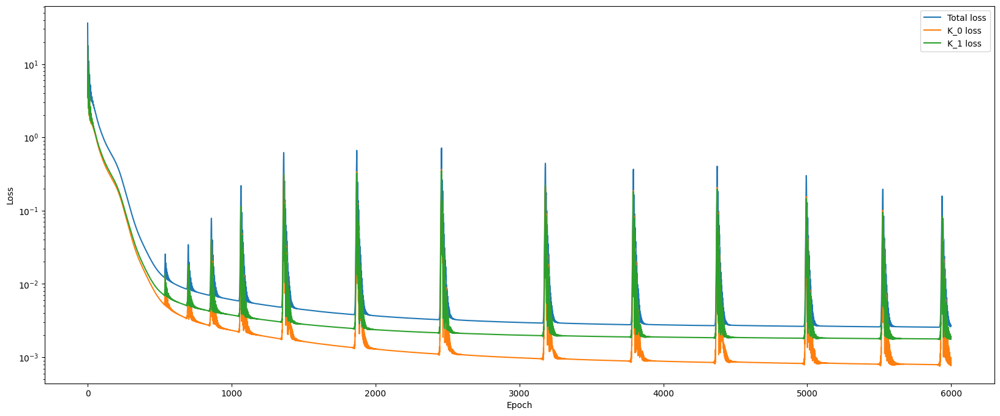

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(model_K.loss_log, label='Total loss')

plt.plot(model_K.loss_K_0_log, label='K_0 loss')
plt.plot(model_K.loss_K_1_log, label='K_1 loss')

if K_TrainTest == True:
  plt.plot(model_K.loss_test_log, label='Total test loss')
  plt.plot(model_K.loss_K_0_test_log, label='K_0 test loss')
  plt.plot(model_K.loss_K_1_test_log, label='K_1 test loss')

plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Get trained params
opt_params_K = model_K.get_params(model_K.opt_state)

In [ ]:
# Save model
if ExpansionType[:2] == 'MP':
  FolderName_K_model = FolderName + 'K_fe_MP_INN_model/'
  Path(os.path.join(FolderName_K_model)).mkdir(parents = True, exist_ok = True)

  if K_INN_type == 'K1_MP_INN':
    pickle.dump(opt_params_K , open(FolderName_K_model+'K_params.pkl', 'wb'))
  elif K_INN_type == 'K14_MP_INN':
    pickle.dump(opt_params_K , open(FolderName_K_model+'K14_params.pkl', 'wb'))

else:
  print("Wrong ExpansionType!")
  exit()

## Load Training Model

In [ ]:
# Load model
if ExpansionType[:2] == 'MP':
  FolderName_K_model = FolderName + 'K_fe_MP_INN_model/'

  if K_INN_type == 'K1_MP_INN':
    opt_params_K = pickle.load(open(FolderName_K_model+'K_params.pkl' , 'rb'))
  elif K_INN_type == 'K14_MP_INN':
    opt_params_K = pickle.load(open(FolderName_K_model+'K14_params.pkl' , 'rb'))

else:
  print("Wrong ExpansionType!")
  exit()

model_K.params = opt_params_K

## Predictions from K_INN

In [ ]:
rho_train_min = rho_1.min()
rho_train_max = rho_1.max()
drho_train_min = drho_1.min()
drho_train_max = drho_1.max()

if K_INN_type == 'K1_MP_INN':

  d2rho_train_min = d2rho_0.min()
  d2rho_train_max = d2rho_0.max()

elif K_INN_type == 'K14_MP_INN':

  d2rho_train_min = d2rho_1.min()
  d2rho_train_max = d2rho_1.max()
  d3rho_train_min = d3rho_1.min()
  d3rho_train_max = d3rho_1.max()

# K0
print('rho range:', rho_train_min, rho_train_max)
print('drho range:', drho_train_min, drho_train_max)

if K_INN_type == 'K14_MP_INN':
  print('d2rho range:', d2rho_train_min, d2rho_train_max)
  print('d3rho range:', d3rho_train_min, d3rho_train_max)


rho_test_grid_K = np.linspace(rho_train_min, rho_train_max, 100)
drho_test_grid_K = np.linspace(drho_train_min, drho_train_max, 200)

rho_meshgrid_K, drho_meshgrid_K = np.meshgrid(rho_test_grid_K, drho_test_grid_K)
print('K0 meshgrid shape:', rho_meshgrid_K.shape, drho_meshgrid_K.shape)


rho range: 0.022803499999999997 0.9801765
drho range: -3.720849999999999 3.7243
K0 meshgrid shape: (200, 100) (200, 100)


In [ ]:
# prediction and analytic K1 on meshgrid

if K_INN_type == 'K1_MP_INN':
  K_1_pred_grid = vmap(vmap(model_K.predict_K_1, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_K, rho_meshgrid_K, drho_meshgrid_K)

elif K_INN_type == 'K14_MP_INN':
  K_1_pred_grid = vmap(vmap(model_K.predict_K_1, in_axes=(None, 0, 0, None, None)), in_axes=(None, 0, 0, None, None))\
                                            (opt_params_K, rho_meshgrid_K, drho_meshgrid_K, 0, 0)


K_1_ana_grid = vmap(vmap(K_1_Arr_ana_func, in_axes=(0, 0, None,None,None,None)), in_axes=(0, 0, None,None,None,None))(rho_meshgrid_K, drho_meshgrid_K, dx_basis,Jo,L,Co)


print('Shape of predicted K_1:', K_1_pred_grid.shape)

print('Shape of analytic K_1:', K_1_ana_grid.shape)

Shape of predicted K_1: (200, 100)
Shape of analytic K_1: (200, 100)


In [ ]:
# prediction and training error K1 on data points
K_1_pred = vmap(model_K.predict_K_1, in_axes=(None, 0, 0))(opt_params_K, rho_1_train_K, drho_1_train_K)
K_1_error = np.linalg.norm(K_1_train_K - K_1_pred, 2) / np.linalg.norm(K_1_train_K, 2)

In [ ]:
# analytic and error (bewteen predicted and analytic values) on data points

K_1_ana_train_K = vmap(K_1_Arr_ana_func, in_axes=(0, 0, None,None,None,None))(rho_1_train_K, drho_1_train_K, dx_basis,Jo,L,Co)
K_1_error_ana = np.linalg.norm(K_1_ana_train_K - K_1_pred, 2) / np.linalg.norm(K_1_ana_train_K, 2)

In [ ]:
np.linalg.norm(K_1_train_K - K_1_ana_train_K, 2) / np.linalg.norm(K_1_train_K, 2)

Array(0.0109115, dtype=float32)

<Figure size 640x480 with 0 Axes>

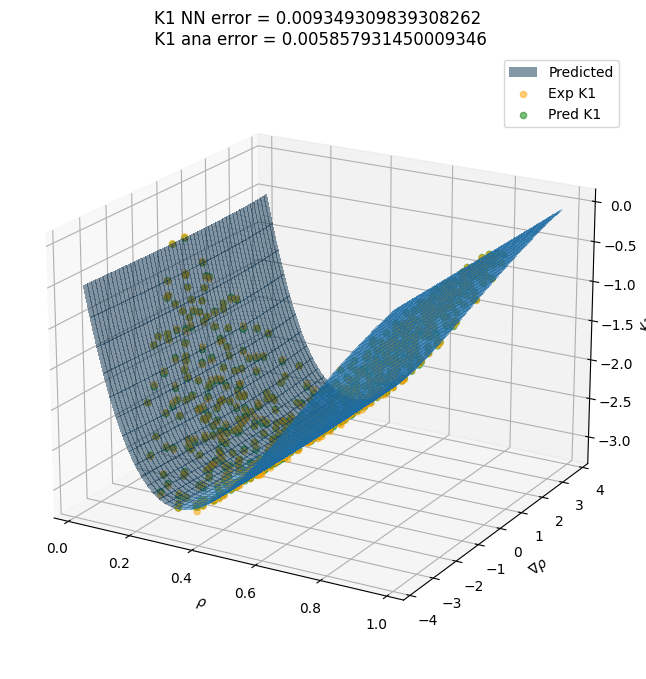

<Figure size 640x480 with 0 Axes>

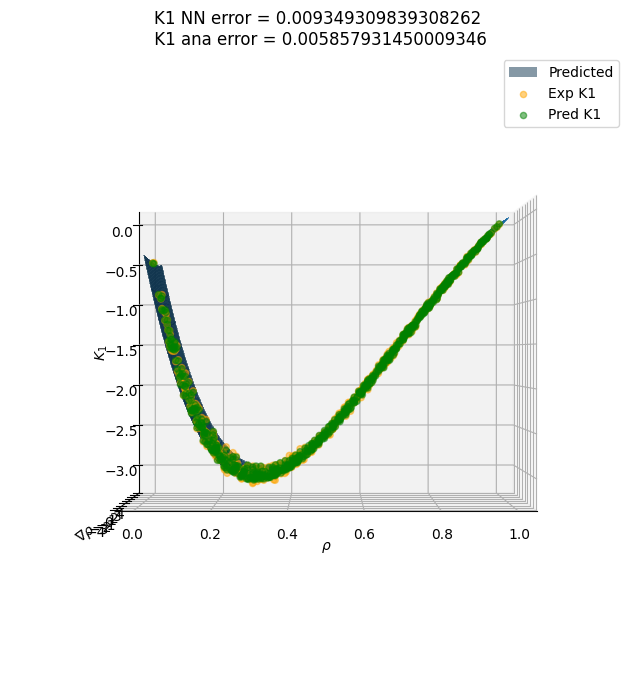

In [ ]:
plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(20, -60)
ax1 = ax.plot_surface(rho_meshgrid_K, drho_meshgrid_K, K_1_pred_grid, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_train_K, alpha=0.5, color = 'orange', label = 'Exp K1')
ax3 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_pred, alpha=0.5, color = 'green', label = 'Pred K1')
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel('$K_1$')
plt.title('K1 NN error = {}\n K1 ana error = {}'.format(K_1_error, K_1_error_ana))
plt.show()


plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(0, -90)
ax1 = ax.plot_surface(rho_meshgrid_K, drho_meshgrid_K, K_1_pred_grid, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_train_K, alpha=0.5, color = 'orange', label = 'Exp K1')
ax3 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_pred, alpha=0.5, color = 'green', label = 'Pred K1')
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel('$K_1$')
plt.title('K1 NN error = {}\n K1 ana error = {}'.format(K_1_error, K_1_error_ana))
plt.show()

In [ ]:
# error for predicted K1 comparing to analytic K1 on meshgrid

K_1_error_grid = np.linalg.norm(K_1_ana_grid - K_1_pred_grid, 2) / np.linalg.norm(K_1_ana_grid, 2)

<Figure size 640x480 with 0 Axes>

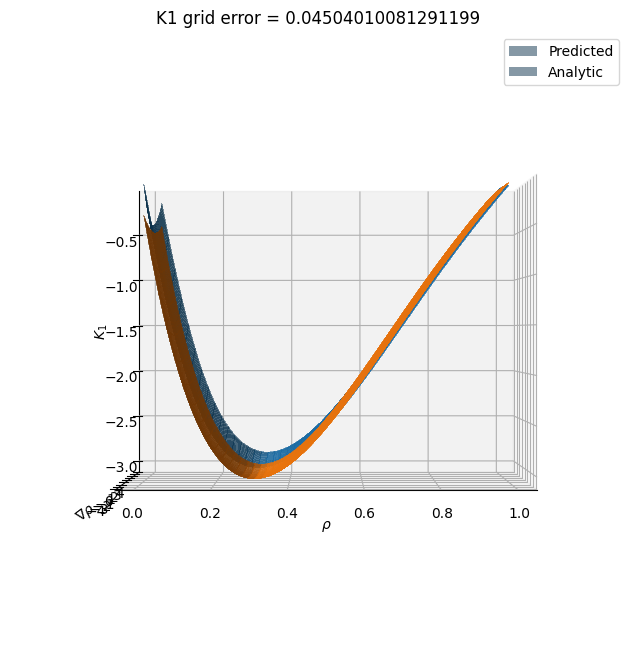

<Figure size 640x480 with 0 Axes>

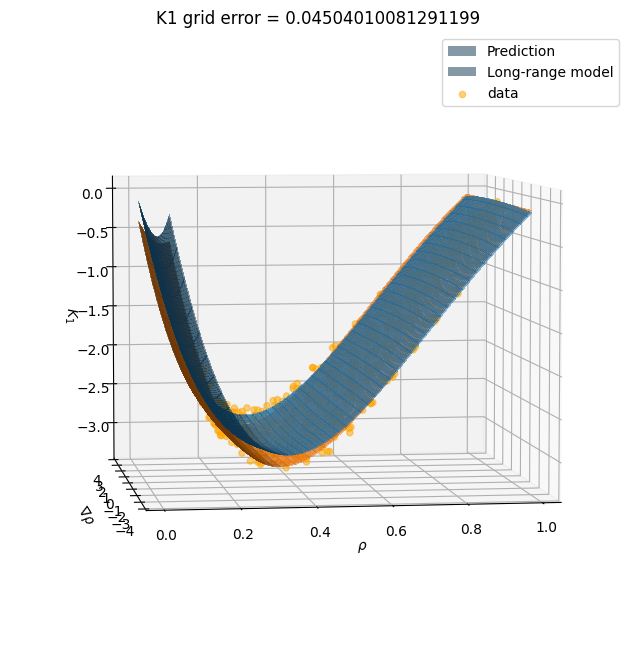

In [ ]:
plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(0, -90)
ax1 = ax.plot_surface(rho_meshgrid_K, drho_meshgrid_K, K_1_pred_grid, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.plot_surface(rho_meshgrid_K, drho_meshgrid_K, K_1_ana_grid, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
ax2._facecolors2d = ax1._facecolor3d
ax2._edgecolors2d = ax1._edgecolor3d
# ax3 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_train_K, alpha=0.5, color = 'orange', label = 'Exp K1')
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel(r'$K_1$')
plt.title('K1 grid error = {}'.format(K_1_error_grid))
plt.show()

plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(5, -98)
ax1 = ax.plot_surface(rho_meshgrid_K, drho_meshgrid_K, K_1_pred_grid, alpha=0.5, linewidth=0, antialiased=False, label = 'Prediction')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.plot_surface(rho_meshgrid_K, drho_meshgrid_K, K_1_ana_grid, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range model')
ax2._facecolors2d = ax1._facecolor3d
ax2._edgecolors2d = ax1._edgecolor3d
ax3 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_train_K, alpha=0.5, color = 'orange', label = 'data')
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel(r'$K_1$')
plt.title('K1 grid error = {}'.format(K_1_error_grid))
plt.show()


## Output library data for K

In [ ]:
Num_K_lib = [1000, 1000]
rho_K_lib = onp.linspace(rho_1_train_K.min(), rho_1_train_K.max(), Num_K_lib[0])
drho_K_lib = onp.linspace(5*drho_1_train_K.min(), 5*drho_1_train_K.max(), Num_K_lib[1]) # extrapolate the range of drho

rho_K_grid_lib, drho_K_grid_lib = onp.meshgrid(rho_K_lib, drho_K_lib)


K_1_lib = vmap(vmap(model_K.predict_K_1, in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_K, rho_K_lib, drho_K_lib)
K_1_lib = onp.array(K_1_lib)
print(K_1_lib.shape)

K_lib_dic = {"rho_K_lib": rho_K_lib, "drho_K_lib": drho_K_lib, "K_1_lib": K_1_lib}


(1000, 1000)


In [ ]:
# Save K
FolderName_K_lib = FolderName + 'K_fe_MP_INN_model/'
Path(os.path.join(FolderName_K_lib)).mkdir(parents = True, exist_ok = True)
scipy.io.savemat(FolderName_K_lib + 'K_lib.mat', K_lib_dic)


# fe_INN training and prediction

## Training data for fe_INN

In [ ]:
K_type = 'pred'
# K_type = 'ana_1st'  # analytic K without the effect from d2rho/dx2
# K_type = 'ana_2nd'  # analytic K with the effect from d2rho/dx2


# choose INN type different free energy function forms
fe_INN_type = 'fe_INN' # f(\rho)
# fe_INN_type = 'fe_gradB_INN' # f(\rho, \grad \rho) with backward gradient
# fe_INN_type = 'fe_gradC_INN' # f(\rho, \grad \rho) with central gradient
# fe_INN_type = 'fe_lap_INN' # f(\rho, lap \rho) with backward gradient
# fe_INN_type = 'fe_gradB_lap_INN' # f(\rho, \grad \rho, lap \rho) with backward gradient
# fe_INN_type = 'fe_gradC_lap_INN' # f(\rho, \grad \rho, lap \rho) with backward gradient


# methods for estimating variance of evolution equation
# feVarType = '1' # Traditional loss function without deviding a variance
feVarType = 'KVar' # Estimated variance with analytic expression that is proportional to the diagonal operator K0
# feVarType = 'TimeData' # Estimated variance based on the time series in time interval Delta t
# feVarType = 'AdpEqVar' # Estimated variance that changes adaptively during training based on the equation residual in time interval Delta t

# if feVarType == 'KVar':
#   fe_KVar_factor = 1
#   if fe_KVar_factor != 1:
#     feVarType = feVarType + str(fe_KVar_factor)


print(fe_INN_type)
print(feVarType)

fe_INN
KVar


In [ ]:
if CodeType == 'R123':
  Nprof_0 = round(Nprof/NumIniDup)
  rho_h0_ave = onp.zeros( ( Nprof_0, round(Ngamma) ) )
  rho_ini_ex_ave = onp.zeros( ( Nprof_0, round(Ngamma) ) )
  rho_Delta_t_ave = onp.zeros( ( Nprof_0, round(Ngamma) ) )
  for i in range(Nprof_0):
    rho_h0_ave[i] = rho_h0[i::Nprof_0].mean(axis=0)
    rho_ini_ex_ave[i] = rho_ini_ex[i::Nprof_0].mean(axis=0)
    rho_Delta_t_ave[i] = rho_Delta_t[i::Nprof_0].mean(axis=0)

  # rho_Delta_t_R4 = np.stack([rho_h0_ave, rho_Delta_t_ave], axis = 2)


# shift rho_Delta_t_R4
rho_Delta_t_R4_left = np.roll(rho_Delta_t_R4, 1, axis=1)
rho_Delta_t_R4_left2 = np.roll(rho_Delta_t_R4, 2, axis=1)
rho_Delta_t_R4_right = np.roll(rho_Delta_t_R4, -1, axis=1)
rho_Delta_t_R4_right2 = np.roll(rho_Delta_t_R4, -2, axis=1)


gradC_rho_Delta_t_R4 = ( rho_Delta_t_R4_right - rho_Delta_t_R4_left ) / ( 2.0 * dx_basis )

# if fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN' or fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
if fe_INN_type[:7] == 'fe_grad':  # fe_gradB_INN, fe_gradC_INN, fe_gradB_lap_INN, fe_gradC_lap_INN

  if fe_INN_type[:8] == 'fe_gradB':
    # backward gradient of rho
    print('gradB')
    grad_rho_Delta_t_R4 = ( rho_Delta_t_R4 - rho_Delta_t_R4_left ) / dx_basis

  # elif fe_INN_type == 'fe_gradC_INN' or fe_INN_type == 'fe_gradC_lap_INN':
  elif fe_INN_type[:8] == 'fe_gradC':
    # central gradient of rho
    print('gradC')
    grad_rho_Delta_t_R4 = gradC_rho_Delta_t_R4

  grad_rho_Delta_t_R4_left = np.roll(grad_rho_Delta_t_R4, 1, axis=1)
  grad_rho_Delta_t_R4_left2 = np.roll(grad_rho_Delta_t_R4, 2, axis=1)
  grad_rho_Delta_t_R4_right = np.roll(grad_rho_Delta_t_R4, -1, axis=1)
  grad_rho_Delta_t_R4_right2 = np.roll(grad_rho_Delta_t_R4, -2, axis=1)

if fe_INN_type == 'fe_lap_INN' or fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
  print('lap')
  lap_rho_Delta_t_R4 = ( rho_Delta_t_R4_right - 2.0 * rho_Delta_t_R4 + rho_Delta_t_R4_left ) / ( dx_basis * dx_basis )

  lap_rho_Delta_t_R4_left = np.roll(lap_rho_Delta_t_R4, 1, axis=1)
  lap_rho_Delta_t_R4_left2 = np.roll(lap_rho_Delta_t_R4, 2, axis=1)
  lap_rho_Delta_t_R4_right = np.roll(lap_rho_Delta_t_R4, -1, axis=1)
  lap_rho_Delta_t_R4_right2 = np.roll(lap_rho_Delta_t_R4, -2, axis=1)

# left and right for the expectation value of initial profile
if CodeType == 'R01234':
  rho_ini_ex_ave = rho_ini_ex
rho_ini_ex_left = np.roll(rho_ini_ex_ave,1,axis=1)
rho_ini_ex_right = np.roll(rho_ini_ex_ave,-1,axis=1)
rho_ini_ex_right2 = np.roll(rho_ini_ex_ave,-2,axis=1)


if t_type == 'const':
  Delta_t_all = Delta_t
  Delta_t_3D = Delta_t
elif t_type == 'vary':
  # when different profiles have different timescales
  Delta_t_3D = np.tile(Delta_t[:, np.newaxis, np.newaxis], (1, rho_Delta_t_R4.shape[1], rho_Delta_t_R4.shape[2]-1))
  Delta_t_all = Delta_t_3D.flatten()
else:
  print("Wrong t_type!")
  exit()

# rho_old at t = t_0 + (0:R4-1) * Delta_t/R4
rho_all_fe = rho_Delta_t_R4[:,:,0:-1].flatten()
rho_left_all_fe = rho_Delta_t_R4_left[:,:,0:-1].flatten()
rho_left2_all_fe = rho_Delta_t_R4_left2[:,:,0:-1].flatten()
rho_right_all_fe = rho_Delta_t_R4_right[:,:,0:-1].flatten()
rho_right2_all_fe = rho_Delta_t_R4_right2[:,:,0:-1].flatten()

gradC_rho_all_fe = gradC_rho_Delta_t_R4[:,:,0:-1].flatten()
# if fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN' or fe_INN_type == 'fe_gradC_lap_INN':
if fe_INN_type[:7] == 'fe_grad':  # fe_gradB_INN, fe_gradC_INN, fe_gradB_lap_INN, fe_gradC_lap_INN
  grad_rho_all_fe = grad_rho_Delta_t_R4[:,:,0:-1].flatten()
  grad_rho_left_all_fe = grad_rho_Delta_t_R4_left[:,:,0:-1].flatten()
  grad_rho_left2_all_fe = grad_rho_Delta_t_R4_left2[:,:,0:-1].flatten()
  grad_rho_right_all_fe = grad_rho_Delta_t_R4_right[:,:,0:-1].flatten()
  grad_rho_right2_all_fe = grad_rho_Delta_t_R4_right2[:,:,0:-1].flatten()

if fe_INN_type == 'fe_lap_INN' or fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
  lap_rho_all_fe = lap_rho_Delta_t_R4[:,:,0:-1].flatten()
  lap_rho_left_all_fe = lap_rho_Delta_t_R4_left[:,:,0:-1].flatten()
  lap_rho_left2_all_fe = lap_rho_Delta_t_R4_left2[:,:,0:-1].flatten()
  lap_rho_right_all_fe = lap_rho_Delta_t_R4_right[:,:,0:-1].flatten()
  lap_rho_right2_all_fe = lap_rho_Delta_t_R4_right2[:,:,0:-1].flatten()


# converting rho, rho_left, rho_right into rho, drho, d2rho (at different points) for calculating Kba
drho_all_fe = ( rho_right_all_fe - rho_left_all_fe ) / ( 2.0 * dx_basis )
d2rho_all_fe = ( rho_right_all_fe - 2.0 * rho_all_fe + rho_left_all_fe ) / ( dx_basis ** 2 )
rho_1_left_all_fe = ( rho_all_fe + rho_left_all_fe ) / 2.0
drho_1_left_all_fe = ( rho_all_fe - rho_left_all_fe ) / dx_basis
rho_1_right_all_fe = ( rho_right_all_fe + rho_all_fe ) / 2.0
drho_1_right_all_fe = ( rho_right_all_fe - rho_all_fe ) / dx_basis


# rho_new at t = t_0 + (1:R4) * Delta_t/R4
rho_new_all_fe = rho_Delta_t_R4[:,:,1:].flatten()
rho_new_left_all_fe = rho_Delta_t_R4_left[:,:,1:].flatten()
rho_new_right_all_fe = rho_Delta_t_R4_right[:,:,1:].flatten()

# Drho/Dt
DrhoDt_all_fe = (rho_new_all_fe - rho_all_fe) / ( Delta_t_all / R4 )
DrhoDt_left_all_fe = (rho_new_left_all_fe - rho_left_all_fe) / ( Delta_t_all / R4 )
DrhoDt_right_all_fe = (rho_new_right_all_fe - rho_right_all_fe) / ( Delta_t_all / R4 )


drho_Delta_t_R4 = (rho_Delta_t_R4_right - rho_Delta_t_R4_left) / (2 * dx_basis)



print('rho_Delta_t_R4.shape =', rho_Delta_t_R4.shape)


M_tri_0 = 2.0/3.0 * dx_basis
M_tri_left = 1.0/6.0 * dx_basis
M_tri_right = 1.0/6.0 * dx_basis
M_tri = M_tri_0, M_tri_left, M_tri_right
print('M_tri = ', M_tri)



print('feVarType =', feVarType)

rho_Delta_t_R4.shape = (28, 25, 2)
M_tri =  (0.026666666666666665, 0.006666666666666666, 0.006666666666666666)
feVarType = KVar


In [ ]:
if K_type == 'pred':
  # K using K_INN
  if K_INN_type == 'K1_MP_INN':
    K_1_left_all_fe = vmap(model_K.predict_K_1_MP, in_axes=(None, 0, 0))(opt_params_K, rho_left_all_fe, rho_all_fe)
    K_1_right_all_fe = vmap(model_K.predict_K_1_MP, in_axes=(None, 0, 0))(opt_params_K, rho_all_fe, rho_right_all_fe)
    K_0_all_fe = vmap(model_K.predict_K_0_MP, in_axes=(None, 0, 0, 0))(opt_params_K, rho_all_fe, rho_left_all_fe, rho_right_all_fe)

  elif K_INN_type == 'K14_MP_INN':
    K_1_left_all_fe = vmap(model_K.predict_K_1_MP, in_axes=(None, 0, 0, 0, 0))(opt_params_K, rho_left2_all_fe, rho_left_all_fe, rho_all_fe, rho_right_all_fe)
    K_1_right_all_fe = vmap(model_K.predict_K_1_MP, in_axes=(None, 0, 0, 0, 0))(opt_params_K, rho_left_all_fe, rho_all_fe, rho_right_all_fe, rho_right2_all_fe)
    K_0_all_fe = vmap(model_K.predict_K_0_MP, in_axes=(None, 0, 0, 0, 0, 0))(opt_params_K, rho_all_fe, rho_left_all_fe, rho_left2_all_fe, \
                                                        rho_right_all_fe, rho_right2_all_fe)

else:
  print("Wrong K_type!")
  exit()


K_0_all_fe = K_0_all_fe
K_left_all_fe = K_1_left_all_fe
K_right_all_fe = K_1_right_all_fe


# variance of equation based on Kbb
var_eq_all_fe_KVar = 2.0/(Nbin * R0 * R1 * R2) * K_0_all_fe / ( Delta_t_all / R4 )

if R4 > 1:
  # variance of equation based on data
  DrhoDt_fe = ( rho_Delta_t_R4[:,:,1:] - rho_Delta_t_R4[:,:,0:-1] ) / ( Delta_t_3D / R4 )
  DrhoDt_fe_left = np.roll(DrhoDt_fe, 1, axis=1)
  DrhoDt_fe_right = np.roll(DrhoDt_fe, -1, axis=1)
  MDrhoDt = M_tri_left * DrhoDt_fe_left + M_tri_0 * DrhoDt_fe + M_tri_right * DrhoDt_fe_right
  var_MDrhoDt_fe = MDrhoDt.var(axis=2)
  var_MDrhoDt_all_fe = np.tile(var_MDrhoDt_fe[:, :, np.newaxis], (1, 1, int(R4)))
  var_MDrhoDt_all_fe = var_MDrhoDt_all_fe.flatten() + 1e-50

if feVarType == '1':
  var_eq_all_fe = 1.0 + 0 * K_0_all_fe
elif feVarType[:4] == 'KVar':
  var_eq_all_fe = var_eq_all_fe_KVar
elif feVarType == 'TimeData':
  var_eq_all_fe = var_MDrhoDt_all_fe
elif feVarType == 'AdpEqVar':
  var_eq_all_fe = var_MDrhoDt_all_fe
else:
  print("Wrong feVarType!")
  exit()


In [ ]:
Dim1_all = var_eq_all_fe.shape[0] / R4

if fe_TrainTest == False:

  if fe_INN_type == 'fe_INN':
    rho_train_fe, rho_left_train_fe, rho_right_train_fe, DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            K_0_train_fe, K_left_train_fe, K_right_train_fe, var_eq_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_right_all_fe, DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            K_0_all_fe, K_left_all_fe, K_right_all_fe, var_eq_all_fe

  elif fe_INN_type == 'fe_gradB_INN':
    rho_train_fe, rho_left_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            grad_rho_train_fe, grad_rho_left_train_fe, grad_rho_right_train_fe, grad_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            K_0_train_fe, K_left_train_fe, K_right_train_fe, var_eq_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            grad_rho_all_fe, grad_rho_left_all_fe, grad_rho_right_all_fe, grad_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            K_0_all_fe, K_left_all_fe, K_right_all_fe, var_eq_all_fe

  elif fe_INN_type == 'fe_gradC_INN':
    rho_train_fe, rho_left_train_fe, rho_left2_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            grad_rho_train_fe, grad_rho_left_train_fe, grad_rho_left2_train_fe, grad_rho_right_train_fe, grad_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            K_0_train_fe, K_left_train_fe, K_right_train_fe, var_eq_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            grad_rho_all_fe, grad_rho_left_all_fe, grad_rho_left2_all_fe, grad_rho_right_all_fe, grad_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            K_0_all_fe, K_left_all_fe, K_right_all_fe, var_eq_all_fe

  elif fe_INN_type == 'fe_lap_INN':
    rho_train_fe, rho_left_train_fe, rho_left2_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            lap_rho_train_fe, lap_rho_left_train_fe, lap_rho_left2_train_fe, lap_rho_right_train_fe, lap_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            K_0_train_fe, K_left_train_fe, K_right_train_fe, var_eq_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            lap_rho_all_fe, lap_rho_left_all_fe, lap_rho_left2_all_fe, lap_rho_right_all_fe, lap_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            K_0_all_fe, K_left_all_fe, K_right_all_fe, var_eq_all_fe

  elif fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
    rho_train_fe, rho_left_train_fe, rho_left2_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            grad_rho_train_fe, grad_rho_left_train_fe, grad_rho_left2_train_fe, grad_rho_right_train_fe, grad_rho_right2_train_fe, \
            lap_rho_train_fe, lap_rho_left_train_fe, lap_rho_left2_train_fe, lap_rho_right_train_fe, lap_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            K_0_train_fe, K_left_train_fe, K_right_train_fe, var_eq_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            grad_rho_all_fe, grad_rho_left_all_fe, grad_rho_left2_all_fe, grad_rho_right_all_fe, grad_rho_right2_all_fe, \
            lap_rho_all_fe, lap_rho_left_all_fe, lap_rho_left2_all_fe, lap_rho_right_all_fe, lap_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            K_0_all_fe, K_left_all_fe, K_right_all_fe, var_eq_all_fe

  else:
    print("Wrong fe_INN_type!")
    exit()

  test_data_fe = []

else:
  print("Wrong fe_TrainTest_type!")


if fe_INN_type == 'fe_INN':
  train_data_fe = rho_train_fe, rho_left_train_fe, rho_right_train_fe, DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis



elif fe_INN_type == 'fe_gradB_INN':

  rho_grad_rho_train_fe = rho_train_fe, grad_rho_train_fe
  rho_grad_rho_left_train_fe = rho_left_train_fe, grad_rho_left_train_fe
  rho_grad_rho_right_train_fe = rho_right_train_fe, grad_rho_right_train_fe
  rho_grad_rho_right2_train_fe = rho_right2_train_fe, grad_rho_right2_train_fe

  train_data_fe = rho_grad_rho_train_fe, rho_grad_rho_left_train_fe, rho_grad_rho_right_train_fe, rho_grad_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis

elif fe_INN_type == 'fe_gradC_INN':

  rho_grad_rho_train_fe = rho_train_fe, grad_rho_train_fe
  rho_grad_rho_left_train_fe = rho_left_train_fe, grad_rho_left_train_fe
  rho_grad_rho_left2_train_fe = rho_left2_train_fe, grad_rho_left2_train_fe
  rho_grad_rho_right_train_fe = rho_right_train_fe, grad_rho_right_train_fe
  rho_grad_rho_right2_train_fe = rho_right2_train_fe, grad_rho_right2_train_fe

  train_data_fe = rho_grad_rho_train_fe, rho_grad_rho_left_train_fe, rho_grad_rho_left2_train_fe, rho_grad_rho_right_train_fe, rho_grad_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis

elif fe_INN_type == 'fe_lap_INN':

  rho_lap_rho_train_fe = rho_train_fe, lap_rho_train_fe
  rho_lap_rho_left_train_fe = rho_left_train_fe, lap_rho_left_train_fe
  rho_lap_rho_left2_train_fe = rho_left2_train_fe, lap_rho_left2_train_fe
  rho_lap_rho_right_train_fe = rho_right_train_fe, lap_rho_right_train_fe
  rho_lap_rho_right2_train_fe = rho_right2_train_fe, lap_rho_right2_train_fe

  train_data_fe = rho_lap_rho_train_fe, rho_lap_rho_left_train_fe, rho_lap_rho_left2_train_fe, rho_lap_rho_right_train_fe, rho_lap_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis

elif fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':

  rho_grad_lap_rho_train_fe = rho_train_fe, grad_rho_left_train_fe, lap_rho_train_fe
  rho_grad_lap_rho_left_train_fe = rho_left_train_fe, grad_rho_left_train_fe, lap_rho_left_train_fe
  rho_grad_lap_rho_left2_train_fe = rho_left2_train_fe, grad_rho_left2_train_fe, lap_rho_left2_train_fe
  rho_grad_lap_rho_right_train_fe = rho_right_train_fe, grad_rho_right_train_fe, lap_rho_right_train_fe
  rho_grad_lap_rho_right2_train_fe = rho_right2_train_fe, grad_rho_right2_train_fe, lap_rho_right2_train_fe

  train_data_fe = rho_grad_lap_rho_train_fe, rho_grad_lap_rho_left_train_fe, rho_grad_lap_rho_left2_train_fe, rho_grad_lap_rho_right_train_fe, rho_grad_lap_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          K_0_train_fe, K_left_train_fe, K_right_train_fe, M_tri, var_eq_train_fe, dx_basis

else:
  print("Wrong fe_INN_type!")
  exit()



if feVarType == 'AdpEqVar':
  # add R4 into training data set for calculating adaptive equation variance
  train_data_fe = train_data_fe + (R4, )

In [ ]:
if R4 > 1:
  print(MDrhoDt.shape)
  print(var_MDrhoDt_fe.shape)
  print(DrhoDt_fe.shape)
print(var_eq_all_fe.shape)

(700,)


<Figure size 640x480 with 0 Axes>

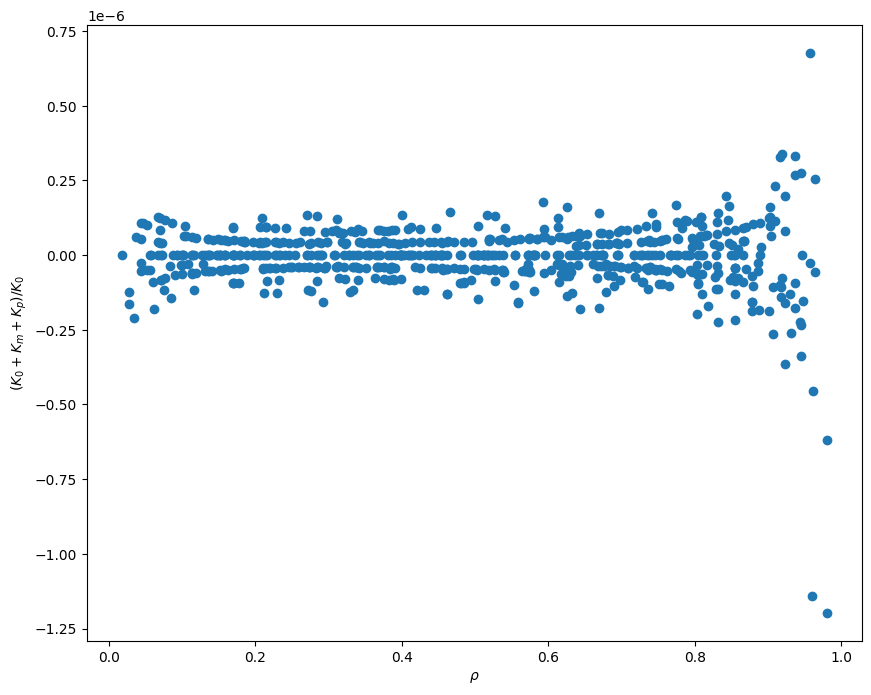

<Figure size 640x480 with 0 Axes>

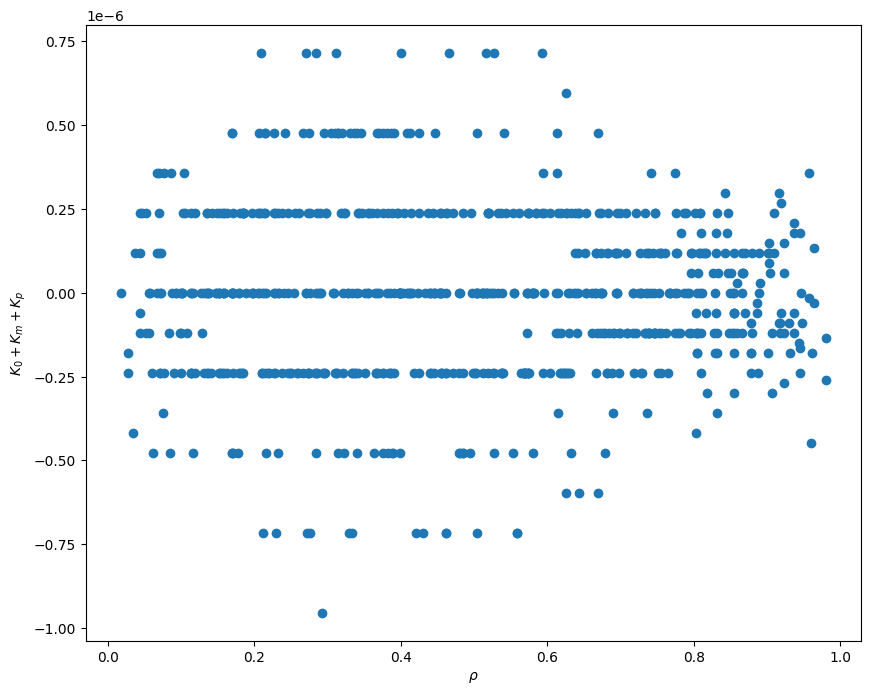

In [ ]:
# testing mass conservation

Ksum_K0_ratio = ( K_0_all_fe.reshape(rho_Delta_t_R4[:,:,:-1].shape) + np.roll(K_left_all_fe.reshape(rho_Delta_t_R4[:,:,:-1].shape), -1, axis=1)
                    + np.roll(K_right_all_fe.reshape(rho_Delta_t_R4[:,:,:-1].shape), 1, axis=1) ) / K_0_all_fe.reshape(rho_Delta_t_R4[:,:,:-1].shape)

plt.figure()
fig = plt.figure(figsize=(10,8))
plt.scatter(rho_Delta_t_R4[:,:,:-1].flatten(), Ksum_K0_ratio.flatten())
plt.xlabel(r'$\rho$')
plt.ylabel(r'$(K_0 + K_m + K_p) / K_0$')
# plt.title(r'$f$ error = {}'.format(fe_error))
# plt.legend()
plt.show()

plt.figure()
fig = plt.figure(figsize=(10,8))
plt.scatter(rho_all_fe, Ksum_K0_ratio.flatten() * K_0_all_fe)
plt.xlabel(r'$\rho$')
plt.ylabel(r'$K_0 + K_m + K_p$')
# plt.title(r'$f$ error = {}'.format(fe_error))
# plt.legend()
plt.show()



<Figure size 640x480 with 0 Axes>

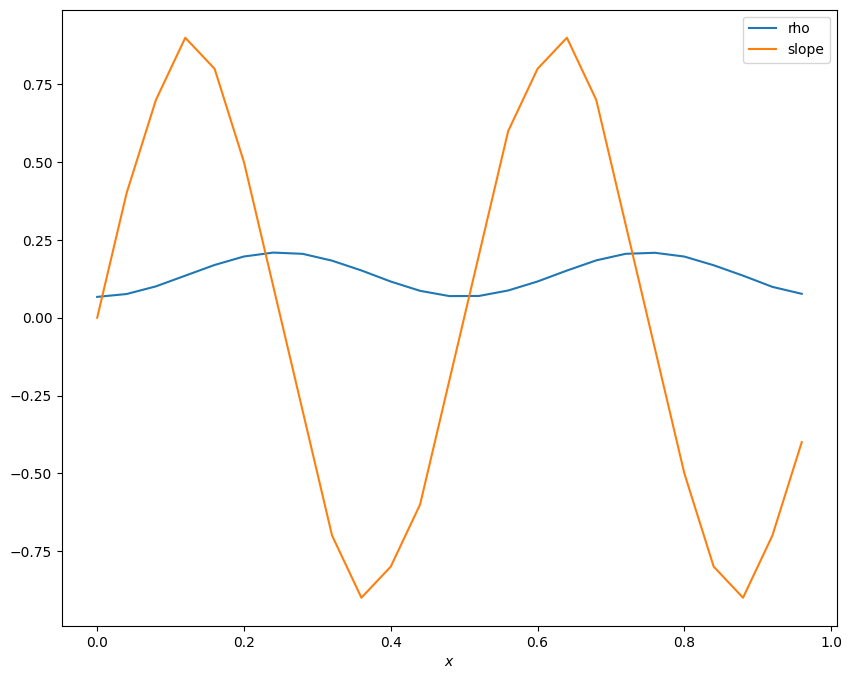

<Figure size 640x480 with 0 Axes>

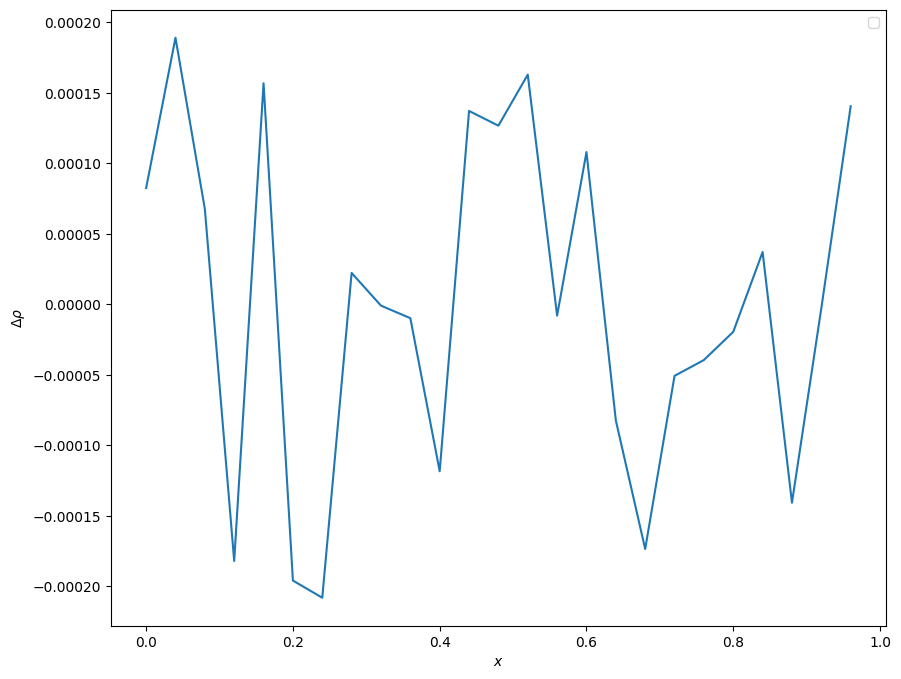

In [ ]:
# compare drho & slope_x

plt.figure()
fig = plt.figure(figsize=(10,8))
plt.plot(x_basis, rho_Delta_t_R4[14,:,0], label='rho')
if fe_INN_type[:7] == 'fe_grad':
  plt.plot(x_basis, grad_rho_Delta_t_R4[14,:,0], label='grad rho')
plt.plot(x_basis, slope_x[14,:], label='slope')
plt.xlabel(r'$x$')
# plt.ylabel(r'$\rho$')
# plt.title(r'$f$ error = {}'.format(fe_error))
plt.legend()
plt.show()

# Plot Delta_rho & slope_x

plt.figure()
fig = plt.figure(figsize=(10,8))
plt.plot(x_basis, rho_Delta_t_R4[14,:,-1] - rho_Delta_t_R4[14,:,0])
plt.xlabel(r'$x$')
plt.ylabel(r'$\Delta \rho$')
# plt.title(r'$f$ error = {}'.format(fe_error))
plt.legend()
plt.show()

## Train fe_INN

In [ ]:
# Set up layers and learning rate
if fe_INN_type == 'fe_INN':
  layers_fe = [1, 20, 20, 1]
elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN' or fe_INN_type == 'fe_lap_INN':
  layers_fe = [2, 20, 20, 1]
elif fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
  layers_fe = [3, 30, 30, 1]
else:
  print("Wrong fe_INN_type!")
  exit()

learning_rate_fe = 1e-2
# learning_rate_fe = 4e-2

activation_fe = 'softplus'
# activation_fe = 'GeLU'

# fe_DataWeights = 50
fe_DataWeights = 1

if feVarType == 'AdpEqVar':
  fe_AEV_Step = 200
else:
  fe_AEV_Step = -1

print('ExpansionType =', ExpansionType)
print('K_type =', K_type)
print('fe_INN_type =', fe_INN_type)
print('activation_function_fe =', activation_fe)

print('layers_fe =', layers_fe)
print('learning_rate_fe =', learning_rate_fe)
print('fe_TrainTest =', fe_TrainTest)

print('feVarType =', feVarType)
print('fe_AEV_Step =', fe_AEV_Step)
print('')

if fe_INN_type == 'fe_INN':
  model_fe = fe_INN(train_data_fe, layers_fe, lr=learning_rate_fe, af=activation_fe, test_data=test_data_fe, TrainTest=fe_TrainTest, DataWeights=fe_DataWeights, AdpEqVar_Step=fe_AEV_Step)
elif fe_INN_type == 'fe_gradB_INN':
  model_fe = fe_gradB_INN(train_data_fe, layers_fe, lr=learning_rate_fe, af=activation_fe, test_data=test_data_fe, TrainTest=fe_TrainTest, DataWeights=fe_DataWeights, AdpEqVar_Step=fe_AEV_Step)
elif fe_INN_type == 'fe_gradC_INN':
  model_fe = fe_gradC_INN(train_data_fe, layers_fe, lr=learning_rate_fe, af=activation_fe, test_data=test_data_fe, TrainTest=fe_TrainTest, DataWeights=fe_DataWeights, AdpEqVar_Step=fe_AEV_Step)
elif fe_INN_type == 'fe_lap_INN':
  model_fe = fe_lap_INN(train_data_fe, layers_fe, lr=learning_rate_fe, af=activation_fe, test_data=test_data_fe, TrainTest=fe_TrainTest, DataWeights=fe_DataWeights)
elif fe_INN_type == 'fe_gradB_lap_INN':
  model_fe = fe_gradB_lap_INN(train_data_fe, layers_fe, lr=learning_rate_fe, af=activation_fe, test_data=test_data_fe, TrainTest=fe_TrainTest, DataWeights=fe_DataWeights)
elif fe_INN_type == 'fe_gradC_lap_INN':
  model_fe = fe_gradC_lap_INN(train_data_fe, layers_fe, lr=learning_rate_fe, af=activation_fe, test_data=test_data_fe, TrainTest=fe_TrainTest, DataWeights=fe_DataWeights)


ExpansionType = MPK2
K_type = pred
fe_INN_type = fe_INN
activation_function_fe = softplus
layers_fe = [1, 20, 20, 1]
learning_rate_fe = 0.01
fe_TrainTest = False
feVarType = KVar
fe_AEV_Step = -1

data shape =  (700,)
DataWeights = 1

rho scale =  0.4968365482142857
M scale =  0.013333335
DrhoDt scale =  6.8163643
K scale =  2.6272728
fe scale =  0.017186996


In [ ]:
# Start training

model_fe.train(num_epochs = 2000)

  0%|          | 3/2000 [00:02<18:42,  1.78it/s]


loss = 9.859002113342285

loss = 9.847834587097168


  0%|          | 5/2000 [00:02<09:59,  3.33it/s]


loss = 9.837048530578613

loss = 9.826111793518066


  0%|          | 7/2000 [00:02<06:46,  4.90it/s]


loss = 9.814555168151855

loss = 9.801960945129395


  0%|          | 9/2000 [00:03<05:25,  6.12it/s]


loss = 9.787949562072754

loss = 9.772147178649902


  1%|          | 11/2000 [00:03<04:52,  6.80it/s]


loss = 9.754179954528809

loss = 9.733663558959961


  1%|          | 13/2000 [00:03<04:49,  6.87it/s]


loss = 9.710201263427734

loss = 9.683371543884277


  1%|          | 15/2000 [00:03<04:58,  6.65it/s]


loss = 9.652721405029297

loss = 9.617753982543945


  1%|          | 17/2000 [00:04<04:32,  7.29it/s]


loss = 9.577935218811035

loss = 9.532698631286621


  1%|          | 19/2000 [00:04<04:25,  7.47it/s]


loss = 9.481462478637695

loss = 9.423649787902832


  1%|          | 21/2000 [00:04<04:26,  7.43it/s]


loss = 9.358702659606934

loss = 9.286118507385254


  1%|          | 23/2000 [00:04<04:23,  7.51it/s]


loss = 9.205465316772461

loss = 9.116415977478027


  1%|▏         | 25/2000 [00:05<04:17,  7.68it/s]


loss = 9.018790245056152

loss = 8.912612915039062


  1%|▏         | 27/2000 [00:05<04:34,  7.20it/s]


loss = 8.79816722869873

loss = 8.676053047180176


  1%|▏         | 29/2000 [00:05<04:57,  6.63it/s]


loss = 8.547233581542969

loss = 8.4130277633667


  2%|▏         | 31/2000 [00:06<04:51,  6.76it/s]


loss = 8.275014877319336

loss = 8.134832382202148


  2%|▏         | 33/2000 [00:06<05:10,  6.34it/s]


loss = 7.993953704833984

loss = 7.853251934051514


  2%|▏         | 35/2000 [00:06<04:48,  6.81it/s]


loss = 7.712408065795898

loss = 7.569656848907471


  2%|▏         | 37/2000 [00:07<04:34,  7.15it/s]


loss = 7.422231197357178

loss = 7.2671427726745605


  2%|▏         | 39/2000 [00:07<04:21,  7.50it/s]


loss = 7.101959228515625

loss = 6.925450325012207


  2%|▏         | 41/2000 [00:07<04:18,  7.57it/s]


loss = 6.73810338973999

loss = 6.5423994064331055


  2%|▏         | 43/2000 [00:07<04:16,  7.63it/s]


loss = 6.342630386352539

loss = 6.144011974334717


  2%|▏         | 45/2000 [00:08<04:05,  7.95it/s]


loss = 5.951238632202148

loss = 5.767049789428711


  2%|▏         | 47/2000 [00:08<04:20,  7.49it/s]


loss = 5.591736316680908

loss = 5.4239959716796875


  2%|▏         | 49/2000 [00:08<04:05,  7.94it/s]


loss = 5.26242733001709

loss = 5.106607913970947


  3%|▎         | 51/2000 [00:08<04:07,  7.86it/s]


loss = 4.957370281219482

loss = 4.816502094268799


  3%|▎         | 52/2000 [00:08<04:15,  7.61it/s]


loss = 4.6861467361450195


  3%|▎         | 53/2000 [00:09<05:04,  6.40it/s]


loss = 4.5680437088012695


  3%|▎         | 54/2000 [00:09<06:04,  5.33it/s]


loss = 4.462756156921387


  3%|▎         | 55/2000 [00:09<06:40,  4.85it/s]


loss = 4.36913537979126


  3%|▎         | 56/2000 [00:09<07:13,  4.48it/s]


loss = 4.284334659576416


  3%|▎         | 57/2000 [00:10<09:35,  3.38it/s]


loss = 4.2045488357543945


  3%|▎         | 58/2000 [00:11<12:33,  2.58it/s]


loss = 4.126312255859375


  3%|▎         | 60/2000 [00:11<10:07,  3.19it/s]


loss = 4.047719478607178

loss = 3.9688782691955566


  3%|▎         | 62/2000 [00:11<06:52,  4.70it/s]


loss = 3.8911452293395996

loss = 3.8157365322113037


  3%|▎         | 64/2000 [00:12<05:25,  5.96it/s]


loss = 3.74277925491333

loss = 3.6715660095214844


  3%|▎         | 66/2000 [00:12<04:34,  7.05it/s]


loss = 3.6015896797180176

loss = 3.5333168506622314


  3%|▎         | 68/2000 [00:12<04:16,  7.54it/s]


loss = 3.468014717102051

loss = 3.406696081161499


  4%|▎         | 70/2000 [00:12<04:03,  7.93it/s]


loss = 3.3493854999542236

loss = 3.2958359718322754


  4%|▎         | 73/2000 [00:13<03:22,  9.51it/s]


loss = 3.246670961380005

loss = 3.202974319458008

loss = 3.1647846698760986


  4%|▍         | 75/2000 [00:13<03:04, 10.45it/s]


loss = 3.130897045135498

loss = 3.100336790084839

loss = 3.0731987953186035


  4%|▍         | 79/2000 [00:13<02:50, 11.28it/s]


loss = 3.049604892730713

loss = 3.02866268157959

loss = 3.0095152854919434


  4%|▍         | 81/2000 [00:13<02:47, 11.44it/s]


loss = 2.992309808731079

loss = 2.9769914150238037

loss = 2.962587594985962


  4%|▍         | 85/2000 [00:14<02:44, 11.65it/s]


loss = 2.948416233062744

loss = 2.9346728324890137

loss = 2.9213335514068604


  4%|▍         | 87/2000 [00:14<02:41, 11.82it/s]


loss = 2.9078760147094727

loss = 2.8942790031433105

loss = 2.88082218170166


  5%|▍         | 91/2000 [00:14<02:41, 11.82it/s]


loss = 2.867185115814209

loss = 2.8528761863708496

loss = 2.8378219604492188


  5%|▍         | 93/2000 [00:14<02:40, 11.88it/s]


loss = 2.8219656944274902

loss = 2.8050332069396973

loss = 2.7870137691497803


  5%|▍         | 97/2000 [00:15<02:44, 11.58it/s]


loss = 2.768038511276245

loss = 2.747896194458008

loss = 2.7262473106384277


  5%|▍         | 99/2000 [00:15<02:42, 11.66it/s]


loss = 2.703115463256836

loss = 2.6788227558135986

loss = 2.653574228286743


  5%|▌         | 103/2000 [00:15<02:41, 11.72it/s]


loss = 2.6276564598083496

loss = 2.6017932891845703

loss = 2.576716899871826


  5%|▌         | 105/2000 [00:15<02:42, 11.64it/s]


loss = 2.552874803543091

loss = 2.530776262283325

loss = 2.5109047889709473


  5%|▌         | 109/2000 [00:16<02:41, 11.70it/s]


loss = 2.493487596511841

loss = 2.4784233570098877

loss = 2.4648044109344482


  6%|▌         | 111/2000 [00:16<02:40, 11.74it/s]


loss = 2.450990915298462

loss = 2.435516834259033

loss = 2.4176716804504395


  6%|▌         | 115/2000 [00:16<02:41, 11.67it/s]


loss = 2.397775888442993

loss = 2.3769690990448

loss = 2.3559653759002686


  6%|▌         | 117/2000 [00:16<02:43, 11.55it/s]


loss = 2.3348653316497803

loss = 2.3140227794647217

loss = 2.293919086456299


  6%|▌         | 121/2000 [00:17<02:41, 11.62it/s]


loss = 2.2748754024505615

loss = 2.2568747997283936

loss = 2.2396793365478516


  6%|▌         | 123/2000 [00:17<02:39, 11.77it/s]


loss = 2.2232398986816406

loss = 2.207474946975708

loss = 2.1920018196105957


  6%|▋         | 127/2000 [00:17<02:38, 11.82it/s]


loss = 2.176105260848999

loss = 2.1591103076934814

loss = 2.1409785747528076


  6%|▋         | 129/2000 [00:17<02:38, 11.83it/s]


loss = 2.122089385986328

loss = 2.102541446685791

loss = 2.0819859504699707


  7%|▋         | 133/2000 [00:18<02:41, 11.59it/s]


loss = 2.059990882873535

loss = 2.0364742279052734

loss = 2.011691093444824


  7%|▋         | 135/2000 [00:18<02:41, 11.52it/s]


loss = 1.9858791828155518

loss = 1.9589617252349854

loss = 1.9310364723205566


  7%|▋         | 139/2000 [00:18<02:41, 11.55it/s]


loss = 1.9028950929641724

loss = 1.8751342296600342

loss = 1.8482707738876343


  7%|▋         | 141/2000 [00:18<02:38, 11.70it/s]


loss = 1.8230994939804077

loss = 1.799481749534607

loss = 1.7773218154907227


  7%|▋         | 145/2000 [00:19<02:39, 11.65it/s]


loss = 1.7566897869110107

loss = 1.7369818687438965

loss = 1.7178794145584106


  7%|▋         | 147/2000 [00:19<02:37, 11.75it/s]


loss = 1.6983617544174194

loss = 1.6780071258544922

loss = 1.656752347946167


  8%|▊         | 151/2000 [00:19<02:36, 11.79it/s]


loss = 1.6349235773086548

loss = 1.613568663597107

loss = 1.5933669805526733


  8%|▊         | 153/2000 [00:19<02:36, 11.77it/s]


loss = 1.5752575397491455

loss = 1.5598106384277344

loss = 1.546714425086975


  8%|▊         | 157/2000 [00:20<02:37, 11.71it/s]


loss = 1.5351808071136475

loss = 1.524253249168396

loss = 1.5131560564041138


  8%|▊         | 159/2000 [00:20<02:37, 11.71it/s]


loss = 1.5014920234680176

loss = 1.4892961978912354

loss = 1.476954698562622


  8%|▊         | 163/2000 [00:20<02:39, 11.53it/s]


loss = 1.4649652242660522

loss = 1.4535402059555054

loss = 1.4424901008605957


  8%|▊         | 165/2000 [00:20<02:38, 11.59it/s]


loss = 1.4313634634017944

loss = 1.4198336601257324

loss = 1.4078487157821655


  8%|▊         | 169/2000 [00:21<02:39, 11.47it/s]


loss = 1.3955745697021484

loss = 1.3833470344543457

loss = 1.3715591430664062


  9%|▊         | 171/2000 [00:21<02:39, 11.45it/s]


loss = 1.3605178594589233

loss = 1.3502697944641113

loss = 1.3406884670257568


  9%|▉         | 175/2000 [00:21<02:32, 12.00it/s]


loss = 1.3315966129302979

loss = 1.3229546546936035

loss = 1.3145838975906372


  9%|▉         | 177/2000 [00:21<02:30, 12.09it/s]


loss = 1.3063572645187378

loss = 1.2984488010406494

loss = 1.291329026222229


  9%|▉         | 181/2000 [00:22<02:31, 11.98it/s]


loss = 1.2848243713378906

loss = 1.2783957719802856

loss = 1.2719666957855225


  9%|▉         | 183/2000 [00:22<02:36, 11.59it/s]


loss = 1.265852928161621

loss = 1.2599810361862183

loss = 1.2540825605392456


  9%|▉         | 187/2000 [00:22<02:32, 11.89it/s]


loss = 1.2483102083206177

loss = 1.2429193258285522

loss = 1.2379395961761475


  9%|▉         | 189/2000 [00:22<02:45, 10.91it/s]


loss = 1.2332289218902588

loss = 1.2286216020584106


 10%|▉         | 191/2000 [00:23<02:59, 10.06it/s]


loss = 1.224169373512268

loss = 1.2199591398239136


 10%|▉         | 193/2000 [00:23<03:08,  9.56it/s]


loss = 1.2160626649856567

loss = 1.2124300003051758


 10%|▉         | 195/2000 [00:23<03:15,  9.22it/s]


loss = 1.208954095840454

loss = 1.2055580615997314


 10%|▉         | 197/2000 [00:23<03:21,  8.94it/s]


loss = 1.2020797729492188

loss = 1.1984868049621582


 10%|▉         | 199/2000 [00:24<03:21,  8.95it/s]


loss = 1.1947839260101318

loss = 1.1910797357559204


 10%|█         | 201/2000 [00:24<03:27,  8.66it/s]


loss = 1.1874364614486694

loss = 1.183837890625


 10%|█         | 203/2000 [00:24<03:30,  8.53it/s]


loss = 1.1802622079849243

loss = 1.1766529083251953


 10%|█         | 205/2000 [00:24<03:27,  8.63it/s]


loss = 1.1730290651321411

loss = 1.169408917427063


 10%|█         | 207/2000 [00:25<03:27,  8.62it/s]


loss = 1.1658697128295898

loss = 1.162449598312378


 10%|█         | 209/2000 [00:25<03:35,  8.29it/s]


loss = 1.15910804271698

loss = 1.1558103561401367


 11%|█         | 211/2000 [00:25<03:33,  8.37it/s]


loss = 1.1525285243988037

loss = 1.149285078048706


 11%|█         | 213/2000 [00:25<03:33,  8.36it/s]


loss = 1.1461199522018433

loss = 1.1430495977401733


 11%|█         | 215/2000 [00:26<03:30,  8.49it/s]


loss = 1.140057921409607

loss = 1.1371278762817383


 11%|█         | 217/2000 [00:26<03:25,  8.69it/s]


loss = 1.1342374086380005

loss = 1.1313849687576294


 11%|█         | 219/2000 [00:26<03:29,  8.50it/s]


loss = 1.128575086593628

loss = 1.1258132457733154


 11%|█         | 221/2000 [00:26<03:03,  9.71it/s]


loss = 1.1230992078781128

loss = 1.1204190254211426

loss = 1.1177527904510498


 11%|█▏        | 225/2000 [00:27<02:42, 10.92it/s]


loss = 1.1151071786880493

loss = 1.1124900579452515

loss = 1.1098957061767578


 11%|█▏        | 227/2000 [00:27<02:37, 11.28it/s]


loss = 1.1073472499847412

loss = 1.1048338413238525

loss = 1.1023632287979126


 12%|█▏        | 231/2000 [00:27<02:32, 11.58it/s]


loss = 1.0999335050582886

loss = 1.0975385904312134

loss = 1.0951792001724243


 12%|█▏        | 233/2000 [00:27<02:32, 11.62it/s]


loss = 1.0928575992584229

loss = 1.0905826091766357

loss = 1.0883511304855347


 12%|█▏        | 237/2000 [00:28<02:27, 11.92it/s]


loss = 1.0861694812774658

loss = 1.0840604305267334

loss = 1.0820139646530151


 12%|█▏        | 239/2000 [00:28<02:28, 11.85it/s]


loss = 1.080064296722412

loss = 1.0781254768371582

loss = 1.076202630996704


 12%|█▏        | 243/2000 [00:28<02:27, 11.87it/s]


loss = 1.0741204023361206

loss = 1.0719932317733765

loss = 1.0699350833892822


 12%|█▏        | 245/2000 [00:28<02:28, 11.79it/s]


loss = 1.068074107170105

loss = 1.0663859844207764

loss = 1.0647298097610474


 12%|█▏        | 249/2000 [00:29<02:30, 11.63it/s]


loss = 1.0630221366882324

loss = 1.0612058639526367

loss = 1.0593935251235962


 13%|█▎        | 251/2000 [00:29<02:29, 11.72it/s]


loss = 1.057680606842041

loss = 1.0560963153839111

loss = 1.054579734802246


 13%|█▎        | 255/2000 [00:29<02:28, 11.71it/s]


loss = 1.0530441999435425

loss = 1.0514638423919678

loss = 1.049845576286316


 13%|█▎        | 257/2000 [00:29<02:27, 11.79it/s]


loss = 1.0482614040374756

loss = 1.0467435121536255

loss = 1.045282006263733


 13%|█▎        | 261/2000 [00:30<02:24, 12.02it/s]


loss = 1.0438417196273804

loss = 1.0423815250396729

loss = 1.0408891439437866


 13%|█▎        | 263/2000 [00:30<02:23, 12.14it/s]


loss = 1.0393770933151245

loss = 1.0378844738006592

loss = 1.036410927772522


 13%|█▎        | 267/2000 [00:30<02:23, 12.04it/s]


loss = 1.0349535942077637

loss = 1.0335057973861694

loss = 1.0320464372634888


 13%|█▎        | 269/2000 [00:30<02:24, 11.95it/s]


loss = 1.0305715799331665

loss = 1.0290809869766235

loss = 1.0275845527648926


 14%|█▎        | 273/2000 [00:31<02:21, 12.23it/s]


loss = 1.026087999343872

loss = 1.024599552154541

loss = 1.0231311321258545


 14%|█▍        | 275/2000 [00:31<02:20, 12.27it/s]


loss = 1.0216633081436157

loss = 1.0202035903930664

loss = 1.0187400579452515


 14%|█▍        | 279/2000 [00:31<02:25, 11.81it/s]


loss = 1.017260193824768

loss = 1.0157506465911865

loss = 1.0142115354537964


 14%|█▍        | 281/2000 [00:31<02:25, 11.79it/s]


loss = 1.0126398801803589

loss = 1.01103675365448

loss = 1.0094187259674072


 14%|█▍        | 283/2000 [00:31<02:26, 11.72it/s]


loss = 1.0077860355377197

loss = 1.0061272382736206


 14%|█▍        | 285/2000 [00:32<02:42, 10.54it/s]


loss = 1.0044493675231934

loss = 1.0027519464492798


 14%|█▍        | 287/2000 [00:32<02:54,  9.80it/s]


loss = 1.0010147094726562

loss = 0.9992493391036987


 14%|█▍        | 290/2000 [00:32<03:04,  9.25it/s]


loss = 0.9974507093429565

loss = 0.9956275820732117


 15%|█▍        | 292/2000 [00:32<03:09,  9.00it/s]


loss = 0.9937729835510254

loss = 0.9918906688690186


 15%|█▍        | 294/2000 [00:33<03:13,  8.83it/s]


loss = 0.9899863004684448

loss = 0.9880651831626892


 15%|█▍        | 296/2000 [00:33<03:20,  8.49it/s]


loss = 0.9861232042312622

loss = 0.9841685891151428


 15%|█▍        | 298/2000 [00:33<03:31,  8.04it/s]


loss = 0.9822105765342712

loss = 0.9803190231323242


 15%|█▌        | 300/2000 [00:33<03:30,  8.06it/s]


loss = 0.9788563847541809

loss = 0.9790979027748108


 15%|█▌        | 302/2000 [00:34<03:29,  8.09it/s]


loss = 0.9789732098579407

loss = 0.9738336801528931


 15%|█▌        | 304/2000 [00:34<03:29,  8.10it/s]


loss = 0.9728640913963318

loss = 0.9719034433364868


 15%|█▌        | 306/2000 [00:34<03:28,  8.11it/s]


loss = 0.968234658241272

loss = 0.9686122536659241


 15%|█▌        | 308/2000 [00:34<03:27,  8.15it/s]


loss = 0.9654398560523987

loss = 0.9637622237205505


 16%|█▌        | 310/2000 [00:35<03:25,  8.21it/s]


loss = 0.9634590148925781

loss = 0.9601372480392456


 16%|█▌        | 312/2000 [00:35<03:24,  8.24it/s]


loss = 0.9597747921943665

loss = 0.9581629037857056


 16%|█▌        | 314/2000 [00:35<03:27,  8.14it/s]


loss = 0.9560722708702087

loss = 0.9560037851333618


 16%|█▌        | 317/2000 [00:35<02:50,  9.84it/s]


loss = 0.954069972038269

loss = 0.9535372257232666

loss = 0.9529226422309875


 16%|█▌        | 319/2000 [00:36<02:37, 10.68it/s]


loss = 0.9507141709327698

loss = 0.9491373300552368

loss = 0.9472671151161194


 16%|█▌        | 323/2000 [00:36<02:34, 10.85it/s]


loss = 0.9458243250846863

loss = 0.9457686543464661

loss = 0.9445918202400208


 16%|█▋        | 325/2000 [00:36<02:48,  9.97it/s]


loss = 0.942844569683075

loss = 0.9416296482086182


 16%|█▋        | 327/2000 [00:36<02:53,  9.66it/s]


loss = 0.9401503205299377

loss = 0.9393593668937683


 16%|█▋        | 329/2000 [00:37<03:00,  9.26it/s]


loss = 0.9387660622596741

loss = 0.9372193813323975


 17%|█▋        | 331/2000 [00:37<03:03,  9.10it/s]


loss = 0.9358517527580261

loss = 0.9347732663154602


 17%|█▋        | 333/2000 [00:37<03:06,  8.92it/s]


loss = 0.933470606803894

loss = 0.9323770403862


 17%|█▋        | 335/2000 [00:37<03:05,  8.96it/s]


loss = 0.9315398335456848

loss = 0.9304777383804321


 17%|█▋        | 337/2000 [00:38<03:07,  8.88it/s]


loss = 0.9292119145393372

loss = 0.928183913230896


 17%|█▋        | 339/2000 [00:38<03:09,  8.78it/s]


loss = 0.9271060228347778

loss = 0.925762951374054


 17%|█▋        | 341/2000 [00:38<03:14,  8.51it/s]


loss = 0.9244255423545837

loss = 0.9232934713363647


 17%|█▋        | 343/2000 [00:38<03:15,  8.49it/s]


loss = 0.922141969203949

loss = 0.9208604097366333


 17%|█▋        | 345/2000 [00:39<03:17,  8.36it/s]


loss = 0.9195477962493896

loss = 0.9183732271194458


 17%|█▋        | 347/2000 [00:39<03:17,  8.39it/s]


loss = 0.917377769947052

loss = 0.9166020154953003


 17%|█▋        | 349/2000 [00:39<03:14,  8.49it/s]


loss = 0.9161994457244873

loss = 0.9163492321968079


 18%|█▊        | 351/2000 [00:39<03:10,  8.67it/s]


loss = 0.9173639416694641

loss = 0.9177955985069275


 18%|█▊        | 353/2000 [00:39<03:13,  8.52it/s]


loss = 0.9159553050994873

loss = 0.9120028018951416


 18%|█▊        | 355/2000 [00:40<03:25,  7.99it/s]


loss = 0.9093620777130127

loss = 0.9099260568618774


 18%|█▊        | 358/2000 [00:40<02:50,  9.62it/s]


loss = 0.9112598299980164

loss = 0.9099769592285156

loss = 0.9069836139678955


 18%|█▊        | 360/2000 [00:40<02:42, 10.12it/s]


loss = 0.9052265286445618

loss = 0.9052992463111877

loss = 0.9057275056838989


 18%|█▊        | 364/2000 [00:41<02:26, 11.17it/s]


loss = 0.905180811882019

loss = 0.9033880233764648

loss = 0.9023032784461975


 18%|█▊        | 366/2000 [00:41<02:23, 11.39it/s]


loss = 0.9033156037330627

loss = 0.9057108163833618

loss = 0.9055994153022766


 18%|█▊        | 370/2000 [00:41<02:18, 11.80it/s]


loss = 0.9042783975601196

loss = 0.9007625579833984

loss = 0.8995689153671265


 19%|█▊        | 372/2000 [00:41<02:18, 11.79it/s]


loss = 0.8995471000671387

loss = 0.8988572359085083

loss = 0.8980433940887451


 19%|█▉        | 376/2000 [00:42<02:17, 11.79it/s]


loss = 0.8974781632423401

loss = 0.8972220420837402

loss = 0.8962963819503784


 19%|█▉        | 378/2000 [00:42<02:17, 11.81it/s]


loss = 0.8949926495552063

loss = 0.8944506049156189

loss = 0.8946563601493835


 19%|█▉        | 382/2000 [00:42<02:15, 11.91it/s]


loss = 0.8946045637130737

loss = 0.8935386538505554

loss = 0.8920795321464539


 19%|█▉        | 384/2000 [00:42<02:14, 12.02it/s]


loss = 0.8919210433959961

loss = 0.8925466537475586

loss = 0.8920575976371765


 19%|█▉        | 388/2000 [00:43<02:15, 11.91it/s]


loss = 0.8907977938652039

loss = 0.8901851177215576

loss = 0.8902525901794434


 20%|█▉        | 390/2000 [00:43<02:14, 11.99it/s]


loss = 0.8900393843650818

loss = 0.8894367218017578

loss = 0.8891397714614868


 20%|█▉        | 394/2000 [00:43<02:13, 12.01it/s]


loss = 0.8889324069023132

loss = 0.8883904218673706

loss = 0.8878869414329529


 20%|█▉        | 396/2000 [00:43<02:16, 11.75it/s]


loss = 0.8876766562461853

loss = 0.8874949216842651

loss = 0.8871641159057617


 20%|██        | 400/2000 [00:44<02:15, 11.77it/s]


loss = 0.8868093490600586

loss = 0.8865094780921936

loss = 0.8861413598060608


 20%|██        | 402/2000 [00:44<02:17, 11.60it/s]


loss = 0.8857751488685608

loss = 0.8855705857276917

loss = 0.8854157328605652


 20%|██        | 406/2000 [00:44<02:14, 11.82it/s]


loss = 0.8851283192634583

loss = 0.8847073912620544

loss = 0.8843783140182495


 20%|██        | 408/2000 [00:44<02:14, 11.83it/s]


loss = 0.8841891884803772

loss = 0.8840108513832092

loss = 0.8837426900863647


 21%|██        | 412/2000 [00:45<02:15, 11.68it/s]


loss = 0.8834119439125061

loss = 0.88312828540802

loss = 0.8829066753387451


 21%|██        | 414/2000 [00:45<02:15, 11.70it/s]


loss = 0.8826954960823059

loss = 0.8824583888053894

loss = 0.8821932673454285


 21%|██        | 418/2000 [00:45<02:13, 11.82it/s]


loss = 0.881939172744751

loss = 0.8817049860954285

loss = 0.881499171257019


 21%|██        | 420/2000 [00:45<02:11, 11.98it/s]


loss = 0.8812751770019531

loss = 0.8810223937034607

loss = 0.8807806968688965


 21%|██        | 424/2000 [00:46<02:11, 12.00it/s]


loss = 0.8805698752403259

loss = 0.8803799748420715

loss = 0.8801773190498352


 21%|██▏       | 426/2000 [00:46<02:10, 12.05it/s]


loss = 0.8799760937690735

loss = 0.8798104524612427

loss = 0.8797441720962524


 22%|██▏       | 430/2000 [00:46<02:10, 12.04it/s]


loss = 0.8798878788948059

loss = 0.8804325461387634

loss = 0.8816136717796326


 22%|██▏       | 432/2000 [00:46<02:11, 11.91it/s]


loss = 0.8831560015678406

loss = 0.8837329149246216

loss = 0.882080078125


 22%|██▏       | 436/2000 [00:47<02:13, 11.75it/s]


loss = 0.8793820738792419

loss = 0.8783715963363647

loss = 0.8792874217033386


 22%|██▏       | 438/2000 [00:47<02:11, 11.90it/s]


loss = 0.8798815011978149

loss = 0.879089891910553

loss = 0.8780595660209656


 22%|██▏       | 442/2000 [00:47<02:08, 12.13it/s]


loss = 0.8777409791946411

loss = 0.8779917359352112

loss = 0.8778730630874634


 22%|██▏       | 444/2000 [00:47<02:09, 12.04it/s]


loss = 0.8772248029708862

loss = 0.8768219947814941

loss = 0.8768115043640137


 22%|██▏       | 448/2000 [00:48<02:08, 12.09it/s]


loss = 0.8768563270568848

loss = 0.8765208125114441

loss = 0.8759102821350098


 22%|██▎       | 450/2000 [00:48<02:09, 12.01it/s]


loss = 0.8757405877113342

loss = 0.875927209854126

loss = 0.8758334517478943


 23%|██▎       | 454/2000 [00:48<02:10, 11.83it/s]


loss = 0.8753023743629456

loss = 0.874877393245697

loss = 0.8749231100082397


 23%|██▎       | 456/2000 [00:48<02:12, 11.67it/s]


loss = 0.8750318288803101

loss = 0.8747439980506897

loss = 0.8743457794189453


 23%|██▎       | 460/2000 [00:49<02:11, 11.68it/s]


loss = 0.8741608262062073

loss = 0.8741118311882019

loss = 0.8739922046661377


 23%|██▎       | 462/2000 [00:49<02:09, 11.90it/s]


loss = 0.8737977743148804

loss = 0.8736157417297363

loss = 0.8734373450279236


 23%|██▎       | 466/2000 [00:49<02:07, 12.04it/s]


loss = 0.8732534050941467

loss = 0.8730974197387695

loss = 0.87301105260849


 23%|██▎       | 468/2000 [00:49<02:07, 11.99it/s]


loss = 0.8728681206703186

loss = 0.8726702928543091

loss = 0.8724780082702637


 24%|██▎       | 472/2000 [00:50<02:08, 11.87it/s]


loss = 0.8723577857017517

loss = 0.8722427487373352

loss = 0.8720897436141968


 24%|██▎       | 474/2000 [00:50<02:08, 11.92it/s]


loss = 0.8719361424446106

loss = 0.8717964291572571

loss = 0.8716509938240051


 24%|██▍       | 476/2000 [00:50<02:22, 10.70it/s]


loss = 0.8714936971664429

loss = 0.8713483214378357


 24%|██▍       | 478/2000 [00:50<02:32,  9.95it/s]


loss = 0.8712228536605835

loss = 0.8710860013961792


 24%|██▍       | 481/2000 [00:51<02:39,  9.52it/s]


loss = 0.8709478378295898

loss = 0.8708016276359558


 24%|██▍       | 483/2000 [00:51<02:51,  8.85it/s]


loss = 0.8706753849983215

loss = 0.8705475926399231


 24%|██▍       | 485/2000 [00:51<02:54,  8.69it/s]


loss = 0.8704155683517456

loss = 0.8702871799468994


 24%|██▍       | 487/2000 [00:51<02:58,  8.48it/s]


loss = 0.870158314704895

loss = 0.8700324296951294


 24%|██▍       | 489/2000 [00:52<02:59,  8.43it/s]


loss = 0.8699065446853638

loss = 0.8697820901870728


 25%|██▍       | 491/2000 [00:52<03:03,  8.23it/s]


loss = 0.8696799874305725

loss = 0.8695882558822632


 25%|██▍       | 493/2000 [00:52<03:00,  8.34it/s]


loss = 0.8695147633552551

loss = 0.8694909811019897


 25%|██▍       | 495/2000 [00:52<02:52,  8.71it/s]


loss = 0.869554877281189

loss = 0.8697546124458313


 25%|██▍       | 497/2000 [00:52<02:52,  8.70it/s]


loss = 0.8701460361480713

loss = 0.870727002620697


 25%|██▍       | 499/2000 [00:53<02:57,  8.47it/s]


loss = 0.8712116479873657

loss = 0.8711636662483215


 25%|██▌       | 501/2000 [00:53<03:00,  8.31it/s]


loss = 0.8702346086502075

loss = 0.8689034581184387


 25%|██▌       | 503/2000 [00:53<03:02,  8.19it/s]


loss = 0.8681414127349854

loss = 0.8683131337165833


 25%|██▌       | 505/2000 [00:53<03:02,  8.21it/s]


loss = 0.868899941444397

loss = 0.8691126108169556


 25%|██▌       | 507/2000 [00:54<02:36,  9.55it/s]


loss = 0.8686282634735107

loss = 0.8678523302078247

loss = 0.8674448728561401


 26%|██▌       | 511/2000 [00:54<02:19, 10.66it/s]


loss = 0.8675885796546936

loss = 0.8678719401359558

loss = 0.8678368926048279


 26%|██▌       | 513/2000 [00:54<02:16, 10.92it/s]


loss = 0.8674215078353882

loss = 0.8669562339782715

loss = 0.8667862415313721


 26%|██▌       | 517/2000 [00:54<02:07, 11.59it/s]


loss = 0.8668912053108215

loss = 0.8669784665107727

loss = 0.8668458461761475


 26%|██▌       | 519/2000 [00:55<02:06, 11.74it/s]


loss = 0.8665323257446289

loss = 0.8662518262863159

loss = 0.8661425709724426


 26%|██▌       | 523/2000 [00:55<02:06, 11.68it/s]


loss = 0.8661580681800842

loss = 0.8661527037620544

loss = 0.8660346865653992


 26%|██▋       | 525/2000 [00:55<02:05, 11.77it/s]


loss = 0.8658277988433838

loss = 0.8656216859817505

loss = 0.8654868602752686


 26%|██▋       | 529/2000 [00:55<02:03, 11.96it/s]


loss = 0.8654305338859558

loss = 0.8653911352157593

loss = 0.8653144240379333


 27%|██▋       | 531/2000 [00:56<02:02, 11.96it/s]


loss = 0.8651935458183289

loss = 0.865032970905304

loss = 0.8648779988288879


 27%|██▋       | 535/2000 [00:56<02:03, 11.82it/s]


loss = 0.8647600412368774

loss = 0.8646833300590515

loss = 0.8646189570426941


 27%|██▋       | 537/2000 [00:56<02:04, 11.72it/s]


loss = 0.8645466566085815

loss = 0.8644558787345886

loss = 0.8643617630004883


 27%|██▋       | 541/2000 [00:56<02:01, 11.98it/s]


loss = 0.8642770051956177

loss = 0.8642159700393677

loss = 0.864215075969696


 27%|██▋       | 543/2000 [00:57<02:01, 11.95it/s]


loss = 0.8643480539321899

loss = 0.8647136688232422

loss = 0.8654331564903259


 27%|██▋       | 547/2000 [00:57<02:03, 11.77it/s]


loss = 0.8668708205223083

loss = 0.8687246441841125

loss = 0.8711099624633789


 27%|██▋       | 549/2000 [00:57<02:04, 11.66it/s]


loss = 0.8713736534118652

loss = 0.869468629360199

loss = 0.8659918904304504


 28%|██▊       | 553/2000 [00:58<02:01, 11.93it/s]


loss = 0.8642263412475586

loss = 0.8648079633712769

loss = 0.8657898902893066


 28%|██▊       | 555/2000 [00:58<02:01, 11.91it/s]


loss = 0.8658877611160278

loss = 0.8647053837776184

loss = 0.8638474941253662


 28%|██▊       | 559/2000 [00:58<02:00, 12.00it/s]


loss = 0.8637022376060486

loss = 0.8638253211975098

loss = 0.863853931427002


 28%|██▊       | 561/2000 [00:58<02:00, 11.94it/s]


loss = 0.8634210228919983

loss = 0.8630728721618652

loss = 0.8628577589988708


 28%|██▊       | 565/2000 [00:59<02:04, 11.50it/s]


loss = 0.8627352118492126

loss = 0.862662672996521

loss = 0.862469494342804


 28%|██▊       | 567/2000 [00:59<02:06, 11.30it/s]


loss = 0.8623318672180176

loss = 0.8621821999549866

loss = 0.8619466423988342


 29%|██▊       | 571/2000 [00:59<02:05, 11.37it/s]


loss = 0.8617907762527466

loss = 0.861754298210144

loss = 0.8617576360702515


 29%|██▊       | 573/2000 [00:59<02:06, 11.29it/s]


loss = 0.8615759015083313

loss = 0.8612597584724426

loss = 0.8611299991607666


 29%|██▉       | 577/2000 [01:00<02:04, 11.44it/s]


loss = 0.861211895942688

loss = 0.8612216711044312

loss = 0.8609796166419983


 29%|██▉       | 579/2000 [01:00<02:03, 11.46it/s]


loss = 0.8606972098350525

loss = 0.8606352806091309

loss = 0.8607070446014404


 29%|██▉       | 583/2000 [01:00<02:04, 11.35it/s]


loss = 0.8606811165809631

loss = 0.8604714274406433

loss = 0.8602585792541504


 29%|██▉       | 585/2000 [01:00<02:03, 11.49it/s]


loss = 0.8601811528205872

loss = 0.8601942658424377

loss = 0.8601545691490173


 29%|██▉       | 589/2000 [01:01<02:00, 11.66it/s]


loss = 0.8600272536277771

loss = 0.8598722815513611

loss = 0.8597548007965088


 30%|██▉       | 591/2000 [01:01<02:00, 11.66it/s]


loss = 0.8596960306167603

loss = 0.8596547245979309

loss = 0.8595850467681885


 30%|██▉       | 595/2000 [01:01<02:04, 11.33it/s]


loss = 0.8594774603843689

loss = 0.8593646883964539

loss = 0.8592700362205505


 30%|██▉       | 597/2000 [01:01<02:02, 11.47it/s]


loss = 0.8591927289962769

loss = 0.8591257929801941

loss = 0.8590534329414368


 30%|███       | 601/2000 [01:02<01:59, 11.75it/s]


loss = 0.858970046043396

loss = 0.858879029750824

loss = 0.8587930798530579


 30%|███       | 603/2000 [01:02<02:00, 11.58it/s]


loss = 0.85871422290802

loss = 0.8586305379867554

loss = 0.8585394024848938


 30%|███       | 607/2000 [01:02<01:58, 11.78it/s]


loss = 0.8584598302841187

loss = 0.8583816289901733

loss = 0.8583188056945801


 30%|███       | 609/2000 [01:02<01:56, 11.94it/s]


loss = 0.8582419157028198

loss = 0.858161985874176

loss = 0.8580812215805054


 31%|███       | 613/2000 [01:03<01:54, 12.14it/s]


loss = 0.8579908609390259

loss = 0.8579037189483643

loss = 0.8578269481658936


 31%|███       | 615/2000 [01:03<01:54, 12.08it/s]


loss = 0.8577472567558289

loss = 0.8576610088348389

loss = 0.8575963973999023


 31%|███       | 619/2000 [01:03<01:56, 11.85it/s]


loss = 0.8575105667114258

loss = 0.8574255108833313

loss = 0.8573508858680725


 31%|███       | 621/2000 [01:03<01:56, 11.81it/s]


loss = 0.8572700023651123

loss = 0.8571954965591431

loss = 0.8571138978004456


 31%|███       | 623/2000 [01:04<01:58, 11.61it/s]


loss = 0.8570407629013062

loss = 0.8569635152816772


 31%|███▏      | 625/2000 [01:04<02:07, 10.74it/s]


loss = 0.8568885922431946

loss = 0.8568100929260254


 31%|███▏      | 627/2000 [01:04<02:15, 10.12it/s]


loss = 0.8567326068878174

loss = 0.8566653728485107


 32%|███▏      | 630/2000 [01:04<02:23,  9.56it/s]


loss = 0.8565850853919983

loss = 0.8565235733985901


 32%|███▏      | 632/2000 [01:05<02:27,  9.26it/s]


loss = 0.8564848899841309

loss = 0.8565021753311157


 32%|███▏      | 634/2000 [01:05<02:32,  8.95it/s]


loss = 0.8566388487815857

loss = 0.8570878505706787


 32%|███▏      | 636/2000 [01:05<02:42,  8.41it/s]


loss = 0.8582679629325867

loss = 0.8607481122016907


 32%|███▏      | 638/2000 [01:05<02:38,  8.61it/s]


loss = 0.8645528554916382

loss = 0.8663814663887024


 32%|███▏      | 640/2000 [01:05<02:32,  8.91it/s]


loss = 0.8626921772956848

loss = 0.8578116297721863


 32%|███▏      | 642/2000 [01:06<02:32,  8.91it/s]


loss = 0.8587478995323181

loss = 0.8615312576293945


 32%|███▏      | 644/2000 [01:06<02:37,  8.64it/s]


loss = 0.8593190312385559

loss = 0.8559078574180603


 32%|███▏      | 646/2000 [01:06<02:45,  8.18it/s]


loss = 0.8574814200401306

loss = 0.8592791557312012


 32%|███▏      | 648/2000 [01:06<02:52,  7.85it/s]


loss = 0.8568946719169617

loss = 0.855883777141571


 32%|███▎      | 650/2000 [01:07<02:54,  7.73it/s]


loss = 0.8577240705490112

loss = 0.8573030829429626


 33%|███▎      | 652/2000 [01:07<02:50,  7.91it/s]


loss = 0.8552581667900085

loss = 0.8558363318443298


 33%|███▎      | 654/2000 [01:07<02:47,  8.03it/s]


loss = 0.856758177280426

loss = 0.8556293249130249


 33%|███▎      | 656/2000 [01:07<02:39,  8.45it/s]


loss = 0.8552711606025696

loss = 0.8561109304428101

loss = 0.8556092381477356


 33%|███▎      | 660/2000 [01:08<02:06, 10.61it/s]


loss = 0.8546885251998901

loss = 0.8551653027534485

loss = 0.8554009795188904


 33%|███▎      | 662/2000 [01:08<02:01, 11.03it/s]


loss = 0.8547099828720093

loss = 0.8546484112739563

loss = 0.8550352454185486


 33%|███▎      | 666/2000 [01:08<02:00, 11.07it/s]


loss = 0.8546773791313171

loss = 0.8542804718017578

loss = 0.8545099496841431


 33%|███▎      | 668/2000 [01:08<01:58, 11.25it/s]


loss = 0.8544788360595703

loss = 0.8540886640548706

loss = 0.854093074798584


 34%|███▎      | 672/2000 [01:09<01:53, 11.71it/s]


loss = 0.8542587757110596

loss = 0.8540515899658203

loss = 0.8538312315940857


 34%|███▎      | 674/2000 [01:09<01:52, 11.82it/s]


loss = 0.8539025783538818

loss = 0.8538630604743958

loss = 0.8536254167556763


 34%|███▍      | 678/2000 [01:09<01:51, 11.81it/s]


loss = 0.853568434715271

loss = 0.8536258339881897

loss = 0.8535246849060059


 34%|███▍      | 680/2000 [01:09<01:50, 11.90it/s]


loss = 0.8533605933189392

loss = 0.8533478379249573

loss = 0.8533395528793335


 34%|███▍      | 684/2000 [01:10<01:48, 12.18it/s]


loss = 0.8532200455665588

loss = 0.8531038761138916

loss = 0.8531007766723633


 34%|███▍      | 686/2000 [01:10<01:49, 12.03it/s]


loss = 0.8530460000038147

loss = 0.8529331684112549

loss = 0.8528410792350769


 34%|███▍      | 690/2000 [01:10<01:48, 12.13it/s]


loss = 0.852817714214325

loss = 0.8527650833129883

loss = 0.8526697754859924


 35%|███▍      | 692/2000 [01:10<01:46, 12.23it/s]


loss = 0.8525952696800232

loss = 0.8525621891021729

loss = 0.8525046706199646


 35%|███▍      | 696/2000 [01:11<01:47, 12.15it/s]


loss = 0.8524218797683716

loss = 0.8523433804512024

loss = 0.8523070216178894


 35%|███▍      | 698/2000 [01:11<01:49, 11.93it/s]


loss = 0.8522469401359558

loss = 0.8521788716316223

loss = 0.8521131873130798


 35%|███▌      | 702/2000 [01:11<01:51, 11.68it/s]


loss = 0.8520605564117432

loss = 0.8520123958587646

loss = 0.8519628047943115


 35%|███▌      | 704/2000 [01:11<01:49, 11.79it/s]


loss = 0.8519042730331421

loss = 0.8518582582473755

loss = 0.8518586158752441


 35%|███▌      | 708/2000 [01:12<01:47, 12.06it/s]


loss = 0.8518515229225159

loss = 0.8518873453140259

loss = 0.851970911026001


 36%|███▌      | 710/2000 [01:12<01:49, 11.78it/s]


loss = 0.8521696329116821

loss = 0.8524559736251831

loss = 0.8530398607254028


 36%|███▌      | 714/2000 [01:12<01:50, 11.61it/s]


loss = 0.8535928726196289

loss = 0.8546655178070068

loss = 0.8550200462341309


 36%|███▌      | 716/2000 [01:13<01:50, 11.62it/s]


loss = 0.8556483387947083

loss = 0.8547534942626953

loss = 0.8539003133773804


 36%|███▌      | 720/2000 [01:13<01:47, 11.89it/s]


loss = 0.8528555631637573

loss = 0.8524135947227478

loss = 0.8523983955383301


 36%|███▌      | 722/2000 [01:13<01:48, 11.80it/s]


loss = 0.8524072170257568

loss = 0.8523473143577576

loss = 0.851715087890625


 36%|███▋      | 726/2000 [01:13<01:47, 11.84it/s]


loss = 0.8511610627174377

loss = 0.8508285880088806

loss = 0.8509291410446167


 36%|███▋      | 728/2000 [01:14<01:47, 11.79it/s]


loss = 0.8512763977050781

loss = 0.8515867590904236

loss = 0.8517357707023621


 37%|███▋      | 732/2000 [01:14<01:44, 12.12it/s]


loss = 0.8514700531959534

loss = 0.8510331511497498

loss = 0.8505322337150574


 37%|███▋      | 734/2000 [01:14<01:44, 12.06it/s]


loss = 0.8501867651939392

loss = 0.8500590324401855

loss = 0.8501116037368774


 37%|███▋      | 738/2000 [01:14<01:46, 11.80it/s]


loss = 0.8502150177955627

loss = 0.8502647280693054

loss = 0.8502176403999329


 37%|███▋      | 740/2000 [01:15<01:46, 11.82it/s]


loss = 0.8501129150390625

loss = 0.849997878074646

loss = 0.8499483466148376


 37%|███▋      | 744/2000 [01:15<01:45, 11.88it/s]


loss = 0.8499579429626465

loss = 0.8499891757965088

loss = 0.8499650955200195


 37%|███▋      | 746/2000 [01:15<01:48, 11.58it/s]


loss = 0.8499032855033875

loss = 0.8497593402862549

loss = 0.8495938181877136


 38%|███▊      | 750/2000 [01:15<01:46, 11.72it/s]


loss = 0.8494329452514648

loss = 0.8493003249168396

loss = 0.8492279052734375


 38%|███▊      | 752/2000 [01:16<01:45, 11.81it/s]


loss = 0.8491955399513245

loss = 0.8492116928100586

loss = 0.8492576479911804


 38%|███▊      | 756/2000 [01:16<01:45, 11.83it/s]


loss = 0.8493364453315735

loss = 0.849455714225769

loss = 0.8496265411376953


 38%|███▊      | 758/2000 [01:16<01:45, 11.77it/s]


loss = 0.8498484492301941

loss = 0.8501939177513123

loss = 0.850610613822937


 38%|███▊      | 762/2000 [01:16<01:44, 11.81it/s]


loss = 0.8511868715286255

loss = 0.8517370223999023

loss = 0.8522953391075134


 38%|███▊      | 764/2000 [01:17<01:43, 11.94it/s]


loss = 0.8525592684745789

loss = 0.8523947596549988

loss = 0.8517160415649414


 38%|███▊      | 768/2000 [01:17<01:45, 11.70it/s]


loss = 0.8505392074584961

loss = 0.8494642972946167

loss = 0.8487763404846191


 38%|███▊      | 770/2000 [01:17<01:43, 11.84it/s]


loss = 0.8487275242805481

loss = 0.8490878343582153

loss = 0.8494884967803955


 39%|███▊      | 774/2000 [01:17<01:45, 11.59it/s]


loss = 0.8495636582374573

loss = 0.8492518663406372

loss = 0.8486890196800232


 39%|███▉      | 776/2000 [01:18<01:56, 10.48it/s]


loss = 0.8481726050376892

loss = 0.8479350209236145


 39%|███▉      | 778/2000 [01:18<02:04,  9.83it/s]


loss = 0.8480008244514465

loss = 0.8482227921485901


 39%|███▉      | 780/2000 [01:18<02:07,  9.56it/s]


loss = 0.8483548164367676

loss = 0.8482997417449951


 39%|███▉      | 782/2000 [01:18<02:14,  9.08it/s]


loss = 0.8480032682418823

loss = 0.8476532697677612


 39%|███▉      | 784/2000 [01:19<02:15,  8.99it/s]


loss = 0.8473641276359558

loss = 0.8472731113433838


 39%|███▉      | 786/2000 [01:19<02:16,  8.90it/s]


loss = 0.8473346829414368

loss = 0.8474695682525635


 39%|███▉      | 788/2000 [01:19<02:22,  8.52it/s]


loss = 0.8475707769393921

loss = 0.8475304841995239


 40%|███▉      | 790/2000 [01:19<02:22,  8.52it/s]


loss = 0.847399115562439

loss = 0.8471742272377014


 40%|███▉      | 792/2000 [01:20<02:22,  8.50it/s]


loss = 0.8469573259353638

loss = 0.8467944264411926


 40%|███▉      | 794/2000 [01:20<02:18,  8.73it/s]


loss = 0.8467066287994385

loss = 0.8466678261756897


 40%|███▉      | 796/2000 [01:20<02:21,  8.51it/s]


loss = 0.8466657996177673

loss = 0.8466718196868896


 40%|███▉      | 798/2000 [01:20<02:22,  8.45it/s]


loss = 0.8466827273368835

loss = 0.8466511368751526


 40%|████      | 800/2000 [01:20<02:21,  8.51it/s]


loss = 0.8466484546661377

loss = 0.8466277122497559


 40%|████      | 802/2000 [01:21<02:22,  8.40it/s]


loss = 0.8466130495071411

loss = 0.8466271758079529


 40%|████      | 804/2000 [01:21<02:22,  8.40it/s]


loss = 0.8467079401016235

loss = 0.8468863368034363


 40%|████      | 806/2000 [01:21<02:22,  8.35it/s]


loss = 0.8473377823829651

loss = 0.8482287526130676

loss = 0.8500195145606995


 40%|████      | 810/2000 [01:22<01:54, 10.43it/s]


loss = 0.8524492383003235

loss = 0.8548921346664429

loss = 0.8537268042564392


 41%|████      | 812/2000 [01:22<01:51, 10.70it/s]


loss = 0.8497818112373352

loss = 0.8467722535133362

loss = 0.8481385707855225


 41%|████      | 816/2000 [01:22<01:44, 11.28it/s]


loss = 0.8502862453460693

loss = 0.8492158055305481

loss = 0.8466017246246338


 41%|████      | 818/2000 [01:22<01:43, 11.41it/s]


loss = 0.8464259505271912

loss = 0.8482176065444946

loss = 0.8481850028038025


 41%|████      | 822/2000 [01:23<01:44, 11.31it/s]


loss = 0.846225380897522

loss = 0.8454924821853638

loss = 0.8466503024101257


 41%|████      | 824/2000 [01:23<01:44, 11.31it/s]


loss = 0.8471055030822754

loss = 0.8460100293159485

loss = 0.845385730266571


 41%|████▏     | 828/2000 [01:23<01:41, 11.57it/s]


loss = 0.8460228443145752

loss = 0.8463640213012695

loss = 0.845538318157196


 42%|████▏     | 830/2000 [01:23<01:40, 11.59it/s]


loss = 0.8448998928070068

loss = 0.8452367782592773

loss = 0.8456332683563232


 42%|████▏     | 834/2000 [01:24<01:39, 11.77it/s]


loss = 0.8453323841094971

loss = 0.8448725342750549

loss = 0.8449799418449402


 42%|████▏     | 836/2000 [01:24<01:39, 11.72it/s]


loss = 0.8452411890029907

loss = 0.8450579047203064

loss = 0.8446322679519653


 42%|████▏     | 840/2000 [01:24<01:39, 11.63it/s]


loss = 0.8445447683334351

loss = 0.8447301387786865

loss = 0.8447314500808716


 42%|████▏     | 842/2000 [01:24<01:39, 11.58it/s]


loss = 0.8444792628288269

loss = 0.8442844748497009

loss = 0.8443318009376526


 42%|████▏     | 846/2000 [01:25<01:36, 11.91it/s]


loss = 0.8443811535835266

loss = 0.8442782163619995

loss = 0.844085156917572


 42%|████▏     | 848/2000 [01:25<01:37, 11.85it/s]


loss = 0.8439792394638062

loss = 0.8440096378326416

loss = 0.8440422415733337


 43%|████▎     | 852/2000 [01:25<01:41, 11.33it/s]


loss = 0.8439613580703735

loss = 0.8438380360603333

loss = 0.8437639474868774


 43%|████▎     | 854/2000 [01:25<01:41, 11.34it/s]


loss = 0.8437628746032715

loss = 0.843768835067749

loss = 0.8437675833702087


 43%|████▎     | 858/2000 [01:26<01:41, 11.30it/s]


loss = 0.8437760472297668

loss = 0.8439111113548279

loss = 0.8443173766136169


 43%|████▎     | 860/2000 [01:26<01:41, 11.18it/s]


loss = 0.8452913761138916

loss = 0.8472405672073364

loss = 0.8512557744979858


 43%|████▎     | 864/2000 [01:26<01:38, 11.49it/s]


loss = 0.8569635152816772

loss = 0.8639937043190002

loss = 0.8625025153160095


 43%|████▎     | 866/2000 [01:26<01:40, 11.25it/s]


loss = 0.853229284286499

loss = 0.8442093133926392

loss = 0.8461557626724243


 44%|████▎     | 870/2000 [01:27<01:40, 11.23it/s]


loss = 0.8527660965919495

loss = 0.8518766760826111

loss = 0.8453056812286377


 44%|████▎     | 872/2000 [01:27<01:47, 10.52it/s]


loss = 0.844114363193512

loss = 0.8486036658287048


 44%|████▎     | 874/2000 [01:27<01:48, 10.35it/s]


loss = 0.8488672375679016

loss = 0.8441646695137024

loss = 0.8434535264968872


 44%|████▍     | 878/2000 [01:28<01:44, 10.77it/s]


loss = 0.8467381596565247

loss = 0.8465883731842041

loss = 0.8432413935661316


 44%|████▍     | 880/2000 [01:28<01:44, 10.71it/s]


loss = 0.843215823173523

loss = 0.8453847765922546

loss = 0.844703197479248


 44%|████▍     | 884/2000 [01:28<01:43, 10.73it/s]


loss = 0.8426944613456726

loss = 0.8432322144508362

loss = 0.8444520831108093


 44%|████▍     | 886/2000 [01:28<01:44, 10.68it/s]


loss = 0.8434115052223206

loss = 0.8422579169273376

loss = 0.8429616689682007


 44%|████▍     | 890/2000 [01:29<01:45, 10.50it/s]


loss = 0.8435899019241333

loss = 0.8426996469497681

loss = 0.8420794010162354


 45%|████▍     | 892/2000 [01:29<01:49, 10.14it/s]


loss = 0.8426424860954285

loss = 0.8428760766983032


 45%|████▍     | 894/2000 [01:29<01:49, 10.12it/s]


loss = 0.8421860337257385

loss = 0.8418869972229004

loss = 0.8423192501068115


 45%|████▍     | 898/2000 [01:29<01:43, 10.62it/s]


loss = 0.8423814177513123

loss = 0.8418980240821838

loss = 0.8417060375213623


 45%|████▌     | 900/2000 [01:30<01:41, 10.82it/s]


loss = 0.8419443964958191

loss = 0.8419693112373352

loss = 0.8416426181793213


 45%|████▌     | 904/2000 [01:30<01:41, 10.77it/s]


loss = 0.8414890170097351

loss = 0.8416293859481812

loss = 0.8416721820831299


 45%|████▌     | 906/2000 [01:30<01:41, 10.82it/s]


loss = 0.8414490818977356

loss = 0.8412893414497375

loss = 0.8413434624671936


 46%|████▌     | 910/2000 [01:31<01:40, 10.85it/s]


loss = 0.8413822054862976

loss = 0.8412559032440186

loss = 0.841094434261322


 46%|████▌     | 912/2000 [01:31<01:41, 10.72it/s]


loss = 0.8410548567771912

loss = 0.8410946130752563

loss = 0.8410354256629944


 46%|████▌     | 916/2000 [01:31<01:38, 11.01it/s]


loss = 0.8409222960472107

loss = 0.8408321738243103

loss = 0.8408130407333374


 46%|████▌     | 918/2000 [01:31<01:46, 10.15it/s]


loss = 0.8408201932907104

loss = 0.840739369392395


 46%|████▌     | 920/2000 [01:32<01:53,  9.49it/s]


loss = 0.8406417369842529

loss = 0.8405812382698059


 46%|████▌     | 922/2000 [01:32<02:03,  8.76it/s]


loss = 0.8405690789222717

loss = 0.8405362963676453


 46%|████▌     | 924/2000 [01:32<02:05,  8.54it/s]


loss = 0.8404854536056519

loss = 0.8404077291488647


 46%|████▋     | 926/2000 [01:32<02:12,  8.11it/s]


loss = 0.8403693437576294

loss = 0.8403895497322083


 46%|████▋     | 928/2000 [01:33<02:10,  8.20it/s]


loss = 0.8404605388641357

loss = 0.8406432867050171


 46%|████▋     | 930/2000 [01:33<02:15,  7.91it/s]


loss = 0.8411474227905273

loss = 0.8424119353294373


 47%|████▋     | 932/2000 [01:33<02:17,  7.76it/s]


loss = 0.8452097773551941

loss = 0.8509830236434937


 47%|████▋     | 934/2000 [01:33<02:13,  7.99it/s]


loss = 0.8579964637756348

loss = 0.8621407747268677


 47%|████▋     | 936/2000 [01:34<02:12,  8.05it/s]


loss = 0.8524567484855652

loss = 0.8435533046722412


 47%|████▋     | 938/2000 [01:34<02:17,  7.74it/s]


loss = 0.8438392877578735

loss = 0.8483468294143677


 47%|████▋     | 940/2000 [01:34<02:15,  7.83it/s]


loss = 0.847649097442627

loss = 0.8437315225601196


 47%|████▋     | 942/2000 [01:34<02:12,  7.97it/s]


loss = 0.8440088033676147

loss = 0.843644917011261


 47%|████▋     | 944/2000 [01:35<02:16,  7.72it/s]


loss = 0.8426215648651123

loss = 0.8442284464836121


 47%|████▋     | 946/2000 [01:35<02:16,  7.74it/s]


loss = 0.8435682654380798

loss = 0.8408541083335876


 47%|████▋     | 948/2000 [01:35<02:13,  7.89it/s]


loss = 0.8413400650024414

loss = 0.843159019947052

loss = 0.8416946530342102


 48%|████▊     | 952/2000 [01:36<01:46,  9.87it/s]


loss = 0.8397567272186279

loss = 0.8411528468132019

loss = 0.8419700264930725


 48%|████▊     | 954/2000 [01:36<01:41, 10.32it/s]


loss = 0.8399072289466858

loss = 0.8397037982940674

loss = 0.8411182165145874


 48%|████▊     | 958/2000 [01:36<01:39, 10.48it/s]


loss = 0.8404106497764587

loss = 0.8391669392585754

loss = 0.8396891355514526


 48%|████▊     | 960/2000 [01:36<01:36, 10.79it/s]


loss = 0.8401937484741211

loss = 0.8395338654518127

loss = 0.8391548991203308


 48%|████▊     | 964/2000 [01:37<01:30, 11.41it/s]


loss = 0.839566707611084

loss = 0.8394313454627991

loss = 0.8389231562614441


 48%|████▊     | 966/2000 [01:37<01:30, 11.44it/s]


loss = 0.839039146900177

loss = 0.8392509818077087

loss = 0.8389344215393066


 48%|████▊     | 970/2000 [01:37<01:29, 11.51it/s]


loss = 0.8386898040771484

loss = 0.8388298749923706

loss = 0.8388280868530273


 49%|████▊     | 972/2000 [01:37<01:29, 11.47it/s]


loss = 0.838543713092804

loss = 0.8384605050086975

loss = 0.8386121392250061


 49%|████▉     | 976/2000 [01:38<01:27, 11.70it/s]


loss = 0.8385667204856873

loss = 0.8383105993270874

loss = 0.8382084965705872


 49%|████▉     | 978/2000 [01:38<01:27, 11.66it/s]


loss = 0.8383105993270874

loss = 0.8382813930511475

loss = 0.8380999565124512


 49%|████▉     | 982/2000 [01:38<01:31, 11.14it/s]


loss = 0.8380104899406433

loss = 0.8380439281463623

loss = 0.8380562663078308


 49%|████▉     | 984/2000 [01:38<01:30, 11.21it/s]


loss = 0.8379580974578857

loss = 0.837847888469696

loss = 0.8378021121025085


 49%|████▉     | 988/2000 [01:39<01:26, 11.67it/s]


loss = 0.8377786874771118

loss = 0.8377479910850525

loss = 0.8376852869987488


 50%|████▉     | 990/2000 [01:39<01:26, 11.72it/s]


loss = 0.8376348614692688

loss = 0.8375675082206726

loss = 0.8375080227851868


 50%|████▉     | 994/2000 [01:39<01:27, 11.50it/s]


loss = 0.8374688029289246

loss = 0.8374789953231812

loss = 0.8374547958374023


 50%|████▉     | 996/2000 [01:39<01:25, 11.70it/s]


loss = 0.8374249935150146

loss = 0.8374577164649963

loss = 0.8375877141952515


 50%|█████     | 1000/2000 [01:40<01:23, 11.98it/s]


loss = 0.8378793001174927

loss = 0.8385143876075745

loss = 0.8397440910339355


 50%|█████     | 1002/2000 [01:40<01:23, 11.95it/s]


loss = 0.8422896862030029

loss = 0.8458771705627441

loss = 0.8512710928916931


 50%|█████     | 1006/2000 [01:40<01:23, 11.95it/s]


loss = 0.852220356464386

loss = 0.8488209843635559

loss = 0.8405547142028809


 50%|█████     | 1008/2000 [01:40<01:23, 11.86it/s]


loss = 0.8369133472442627

loss = 0.8402582406997681

loss = 0.8443849086761475


 51%|█████     | 1012/2000 [01:41<01:22, 12.01it/s]


loss = 0.8433729410171509

loss = 0.8383907675743103

loss = 0.8368799686431885


 51%|█████     | 1014/2000 [01:41<01:24, 11.73it/s]


loss = 0.8397175073623657

loss = 0.841337263584137

loss = 0.8391783833503723


 51%|█████     | 1018/2000 [01:41<01:23, 11.78it/s]


loss = 0.8366526365280151

loss = 0.837344765663147

loss = 0.8392398357391357


 51%|█████     | 1020/2000 [01:41<01:23, 11.74it/s]


loss = 0.838874340057373

loss = 0.8369644284248352

loss = 0.8364964127540588


 51%|█████     | 1024/2000 [01:42<01:20, 12.13it/s]


loss = 0.8376280069351196

loss = 0.8381208777427673

loss = 0.8370634317398071


 51%|█████▏    | 1026/2000 [01:42<01:20, 12.08it/s]


loss = 0.8362269997596741

loss = 0.8366085886955261

loss = 0.83721923828125


 52%|█████▏    | 1030/2000 [01:42<01:20, 12.04it/s]


loss = 0.8369588851928711

loss = 0.8362300992012024

loss = 0.83607017993927


 52%|█████▏    | 1032/2000 [01:42<01:20, 12.04it/s]


loss = 0.8364475965499878

loss = 0.8366062641143799

loss = 0.8362681865692139


 52%|█████▏    | 1036/2000 [01:43<01:18, 12.23it/s]


loss = 0.8358905911445618

loss = 0.8358749151229858

loss = 0.8361008763313293


 52%|█████▏    | 1038/2000 [01:43<01:18, 12.25it/s]


loss = 0.8361237645149231

loss = 0.835888683795929

loss = 0.8356491327285767


 52%|█████▏    | 1042/2000 [01:43<01:19, 12.02it/s]


loss = 0.8356364965438843

loss = 0.8357832431793213

loss = 0.8358469605445862


 52%|█████▏    | 1044/2000 [01:43<01:19, 12.04it/s]


loss = 0.8357675671577454

loss = 0.8356812596321106

loss = 0.8358145356178284


 52%|█████▏    | 1048/2000 [01:44<01:16, 12.39it/s]


loss = 0.8362532258033752

loss = 0.8369858860969543

loss = 0.8381922841072083


 52%|█████▎    | 1050/2000 [01:44<01:17, 12.32it/s]


loss = 0.8401811718940735

loss = 0.8431716561317444

loss = 0.846172034740448


 53%|█████▎    | 1054/2000 [01:44<01:19, 11.96it/s]


loss = 0.8466945886611938

loss = 0.8424184918403625

loss = 0.8368828296661377


 53%|█████▎    | 1056/2000 [01:44<01:19, 11.85it/s]


loss = 0.8352780342102051

loss = 0.8380662202835083

loss = 0.840411901473999


 53%|█████▎    | 1060/2000 [01:45<01:16, 12.28it/s]


loss = 0.8387110829353333

loss = 0.835748553276062

loss = 0.8353689312934875


 53%|█████▎    | 1062/2000 [01:45<01:16, 12.29it/s]


loss = 0.8372834324836731

loss = 0.837873101234436

loss = 0.8360686302185059


 53%|█████▎    | 1064/2000 [01:45<01:17, 12.15it/s]


loss = 0.8348754644393921

loss = 0.835651159286499


 53%|█████▎    | 1066/2000 [01:45<01:22, 11.32it/s]


loss = 0.8366235494613647

loss = 0.8360370397567749


 53%|█████▎    | 1068/2000 [01:45<01:31, 10.23it/s]


loss = 0.8347697854042053

loss = 0.8347762823104858


 54%|█████▎    | 1070/2000 [01:46<01:34,  9.89it/s]


loss = 0.8356119990348816

loss = 0.8356487154960632


 54%|█████▎    | 1073/2000 [01:46<01:36,  9.62it/s]


loss = 0.834832489490509

loss = 0.8343995809555054


 54%|█████▍    | 1075/2000 [01:46<01:41,  9.10it/s]


loss = 0.8348140716552734

loss = 0.8351715803146362


 54%|█████▍    | 1077/2000 [01:46<01:45,  8.72it/s]


loss = 0.834792971611023

loss = 0.8342642784118652


 54%|█████▍    | 1079/2000 [01:47<01:46,  8.63it/s]


loss = 0.8342822194099426

loss = 0.8345877528190613


 54%|█████▍    | 1081/2000 [01:47<01:51,  8.27it/s]


loss = 0.8346271514892578

loss = 0.8343368172645569


 54%|█████▍    | 1083/2000 [01:47<01:47,  8.56it/s]


loss = 0.8340810537338257

loss = 0.8340769410133362


 54%|█████▍    | 1085/2000 [01:47<01:46,  8.62it/s]


loss = 0.8341663479804993

loss = 0.834179699420929


 54%|█████▍    | 1087/2000 [01:48<01:43,  8.84it/s]


loss = 0.8340851664543152

loss = 0.8339180946350098


 54%|█████▍    | 1089/2000 [01:48<01:45,  8.66it/s]


loss = 0.8337967395782471

loss = 0.8337906002998352


 55%|█████▍    | 1091/2000 [01:48<01:47,  8.45it/s]


loss = 0.8338600397109985

loss = 0.8338782787322998


 55%|█████▍    | 1093/2000 [01:48<01:56,  7.79it/s]


loss = 0.8337917327880859

loss = 0.8336549401283264


 55%|█████▍    | 1095/2000 [01:49<01:50,  8.21it/s]


loss = 0.8335857391357422

loss = 0.8335737586021423


 55%|█████▍    | 1097/2000 [01:49<01:49,  8.22it/s]


loss = 0.8335958123207092

loss = 0.8336336612701416


 55%|█████▍    | 1099/2000 [01:49<01:46,  8.43it/s]


loss = 0.8336588144302368

loss = 0.833713710308075


 55%|█████▌    | 1101/2000 [01:49<01:41,  8.88it/s]


loss = 0.8338162302970886

loss = 0.8340623378753662

loss = 0.8346600532531738


 55%|█████▌    | 1105/2000 [01:50<01:25, 10.50it/s]


loss = 0.8357805609703064

loss = 0.83808434009552

loss = 0.8414009213447571


 55%|█████▌    | 1107/2000 [01:50<01:23, 10.75it/s]


loss = 0.846935510635376

loss = 0.8498015403747559

loss = 0.8499072194099426


 56%|█████▌    | 1111/2000 [01:50<01:18, 11.27it/s]


loss = 0.8417343497276306

loss = 0.8343873023986816

loss = 0.8338897824287415


 56%|█████▌    | 1113/2000 [01:50<01:18, 11.34it/s]


loss = 0.8387455344200134

loss = 0.8418577313423157

loss = 0.8382357954978943


 56%|█████▌    | 1117/2000 [01:51<01:16, 11.53it/s]


loss = 0.8336277604103088

loss = 0.8335586786270142

loss = 0.8367902636528015


 56%|█████▌    | 1119/2000 [01:51<01:18, 11.26it/s]


loss = 0.8379579186439514

loss = 0.8350393772125244

loss = 0.8328273296356201


 56%|█████▌    | 1123/2000 [01:51<01:16, 11.49it/s]


loss = 0.8339531421661377

loss = 0.8357557654380798

loss = 0.8352224826812744


 56%|█████▋    | 1125/2000 [01:51<01:15, 11.60it/s]


loss = 0.8332028388977051

loss = 0.8327955603599548

loss = 0.8340553641319275


 56%|█████▋    | 1129/2000 [01:52<01:15, 11.53it/s]


loss = 0.8345568776130676

loss = 0.8335579633712769

loss = 0.8325772285461426


 57%|█████▋    | 1131/2000 [01:52<01:16, 11.36it/s]


loss = 0.8329068422317505

loss = 0.8336795568466187

loss = 0.833505392074585


 57%|█████▋    | 1135/2000 [01:52<01:14, 11.56it/s]


loss = 0.8327149152755737

loss = 0.8324035406112671

loss = 0.8328132033348083


 57%|█████▋    | 1137/2000 [01:52<01:16, 11.25it/s]


loss = 0.8331516981124878

loss = 0.8328520655632019

loss = 0.8323829770088196


 57%|█████▋    | 1141/2000 [01:53<01:14, 11.47it/s]


loss = 0.8322854042053223

loss = 0.8325491547584534

loss = 0.832690954208374


 57%|█████▋    | 1143/2000 [01:53<01:15, 11.40it/s]


loss = 0.8324759006500244

loss = 0.8321802616119385

loss = 0.8321067690849304


 57%|█████▋    | 1147/2000 [01:53<01:14, 11.50it/s]


loss = 0.8322399854660034

loss = 0.8323345184326172

loss = 0.8322281241416931


 57%|█████▋    | 1149/2000 [01:54<01:14, 11.40it/s]


loss = 0.8320423364639282

loss = 0.831928014755249

loss = 0.8319726586341858


 58%|█████▊    | 1153/2000 [01:54<01:14, 11.44it/s]


loss = 0.8320450782775879

loss = 0.8320233821868896

loss = 0.8319147229194641


 58%|█████▊    | 1155/2000 [01:54<01:13, 11.53it/s]


loss = 0.8317953944206238

loss = 0.8317485451698303

loss = 0.8317654728889465


 58%|█████▊    | 1159/2000 [01:54<01:12, 11.62it/s]


loss = 0.8317939639091492

loss = 0.8317897319793701

loss = 0.8317436575889587


 58%|█████▊    | 1161/2000 [01:55<01:13, 11.41it/s]


loss = 0.8317042589187622

loss = 0.8317040801048279

loss = 0.8318061232566833


 58%|█████▊    | 1165/2000 [01:55<01:12, 11.46it/s]


loss = 0.8320524096488953

loss = 0.8325871825218201

loss = 0.8336628079414368


 58%|█████▊    | 1167/2000 [01:55<01:11, 11.66it/s]


loss = 0.8359010219573975

loss = 0.8399382829666138

loss = 0.8464318513870239


 59%|█████▊    | 1171/2000 [01:55<01:09, 11.95it/s]


loss = 0.8520086407661438

loss = 0.8505789637565613

loss = 0.8394206762313843


 59%|█████▊    | 1173/2000 [01:56<01:09, 11.86it/s]


loss = 0.8314861059188843

loss = 0.8354851603507996

loss = 0.8417954444885254


 59%|█████▉    | 1177/2000 [01:56<01:09, 11.86it/s]


loss = 0.8387882709503174

loss = 0.8319909572601318

loss = 0.8333525657653809

loss = 0.8378086686134338


 59%|█████▉    | 1179/2000 [01:56<01:30,  9.05it/s]


loss = 0.8355075716972351

loss = 0.8314388394355774


 59%|█████▉    | 1183/2000 [01:57<01:57,  6.94it/s]


loss = 0.83326256275177

loss = 0.8356609344482422

loss = 0.8331947326660156


 59%|█████▉    | 1185/2000 [01:57<01:43,  7.87it/s]


loss = 0.8312297463417053

loss = 0.8331844806671143

loss = 0.8339083194732666


 59%|█████▉    | 1189/2000 [01:58<01:24,  9.59it/s]


loss = 0.8318389654159546

loss = 0.8313831090927124

loss = 0.8328626155853271


 60%|█████▉    | 1191/2000 [01:58<01:20, 10.07it/s]


loss = 0.8326197862625122

loss = 0.8311986923217773

loss = 0.831390917301178


 60%|█████▉    | 1195/2000 [01:58<01:13, 10.92it/s]


loss = 0.8322810530662537

loss = 0.8318129777908325

loss = 0.8309710025787354


 60%|█████▉    | 1197/2000 [01:58<01:13, 10.97it/s]


loss = 0.8313050866127014

loss = 0.8317597508430481

loss = 0.8313071131706238


 60%|██████    | 1201/2000 [01:59<01:13, 10.82it/s]


loss = 0.8308154344558716

loss = 0.8310904502868652

loss = 0.8313609957695007


 60%|██████    | 1203/2000 [01:59<01:13, 10.82it/s]


loss = 0.8310238718986511

loss = 0.8307026624679565

loss = 0.830869734287262


 60%|██████    | 1207/2000 [01:59<01:09, 11.45it/s]


loss = 0.8310394287109375

loss = 0.8308356404304504

loss = 0.8305988311767578


 60%|██████    | 1209/2000 [01:59<01:12, 10.95it/s]


loss = 0.8306708335876465

loss = 0.8307999968528748


 61%|██████    | 1211/2000 [02:00<01:19,  9.87it/s]


loss = 0.830703616142273

loss = 0.8305151462554932


 61%|██████    | 1213/2000 [02:00<01:26,  9.14it/s]


loss = 0.8305121660232544

loss = 0.8305819034576416


 61%|██████    | 1215/2000 [02:00<01:28,  8.82it/s]


loss = 0.8305649757385254

loss = 0.8304489254951477


 61%|██████    | 1217/2000 [02:00<01:32,  8.43it/s]


loss = 0.8303782343864441

loss = 0.8303916454315186


 61%|██████    | 1219/2000 [02:01<01:33,  8.37it/s]


loss = 0.8304054141044617

loss = 0.8303660154342651


 61%|██████    | 1221/2000 [02:01<01:35,  8.14it/s]


loss = 0.8302903175354004

loss = 0.8302466869354248


 61%|██████    | 1223/2000 [02:01<01:37,  7.99it/s]


loss = 0.8302462100982666

loss = 0.8302578926086426


 61%|██████▏   | 1225/2000 [02:01<01:39,  7.80it/s]


loss = 0.830219566822052

loss = 0.8301618099212646


 61%|██████▏   | 1227/2000 [02:02<01:34,  8.22it/s]


loss = 0.8301257491111755

loss = 0.8301107287406921


 61%|██████▏   | 1229/2000 [02:02<01:34,  8.18it/s]


loss = 0.8301233053207397

loss = 0.8300958871841431


 62%|██████▏   | 1231/2000 [02:02<01:32,  8.32it/s]


loss = 0.8300548195838928

loss = 0.830016016960144


 62%|██████▏   | 1233/2000 [02:02<01:35,  8.07it/s]


loss = 0.8300212025642395

loss = 0.8300446271896362


 62%|██████▏   | 1235/2000 [02:03<01:32,  8.25it/s]


loss = 0.8300794959068298

loss = 0.8301234841346741


 62%|██████▏   | 1237/2000 [02:03<01:34,  8.10it/s]


loss = 0.8302746415138245

loss = 0.8305796384811401


 62%|██████▏   | 1239/2000 [02:03<01:39,  7.64it/s]


loss = 0.8312124013900757

loss = 0.8323942422866821


 62%|██████▏   | 1241/2000 [02:03<01:39,  7.65it/s]


loss = 0.834820568561554

loss = 0.8386481404304504


 62%|██████▏   | 1243/2000 [02:04<01:36,  7.86it/s]


loss = 0.8455187082290649

loss = 0.850967288017273


 62%|██████▏   | 1246/2000 [02:04<01:20,  9.41it/s]


loss = 0.8545570373535156

loss = 0.8455865979194641

loss = 0.8341514468193054


 62%|██████▏   | 1249/2000 [02:04<01:12, 10.31it/s]


loss = 0.8299136757850647

loss = 0.8353848457336426

loss = 0.8414148688316345


 63%|██████▎   | 1251/2000 [02:04<01:11, 10.55it/s]


loss = 0.8383885025978088

loss = 0.8316481113433838

loss = 0.8302901983261108


 63%|██████▎   | 1255/2000 [02:05<01:06, 11.23it/s]


loss = 0.8344988822937012

loss = 0.8365187048912048

loss = 0.8327597379684448


 63%|██████▎   | 1257/2000 [02:05<01:05, 11.28it/s]


loss = 0.8298805356025696

loss = 0.8315096497535706

loss = 0.8336167335510254


 63%|██████▎   | 1261/2000 [02:05<01:06, 11.11it/s]


loss = 0.8324764370918274

loss = 0.8300830721855164

loss = 0.8302682638168335


 63%|██████▎   | 1263/2000 [02:05<01:04, 11.38it/s]


loss = 0.831897497177124

loss = 0.8317068815231323

loss = 0.8301531672477722


 63%|██████▎   | 1267/2000 [02:06<01:02, 11.79it/s]


loss = 0.8297786712646484

loss = 0.8307355642318726

loss = 0.8310490846633911


 63%|██████▎   | 1269/2000 [02:06<01:03, 11.54it/s]


loss = 0.8301085233688354

loss = 0.8295331597328186

loss = 0.8299996256828308


 64%|██████▎   | 1273/2000 [02:06<01:03, 11.50it/s]


loss = 0.8304401636123657

loss = 0.8300508260726929

loss = 0.829444408416748


 64%|██████▍   | 1275/2000 [02:06<01:02, 11.51it/s]


loss = 0.8295158743858337

loss = 0.8299312591552734

loss = 0.8299221992492676


 64%|██████▍   | 1279/2000 [02:07<01:01, 11.74it/s]


loss = 0.8294904232025146

loss = 0.829267144203186

loss = 0.8294800519943237


 64%|██████▍   | 1281/2000 [02:07<01:03, 11.29it/s]


loss = 0.8296663761138916

loss = 0.8295155167579651

loss = 0.8292227387428284


 64%|██████▍   | 1285/2000 [02:07<01:03, 11.28it/s]


loss = 0.8291887640953064

loss = 0.8293566703796387

loss = 0.8294042944908142


 64%|██████▍   | 1287/2000 [02:07<01:03, 11.22it/s]


loss = 0.8292549252510071

loss = 0.8291054964065552

loss = 0.8291215896606445


 65%|██████▍   | 1291/2000 [02:08<01:03, 11.19it/s]


loss = 0.8292098641395569

loss = 0.8292001485824585

loss = 0.8290818333625793


 65%|██████▍   | 1293/2000 [02:08<01:05, 10.86it/s]


loss = 0.8290130496025085

loss = 0.8290303349494934

loss = 0.8290691375732422


 65%|██████▍   | 1297/2000 [02:08<01:04, 10.95it/s]


loss = 0.8290303945541382

loss = 0.8289719820022583

loss = 0.8289203643798828


 65%|██████▍   | 1299/2000 [02:09<01:04, 10.93it/s]


loss = 0.8289172053337097

loss = 0.8289374709129333

loss = 0.8289228081703186


 65%|██████▌   | 1303/2000 [02:09<01:04, 10.80it/s]


loss = 0.8288702368736267

loss = 0.8288342952728271

loss = 0.828826904296875


 65%|██████▌   | 1305/2000 [02:09<01:05, 10.67it/s]


loss = 0.8288207054138184

loss = 0.8288092613220215

loss = 0.8287954330444336


 65%|██████▌   | 1309/2000 [02:10<01:03, 10.81it/s]


loss = 0.8287477493286133

loss = 0.828723132610321

loss = 0.8287158012390137


 66%|██████▌   | 1311/2000 [02:10<01:03, 10.83it/s]


loss = 0.8287059664726257

loss = 0.8286993503570557

loss = 0.8286865949630737


 66%|██████▌   | 1315/2000 [02:10<01:03, 10.75it/s]


loss = 0.8286467790603638

loss = 0.8286362886428833

loss = 0.828611433506012


 66%|██████▌   | 1317/2000 [02:10<01:03, 10.74it/s]


loss = 0.8285995125770569

loss = 0.8285909295082092

loss = 0.8285806775093079


 66%|██████▌   | 1321/2000 [02:11<01:01, 11.05it/s]


loss = 0.8285564184188843

loss = 0.8285394310951233

loss = 0.8285120129585266


 66%|██████▌   | 1323/2000 [02:11<01:01, 11.07it/s]


loss = 0.8284969329833984

loss = 0.8284882307052612

loss = 0.8284786343574524


 66%|██████▋   | 1327/2000 [02:11<01:00, 11.06it/s]


loss = 0.8284498453140259

loss = 0.8284456729888916

loss = 0.8284168839454651


 66%|██████▋   | 1329/2000 [02:11<01:01, 10.96it/s]


loss = 0.8284059166908264

loss = 0.8283891677856445

loss = 0.8283789753913879


 67%|██████▋   | 1333/2000 [02:12<00:59, 11.25it/s]


loss = 0.8283606767654419

loss = 0.8283533453941345

loss = 0.8283417820930481


 67%|██████▋   | 1335/2000 [02:12<00:59, 11.10it/s]


loss = 0.828320324420929

loss = 0.8283054828643799

loss = 0.8283000588417053


 67%|██████▋   | 1339/2000 [02:12<00:59, 11.08it/s]


loss = 0.8282881379127502

loss = 0.8282846212387085

loss = 0.8282913565635681


 67%|██████▋   | 1341/2000 [02:12<00:59, 11.17it/s]


loss = 0.8283167481422424

loss = 0.8283297419548035

loss = 0.8284038305282593


 67%|██████▋   | 1345/2000 [02:13<00:57, 11.32it/s]


loss = 0.8285479545593262

loss = 0.828812837600708

loss = 0.8293225169181824


 67%|██████▋   | 1347/2000 [02:13<00:58, 11.18it/s]


loss = 0.8302746415138245

loss = 0.8319892883300781

loss = 0.8349161148071289


 68%|██████▊   | 1351/2000 [02:13<00:59, 10.91it/s]


loss = 0.8392579555511475

loss = 0.8440482020378113

loss = 0.8460370898246765


 68%|██████▊   | 1353/2000 [02:14<00:59, 10.93it/s]


loss = 0.8415979743003845

loss = 0.8329336643218994

loss = 0.8281700015068054


 68%|██████▊   | 1355/2000 [02:14<01:01, 10.43it/s]


loss = 0.8310618996620178

loss = 0.8358938694000244


 68%|██████▊   | 1358/2000 [02:14<01:08,  9.35it/s]


loss = 0.835423469543457

loss = 0.8304181098937988


 68%|██████▊   | 1360/2000 [02:14<01:14,  8.63it/s]


loss = 0.8281199336051941

loss = 0.8308137059211731


 68%|██████▊   | 1362/2000 [02:15<01:15,  8.44it/s]


loss = 0.8330510258674622

loss = 0.8310930728912354


 68%|██████▊   | 1364/2000 [02:15<01:16,  8.28it/s]


loss = 0.8282659649848938

loss = 0.8287748694419861


 68%|██████▊   | 1366/2000 [02:15<01:14,  8.56it/s]


loss = 0.8308597207069397

loss = 0.8306353092193604


 68%|██████▊   | 1368/2000 [02:15<01:15,  8.40it/s]


loss = 0.8286219835281372

loss = 0.8280843496322632


 68%|██████▊   | 1370/2000 [02:16<01:14,  8.45it/s]


loss = 0.8293743133544922

loss = 0.8298974633216858


 69%|██████▊   | 1372/2000 [02:16<01:14,  8.39it/s]


loss = 0.8287713527679443

loss = 0.8279354572296143


 69%|██████▊   | 1374/2000 [02:16<01:13,  8.51it/s]


loss = 0.8285053372383118

loss = 0.8291517496109009


 69%|██████▉   | 1376/2000 [02:16<01:15,  8.26it/s]


loss = 0.8287076950073242

loss = 0.8279544711112976


 69%|██████▉   | 1378/2000 [02:17<01:16,  8.12it/s]


loss = 0.8280421495437622

loss = 0.8285654783248901


 69%|██████▉   | 1380/2000 [02:17<01:16,  8.15it/s]


loss = 0.8285300731658936

loss = 0.8280182480812073


 69%|██████▉   | 1382/2000 [02:17<01:13,  8.44it/s]


loss = 0.8278375864028931

loss = 0.8281438946723938


 69%|██████▉   | 1384/2000 [02:17<01:10,  8.69it/s]


loss = 0.8283126354217529

loss = 0.8280492424964905


 69%|██████▉   | 1386/2000 [02:17<01:12,  8.46it/s]


loss = 0.8277730941772461

loss = 0.8278493881225586


 69%|██████▉   | 1388/2000 [02:18<01:13,  8.36it/s]


loss = 0.8280435800552368

loss = 0.8279963135719299


 70%|██████▉   | 1391/2000 [02:18<01:02,  9.72it/s]


loss = 0.8278049826622009

loss = 0.827708899974823

loss = 0.827799916267395


 70%|██████▉   | 1393/2000 [02:18<00:59, 10.15it/s]


loss = 0.8278861045837402

loss = 0.8278043866157532

loss = 0.8276795148849487


 70%|██████▉   | 1397/2000 [02:19<00:55, 10.90it/s]


loss = 0.8276475071907043

loss = 0.8277007341384888

loss = 0.8277356028556824


 70%|██████▉   | 1399/2000 [02:19<00:53, 11.14it/s]


loss = 0.8276787400245667

loss = 0.8276067972183228

loss = 0.8275828957557678


 70%|███████   | 1403/2000 [02:19<00:53, 11.25it/s]


loss = 0.8276258707046509

loss = 0.8276309370994568

loss = 0.8275845646858215


 70%|███████   | 1405/2000 [02:19<00:53, 11.14it/s]


loss = 0.8275389075279236

loss = 0.8275312185287476

loss = 0.8275344967842102


 70%|███████   | 1409/2000 [02:20<00:53, 11.01it/s]


loss = 0.8275343179702759

loss = 0.8275280594825745

loss = 0.827483594417572


 71%|███████   | 1411/2000 [02:20<00:53, 11.02it/s]


loss = 0.8274600505828857

loss = 0.8274591565132141

loss = 0.8274705410003662


 71%|███████   | 1415/2000 [02:20<00:52, 11.19it/s]


loss = 0.8274532556533813

loss = 0.8274210095405579

loss = 0.8274051547050476


 71%|███████   | 1417/2000 [02:20<00:51, 11.38it/s]


loss = 0.8273994326591492

loss = 0.8273916840553284

loss = 0.827391505241394


 71%|███████   | 1421/2000 [02:21<00:51, 11.26it/s]


loss = 0.8273800015449524

loss = 0.827353835105896

loss = 0.8273406028747559


 71%|███████   | 1423/2000 [02:21<00:52, 10.91it/s]


loss = 0.8273264169692993

loss = 0.8273167014122009

loss = 0.827300488948822


 71%|███████▏  | 1427/2000 [02:21<00:52, 11.01it/s]


loss = 0.8272982239723206

loss = 0.8272788524627686

loss = 0.8272804617881775


 71%|███████▏  | 1429/2000 [02:21<00:52, 10.85it/s]


loss = 0.8272724151611328

loss = 0.8272660374641418

loss = 0.8272638916969299


 72%|███████▏  | 1433/2000 [02:22<00:50, 11.28it/s]


loss = 0.827276349067688

loss = 0.8272829055786133

loss = 0.827329695224762


 72%|███████▏  | 1435/2000 [02:22<00:50, 11.26it/s]


loss = 0.8274197578430176

loss = 0.827605128288269

loss = 0.8279895782470703


 72%|███████▏  | 1439/2000 [02:22<00:49, 11.43it/s]


loss = 0.8286842703819275

loss = 0.830091118812561

loss = 0.8325351476669312


 72%|███████▏  | 1441/2000 [02:22<00:49, 11.29it/s]


loss = 0.837242066860199

loss = 0.8437341451644897

loss = 0.8530913591384888


 72%|███████▏  | 1445/2000 [02:23<00:48, 11.50it/s]


loss = 0.8561300039291382

loss = 0.8516182899475098

loss = 0.8367501497268677


 72%|███████▏  | 1447/2000 [02:23<00:48, 11.42it/s]


loss = 0.827477753162384

loss = 0.8311226963996887

loss = 0.839476466178894


 73%|███████▎  | 1451/2000 [02:23<00:47, 11.50it/s]


loss = 0.8403403759002686

loss = 0.8321168422698975

loss = 0.8272403478622437


 73%|███████▎  | 1453/2000 [02:24<00:48, 11.31it/s]


loss = 0.830991268157959

loss = 0.8351913690567017

loss = 0.8329245448112488


 73%|███████▎  | 1457/2000 [02:24<00:46, 11.64it/s]


loss = 0.8280044794082642

loss = 0.8281163573265076

loss = 0.8315337300300598


 73%|███████▎  | 1459/2000 [02:24<00:46, 11.52it/s]


loss = 0.8314836025238037

loss = 0.8284050822257996

loss = 0.8273932933807373


 73%|███████▎  | 1463/2000 [02:24<00:45, 11.91it/s]


loss = 0.8292926549911499

loss = 0.8300824165344238

loss = 0.8282961249351501


 73%|███████▎  | 1465/2000 [02:25<00:45, 11.88it/s]


loss = 0.8271710276603699

loss = 0.8282329440116882

loss = 0.8289824724197388


 73%|███████▎  | 1469/2000 [02:25<00:43, 12.08it/s]


loss = 0.8280112147331238

loss = 0.8270705938339233

loss = 0.8275777697563171


 74%|███████▎  | 1471/2000 [02:25<00:44, 11.90it/s]


loss = 0.8282845616340637

loss = 0.8277706503868103

loss = 0.8270297646522522


 74%|███████▍  | 1475/2000 [02:25<00:43, 12.08it/s]


loss = 0.8271970152854919

loss = 0.8277302384376526

loss = 0.827568531036377


 74%|███████▍  | 1477/2000 [02:26<00:43, 11.97it/s]


loss = 0.8270164132118225

loss = 0.8269679546356201

loss = 0.8273521065711975


 74%|███████▍  | 1481/2000 [02:26<00:43, 11.95it/s]


loss = 0.8273665904998779

loss = 0.827025830745697

loss = 0.8268606662750244


 74%|███████▍  | 1483/2000 [02:26<00:43, 11.75it/s]


loss = 0.8270473480224609

loss = 0.8271627426147461

loss = 0.8270037174224854


 74%|███████▍  | 1487/2000 [02:26<00:43, 11.82it/s]


loss = 0.8268303275108337

loss = 0.8268837928771973

loss = 0.826988697052002


 74%|███████▍  | 1489/2000 [02:27<00:43, 11.77it/s]


loss = 0.826952338218689

loss = 0.8267971873283386

loss = 0.8267819285392761


 75%|███████▍  | 1493/2000 [02:27<00:42, 12.05it/s]


loss = 0.8268617391586304

loss = 0.8268694877624512

loss = 0.8267843127250671


 75%|███████▍  | 1495/2000 [02:27<00:42, 11.95it/s]


loss = 0.8267308473587036

loss = 0.8267498016357422

loss = 0.8267762660980225


 75%|███████▍  | 1499/2000 [02:27<00:41, 12.21it/s]


loss = 0.8267509937286377

loss = 0.8266872763633728

loss = 0.8266761302947998


 75%|███████▌  | 1501/2000 [02:28<00:41, 12.02it/s]


loss = 0.8267038464546204

loss = 0.8267032504081726

loss = 0.8266654014587402


 75%|███████▌  | 1505/2000 [02:28<00:43, 11.30it/s]


loss = 0.8266364336013794

loss = 0.8266392350196838

loss = 0.8266550302505493


 75%|███████▌  | 1507/2000 [02:28<00:47, 10.28it/s]


loss = 0.8266339898109436

loss = 0.8266022801399231


 75%|███████▌  | 1509/2000 [02:28<00:50,  9.72it/s]


loss = 0.826582133769989

loss = 0.826580822467804


 76%|███████▌  | 1511/2000 [02:29<00:53,  9.19it/s]


loss = 0.8265780806541443

loss = 0.8265687823295593


 76%|███████▌  | 1513/2000 [02:29<00:54,  8.93it/s]


loss = 0.8265511393547058

loss = 0.8265390992164612


 76%|███████▌  | 1515/2000 [02:29<00:54,  8.91it/s]


loss = 0.8265473246574402

loss = 0.8265390396118164


 76%|███████▌  | 1517/2000 [02:29<00:55,  8.67it/s]


loss = 0.8265199661254883

loss = 0.8265002369880676


 76%|███████▌  | 1519/2000 [02:30<00:55,  8.74it/s]


loss = 0.8265100121498108

loss = 0.8264883756637573


 76%|███████▌  | 1521/2000 [02:30<00:58,  8.15it/s]


loss = 0.826490044593811

loss = 0.8264757990837097


 76%|███████▌  | 1523/2000 [02:30<00:58,  8.12it/s]


loss = 0.8264674544334412

loss = 0.8264495134353638


 76%|███████▋  | 1525/2000 [02:30<00:59,  7.99it/s]


loss = 0.8264491558074951

loss = 0.8264285922050476


 76%|███████▋  | 1527/2000 [02:31<00:59,  7.94it/s]


loss = 0.8264277577400208

loss = 0.8264226913452148


 76%|███████▋  | 1529/2000 [02:31<00:57,  8.19it/s]


loss = 0.8264141082763672

loss = 0.8264062404632568


 77%|███████▋  | 1531/2000 [02:31<00:56,  8.31it/s]


loss = 0.8263825178146362

loss = 0.8263809680938721


 77%|███████▋  | 1533/2000 [02:31<00:59,  7.88it/s]


loss = 0.8263760805130005

loss = 0.8263670802116394


 77%|███████▋  | 1535/2000 [02:32<00:56,  8.20it/s]


loss = 0.826360285282135

loss = 0.8263460993766785


 77%|███████▋  | 1537/2000 [02:32<00:54,  8.43it/s]


loss = 0.8263416886329651

loss = 0.8263375163078308


 77%|███████▋  | 1540/2000 [02:32<00:45, 10.05it/s]


loss = 0.8263282775878906

loss = 0.8263134956359863

loss = 0.8263005018234253


 77%|███████▋  | 1542/2000 [02:32<00:43, 10.55it/s]


loss = 0.8262900114059448

loss = 0.8262888789176941

loss = 0.8262758255004883


 77%|███████▋  | 1546/2000 [02:33<00:39, 11.53it/s]


loss = 0.8262754678726196

loss = 0.8262568116188049

loss = 0.8262574076652527


 77%|███████▋  | 1548/2000 [02:33<00:38, 11.61it/s]


loss = 0.8262487053871155

loss = 0.826233446598053

loss = 0.826226532459259


 78%|███████▊  | 1552/2000 [02:33<00:38, 11.64it/s]


loss = 0.8262163400650024

loss = 0.8262155652046204

loss = 0.826202929019928


 78%|███████▊  | 1554/2000 [02:33<00:38, 11.66it/s]


loss = 0.8261981010437012

loss = 0.8261784911155701

loss = 0.8261805176734924


 78%|███████▊  | 1558/2000 [02:34<00:37, 11.73it/s]


loss = 0.8261814713478088

loss = 0.8261741399765015

loss = 0.8261540532112122


 78%|███████▊  | 1560/2000 [02:34<00:37, 11.76it/s]


loss = 0.8261505961418152

loss = 0.8261400461196899

loss = 0.8261268734931946


 78%|███████▊  | 1564/2000 [02:34<00:36, 11.87it/s]


loss = 0.8261229395866394

loss = 0.8261153697967529

loss = 0.8261023759841919


 78%|███████▊  | 1566/2000 [02:34<00:37, 11.72it/s]


loss = 0.8261055946350098

loss = 0.8260895609855652

loss = 0.8260844945907593


 78%|███████▊  | 1570/2000 [02:35<00:36, 11.93it/s]


loss = 0.826069176197052

loss = 0.826056957244873

loss = 0.8260464072227478


 79%|███████▊  | 1572/2000 [02:35<00:35, 11.92it/s]


loss = 0.8260495066642761

loss = 0.8260520696640015

loss = 0.8260276317596436


 79%|███████▉  | 1576/2000 [02:35<00:36, 11.78it/s]


loss = 0.8260183334350586

loss = 0.8260185718536377

loss = 0.826018750667572


 79%|███████▉  | 1578/2000 [02:35<00:36, 11.70it/s]


loss = 0.825994074344635

loss = 0.8260038495063782

loss = 0.8259857892990112


 79%|███████▉  | 1582/2000 [02:36<00:35, 11.92it/s]


loss = 0.8259724378585815

loss = 0.8259646892547607

loss = 0.8259658217430115


 79%|███████▉  | 1584/2000 [02:36<00:35, 11.89it/s]


loss = 0.8259660005569458

loss = 0.8259413242340088

loss = 0.8259404301643372


 79%|███████▉  | 1588/2000 [02:36<00:34, 11.81it/s]


loss = 0.8259379863739014

loss = 0.825935423374176

loss = 0.8259211182594299


 80%|███████▉  | 1590/2000 [02:36<00:35, 11.70it/s]


loss = 0.8259162902832031

loss = 0.8259148001670837

loss = 0.8259019255638123


 80%|███████▉  | 1594/2000 [02:37<00:34, 11.92it/s]


loss = 0.8258991241455078

loss = 0.8258982300758362

loss = 0.8259102702140808


 80%|███████▉  | 1596/2000 [02:37<00:34, 11.71it/s]


loss = 0.8259347677230835

loss = 0.8259608745574951

loss = 0.8260024785995483


 80%|████████  | 1600/2000 [02:37<00:35, 11.43it/s]


loss = 0.8261106610298157

loss = 0.8262733817100525

loss = 0.8265318870544434


 80%|████████  | 1602/2000 [02:37<00:34, 11.56it/s]


loss = 0.826996386051178

loss = 0.8277392387390137

loss = 0.8289207220077515


 80%|████████  | 1606/2000 [02:38<00:33, 11.86it/s]


loss = 0.8307013511657715

loss = 0.8331062197685242

loss = 0.8358287811279297


 80%|████████  | 1608/2000 [02:38<00:33, 11.86it/s]


loss = 0.8375977277755737

loss = 0.8370547890663147

loss = 0.8333500623703003


 81%|████████  | 1612/2000 [02:38<00:32, 12.00it/s]


loss = 0.8285848498344421

loss = 0.8259456157684326

loss = 0.8267865777015686


 81%|████████  | 1614/2000 [02:38<00:32, 11.76it/s]


loss = 0.8293412327766418

loss = 0.8306843042373657

loss = 0.8294408917427063


 81%|████████  | 1618/2000 [02:39<00:32, 11.83it/s]


loss = 0.8270390033721924

loss = 0.8259579539299011

loss = 0.8267379403114319


 81%|████████  | 1620/2000 [02:39<00:32, 11.63it/s]


loss = 0.8279614448547363

loss = 0.8280119895935059

loss = 0.8269433379173279


 81%|████████  | 1624/2000 [02:39<00:32, 11.52it/s]


loss = 0.8260756731033325

loss = 0.8261690139770508

loss = 0.8267785310745239


 81%|████████▏ | 1626/2000 [02:39<00:32, 11.65it/s]


loss = 0.8269317746162415

loss = 0.8264501690864563

loss = 0.825958788394928


 82%|████████▏ | 1630/2000 [02:40<00:30, 11.94it/s]


loss = 0.8259665966033936

loss = 0.8263007402420044

loss = 0.82636559009552


 82%|████████▏ | 1632/2000 [02:40<00:31, 11.63it/s]


loss = 0.82606041431427

loss = 0.8257664442062378

loss = 0.825756311416626


 82%|████████▏ | 1636/2000 [02:40<00:31, 11.46it/s]


loss = 0.8260068893432617

loss = 0.8260876536369324

loss = 0.8259167671203613


 82%|████████▏ | 1638/2000 [02:40<00:31, 11.49it/s]


loss = 0.8256563544273376

loss = 0.8256082534790039

loss = 0.8257399201393127


 82%|████████▏ | 1642/2000 [02:41<00:30, 11.72it/s]


loss = 0.8258774876594543

loss = 0.8258264660835266

loss = 0.8256375193595886


 82%|████████▏ | 1644/2000 [02:41<00:30, 11.65it/s]


loss = 0.8255411386489868

loss = 0.8255713582038879

loss = 0.8256670236587524


 82%|████████▏ | 1648/2000 [02:41<00:30, 11.71it/s]


loss = 0.825696587562561

loss = 0.8256251811981201

loss = 0.8255215883255005


 82%|████████▎ | 1650/2000 [02:41<00:29, 11.76it/s]


loss = 0.8254866003990173

loss = 0.8255214095115662

loss = 0.8255555629730225


 83%|████████▎ | 1654/2000 [02:42<00:28, 12.09it/s]


loss = 0.8255571722984314

loss = 0.8255131840705872

loss = 0.8254579901695251


 83%|████████▎ | 1656/2000 [02:42<00:31, 11.08it/s]


loss = 0.8254539370536804

loss = 0.8254813551902771


 83%|████████▎ | 1658/2000 [02:42<00:34, 10.00it/s]


loss = 0.825475811958313

loss = 0.8254724740982056


 83%|████████▎ | 1660/2000 [02:42<00:34,  9.74it/s]


loss = 0.8254330158233643

loss = 0.8254185318946838


 83%|████████▎ | 1662/2000 [02:43<00:35,  9.42it/s]


loss = 0.8254089951515198

loss = 0.8254095315933228


 83%|████████▎ | 1664/2000 [02:43<00:36,  9.18it/s]


loss = 0.8254315853118896

loss = 0.8254075050354004


 83%|████████▎ | 1666/2000 [02:43<00:38,  8.71it/s]


loss = 0.8253848552703857

loss = 0.8253618478775024


 83%|████████▎ | 1668/2000 [02:43<00:37,  8.74it/s]


loss = 0.8253686428070068

loss = 0.8253564238548279


 84%|████████▎ | 1670/2000 [02:44<00:38,  8.56it/s]


loss = 0.8253440260887146

loss = 0.8253475427627563


 84%|████████▎ | 1672/2000 [02:44<00:41,  7.81it/s]


loss = 0.825340747833252

loss = 0.8253309726715088


 84%|████████▎ | 1674/2000 [02:44<00:40,  8.05it/s]


loss = 0.8253059387207031

loss = 0.8253123164176941


 84%|████████▍ | 1676/2000 [02:44<00:38,  8.46it/s]


loss = 0.8253009915351868

loss = 0.8253015875816345


 84%|████████▍ | 1678/2000 [02:45<00:38,  8.46it/s]


loss = 0.8252885937690735

loss = 0.8252894878387451


 84%|████████▍ | 1680/2000 [02:45<00:37,  8.65it/s]


loss = 0.8252633213996887

loss = 0.8252670764923096


 84%|████████▍ | 1682/2000 [02:45<00:36,  8.60it/s]


loss = 0.8252718448638916

loss = 0.8252531886100769


 84%|████████▍ | 1684/2000 [02:45<00:37,  8.33it/s]


loss = 0.8252465724945068

loss = 0.8252443075180054


 84%|████████▍ | 1686/2000 [02:46<00:37,  8.34it/s]


loss = 0.8252322673797607

loss = 0.8252230286598206


 84%|████████▍ | 1688/2000 [02:46<00:36,  8.63it/s]


loss = 0.8252318501472473

loss = 0.8252213001251221


 84%|████████▍ | 1690/2000 [02:46<00:36,  8.56it/s]


loss = 0.8252013921737671

loss = 0.8252115249633789

loss = 0.8252049088478088


 85%|████████▍ | 1694/2000 [02:46<00:29, 10.36it/s]


loss = 0.825207531452179

loss = 0.8252070546150208

loss = 0.8252193927764893


 85%|████████▍ | 1696/2000 [02:47<00:27, 10.91it/s]


loss = 0.8252667188644409

loss = 0.8253271579742432

loss = 0.8254381418228149


 85%|████████▌ | 1700/2000 [02:47<00:26, 11.43it/s]


loss = 0.8256489038467407

loss = 0.825989305973053

loss = 0.8265881538391113


 85%|████████▌ | 1702/2000 [02:47<00:25, 11.53it/s]


loss = 0.8276321887969971

loss = 0.8293728232383728

loss = 0.8322350382804871


 85%|████████▌ | 1706/2000 [02:47<00:24, 11.82it/s]


loss = 0.8364630937576294

loss = 0.8419044017791748

loss = 0.8466446399688721


 85%|████████▌ | 1708/2000 [02:48<00:24, 11.83it/s]


loss = 0.8477221727371216

loss = 0.8417041897773743

loss = 0.832142174243927


 86%|████████▌ | 1712/2000 [02:48<00:24, 11.93it/s]


loss = 0.8256909251213074

loss = 0.8266321420669556

loss = 0.8320484757423401


 86%|████████▌ | 1714/2000 [02:48<00:23, 11.99it/s]


loss = 0.8350881338119507

loss = 0.8326564431190491

loss = 0.8275228142738342


 86%|████████▌ | 1718/2000 [02:48<00:24, 11.60it/s]


loss = 0.8253030776977539

loss = 0.8274447917938232

loss = 0.8301675915718079


 86%|████████▌ | 1720/2000 [02:49<00:24, 11.62it/s]


loss = 0.8298372030258179

loss = 0.8269755244255066

loss = 0.8252326250076294


 86%|████████▌ | 1724/2000 [02:49<00:23, 11.55it/s]


loss = 0.826221764087677

loss = 0.8279251456260681

loss = 0.8279049396514893


 86%|████████▋ | 1726/2000 [02:49<00:23, 11.61it/s]


loss = 0.8261476159095764

loss = 0.825050413608551

loss = 0.8256336450576782


 86%|████████▋ | 1730/2000 [02:49<00:23, 11.36it/s]


loss = 0.8267093896865845

loss = 0.8267133235931396

loss = 0.8256558775901794


 87%|████████▋ | 1732/2000 [02:50<00:23, 11.43it/s]


loss = 0.8250038027763367

loss = 0.8253654837608337

loss = 0.8259650468826294


 87%|████████▋ | 1736/2000 [02:50<00:22, 11.52it/s]


loss = 0.8259069919586182

loss = 0.8253269791603088

loss = 0.8249725103378296


 87%|████████▋ | 1738/2000 [02:50<00:23, 11.29it/s]


loss = 0.8252021670341492

loss = 0.8255464434623718

loss = 0.8254818916320801


 87%|████████▋ | 1742/2000 [02:51<00:22, 11.34it/s]


loss = 0.825127363204956

loss = 0.8248983025550842

loss = 0.8250289559364319


 87%|████████▋ | 1744/2000 [02:51<00:22, 11.34it/s]


loss = 0.8252784609794617

loss = 0.8252521753311157

loss = 0.8250306844711304


 87%|████████▋ | 1748/2000 [02:51<00:22, 11.44it/s]


loss = 0.824874758720398

loss = 0.8249289989471436

loss = 0.8250540494918823


 88%|████████▊ | 1750/2000 [02:51<00:21, 11.45it/s]


loss = 0.8250744342803955

loss = 0.824958860874176

loss = 0.8248490691184998


 88%|████████▊ | 1754/2000 [02:52<00:21, 11.52it/s]


loss = 0.8248458504676819

loss = 0.8249364495277405

loss = 0.8249496221542358


 88%|████████▊ | 1756/2000 [02:52<00:21, 11.48it/s]


loss = 0.8248884081840515

loss = 0.824809730052948

loss = 0.8247960209846497


 88%|████████▊ | 1760/2000 [02:52<00:20, 11.60it/s]


loss = 0.8248292803764343

loss = 0.824852466583252

loss = 0.8248315453529358


 88%|████████▊ | 1762/2000 [02:52<00:20, 11.41it/s]


loss = 0.8247876167297363

loss = 0.8247573971748352

loss = 0.8247592449188232


 88%|████████▊ | 1766/2000 [02:53<00:20, 11.35it/s]


loss = 0.824781596660614

loss = 0.8247856497764587

loss = 0.8247663378715515


 88%|████████▊ | 1768/2000 [02:53<00:20, 11.34it/s]


loss = 0.8247331976890564

loss = 0.8247169852256775

loss = 0.824722170829773


 89%|████████▊ | 1772/2000 [02:53<00:20, 11.22it/s]


loss = 0.8247274160385132

loss = 0.8247194290161133

loss = 0.8247085809707642


 89%|████████▊ | 1774/2000 [02:53<00:20, 11.24it/s]


loss = 0.8246834874153137

loss = 0.8246955871582031

loss = 0.8246878385543823


 89%|████████▉ | 1778/2000 [02:54<00:19, 11.38it/s]


loss = 0.8246669173240662

loss = 0.8246672749519348

loss = 0.8246669173240662


 89%|████████▉ | 1780/2000 [02:54<00:19, 11.31it/s]


loss = 0.8246400356292725

loss = 0.8246395587921143

loss = 0.8246369361877441


 89%|████████▉ | 1784/2000 [02:54<00:18, 11.53it/s]


loss = 0.8246350884437561

loss = 0.8246220946311951

loss = 0.8246062397956848


 89%|████████▉ | 1786/2000 [02:54<00:18, 11.55it/s]


loss = 0.8246021270751953

loss = 0.8245999217033386

loss = 0.8245970010757446


 90%|████████▉ | 1790/2000 [02:55<00:18, 11.64it/s]


loss = 0.8245941996574402

loss = 0.8245770931243896

loss = 0.8245829343795776


 90%|████████▉ | 1792/2000 [02:55<00:18, 11.42it/s]


loss = 0.8245751857757568

loss = 0.8245635032653809

loss = 0.8245586156845093


 90%|████████▉ | 1796/2000 [02:55<00:17, 11.59it/s]


loss = 0.8245476484298706

loss = 0.8245438933372498

loss = 0.8245384097099304


 90%|████████▉ | 1798/2000 [02:55<00:17, 11.62it/s]


loss = 0.824539065361023

loss = 0.8245319128036499

loss = 0.8245195746421814


 90%|█████████ | 1802/2000 [02:56<00:17, 11.41it/s]


loss = 0.8245159983634949

loss = 0.8245160579681396

loss = 0.8244999647140503


 90%|█████████ | 1804/2000 [02:56<00:17, 11.29it/s]


loss = 0.8244955539703369

loss = 0.8244850039482117

loss = 0.8244866132736206


 90%|█████████ | 1806/2000 [02:56<00:18, 10.53it/s]


loss = 0.8244757056236267

loss = 0.8244578242301941


 90%|█████████ | 1809/2000 [02:57<00:20,  9.19it/s]


loss = 0.8244616389274597

loss = 0.8244642615318298


 91%|█████████ | 1811/2000 [02:57<00:20,  9.04it/s]


loss = 0.8244544863700867

loss = 0.824442982673645


 91%|█████████ | 1813/2000 [02:57<00:21,  8.90it/s]


loss = 0.8244397044181824

loss = 0.8244356513023376


 91%|█████████ | 1815/2000 [02:57<00:20,  8.87it/s]


loss = 0.8244282007217407

loss = 0.8244295716285706


 91%|█████████ | 1817/2000 [02:57<00:21,  8.47it/s]


loss = 0.8244114518165588

loss = 0.8244134187698364


 91%|█████████ | 1819/2000 [02:58<00:21,  8.32it/s]


loss = 0.8244084119796753

loss = 0.824393630027771


 91%|█████████ | 1821/2000 [02:58<00:21,  8.28it/s]


loss = 0.8243945240974426

loss = 0.8243851065635681


 91%|█████████ | 1823/2000 [02:58<00:20,  8.49it/s]


loss = 0.8243820667266846

loss = 0.8243657350540161


 91%|█████████▏| 1825/2000 [02:58<00:21,  8.33it/s]


loss = 0.8243681788444519

loss = 0.8243662118911743


 91%|█████████▏| 1827/2000 [02:59<00:22,  7.80it/s]


loss = 0.8243485689163208

loss = 0.824347972869873


 91%|█████████▏| 1829/2000 [02:59<00:21,  8.14it/s]


loss = 0.8243415355682373

loss = 0.8243343830108643


 92%|█████████▏| 1831/2000 [02:59<00:19,  8.49it/s]


loss = 0.8243334293365479

loss = 0.8243114352226257


 92%|█████████▏| 1833/2000 [02:59<00:18,  8.82it/s]


loss = 0.8243193030357361

loss = 0.8242998123168945


 92%|█████████▏| 1835/2000 [03:00<00:18,  8.81it/s]


loss = 0.8243099451065063

loss = 0.8242942690849304


 92%|█████████▏| 1837/2000 [03:00<00:20,  8.10it/s]


loss = 0.8242979049682617

loss = 0.8242928385734558


 92%|█████████▏| 1839/2000 [03:00<00:20,  7.96it/s]


loss = 0.8242971897125244

loss = 0.8242765665054321


 92%|█████████▏| 1841/2000 [03:00<00:21,  7.54it/s]


loss = 0.8242679834365845

loss = 0.8242651224136353


 92%|█████████▏| 1843/2000 [03:01<00:17,  8.92it/s]


loss = 0.8242596983909607

loss = 0.8242596983909607

loss = 0.8242479562759399


 92%|█████████▏| 1847/2000 [03:01<00:15, 10.05it/s]


loss = 0.8242383599281311

loss = 0.8242483735084534

loss = 0.8242442011833191


 92%|█████████▏| 1849/2000 [03:01<00:14, 10.45it/s]


loss = 0.824255645275116

loss = 0.8242664933204651

loss = 0.8242637515068054


 93%|█████████▎| 1853/2000 [03:02<00:13, 10.90it/s]


loss = 0.8242822885513306

loss = 0.8243256211280823

loss = 0.8243950605392456


 93%|█████████▎| 1855/2000 [03:02<00:12, 11.17it/s]


loss = 0.8245179057121277

loss = 0.8247249126434326

loss = 0.8250120878219604


 93%|█████████▎| 1859/2000 [03:02<00:12, 11.59it/s]


loss = 0.8255223035812378

loss = 0.8262935876846313

loss = 0.8275766372680664


 93%|█████████▎| 1861/2000 [03:02<00:11, 11.71it/s]


loss = 0.8291795253753662

loss = 0.8317797183990479

loss = 0.8339325785636902


 93%|█████████▎| 1865/2000 [03:03<00:11, 11.85it/s]


loss = 0.8364623785018921

loss = 0.8360422253608704

loss = 0.8338019847869873


 93%|█████████▎| 1867/2000 [03:03<00:11, 11.83it/s]


loss = 0.8291599154472351

loss = 0.8253068923950195

loss = 0.8242346048355103


 94%|█████████▎| 1871/2000 [03:03<00:11, 11.71it/s]


loss = 0.8259174227714539

loss = 0.8283932209014893

loss = 0.8290782570838928


 94%|█████████▎| 1873/2000 [03:03<00:11, 11.52it/s]


loss = 0.8276964426040649

loss = 0.8252978324890137

loss = 0.8241390585899353


 94%|█████████▍| 1877/2000 [03:04<00:10, 11.83it/s]


loss = 0.8247658610343933

loss = 0.8260805010795593

loss = 0.8265910744667053


 94%|█████████▍| 1879/2000 [03:04<00:10, 11.73it/s]


loss = 0.8257927298545837

loss = 0.8246880173683167

loss = 0.8242083787918091


 94%|█████████▍| 1883/2000 [03:04<00:10, 11.56it/s]


loss = 0.8245999217033386

loss = 0.8251533508300781

loss = 0.8251945376396179


 94%|█████████▍| 1885/2000 [03:04<00:09, 11.59it/s]


loss = 0.824781060218811

loss = 0.824346661567688

loss = 0.8242931962013245


 94%|█████████▍| 1889/2000 [03:05<00:09, 11.72it/s]


loss = 0.8244637250900269

loss = 0.8245496153831482

loss = 0.8244420289993286


 95%|█████████▍| 1891/2000 [03:05<00:09, 11.57it/s]


loss = 0.8242745399475098

loss = 0.824213445186615

loss = 0.8242743611335754


 95%|█████████▍| 1895/2000 [03:05<00:09, 11.55it/s]


loss = 0.824299156665802

loss = 0.8242269158363342

loss = 0.8241025805473328


 95%|█████████▍| 1897/2000 [03:05<00:08, 11.59it/s]


loss = 0.8240436315536499

loss = 0.8241106271743774

loss = 0.8241853713989258


 95%|█████████▌| 1901/2000 [03:06<00:08, 11.79it/s]


loss = 0.8241654634475708

loss = 0.8240704536437988

loss = 0.8239695429801941


 95%|█████████▌| 1903/2000 [03:06<00:08, 11.74it/s]


loss = 0.8239529728889465

loss = 0.8239944577217102

loss = 0.8240560293197632


 95%|█████████▌| 1907/2000 [03:06<00:08, 11.54it/s]


loss = 0.8240411877632141

loss = 0.8239772319793701

loss = 0.8239098787307739


 95%|█████████▌| 1909/2000 [03:06<00:07, 11.52it/s]


loss = 0.8238874077796936

loss = 0.8239269852638245

loss = 0.823948085308075


 96%|█████████▌| 1913/2000 [03:07<00:07, 11.65it/s]


loss = 0.8239489793777466

loss = 0.8239244818687439

loss = 0.8238877654075623


 96%|█████████▌| 1915/2000 [03:07<00:07, 11.63it/s]


loss = 0.8238528966903687

loss = 0.8238561749458313

loss = 0.8238728642463684


 96%|█████████▌| 1919/2000 [03:07<00:06, 11.82it/s]


loss = 0.8238851428031921

loss = 0.8238548040390015

loss = 0.8238329291343689


 96%|█████████▌| 1921/2000 [03:07<00:06, 11.74it/s]


loss = 0.823821485042572

loss = 0.8238193988800049

loss = 0.8238204717636108


 96%|█████████▋| 1925/2000 [03:08<00:06, 11.98it/s]


loss = 0.823810338973999

loss = 0.8238173127174377

loss = 0.8238055109977722


 96%|█████████▋| 1927/2000 [03:08<00:06, 11.69it/s]


loss = 0.8237850666046143

loss = 0.8237834572792053

loss = 0.8237707614898682


 97%|█████████▋| 1931/2000 [03:08<00:05, 11.66it/s]


loss = 0.8237704634666443

loss = 0.8237790465354919

loss = 0.8237770795822144


 97%|█████████▋| 1933/2000 [03:08<00:05, 11.64it/s]


loss = 0.8237641453742981

loss = 0.8237568140029907

loss = 0.823748767375946


 97%|█████████▋| 1937/2000 [03:09<00:05, 11.78it/s]


loss = 0.8237717747688293

loss = 0.8237676024436951

loss = 0.8237965703010559


 97%|█████████▋| 1939/2000 [03:09<00:05, 11.87it/s]


loss = 0.8238380551338196

loss = 0.8238851428031921

loss = 0.8239930868148804


 97%|█████████▋| 1943/2000 [03:09<00:04, 11.65it/s]


loss = 0.8242011070251465

loss = 0.8245702385902405

loss = 0.8251714110374451


 97%|█████████▋| 1945/2000 [03:09<00:04, 11.61it/s]


loss = 0.8262012600898743

loss = 0.8279673457145691

loss = 0.8307246565818787


 97%|█████████▋| 1949/2000 [03:10<00:04, 11.71it/s]


loss = 0.8349217772483826

loss = 0.8401333689689636

loss = 0.8450421094894409


 98%|█████████▊| 1951/2000 [03:10<00:04, 11.81it/s]


loss = 0.8462660312652588

loss = 0.8409659266471863

loss = 0.8316509127616882


 98%|█████████▊| 1955/2000 [03:10<00:03, 11.27it/s]


loss = 0.8245938420295715

loss = 0.8246315717697144

loss = 0.8296893239021301


 98%|█████████▊| 1957/2000 [03:10<00:03, 11.11it/s]


loss = 0.8334898352622986

loss = 0.8320903778076172


 98%|█████████▊| 1959/2000 [03:11<00:03, 10.27it/s]


loss = 0.8270746469497681

loss = 0.8238250017166138


 98%|█████████▊| 1961/2000 [03:11<00:03,  9.76it/s]


loss = 0.8250525593757629

loss = 0.828125


 98%|█████████▊| 1963/2000 [03:11<00:03,  9.37it/s]


loss = 0.8289129734039307

loss = 0.8265740275382996


 98%|█████████▊| 1965/2000 [03:11<00:03,  9.32it/s]


loss = 0.8240644335746765

loss = 0.8240554928779602


 98%|█████████▊| 1967/2000 [03:12<00:03,  9.08it/s]


loss = 0.8257915377616882

loss = 0.8267196416854858


 98%|█████████▊| 1969/2000 [03:12<00:03,  9.08it/s]


loss = 0.8255876898765564

loss = 0.8239554166793823


 99%|█████████▊| 1971/2000 [03:12<00:03,  8.65it/s]


loss = 0.8237321972846985

loss = 0.8247236013412476


 99%|█████████▊| 1973/2000 [03:12<00:03,  8.49it/s]


loss = 0.8254104852676392

loss = 0.8248443603515625


 99%|█████████▉| 1975/2000 [03:13<00:02,  8.77it/s]


loss = 0.8238634467124939

loss = 0.823608934879303


 99%|█████████▉| 1977/2000 [03:13<00:02,  8.92it/s]


loss = 0.8241682648658752

loss = 0.824597179889679


 99%|█████████▉| 1979/2000 [03:13<00:02,  8.85it/s]


loss = 0.8243382573127747

loss = 0.8237407207489014


 99%|█████████▉| 1981/2000 [03:13<00:02,  8.77it/s]


loss = 0.8235653042793274

loss = 0.8238672614097595


 99%|█████████▉| 1983/2000 [03:13<00:01,  8.77it/s]


loss = 0.8241330981254578

loss = 0.8240209817886353


 99%|█████████▉| 1985/2000 [03:14<00:01,  9.01it/s]


loss = 0.8236719369888306

loss = 0.8235050439834595


 99%|█████████▉| 1987/2000 [03:14<00:01,  8.48it/s]


loss = 0.8236432671546936

loss = 0.8238490223884583


 99%|█████████▉| 1989/2000 [03:14<00:01,  8.63it/s]


loss = 0.8238149285316467

loss = 0.8236269354820251


100%|█████████▉| 1991/2000 [03:14<00:01,  8.68it/s]


loss = 0.8234959244728088

loss = 0.8235304355621338


100%|█████████▉| 1993/2000 [03:15<00:00,  8.30it/s]


loss = 0.8236455321311951

loss = 0.8236677646636963


100%|█████████▉| 1995/2000 [03:15<00:00,  8.48it/s]


loss = 0.8235820531845093

loss = 0.823478639125824

loss = 0.8234726190567017


100%|█████████▉| 1999/2000 [03:15<00:00, 10.67it/s]


loss = 0.8235277533531189

loss = 0.8235620260238647

loss = 0.8235138654708862


100%|██████████| 2000/2000 [03:15<00:00, 10.22it/s]


loss = 0.8234512805938721


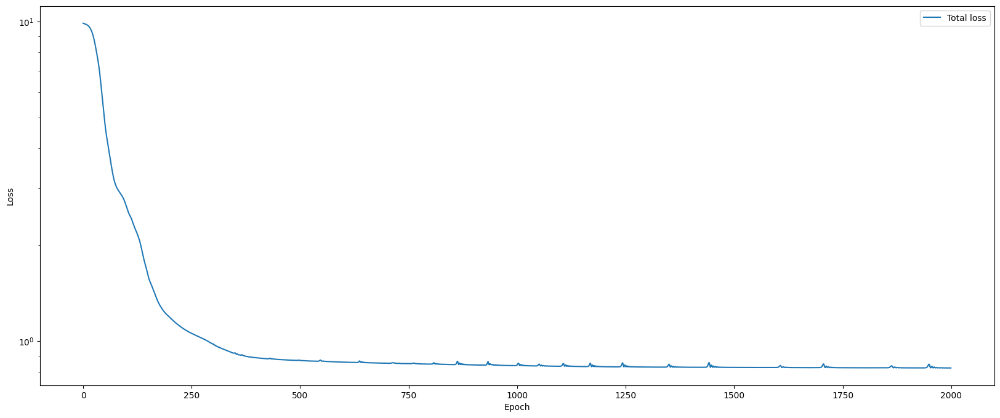

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(model_fe.loss_log, label='Total loss')
if fe_TrainTest == True:
  plt.plot(model_fe.loss_test_log, label='Total test loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Get trained params
opt_params_fe = model_fe.get_params(model_fe.opt_state)

In [ ]:
# Save model
if ExpansionType[:2] == 'MP':
  FolderName_fe_model = FolderName + 'K_fe_MP_INN_model/'
  if fe_INN_type == 'fe_INN':
    FileName_fe_model = 'fe_params_'
  elif fe_INN_type == 'fe_gradB_INN':
    FileName_fe_model = 'fe2B_params_'
  elif fe_INN_type == 'fe_gradC_INN':
    FileName_fe_model = 'fe2C_params_'
  elif fe_INN_type == 'fe_lap_INN':
    FileName_fe_model = 'fe2L_params_'
  elif fe_INN_type == 'fe_gradB_lap_INN':
    FileName_fe_model = 'fe3BL_params_'
  elif fe_INN_type == 'fe_gradC_lap_INN':
    FileName_fe_model = 'fe3CL_params_'
  else:
    print("Wrong fe_INN_type!")
    exit()

  if K_INN_type == 'K1_MP_INN':
    FileName_fe_model = FileName_fe_model + 'K_pred'
  elif K_INN_type == 'K14_MP_INN':
    FileName_fe_model = FileName_fe_model + 'K14_pred'
  else:
    print("Wrong K_INN_type!")
    exit()

else:
  print("Wrong ExpansionType!")
  exit()


FileName_fe_model = FileName_fe_model + '.pkl'

Path(os.path.join(FolderName)).mkdir(parents = True, exist_ok = True)
pickle.dump(opt_params_fe , open(FolderName_fe_model + FileName_fe_model, 'wb'))

## Load Training Model

In [ ]:
# Load model
if ExpansionType[:2] == 'MP':
  FolderName_fe_model = FolderName + 'K_fe_MP_INN_model/'
  if fe_INN_type == 'fe_INN':
    FileName_fe_model = 'fe_params_'
  elif fe_INN_type == 'fe_gradB_INN':
    FileName_fe_model = 'fe2B_params_'
  elif fe_INN_type == 'fe_gradC_INN':
    FileName_fe_model = 'fe2C_params_'
  elif fe_INN_type == 'fe_lap_INN':
    FileName_fe_model = 'fe2L_params_'
  elif fe_INN_type == 'fe_gradB_lap_INN':
    FileName_fe_model = 'fe3BL_params_'
  elif fe_INN_type == 'fe_gradC_lap_INN':
    FileName_fe_model = 'fe3CL_params_'
  else:
    print("Wrong fe_INN_type!")
    exit()

  if K_INN_type == 'K1_MP_INN':
    FileName_fe_model = FileName_fe_model + 'K_pred'
  elif K_INN_type == 'K14_MP_INN':
    FileName_fe_model = FileName_fe_model + 'K14_pred'
  else:
    print("Wrong K_INN_type!")
    exit()

else:
  print("Wrong ExpansionType!")
  exit()

FileName_fe_model = FileName_fe_model + '.pkl'

print(FolderName_fe_model + FileName_fe_model)


opt_params_fe = pickle.load(open(FolderName_fe_model + FileName_fe_model , 'rb'))
model_fe.params = opt_params_fe

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230706_Nb2e3_G25_28c_JL0.9_L200_400R25_1_10h001_1dt40_Eq50_E2JLrm/K_fe_MP_INN_model/fe_params_K14_pred.pkl


## Predictions

In [ ]:
# set reference point for calibrating non-unique fe
rho_ref=0.5

print(grad(fe_Arr_ana_func,0)(rho_ref,Jo,L,Co))

-0.9


In [ ]:
rho_fe_test = np.linspace(0.01,0.99,100)
print('Shape of rho_fe_test:', rho_fe_test.shape)

if fe_INN_type == 'fe_INN' or fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gracC_INN':
  drho_fe_test_min = drho_1_all_K.min()
  drho_fe_test_max = drho_1_all_K.max()

  drho_fe_test = np.linspace(drho_fe_test_min,drho_fe_test_max,200)
  print('Shape of drho_fe_test:', drho_fe_test.shape)

if fe_INN_type == 'fe_lap_INN':
  d2rho_fe_test_min = lap_rho_all_fe.min()
  d2rho_fe_test_max = lap_rho_all_fe.max()

  d2rho_fe_test = np.linspace(d2rho_fe_test_min,d2rho_fe_test_max,200)
  print('Shape of d2rho_fe_test:', d2rho_fe_test.shape)


# set reference point for calibrating non-unique fe
rho_ref_fe = 0.5  # set fe = 0 @ rho = rho_ref_fe (and grad rho = 0 if exists)
rho_ref_Q = 0.5   # set Q = 0 @ rho = rho_ref_Q (and grad rho = 0 if exists)

if fe_INN_type == 'fe_INN':
  fe_pred_test = vmap(model_fe.predict_fe, in_axes=(None,0))(opt_params_fe,rho_fe_test) \
          - model_fe.predict_fe(opt_params_fe, rho_ref_fe) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q) * ( rho_fe_test - rho_ref_fe )
  fe_ana_test = vmap(fe_Arr_ana_func, in_axes=(0,None,None,None))(rho_fe_test,Jo,L,Co) \
          - fe_Arr_ana_func(rho_ref_fe,Jo,L,Co) \
          - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) * ( rho_fe_test - rho_ref_fe )

  Q_pred_test = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0))(opt_params_fe,rho_fe_test) - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q)
  Q_ana_test = vmap(grad(fe_Arr_ana_func,0), in_axes=(0,None,None,None))(rho_fe_test,Jo,L,Co) - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co)

  Q_error = np.linalg.norm(Q_ana_test - Q_pred_test, 2) / np.linalg.norm(Q_ana_test, 2)

elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':
  rho_meshgrid_fe, drho_meshgrid_fe = np.meshgrid(rho_fe_test, drho_fe_test)
  print('Shape of rho_meshgrid_fe:', rho_meshgrid_fe.shape)

  fe_pred_test = vmap(vmap(model_fe.predict_fe, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_meshgrid_fe, drho_meshgrid_fe) \
          - model_fe.predict_fe(opt_params_fe, rho_ref_fe, 0) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q, 0.0) * ( rho_fe_test - rho_ref_fe ) \
          - vmap(vmap(grad(model_fe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_fe, rho_meshgrid_fe, 0.0) \
           * ( drho_meshgrid_fe - 0.0 )
  fe_ana_test = vmap(vmap(fe_Arr_ana_func, in_axes=(0,None,None,None)), in_axes=(0,None,None,None))(rho_meshgrid_fe,Jo,L,Co) \
          - fe_Arr_ana_func(rho_ref_fe,Jo,L,Co) \
          - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) * ( rho_fe_test - rho_ref_fe )

  dfedrho_pred_test = vmap(vmap(grad(model_fe.predict_fe,1), in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_meshgrid_fe, drho_meshgrid_fe) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q, 0) \
          - vmap(vmap(grad(grad(model_fe.predict_fe, 2), 1), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_fe, rho_meshgrid_fe, 0.0) \
          * ( drho_meshgrid_fe - 0.0 )
  dfeddrho_pred_test = vmap(vmap(grad(model_fe.predict_fe,2), in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_meshgrid_fe, drho_meshgrid_fe) \
          - vmap(vmap(grad(model_fe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_fe, rho_meshgrid_fe, 0.0)
  Q_ana_test = vmap(vmap(grad(fe_Arr_ana_func, 0), in_axes=(0,None,None,None)), in_axes=(0,None,None,None))(rho_meshgrid_fe,Jo,L,Co) \
          - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co)

elif fe_INN_type == 'fe_lap_INN':
  rho_meshgrid_fe, d2rho_meshgrid_fe = np.meshgrid(rho_fe_test, d2rho_fe_test)
  print('Shape of rho_meshgrid_fe:', rho_meshgrid_fe.shape)
  Lx_train = 1.0 / Nbin

  fe_pred_test = vmap(vmap(model_fe.predict_fe, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_meshgrid_fe, d2rho_meshgrid_fe) \
          - model_fe.predict_fe(opt_params_fe, rho_ref_fe, 0) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q, 0.0) * ( rho_fe_test - rho_ref_fe ) \
          - grad(model_fe.predict_fe, 2)(opt_params_fe, rho_ref_Q, 0.0) * ( d2rho_meshgrid_fe - 0.0 )
  fe_ana_test = vmap(vmap(fe_Arr_ana_2nd_func, in_axes=(0,0,None,None,None)), in_axes=(0,0,None,None,None))(rho_meshgrid_fe,d2rho_meshgrid_fe,Jo*L,Lx_train,Co) \
          - fe_Arr_ana_2nd_func(rho_ref_fe,0.0,Jo*L,Lx_train,Co) \
          - grad(fe_Arr_ana_2nd_func, 0)(rho_ref_Q,0.0,Jo*L,Lx_train,Co) * ( rho_fe_test - rho_ref_fe ) \
          - grad(fe_Arr_ana_2nd_func, 1)(rho_ref_Q,0.0,Jo*L,Lx_train,Co) * ( d2rho_meshgrid_fe - 0.0 )

  dfedrho_pred_test = vmap(vmap(grad(model_fe.predict_fe,1), in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_meshgrid_fe, d2rho_meshgrid_fe) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q, 0) \
          # - vmap(vmap(grad(grad(model_fe.predict_fe, 2), 1), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_fe, rho_meshgrid_fe, 0.0) \
          # * ( drho_meshgrid_fe - 0.0 )
  dfedrho_ana_test = vmap(vmap(grad(fe_Arr_ana_2nd_func,0), in_axes=(0,0,None,None,None)), in_axes=(0,0,None,None,None))\
          (rho_meshgrid_fe,d2rho_meshgrid_fe,Jo*L,Lx_train,Co) \
          - grad(fe_Arr_ana_2nd_func, 0)(rho_ref_Q,0.0,Jo*L,Lx_train,Co) \
          # - vmap(vmap(grad(grad(model_fe.predict_fe, 2), 1), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_fe, rho_meshgrid_fe, 0.0) \
          # * ( drho_meshgrid_fe - 0.0 )

  dfedd2rho_pred_test = vmap(vmap(grad(model_fe.predict_fe,2), in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_meshgrid_fe, d2rho_meshgrid_fe) \
          - grad(model_fe.predict_fe, 2)(opt_params_fe, rho_ref_Q, 0.0)
  dfedd2rho_ana_test = vmap(vmap(grad(fe_Arr_ana_2nd_func, 1), in_axes=(0,0,None,None,None)), in_axes=(0,0,None,None,None))\
          (rho_meshgrid_fe,d2rho_meshgrid_fe,Jo*L,Lx_train,Co) \
          - grad(fe_Arr_ana_2nd_func, 1)(rho_ref_Q,0.0,Jo*L,Lx_train,Co)

  # Q_ana_test = vmap(vmap(grad(fe_Arr_ana_func, 0), in_axes=(0,None,None,None)), in_axes=(0,None,None,None))(rho_meshgrid_fe,Jo,L,Co) \
          # - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co)
else:
  print("Wrong fe_INN_type!")
  exit()


if fe_INN_type[-7:] == 'lap_INN':
  fe_ana_train = vmap(fe_Arr_ana_2nd_func, in_axes=(0,0,None,None,None))(rho_train_fe,lap_rho_train_fe, Jo*L, Lx_train, Co) \
            - fe_Arr_ana_2nd_func(rho_ref_fe,0.0, Jo*L, Lx_train, Co) \
            - grad(fe_Arr_ana_2nd_func, 0)(rho_ref_Q,0.0, Jo*L,Lx_train,Co) * ( rho_train_fe - rho_ref_fe ) # fe_ana on training dataset

else:
  fe_ana_train = vmap(fe_Arr_ana_func, in_axes=(0,None,None,None))(rho_train_fe,Jo,L,Co) - fe_Arr_ana_func(rho_ref_fe,Jo,L,Co) \
            - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) * ( rho_train_fe - rho_ref_fe ) # fe_ana on training dataset
  Q_ana_train = vmap(grad(fe_Arr_ana_func,0), in_axes=(0,None,None,None))(rho_train_fe,Jo,L,Co) - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) # Q_ana on training dataset



print('Shape of fe_pred_test:', fe_pred_test.shape)
# print('Shape of Q_pred_test:', Q_pred_test.shape)
print('Shape of Q_ana_test:', Q_ana_test.shape)
print('Shape of fe_ana_train:', fe_ana_train.shape)


fe_error = np.linalg.norm(fe_ana_test - fe_pred_test, 2) / np.linalg.norm(fe_ana_test, 2)
print('fe_error =', fe_error)
# print('Q_error =', Q_error)

Shape of rho_fe_test: (100,)
Shape of drho_fe_test: (200,)
Shape of fe_pred_test: (100,)
Shape of Q_ana_test: (100,)
Shape of fe_ana_train: (700,)
fe_error = 0.12067911


<Figure size 640x480 with 0 Axes>

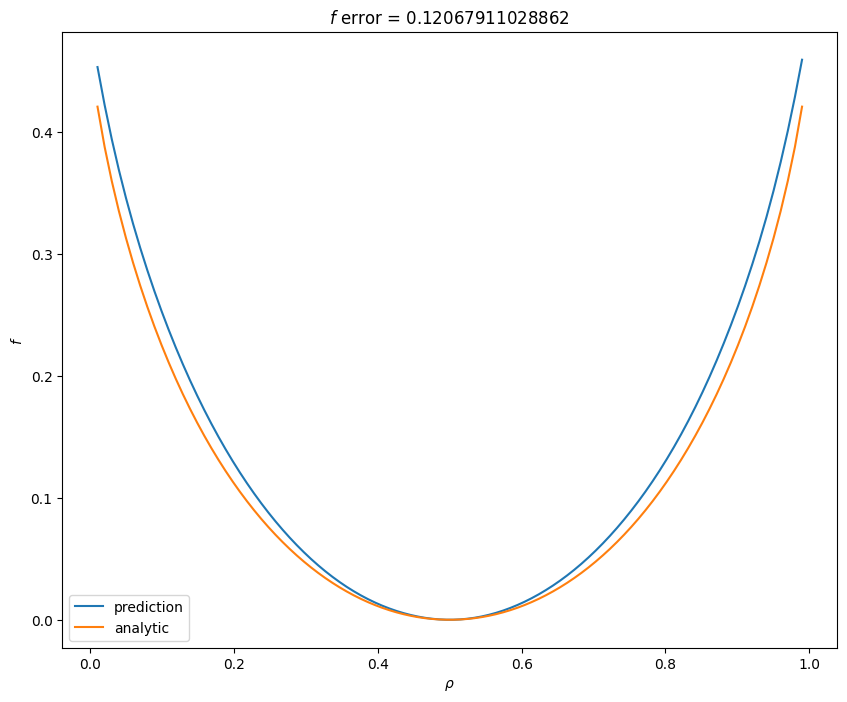

<Figure size 640x480 with 0 Axes>

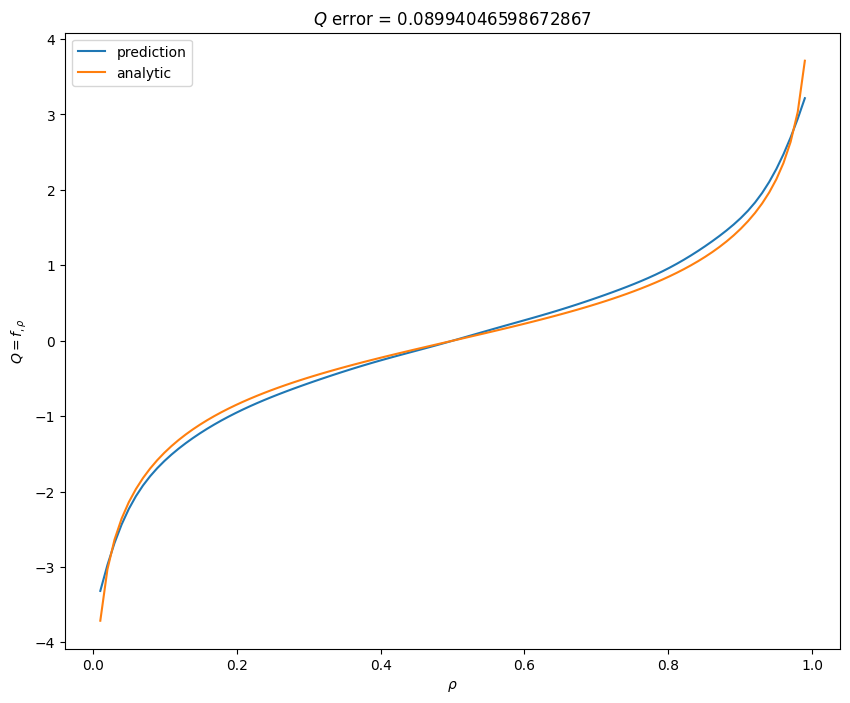

<Figure size 640x480 with 0 Axes>

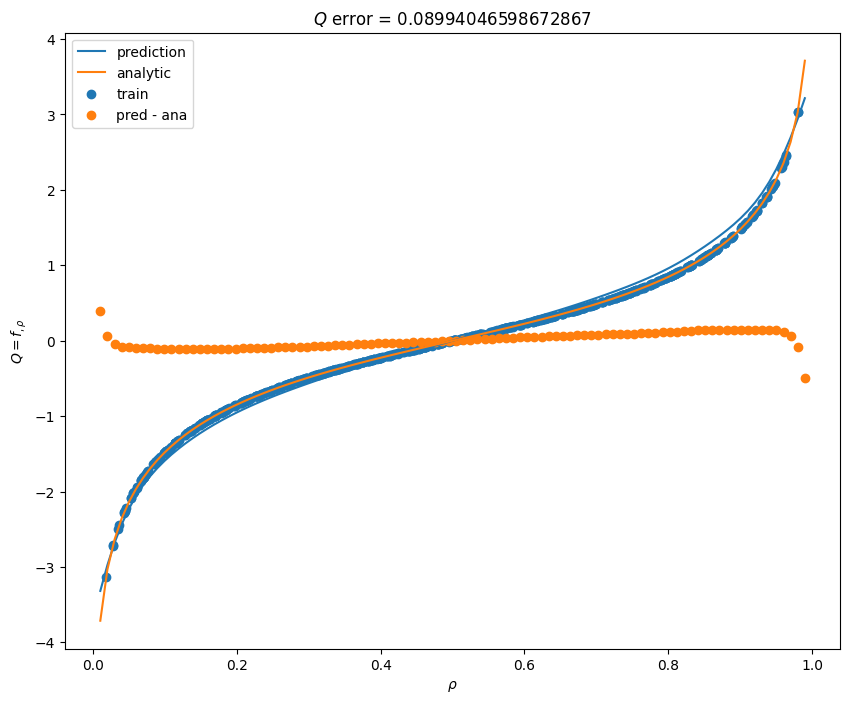

<Figure size 640x480 with 0 Axes>

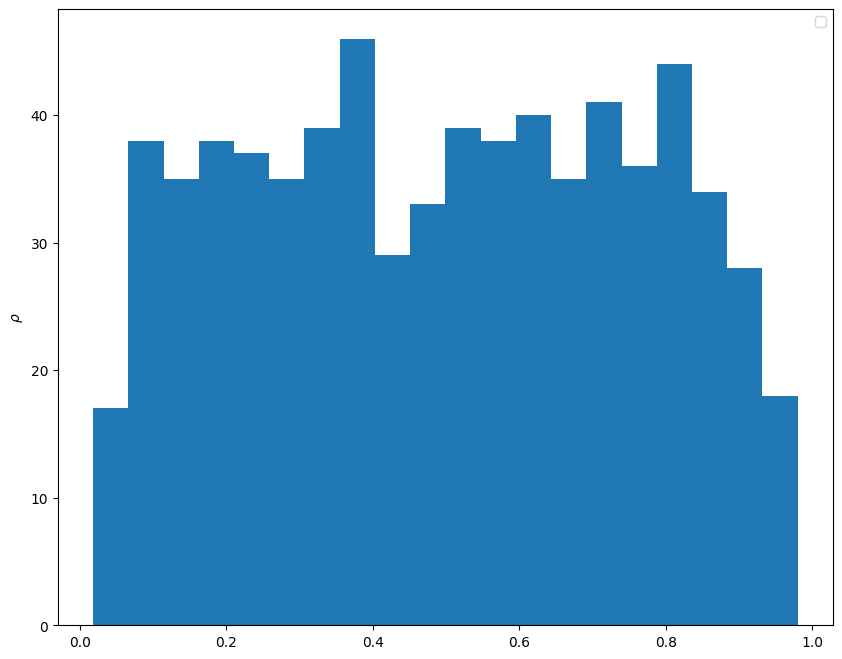

<Figure size 640x480 with 0 Axes>

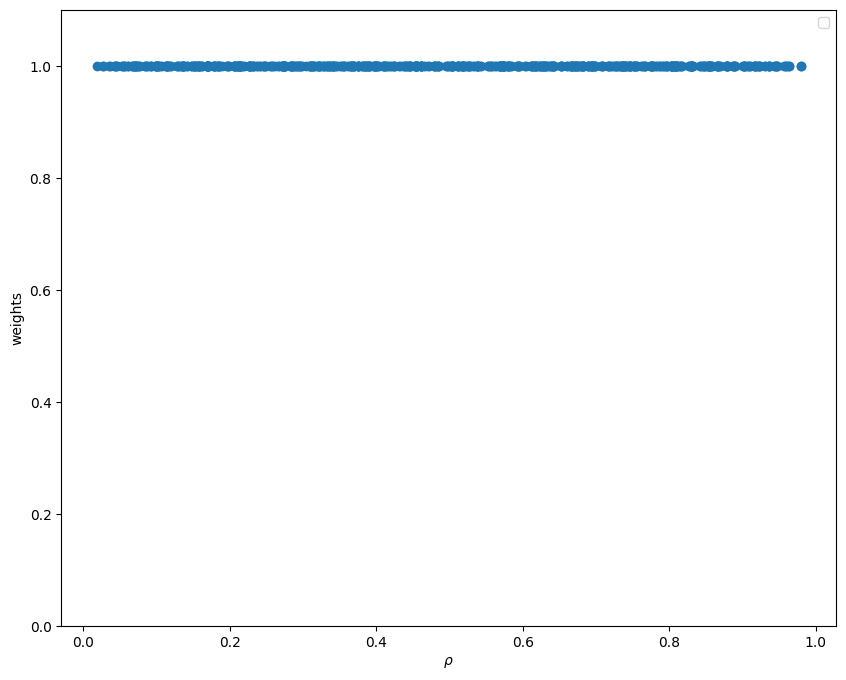

In [ ]:
if fe_INN_type == 'fe_INN':
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(rho_fe_test, fe_pred_test, label='prediction')
  plt.plot(rho_fe_test, fe_ana_test, label='analytic')
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(rho_fe_test, Q_pred_test, label='prediction')
  plt.plot(rho_fe_test, Q_ana_test, label='analytic')
  # plt.scatter(rho_train_fe, Q_ana_train, label='train', facecolors='none', edgecolors='r')
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'$Q=f_{,\rho}$')
  plt.title(r'$Q$ error = {}'.format(Q_error))
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(rho_fe_test, Q_pred_test, label='prediction')
  plt.plot(rho_fe_test, Q_ana_test, label='analytic')
  plt.scatter(rho_train_fe, Q_ana_train, label='train')
  plt.scatter(rho_fe_test, Q_pred_test - Q_ana_test, label='pred - ana')
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'$Q=f_{,\rho}$')
  plt.title(r'$Q$ error = {}'.format(Q_error))
  plt.legend()
  plt.show()

  if fe_DataWeights > 1:
    temp_bins = fe_DataWeights
  else:
    temp_bins = 20

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.hist(rho_train_fe, bins = temp_bins)
  plt.ylabel(r'$\rho$')
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(rho_train_fe, model_fe.weights)
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'weights')
  # plt.title(r'$Q$ error = {}'.format(Q_error))
  plt.ylim([0, 1.1 * model_fe.weights.max()])
  plt.legend()
  plt.show()

elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, fe_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, fe_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, fe_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, fe_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, fe_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, fe_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, dfedrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, Q_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$df/d\rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, dfedrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, Q_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$df/d\rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()



  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, dfeddrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, 0.*Q_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, 0.*Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$df/d \nabla \rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, dfeddrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, 0.*Q_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, 0.*Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$df/d \nabla \rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, dfeddrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, drho_meshgrid_fe, 0.*Q_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, grad_rho_train_fe, 0.*Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$df/d \nabla \rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

elif fe_INN_type == 'fe_lap_INN':
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, fe_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, fe_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, fe_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, fe_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, fe_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, fe_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$f$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedrho_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$df/d\rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedrho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedrho_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$df/d\rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()



  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedd2rho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedd2rho_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, 0.*Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$df/d \nabla^2 \rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedd2rho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedd2rho_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, 0.*Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$df/d \nabla^2 \rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedd2rho_pred_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Predicted')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_meshgrid_fe, d2rho_meshgrid_fe, dfedd2rho_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Analytic')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.scatter(rho_train_fe, lap_rho_train_fe, 0.*Q_ana_train, alpha=0.5, label = 'training data')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2{\rho}$')
  ax.set_zlabel(r'$df/d \nabla^2 \rho$')
  plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

In [ ]:
if fe_INN_type == 'fe_INN':

  Q_ana = vmap(grad(fe_Arr_ana_func, 0), in_axes=(0,None,None,None))(rho_train_fe, Jo,L,Co) - grad(fe_Arr_ana_func, 0)(rho_ref, Jo,L,Co)
  Q_ana_left = vmap(grad(fe_Arr_ana_func, 0), in_axes=(0,None,None,None))(rho_left_train_fe, Jo,L,Co) - grad(fe_Arr_ana_func, 0)(rho_ref, Jo,L,Co)
  Q_ana_right = vmap(grad(fe_Arr_ana_func, 0), in_axes=(0,None,None,None))(rho_right_train_fe, Jo,L,Co) - grad(fe_Arr_ana_func, 0)(rho_ref, Jo,L,Co)

  # print(Q_ana)
  # print(Q_ana_left)

In [ ]:
# if fe_INN_type == 'fe_INN':

M_DrhoDt_train = vmap(model_fe.evol_eqt, in_axes=(0,0,0, None,None,None, None,None,None))\
        (model_fe.DrhoDt_left, model_fe.DrhoDt, model_fe.DrhoDt_right, \
        0, 0, 0, 0, 0, 0)

print(np.mean(M_DrhoDt_train ** 2))

0.08765073


In [ ]:
Q_pred_check = 0

if fe_INN_type == 'fe_INN':
  Q_pred_train = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0))(opt_params_fe,rho_train_fe) - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref)
  Q_pred_left_train = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0))(opt_params_fe,rho_left_train_fe) - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref)
  Q_pred_right_train = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0))(opt_params_fe,rho_right_train_fe) - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref)

  Q_pred_check = 1

elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':
  # Calculations for Q are incorrect!!!!

  Q_pred_train = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0,0))(opt_params_fe, rho_train_fe, grad_rho_train_fe) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref, 0) \
          - vmap(grad(grad(model_fe.predict_fe, 2), 1), in_axes=(None,0,None))(opt_params_fe, rho_train_fe, 0.0) \
          * ( grad_rho_train_fe - 0.0 )
  Q_pred_left_train = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0,0))(opt_params_fe, rho_left_train_fe, grad_rho_left_train_fe) \
            - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref, 0) \
            - vmap(grad(grad(model_fe.predict_fe, 2), 1), in_axes=(None,0,None))(opt_params_fe, rho_left_train_fe, 0.0) \
            * ( grad_rho_left_train_fe - 0.0 )
  Q_pred_right_train = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0,0))(opt_params_fe, rho_right_train_fe, grad_rho_right_train_fe) \
            - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref, 0) \
            - vmap(grad(grad(model_fe.predict_fe, 2), 1), in_axes=(None,0,None))(opt_params_fe, rho_right_train_fe, 0.0) \
            * ( grad_rho_right_train_fe - 0.0 )

  Q_pred_check = 1

if Q_pred_check == 1:

  K_Q_pred_train = vmap(model_fe.evol_eqt, in_axes=(None,None,None, 0,0,0, 0,0,0))\
          (0, 0, 0, \
          K_left_train_fe, K_0_train_fe, K_right_train_fe, Q_pred_left_train, Q_pred_train, Q_pred_right_train)

  evol_eqt_pred_train = vmap(model_fe.evol_eqt, in_axes=(0,0,0, 0,0,0, 0,0,0))\
          (model_fe.DrhoDt_left, model_fe.DrhoDt, model_fe.DrhoDt_right, \
          K_left_train_fe, K_0_train_fe, K_right_train_fe, Q_pred_left_train, Q_pred_train, Q_pred_right_train)

  # print(K_Q_pred_train)
  # print(evol_eqt_pred_train)

  print(np.mean(K_Q_pred_train ** 2))
  print(np.mean(evol_eqt_pred_train ** 2))

0.076606005
0.010490479


<Figure size 640x480 with 0 Axes>

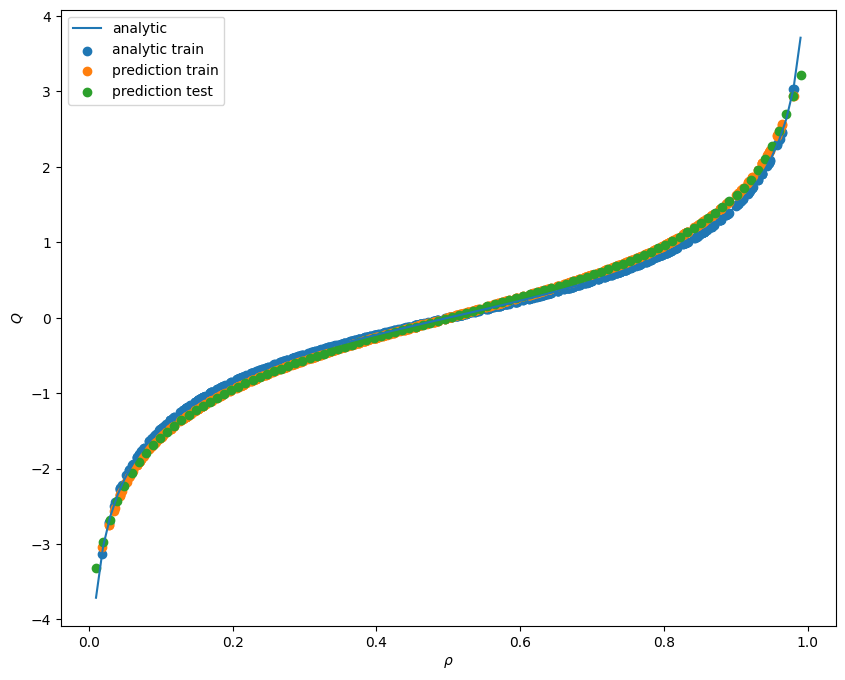

In [ ]:
if fe_INN_type == 'fe_INN':
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(rho_fe_test, Q_ana_test, label='analytic')
  plt.scatter(rho_train_fe, Q_ana, label='analytic train')
  plt.scatter(rho_train_fe, Q_pred_train, label='prediction train')
  plt.scatter(rho_fe_test, Q_pred_test, label='prediction test')
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'$Q$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

<Figure size 640x480 with 0 Axes>

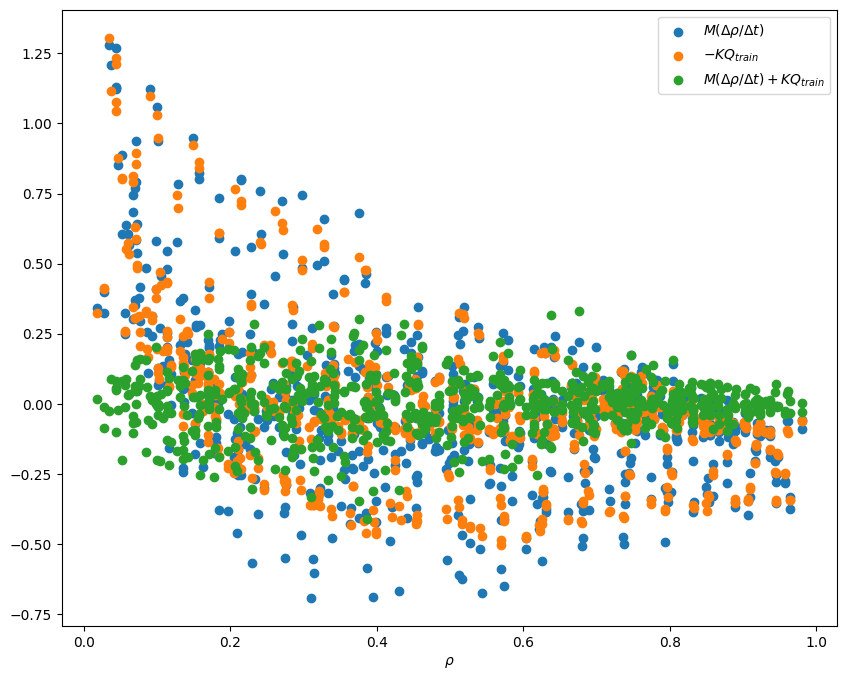

<Figure size 640x480 with 0 Axes>

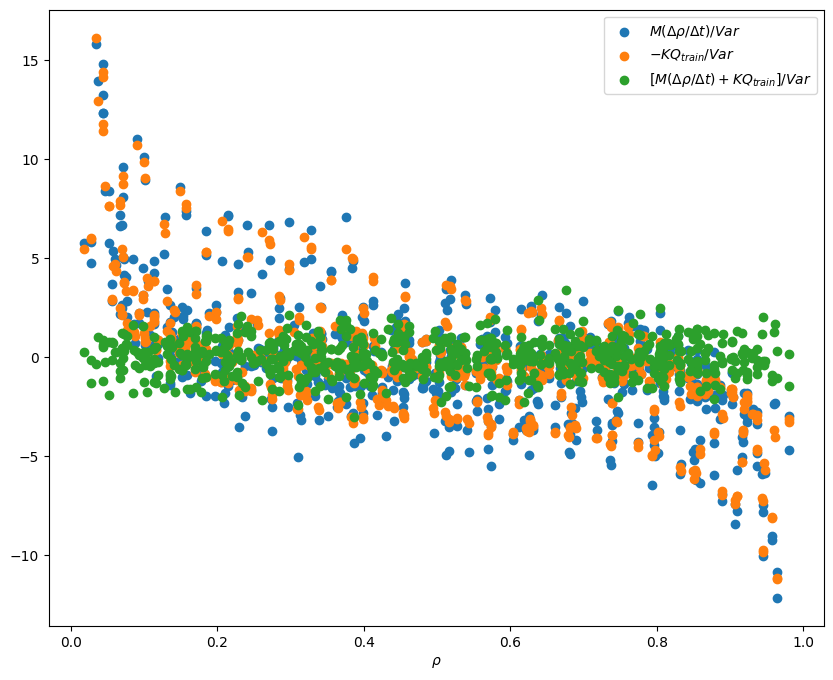

<Figure size 640x480 with 0 Axes>

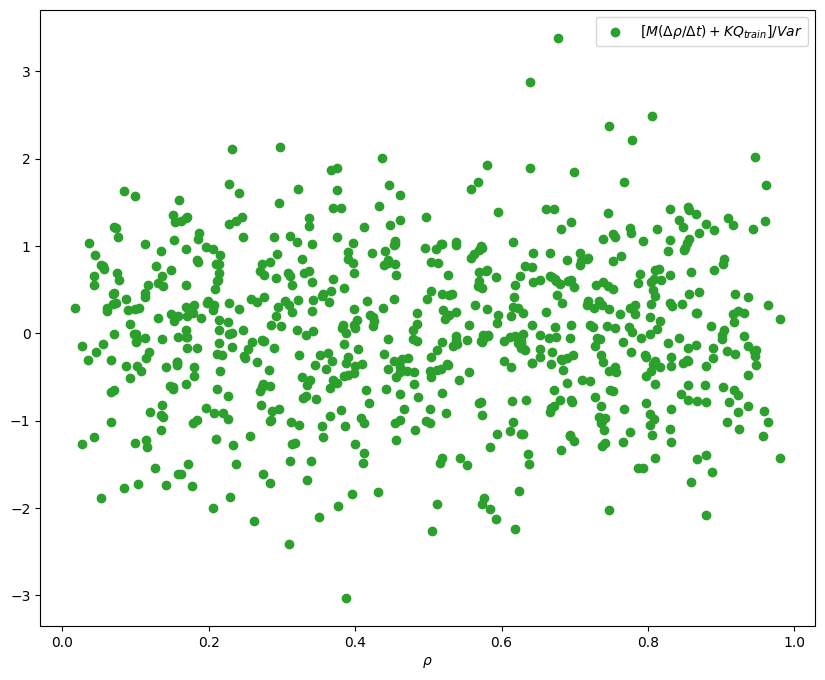

In [ ]:
if fe_INN_type == 'fe_INN':
  # plt.figure()
  # fig = plt.figure(figsize=(10,8))
  # plt.scatter(rho_train_fe, M_DrhoDt_train, label=r'$M(\Delta \rho/\Delta t)$')
  # plt.scatter(rho_train_fe, -K_Q_ana_train, label=r'$-KQ_{ana}$')
  # plt.scatter(rho_train_fe, evol_eqt_ana_train, label=r'$M(\Delta \rho/\Delta t) + KQ_{ana}$')
  # plt.xlabel(r'$\rho$')
  # # plt.ylabel(r'$f$')
  # # plt.title(r'$f$ error = {}'.format(fe_error))
  # plt.legend()
  # plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(rho_train_fe, M_DrhoDt_train, label=r'$M(\Delta \rho/\Delta t)$')
  plt.scatter(rho_train_fe, -K_Q_pred_train, label=r'$-KQ_{train}$')
  plt.scatter(rho_train_fe, evol_eqt_pred_train, label=r'$M(\Delta \rho/\Delta t) + KQ_{train}$')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(rho_train_fe, M_DrhoDt_train / np.sqrt(var_eq_all_fe), label=r'$M(\Delta \rho/\Delta t) / Var$')
  plt.scatter(rho_train_fe, -K_Q_pred_train / np.sqrt(var_eq_all_fe), label=r'$-KQ_{train} / Var$')
  plt.scatter(rho_train_fe, evol_eqt_pred_train / np.sqrt(var_eq_all_fe), label=r'$[M(\Delta \rho/\Delta t) + KQ_{train}] / Var$')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  # plt.scatter(rho_train_fe, M_DrhoDt_train / np.sqrt(var_eq_all_fe), label=r'$M(\Delta \rho/\Delta t) / Var$')
  # plt.scatter(rho_train_fe, -K_Q_pred_train / np.sqrt(var_eq_all_fe), label=r'$-KQ_{train} / Var$')
  plt.scatter(rho_train_fe, evol_eqt_pred_train / np.sqrt(var_eq_all_fe), label=r'$[M(\Delta \rho/\Delta t) + KQ_{train}] / Var$', color='#2ca02c')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  # plt.ylim([-3000,3000])
  plt.legend()
  plt.show()


<Figure size 640x480 with 0 Axes>

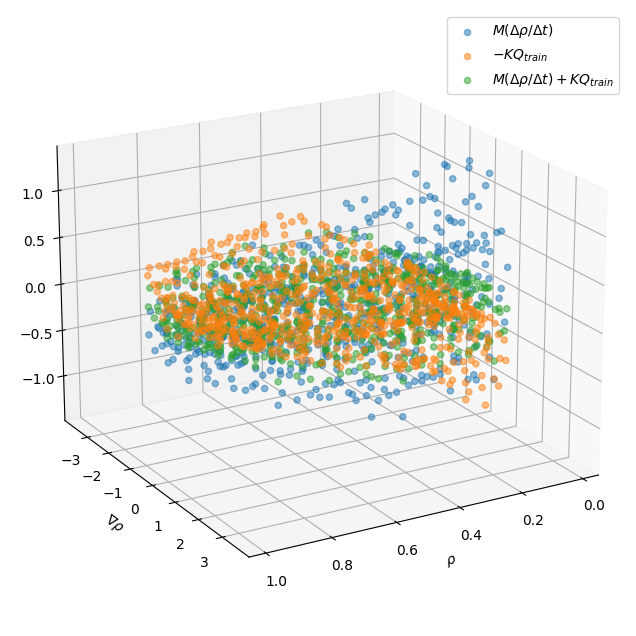

<Figure size 640x480 with 0 Axes>

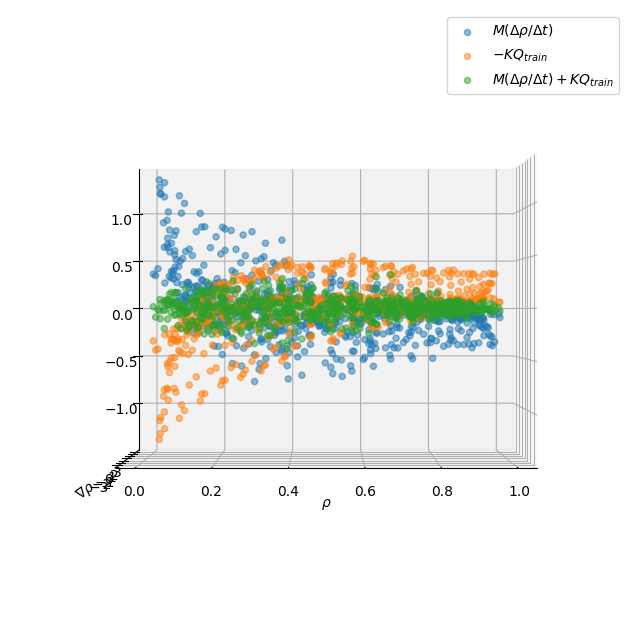

<Figure size 640x480 with 0 Axes>

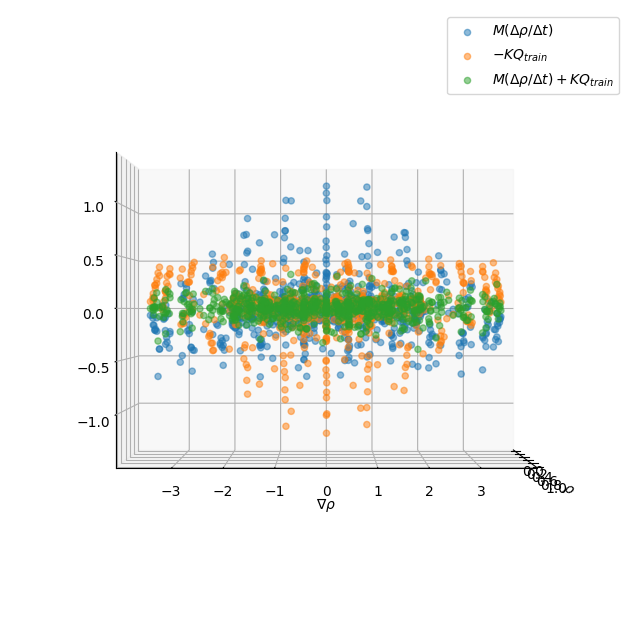

<Figure size 640x480 with 0 Axes>

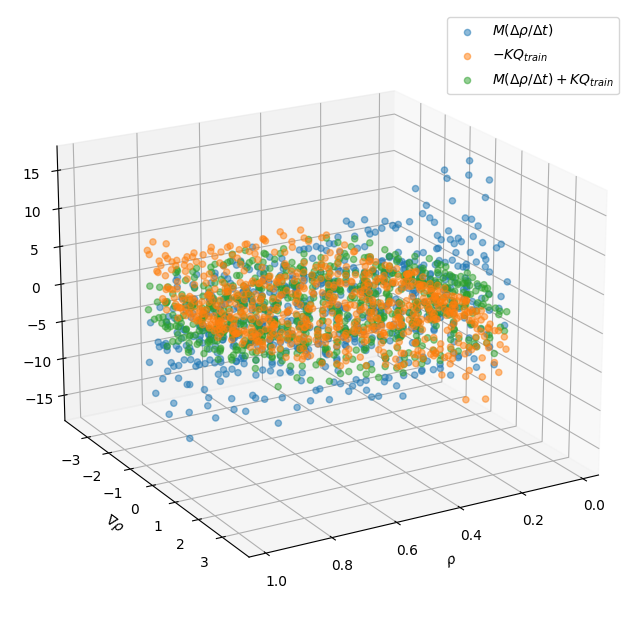

<Figure size 640x480 with 0 Axes>

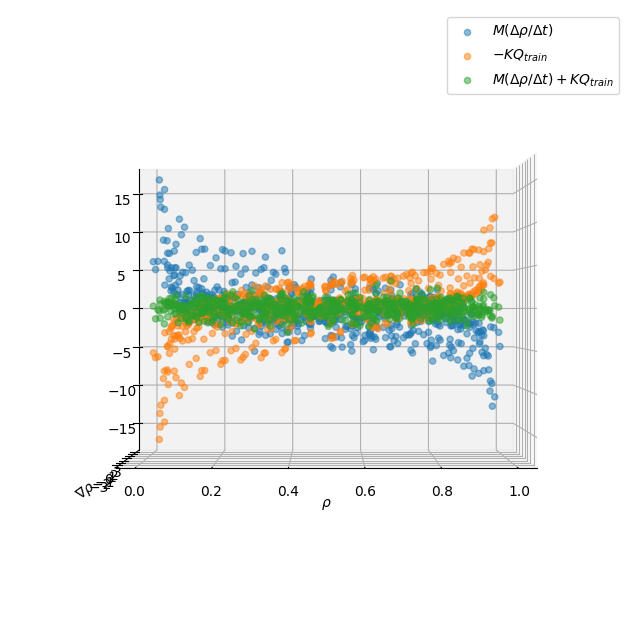

<Figure size 640x480 with 0 Axes>

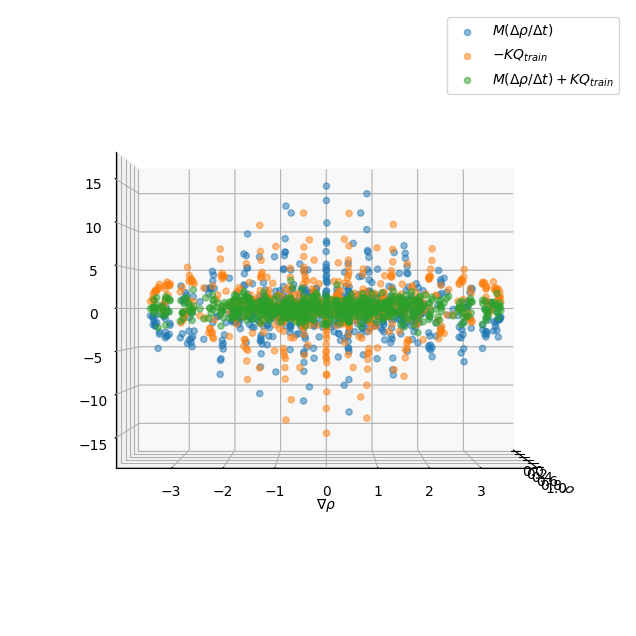

In [ ]:
if Q_pred_check == 1:
# if fe_INN_type == 'fe_INN':

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(20, 60)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, M_DrhoDt_train, alpha=0.5, label = r'$M(\Delta \rho/\Delta t)$')
  ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, K_Q_pred_train, alpha=0.5, label = r'$-KQ_{train}$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train, alpha=0.5, label = r'$M(\Delta \rho/\Delta t) + KQ_{train}$')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, -90)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, M_DrhoDt_train, alpha=0.5, label = r'$M(\Delta \rho/\Delta t)$')
  ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, K_Q_pred_train, alpha=0.5, label = r'$-KQ_{train}$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train, alpha=0.5, label = r'$M(\Delta \rho/\Delta t) + KQ_{train}$')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, M_DrhoDt_train, alpha=0.5, label = r'$M(\Delta \rho/\Delta t)$')
  ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, K_Q_pred_train, alpha=0.5, label = r'$-KQ_{train}$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train, alpha=0.5, label = r'$M(\Delta \rho/\Delta t) + KQ_{train}$')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(20, 60)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, M_DrhoDt_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$M(\Delta \rho/\Delta t)$')
  ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, K_Q_pred_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$-KQ_{train}$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$M(\Delta \rho/\Delta t) + KQ_{train}$', color='#2ca02c')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  # ax.axes.set_zlim3d([-1000,1000])
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, -90)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, M_DrhoDt_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$M(\Delta \rho/\Delta t)$')
  ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, K_Q_pred_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$-KQ_{train}$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$M(\Delta \rho/\Delta t) + KQ_{train}$', color='#2ca02c')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  # ax.axes.set_zlim3d([-1000,1000])
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, M_DrhoDt_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$M(\Delta \rho/\Delta t)$')
  ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, K_Q_pred_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$-KQ_{train}$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train / np.sqrt(var_eq_all_fe), alpha=0.5, label = r'$M(\Delta \rho/\Delta t) + KQ_{train}$', color='#2ca02c')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  # ax.axes.set_zlim3d([-1000,1000])
  plt.show()

In [ ]:
if Q_pred_check == 1:
  rho_VarMesh, Var_evol_eqt_pred_train_VarMesh = Var1D(rho_train_fe, evol_eqt_pred_train, num_bins=50)

100%|██████████| 50/50 [00:00<00:00, 204.70it/s]


<Figure size 640x480 with 0 Axes>

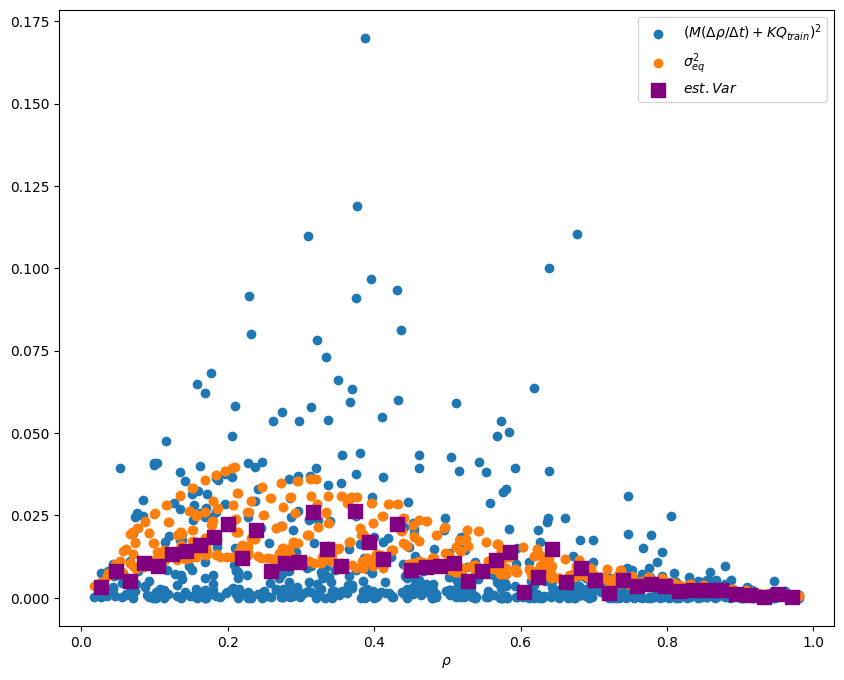

<Figure size 640x480 with 0 Axes>

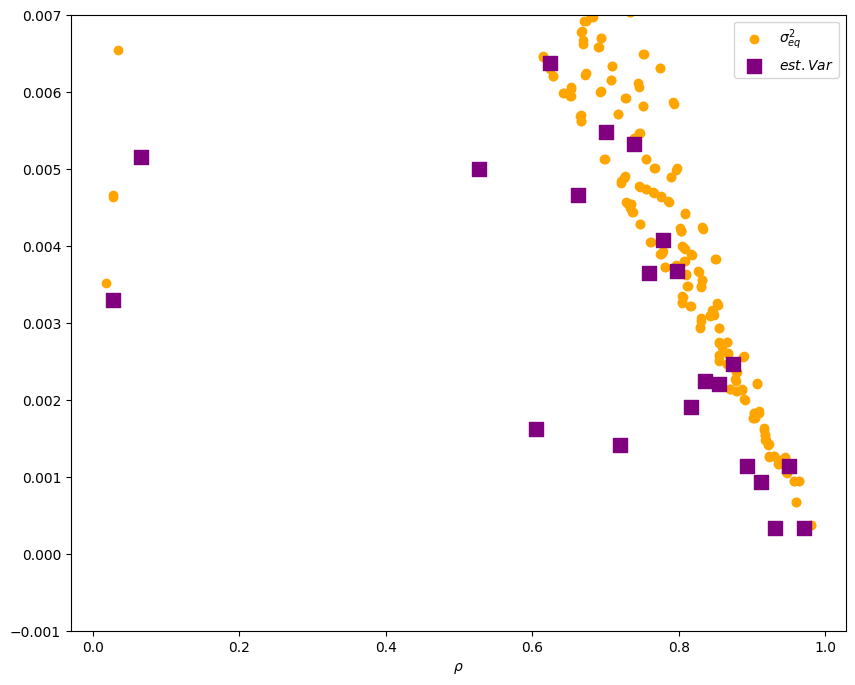

<Figure size 640x480 with 0 Axes>

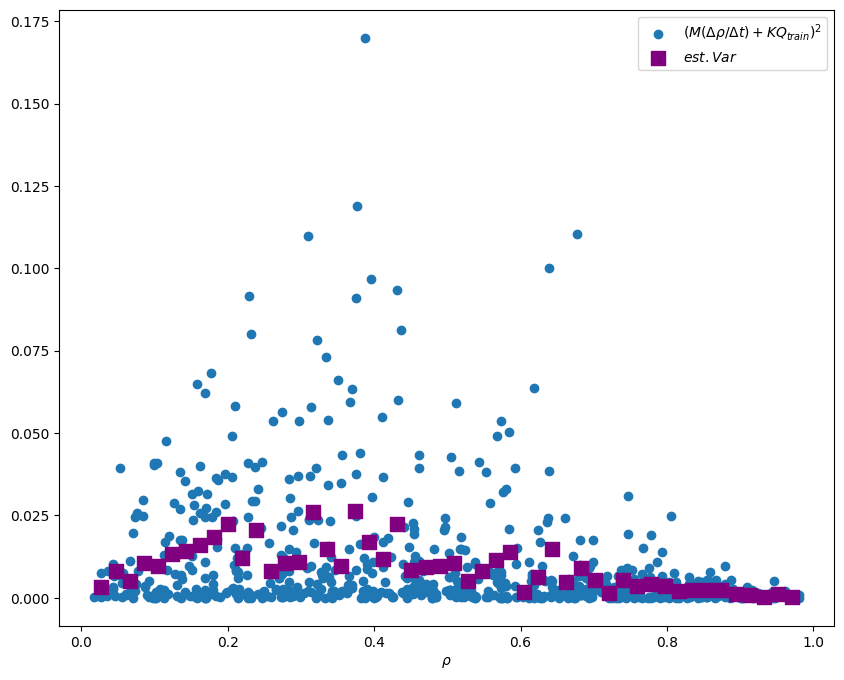

<Figure size 640x480 with 0 Axes>

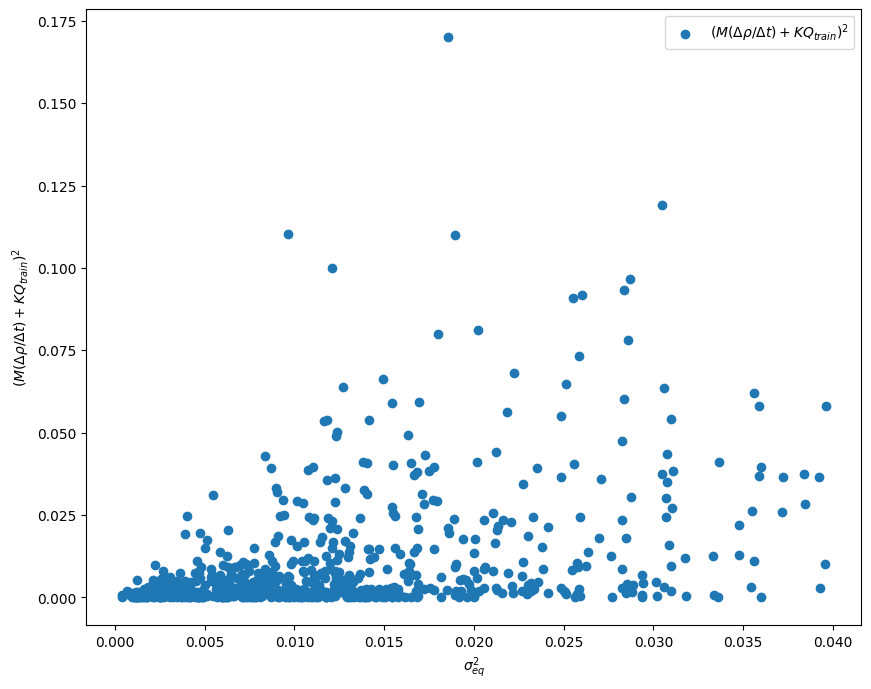

In [ ]:
if Q_pred_check == 1:
# if fe_INN_type == 'fe_INN':

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(rho_train_fe, evol_eqt_pred_train ** 2, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  plt.scatter(rho_train_fe, var_eq_train_fe, label=r'$\sigma_{eq}^2$')
  plt.scatter(rho_VarMesh, Var_evol_eqt_pred_train_VarMesh, label=r'$est. Var$', color = 'purple', s=100, marker='s')
  # plt.scatter(rho_train_fe, 2* K_0_train_fe * Delta_t, label=r'$2K_0 \Delta t$')
  # plt.scatter(rho_train_fe, K_0_train_fe/100, label=r'$K_0/100$')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  # plt.scatter(rho_train_fe, evol_eqt_pred_train ** 2, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  plt.scatter(rho_train_fe, var_eq_train_fe, color = 'orange', label=r'$\sigma_{eq}^2$')
  plt.scatter(rho_VarMesh, Var_evol_eqt_pred_train_VarMesh, label=r'$est. Var$', color = 'purple', s=100, marker='s')
  # plt.scatter(rho_train_fe, 2* K_0_train_fe * Delta_t, label=r'$2K_0 \Delta t$')
  # plt.scatter(rho_train_fe, K_0_train_fe/100, label=r'$K_0/100$')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.ylim([-0.001,0.007])
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(rho_train_fe, evol_eqt_pred_train ** 2, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  # plt.scatter(rho_train_fe, var_eq_train_fe, label=r'$\sigma_{eq}^2$')
  plt.scatter(rho_VarMesh, Var_evol_eqt_pred_train_VarMesh, label=r'$est. Var$', color = 'purple', s=100, marker='s')
  # plt.scatter(rho_train_fe, 2* K_0_train_fe * Delta_t, label=r'$2K_0 \Delta t$')
  # plt.scatter(rho_train_fe, K_0_train_fe/100, label=r'$K_0/100$')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(var_eq_train_fe, evol_eqt_pred_train ** 2, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  plt.xlabel(r'$\sigma_{eq}^2$')
  plt.ylabel(r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

<Figure size 640x480 with 0 Axes>

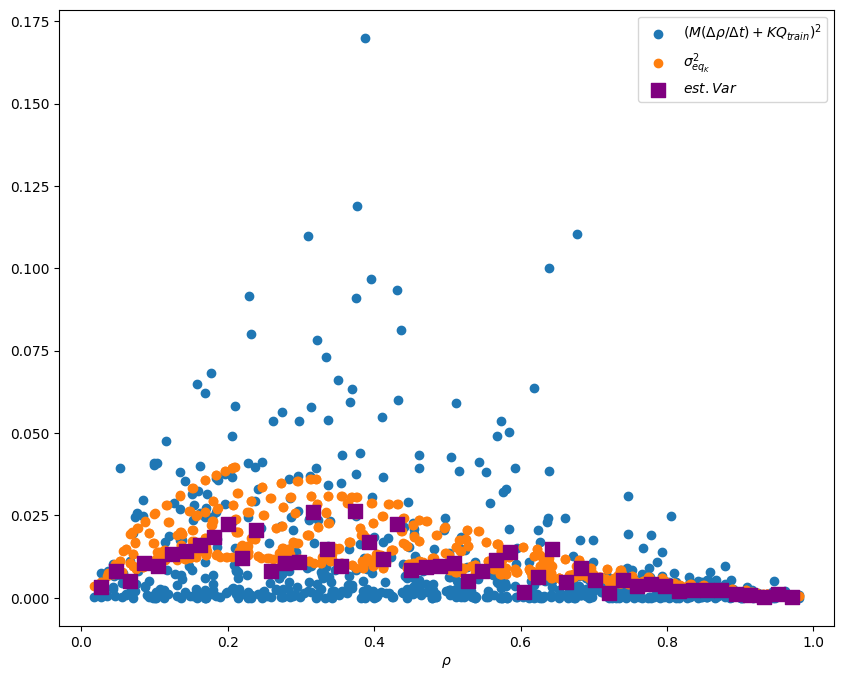

<Figure size 640x480 with 0 Axes>

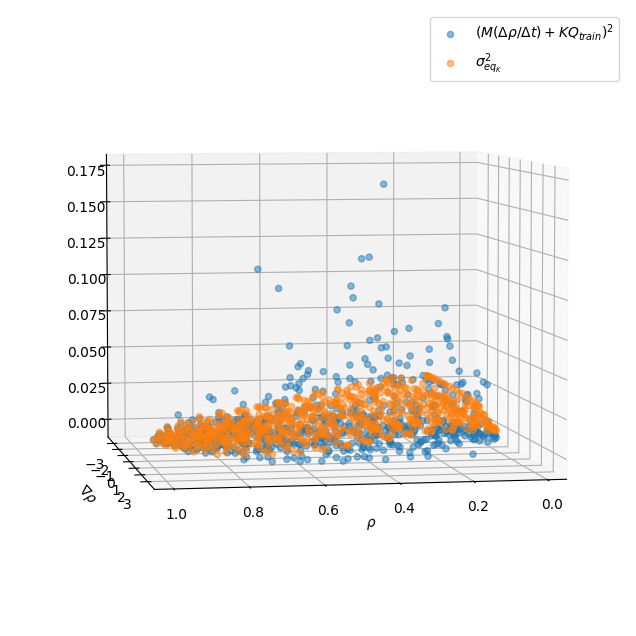

<Figure size 640x480 with 0 Axes>

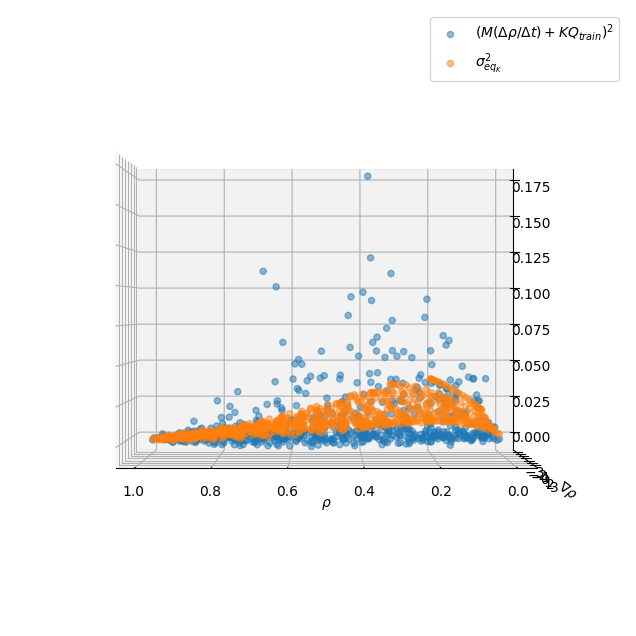

<Figure size 640x480 with 0 Axes>

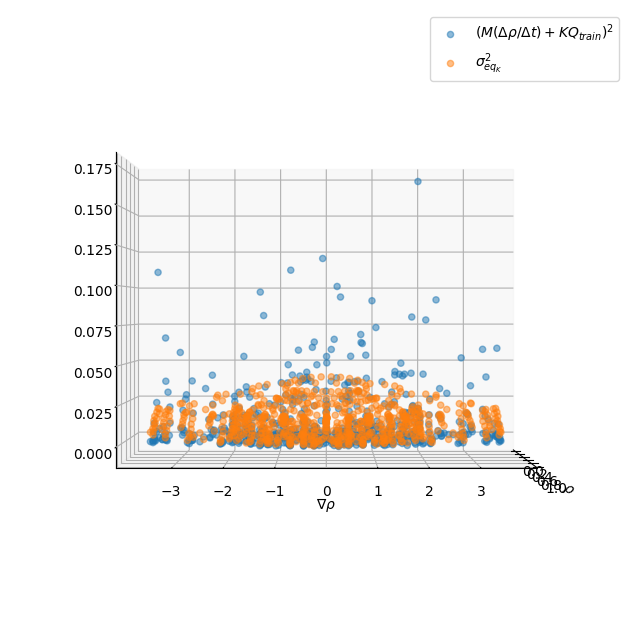

In [ ]:
if Q_pred_check == 1:
# if fe_INN_type == 'fe_INN':

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.scatter(rho_train_fe, evol_eqt_pred_train ** 2, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  if R4 > 1:
    plt.scatter(rho_train_fe, var_MDrhoDt_all_fe, label=r'$\sigma_{MDrhoDt}^2$')
  plt.scatter(rho_train_fe, var_eq_all_fe_KVar, label=r'$\sigma_{eq_K}^2$')
  plt.scatter(rho_VarMesh, Var_evol_eqt_pred_train_VarMesh, label=r'$est. Var$', color = 'purple', s=100, marker='s')
  # plt.scatter(rho_train_fe, 2* K_0_train_fe * Delta_t, label=r'$2K_0 \Delta t$')
  # plt.scatter(rho_train_fe, K_0_train_fe/100, label=r'$K_0/100$')
  plt.xlabel(r'$\rho$')
  # plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(5, 80)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train ** 2, alpha=0.5, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  if R4 > 1:
    ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, var_MDrhoDt_all_fe, alpha=0.5, label=r'$\sigma_{MDrhoDt}^2$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, var_eq_all_fe_KVar, alpha=0.5, label=r'$\sigma_{eq_K}^2$')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  # ax.axes.set_zlim3d([-1000,1000])
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train ** 2, alpha=0.5, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  if R4 > 1:
    ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, var_MDrhoDt_all_fe, alpha=0.5, label=r'$\sigma_{MDrhoDt}^2$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, var_eq_all_fe_KVar, alpha=0.5, label=r'$\sigma_{eq_K}^2$')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  # ax.axes.set_zlim3d([-1000,1000])
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.scatter(rho_train_fe, gradC_rho_all_fe, evol_eqt_pred_train ** 2, alpha=0.5, label=r'$(M(\Delta \rho/\Delta t) + KQ_{train})^2$')
  if R4 > 1:
    ax2 = ax.scatter(rho_train_fe, gradC_rho_all_fe, var_MDrhoDt_all_fe, alpha=0.5, label=r'$\sigma_{MDrhoDt}^2$')
  ax3 = ax.scatter(rho_train_fe, gradC_rho_all_fe, var_eq_all_fe_KVar, alpha=0.5, label=r'$\sigma_{eq_K}^2$')
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  # ax.axes.set_zlim3d([-1000,1000])
  plt.show()


## Output library data for fe and dfe

In [ ]:
if fe_INN_type == 'fe_INN':
  Num_fe_lib = 10000

  rho_fe_lib = onp.linspace(0.01,0.99,Num_fe_lib)

elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':
  Num_fe_lib = [1000,1500]

  rho_fe_lib = onp.linspace(0.01,0.99,Num_fe_lib[0])
  grad_rho_fe_lib = onp.linspace(2.0*grad_rho_train_fe.min(), 2.0*grad_rho_train_fe.max(), Num_fe_lib[1])

elif fe_INN_type == 'fe_lap_INN':
  Num_fe_lib = [1000,1500]

  rho_fe_lib = onp.linspace(0.01,0.99,Num_fe_lib[0])
  lap_rho_fe_lib = onp.linspace(2.0*lap_rho_train_fe.min(), 2.0*lap_rho_train_fe.max(), Num_fe_lib[1])


if fe_INN_type == 'fe_INN':
  fe_lib = vmap(model_fe.predict_fe, in_axes=(None,0))(opt_params_fe,rho_fe_lib)
  Q_lib = vmap(grad(model_fe.predict_fe,1), in_axes=(None,0))(opt_params_fe,rho_fe_lib)

  fe_lib = onp.array(fe_lib)
  Q_lib = onp.array(Q_lib)

  fe_lib_dic = {"rho_fe_lib": rho_fe_lib, "fe_lib": fe_lib, "Q_lib": Q_lib}

elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':
  rho_fe_grid_lib, grad_drho_fe_grid_lib = np.meshgrid(rho_fe_lib, grad_rho_fe_lib)

  fe_lib = vmap(vmap(model_fe.predict_fe, in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_fe, rho_fe_lib, grad_rho_fe_lib)
  dfedrho_lib = vmap(vmap(grad(model_fe.predict_fe, 1), in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_fe, rho_fe_lib, grad_rho_fe_lib)
  dfeddrho_lib = vmap(vmap(grad(model_fe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_fe, rho_fe_lib, grad_rho_fe_lib)
  # print(fe_lib.shape())

  fe_lib = onp.array(fe_lib)
  dfedrho_lib = onp.array(dfedrho_lib)
  dfeddrho_lib = onp.array(dfeddrho_lib)

  fe_lib_dic = {"rho_fe_lib": rho_fe_lib, "grad_rho_fe_lib": grad_rho_fe_lib, "fe_lib": fe_lib, "dfedrho_lib": dfedrho_lib, "dfeddrho_lib": dfeddrho_lib}

elif fe_INN_type == 'fe_lap_INN':
  rho_fe_grid_lib, lap_drho_fe_grid_lib = np.meshgrid(rho_fe_lib, lap_rho_fe_lib)

  fe_lib = vmap(vmap(model_fe.predict_fe, in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_fe, rho_fe_lib, lap_rho_fe_lib)
  dfedrho_lib = vmap(vmap(grad(model_fe.predict_fe, 1), in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_fe, rho_fe_lib, lap_rho_fe_lib)
  dfedd2rho_lib = vmap(vmap(grad(model_fe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, None, 0))(opt_params_fe, rho_fe_lib, lap_rho_fe_lib)
  # print(fe_lib.shape())

  fe_lib = onp.array(fe_lib)
  dfedrho_lib = onp.array(dfedrho_lib)
  dfedd2rho_lib = onp.array(dfedd2rho_lib)

  fe_lib_dic = {"rho_fe_lib": rho_fe_lib, "lap_rho_fe_lib": lap_rho_fe_lib, "fe_lib": fe_lib, "dfedrho_lib": dfedrho_lib, "dfedd2rho_lib": dfedd2rho_lib}


In [ ]:
# Save fe and dfe
if ExpansionType[:2] == 'MP':

  FolderName_fe_lib = FolderName + 'K_fe_MP_INN_model/'
  if fe_INN_type == 'fe_INN':
    FileName_fe_lib = 'fe_lib_'
  elif fe_INN_type == 'fe_gradB_INN':
    FileName_fe_lib = 'fe2B_lib_'
  elif fe_INN_type == 'fe_gradC_INN':
    FileName_fe_lib = 'fe2C_lib_'
  elif fe_INN_type == 'fe_lap_INN':
    FileName_fe_lib = 'fe2L_lib_'

else:
  print("Wrong ExpansionType!")
  exit()

if K_INN_type == 'K1_MP_INN':
  FileName_fe_lib = FileName_fe_lib + 'K_pred'
elif K_INN_type == 'K14_MP_INN':
  FileName_fe_lib = FileName_fe_lib + 'K14_pred'


FileName_fe_lib = FileName_fe_lib + '.mat'
print(FolderName_fe_lib + FileName_fe_lib)

Path(os.path.join(FolderName_fe_lib)).mkdir(parents = True, exist_ok = True)
scipy.io.savemat(FolderName_fe_lib + FileName_fe_lib, fe_lib_dic)

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230706_Nb2e3_G25_28c_JL0.9_L200_400R25_1_10h001_1dt40_Eq50_E2JLrm/K_fe_MP_INN_model/fe_lib_K14_pred.mat


# Continuum Prediction

## Run Particle-based prediction

In [ ]:
IniProfType = 'cos'
# IniProfType = 'tri'
# IniProfType = 'trap'
cent_pred = 0.5
# cent_pred = 0.7
amp_pred = 0.45
# amp_pred = 0.4
# amp_pred = 0.35
# amp_pred = 0.2
freq_pred = 3
# freq_pred = 2
IniProfParams = cent_pred, amp_pred, freq_pred

T_tot = 0.08
# T_tot = 0.2
# T_tot=0.5

Ngamma_pred = int(50)
# dtdx2_factor = 1.0/2.0
dtdx2_factor = 1.0/5.0
# dtdx2_factor = 1.0/25.0
model_range_factor = Ngamma/float(Ngamma_pred)


Arr_Params = Jo*L, L, Co, 1.0/4000

# conv_type = '0th'
# conv_type = '2nd'
conv_type = '4th'

print(FolderName2)
print('K_INN_type = ', K_INN_type)
print('fe_INN_type = ', fe_INN_type)
print('Ngamma_pred = ', Ngamma_pred)
print('dtdx2_factor = ', dtdx2_factor)
print('model_range_factor = ', model_range_factor)
print('IniProfType = ', IniProfType)
print('[cent, amp, freq] = ', [cent_pred, amp_pred, freq_pred])
print('T_tot = ', T_tot)
print("[JoL, L, D, dx_bin] = ", Arr_Params)
print("conv_type = ", conv_type)

Arr230706_Nb2e3_G25_28c_JL0.9_L200_400R25_1_10h001_1dt40_Eq50_E2JLrm/
K_INN_type =  K14_MP_INN
fe_INN_type =  fe_INN
Ngamma_pred =  50
dtdx2_factor =  0.2
model_range_factor =  0.5
IniProfType =  cos
[cent, amp, freq] =  [0.5, 0.45, 3]
T_tot =  0.08
[JoL, L, D, dx_bin] =  (0.8999999999999999, 200, 1.0, 0.00025)
conv_type =  4th


In [ ]:
# Parameters for continuum prediction

NN_K_settings = model_K, opt_params_K, K_INN_type
NN_fe_settings = model_fe, opt_params_fe, fe_INN_type



In [ ]:
# Run Continuum Prediction


rho_Part_All, rho_Ana_All, x_All, t_pred = K_fe_MPPart_mobAna_MacroSim(NN_K_settings, NN_fe_settings, Arr_Params, IniProfType, IniProfParams, T_tot, \
                          conv_type=conv_type, dtdx2_factor=dtdx2_factor, Ngamma=Ngamma_pred, model_range_factor=model_range_factor)

# rho_Part_All, rho_Ana_All, x_All, t_pred, Q_temp,  Q_Ana_temp, m_half_Ana_temp, flux_Ana_temp\
#                         = K_fe_MPPart_mobAna_MacroSim(NN_K_settings, NN_fe_settings, Arr_Params, IniProfType, IniProfParams, 1e-5, \
#                           conv_type=conv_type, dtdx2_factor=0.5, Ngamma=Ngamma_pred, model_range_factor=model_range_factor)

100%|██████████| 1000/1000 [00:51<00:00, 19.27it/s]


In [ ]:
print(rho_Part_All)

[[0.05       0.05963005 0.06798255 ... 0.49982218 0.49982321 0.49982463]
 [0.08160058 0.08849552 0.0949365  ... 0.4998339  0.49983541 0.49983683]
 [0.17196412 0.17291014 0.17465303 ... 0.49986985 0.49987075 0.49987165]
 ...
 [0.17196412 0.17286165 0.17455722 ... 0.49986928 0.49987014 0.49987152]
 [0.08160058 0.08856495 0.09507403 ... 0.49983397 0.49983558 0.49983661]
 [0.05       0.05963005 0.06798255 ... 0.49982218 0.49982321 0.49982463]]


[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

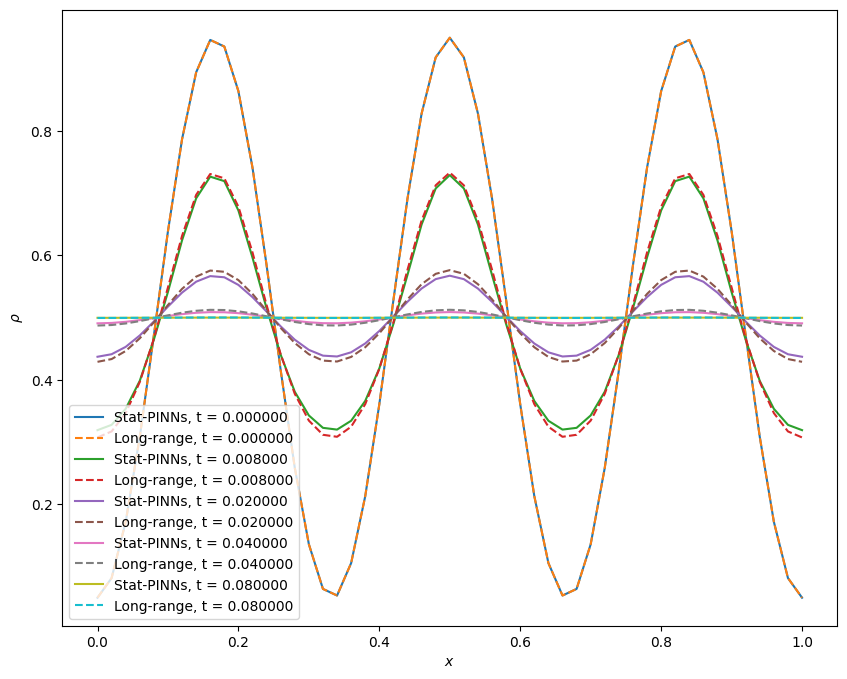

In [ ]:
index_plot = np.array([0, 0.1, 0.25, 0.5, 1]) * (t_pred.shape[0] - 1)
# index_plot = np.array([1]) * (t_pred.shape[0] - 1)
index_plot = [round(num) for num in index_plot]

time_out = t_pred

print(index_plot)

plt.figure()
fig = plt.figure(figsize=(10,8))
for it in index_plot:
# for it in range(20):
  plt.plot(x_All, rho_Part_All[:,it], label='Stat-PINNs, t = %f' %t_pred[it])
  plt.plot(x_All, rho_Ana_All[:,it], '--', label='Long-range, t = %f' %t_pred[it])
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho$')
# plt.title(r'$Q$ error = {}'.format(Q_error))
# plt.ylim([0,1])
plt.legend()
plt.show()


## Output prediction

In [ ]:
# Save PMPart and mobAna

FolderName_MacroSim1 = 'A' + str(amp_pred) + '_C' + str(cent_pred) + '_F' + str(freq_pred) + '_T' + str(T_tot) \
              + '_dt' + str(1/Ngamma_pred**2*dtdx2_factor) + '/'
if IniProfType == 'tri':
  FolderName_MacroSim1 = 'Tri_' + FolderName_MacroSim1
elif IniProfType == 'trap':
  FolderName_MacroSim1 = 'Trap_' + FolderName_MacroSim1
FolderName_MacroSim = FolderName + 'MacroSim/' + FolderName_MacroSim1


MacroSim_dic = {"rho_Part_All_out": rho_Part_All, "rho_Ana_All_out": rho_Ana_All, "x_All": x_All, "time_out": t_pred, "IniProfType": IniProfType, \
                "center": cent_pred, "amplitude": amp_pred, "frequency": freq_pred, "T": T_tot, "range_factor": model_range_factor, \
                "K_INN_type": K_INN_type, "fe_INN_type": fe_INN_type}

if K_INN_type == 'K1_MP_INN':
  FileName_MacroSim_lib = 'K_'
elif K_INN_type == 'K14_MP_INN':
  FileName_MacroSim_lib = 'K14_'


if fe_INN_type == 'fe_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe"
elif fe_INN_type == 'fe_gradB_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe2B"
elif fe_INN_type == 'fe_lap_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe2L"
elif fe_INN_type == 'fe_gradB_lap_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe3BL"
elif fe_INN_type == 'fe_gradC_lap_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe3CL"


FileName_MacroSim_lib = FileName_MacroSim_lib + "_MPPart_mobAna"

if conv_type == '2nd':
  FileName_MacroSim_lib = FileName_MacroSim_lib + '2'
elif conv_type == '4th':
  FileName_MacroSim_lib = FileName_MacroSim_lib + '4'

FileName_MacroSim_lib = FileName_MacroSim_lib + "_py.mat"

print(FolderName_MacroSim + FileName_MacroSim_lib)
Path(os.path.join(FolderName_MacroSim)).mkdir(parents = True, exist_ok = True)
scipy.io.savemat(FolderName_MacroSim + FileName_MacroSim_lib, MacroSim_dic)

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230706_Nb2e3_G25_28c_JL0.9_L200_400R25_1_10h001_1dt40_Eq50_E2JLrm/MacroSim/A0.45_C0.5_F3_T0.08_dt8e-05/K14_fe_MPPart_mobAna4_py.mat


## Load and Compare KMPart, mobAna & LongKMC

In [ ]:
# load MPPart & mobAna


FolderName_MacroSim1 = 'A' + str(amp_pred) + '_C' + str(cent_pred) + '_F' + str(freq_pred) + '_T' + str(T_tot) \
              + '_dt' + str(1/Ngamma_pred**2*dtdx2_factor) + '/'
if IniProfType == 'tri':
  FolderName_MacroSim1 = 'Tri_' + FolderName_MacroSim1
elif IniProfType == 'trap':
  FolderName_MacroSim1 = 'Trap_' + FolderName_MacroSim1
FolderName_MacroSim = FolderName + 'MacroSim/' + FolderName_MacroSim1


# MacroSim_dic = {"rho_Part_All_out": rho_Part_All, "rho_Ana_All_out": rho_Ana_All, "x_All": x_All, "time_out": t_pred, "IniProfType": IniProfType, \
#                 "center": cent_pred, "amplitude": amp_pred, "frequency": freq_pred, "T": T_tot, "range_factor": model_range_factor, \
#                 "K_INN_type": K_INN_type, "fe_INN_type": fe_INN_type}


if K_INN_type == 'K1_MP_INN':
  FileName_MacroSim_lib = 'K_'
elif K_INN_type == 'K14_MP_INN':
  FileName_MacroSim_lib = 'K14_'


if fe_INN_type == 'fe_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe"
elif fe_INN_type == 'fe_gradB_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe2B"
elif fe_INN_type == 'fe_lap_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe2L"
elif fe_INN_type == 'fe_gradB_lap_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe3BL"
elif fe_INN_type == 'fe_gradC_lap_INN':
  FileName_MacroSim_lib = FileName_MacroSim_lib + "fe3CL"


FileName_MacroSim_lib = FileName_MacroSim_lib + "_MPPart_mobAna"

if conv_type == '2nd':
  FileName_MacroSim_lib = FileName_MacroSim_lib + '2'
elif conv_type == '4th':
  FileName_MacroSim_lib = FileName_MacroSim_lib + '4'

FileName_MacroSim_lib = FileName_MacroSim_lib + "_py.mat"


print(FolderName_MacroSim + FileName_MacroSim_lib)
# Path(os.path.join(FolderName_MacroSim)).mkdir(parents = True, exist_ok = True)
data_MacroSim = scipy.io.loadmat(FolderName_MacroSim + FileName_MacroSim_lib)

rho_Part_All = data_MacroSim["rho_Part_All_out"]
rho_Ana_All = data_MacroSim["rho_Ana_All_out"]
x_All = data_MacroSim["x_All"].flatten()
time_out = data_MacroSim["time_out"].flatten()
T_tot = data_MacroSim["T"][0,0]

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_10dt200_Eq50_E2JLrm/MacroSim/Tri_A0.4_C0.5_F3_T0.2_dt0.0002/K_fe_MPPart_mobAna_py.mat


In [ ]:
# load LongKMC

# FolderName_LongKMC2 = 'ArrL230604_Nb2e3_G25_600t_c05A045f1_JL0_L0_1e3T0.08/'

# FolderName_LongKMC2 = 'ArrL230609_Nb2e3_G25_600t_c05A045f1_JL0.9_L40_1e3T0.32/'
# FolderName_LongKMC2 = 'ArrL230618_Nb2e3_G25_600t_c05A045f1_JL0.9_L80_1e3T0.32/'
# FolderName_LongKMC2 = 'ArrL230604_Nb2e3_G25_600t_c05A045f1_JL0.9_L2_1e3T0.32/'

# FolderName_LongKMC2 = 'ArrL230612_Nb1333_G17_600t_c05A035f1_JL2.2_L40_1e3T1.8/'
FolderName_LongKMC2 = 'ArrL230612_Nb1333_G17_600t_c05A04f1_JL2.2_L2_1e3T1.8/'

# FolderName_LongKMC2 = 'ArrL230611_Nb1333_G17_600t_c05A04f1_JL2.2_L40_1e3T0.8/'
# FolderName_LongKMC2 = 'ArrL230611_Nb1333_G17_600t_c05A04f1_JL2.2_L2_1e3T1/'
# FolderName_LongKMC2 = 'ArrL230128_Nb2e3_G25_600c_c05A035f1_JL2.2_L40_1e3_T08/'

FolderName_LongKMC = FolderName1 + FolderName_LongKMC2

FileName_LongKMC = 'LongKMC_ave.mat'


data_LongKMC = scipy.io.loadmat(FolderName_LongKMC+FileName_LongKMC)

print(FolderName_LongKMC2)
print(data_LongKMC.keys())

ArrL230612_Nb1333_G17_600t_c05A04f1_JL2.2_L2_1e3T1.8/
dict_keys(['__header__', '__version__', '__globals__', 'Co', 'Jo', 'L', 'Nbin', 'Ngamma', 'T', 'amplitude', 'boundaryCondition', 'center', 'frequency', 'numRealizations', 'rho_LongKMC_All_ave', 'timesteps_LongKMC', 'x_All'])


In [ ]:
# Load parameters for process
rho_LongKMC_ori_All = data_LongKMC['rho_LongKMC_All_ave']
T_LongKMC_ori = data_LongKMC['T'][0,0]
Ngamma_LongKMC_ori = data_LongKMC['Ngamma'][0,0]
x_LongKMC_ori_All = data_LongKMC['x_All'].flatten()
timesteps_LongKMC = data_LongKMC['timesteps_LongKMC'][0,0]

print('Shape of rho_LongKMC_ori_All = ',rho_LongKMC_ori_All.shape)
print('Shape of x_LongKMC_ori_All = ',x_LongKMC_ori_All.shape)
print('Ngamma_LongKMC_ori = ',Ngamma_LongKMC_ori)
print('T_LongKMC_ori = ',T_LongKMC_ori)
print("timesteps_LongKMC = ", timesteps_LongKMC)

Shape of rho_LongKMC_ori_All =  (1001, 18)
Shape of x_LongKMC_ori_All =  (18,)
Ngamma_LongKMC_ori =  17
T_LongKMC_ori =  1.8
timesteps_LongKMC =  1000


In [ ]:
scale_factor_LongKMC = round(50/Ngamma_LongKMC_ori)
print("scale_factor_LongKMC = ",scale_factor_LongKMC)

scale_factor_LongKMC =  3


In [ ]:
# rescale LongKMC results

T_LongKMC = T_LongKMC_ori / scale_factor_LongKMC**2

rho_LongKMC = rho_LongKMC_ori_All[:,:-1]
x_LongKMC = x_LongKMC_ori_All[:-1]
for i in range(scale_factor_LongKMC-1):
  rho_LongKMC = onp.hstack([rho_LongKMC, rho_LongKMC_ori_All[:,:-1]])
  x_LongKMC = onp.hstack([x_LongKMC, i+1 + x_LongKMC_ori_All[:-1]])

x_LongKMC = x_LongKMC/scale_factor_LongKMC

rho_LongKMC_All = onp.column_stack([rho_LongKMC, rho_LongKMC[:,0]])
rho_LongKMC_All = onp.transpose(rho_LongKMC_All)
x_LongKMC_All = onp.concatenate([x_LongKMC, (1.0,)])

print('T_LongKMC = ',T_LongKMC)
print('Shape of rho_LongKMC_All = ',rho_LongKMC_All.shape)
print('Shape of x_LongKMC_All = ',x_LongKMC_All.shape)

T_LongKMC =  0.2
Shape of rho_LongKMC_All =  (52, 1001)
Shape of x_LongKMC_All =  (52,)


T_plot_max =  0.2
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

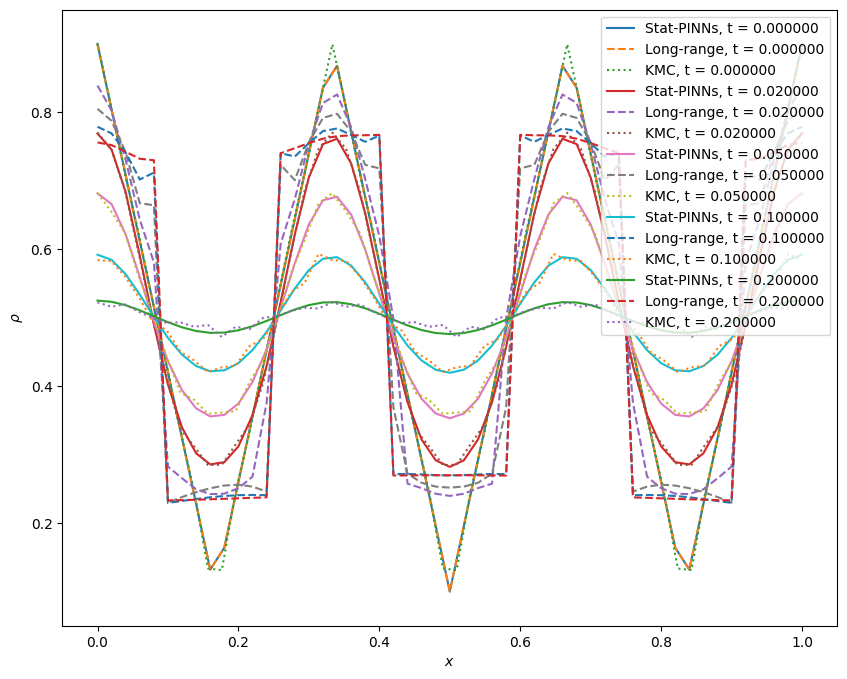

In [ ]:
T_plot_max = min(T_tot, T_LongKMC)

print("T_plot_max = ", T_plot_max)

index_plot_pred = np.array([0, 0.1, 0.25, 0.5, 1]) * (time_out.shape[0] - 1) * min(T_plot_max / T_tot, 1.0)
index_plot_pred = [round(num) for num in index_plot_pred]

index_plot_LongKMC = np.array([0, 0.1, 0.25, 0.5, 1]) * timesteps_LongKMC * min(T_plot_max / T_LongKMC, 1.0)
index_plot_LongKMC = [round(num) for num in index_plot_LongKMC]

print(index_plot_pred)
print(index_plot_LongKMC)

plot_max = cent_pred + amp_pred + 0.05
plot_min = cent_pred - amp_pred - 0.05

plt.figure()
fig = plt.figure(figsize=(10,8))
for it in range(len(index_plot_pred)):

  plt.plot(x_All, rho_Part_All[:,index_plot_pred[it]], label='Stat-PINNs, t = %f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_Ana_All[:,index_plot_pred[it]], '--', label='Long-range, t = %f' %time_out[index_plot_pred[it]])
  plt.plot(x_LongKMC_All, rho_LongKMC_All[:,index_plot_LongKMC[it]], ':', label='KMC, t = %f' %time_out[index_plot_pred[it]])
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho$')
# plt.title(r'$Q$ error = {}'.format(Q_error))
plt.ylim([plot_min, plot_max])
plt.legend()
plt.show()

# plt.savefig(FolderName_MacroSim + 'rho_MPPart_mobAna_LongKMC.png')

[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

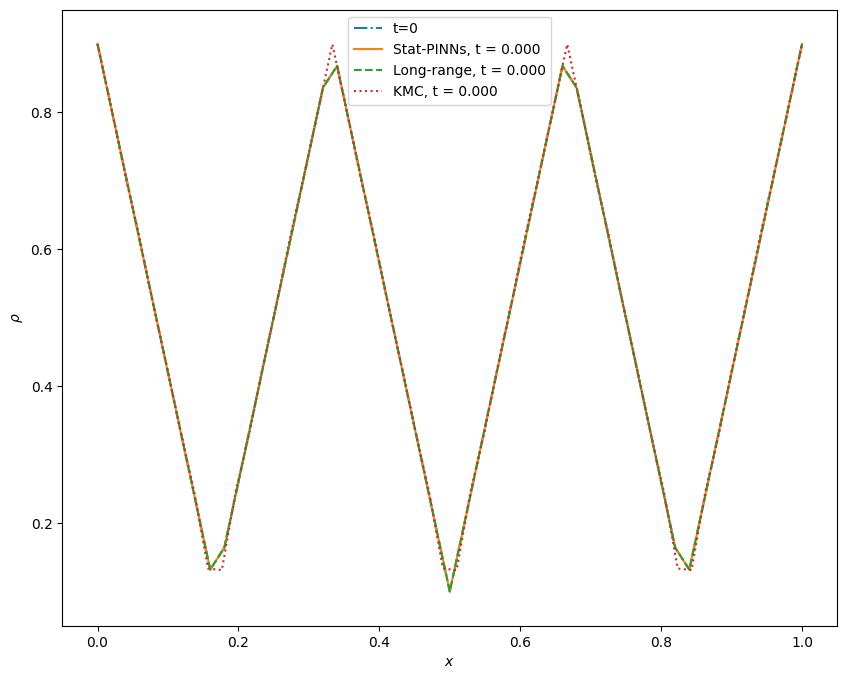

<Figure size 640x480 with 0 Axes>

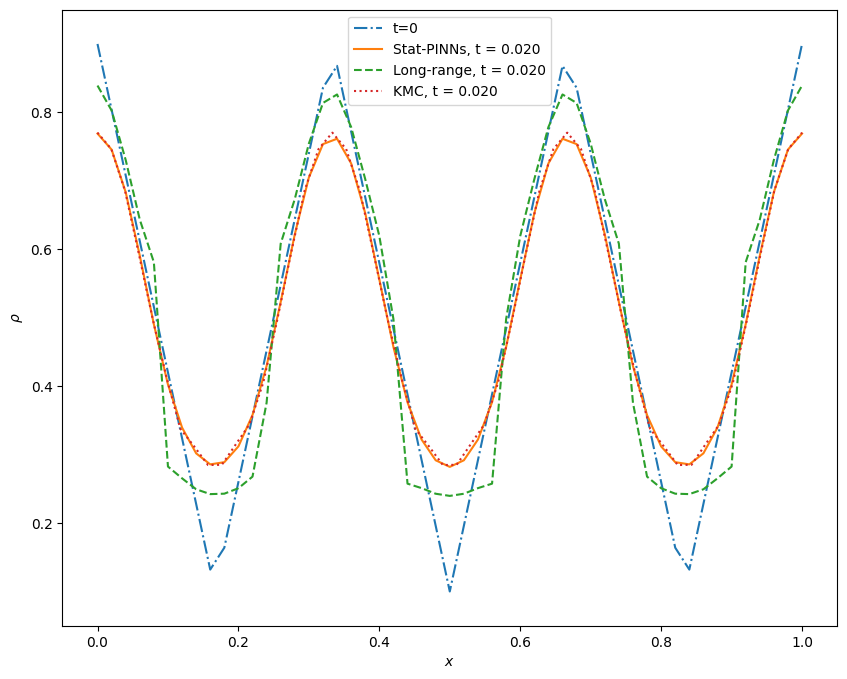

<Figure size 640x480 with 0 Axes>

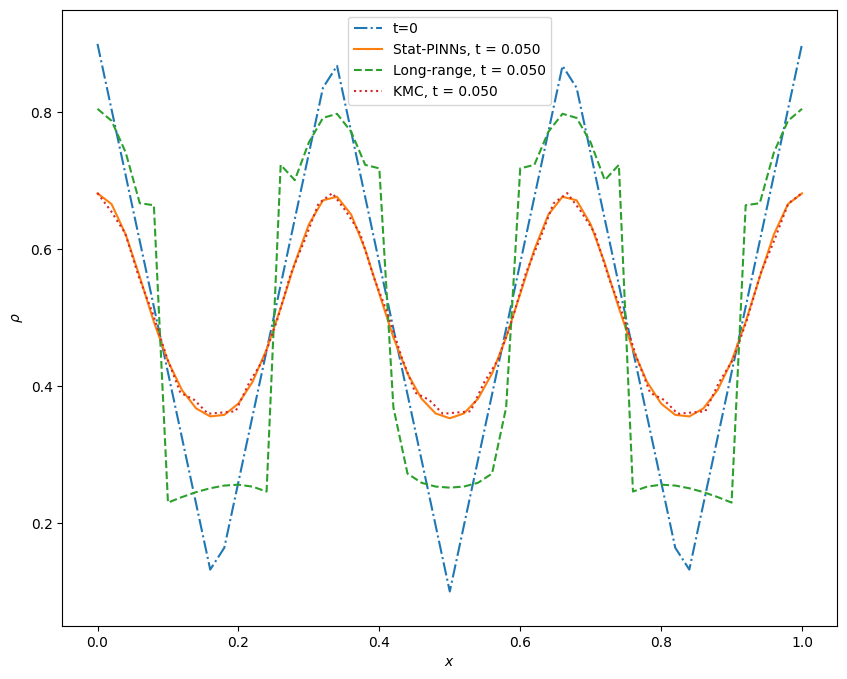

<Figure size 640x480 with 0 Axes>

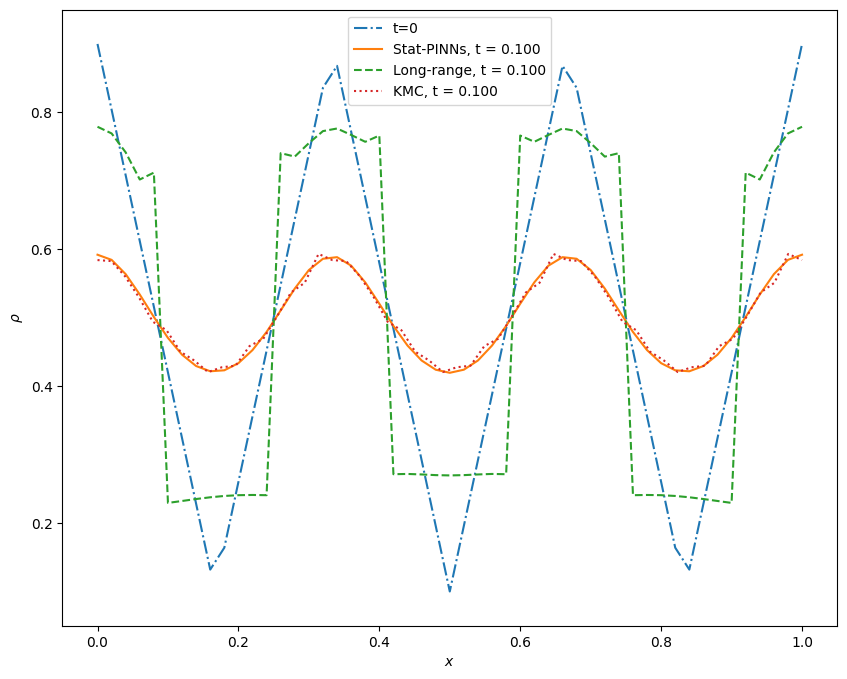

<Figure size 640x480 with 0 Axes>

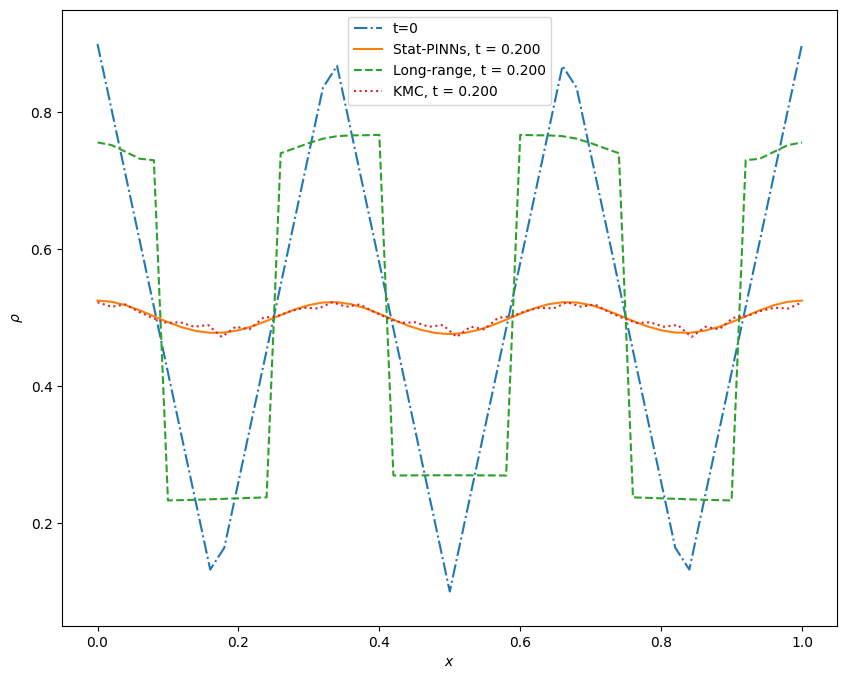

In [ ]:
index_plot_pred = np.array([0, 0.1, 0.25, 0.5, 1]) * (time_out.shape[0] - 1) * min(T_plot_max / T_tot, 1.0)
index_plot_pred = [round(num) for num in index_plot_pred]

index_plot_LongKMC = np.array([0, 0.1, 0.25, 0.5, 1]) * timesteps_LongKMC * min(T_plot_max / T_LongKMC, 1.0)
index_plot_LongKMC = [round(num) for num in index_plot_LongKMC]

print(index_plot_pred)
print(index_plot_LongKMC)

for it in range(len(index_plot_pred)):
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(x_All, rho_Part_All[:,0], '-.', label='t=0')

  plt.plot(x_All, rho_Part_All[:,index_plot_pred[it]], label='Stat-PINNs, t = %.3f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_Ana_All[:,index_plot_pred[it]], '--', label='Long-range, t = %.3f' %time_out[index_plot_pred[it]])
  plt.plot(x_LongKMC_All, rho_LongKMC_All[:,index_plot_LongKMC[it]], ':', label='KMC, t = %.3f' %time_out[index_plot_pred[it]])
  plt.xlabel(r'$x$')
  plt.ylabel(r'$\rho$')
  # plt.title(r'$Q$ error = {}'.format(Q_error))
  plt.legend()
  plt.ylim([plot_min, plot_max])
  plt.show()

# Continuum Prediction for PINNs

## Training Data

In [ ]:
PINNsVarType = '1'
# PINNsVarType = 'TimeData'

if PINNsVarType == '1':
  var_eq_all_Kfe = 1.0 + 0 * rho_all_fe

elif PINNsVarType == 'TimeData':

  if R4 > 1:
    # variance of equation based on data
    DrhoDt_fe = ( rho_Delta_t_R4[:,:,1:] - rho_Delta_t_R4[:,:,0:-1] ) / ( Delta_t_3D / R4 )
    DrhoDt_fe_left = np.roll(DrhoDt_fe, 1, axis=1)
    DrhoDt_fe_right = np.roll(DrhoDt_fe, -1, axis=1)
    MDrhoDt = M_tri_left * DrhoDt_fe_left + M_tri_0 * DrhoDt_fe + M_tri_right * DrhoDt_fe_right
    var_MDrhoDt_fe = MDrhoDt.var(axis=2)
    var_MDrhoDt_all_fe = np.tile(var_MDrhoDt_fe[:, :, np.newaxis], (1, 1, int(R4)))
    var_MDrhoDt_all_fe = var_MDrhoDt_all_fe.flatten() + 1e-50
  else:
    print("TimeData Requires R4 > 1 !!!")
    exit()


  var_eq_all_Kfe = var_MDrhoDt_all_fe
else:
  print("Wrong PINNsVarType!")
  exit()


In [ ]:
# Dim1_all = var_eq_all_fe.shape[0] / R4

if fe_TrainTest == False:

  if fe_INN_type == 'fe_INN':
    rho_train_fe, rho_left_train_fe, rho_right_train_fe, DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            var_eq_train_Kfe, rho_left2_train_fe, rho_right2_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_right_all_fe, DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            var_eq_all_Kfe, rho_left2_all_fe, rho_right2_all_fe

  elif fe_INN_type == 'fe_gradB_INN':
    rho_train_fe, rho_left_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            grad_rho_train_fe, grad_rho_left_train_fe, grad_rho_right_train_fe, grad_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            var_eq_train_Kfe, rho_left2_train_fe \
            = rho_all_fe, rho_left_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            grad_rho_all_fe, grad_rho_left_all_fe, grad_rho_right_all_fe, grad_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            var_eq_all_Kfe, rho_left2_all_fe

  elif fe_INN_type == 'fe_gradC_INN':
    rho_train_fe, rho_left_train_fe, rho_left2_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            grad_rho_train_fe, grad_rho_left_train_fe, grad_rho_left2_train_fe, grad_rho_right_train_fe, grad_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            var_eq_train_Kfe \
            = rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            grad_rho_all_fe, grad_rho_left_all_fe, grad_rho_left2_all_fe, grad_rho_right_all_fe, grad_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            var_eq_all_Kfe

  elif fe_INN_type == 'fe_lap_INN':
    rho_train_fe, rho_left_train_fe, rho_left2_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            lap_rho_train_fe, lap_rho_left_train_fe, lap_rho_left2_train_fe, lap_rho_right_train_fe, lap_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            var_eq_train_Kfe \
            = rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            lap_rho_all_fe, lap_rho_left_all_fe, lap_rho_left2_all_fe, lap_rho_right_all_fe, lap_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            var_eq_all_Kfe

  elif fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
    rho_train_fe, rho_left_train_fe, rho_left2_train_fe, rho_right_train_fe, rho_right2_train_fe, \
            grad_rho_train_fe, grad_rho_left_train_fe, grad_rho_left2_train_fe, grad_rho_right_train_fe, grad_rho_right2_train_fe, \
            lap_rho_train_fe, lap_rho_left_train_fe, lap_rho_left2_train_fe, lap_rho_right_train_fe, lap_rho_right2_train_fe, \
            DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
            var_eq_train_Kfe \
            = rho_all_fe, rho_left_all_fe, rho_left2_all_fe, rho_right_all_fe, rho_right2_all_fe, \
            grad_rho_all_fe, grad_rho_left_all_fe, grad_rho_left2_all_fe, grad_rho_right_all_fe, grad_rho_right2_all_fe, \
            lap_rho_all_fe, lap_rho_left_all_fe, lap_rho_left2_all_fe, lap_rho_right_all_fe, lap_rho_right2_all_fe, \
            DrhoDt_all_fe, DrhoDt_left_all_fe, DrhoDt_right_all_fe,\
            var_eq_all_Kfe

  else:
    print("Wrong fe_INN_type!")
    exit()

  test_data_fe = []

elif fe_TrainTest == True:

  print("Don't Use Train Test Split")
  exit()


if fe_INN_type == 'fe_INN':
  train_data_Kfe = rho_train_fe, rho_left_train_fe, rho_right_train_fe, DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          M_tri, var_eq_all_Kfe, dx_basis, rho_left2_all_fe, rho_right2_all_fe



elif fe_INN_type == 'fe_gradB_INN':

  rho_grad_rho_train_fe = rho_train_fe, grad_rho_train_fe
  rho_grad_rho_left_train_fe = rho_left_train_fe, grad_rho_left_train_fe
  rho_grad_rho_right_train_fe = rho_right_train_fe, grad_rho_right_train_fe
  rho_grad_rho_right2_train_fe = rho_right2_train_fe, grad_rho_right2_train_fe

  train_data_Kfe = rho_grad_rho_train_fe, rho_grad_rho_left_train_fe, rho_grad_rho_right_train_fe, rho_grad_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          var_eq_all_Kfe, dx_basis, rho_left2_train_fe

elif fe_INN_type == 'fe_gradC_INN':

  rho_grad_rho_train_fe = rho_train_fe, grad_rho_train_fe
  rho_grad_rho_left_train_fe = rho_left_train_fe, grad_rho_left_train_fe
  rho_grad_rho_left2_train_fe = rho_left2_train_fe, grad_rho_left2_train_fe
  rho_grad_rho_right_train_fe = rho_right_train_fe, grad_rho_right_train_fe
  rho_grad_rho_right2_train_fe = rho_right2_train_fe, grad_rho_right2_train_fe

  train_data_Kfe = rho_grad_rho_train_fe, rho_grad_rho_left_train_fe, rho_grad_rho_left2_train_fe, rho_grad_rho_right_train_fe, rho_grad_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          M_tri, var_eq_all_Kfe, dx_basis

elif fe_INN_type == 'fe_lap_INN':

  rho_lap_rho_train_fe = rho_train_fe, lap_rho_train_fe
  rho_lap_rho_left_train_fe = rho_left_train_fe, lap_rho_left_train_fe
  rho_lap_rho_left2_train_fe = rho_left2_train_fe, lap_rho_left2_train_fe
  rho_lap_rho_right_train_fe = rho_right_train_fe, lap_rho_right_train_fe
  rho_lap_rho_right2_train_fe = rho_right2_train_fe, lap_rho_right2_train_fe

  train_data_Kfe = rho_lap_rho_train_fe, rho_lap_rho_left_train_fe, rho_lap_rho_left2_train_fe, rho_lap_rho_right_train_fe, rho_lap_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          M_tri, var_eq_all_Kfe, dx_basis

elif fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':

  rho_grad_lap_rho_train_fe = rho_train_fe, grad_rho_left_train_fe, lap_rho_train_fe
  rho_grad_lap_rho_left_train_fe = rho_left_train_fe, grad_rho_left_train_fe, lap_rho_left_train_fe
  rho_grad_lap_rho_left2_train_fe = rho_left2_train_fe, grad_rho_left2_train_fe, lap_rho_left2_train_fe
  rho_grad_lap_rho_right_train_fe = rho_right_train_fe, grad_rho_right_train_fe, lap_rho_right_train_fe
  rho_grad_lap_rho_right2_train_fe = rho_right2_train_fe, grad_rho_right2_train_fe, lap_rho_right2_train_fe

  train_data_Kfe = rho_grad_lap_rho_train_fe, rho_grad_lap_rho_left_train_fe, rho_grad_lap_rho_left2_train_fe, rho_grad_lap_rho_right_train_fe, rho_grad_lap_rho_right2_train_fe,\
          DrhoDt_train_fe, DrhoDt_left_train_fe, DrhoDt_right_train_fe,\
          M_tri, var_eq_all_Kfe, dx_basis

else:
  print("Wrong fe_INN_type!")
  exit()



## Training model for PINNs

In [ ]:
if K_INN_type == 'K1_MP_INN':
  layers_K = [2, 20, 20, 1]
elif K_INN_type == 'K14_MP_INN':
  layers_K = [4, 40, 40, 1]
else:
  print("Wrong K_INN_type!")
  exit()

if fe_INN_type == 'fe_INN':
  layers_fe = [1, 20, 20, 1]
elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN' or fe_INN_type == 'fe_lap_INN':
  layers_fe = [2, 20, 20, 1]
elif fe_INN_type == 'fe_gradB_lap_INN' or fe_INN_type == 'fe_gradC_lap_INN':
  layers_fe = [3, 30, 30, 1]
else:
  print("Wrong fe_INN_type!")
  exit()


learning_rate = 1e-3
activation_fn = 'softplus'

if K_INN_type == 'K1_MP_INN':
  if fe_INN_type == 'fe_INN':
    model_Kfe = K_fe_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_gradB_INN':
    model_Kfe = K_fe_gradB_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_lap_INN':
    model_Kfe = K_fe_lap_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_gradB_lap_INN':
    model_Kfe = K_fe_gradB_lap_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_gradC_lap_INN':
    model_Kfe = K_fe_gradC_lap_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)

elif K_INN_type == 'K14_MP_INN':
  if fe_INN_type == 'fe_INN':
    model_Kfe = K14_fe_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_gradB_INN':
    model_Kfe = K14_fe_gradB_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_lap_INN':
    model_Kfe = K14_fe_lap_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_gradB_lap_INN':
    model_Kfe = K14_fe_gradB_lap_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)
  elif fe_INN_type == 'fe_gradC_lap_INN':
    model_Kfe = K14_fe_gradC_lap_INN(train_data_K, train_data_Kfe, layers_K, layers_fe, learning_rate, activation_fn)


Number of K_0 data: (700,)
Number of K_1 data: (700,)
DataWeights = 1

rho scale =  0.49686447566511444
M scale =  0.013333335
DrhoDt scale =  2.4500513
K scale =  1.0
fe scale =  0.016231248


## Load PINNs model_Kfe

In [ ]:
# Load model

if PINNsVarType == '1':
  FolderName_Kfe_model = FolderName + 'PINNs_Var1/'
elif PINNsVarType == 'TimeData':
  FolderName_Kfe_model = FolderName + 'PINNs_TimeData/'
else:
  print("Wrong PINNsVarType!")
  exit()

if K_INN_type == 'K1_MP_INN':
  FileName_Kfe_model = 'K_'
elif K_INN_type == 'K14_MP_INN':
  FileName_Kfe_model = 'K14_'
else:
  print("Wrong K_INN_type!")
  exit()

if fe_INN_type == 'fe_INN':
  FileName_Kfe_model = FileName_Kfe_model + 'fe'
elif fe_INN_type == 'fe_gradB_INN':
  FileName_Kfe_model = FileName_Kfe_model + 'fe2B'
elif fe_INN_type == 'fe_gradC_INN':
  FileName_Kfe_model = FileName_Kfe_model + 'fe2C'
elif fe_INN_type == 'fe_lap_INN':
  FileName_Kfe_model = FileName_Kfe_model + 'fe2L'
elif fe_INN_type == 'fe_gradB_lap_INN':
  FileName_Kfe_model = FileName_Kfe_model + 'fe3BL'
elif fe_INN_type == 'fe_gradC_lap_INN':
  FileName_Kfe_model = FileName_Kfe_model + 'fe3CL'
else:
  print("Wrong fe_INN_type!")
  exit()


FileName_Kfe_model = FileName_Kfe_model + '_INN_params.pkl'

print(FolderName_Kfe_model + FileName_Kfe_model)


opt_params_Kfe = pickle.load(open(FolderName_Kfe_model + FileName_Kfe_model , 'rb'))
model_Kfe.params = opt_params_Kfe

opt_params_fe_Kfe = opt_params_Kfe[model_Kfe.nn_params_K_1:]

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_10dt200_Eq50_E2JLrm/PINNs_Var1/K_fe_INN_params.pkl


## Run Particle-based prediction

In [ ]:
# Parameters for continuum prediction

NN_K_Kfe_settings = model_Kfe, opt_params_Kfe, K_INN_type
NN_fe_Kfe_settings = model_Kfe, opt_params_fe_Kfe, fe_INN_type


In [ ]:
# Run Continuum Prediction


rho_PINNs_All, rho_AnaPINNs_All, x_All, t_pred = K_fe_MPPart_mobAna_MacroSim(NN_K_Kfe_settings, NN_fe_Kfe_settings, Arr_Params, IniProfType, IniProfParams, T_tot, \
                          conv_type=conv_type, dtdx2_factor=dtdx2_factor, Ngamma=Ngamma_pred, model_range_factor=model_range_factor)

# rho_Part_All, rho_Ana_All, x_All, t_pred, Q_temp,  Q_Ana_temp, m_half_Ana_temp, flux_Ana_temp\
#                         = K_fe_MPPart_mobAna_MacroSim(NN_K_settings, NN_fe_settings, Arr_Params, IniProfType, IniProfParams, 1e-5, \
#                           conv_type=conv_type, dtdx2_factor=0.5, Ngamma=Ngamma_pred, model_range_factor=model_range_factor)

100%|██████████| 1000/1000 [00:41<00:00, 24.33it/s]


In [ ]:
print(rho_PINNs_All)

[[0.9        0.8947711  0.89010265 ... 0.52299311 0.5229219  0.52285098]
 [0.804      0.80559375 0.8068301  ... 0.52092301 0.52085944 0.52079601]
 [0.708      0.70766198 0.70744066 ... 0.51572369 0.51567813 0.51563276]
 ...
 [0.708      0.70769638 0.70758999 ... 0.51686463 0.51681478 0.51676513]
 [0.804      0.80568542 0.80692769 ... 0.52152865 0.52146248 0.52139651]
 [0.9        0.8947711  0.89010265 ... 0.52299311 0.5229219  0.52285098]]


[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

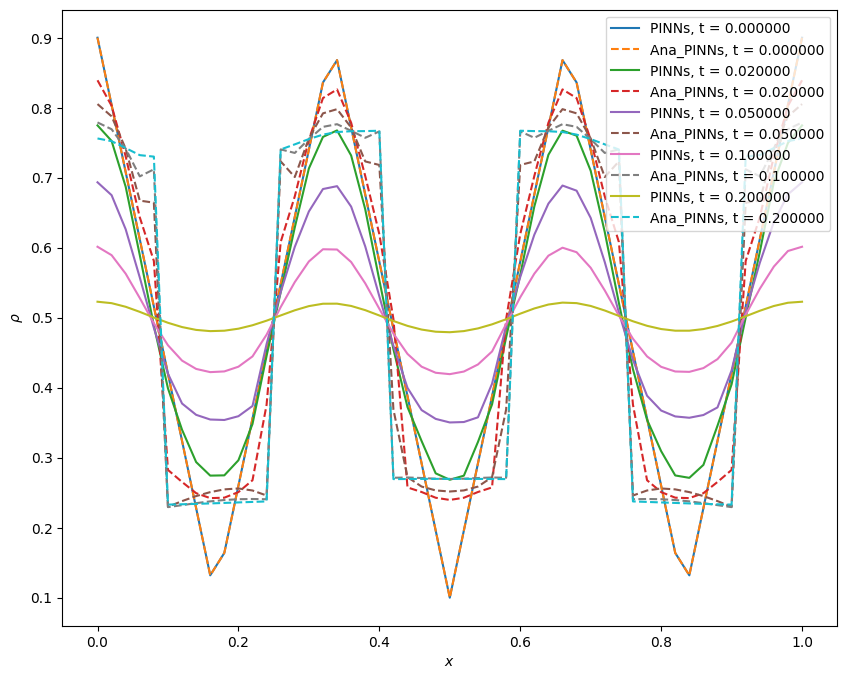

In [ ]:
index_plot = np.array([0, 0.1, 0.25, 0.5, 1]) * (t_pred.shape[0] - 1)
# index_plot = np.array([1]) * (t_pred.shape[0] - 1)
index_plot = [round(num) for num in index_plot]

print(index_plot)

plt.figure()
fig = plt.figure(figsize=(10,8))
for it in index_plot:
# for it in range(20):
  plt.plot(x_All, rho_PINNs_All[:,it], label='PINNs, t = %f' %t_pred[it])
  plt.plot(x_All, rho_AnaPINNs_All[:,it], '--', label='Ana_PINNs, t = %f' %t_pred[it])
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho$')
# plt.title(r'$Q$ error = {}'.format(Q_error))
# plt.ylim([0,1])
plt.legend()
plt.show()


## Output prediction

In [ ]:
# Save PINNs

FolderName_MacroSim1 = 'A' + str(amp_pred) + '_C' + str(cent_pred) + '_F' + str(freq_pred) + '_T' + str(T_tot) \
              + '_dt' + str(1/Ngamma_pred**2*dtdx2_factor) + '/'
if IniProfType == 'tri':
  FolderName_MacroSim1 = 'Tri_' + FolderName_MacroSim1
elif IniProfType == 'trap':
  FolderName_MacroSim1 = 'Trap_' + FolderName_MacroSim1
FolderName_MacroSim = FolderName + 'MacroSim/' + FolderName_MacroSim1


MacroSimPINNs_dic = {"rho_PINNs_All_out": rho_PINNs_All, "x_All": x_All, "time_out": t_pred, "IniProfType": IniProfType, \
                "center": cent_pred, "amplitude": amp_pred, "frequency": freq_pred, "T": T_tot, "range_factor": model_range_factor, \
                "K_INN_type": K_INN_type, "fe_INN_type": fe_INN_type}

if K_INN_type == 'K1_MP_INN':
  FileName_MacroSimPINNs_lib = 'K_'
elif K_INN_type == 'K14_MP_INN':
  FileName_MacroSimPINNs_lib = 'K14_'


if fe_INN_type == 'fe_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe"
elif fe_INN_type == 'fe_gradB_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe2B"
elif fe_INN_type == 'fe_lap_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe2L"
elif fe_INN_type == 'fe_gradB_lap_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe3BL"
elif fe_INN_type == 'fe_gradC_lap_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe3CL"


FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "_PINNs_py.mat"

print(FolderName_MacroSim + FileName_MacroSimPINNs_lib)
Path(os.path.join(FolderName_MacroSim)).mkdir(parents = True, exist_ok = True)
scipy.io.savemat(FolderName_MacroSim + FileName_MacroSimPINNs_lib, MacroSimPINNs_dic)

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Modified_Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_1dt20_Eq50_E2JLrm/MacroSim/Tri_A0.4_C0.5_F3_T0.2_dt0.0002/K_fe_PINNs_py.mat


## Load PINNs and compare with KMPart, mobAna & LongKMC

In [ ]:
# load PINNs


FolderName_MacroSim1 = 'A' + str(amp_pred) + '_C' + str(cent_pred) + '_F' + str(freq_pred) + '_T' + str(T_tot) \
              + '_dt' + str(1/Ngamma_pred**2*dtdx2_factor) + '/'
if IniProfType == 'tri':
  FolderName_MacroSim1 = 'Tri_' + FolderName_MacroSim1
elif IniProfType == 'trap':
  FolderName_MacroSim1 = 'Trap_' + FolderName_MacroSim1
FolderName_MacroSim = FolderName + 'MacroSim/' + FolderName_MacroSim1




if K_INN_type == 'K1_MP_INN':
  FileName_MacroSimPINNs_lib = 'K_'
elif K_INN_type == 'K14_MP_INN':
  FileName_MacroSimPINNs_lib = 'K14_'


if fe_INN_type == 'fe_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe"
elif fe_INN_type == 'fe_gradB_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe2B"
elif fe_INN_type == 'fe_lap_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe2L"
elif fe_INN_type == 'fe_gradB_lap_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe3BL"
elif fe_INN_type == 'fe_gradC_lap_INN':
  FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "fe3CL"


FileName_MacroSimPINNs_lib = FileName_MacroSimPINNs_lib + "_PINNs_py.mat"


print(FolderName_MacroSim + FileName_MacroSimPINNs_lib)
# Path(os.path.join(FolderName_MacroSim)).mkdir(parents = True, exist_ok = True)
data_MacroSimPINNs = scipy.io.loadmat(FolderName_MacroSim + FileName_MacroSimPINNs_lib)

rho_PINNs_All = data_MacroSimPINNs["rho_PINNs_All_out"]
x_All = data_MacroSimPINNs["x_All"].flatten()
time_out = data_MacroSimPINNs["time_out"].flatten()
T_tot = data_MacroSimPINNs["T"][0,0]

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_10dt200_Eq50_E2JLrm/MacroSim/Tri_A0.4_C0.5_F3_T0.2_dt0.0002/K_fe_PINNs_py.mat


T_plot_max =  0.2
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

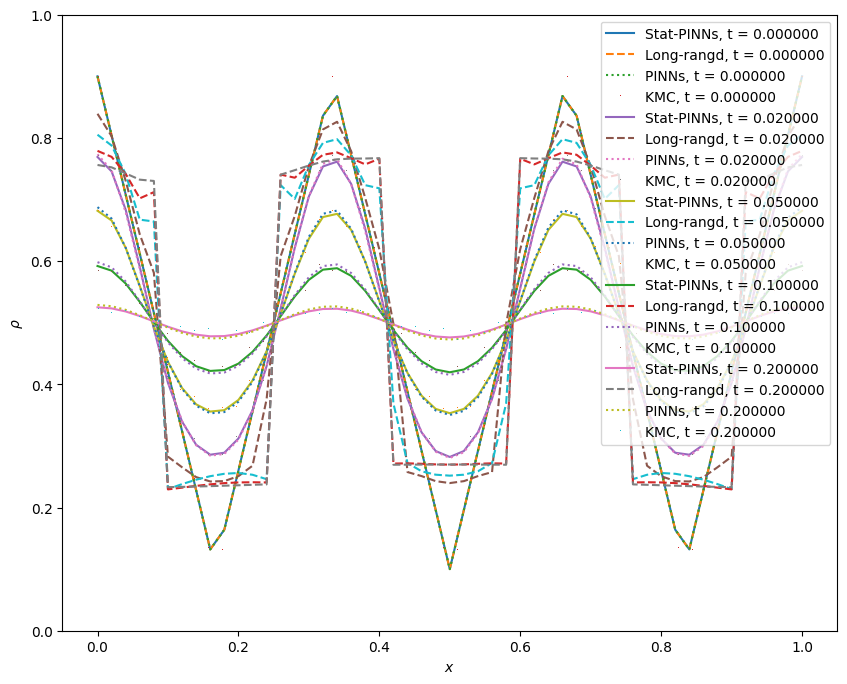

<Figure size 640x480 with 0 Axes>

In [ ]:
T_plot_max = min(T_tot, T_LongKMC)

print("T_plot_max = ", T_plot_max)

index_plot_pred = np.array([0, 0.1, 0.25, 0.5, 1]) * (time_out.shape[0] - 1) * min(T_plot_max / T_tot, 1.0)
index_plot_pred = [round(num) for num in index_plot_pred]

index_plot_LongKMC = np.array([0, 0.1, 0.25, 0.5, 1]) * timesteps_LongKMC * min(T_plot_max / T_LongKMC, 1.0)
index_plot_LongKMC = [round(num) for num in index_plot_LongKMC]

print(index_plot_pred)
print(index_plot_LongKMC)

# plot_max = cent_pred + amp_pred + 0.05,
# plot_min = cent_pred - amp_pred - 0.05

plot_max = min( cent_pred + amp_pred + 0.1, 1 )
plot_min = max( cent_pred - amp_pred - 0.1, 0 )

plt.figure()
fig = plt.figure(figsize=(10,8))
for it in range(len(index_plot_pred)):

  plt.plot(x_All, rho_Part_All[:,index_plot_pred[it]], label='Stat-PINNs, t = %f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_Ana_All[:,index_plot_pred[it]], '--', label='Long-rangd, t = %f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_PINNs_All[:,index_plot_pred[it]], ':', label='PINNs, t = %f' %time_out[index_plot_pred[it]])
  plt.plot(x_LongKMC_All, rho_LongKMC_All[:,index_plot_LongKMC[it]], ',', label='KMC, t = %f' %time_out[index_plot_pred[it]])
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho$')
# plt.title(r'$Q$ error = {}'.format(Q_error))
plt.ylim([plot_min, plot_max])
plt.legend()
plt.show()

plt.savefig(FolderName_MacroSim + 'rho_MPPart_mobAna_LongKMC.png')

[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

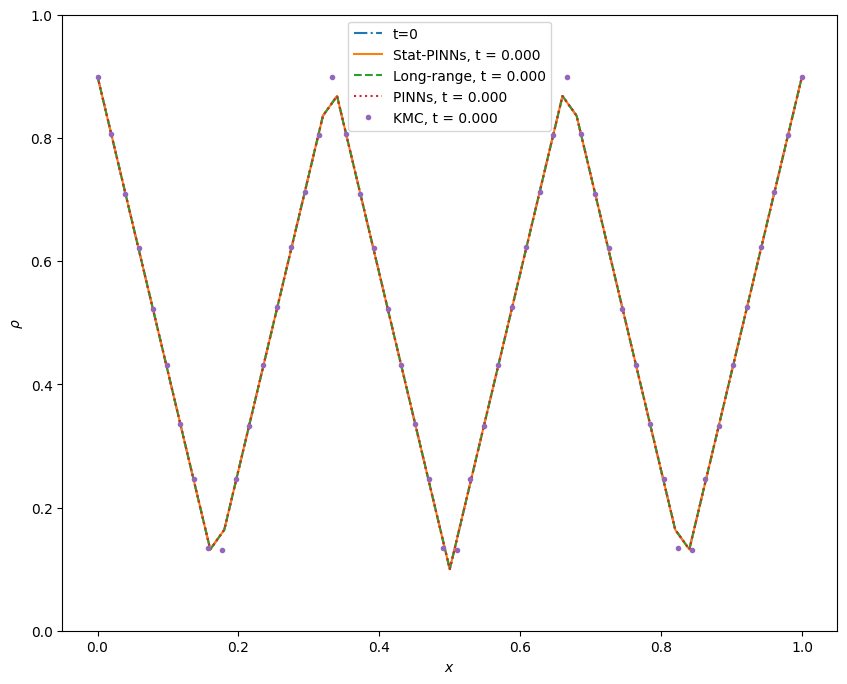

<Figure size 640x480 with 0 Axes>

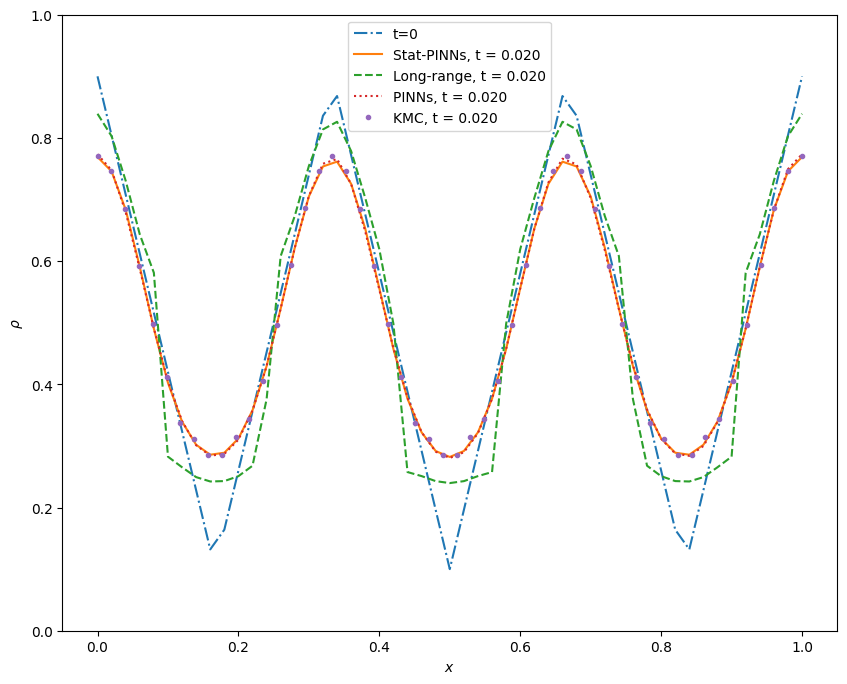

<Figure size 640x480 with 0 Axes>

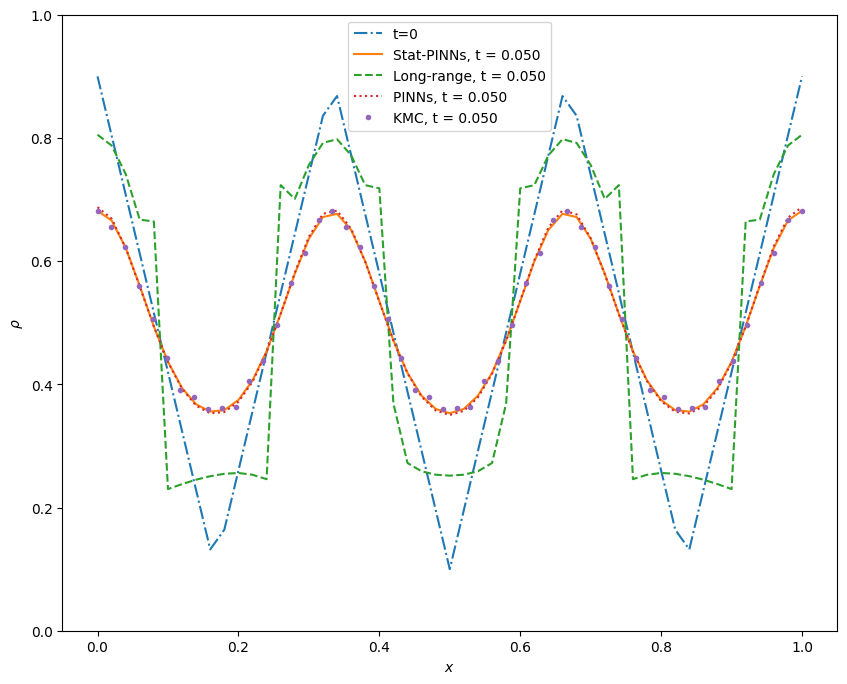

<Figure size 640x480 with 0 Axes>

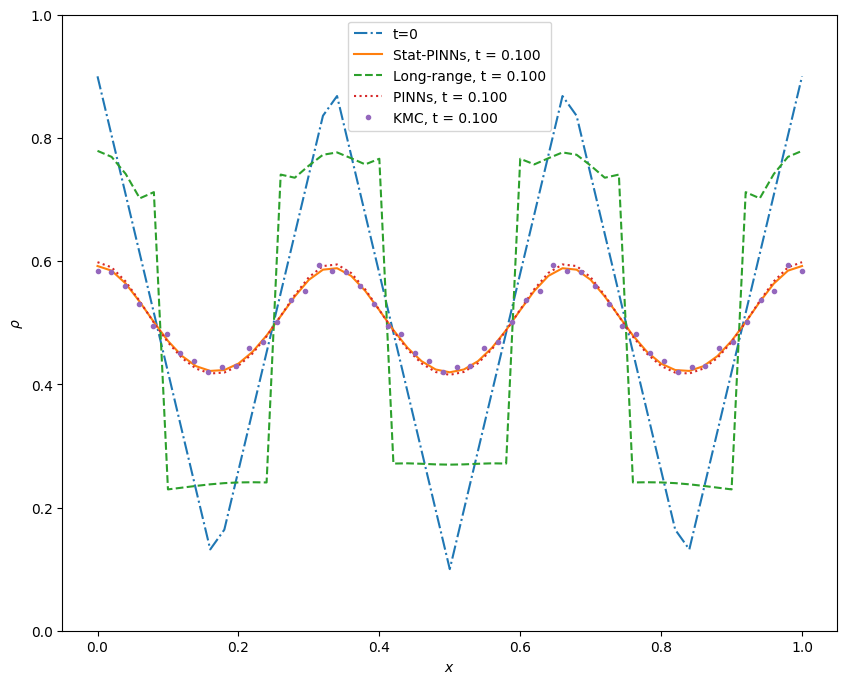

<Figure size 640x480 with 0 Axes>

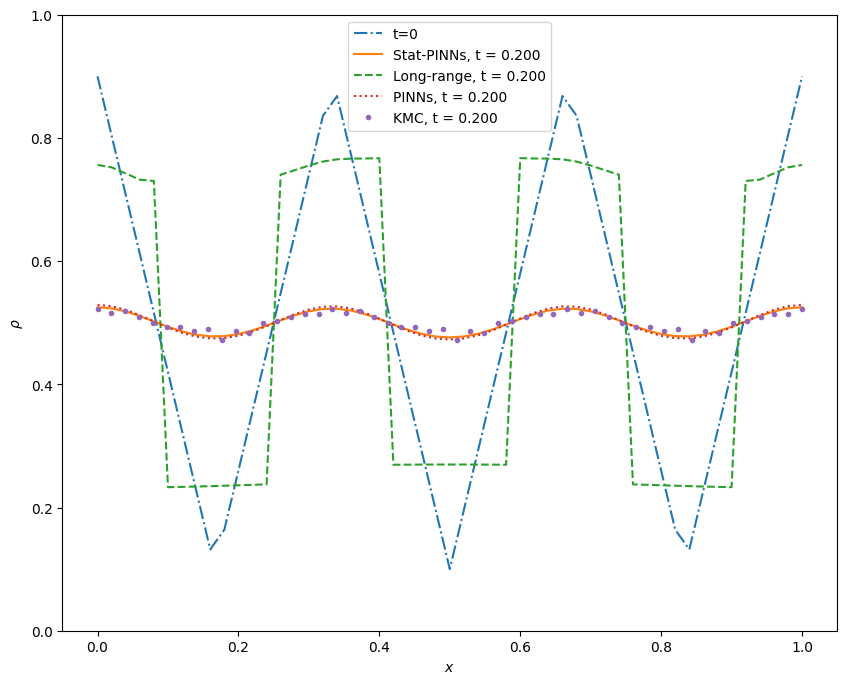

In [ ]:
index_plot_pred = np.array([0, 0.1, 0.25, 0.5, 1]) * (time_out.shape[0] - 1) * min(T_plot_max / T_tot, 1.0)
index_plot_pred = [round(num) for num in index_plot_pred]

index_plot_LongKMC = np.array([0, 0.1, 0.25, 0.5, 1]) * timesteps_LongKMC * min(T_plot_max / T_LongKMC, 1.0)
index_plot_LongKMC = [round(num) for num in index_plot_LongKMC]

print(index_plot_pred)
print(index_plot_LongKMC)

for it in range(len(index_plot_pred)):
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(x_All, rho_Part_All[:,0], '-.', label='t=0')

  plt.plot(x_All, rho_Part_All[:,index_plot_pred[it]], label='Stat-PINNs, t = %.3f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_Ana_All[:,index_plot_pred[it]], '--', label='Long-range, t = %.3f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_PINNs_All[:,index_plot_pred[it]], ':', label='PINNs, t = %.3f' %time_out[index_plot_pred[it]])
  plt.plot(x_LongKMC_All, rho_LongKMC_All[:,index_plot_LongKMC[it]], '.', label='KMC, t = %.3f' %time_out[index_plot_pred[it]])
  plt.xlabel(r'$x$')
  plt.ylabel(r'$\rho$')
  # plt.title(r'$Q$ error = {}'.format(Q_error))
  plt.legend()
  plt.ylim([plot_min, plot_max])
  plt.show()

# Predictions for $K$, $f$ and $\rho(x,t)$ from Stat-PINNs, PINNs & Long-range Model

In [ ]:
# Ngamma_pred = int(50)
# model_range_factor = Ngamma/float(Ngamma_pred)
print('model_range_factor =', model_range_factor)
dx_pred = 1.0/Ngamma_pred
print('dx_pred =', dx_pred)

model_range_factor = 0.5
dx_pred = 0.02


## Predictions for $K$

In [ ]:
rho_pred_min = 0.01
rho_pred_max = 0.99
drho_pred_min = drho_1.min() / model_range_factor
drho_pred_max = drho_1.max() / model_range_factor

if K_INN_type == 'K1_MP_INN':

  d2rho_pred_min = d2rho_0.min() / model_range_factor**2
  d2rho_pred_max = d2rho_0.max() / model_range_factor**2

elif K_INN_type == 'K14_MP_INN':

  d2rho_pred_min = d2rho_1.min() / model_range_factor**2
  d2rho_pred_max = d2rho_1.max() / model_range_factor**2
  d3rho_pred_min = d3rho_1.min() / model_range_factor**3
  d3rho_pred_max = d3rho_1.max() / model_range_factor**3

# K0
print('rho range:', rho_pred_min, rho_pred_max)
print('drho range:', drho_pred_min, drho_pred_max)

if K_INN_type == 'K14_MP_INN':
  print('d2rho range:', d2rho_pred_min, d2rho_pred_max)
  print('d3rho range:', d3rho_pred_min, d3rho_pred_max)


rho_pred_grid_K = np.linspace(rho_pred_min, rho_pred_max, 100)
drho_pred_grid_K = np.linspace(drho_train_min, drho_pred_max, 200)

rho_pred_meshgrid_K, drho_pred_meshgrid_K = np.meshgrid(rho_pred_grid_K, drho_pred_grid_K)
print('K0 meshgrid shape:', rho_pred_meshgrid_K.shape, drho_pred_meshgrid_K.shape)


rho range: 0.01 0.99
drho range: -7.430749999999998 7.36975
K0 meshgrid shape: (200, 100) (200, 100)


In [ ]:
# prediction and analytic K1 on meshgrid

if K_INN_type == 'K1_MP_INN':
  K_1_StatPINNs = vmap(vmap(model_K.predict_K_1, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))\
                          (opt_params_K, rho_pred_meshgrid_K, drho_pred_meshgrid_K * model_range_factor) / model_range_factor
  K_1_PINNs = vmap(vmap(model_Kfe.predict_K_1, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))\
                          (opt_params_Kfe, rho_pred_meshgrid_K, drho_pred_meshgrid_K * model_range_factor) / model_range_factor

elif K_INN_type == 'K14_MP_INN':
  K_1_StatPINNs = vmap(vmap(model_K.predict_K_1, in_axes=(None, 0, 0, None, None)), in_axes=(None, 0, 0, None, None))\
                          (opt_params_K, rho_pred_meshgrid_K, drho_pred_meshgrid_K * model_range_factor, 0, 0) / model_range_factor
  K_1_PINNs = vmap(vmap(model_Kfe.predict_K_1, in_axes=(None, 0, 0, None, None)), in_axes=(None, 0, 0, None, None))\
                          (opt_params_Kfe, rho_pred_meshgrid_K, drho_pred_meshgrid_K * model_range_factor) / model_range_factor


K_1_LongRange = vmap(vmap(K_1_Arr_ana_func, in_axes=(0, 0, None,None,None,None)), in_axes=(0, 0, None,None,None,None))\
                          (rho_pred_meshgrid_K, drho_pred_meshgrid_K, dx_pred,Jo,L,Co)


print('Shape of StatPINNs K_1:', K_1_StatPINNs.shape)
print('Shape of PINNs K_1:', K_1_PINNs.shape)
print('Shape of LongRange K_1:', K_1_LongRange.shape)

Shape of StatPINNs K_1: (200, 100)
Shape of PINNs K_1: (200, 100)
Shape of LongRange K_1: (200, 100)


<Figure size 640x480 with 0 Axes>

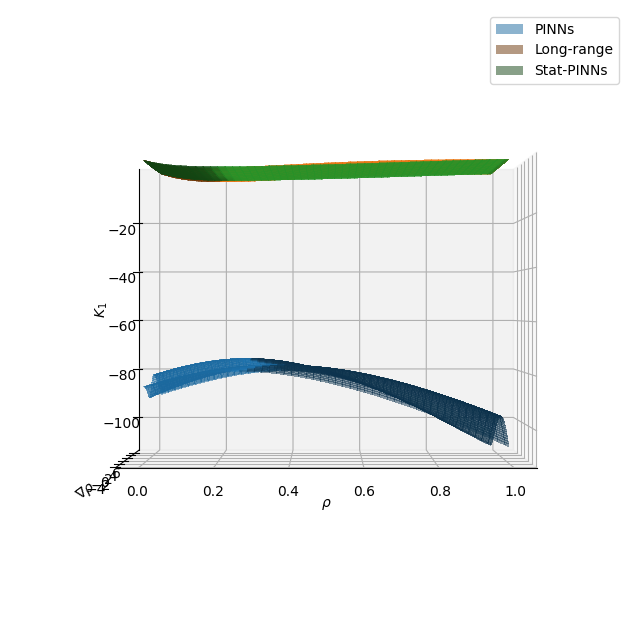

<Figure size 640x480 with 0 Axes>

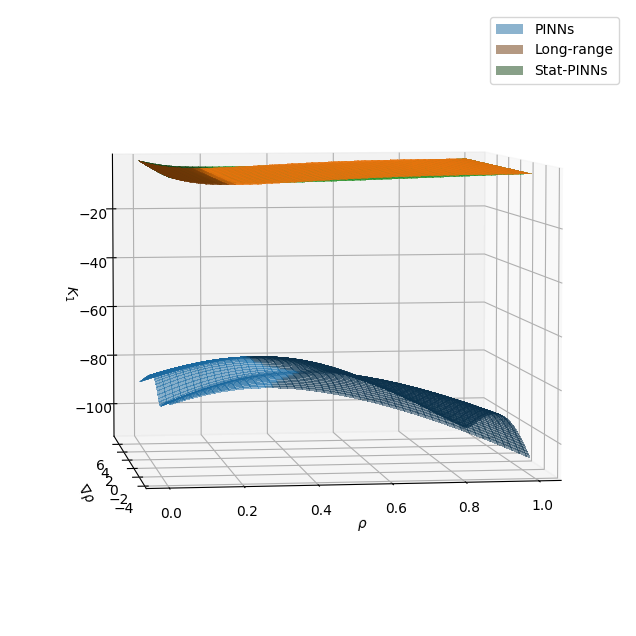

<Figure size 640x480 with 0 Axes>

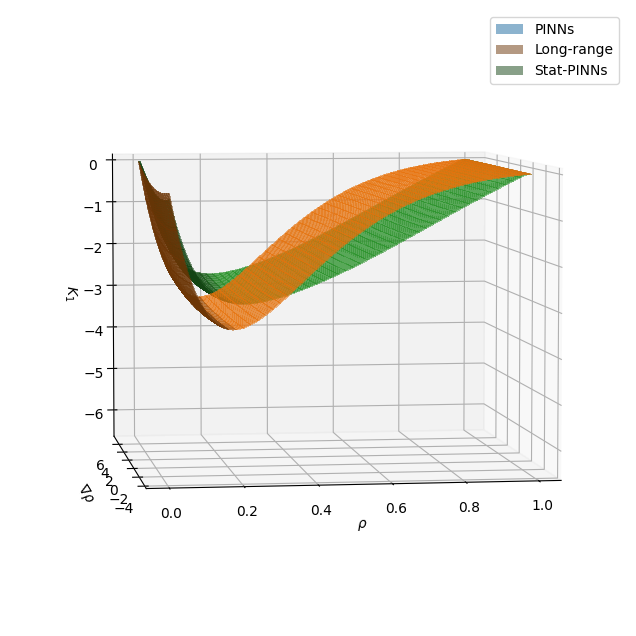

In [ ]:
plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(0, -90)
ax1 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_LongRange, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
ax2._facecolors2d = ax2._facecolor3d
ax2._edgecolors2d = ax2._edgecolor3d
ax3 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
ax3._facecolors2d = ax3._facecolor3d
ax3._edgecolors2d = ax3._edgecolor3d
# ax3 = ax.scatter(rho_1_train_K, drho_1_train_K, K_1_train_K, alpha=0.5, color = 'orange', label = 'Exp K1')
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel(r'$K_1$')
# plt.title('K1 grid error = {}'.format(K_1_error_grid))
plt.show()

plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(5, -98)
ax1 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_LongRange, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
ax2._facecolors2d = ax2._facecolor3d
ax2._edgecolors2d = ax2._edgecolor3d
ax3 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
ax3._facecolors2d = ax3._facecolor3d
ax3._edgecolors2d = ax3._edgecolor3d
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel(r'$K_1$')
# plt.title('K1 grid error = {}'.format(K_1_error_grid))
plt.show()


plt.figure()
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(5, -98)
ax1 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
ax1._facecolors2d = ax1._facecolor3d
ax1._edgecolors2d = ax1._edgecolor3d
ax2 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_LongRange, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
ax2._facecolors2d = ax2._facecolor3d
ax2._edgecolors2d = ax2._edgecolor3d
ax3 = ax.plot_surface(rho_pred_meshgrid_K, drho_pred_meshgrid_K, K_1_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
ax3._facecolors2d = ax3._facecolor3d
ax3._edgecolors2d = ax3._edgecolor3d
ax.legend(loc='best')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\nabla{\rho}$')
ax.set_zlabel(r'$K_1$')
# plt.title('K1 grid error = {}'.format(K_1_error_grid))
ax.set_zlim3d(-6.5, 0)
plt.show()


## Output $K$ predictions

In [ ]:
K_output_lib_dic = {"rho_K_lib": onp.array(rho_pred_meshgrid_K), "drho_K_lib": onp.array(drho_pred_meshgrid_K),\
             "K_1_StatPINNs_lib": onp.array(K_1_StatPINNs), "K_1_PINNs_lib": onp.array(K_1_PINNs), "K_1_LongRange_lib": onp.array(K_1_LongRange)}

In [ ]:
# Save K
FolderName_output_lib = FolderName + 'Outputs/'
Path(os.path.join(FolderName_output_lib)).mkdir(parents = True, exist_ok = True)

if K_INN_type == 'K1_MP_INN':
  scipy.io.savemat(FolderName_output_lib + 'K_output_lib.mat', K_output_lib_dic)
elif K_INN_type == 'K14_MP_INN':
  scipy.io.savemat(FolderName_output_lib + 'K14_output_lib.mat', K_output_lib_dic)

## Predictions for $f$

In [ ]:
rho_fe_pred = np.linspace(0.01,0.99,100)
print('Shape of rho_fe_pred:', rho_fe_pred.shape)

if fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gracC_INN':
  drho_fe_pred_min = drho_1_all_K.min() / model_range_factor
  drho_fe_pred_max = drho_1_all_K.max() / model_range_factor

  drho_fe_pred = np.linspace(drho_fe_pred_min,drho_fe_pred_max,200)
  print('Shape of drho_fe_pred:', drho_fe_pred.shape)

if fe_INN_type == 'fe_lap_INN':
  d2rho_fe_pred_min = lap_rho_all_fe.min() / model_range_factor**2
  d2rho_fe_pred_max = lap_rho_all_fe.max() / model_range_factor**2

  d2rho_fe_pred = np.linspace(d2rho_fe_pred_min,d2rho_fe_pred_max,200)
  print('Shape of d2rho_fe_pred:', d2rho_fe_pred.shape)


# set reference point for calibrating non-unique fe
rho_ref_fe = 0.5  # set fe = 0 @ rho = rho_ref_fe (and grad rho = 0 if exists)
rho_ref_Q = 0.5   # set Q = 0 @ rho = rho_ref_Q (and grad rho = 0 if exists)


if fe_INN_type == 'fe_INN':
  fe_StatPINNs = vmap(model_fe.predict_fe, in_axes=(None,0))(opt_params_fe, rho_fe_pred) \
          - model_fe.predict_fe(opt_params_fe, rho_ref_fe) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q) * ( rho_fe_pred - rho_ref_fe )
  fe_PINNs = vmap(model_Kfe.predict_fe, in_axes=(None,0))(opt_params_Kfe, rho_fe_pred) \
          - model_Kfe.predict_fe(opt_params_Kfe, rho_ref_fe) \
          - grad(model_Kfe.predict_fe, 1)(opt_params_Kfe, rho_ref_Q) * ( rho_fe_pred - rho_ref_fe )
  fe_LongRange = vmap(fe_Arr_ana_func, in_axes=(0,None,None,None))(rho_fe_pred,Jo,L,Co) \
          - fe_Arr_ana_func(rho_ref_fe,Jo,L,Co) \
          - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) * ( rho_fe_pred - rho_ref_fe )


elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':

  rho_pred_meshgrid_fe, drho_pred_meshgrid_fe = np.meshgrid(rho_fe_pred, drho_fe_pred)
  print('Shape of rho_pred_meshgrid_fe:', rho_pred_meshgrid_fe.shape)

  fe_StatPINNs = vmap(vmap(model_fe.predict_fe, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_pred_meshgrid_fe, drho_pred_meshgrid_fe) \
          - model_fe.predict_fe(opt_params_fe, rho_ref_fe, 0) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q, 0.0) * ( rho_fe_pred - rho_ref_fe ) \
          - vmap(vmap(grad(model_fe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_fe, rho_pred_meshgrid_fe, 0.0) \
           * ( drho_pred_meshgrid_fe - 0.0 )
  fe_PINNs = vmap(vmap(model_Kfe.predict_fe, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_Kfe, rho_pred_meshgrid_fe, drho_pred_meshgrid_fe) \
          - model_Kfe.predict_fe(opt_params_Kfe, rho_ref_fe, 0) \
          - grad(model_Kfe.predict_fe, 1)(opt_params_Kfe, rho_ref_Q, 0.0) * ( rho_fe_pred - rho_ref_fe ) \
          - vmap(vmap(grad(model_Kfe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_Kfe, rho_pred_meshgrid_fe, 0.0) \
           * ( drho_pred_meshgrid_fe - 0.0 )
  fe_LongRange = vmap(vmap(fe_Arr_ana_func, in_axes=(0,None,None,None)), in_axes=(0,None,None,None))(rho_pred_meshgrid_fe,Jo,L,Co) \
          - fe_Arr_ana_func(rho_ref_fe,Jo,L,Co) \
          - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) * ( rho_fe_pred - rho_ref_fe )




elif fe_INN_type == 'fe_lap_INN':
  rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe = np.meshgrid(rho_fe_pred, d2rho_fe_pred)
  print('Shape of rho_pred_meshgrid_fe:', rho_pred_meshgrid_fe.shape)

  fe_StatPINNs = vmap(vmap(model_fe.predict_fe, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_fe, rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe) \
          - model_fe.predict_fe(opt_params_fe, rho_ref_fe, 0) \
          - grad(model_fe.predict_fe, 1)(opt_params_fe, rho_ref_Q, 0.0) * ( rho_fe_pred - rho_ref_fe ) \
          - grad(model_fe.predict_fe, 2)(opt_params_fe, rho_ref_Q, 0.0) \
           * ( d2rho_pred_meshgrid_fe - 0.0 )
  fe_PINNs = vmap(vmap(model_Kfe.predict_fe, in_axes=(None, 0, 0)), in_axes=(None, 0, 0))(opt_params_Kfe, rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe) \
          - model_Kfe.predict_fe(opt_params_Kfe, rho_ref_fe, 0) \
          - grad(model_Kfe.predict_fe, 1)(opt_params_Kfe, rho_ref_Q, 0.0) * ( rho_fe_pred - rho_ref_fe ) \
          - vmap(vmap(grad(model_Kfe.predict_fe, 2), in_axes=(None, 0, None)), in_axes=(None, 0, None))(opt_params_Kfe, rho_pred_meshgrid_fe, 0.0) \
           * ( d2rho_pred_meshgrid_fe - 0.0 )
  fe_LongRange = vmap(vmap(fe_Arr_ana_func, in_axes=(0,None,None,None)), in_axes=(0,None,None,None))(rho_pred_meshgrid_fe,Jo,L,Co) \
          - fe_Arr_ana_func(rho_ref_fe,Jo,L,Co) \
          - grad(fe_Arr_ana_func, 0)(rho_ref_Q,Jo,L,Co) * ( rho_fe_pred - rho_ref_fe )


else:
  print("Wrong fe_INN_type!")
  exit()

print('Shape of fe_StatPINNs:', fe_StatPINNs.shape)
print('Shape of fe_PINNs:', fe_PINNs.shape)
print('Shape of fe_LongRange:', fe_LongRange.shape)



Shape of rho_fe_pred: (100,)
Shape of fe_StatPINNs: (100,)
Shape of fe_PINNs: (100,)
Shape of fe_LongRange: (100,)


<Figure size 640x480 with 0 Axes>

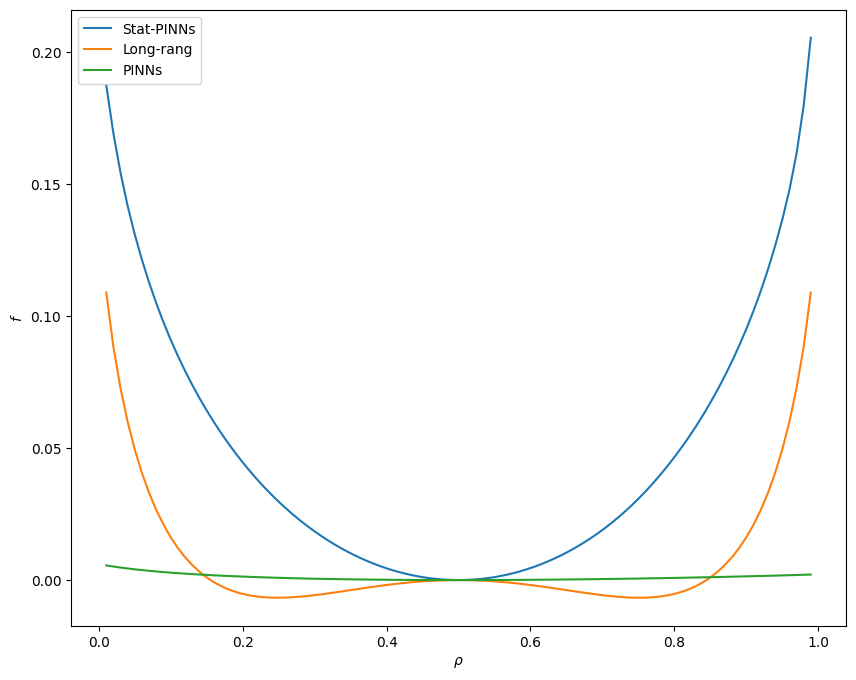

<Figure size 640x480 with 0 Axes>

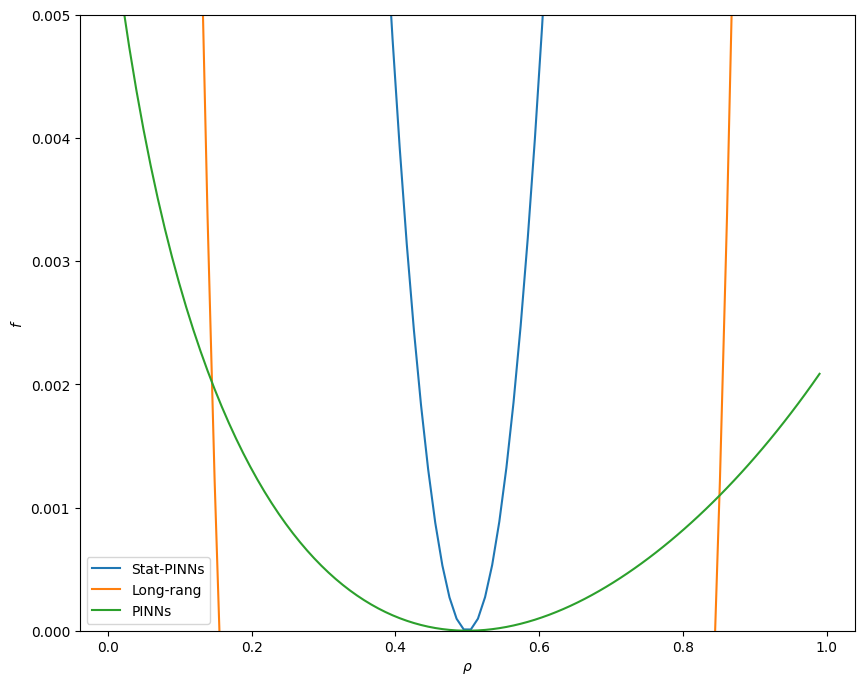

In [ ]:
if fe_INN_type == 'fe_INN':

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(rho_fe_pred, fe_StatPINNs, label='Stat-PINNs')
  plt.plot(rho_fe_pred, fe_LongRange, label='Long-rang')
  plt.plot(rho_fe_pred, fe_PINNs, label='PINNs')
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.legend()
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(rho_fe_pred, fe_StatPINNs, label='Stat-PINNs')
  plt.plot(rho_fe_pred, fe_LongRange, label='Long-rang')
  plt.plot(rho_fe_pred, fe_PINNs, label='PINNs')
  plt.xlabel(r'$\rho$')
  plt.ylabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.ylim([0, 0.005])
  plt.legend()
  plt.show()


elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
  ax3._facecolors2d = ax3._facecolor3d
  ax3._edgecolors2d = ax3._edgecolor3d
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
  ax3._facecolors2d = ax3._facecolor3d
  ax3._edgecolors2d = ax3._edgecolor3d
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.plot_surface(rho_pred_meshgrid_fe, drho_pred_meshgrid_fe, fe_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
  ax3._facecolors2d = ax3._facecolor3d
  ax3._edgecolors2d = ax3._edgecolor3d
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla{\rho}$')
  ax.set_zlabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()


elif fe_INN_type == 'fe_lap_INN':

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(30, 60)
  ax1 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
  ax3._facecolors2d = ax3._facecolor3d
  ax3._edgecolors2d = ax3._edgecolor3d
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2\rho}$')
  ax.set_zlabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 90)
  ax1 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
  ax3._facecolors2d = ax3._facecolor3d
  ax3._edgecolors2d = ax3._edgecolor3d
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2\rho}$')
  ax.set_zlabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()


  plt.figure()
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.view_init(0, 0)
  ax1 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_PINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'PINNs')
  ax1._facecolors2d = ax1._facecolor3d
  ax1._edgecolors2d = ax1._edgecolor3d
  ax2 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_ana_test, alpha=0.5, linewidth=0, antialiased=False, label = 'Long-range')
  ax2._facecolors2d = ax2._facecolor3d
  ax2._edgecolors2d = ax2._edgecolor3d
  ax3 = ax.plot_surface(rho_pred_meshgrid_fe, d2rho_pred_meshgrid_fe, fe_StatPINNs, alpha=0.5, linewidth=0, antialiased=False, label = 'Stat-PINNs')
  ax3._facecolors2d = ax3._facecolor3d
  ax3._edgecolors2d = ax3._edgecolor3d
  ax.legend(loc='best')
  ax.set_xlabel(r'$\rho$')
  ax.set_ylabel(r'$\nabla^2\rho}$')
  ax.set_zlabel(r'$f$')
  # plt.title(r'$f$ error = {}'.format(fe_error))
  plt.show()

In [ ]:
# plt.figure()
# fig = plt.figure(figsize=(10,8))
# plt.scatter(rho_fe_pred, fe_PINNs, label='PINNs')
# plt.xlabel(r'$\rho$')
# plt.ylabel(r'$f$')
# # plt.title(r'$f$ error = {}'.format(fe_error))
# plt.xlim([0.45,0.55])
# plt.ylim([0,0.002])
# plt.legend()
# plt.show()

## Output $f$ predictions

In [ ]:
if fe_INN_type == 'fe_INN':

  fe_output_lib_dic = {"rho_fe_lib": onp.array(rho_fe_pred),\
             "fe_StatPINNs_lib": onp.array(fe_StatPINNs), "fe_PINNs_lib": onp.array(fe_PINNs), "fe_LongRange_lib": onp.array(fe_LongRange)}

elif fe_INN_type == 'fe_gradB_INN' or fe_INN_type == 'fe_gradC_INN':

  fe_output_lib_dic = {"rho_fe_lib": onp.array(rho_pred_meshgrid_fe), "drho_fe_lib": onp.array(drho_pred_meshgrid_fe),\
             "fe_StatPINNs_lib": onp.array(fe_StatPINNs), "fe_PINNs_lib": onp.array(fe_PINNs), "fe_LongRange_lib": onp.array(fe_LongRange)}

elif fe_INN_type == 'fe_lap_INN':

  fe_output_lib_dic = {"rho_fe_lib": onp.array(rho_pred_meshgrid_fe), "d2rho_fe_lib": onp.array(d2rho_pred_meshgrid_fe),\
             "fe_StatPINNs_lib": onp.array(fe_StatPINNs), "fe_PINNs_lib": onp.array(fe_PINNs), "fe_LongRange_lib": onp.array(fe_LongRange)}

In [ ]:
# Save fe
# FolderName_output_lib = FolderName + 'Outputs_K_fe/'
Path(os.path.join(FolderName_output_lib)).mkdir(parents = True, exist_ok = True)

if fe_INN_type == 'fe_INN':
  scipy.io.savemat(FolderName_output_lib + 'fe_output_lib.mat', fe_output_lib_dic)
elif fe_INN_type == 'fe_gradB_INN':
  scipy.io.savemat(FolderName_output_lib + 'fe2B_output_lib.mat', fe_output_lib_dic)
elif fe_INN_type == 'fe_lap_INN':
  scipy.io.savemat(FolderName_output_lib + 'fe2L_output_lib.mat', fe_output_lib_dic)
else:
  print("Wrong fe_INN_type!")
  exit()


## Output $\rho(x,t)$ predictions

In [ ]:
# Save PINNs

FolderName_MacroSimAll = FolderName + 'Outputs/'


MacroSimAll_dic = {"rho_StatPINNs_All": onp.array(rho_Part_All), "rho_PINNs_All": onp.array(rho_PINNs_All), \
                "rho_LongRange_All": onp.array(rho_Ana_All), "rho_LongKMC_All": onp.array(rho_LongKMC_All),\
                "x_All": onp.array(x_All), "time_pred": onp.array(time_out), "T_pred": T_tot, \
                "x_LongKMC_All": onp.array(x_LongKMC_All), "T_LongKMC": onp.array(T_LongKMC), \
                "center": cent_pred, "amplitude": amp_pred, "frequency": freq_pred, "range_factor": model_range_factor, \
                "dtdx2_factor": dtdx2_factor, "dx_basis": dx_pred}


FileName_MacroSimAll_lib = 'MacroSim_output_lib_'

if K_INN_type == 'K1_MP_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + 'K_'
elif K_INN_type == 'K14_MP_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + 'K14_'


if fe_INN_type == 'fe_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "fe"
elif fe_INN_type == 'fe_gradB_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "fe2B"
elif fe_INN_type == 'fe_lap_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "fe2L"
elif fe_INN_type == 'fe_gradB_lap_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "fe3BL"
elif fe_INN_type == 'fe_gradC_lap_INN':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "fe3CL"

if conv_type == '2nd':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "_2nd"
elif conv_type == '4th':
  FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + "_4th"



FileName_MacroSimAll_lib = FileName_MacroSimAll_lib + ".mat"

print(FolderName_MacroSimAll + FileName_MacroSimAll_lib)
Path(os.path.join(FolderName_MacroSimAll)).mkdir(parents = True, exist_ok = True)
scipy.io.savemat(FolderName_MacroSimAll + FileName_MacroSimAll_lib, MacroSimAll_dic)

/content/drive/MyDrive/Colab Notebooks/Arrhenius_NN/Data/Arr230608_Nb2e3_G25_28c_JL2.2_L2_500R20_1_10h001_10dt200_Eq50_E2JLrm/Outputs/MacroSim_output_lib_K_fe.mat


# Keep running

In [ ]:
while True:pass

KeyboardInterrupt: ignored

# Continuum Test

In [ ]:
JL_test = 1.8
L_test = 80

# IniProfType = 'cos'
IniProfType = 'tri'
cent_pred = 0.5
# amp_pred = 0.45
amp_pred = 0.2
freq_pred = 3
# freq_pred = 2
IniProfParams = cent_pred, amp_pred, freq_pred

T_tot = 0.08
# T_tot = 0.2

Ngamma_pred = int(50)
# dtdx2_factor = 1.0/2.0
dtdx2_factor = 1.0/5.0
model_range_factor = Ngamma/float(Ngamma_pred)


Arr_Params_test = JL_test, L_test, Co, 1.0/4000

# conv_type = '0th'
conv_type = '2nd'

print(FolderName2)
print('K_INN_type = ', K_INN_type)
print('fe_INN_type = ', fe_INN_type)
print('Ngamma_pred = ', Ngamma_pred)
print('dtdx2_factor = ', dtdx2_factor)
print('model_range_factor = ', model_range_factor)
print('IniProfType = ', IniProfType)
print('[cent, amp, freq] = ', [cent_pred, amp_pred, freq_pred])
print('T_tot = ', T_tot)
print("[JoL, L, D, dx_bin] = ", Arr_Params_test)
print("conv_type = ", conv_type)

Modified_Arr230615_Nb2e3_G25_28c_JL0.9_L80_1e3R10_1_10h001_1dt20_Eq50_E2JLrm/
K_INN_type =  K1_MP_INN
fe_INN_type =  fe_INN
Ngamma_pred =  50
dtdx2_factor =  0.2
model_range_factor =  0.5
IniProfType =  tri
[cent, amp, freq] =  [0.5, 0.2, 3]
T_tot =  0.08
[JoL, L, D, dx_bin] =  (1.8, 80, 1, 0.00025)
conv_type =  2nd


In [ ]:
# Parameters for continuum prediction

NN_K_settings = model_K, opt_params_K, K_INN_type
NN_fe_settings = model_fe, opt_params_fe, fe_INN_type



In [ ]:
# Run Continuum Prediction


rho_Part_All_test, rho_Ana_All_test, x_All, t_pred = K_fe_MPPart_mobAna_MacroSim(NN_K_settings, NN_fe_settings, Arr_Params_test, IniProfType, IniProfParams, T_tot, \
                          conv_type=conv_type, dtdx2_factor=dtdx2_factor, Ngamma=Ngamma_pred, model_range_factor=model_range_factor)

# rho_Part_All, rho_Ana_All, x_All, t_pred, Q_temp,  Q_Ana_temp, m_half_Ana_temp, flux_Ana_temp\
#                         = K_fe_MPPart_mobAna_MacroSim(NN_K_settings, NN_fe_settings, Arr_Params, IniProfType, IniProfParams, 1e-5, \
#                           conv_type=conv_type, dtdx2_factor=0.5, Ngamma=Ngamma_pred, model_range_factor=model_range_factor)

100%|██████████| 1000/1000 [00:55<00:00, 18.17it/s]


[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

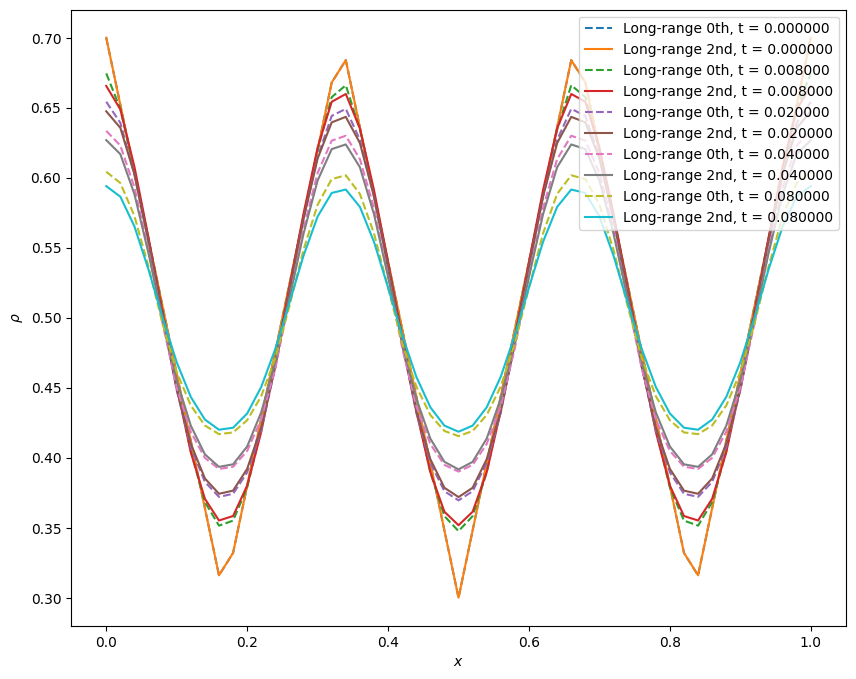

In [ ]:
index_plot = np.array([0, 0.1, 0.25, 0.5, 1]) * (t_pred.shape[0] - 1)
# index_plot = np.array([1]) * (t_pred.shape[0] - 1)
index_plot = [round(num) for num in index_plot]

time_out = t_pred

print(index_plot)

plt.figure()
fig = plt.figure(figsize=(10,8))
for it in index_plot:
# for it in range(20):
  # plt.plot(x_All, rho_Part_All[:,it], label='Stat-PINNs, t = %f' %t_pred[it])
  plt.plot(x_All, rho_Ana_All_test0[:,it], '--', label='Long-range 0th, t = %f' %t_pred[it])
  plt.plot(x_All, rho_Ana_All_test[:,it], '-', label='Long-range 2nd, t = %f' %t_pred[it])
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho$')
# plt.title(r'$Q$ error = {}'.format(Q_error))
# plt.ylim([0,1])
plt.legend()
plt.show()


[Array(0, dtype=int32), Array(50, dtype=int32), Array(125, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32)]
[Array(0, dtype=int32), Array(100, dtype=int32), Array(250, dtype=int32), Array(500, dtype=int32), Array(1000, dtype=int32)]


<Figure size 640x480 with 0 Axes>

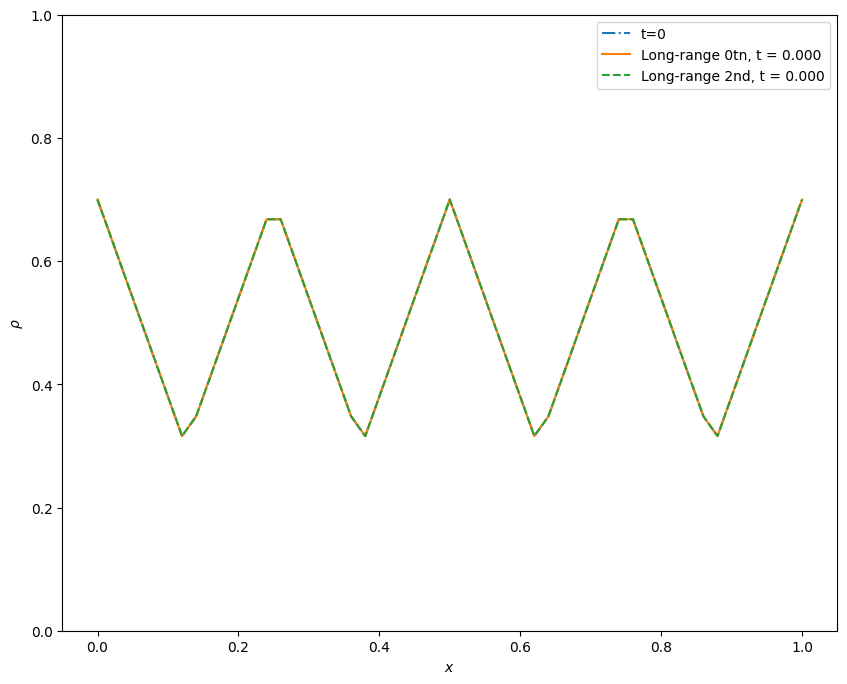

<Figure size 640x480 with 0 Axes>

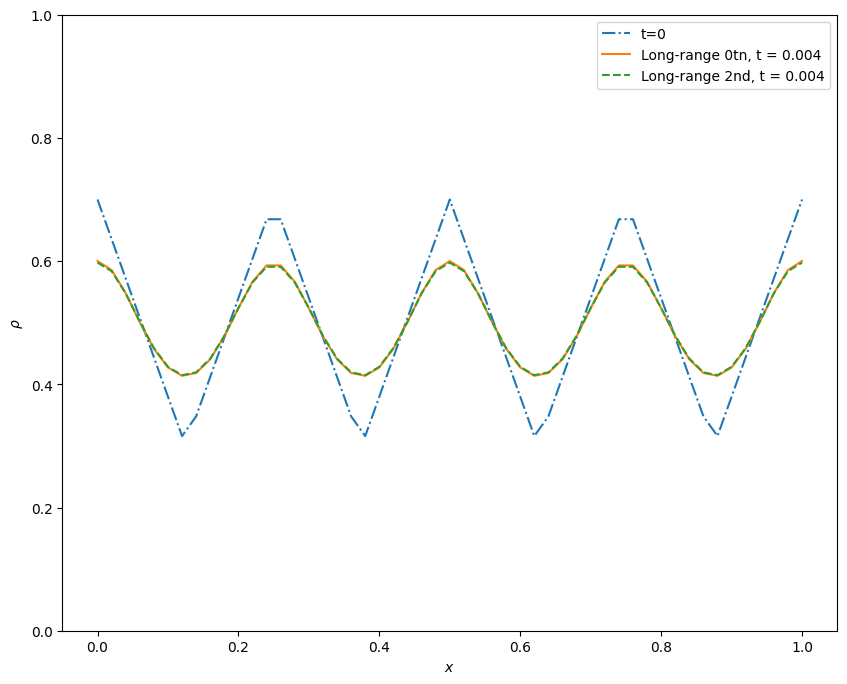

<Figure size 640x480 with 0 Axes>

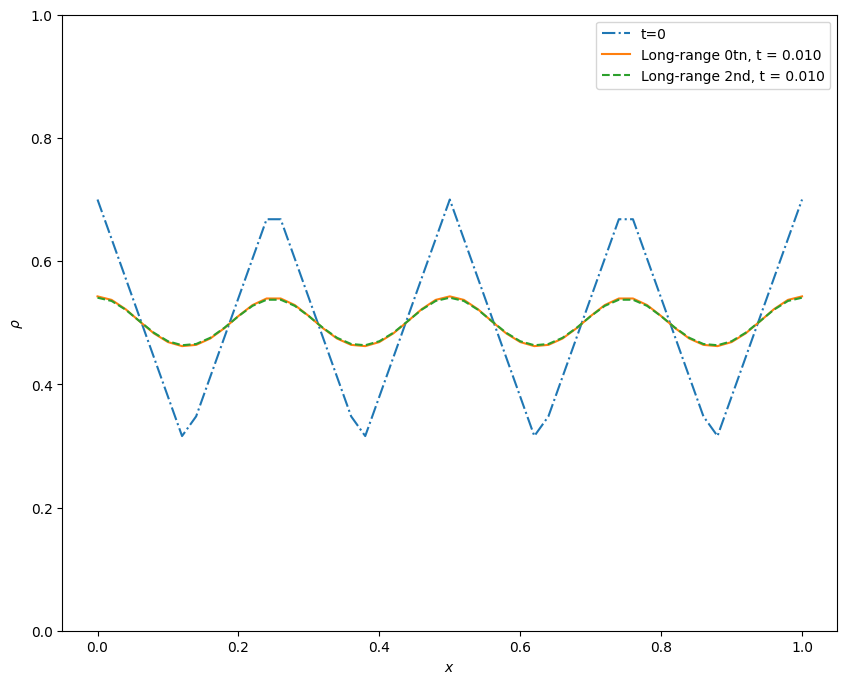

<Figure size 640x480 with 0 Axes>

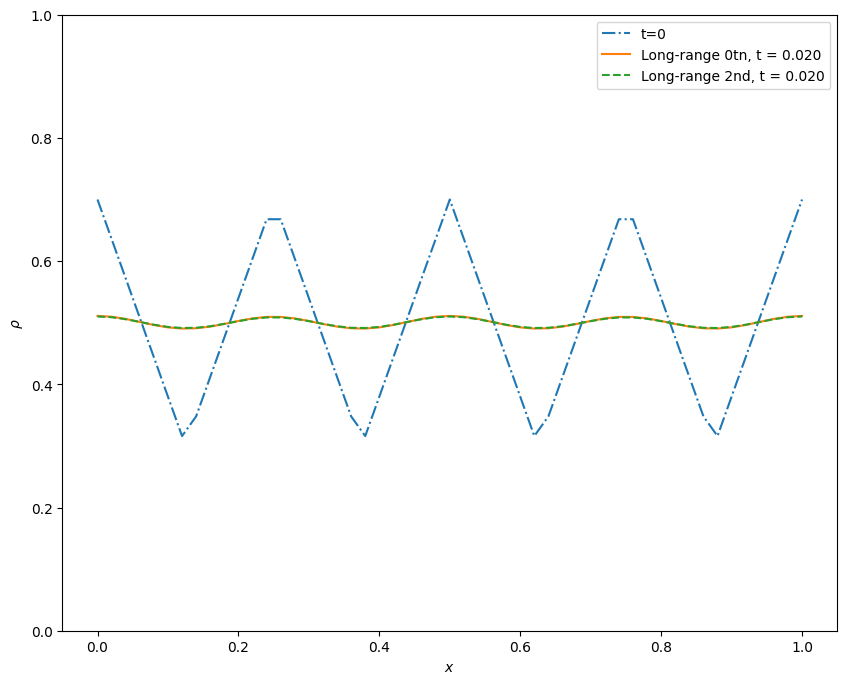

<Figure size 640x480 with 0 Axes>

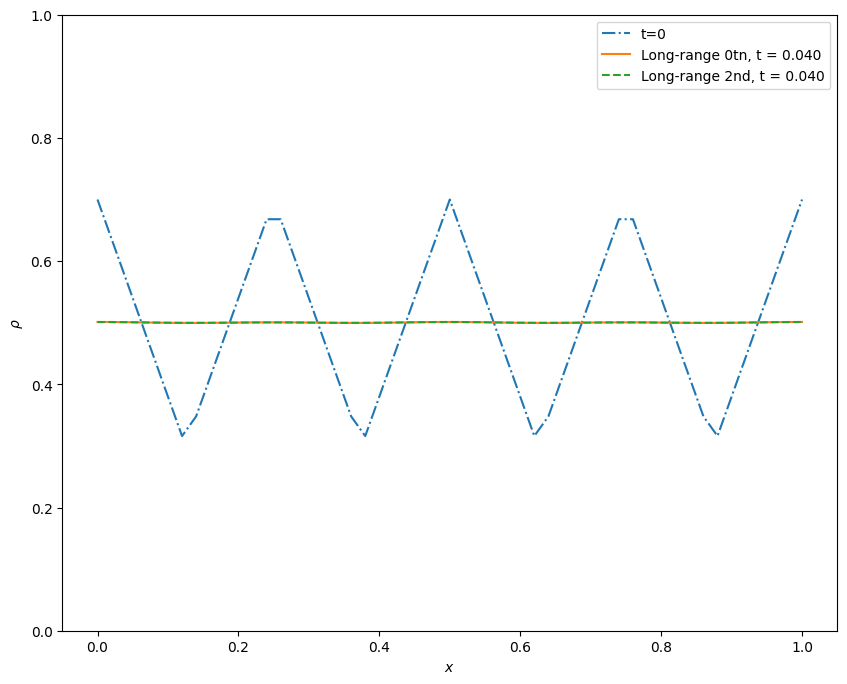

In [ ]:
index_plot_pred = np.array([0, 0.1, 0.25, 0.5, 1]) * (time_out.shape[0] - 1) * min(T_plot_max / T_tot, 1.0)
index_plot_pred = [round(num) for num in index_plot_pred]

index_plot_LongKMC = np.array([0, 0.1, 0.25, 0.5, 1]) * timesteps_LongKMC * min(T_plot_max / T_LongKMC, 1.0)
index_plot_LongKMC = [round(num) for num in index_plot_LongKMC]

print(index_plot_pred)
print(index_plot_LongKMC)

for it in range(len(index_plot_pred)):
  plt.figure()
  fig = plt.figure(figsize=(10,8))
  plt.plot(x_All, rho_Ana_All_test[:,0], '-.', label='t=0')

  plt.plot(x_All, rho_Ana_All_test0[:,index_plot_pred[it]], label='Long-range 0tn, t = %.3f' %time_out[index_plot_pred[it]])
  plt.plot(x_All, rho_Ana_All_test[:,index_plot_pred[it]], '--', label='Long-range 2nd, t = %.3f' %time_out[index_plot_pred[it]])
  # plt.plot(x_LongKMC_All, rho_LongKMC_All[:,index_plot_LongKMC[it]], ':', label='KMC, t = %.3f' %time_out[index_plot_pred[it]])
  plt.xlabel(r'$x$')
  plt.ylabel(r'$\rho$')
  # plt.title(r'$Q$ error = {}'.format(Q_error))
  plt.legend()
  plt.ylim([plot_min, plot_max])
  plt.show()